# Inorganic Material Generation using Deep Q-Networks
https://github.com/eltonpan/InorganicMaterialRL

Elton Pan

In [65]:
# Env: dqn_roost as of 15/1/2022 (after addition of ROOST)
import numpy as np
import pickle5 as pickle
import torch
from torch import nn
import collections
from model import DQN_pytorch, DCN_pytorch
import time
from one_hot import featurize_target, onehot_target, element_set, comp_set, one_hot_to_element, element_to_one_hot, one_hot_to_comp, comp_to_one_hot, step_to_one_hot, one_hot_to_step
import seaborn as sns
import random
import matplotlib.pyplot as plt
import os
from env_constrained import generate_random_act, ConstrainedMaterialEnvironment, extract_data_from_ep
import collections
from sklearn.preprocessing import StandardScaler
from tqdm import tqdm 
from sklearn.manifold import TSNE
from numpy.linalg import svd
import imageio
from pymatgen.core import Composition
from constraints.checkers import check_neutrality, check_neutrality, check_neutrality_multiple, check_electronegativity_multiple, check_both_multiple
from matminer.featurizers.base import MultipleFeaturizer
import matminer.featurizers.composition as cf
from sklearn.ensemble import RandomForestRegressor
import joblib
from roost_models.roost_model import predict_formation_energy
os.environ["CUDA_VISIBLE_DEVICES"]="1"
print(torch.cuda.is_available())


True


# Random policy
In env.py, we have generated some data using a random policy. Here, we visualize the distribution of final rewards, and then trained an agent using purely data generated by the random policy.

In [66]:
# Load Q_data_random
# with open('./data/Q_data_random_RF_constrained.pkl', 'rb') as f:
with open('./data/Q_data_random_RF_constrained.pkl', 'rb') as f:
    Q_c_data_random = pickle.load(f)

print('Number of episodes generated by random policy:',len(Q_c_data_random))

def generate_dqn_dcn_inputs_and_targets_from_Q_c_data(Q_c_data):
    '''
    Generates inputs and targets for DQN training

    Args:
    Q_data: List of Q_datapoints for training
    
    Returns:
    s_material_inputs: torch.tensor of Size([num of episodes in Q_data, 145])
    s_step_inputs: torch.tensor
    a_elem_inputs: torch.tensor
    a_comp_inputs: torch.tensor
    Q_targets: torch.tensor
    en_targets: torch.tensor

    '''
    s_material_inputs = []
    s_step_inputs     = []
    a_elem_inputs     = []
    a_comp_inputs     = []
    Q_targets         = []
    en_targets         = []

    for episode in Q_c_data:
        for step in episode:
            # state, action, reward = step
            [s_material, s_step], [a_elem, a_comp], Q_target, en_target = step

            s_material = torch.tensor(s_material).float()
            s_step = torch.tensor(s_step)
            a_elem = torch.tensor(a_elem)
            a_comp = torch.tensor(a_comp)
            Q_target = torch.tensor([Q_target])
            en_target = torch.tensor([en_target])

            s_material_inputs.append(s_material)
            s_step_inputs.append(s_step)
            a_elem_inputs.append(a_elem)
            a_comp_inputs.append(a_comp)
            Q_targets.append(Q_target)
            en_targets.append(en_target)

    s_material_inputs = torch.stack(s_material_inputs)
    s_step_inputs = torch.stack(s_step_inputs)
    a_elem_inputs = torch.stack(a_elem_inputs)
    a_comp_inputs = torch.stack(a_comp_inputs)
    Q_targets = torch.stack(Q_targets)
    en_targets = torch.stack(en_targets)

    return s_material_inputs, s_step_inputs, a_elem_inputs, a_comp_inputs, Q_targets, en_targets

s_material_inputs, s_step_inputs, a_elem_inputs, a_comp_inputs, Q_targets, en_targets = generate_dqn_dcn_inputs_and_targets_from_Q_c_data(Q_c_data = Q_c_data_random)

print('s_material_inputs:', s_material_inputs.shape)
print('s_step_inputs:', s_step_inputs.shape)
print('a_elem_inputs:', a_elem_inputs.shape)
print('a_comp_inputs:', a_comp_inputs.shape)
print('Q_targets:', Q_targets.shape)
print('en_targets:', en_targets.shape)
print('')

Number of episodes generated by random policy: 10000
s_material_inputs: torch.Size([50000, 145])
s_step_inputs: torch.Size([50000, 5])
a_elem_inputs: torch.Size([50000, 80])
a_comp_inputs: torch.Size([50000, 10])
Q_targets: torch.Size([50000, 1])
en_targets: torch.Size([50000, 1])



/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


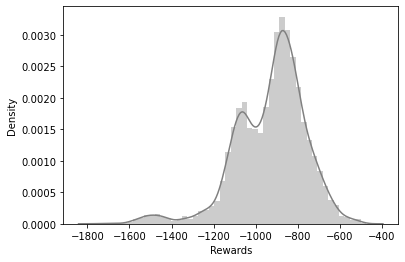

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


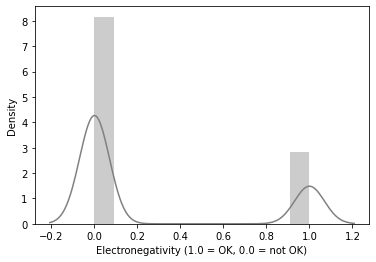

In [67]:
# Plot distribution of final rewards by random policy
plt.figure()
final_rewards_random = Q_targets[0::5].reshape(-1) # find final rewards
sns.distplot(final_rewards_random, color= 'grey')
plt.xlabel('Rewards')
plt.show()

# Plot distribution of en by random policy
plt.figure()
en_random = en_targets[0::5].reshape(-1) # find final rewards
sns.distplot(en_random, color= 'grey')
plt.xlabel('Electronegativity (1.0 = OK, 0.0 = not OK)')
plt.show()

### Fix class imbalance 
No significant improvement hence not used anymore

In [6]:
# good = 0
# bad = 0
# for en in en_targets:
#     if en.item() == 1.:
#         good += 1
#     else: 
#         bad += 1
# print('Before balancing: ',good/(good + bad))

Before balancing:  0.2576


In [7]:
# good_idx = []
# bad_idx = []
# idx = 0
# for en in en_targets:
#     if en.item() == 1.:
#         good_idx.append(idx)
#     else:
#         bad_idx.append(idx)
#     idx += 1

# num_datapoints = 25000
# good_idx = good_idx[: num_datapoints]
# bad_idx  = bad_idx[:num_datapoints] # truncate bad compounds to ensure class imbalance
# balanced_idx = bad_idx + good_idx

# s_material_inputs = s_material_inputs[balanced_idx]
# s_step_inputs = s_step_inputs[balanced_idx]
# a_elem_inputs = a_elem_inputs[balanced_idx]
# a_comp_inputs = a_comp_inputs[balanced_idx]
# Q_targets = Q_targets[balanced_idx]
# en_targets = en_targets[balanced_idx]

# print('s_material_inputs:', s_material_inputs.shape)
# print('s_step_inputs:', s_step_inputs.shape)
# print('a_elem_inputs:', a_elem_inputs.shape)
# print('a_comp_inputs:', a_comp_inputs.shape)
# print('Q_targets:', Q_targets.shape)
# print('en_targets:', en_targets.shape)
# print('')

# good = 0
# bad = 0
# for en in en_targets:
#     if en.item() == 1.:
#         good += 1
#     else: 
#         bad += 1

# print('After balancing: ',good/(good + bad))

In [68]:
# Standardizing s_material data
scaler = StandardScaler() # Fit scaler
print('before scaling:', s_material_inputs)
scaler.fit(s_material_inputs)
s_material_inputs_scaled = torch.tensor(scaler.transform(s_material_inputs)).float()
print('after scaling:', s_material_inputs_scaled)

# # Save standard scaler
# joblib.dump(scaler, 'data/std_scaler.bin', compress=True)

# Load standard scaler
scalar = joblib.load('data/std_scaler.bin')

before scaling: tensor([[4.0000e+00, 6.4952e-01, 5.9343e-01,  ..., 0.0000e+00, 3.8309e-01,
         2.4297e-02],
        [3.0000e+00, 7.4231e-01, 7.1808e-01,  ..., 0.0000e+00, 3.8309e-01,
         4.6373e-02],
        [2.0000e+00, 8.4984e-01, 8.3555e-01,  ..., 0.0000e+00, 1.5987e-03,
         2.2204e-04],
        ...,
        [1.0000e+00, 1.0000e+00, 1.0000e+00,  ..., 1.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]])
after scaling: tensor([[ 1.6739,  0.1534,  0.0971,  ..., -0.5587,  1.2861,  0.0383],
        [ 0.9193,  0.4174,  0.4540,  ..., -0.5587,  1.2861,  0.6393],
        [ 0.1647,  0.7233,  0.7904,  ..., -0.5587, -0.6513, -0.6172],
        ...,
        [-0.5899,  1.1504,  1.2613,  ...,  1.7897, -0.6595, -0.6232],
        [-1.3445, -1.6941, -1.6021,  ..., -0.5587, -0.6595, -0.6232],
        [-

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/sklearn/base.py:315: UserWarning: Trying to unpickle estimator StandardScaler from version 1.0.1 when using version 0.24.2. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)


In [69]:
# Train-validation split
def train_validation_split(s_material_inputs_scaled, s_step_inputs, a_elem_inputs, a_comp_inputs, Q_targets, en_targets, valid_size = 0.2):
    '''
    Args:
    s_material_inputs_scaled
    s_step_inputs
    a_elem_inputs
    a_comp_inputs
    Q_targets
    en_targets
    valid_size: Float (0-1). Size of validation set

    Returns:
    s_material_inputs_train 
    s_step_inputs_train     
    a_elem_inputs_train     
    a_comp_inputs_train     
    Q_targets_train   
    en_targets_train   
    s_material_inputs_valid 
    s_step_inputs_valid 
    a_elem_inputs_valid
    a_comp_inputs_valid 
    Q_targets_valid
    en_targets_valid
  
    '''
    max_idx = s_material_inputs_scaled.shape[0] # Find size of dataset
    idx = [x for x in range(max_idx)] # Generate indices
    random.shuffle(idx) # Shuffle order idx 
    split = int(round(max_idx*(1-valid_size)))
    train_idx, valid_idx = idx[:split], idx[split:] # Split indices

    s_material_inputs_train = s_material_inputs_scaled[train_idx] # Use scaled s_material
    s_step_inputs_train     = s_step_inputs[train_idx]
    a_elem_inputs_train     = a_elem_inputs[train_idx]
    a_comp_inputs_train     = a_comp_inputs[train_idx]
    Q_targets_train         = Q_targets[train_idx]
    en_targets_train         = en_targets[train_idx]

    s_material_inputs_valid = s_material_inputs_scaled[valid_idx] # Use scaled s_material
    s_step_inputs_valid     = s_step_inputs[valid_idx]
    a_elem_inputs_valid     = a_elem_inputs[valid_idx]
    a_comp_inputs_valid     = a_comp_inputs[valid_idx]
    Q_targets_valid         = Q_targets[valid_idx]
    en_targets_valid         = en_targets[valid_idx]

    return s_material_inputs_train, s_step_inputs_train, a_elem_inputs_train, a_comp_inputs_train, Q_targets_train, en_targets_train,s_material_inputs_valid, s_step_inputs_valid, a_elem_inputs_valid, a_comp_inputs_valid, Q_targets_valid, en_targets_valid

s_material_inputs_train, s_step_inputs_train, a_elem_inputs_train, a_comp_inputs_train, Q_targets_train, en_targets_train, s_material_inputs_valid, s_step_inputs_valid, a_elem_inputs_valid, a_comp_inputs_valid, Q_targets_valid, en_targets_valid \
= train_validation_split(s_material_inputs_scaled = s_material_inputs_scaled.to('cuda'), 
                                    s_step_inputs = s_step_inputs.to('cuda'), 
                                    a_elem_inputs = a_elem_inputs.to('cuda'),
                                    a_comp_inputs = a_comp_inputs.to('cuda'),
                                    Q_targets  = Q_targets.to('cuda'),
                                    en_targets = en_targets.to('cuda'),
                                    valid_size = 0.2)

print('TRAIN SIZES:')
print('s_material_inputs_train:', s_material_inputs_train.shape)
print('s_step_inputs_train:', s_step_inputs_train.shape)
print('a_elem_inputs_train:', a_elem_inputs_train.shape)
print('a_comp_inputs_train:', a_comp_inputs_train.shape)
print('Q_targets_train:', Q_targets_train.shape)
print('en_targets_train:', en_targets_train.shape)
print('')
print('VALIDATION SIZES:')
print('s_material_inputs_valid:', s_material_inputs_valid.shape)
print('s_step_inputs_valid:', s_step_inputs_valid.shape)
print('a_elem_inputs_valid:', a_elem_inputs_valid.shape)
print('a_comp_inputs_valid:', a_comp_inputs_valid.shape)
print('Q_targets_valid:', Q_targets_valid.shape)
print('en_targets_valid:', en_targets_valid.shape)

TRAIN SIZES:
s_material_inputs_train: torch.Size([40000, 145])
s_step_inputs_train: torch.Size([40000, 5])
a_elem_inputs_train: torch.Size([40000, 80])
a_comp_inputs_train: torch.Size([40000, 10])
Q_targets_train: torch.Size([40000, 1])
en_targets_train: torch.Size([40000, 1])

VALIDATION SIZES:
s_material_inputs_valid: torch.Size([10000, 145])
s_step_inputs_valid: torch.Size([10000, 5])
a_elem_inputs_valid: torch.Size([10000, 80])
a_comp_inputs_valid: torch.Size([10000, 10])
Q_targets_valid: torch.Size([10000, 1])
en_targets_valid: torch.Size([10000, 1])


Here we train DQN using ONLY data generated by random policy.

# DQN

In [70]:
# Initialize Q network
dqn = DQN_pytorch().cuda()
print('CUDA for model: ', next(dqn.parameters()).is_cuda)

def train_DQN(dqn, num_epoch, s_material_inputs_train, s_step_inputs_train, a_elem_inputs_train, a_comp_inputs_train, Q_targets_train ,s_material_inputs_valid ,s_step_inputs_valid ,a_elem_inputs_valid ,a_comp_inputs_valid ,Q_targets_valid):
    '''
    Trains DQN and prints: 1. training loss 2. validation loss

    Args:
    dqn: DQN
    num_epoch: Int. Number of training epochs 
    s_material_inputs_train
    s_step_inputs_train
    a_elem_inputs_train
    a_comp_inputs_train
    Q_targets_train
    s_material_inputs_valid
    s_step_inputs_valid
    a_elem_inputs_valid
    a_comp_inputs_valid
    Q_targets_valid

    Returns:
    Updated dqn
    train_loss_list
    valid_loss_list
    '''
    train_loss_list = []
    valid_loss_list = []

    # Train Q network
    optimizer = torch.optim.Adam(dqn.parameters(), lr=1e-2)
    loss_func = torch.nn.SmoothL1Loss().float()

    # start = time.time()

    for epoch in range(num_epoch):
        # Train loss
        prediction_train = dqn(s_material = s_material_inputs_train, # torch.Size([batch_size, 145]) and must be .float() !!!
                        s_step      = s_step_inputs_train,     # torch.Size([batch_size,5])
                        a_elem      = a_elem_inputs_train,     # torch.Size([batch_size,80])
                        a_comp      = a_comp_inputs_train,  # torch.Size([batch_size,10])
                        )                    # Input x and predict based on x
        train_loss       = loss_func(prediction_train.float(), Q_targets_train.float()).float()   # Must be (1. nn output, 2. target)
        optimizer.zero_grad()   # Clear gradients for next train
        train_loss.backward()         # Backpropagation, compute gradients
        optimizer.step()        # Apply gradients

        # Validation loss
        prediction_valid = dqn(s_material = s_material_inputs_valid, # torch.Size([batch_size, 145]) and must be .float() !!!
                        s_step      = s_step_inputs_valid,     # torch.Size([batch_size,5])
                        a_elem      = a_elem_inputs_valid,     # torch.Size([batch_size,80])
                        a_comp      = a_comp_inputs_valid,  # torch.Size([batch_size,10]))
                        )
        valid_loss = loss_func(prediction_valid.float(), Q_targets_valid.float()).float()   # Must be (1. nn output, 2. target)
        train_loss_list.append(train_loss.cpu().detach().numpy())
        valid_loss_list.append(valid_loss.cpu().detach().numpy())

        print('Epoch = ', epoch, 'Train_loss = %.4f' % train_loss.cpu().data.numpy(), 'Valid_loss = %.4f' % valid_loss.cpu().data.numpy())
    # end = time.time()
    # print('time taken for batch:', end - start)
    
    return dqn, train_loss_list, valid_loss_list
dqn, train_loss_list, valid_loss_list = train_DQN(dqn =  dqn, num_epoch = 100, s_material_inputs_train = s_material_inputs_train, s_step_inputs_train = s_step_inputs_train,
 a_elem_inputs_train = a_elem_inputs_train, a_comp_inputs_train = a_comp_inputs_train, Q_targets_train = Q_targets_train,
 s_material_inputs_valid = s_material_inputs_valid, s_step_inputs_valid = s_step_inputs_valid, a_elem_inputs_valid = a_elem_inputs_valid,
 a_comp_inputs_valid = a_comp_inputs_valid, Q_targets_valid = Q_targets_valid)

CUDA for model:  True
Epoch =  0 Train_loss = 759.9391 Valid_loss = 758.6380
Epoch =  1 Train_loss = 758.8391 Valid_loss = 756.7661
Epoch =  2 Train_loss = 756.9596 Valid_loss = 753.6971
Epoch =  3 Train_loss = 753.8765 Valid_loss = 749.0935
Epoch =  4 Train_loss = 749.2512 Valid_loss = 742.5935
Epoch =  5 Train_loss = 742.7199 Valid_loss = 733.8111
Epoch =  6 Train_loss = 733.8947 Valid_loss = 722.3195
Epoch =  7 Train_loss = 722.3471 Valid_loss = 707.6525
Epoch =  8 Train_loss = 707.6085 Valid_loss = 689.3105
Epoch =  9 Train_loss = 689.1771 Valid_loss = 666.7174
Epoch =  10 Train_loss = 666.4743 Valid_loss = 639.2830
Epoch =  11 Train_loss = 638.9062 Valid_loss = 606.3394
Epoch =  12 Train_loss = 605.8018 Valid_loss = 567.2008
Epoch =  13 Train_loss = 566.4716 Valid_loss = 521.7158
Epoch =  14 Train_loss = 520.7881 Valid_loss = 474.5146
Epoch =  15 Train_loss = 473.4582 Valid_loss = 439.9671
Epoch =  16 Train_loss = 439.6803 Valid_loss = 413.9921
Epoch =  17 Train_loss = 414.4232 Va

# DCN

In [71]:
# Initialize constraint network
dcn = DCN_pytorch().cuda()

def train_DCN(dcn, num_epoch, s_material_inputs_train, s_step_inputs_train, a_elem_inputs_train, a_comp_inputs_train, Q_targets_train, en_targets_train, s_material_inputs_valid ,s_step_inputs_valid ,a_elem_inputs_valid ,a_comp_inputs_valid , Q_targets_valid, en_targets_valid):
    '''
    Trains DCN and prints: 1. training loss 2. validation loss

    Args:
    dcn: DCN
    num_epoch: Int. Number of training epochs 
    s_material_inputs_train
    s_step_inputs_train
    a_elem_inputs_train
    a_comp_inputs_train
    Q_targets_train
    en_targets_train
    s_material_inputs_valid
    s_step_inputs_valid
    a_elem_inputs_valid
    a_comp_inputs_valid
    Q_targets_valid
    en_targets_valid

    Returns:
    Updated dcn
    train_loss_list
    valid_loss_list
    '''
    train_loss_list = []
    valid_loss_list = []

    # Train Q network
    optimizer = torch.optim.Adam(dcn.parameters(), lr=1e-2)
    # loss_func = torch.nn.SmoothL1Loss().float()
    loss_func = torch.nn.MSELoss().float() # Works better than L1Loss
    # loss_func = torch.nn.L1Loss().float() # Trained model gives pred close to 0

    # start = time.time()

    for epoch in range(num_epoch):
        # Train loss
        prediction_train = dcn(s_material = s_material_inputs_train, # torch.Size([batch_size, 145]) and must be .float() !!!
                        s_step      = s_step_inputs_train,     # torch.Size([batch_size,5])
                        a_elem      = a_elem_inputs_train,     # torch.Size([batch_size,80])
                        a_comp      = a_comp_inputs_train,  # torch.Size([batch_size,10])
                        )                    # Input x and predict based on x
        train_loss       = loss_func(prediction_train.float(), en_targets_train.float()).float()   # Must be (1. nn output, 2. target)
        optimizer.zero_grad()   # Clear gradients for next train
        train_loss.backward()         # Backpropagation, compute gradients
        optimizer.step()        # Apply gradients

        # Validation loss
        prediction_valid = dcn(s_material = s_material_inputs_valid, # torch.Size([batch_size, 145]) and must be .float() !!!
                        s_step      = s_step_inputs_valid,     # torch.Size([batch_size,5])
                        a_elem      = a_elem_inputs_valid,     # torch.Size([batch_size,80])
                        a_comp      = a_comp_inputs_valid,  # torch.Size([batch_size,10]))
                        )
        valid_loss = loss_func(prediction_valid.float(), en_targets_valid.float()).float()   # Must be (1. nn output, 2. target)
        train_loss_list.append(train_loss.cpu().detach().numpy())
        valid_loss_list.append(valid_loss.cpu().detach().numpy())

        print('Epoch = ', epoch, 'Train_loss = %.4f' % train_loss.data.cpu().numpy(), 'Valid_loss = %.4f' % valid_loss.data.cpu().numpy())
    # end = time.time()
    # print('time taken for batch:', end - start)
    
    return dcn, train_loss_list, valid_loss_list
dcn, train_loss_list, valid_loss_list = train_DCN(dcn =  dcn, num_epoch = 100, s_material_inputs_train = s_material_inputs_train, s_step_inputs_train = s_step_inputs_train,
 a_elem_inputs_train = a_elem_inputs_train, a_comp_inputs_train = a_comp_inputs_train, Q_targets_train = Q_targets_train, en_targets_train = en_targets_train,
 s_material_inputs_valid = s_material_inputs_valid, s_step_inputs_valid = s_step_inputs_valid, a_elem_inputs_valid = a_elem_inputs_valid,
 a_comp_inputs_valid = a_comp_inputs_valid, Q_targets_valid = Q_targets_valid, en_targets_valid = en_targets_valid)

Epoch =  0 Train_loss = 0.2556 Valid_loss = 0.1936
Epoch =  1 Train_loss = 0.1933 Valid_loss = 0.2088
Epoch =  2 Train_loss = 0.2087 Valid_loss = 0.2008
Epoch =  3 Train_loss = 0.2006 Valid_loss = 0.1888
Epoch =  4 Train_loss = 0.1884 Valid_loss = 0.1848
Epoch =  5 Train_loss = 0.1842 Valid_loss = 0.1868
Epoch =  6 Train_loss = 0.1862 Valid_loss = 0.1852
Epoch =  7 Train_loss = 0.1847 Valid_loss = 0.1823
Epoch =  8 Train_loss = 0.1820 Valid_loss = 0.1818
Epoch =  9 Train_loss = 0.1818 Valid_loss = 0.1820
Epoch =  10 Train_loss = 0.1821 Valid_loss = 0.1807
Epoch =  11 Train_loss = 0.1807 Valid_loss = 0.1789
Epoch =  12 Train_loss = 0.1786 Valid_loss = 0.1785
Epoch =  13 Train_loss = 0.1778 Valid_loss = 0.1786
Epoch =  14 Train_loss = 0.1777 Valid_loss = 0.1775
Epoch =  15 Train_loss = 0.1765 Valid_loss = 0.1758
Epoch =  16 Train_loss = 0.1749 Valid_loss = 0.1748
Epoch =  17 Train_loss = 0.1741 Valid_loss = 0.1741
Epoch =  18 Train_loss = 0.1735 Valid_loss = 0.1730
Epoch =  19 Train_loss

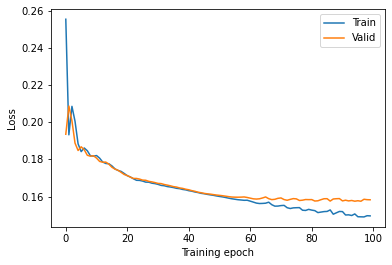

In [72]:
# Plot train and valid losses
plt.figure()
plt.plot(range(0,len(train_loss_list)), train_loss_list, label = 'Train')
plt.plot(range(0,len(valid_loss_list)), valid_loss_list, label = 'Valid')
plt.legend()
# plt.ylim(130,170)
plt.xlabel('Training epoch')
plt.ylabel('Loss')
# plt.savefig('plots/train_valid_loss.png', dpi = 300)
plt.show()

In [74]:
def ranked_max_actions(state, dqn, n_actions = len(element_set)*len(comp_set)):
    """
    Returns a list of ranked actions based on Q-network prodictions

    Args:
    state: List [s_material, s_step] where s_material is the string representation of material and s_step is the integer step number
    dqn: Q-network for Q-value prediction

    Returns:
    ranked_max_actions: List [[s_material, s_step, Q-value]
                              ...
                              [s_material, s_step, Q-value]
                              ]
    where s_material is the one-hot torch.tensor.float() of material and
    s_step is the  one-hot torch.tensor.float()
    0th index corresponds to highest Q-value
    """

    s_material, s_step = state
    # s_material = torch.tensor(onehot_target(s_material)).float() # Get one-hot rep of s_material
    s_material = torch.tensor(featurize_target(s_material)).reshape(1, -1) # Get one-hot rep of s_material
    s_material = torch.tensor(scaler.transform(s_material)).reshape(-1).float()  # Standardize s_material
    s_step = torch.tensor(step_to_one_hot([s_step])[0]).float() # Get one-hot rep of s_step

    s_material_input = torch.stack([s_material]*n_actions).to('cuda')
    s_step_input = torch.stack([s_step]*n_actions).to('cuda')

    a_elem_input = []
    a_comp_input = []
    for elem in element_set:
        a_elem = torch.tensor(element_to_one_hot([elem])[0]).float()
        for comp in comp_set:
            a_comp = torch.tensor(comp_to_one_hot([comp])[0]).float()

            a_elem_input.append(a_elem)
            a_comp_input.append(a_comp)
    
    a_elem_input = torch.stack(a_elem_input).float().to('cuda')
    a_comp_input = torch.stack(a_comp_input).float().to('cuda')
    
    Q_pred = dqn(s_material = s_material_input, # torch.Size([batch_size, 40, 115]) and must be .float() !!!
                    s_step      = s_step_input,     # torch.Size([batch_size,5])
                    a_elem      = a_elem_input,     # torch.Size([batch_size,80])
                    a_comp      = a_comp_input,  # torch.Size([batch_size,10])

                )   
    # Rank according to Q-values
    Q_pred = Q_pred.cpu().detach().numpy()
    Q_pred = Q_pred.reshape(len(element_set)*len(comp_set))
    order = Q_pred.argsort()
    ranks = order.argsort() # ranks of Q-values, 0th index = lowest Q, last index = highest Q
    
    
    a_elem_input_ranked = torch.zeros([len(element_set)*len(comp_set), len(element_set)])
    a_comp_input_ranked = torch.zeros([len(element_set)*len(comp_set), len(comp_set)])
    Q_pred_ranked = np.zeros(len(element_set)*len(comp_set))

    for rank in reversed(range(len(element_set)*len(comp_set))): # Start with most valuable
        rank_idx = ranks[rank] # rank_idx = final position
        rank_idx = (len(element_set)*len(comp_set) - 1) - rank_idx # Reverse rank_idx i.e. Want 0th index to correspond to max Q

        # Sort Q-values
        Q = Q_pred[rank]
        Q_pred_ranked[rank_idx] = Q

        # Sort a_elem according to Q-values
        a_elem = a_elem_input[rank]
        a_elem_input_ranked[rank_idx] = a_elem

        # Sort a_comp according to Q-values
        a_comp = a_comp_input[rank]
        a_comp_input_ranked[rank_idx] = a_comp

    # print('Max Q: ', max(Q_pred_ranked))
    # print('Min Q: ', min(Q_pred_ranked))

    return a_elem_input_ranked, a_comp_input_ranked, Q_pred_ranked

mat_1 = 'BaTiO3'
mat_2 = 'SrTiO3'

print('Material: {}'.format(mat_1))
a_elem_input_ranked, a_comp_input_ranked, Q_pred_ranked = ranked_max_actions([mat_1, 1], dqn = dqn)
print('Q value of max action: ', Q_pred_ranked[0])
# print('max_a_elem: ', tuple(a_elem_input_ranked[0].tolist()))
# print('max_a_comp: ', tuple(a_comp_input_ranked[0].tolist()))
# print('')
print('')

print('Material: {}'.format(mat_2))
a_elem_input_ranked, a_comp_input_ranked, Q_pred_ranked = ranked_max_actions([mat_2, 1], dqn = dqn)
print('Q value of max action: ', Q_pred_ranked[0])
# print('max_a_elem: ', tuple(a_elem_input_ranked[0].tolist()))
# print('max_a_comp: ', tuple(a_comp_input_ranked[0].tolist()))

Material: BaTiO3
Q value of max action:  -686.572509765625

Material: SrTiO3
Q value of max action:  -654.5560913085938


In [75]:
# Investigate weights of dqn
# dqn.fc1.weight.mean(), dqn.fc2.weight.mean(), dqn.fc3.weight.mean(), dqn.fc4.weight.mean(),
dcn.fc1.weight.mean(), dcn.fc2.weight.mean(), dcn.fc3.weight.mean(), dcn.fc4.weight.mean(),

(tensor(-0.0046, device='cuda:0', grad_fn=<MeanBackward0>),
 tensor(-0.0200, device='cuda:0', grad_fn=<MeanBackward0>),
 tensor(-0.0034, device='cuda:0', grad_fn=<MeanBackward0>),
 tensor(-0.0331, device='cuda:0', grad_fn=<MeanBackward0>))

In [76]:
# For testing the DCN function
# s_material = torch.tensor(onehot_target('BaTiO3'))
s_material = torch.tensor(scaler.transform(torch.tensor(featurize_target('BaTiO3')).reshape(1,-1))).float().to('cuda')
# s_material = s_material.reshape(1, s_material.shape[0])
# print(s_material.shape)

s_step = torch.zeros(5)
s_step[3] = 1.
s_step = s_step.reshape(1, s_step.shape[0]).to('cuda')
# print(s_step.shape)

a_elem = torch.zeros(80)
a_elem[2] = 1.
a_elem = a_elem.reshape(1, a_elem.shape[0]).to('cuda')
# print(a_elem.shape)

a_comp = torch.zeros(10)
a_comp[1] = 1.
a_comp = a_comp.reshape(1, a_comp.shape[0]).to('cuda')
# print(a_comp.shape)

output = dcn(s_material, s_step, a_elem, a_comp)

print(output)
# print(output.shape)

tensor([[0.9255]], device='cuda:0', grad_fn=<SigmoidBackward>)


In [77]:
env = ConstrainedMaterialEnvironment(element_set = element_set,
                          comp_set =  comp_set,)

def generate_max_act(state, dqn, stochastic_top_frac = 0):
    '''
    Generates max action.
    Args:
    state: state
    dqn: Q-network
    stochastic_top_frac: Int (0-1). action choosen from the top n fraction of ranked actions. Default = 0. 
                         e.g. stochastic_top_frac = 0.1 corresponds to choosing from top 10% of action

    Returns: max_a_elem, max_a_comp
    '''
    a_elem_input_ranked, a_comp_input_ranked, _ = ranked_max_actions(state = state, dqn = dqn, n_actions = len(element_set)*len(comp_set))
    
    tot_num_actions = len(a_elem_input_ranked)
    if stochastic_top_frac != 0: # if stochastic
        act_idx = stochastic_top_frac*tot_num_actions # cut-off index
        rank = np.random.randint(0,round(act_idx)) # take top stochastic_top_frac fraction of ranked actions
    else: # deterministic
        rank = 0 # take top action (index 0)
    max_a_elem = a_elem_input_ranked[rank] # 0th index corresponds to max
    max_a_comp = a_comp_input_ranked[rank] # 0th index corresponds to max
    max_a_elem = tuple(max_a_elem.tolist())
    max_a_comp = tuple(max_a_comp.tolist())
    action = [max_a_elem, max_a_comp]

    return action

def generate_constrained_max_act(state, dqn, dcn, en_threshold, stochastic_top_frac = 0):
    '''
    Generates max action.
    Args:
    state: state
    dqn: Q-network
    en_threshold: Float (0.0 - 1.0). Determines how tight the constraint is. 1.0 being the tightest. 
    stochastic_top_frac: Int (0-1). action choosen from the top n fraction of ranked actions. Default = 0. 
                         e.g. stochastic_top_frac = 0.1 corresponds to choosing from top 10% of action

    Returns: max_a_elem, max_a_comp
    '''
    a_elem_input_ranked, a_comp_input_ranked, _ = ranked_max_actions(state = state, dqn = dqn, n_actions = len(element_set)*len(comp_set))
    
    tot_num_actions = len(a_elem_input_ranked)
    en = 0

    count = 0
    while en <= en_threshold: # Keep iterating until predicted en goes above 0.5
        if stochastic_top_frac != 0: # if stochastic
            act_idx = stochastic_top_frac*tot_num_actions # cut-off index
            rank = np.random.randint(0,round(act_idx)) # take top stochastic_top_frac fraction of ranked actions
        else: # deterministic
            rank = 0 # take top action (index 0)
        max_a_elem = a_elem_input_ranked[rank] # 0th index corresponds to max
        max_a_comp = a_comp_input_ranked[rank] # 0th index corresponds to max

        # print('state:', state)
        s_material, s_step = state # need to featurize/encode s_material and s_step
        # s_material = torch.tensor(onehot_target(s_material)).float() # Get one-hot rep of s_material
        s_material = torch.tensor(featurize_target(s_material)).reshape(1, -1) # Get one-hot rep of s_material
        s_material_inputs = torch.tensor(scaler.transform(s_material)).float().to('cuda')  # Standardize s_material
        s_step_inputs = torch.tensor(step_to_one_hot([s_step])[0]).reshape(1, -1).float().to('cuda') # Get one-hot rep of s_step
        max_a_elem = max_a_elem.reshape(1, -1).to('cuda')
        max_a_comp = max_a_comp.reshape(1, -1).to('cuda')
        # print('state:', state)
        # print('s_material_inputs:', s_material_inputs)
        # print('s_step_inputs:', s_step_inputs)
        # print('max_a_elem:', max_a_elem)
        # print('max_a_comp:', max_a_comp)
        en = dcn(s_material = s_material_inputs, # torch.Size([batch_size, 145]) and must be .float() !!!
                        s_step      = s_step_inputs,     # torch.Size([batch_size,5])
                        a_elem      = max_a_elem,     # torch.Size([batch_size,80])
                        a_comp      = max_a_comp,  # torch.Size([batch_size,10])
                        )  # Update en with prediction using DCN
        # print('en pred:', en[0])
        count += 1
        if count >= 100: # Tried more than 100 times
            print('Could not satisfy en constraint after %.0f actions' % count)
            break
    max_a_elem = max_a_elem[0]
    max_a_comp = max_a_comp[0]
    max_a_elem = tuple(max_a_elem.tolist())
    max_a_comp = tuple(max_a_comp.tolist())
    action = [max_a_elem, max_a_comp]

    return action

def generate_ep_with_dqn_dcn(dqn, dcn, en_threshold, max_steps = 5, epsilon = 0, stochastic_top_frac = 0):
    '''
    Generates an episode with trained DQN
    
    Args:
    dqn: Q-network for Q-value prediction
    dcn: Constraint-network for constraint value prediction
    en_threshold: Float (0.0 - 1.0). Determines how tight the constraint is. 1.0 being the tightest.
    max_steps: Int
    epsilon: Float. Probability of taking random action 
    stochastic_top_frac: Int (0-1). action choosen from the top n fraction of ranked actions. Default = 0. 
                         e.g. stochastic_top_frac = 0.1 corresponds to choosing from top 10% of action

    Returns: 
    env.path (an episode): List of SAR data in the form of [[material, step], [element, composition], reward]
    final_compound: Str.
    
    '''
    env.initialize()

    for i in range(max_steps):
        # if i == 0: # if start of episode, choose random first element #########################
        #     action = generate_random_act()

        # else: # elif not start of episode, take greedy action
        #     # Max action
        #     action = generate_max_act(state = [env.state, env.counter+1], dqn = dqn)
        if np.random.uniform(0,1) > epsilon:
            # action = generate_max_act(state = [env.state, env.counter+1], dqn = dqn, stochastic_top_frac = stochastic_top_frac)
            action = generate_constrained_max_act(state = [env.state, env.counter+1], dqn = dqn, dcn = dcn, en_threshold = en_threshold, stochastic_top_frac = stochastic_top_frac)
        else:
            action = generate_random_act()
        # Take step with action
        env.step(action)
        final_compound = env.state
        # print('step:', env.counter)
        # print('state:',final_compound)
        # print('reward:',env.reward())
        # print(env.num_steps_taken)
        # print('')
    return env.path, final_compound
# ep, final_compound = generate_ep_with_dqn_dcn(dqn = dqn, dcn = dcn, stochastic_top_frac = 0.2, en_threshold = 0.)

# compounds = []
# for i in tqdm(range(100)):
#     _, final_compound = generate_ep_with_dqn_dcn(dqn = dqn, dcn = dcn, en_threshold = 0.0, stochastic_top_frac = 0.20)
#     compounds.append(final_compound)

# print(final_compound)
# print(check_electronegativity(final_compound))
# len(compounds)

In [78]:
# ========= FOR TRAINED POLICY ===========
def generate_Q_c_datapoints_and_evaluate_policy(dqn, dcn, num_eps, epsilon, en_threshold = 0.4, stochastic_top_frac = 0.20):
    '''
    Generates 1) Q datapoints for training 2) List of final rewards using a DQN.

    Args:
    dqn: Q-netowrk
    num_eps: Int. Number of episodes to run.
    epsilon: Float. Probability of taking a random action
    en_threshold: Float (0.0 - 1.0). Determines how tight the constraint is. 1.0 being the tightest. Default 0.4
    stochastic_top_frac: Int (0-1). action choosen from the top n fraction of ranked actions. Default = 0. 
                         e.g. stochastic_top_frac = 0.1 corresponds to choosing from top 10% of action

    Returns:
    Q_c_data_trained: List of Q datapoints for training
    en_targets_trained: List of en datapoints for training
    final_rewards_trained: List of corresponding final rewards
    final_compounds: List (of Str) of final compounds
    '''
    # start = time.time()

    # Generate episodes with DQN
    episodes = []
    final_compounds = []
    for j in range(num_eps):
        episode, final_compound = generate_ep_with_dqn_dcn(dqn = dqn, dcn = dcn, epsilon = epsilon, en_threshold = en_threshold, stochastic_top_frac = stochastic_top_frac)
        episodes.append(episode)
        final_compounds.append(final_compound)

    Q_c_data_trained = []
    # Extract Q_data from episodes
    for episode in episodes:
        Q_c_data = extract_data_from_ep(episode)
        Q_c_data_trained.append(Q_c_data)

    # end = time.time()
    # print('time taken:', end - start)

    # Save Q_data
    # with open('./data/Q_data_trained_RF.pkl', 'wb') as f:
    #     pickle.dump(Q_data_trained, f, pickle.HIGHEST_PROTOCOL)

    # # Load Q_data_random
    # with open('./data/Q_data_trained_RF.pkl', 'rb') as f:
    #     Q_data_trained = pickle.load(f)

    # print('Number of episodes generated by agent trained on random policy data:', len(Q_data_trained))

    # Extract final rewards from episode data
    Q_targets_trained         = []
    en_targets_trained         = []

    for episode in Q_c_data_trained:
        for step in episode:
            # state, action, reward = step
            _, _, Q_target, en_target = step
            Q_target = torch.tensor([Q_target])
            Q_targets_trained.append(Q_target)
            en_target = torch.tensor([en_target])
            en_targets_trained.append(en_target)

    Q_targets_trained = torch.stack(Q_targets_trained)
    en_targets_trained = torch.stack(en_targets_trained)
    # print('Q_targets:', Q_targets_trained.shape)
    final_rewards_trained = Q_targets_trained[0::5].reshape(-1) # Find final rewards, index of 5 since length of each episode is 5
    final_en_trained = en_targets_trained[0::5].reshape(-1)

    return Q_c_data_trained, en_targets_trained, final_rewards_trained, final_compounds

# Q_c_data_trained, en_targets_trained, final_rewards_trained, final_compounds = \
# generate_Q_c_datapoints_and_evaluate_policy(dqn = dqn, dcn = dcn, num_eps = 100, epsilon = 0, en_threshold = 0.4, stochastic_top_frac = 0.20)
# print(len(Q_c_data_trained))
# print(len(en_targets_trained))
# print(len(final_rewards_trained))
# print(final_compounds)

Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions


([[[[[3,
      0.6983225049986964,
      0.6426647510730837,
      0.6169023008583319,
      0.6123575624407274,
      0.6112534261100451,
      32.0,
      81.0,
      49.0,
      48.5,
      21.666666666666668,
      32.0,
      76.0,
      95.0,
      19.0,
      78.88888888888889,
      1.925925925925927,
      79.0,
      72.64,
      204.3833,
      131.74329999999998,
      116.9579888888889,
      58.28354074074074,
      72.64,
      265.8,
      1211.4,
      945.6000000000001,
      947.4000000000001,
      322.66666666666674,
      1211.4,
      13.0,
      17.0,
      4.0,
      13.833333333333334,
      0.5555555555555554,
      14.0,
      4.0,
      6.0,
      2.0,
      4.666666666666667,
      0.8888888888888891,
      4.0,
      120.0,
      145.0,
      25.0,
      128.33333333333334,
      11.111111111111114,
      120.0,
      1.62,
      2.96,
      1.3399999999999999,
      1.9327777777777777,
      0.20851851851851835,
      2.01,
      2.0,
      2.0,
      0.

In [80]:
count = 0
for target in en_targets_trained[::5]:
    if target[0] == 1.:
        count += 1
print(count)

518


As shown in the plot below, an agent trained based on just data generated by a random policy can improve the distribution of rewards.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


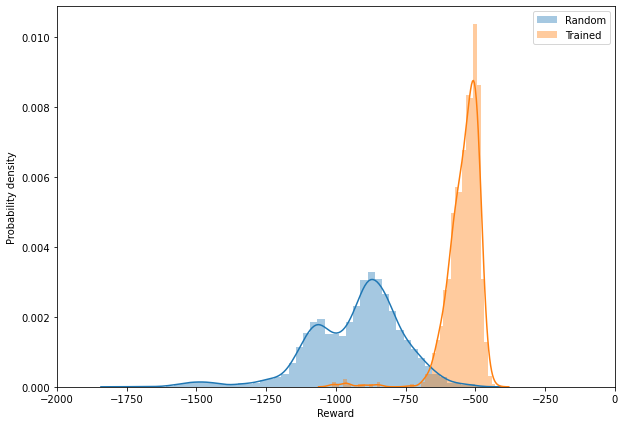

In [81]:
# Plot distribution of final rewards by random vs trained policy
plt.figure(figsize=(10,7))
sns.distplot(final_rewards_random, hist = True, norm_hist = True, label = 'Random')
sns.distplot(final_rewards_trained, hist = True, norm_hist = True, label = 'Trained')
plt.ylabel('Probability density')
plt.xlabel('Reward')
# plt.ylim(0,0.0025)
plt.xlim(-2000,0)
plt.legend()
# plt.savefig(fname = 'plots/reward_dist.png', dpi = 300)
plt.show()

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


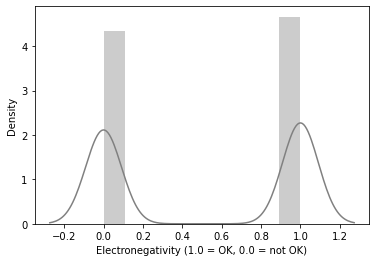

In [82]:
# Plot distribution of en by random policy
sns.distplot(en_targets_trained, color= 'grey')
plt.xlabel('Electronegativity (1.0 = OK, 0.0 = not OK)')
plt.show()

# Deep Reinforcement Learning
We now close the RL loop by training the agent on data generated by increasingly greedy policies. 

In [83]:
# replay_buffer = collections.deque(maxlen = 50000)
# Q_c_data_trained, en_targets_trained, final_rewards_trained, final_compounds = generate_Q_c_datapoints_and_evaluate_policy(dqn = dqn, 
#                                                                                                                            dcn = dcn,
#                                                                                                     num_eps = 100, 
#                                                                                                     epsilon = 0, 
#                                                                                                     en_threshold = 0.4,
#                                                                                                     stochastic_top_frac = 0.2)
# s_material_inputs, s_step_inputs, a_elem_inputs, a_comp_inputs, Q_targets, en_targets = generate_dqn_dcn_inputs_and_targets_from_Q_c_data(Q_c_data = Q_c_data_trained)

def update_replay_buffer(replay_buffer, s_material_inputs, s_step_inputs, a_elem_inputs, a_comp_inputs, Q_targets, en_targets):
    '''
    Adds inputs into replay buffer
    Args:
    replay_buffer: collections.deque
    
    Returns: 
    updated replay buffer
    
    '''
    for s_material, s_step, a_elem, a_comp, Q_target, en_target in zip(s_material_inputs, s_step_inputs, a_elem_inputs, a_comp_inputs, Q_targets, en_targets):
        Q_c_datapoint = [s_material, s_step, a_elem, a_comp, Q_target, en_target]
        replay_buffer.extend([Q_c_datapoint])
    
    return replay_buffer

# replay_buffer = update_replay_buffer(replay_buffer = replay_buffer, s_material_inputs = s_material_inputs, 
#                                                             s_step_inputs = s_step_inputs, 
#                                                             a_elem_inputs = a_elem_inputs, 
#                                                             a_comp_inputs = a_comp_inputs, 
#                                                                 Q_targets = Q_targets,
#                                                                 en_targets = en_targets)
# print('Number of Q datapoints in replay buffer (5 per episode):', len(replay_buffer))

In [84]:
def sample_replay_buffer(replay_buffer, n = 100):
    '''
    Samples datapoints from replay buffer for DQN training

    Args:
    replay_buffer: collections.deque
    n: Int. Number of datapoints to sample

    Returns:
    s_material_inputs: torch.tensor of Size([num of episodes in Q_data, 145])
    s_step_inputs: torch.tensor
    a_elem_inputs: torch.tensor
    a_comp_inputs: torch.tensor
    Q_targets: torch.tensor
    em_targets: torch.tensor

    '''

    s_material_inputs = []
    s_step_inputs     = []
    a_elem_inputs     = []
    a_comp_inputs     = []
    Q_targets         = []
    en_targets         = []

    for Q_c_datapoint in random.sample(replay_buffer, n):
        s_material, s_step, a_elem, a_comp, Q_target, en_target = Q_c_datapoint

        s_material = torch.tensor(s_material).float()
        s_step = torch.tensor(s_step)
        a_elem = torch.tensor(a_elem)
        a_comp = torch.tensor(a_comp)
        Q_target = torch.tensor([Q_target])
        en_target = torch.tensor([en_target])

        s_material_inputs.append(s_material)
        s_step_inputs.append(s_step)
        a_elem_inputs.append(a_elem)
        a_comp_inputs.append(a_comp)
        Q_targets.append(Q_target)
        en_targets.append(en_target)

    s_material_inputs = torch.stack(s_material_inputs).to('cuda')
    s_step_inputs = torch.stack(s_step_inputs).to('cuda')
    a_elem_inputs = torch.stack(a_elem_inputs).to('cuda')
    a_comp_inputs = torch.stack(a_comp_inputs).to('cuda')
    Q_targets = torch.stack(Q_targets).to('cuda')
    en_targets = torch.stack(en_targets).to('cuda')

    return s_material_inputs, s_step_inputs, a_elem_inputs, a_comp_inputs, Q_targets, en_targets

# s_material_inputs, s_step_inputs, a_elem_inputs, a_comp_inputs, Q_targets, en_targets = sample_replay_buffer(replay_buffer = replay_buffer, n = 100)

# print('s_material_inputs:', s_material_inputs.shape)
# print('s_step_inputs:', s_step_inputs.shape)
# print('a_elem_inputs:', a_elem_inputs.shape)
# print('a_comp_inputs:', a_comp_inputs.shape)
# print('Q_targets:', Q_targets.shape)
# print('en_targets:', en_targets.shape)
    

### Training the DQN

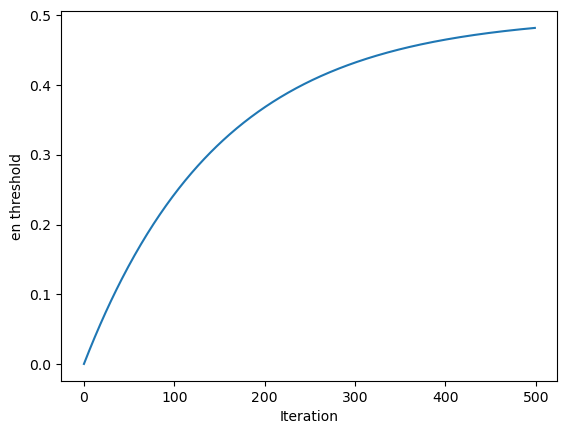

In [23]:
# num_iter = 500
# en_threshold_ub = 0.5 # upper bound for en_threshold
# iteration = np.arange(num_iter)
# en_threshold_vs_iter = -en_threshold_ub*(np.e**(-iteration/(num_iter*0.3))) + en_threshold_ub
# # for iteration in range(num_iter):
# plt.figure()
# plt.plot(iteration, en_threshold_vs_iter)
# plt.xlabel('Iteration')
# plt.ylabel('en threshold')
# plt.show()

In [16]:
num_iter = 500 # No. of training iterations
epsilon  = 0.99   # Initial epsilon

en_threshold =  0 # Because we don't want to train DCN online
# en_threshold_ub = 0.5 # upper bound for en_threshold
# iteration = np.arange(num_iter)
# en_threshold_vs_iter = -en_threshold_ub*(np.e**(-iteration/(num_iter*0.3))) + en_threshold_ub

replay_buffer = collections.deque(maxlen = 50000) # Initialize replay buffer
dqn_save_freq = 10 # Save DQN model every n iterations
dqn = DQN_pytorch().cuda() # Initialize DQN
# dcn = DCN_pytorch().cuda() # Initialize DCN
env = ConstrainedMaterialEnvironment(element_set = element_set, comp_set = comp_set,) # Initialize env

# Meta-data to store
final_rewards_vs_iter   = []
en_vs_iter              = []
compounds_vs_iter       = []
train_loss_list_vs_iter = []
valid_loss_list_vs_iter = []
epsilon_vs_iter         = []

for iteration in tqdm(range(num_iter)):
    print('=========== TRAINING ITERATION %.0f ===========' % iteration)
#     en_threshold = en_threshold_vs_iter[iteration]
    print('Current epsilon = ', epsilon)
    print('Current en threshold = ', en_threshold)
    epsilon_vs_iter.append(epsilon)
    # 1. GENERATE Q DATAPOINTS & ADD TO REPLAY BUFFER
    print('A) GENERATING DATAPOINTS')
    Q_c_data_trained, en_targets_trained, final_rewards_trained, final_compounds = \
        generate_Q_c_datapoints_and_evaluate_policy(dqn = dqn, dcn = dcn, num_eps = 100, epsilon = epsilon, en_threshold = en_threshold,
                                                                                                    stochastic_top_frac = 0.2) # Generate episodes and score them
    final_rewards_vs_iter.append(final_rewards_trained) # Save list of final reward
    en_vs_iter.append(en_targets_trained)
    compounds_vs_iter.append(final_compounds) # Save list of compounds generated at the end of each episode
    print('Average final reward = ', np.mean(np.array(final_rewards_trained)))
    print('Compounds generated:', final_compounds)
    s_material_inputs, s_step_inputs, a_elem_inputs, a_comp_inputs, Q_targets, en_targets = generate_dqn_dcn_inputs_and_targets_from_Q_c_data(Q_c_data = Q_c_data_trained) # Processing to give inputs and targets for DQN
    replay_buffer = update_replay_buffer(replay_buffer = replay_buffer, s_material_inputs = s_material_inputs, 
                                                                s_step_inputs = s_step_inputs, 
                                                                a_elem_inputs = a_elem_inputs, 
                                                                a_comp_inputs = a_comp_inputs, 
                                                                    Q_targets = Q_targets,
                                                                   en_targets = en_targets)
    # 2. SAMPLE FROM REPLAY BUFFER, STANDARDIZE, TRAIN-VALIDATION SPLIT, TRAIN Q-NETWORK
    print('B) TRAINING Q-NETWORK and C-NETWORK')
    s_material_inputs, s_step_inputs, a_elem_inputs, a_comp_inputs, Q_targets, en_targets = sample_replay_buffer(replay_buffer = replay_buffer, n = 100)
    s_material_inputs_scaled = torch.tensor(scaler.transform(s_material_inputs.cpu())).float().to('cuda') # Standardize s_material_inputs
    s_material_inputs_train, s_step_inputs_train, a_elem_inputs_train, a_comp_inputs_train, Q_targets_train, en_targets_train, s_material_inputs_valid, s_step_inputs_valid, a_elem_inputs_valid, a_comp_inputs_valid, Q_targets_valid, en_targets_valid \
    = train_validation_split(s_material_inputs_scaled = s_material_inputs_scaled, 
                                        s_step_inputs = s_step_inputs, 
                                        a_elem_inputs = a_elem_inputs,
                                        a_comp_inputs = a_comp_inputs,
                                        Q_targets = Q_targets,
                                        en_targets = en_targets,
                                        valid_size = 0.2) # Train-validation split of datapoints sampled from replay buffer
    dqn, train_loss_list, valid_loss_list = train_DQN(dqn =  dqn, num_epoch = 100, s_material_inputs_train = s_material_inputs_train, s_step_inputs_train = s_step_inputs_train,
    a_elem_inputs_train = a_elem_inputs_train, a_comp_inputs_train = a_comp_inputs_train, Q_targets_train = Q_targets_train,
    s_material_inputs_valid = s_material_inputs_valid, s_step_inputs_valid = s_step_inputs_valid, a_elem_inputs_valid = a_elem_inputs_valid,
    a_comp_inputs_valid = a_comp_inputs_valid, Q_targets_valid = Q_targets_valid) # Train DQN
    
#     dcn, train_loss_list, valid_loss_list = train_DCN(dcn =  dcn, num_epoch = 100, s_material_inputs_train = s_material_inputs_train, s_step_inputs_train = s_step_inputs_train,
#     a_elem_inputs_train = a_elem_inputs_train, a_comp_inputs_train = a_comp_inputs_train, Q_targets_train = Q_targets_train, en_targets_train = en_targets_train,
#     s_material_inputs_valid = s_material_inputs_valid, s_step_inputs_valid = s_step_inputs_valid, a_elem_inputs_valid = a_elem_inputs_valid,
#     a_comp_inputs_valid = a_comp_inputs_valid, Q_targets_valid = Q_targets_valid, en_targets_valid = en_targets_valid)
#     train_loss_list_vs_iter.append(train_loss_list) # Save list of training loss vs training epoch for this iter
#     valid_loss_list_vs_iter.append(valid_loss_list) # Save list of validation loss vs training epoch for this iter

    if iteration in range(0, num_iter+1, dqn_save_freq): # Save DQN model every n iterations
        torch.save(dqn, './dqn_models/constrained_DQN_cuda/dqn_test_%.0fiter_RF_constrained' % iteration)

#     if iteration in range(0, num_iter+1, dqn_save_freq): # Save DCN model every n iterations
#         torch.save(dcn, './dcn_models/constrained_DQN_cuda/dcn_test_%.0fiter_RF_constrained' % iteration)

    epsilon *= 0.99 # Decay epsilon

with open('./training_data/constrained_DQN_cuda/final_rewards_vs_iter_RF_constrained.pkl', 'wb') as f:
        pickle.dump(final_rewards_vs_iter, f, pickle.HIGHEST_PROTOCOL)

with open('./training_data/constrained_DQN_cuda/en_vs_iter_RF_constrained.pkl', 'wb') as f:
        pickle.dump(en_vs_iter, f, pickle.HIGHEST_PROTOCOL)

with open('./training_data/constrained_DQN_cuda/compounds_vs_iter_RF_constrained.pkl', 'wb') as f:
        pickle.dump(compounds_vs_iter, f, pickle.HIGHEST_PROTOCOL)

with open('./training_data/constrained_DQN_cuda/train_loss_list_vs_iter_RF_constrained.pkl', 'wb') as f:
        pickle.dump(train_loss_list_vs_iter, f, pickle.HIGHEST_PROTOCOL)

with open('./training_data/constrained_DQN_cuda/valid_loss_list_vs_iter_RF_constrained.pkl', 'wb') as f:
        pickle.dump(valid_loss_list_vs_iter, f, pickle.HIGHEST_PROTOCOL)

with open('./training_data/constrained_DQN_cuda/epsilon_vs_iter_RF_constrained.pkl', 'wb') as f:
        pickle.dump(epsilon_vs_iter, f, pickle.HIGHEST_PROTOCOL)

  0%|          | 0/500 [00:00<?, ?it/s]

=========== TRAINING ITERATION 0 ===========
Current epsilon =  0.99
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -965.0561651686032
Compounds generated: ['Tl7Ta7I1U8', 'F9Cd3Ge1Rh4O8', 'Pb9Zr6Pu5Hg1Mn1', 'K2Yb6Pu4Re9Br9', 'Zr4Co5Cr9Pd3', 'Sc5Ca3Er5Ir2Dy2', 'Hg3Ru6Mg4Pt1N7', 'Si8Cd8Al2Br2', 'C5Na3Co7Ba6', 'Mn3Na2Gd5Li7Cl4', 'Os1Mn2Hf6O9', 'Nb9Ce2Pu9', 'Pb5Pb3Ba6Be3', 'Am1Ru5Yb2Th8', 'V3Zn5Nb3P2', 'F9P6Ir7W8Ga9', 'Ni7Os9Sc5Sn6As3', 'Si1Si4I2', 'Fe7Yb7Bi4Zn5', 'S3Ti5Ce8Sm6', 'Ag2La2Am8Ga8V3', 'Pt1C6Mn6', 'I9Mg4Sm9Al3O1', 'Sn2Si9In3Ta9', 'O6Am1Cd4', 'Tb6Cr5Am4P5Tm7', 'Al4Co2H3W4Os4', 'Os3Ce4As4Pt3Ge9', 'C4Fe6Mg3', 'Br1K4Li8La3', 'Hf1In8Ca9Eu9', 'Hf7Ni7Ru8Pd3Ni9', 'Ni8Ga5Br6Ce1Tb3', 'Eu7Cs4Yb5Dy7Ru2', 'Yb4Ce5Sb2Br8C4', 'Au6Eu4B8V8Al5', 'Rh1Er9K3V9Er5', 'As5Sn4Ru1U8K9', 'S9I5Mn4F1S1', 'Pu6Cs3Hg2As5B8', 'In1Pr4F8Ir3', 'Si3Tb1Hf9Mg6P9', 'Ce5B5Zr3W9', 'La7Cd2Y3', 'U6Cl7', 'Eu4K2C8Lu8K9', 'Zr6Ni3I7Cs6Zn9', 'Al8Li7Ba6Sb6Mo1', 'Hf2Bi8Be6Sm2', 'Ir3V8B6Bi9', 'Rb8Mo9', 

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  9 Train_loss = 691.8470 Valid_loss = 686.7387
Epoch =  10 Train_loss = 662.1367 Valid_loss = 654.7822
Epoch =  11 Train_loss = 625.9401 Valid_loss = 616.3501
Epoch =  12 Train_loss = 582.3592 Valid_loss = 570.6224
Epoch =  13 Train_loss = 530.4684 Valid_loss = 517.8226
Epoch =  14 Train_loss = 469.8362 Valid_loss = 472.1976
Epoch =  15 Train_loss = 411.4102 Valid_loss = 431.1098
Epoch =  16 Train_loss = 378.7278 Valid_loss = 385.4850
Epoch =  17 Train_loss = 345.8630 Valid_loss = 333.2947
Epoch =  18 Train_loss = 308.6583 Valid_loss = 283.1704
Epoch =  19 Train_loss = 286.1878 Valid_loss = 266.4001
Epoch =  20 Train_loss = 267.5406 Valid_loss = 267.6944
Epoch =  21 Train_loss = 258.6313 Valid_loss = 287.5483
Epoch =  22 Train_loss = 253.4090 Valid_loss = 301.3248
Epoch =  23 Train_loss = 246.7865 Valid_loss = 297.7105
Epoch =  24 Train_loss = 233.3427 Valid_loss = 278.7090
Epoch =  25 Train_loss = 206.6948 Valid_loss = 249.8137
Epoch =  26 Train_loss = 172.5958 Valid_loss = 22

  0%|          | 1/500 [00:11<1:34:27, 11.36s/it]

Epoch =  85 Train_loss = 24.3188 Valid_loss = 115.2935
Epoch =  86 Train_loss = 22.7398 Valid_loss = 115.4367
Epoch =  87 Train_loss = 22.9908 Valid_loss = 115.3828
Epoch =  88 Train_loss = 22.0390 Valid_loss = 115.7220
Epoch =  89 Train_loss = 21.5580 Valid_loss = 115.6126
Epoch =  90 Train_loss = 20.9925 Valid_loss = 114.8097
Epoch =  91 Train_loss = 20.0513 Valid_loss = 114.8480
Epoch =  92 Train_loss = 19.8284 Valid_loss = 114.8326
Epoch =  93 Train_loss = 20.7174 Valid_loss = 115.9246
Epoch =  94 Train_loss = 22.0627 Valid_loss = 115.7225
Epoch =  95 Train_loss = 19.8854 Valid_loss = 115.6646
Epoch =  96 Train_loss = 19.3742 Valid_loss = 116.3586
Epoch =  97 Train_loss = 23.5684 Valid_loss = 115.6692
Epoch =  98 Train_loss = 19.1867 Valid_loss = 115.1987
Epoch =  99 Train_loss = 21.1439 Valid_loss = 115.8971
=========== TRAINING ITERATION 1 ===========
Current epsilon =  0.9801
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -935.0386865079366
Compounds 

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  22 Train_loss = 60.0877 Valid_loss = 130.1083
Epoch =  23 Train_loss = 58.0902 Valid_loss = 130.5318
Epoch =  24 Train_loss = 55.9090 Valid_loss = 129.3747
Epoch =  25 Train_loss = 53.9948 Valid_loss = 130.9310
Epoch =  26 Train_loss = 52.1375 Valid_loss = 130.0190
Epoch =  27 Train_loss = 51.3720 Valid_loss = 132.7479
Epoch =  28 Train_loss = 49.5240 Valid_loss = 130.7087
Epoch =  29 Train_loss = 47.6390 Valid_loss = 130.7202
Epoch =  30 Train_loss = 46.0930 Valid_loss = 132.7491
Epoch =  31 Train_loss = 44.8931 Valid_loss = 131.1116
Epoch =  32 Train_loss = 45.8093 Valid_loss = 136.8852
Epoch =  33 Train_loss = 45.4791 Valid_loss = 132.4278
Epoch =  34 Train_loss = 41.5759 Valid_loss = 130.0703
Epoch =  35 Train_loss = 41.8996 Valid_loss = 134.2667
Epoch =  36 Train_loss = 39.7744 Valid_loss = 134.8146
Epoch =  37 Train_loss = 37.9716 Valid_loss = 132.9483
Epoch =  38 Train_loss = 40.1992 Valid_loss = 136.9402
Epoch =  39 Train_loss = 37.0585 Valid_loss = 136.2189
Epoch =  4

  0%|          | 2/500 [00:22<1:33:24, 11.25s/it]

Epoch =  85 Train_loss = 18.1254 Valid_loss = 143.8439
Epoch =  86 Train_loss = 19.4330 Valid_loss = 145.3002
Epoch =  87 Train_loss = 17.1861 Valid_loss = 146.5212
Epoch =  88 Train_loss = 18.8341 Valid_loss = 143.8464
Epoch =  89 Train_loss = 17.5591 Valid_loss = 144.1955
Epoch =  90 Train_loss = 18.4527 Valid_loss = 147.5281
Epoch =  91 Train_loss = 19.0223 Valid_loss = 148.7106
Epoch =  92 Train_loss = 17.3820 Valid_loss = 146.8697
Epoch =  93 Train_loss = 22.0237 Valid_loss = 146.3494
Epoch =  94 Train_loss = 21.0167 Valid_loss = 149.0364
Epoch =  95 Train_loss = 18.6002 Valid_loss = 147.5629
Epoch =  96 Train_loss = 17.4388 Valid_loss = 145.6113
Epoch =  97 Train_loss = 20.1907 Valid_loss = 147.0623
Epoch =  98 Train_loss = 16.7834 Valid_loss = 151.5336
Epoch =  99 Train_loss = 22.6244 Valid_loss = 150.5766
=========== TRAINING ITERATION 2 ===========
Current epsilon =  0.9702989999999999
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -899.063603099165

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

 21 Train_loss = 63.3875 Valid_loss = 82.6643
Epoch =  22 Train_loss = 62.6346 Valid_loss = 83.1678
Epoch =  23 Train_loss = 60.3774 Valid_loss = 84.9260
Epoch =  24 Train_loss = 58.9406 Valid_loss = 87.3040
Epoch =  25 Train_loss = 57.9680 Valid_loss = 88.8153
Epoch =  26 Train_loss = 55.1486 Valid_loss = 90.7678
Epoch =  27 Train_loss = 54.7980 Valid_loss = 92.0503
Epoch =  28 Train_loss = 52.9302 Valid_loss = 93.4333
Epoch =  29 Train_loss = 52.1597 Valid_loss = 91.8427
Epoch =  30 Train_loss = 49.9900 Valid_loss = 90.5691
Epoch =  31 Train_loss = 49.0308 Valid_loss = 91.2638
Epoch =  32 Train_loss = 47.1408 Valid_loss = 93.0209
Epoch =  33 Train_loss = 46.9852 Valid_loss = 93.4419
Epoch =  34 Train_loss = 45.4592 Valid_loss = 93.0156
Epoch =  35 Train_loss = 45.0788 Valid_loss = 92.8950
Epoch =  36 Train_loss = 43.4075 Valid_loss = 92.6660
Epoch =  37 Train_loss = 43.1642 Valid_loss = 92.1461
Epoch =  38 Train_loss = 41.4333 Valid_loss = 92.4078
Epoch =  39 Train_loss = 40.6950 Val

  1%|          | 3/500 [00:32<1:29:28, 10.80s/it]

Epoch =  63 Train_loss = 26.4511 Valid_loss = 92.5365
Epoch =  64 Train_loss = 26.0919 Valid_loss = 93.8852
Epoch =  65 Train_loss = 26.0782 Valid_loss = 97.0810
Epoch =  66 Train_loss = 24.0480 Valid_loss = 100.8119
Epoch =  67 Train_loss = 27.8672 Valid_loss = 101.5279
Epoch =  68 Train_loss = 26.9575 Valid_loss = 99.1922
Epoch =  69 Train_loss = 22.9733 Valid_loss = 94.5251
Epoch =  70 Train_loss = 26.4903 Valid_loss = 92.5836
Epoch =  71 Train_loss = 22.2163 Valid_loss = 95.2530
Epoch =  72 Train_loss = 26.6000 Valid_loss = 96.8260
Epoch =  73 Train_loss = 20.8906 Valid_loss = 99.1706
Epoch =  74 Train_loss = 27.4023 Valid_loss = 100.9533
Epoch =  75 Train_loss = 23.7252 Valid_loss = 101.5626
Epoch =  76 Train_loss = 23.9782 Valid_loss = 101.1430
Epoch =  77 Train_loss = 25.2639 Valid_loss = 99.8216
Epoch =  78 Train_loss = 19.0421 Valid_loss = 98.8266
Epoch =  79 Train_loss = 26.1571 Valid_loss = 98.6546
Epoch =  80 Train_loss = 20.4513 Valid_loss = 100.9574
Epoch =  81 Train_loss

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  4 Train_loss = 89.4671 Valid_loss = 123.5535
Epoch =  5 Train_loss = 82.6330 Valid_loss = 125.4884
Epoch =  6 Train_loss = 75.9066 Valid_loss = 130.5948
Epoch =  7 Train_loss = 74.0137 Valid_loss = 127.4042
Epoch =  8 Train_loss = 70.8295 Valid_loss = 114.9279
Epoch =  9 Train_loss = 65.1445 Valid_loss = 107.2436
Epoch =  10 Train_loss = 62.7213 Valid_loss = 108.4354
Epoch =  11 Train_loss = 59.1517 Valid_loss = 117.9406
Epoch =  12 Train_loss = 55.2715 Valid_loss = 124.3207
Epoch =  13 Train_loss = 55.4741 Valid_loss = 120.6166
Epoch =  14 Train_loss = 52.6951 Valid_loss = 113.1100
Epoch =  15 Train_loss = 50.2514 Valid_loss = 109.5019
Epoch =  16 Train_loss = 50.0337 Valid_loss = 115.4738
Epoch =  17 Train_loss = 46.1744 Valid_loss = 122.1202
Epoch =  18 Train_loss = 45.9249 Valid_loss = 122.0980
Epoch =  19 Train_loss = 43.9383 Valid_loss = 117.9648
Epoch =  20 Train_loss = 42.1800 Valid_loss = 114.4390
Epoch =  21 Train_loss = 41.3016 Valid_loss = 114.8423
Epoch =  22 Trai

  1%|          | 4/500 [00:44<1:33:24, 11.30s/it]

Epoch =  95 Train_loss = 5.8950 Valid_loss = 118.2459
Epoch =  96 Train_loss = 9.1416 Valid_loss = 117.1183
Epoch =  97 Train_loss = 5.5838 Valid_loss = 115.2302
Epoch =  98 Train_loss = 10.7852 Valid_loss = 115.9492
Epoch =  99 Train_loss = 4.9941 Valid_loss = 116.7515
=========== TRAINING ITERATION 4 ===========
Current epsilon =  0.9509900498999999
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -933.5960345238096
Compounds generated: ['I1Cr1Fe5I1', 'K4O2Yb9Si9Lu1', 'Ba1Co7Dy1Cs3Re7', 'Mg7Tm7Cd6W5Yb1', 'Sm1Br8Ni6Ag4', 'K6Re8La1Fe5Au7', 'Eu9U9Hg1Ca3', 'Hg8Gd7N1Br2O8', 'Ho3Hf2Te9Si8', 'Cr5F8Tm7Cd9Sr6', 'Sm2V6Hf1Ca4', 'Au4Al9Th9Pt5', 'Zr9Cu1Te4Ti8Hg1', 'Ce6F1Co4Re2Os2', 'Zn6Rh2Sn8Sr1Yb3', 'Os8Cl7Nb7O3', 'B9Cs3Ti7Pt8Os7', 'Hf9Ir3Zr9Nd8', 'F3Be4I8Co3', 'Ce1Li4Y7U5Te1', 'Fe3Ga6Cd7Ca3Co7', 'Ru1Ca8U9Ho7', 'Y1Mn9Ba4Se3Dy6', 'Pd9Mg2Sc9Nd6C5', 'Bi6U7Rh5Gd2Pr7', 'F4Pb1Er5Zr5', 'O6Mo7K5Am1Tb2', 'Gd4Nd1F1In4', 'Ga4Li1Dy5Th2', 'Yb2Er1Fe5', 'Y3Rb6Cl4Si9Ir1', 'Dy5Sc9Ta4La9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  8 Train_loss = 87.0343 Valid_loss = 112.4416
Epoch =  9 Train_loss = 82.5379 Valid_loss = 112.5102
Epoch =  10 Train_loss = 82.1856 Valid_loss = 110.3784
Epoch =  11 Train_loss = 79.7860 Valid_loss = 106.7523
Epoch =  12 Train_loss = 75.2902 Valid_loss = 102.5357
Epoch =  13 Train_loss = 72.9045 Valid_loss = 98.9783
Epoch =  14 Train_loss = 72.6175 Valid_loss = 97.4281
Epoch =  15 Train_loss = 71.6704 Valid_loss = 97.7263
Epoch =  16 Train_loss = 68.7258 Valid_loss = 99.9653
Epoch =  17 Train_loss = 65.2389 Valid_loss = 103.3247
Epoch =  18 Train_loss = 62.1010 Valid_loss = 106.0943
Epoch =  19 Train_loss = 60.3125 Valid_loss = 107.7581
Epoch =  20 Train_loss = 58.0406 Valid_loss = 108.8209
Epoch =  21 Train_loss = 57.9128 Valid_loss = 110.0564
Epoch =  22 Train_loss = 56.0859 Valid_loss = 111.2716
Epoch =  23 Train_loss = 54.3815 Valid_loss = 110.9962
Epoch =  24 Train_loss = 53.6786 Valid_loss = 109.3562
Epoch =  25 Train_loss = 51.5999 Valid_loss = 107.4066
Epoch =  26 Trai

  1%|          | 5/500 [00:57<1:37:15, 11.79s/it]

Epoch =  63 Train_loss = 24.5456 Valid_loss = 102.9704
Epoch =  64 Train_loss = 22.7322 Valid_loss = 102.1255
Epoch =  65 Train_loss = 20.3230 Valid_loss = 102.5185
Epoch =  66 Train_loss = 25.0432 Valid_loss = 102.6525
Epoch =  67 Train_loss = 20.7553 Valid_loss = 102.9725
Epoch =  68 Train_loss = 26.2264 Valid_loss = 103.6025
Epoch =  69 Train_loss = 23.6906 Valid_loss = 102.9890
Epoch =  70 Train_loss = 21.5539 Valid_loss = 102.0650
Epoch =  71 Train_loss = 21.0338 Valid_loss = 101.7960
Epoch =  72 Train_loss = 21.3477 Valid_loss = 103.0404
Epoch =  73 Train_loss = 20.1671 Valid_loss = 105.2405
Epoch =  74 Train_loss = 20.7449 Valid_loss = 106.5132
Epoch =  75 Train_loss = 18.4621 Valid_loss = 106.1779
Epoch =  76 Train_loss = 21.2265 Valid_loss = 105.4840
Epoch =  77 Train_loss = 18.6454 Valid_loss = 105.4981
Epoch =  78 Train_loss = 22.6953 Valid_loss = 104.0633
Epoch =  79 Train_loss = 20.0246 Valid_loss = 102.5864
Epoch =  80 Train_loss = 21.3897 Valid_loss = 102.8228
Epoch =  8

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  15 Train_loss = 66.0206 Valid_loss = 121.3104
Epoch =  16 Train_loss = 61.8434 Valid_loss = 118.0993
Epoch =  17 Train_loss = 60.9499 Valid_loss = 123.3991
Epoch =  18 Train_loss = 59.0737 Valid_loss = 121.2715
Epoch =  19 Train_loss = 57.1872 Valid_loss = 118.1410
Epoch =  20 Train_loss = 56.5709 Valid_loss = 121.0586
Epoch =  21 Train_loss = 54.4926 Valid_loss = 123.7456
Epoch =  22 Train_loss = 53.3990 Valid_loss = 121.1906
Epoch =  23 Train_loss = 51.7819 Valid_loss = 121.0463
Epoch =  24 Train_loss = 50.6291 Valid_loss = 124.6241
Epoch =  25 Train_loss = 49.8544 Valid_loss = 121.7089
Epoch =  26 Train_loss = 48.2419 Valid_loss = 121.8600
Epoch =  27 Train_loss = 47.0904 Valid_loss = 126.8098
Epoch =  28 Train_loss = 46.5851 Valid_loss = 123.6353
Epoch =  29 Train_loss = 44.4506 Valid_loss = 123.8459
Epoch =  30 Train_loss = 43.2666 Valid_loss = 130.2114
Epoch =  31 Train_loss = 44.9207 Valid_loss = 124.6108
Epoch =  32 Train_loss = 42.0803 Valid_loss = 124.2490
Epoch =  3

  1%|          | 6/500 [01:10<1:39:06, 12.04s/it]

Epoch =  96 Train_loss = 12.0082 Valid_loss = 142.2914
Epoch =  97 Train_loss = 16.8241 Valid_loss = 144.8241
Epoch =  98 Train_loss = 13.5566 Valid_loss = 147.4489
Epoch =  99 Train_loss = 15.0001 Valid_loss = 145.7502
=========== TRAINING ITERATION 6 ===========
Current epsilon =  0.9320653479069899
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -905.4531130952381
Compounds generated: ['C4Tl4Sm4Ce2', 'Ge4Au7Sm2Co8Pb7', 'Am9Ru7Am4La3Sc7', 'Be8Mg5Al3Si7', 'Ir8Cr8Mg3Ti7H5', 'Te6Pd1Br1Mg5Mg9', 'Mg2Tl1Zn7Yb8Tb8', 'Ta1N1Sn4Th2Ti2', 'Mo9Ru2Ru1Pd1', 'Er4Br5Ru4F3', 'Hf4Th5Tb2Sb2Pr2', 'Yb5Mg2Ca7Ru3In6', 'P9Hf6Gd6Ce7', 'Bi8Lu4As4N6', 'Mg2Hg4Al1Cr3', 'Pd3Cu1Sn4Os5Cd5', 'Ta1Rb6Rh3Sb8', 'F8Yb9Mg5B5Ba5', 'U5Li6S3Cu5', 'Mg2Cr9Se6Sb9', 'Zn6Cs3Li2Zn2Th4', 'Pd7Re1Am5Ni7Zn8', 'Yb3Pu1Dy8U5Y6', 'Ru5Co9Pt3Na7Ag9', 'I3Cr9Au6Ho3', 'Se9In2Pu2', 'Al7K3Lu6Cr5B6', 'Pr2P3V4Pu5Am6', 'As3Na5Zn1Eu7Tm7', 'Si7U9Mn8Hg2', 'Sc8Ca8Sr2O5Na6', 'Pb4Th8P1Au5', 'Zr6Sm8Lu4', 'B5Ti4Th4Au1Sr9', 'Pr6Al4

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  15 Train_loss = 63.6953 Valid_loss = 146.1953
Epoch =  16 Train_loss = 60.4929 Valid_loss = 147.3102
Epoch =  17 Train_loss = 57.6287 Valid_loss = 148.1728
Epoch =  18 Train_loss = 54.9951 Valid_loss = 148.5247
Epoch =  19 Train_loss = 52.0118 Valid_loss = 148.8429
Epoch =  20 Train_loss = 50.7978 Valid_loss = 148.7666
Epoch =  21 Train_loss = 50.0502 Valid_loss = 148.3420
Epoch =  22 Train_loss = 49.0867 Valid_loss = 147.5033
Epoch =  23 Train_loss = 47.5438 Valid_loss = 147.0863
Epoch =  24 Train_loss = 45.7354 Valid_loss = 146.7829
Epoch =  25 Train_loss = 44.0628 Valid_loss = 147.3292
Epoch =  26 Train_loss = 43.2422 Valid_loss = 146.8938
Epoch =  27 Train_loss = 42.5084 Valid_loss = 148.4219
Epoch =  28 Train_loss = 40.5585 Valid_loss = 150.1984
Epoch =  29 Train_loss = 39.6060 Valid_loss = 151.0646
Epoch =  30 Train_loss = 38.8167 Valid_loss = 151.2738
Epoch =  31 Train_loss = 37.2957 Valid_loss = 151.6057
Epoch =  32 Train_loss = 36.3536 Valid_loss = 150.3334
Epoch =  3

  1%|▏         | 7/500 [01:21<1:37:11, 11.83s/it]

Epoch =  96 Train_loss = 7.5040 Valid_loss = 173.8365
Epoch =  97 Train_loss = 10.0071 Valid_loss = 174.0138
Epoch =  98 Train_loss = 7.9858 Valid_loss = 172.6535
Epoch =  99 Train_loss = 8.2083 Valid_loss = 172.3066
=========== TRAINING ITERATION 7 ===========
Current epsilon =  0.92274469442792
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -899.6195404772109
Compounds generated: ['As1Co3Si6H5Li9', 'Pt1Ti9Os2P6', 'Ga1Pu9I3Cr9Dy4', 'Na6Au3Mn1Sr1C3', 'Mg8O9Os2Cd8Au4', 'Gd5B5In4P5', 'Re9Re9Ti8S7V2', 'Ru1', 'Ba7Br4Sm8Tl7Pb2', 'P9Br5V6P2Re5', 'Ce6Sn3S2Pd6Be7', 'Ca1Dy4Bi5C4Rh6', 'Hf3Bi3Tl5Ru2', 'Os5V8Li1Sn6Pd7', 'Nb7Pt5Nd3Te5', 'S4Sb6Zr2Ir7Pd1', 'Nb6Cd7V6La4Ba5', 'F8Ca6Eu2Au9C9', 'Fe3Hg2P1U2', 'Ti4Pb4K7Br9', 'Pu9P1Ir9Pt2Si8', 'B9Nb4In7Cu2', 'Zr1Sc4Nd1', 'Sb6Yb1Zn1Al9Pd2', 'Lu6Zr4La8Gd8Cs4', 'Tl1H5Br8Be9', 'Cu6Gd1Dy2Hg8', 'Hg4Pt1Sc1Ti3Ru7', 'Ag5Pd6Rb7Te3Tl3', 'Te9U4Sn8Mo4Tb1', 'Al8Ba5Os3U1Tm6', 'Bi8Cl2N9Ca6As6', 'Cs4P2H5Fe7', 'Na2C4I9Sb7', 'Fe4Br1Zn5I3V3', 'Ga1Si

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  21 Train_loss = 61.6490 Valid_loss = 91.7725
Epoch =  22 Train_loss = 59.5667 Valid_loss = 92.4179
Epoch =  23 Train_loss = 58.1641 Valid_loss = 93.1180
Epoch =  24 Train_loss = 56.9140 Valid_loss = 92.8430
Epoch =  25 Train_loss = 55.3695 Valid_loss = 91.8431
Epoch =  26 Train_loss = 53.7031 Valid_loss = 93.4137
Epoch =  27 Train_loss = 52.0014 Valid_loss = 96.9464
Epoch =  28 Train_loss = 50.3943 Valid_loss = 99.8411
Epoch =  29 Train_loss = 49.0054 Valid_loss = 101.7227
Epoch =  30 Train_loss = 47.5013 Valid_loss = 102.2661
Epoch =  31 Train_loss = 46.2471 Valid_loss = 99.4338
Epoch =  32 Train_loss = 45.2725 Valid_loss = 100.4641
Epoch =  33 Train_loss = 44.0699 Valid_loss = 100.0217
Epoch =  34 Train_loss = 43.4746 Valid_loss = 103.7935
Epoch =  35 Train_loss = 40.9020 Valid_loss = 106.0971
Epoch =  36 Train_loss = 40.1826 Valid_loss = 103.3581
Epoch =  37 Train_loss = 41.3690 Valid_loss = 104.1269
Epoch =  38 Train_loss = 38.4173 Valid_loss = 105.4462
Epoch =  39 Train_l

  2%|▏         | 8/500 [01:32<1:35:30, 11.65s/it]

Epoch =  60 Train_loss = 25.7209 Valid_loss = 127.6447
Epoch =  61 Train_loss = 24.6448 Valid_loss = 122.9023
Epoch =  62 Train_loss = 23.0640 Valid_loss = 118.7837
Epoch =  63 Train_loss = 24.4670 Valid_loss = 119.6021
Epoch =  64 Train_loss = 23.6629 Valid_loss = 124.7880
Epoch =  65 Train_loss = 21.2298 Valid_loss = 128.2338
Epoch =  66 Train_loss = 19.9186 Valid_loss = 125.6709
Epoch =  67 Train_loss = 21.3241 Valid_loss = 121.7768
Epoch =  68 Train_loss = 20.1714 Valid_loss = 119.0041
Epoch =  69 Train_loss = 18.9473 Valid_loss = 121.3565
Epoch =  70 Train_loss = 18.0949 Valid_loss = 127.8681
Epoch =  71 Train_loss = 22.0476 Valid_loss = 128.7964
Epoch =  72 Train_loss = 17.9109 Valid_loss = 123.0333
Epoch =  73 Train_loss = 20.6149 Valid_loss = 121.6114
Epoch =  74 Train_loss = 19.2061 Valid_loss = 122.8168
Epoch =  75 Train_loss = 18.9110 Valid_loss = 125.4055
Epoch =  76 Train_loss = 24.2951 Valid_loss = 125.5081
Epoch =  77 Train_loss = 19.3962 Valid_loss = 124.2271
Epoch =  7

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  39 Train_loss = 26.6474 Valid_loss = 104.9768
Epoch =  40 Train_loss = 25.2616 Valid_loss = 105.2492
Epoch =  41 Train_loss = 24.5779 Valid_loss = 104.1373
Epoch =  42 Train_loss = 26.9547 Valid_loss = 107.6637
Epoch =  43 Train_loss = 28.8287 Valid_loss = 105.9281
Epoch =  44 Train_loss = 23.8646 Valid_loss = 103.9288
Epoch =  45 Train_loss = 29.3334 Valid_loss = 107.8760
Epoch =  46 Train_loss = 25.1713 Valid_loss = 108.1427
Epoch =  47 Train_loss = 24.9331 Valid_loss = 105.0322
Epoch =  48 Train_loss = 24.8446 Valid_loss = 104.0191
Epoch =  49 Train_loss = 24.9355 Valid_loss = 106.9883
Epoch =  50 Train_loss = 25.4158 Valid_loss = 105.3533
Epoch =  51 Train_loss = 21.7505 Valid_loss = 102.7382
Epoch =  52 Train_loss = 26.9681 Valid_loss = 105.0927
Epoch =  53 Train_loss = 23.2114 Valid_loss = 110.0358
Epoch =  54 Train_loss = 28.9038 Valid_loss = 108.8040
Epoch =  55 Train_loss = 25.1167 Valid_loss = 104.8055
Epoch =  56 Train_loss = 28.3414 Valid_loss = 105.6566
Epoch =  5

  2%|▏         | 9/500 [01:44<1:35:11, 11.63s/it]

Epoch =  64 Train_loss = 20.9986 Valid_loss = 106.1660
Epoch =  65 Train_loss = 20.9471 Valid_loss = 109.2421
Epoch =  66 Train_loss = 20.8869 Valid_loss = 109.8553
Epoch =  67 Train_loss = 21.1708 Valid_loss = 106.8184
Epoch =  68 Train_loss = 21.3884 Valid_loss = 107.1366
Epoch =  69 Train_loss = 23.0530 Valid_loss = 110.6878
Epoch =  70 Train_loss = 16.5195 Valid_loss = 112.1479
Epoch =  71 Train_loss = 20.0985 Valid_loss = 109.3336
Epoch =  72 Train_loss = 16.4043 Valid_loss = 108.4185
Epoch =  73 Train_loss = 16.2794 Valid_loss = 110.4549
Epoch =  74 Train_loss = 19.0127 Valid_loss = 108.3482
Epoch =  75 Train_loss = 15.6186 Valid_loss = 108.3114
Epoch =  76 Train_loss = 16.2113 Valid_loss = 111.3133
Epoch =  77 Train_loss = 20.1896 Valid_loss = 111.4504
Epoch =  78 Train_loss = 18.2851 Valid_loss = 109.1676
Epoch =  79 Train_loss = 16.4213 Valid_loss = 109.4062
Epoch =  80 Train_loss = 17.0318 Valid_loss = 111.1582
Epoch =  81 Train_loss = 14.7906 Valid_loss = 111.3145
Epoch =  8

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  5 Train_loss = 94.5081 Valid_loss = 79.0237
Epoch =  6 Train_loss = 91.4038 Valid_loss = 74.9514
Epoch =  7 Train_loss = 87.0030 Valid_loss = 72.3977
Epoch =  8 Train_loss = 82.9881 Valid_loss = 71.6194
Epoch =  9 Train_loss = 78.4157 Valid_loss = 71.5157
Epoch =  10 Train_loss = 75.2466 Valid_loss = 68.8901
Epoch =  11 Train_loss = 72.5228 Valid_loss = 69.6033
Epoch =  12 Train_loss = 70.8808 Valid_loss = 72.5090
Epoch =  13 Train_loss = 69.3113 Valid_loss = 73.0857
Epoch =  14 Train_loss = 66.9860 Valid_loss = 73.3773
Epoch =  15 Train_loss = 64.9399 Valid_loss = 74.9450
Epoch =  16 Train_loss = 62.5993 Valid_loss = 78.3387
Epoch =  17 Train_loss = 61.5741 Valid_loss = 79.3137
Epoch =  18 Train_loss = 60.7222 Valid_loss = 80.2770
Epoch =  19 Train_loss = 60.1798 Valid_loss = 80.6534
Epoch =  20 Train_loss = 58.8069 Valid_loss = 80.0266
Epoch =  21 Train_loss = 56.6292 Valid_loss = 79.4090
Epoch =  22 Train_loss = 54.6496 Valid_loss = 79.7135
Epoch =  23 Train_loss = 53.9830 

  2%|▏         | 10/500 [01:59<1:45:07, 12.87s/it]

Epoch =  70 Train_loss = 26.7769 Valid_loss = 90.5108
Epoch =  71 Train_loss = 22.1901 Valid_loss = 94.7811
Epoch =  72 Train_loss = 26.7612 Valid_loss = 90.9922
Epoch =  73 Train_loss = 21.0306 Valid_loss = 89.4198
Epoch =  74 Train_loss = 22.9924 Valid_loss = 93.6355
Epoch =  75 Train_loss = 22.0087 Valid_loss = 92.5697
Epoch =  76 Train_loss = 20.0951 Valid_loss = 89.9094
Epoch =  77 Train_loss = 21.9649 Valid_loss = 93.2504
Epoch =  78 Train_loss = 19.9565 Valid_loss = 94.4700
Epoch =  79 Train_loss = 20.3680 Valid_loss = 90.4974
Epoch =  80 Train_loss = 22.7629 Valid_loss = 92.2872
Epoch =  81 Train_loss = 19.0435 Valid_loss = 98.6068
Epoch =  82 Train_loss = 23.8297 Valid_loss = 95.8686
Epoch =  83 Train_loss = 19.5301 Valid_loss = 90.6413
Epoch =  84 Train_loss = 23.9606 Valid_loss = 92.6180
Epoch =  85 Train_loss = 18.8227 Valid_loss = 103.1265
Epoch =  86 Train_loss = 28.0734 Valid_loss = 103.3267
Epoch =  87 Train_loss = 27.7105 Valid_loss = 94.7507
Epoch =  88 Train_loss = 1

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  22 Train_loss = 60.9637 Valid_loss = 118.9478
Epoch =  23 Train_loss = 57.8748 Valid_loss = 113.4721
Epoch =  24 Train_loss = 56.6368 Valid_loss = 114.1065
Epoch =  25 Train_loss = 55.3854 Valid_loss = 120.0400
Epoch =  26 Train_loss = 54.1982 Valid_loss = 122.5298
Epoch =  27 Train_loss = 54.6959 Valid_loss = 116.8312
Epoch =  28 Train_loss = 51.5792 Valid_loss = 110.8003
Epoch =  29 Train_loss = 53.0194 Valid_loss = 112.0750
Epoch =  30 Train_loss = 50.0935 Valid_loss = 116.9236
Epoch =  31 Train_loss = 50.1940 Valid_loss = 115.6648
Epoch =  32 Train_loss = 49.2417 Valid_loss = 108.9983
Epoch =  33 Train_loss = 47.0470 Valid_loss = 106.9148
Epoch =  34 Train_loss = 47.0144 Valid_loss = 110.7501
Epoch =  35 Train_loss = 44.5126 Valid_loss = 114.3011
Epoch =  36 Train_loss = 45.2580 Valid_loss = 109.2167
Epoch =  37 Train_loss = 43.3584 Valid_loss = 109.5515
Epoch =  38 Train_loss = 42.3257 Valid_loss = 115.3031
Epoch =  39 Train_loss = 42.7412 Valid_loss = 112.5140
Epoch =  4

  2%|▏         | 11/500 [02:12<1:44:42, 12.85s/it]

Epoch =  90 Train_loss = 22.1403 Valid_loss = 108.0947
Epoch =  91 Train_loss = 18.5668 Valid_loss = 114.3924
Epoch =  92 Train_loss = 20.4910 Valid_loss = 112.7168
Epoch =  93 Train_loss = 16.5467 Valid_loss = 107.9782
Epoch =  94 Train_loss = 21.1347 Valid_loss = 110.7501
Epoch =  95 Train_loss = 16.9732 Valid_loss = 113.6884
Epoch =  96 Train_loss = 18.3160 Valid_loss = 110.1379
Epoch =  97 Train_loss = 16.3710 Valid_loss = 107.9066
Epoch =  98 Train_loss = 19.6702 Valid_loss = 112.4565
Epoch =  99 Train_loss = 16.0737 Valid_loss = 111.5869
=========== TRAINING ITERATION 11 ===========
Current epsilon =  0.8863848717161291
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -942.0252535735509
Compounds generated: ['Tb8Bi1V1F8Se9', 'P1Te3Ta8H7', 'La5S4Ba6O2', 'Ni7U8Hf1Be9Er1', 'Sn2Am6S6As8S6', 'Ho3P9Y5Zr6Tl8', 'Hf4Nd6Nb6Th5Se5', 'Pu6Ce9Er3W3Pu8', 'Sc4Cr6N9Co8Na7', 'S6Sc3Ta5Nb1As5', 'W3Os1Ru1Nd6Pd2', 'Pd5Pt7Mn2Os3Hf2', 'Ti9Pb2Ba3Lu8S3', 'Yb1Y6U8Ta1N6', 'Ru2U9Os4

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  7 Train_loss = 81.3771 Valid_loss = 106.1379
Epoch =  8 Train_loss = 84.6554 Valid_loss = 106.9940
Epoch =  9 Train_loss = 81.2295 Valid_loss = 103.9105
Epoch =  10 Train_loss = 73.6908 Valid_loss = 100.9791
Epoch =  11 Train_loss = 72.6759 Valid_loss = 99.4001
Epoch =  12 Train_loss = 73.2810 Valid_loss = 100.3816
Epoch =  13 Train_loss = 68.8076 Valid_loss = 104.1247
Epoch =  14 Train_loss = 66.0299 Valid_loss = 107.3845
Epoch =  15 Train_loss = 65.4090 Valid_loss = 106.8110
Epoch =  16 Train_loss = 62.6713 Valid_loss = 104.8582
Epoch =  17 Train_loss = 59.7308 Valid_loss = 103.2339
Epoch =  18 Train_loss = 60.1616 Valid_loss = 104.8298
Epoch =  19 Train_loss = 56.6858 Valid_loss = 108.4412
Epoch =  20 Train_loss = 55.2351 Valid_loss = 109.6317
Epoch =  21 Train_loss = 55.1845 Valid_loss = 108.2682
Epoch =  22 Train_loss = 53.0298 Valid_loss = 106.3201
Epoch =  23 Train_loss = 53.7853 Valid_loss = 107.5448
Epoch =  24 Train_loss = 51.6228 Valid_loss = 110.2757
Epoch =  25 Tr

  2%|▏         | 12/500 [02:25<1:45:20, 12.95s/it]

Epoch =  92 Train_loss = 20.8125 Valid_loss = 128.9787
Epoch =  93 Train_loss = 24.7550 Valid_loss = 132.4924
Epoch =  94 Train_loss = 13.5936 Valid_loss = 137.8262
Epoch =  95 Train_loss = 22.4675 Valid_loss = 136.7426
Epoch =  96 Train_loss = 19.6317 Valid_loss = 131.8521
Epoch =  97 Train_loss = 15.5313 Valid_loss = 131.2289
Epoch =  98 Train_loss = 19.5937 Valid_loss = 135.1964
Epoch =  99 Train_loss = 13.8618 Valid_loss = 138.2858
=========== TRAINING ITERATION 12 ===========
Current epsilon =  0.8775210229989678
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -906.6265950501253
Compounds generated: ['F5Pu7Rb2Fe5Li3', 'Te6Ba1Mg5', 'I2I6Am5La9H8', 'Rb4Ta3K8Mn4Cr3', 'S6Co7Mo7Cd5Ni7', 'Lu1Ir3B5U9', 'H8Zr4Pu9Sm5P3', 'Y7Pd5N3Ga1Tm5', 'Ag2Ca7Ni9Pu1Fe4', 'Os3Zn5Ir6Cd7', 'Yb8Al9F6Pd7Gd5', 'Au1Al6S5Nd2Ru7', 'Re9Ge9Te7Y3Pt8', 'Os2Fe5Cs9C6P1', 'Zn1Na1Ge3Cl8', 'Re1Fe6C7Ta3B9', 'H6V1Am5Zn2Ge6', 'Bi1Se8Yb5Tm2', 'Sr7Hg3Sb9Ga4Cu5', 'Ga8Re5W3Ce8', 'Fe6F7Rh2Cu5Nd5', 'Hg2C

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  53 Train_loss = 22.9417 Valid_loss = 101.1628
Epoch =  54 Train_loss = 22.5955 Valid_loss = 100.6925
Epoch =  55 Train_loss = 23.4110 Valid_loss = 103.3255
Epoch =  56 Train_loss = 20.0582 Valid_loss = 103.2756
Epoch =  57 Train_loss = 20.0961 Valid_loss = 100.0319
Epoch =  58 Train_loss = 19.9244 Valid_loss = 100.3282
Epoch =  59 Train_loss = 19.3726 Valid_loss = 103.1478
Epoch =  60 Train_loss = 19.5096 Valid_loss = 102.2544
Epoch =  61 Train_loss = 17.0739 Valid_loss = 101.7087
Epoch =  62 Train_loss = 18.0096 Valid_loss = 103.6335
Epoch =  63 Train_loss = 17.9191 Valid_loss = 101.7770
Epoch =  64 Train_loss = 16.4823 Valid_loss = 102.9354
Epoch =  65 Train_loss = 15.8193 Valid_loss = 101.7741
Epoch =  66 Train_loss = 16.3806 Valid_loss = 103.1628
Epoch =  67 Train_loss = 16.7275 Valid_loss = 100.2324
Epoch =  68 Train_loss = 18.5603 Valid_loss = 102.0975
Epoch =  69 Train_loss = 15.9242 Valid_loss = 101.8279
Epoch =  70 Train_loss = 15.0134 Valid_loss = 100.6590
Epoch =  7

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  41 Train_loss = 30.6509 Valid_loss = 142.6684
Epoch =  42 Train_loss = 29.5939 Valid_loss = 142.0134
Epoch =  43 Train_loss = 28.7680 Valid_loss = 141.0914
Epoch =  44 Train_loss = 29.3527 Valid_loss = 142.5542
Epoch =  45 Train_loss = 28.5074 Valid_loss = 142.2336
Epoch =  46 Train_loss = 26.7609 Valid_loss = 141.7123
Epoch =  47 Train_loss = 27.4532 Valid_loss = 144.0925
Epoch =  48 Train_loss = 29.1832 Valid_loss = 143.1584
Epoch =  49 Train_loss = 25.4553 Valid_loss = 141.4797
Epoch =  50 Train_loss = 27.2216 Valid_loss = 143.1224
Epoch =  51 Train_loss = 26.8275 Valid_loss = 142.6119
Epoch =  52 Train_loss = 24.9206 Valid_loss = 141.7046
Epoch =  53 Train_loss = 26.4189 Valid_loss = 144.1637
Epoch =  54 Train_loss = 22.3730 Valid_loss = 146.3409
Epoch =  55 Train_loss = 25.9516 Valid_loss = 144.8211
Epoch =  56 Train_loss = 22.3733 Valid_loss = 143.7709
Epoch =  57 Train_loss = 21.9453 Valid_loss = 144.6767
Epoch =  58 Train_loss = 24.0168 Valid_loss = 142.0750
Epoch =  5

  3%|▎         | 14/500 [02:52<1:45:25, 13.02s/it]

Epoch =  79 Train_loss = 13.6563 Valid_loss = 145.4820
Epoch =  80 Train_loss = 16.4922 Valid_loss = 145.9574
Epoch =  81 Train_loss = 12.3626 Valid_loss = 145.0817
Epoch =  82 Train_loss = 17.9905 Valid_loss = 146.5221
Epoch =  83 Train_loss = 17.7148 Valid_loss = 147.0676
Epoch =  84 Train_loss = 13.4672 Valid_loss = 144.0960
Epoch =  85 Train_loss = 12.4716 Valid_loss = 143.0741
Epoch =  86 Train_loss = 14.3811 Valid_loss = 145.0242
Epoch =  87 Train_loss = 12.8416 Valid_loss = 147.4084
Epoch =  88 Train_loss = 10.1749 Valid_loss = 149.6676
Epoch =  89 Train_loss = 12.4484 Valid_loss = 148.1721
Epoch =  90 Train_loss = 13.5240 Valid_loss = 146.1139
Epoch =  91 Train_loss = 10.1594 Valid_loss = 146.3091
Epoch =  92 Train_loss = 13.4302 Valid_loss = 146.1724
Epoch =  93 Train_loss = 10.6795 Valid_loss = 146.4614
Epoch =  94 Train_loss = 12.2880 Valid_loss = 148.9499
Epoch =  95 Train_loss = 12.9605 Valid_loss = 149.1958
Epoch =  96 Train_loss = 13.2035 Valid_loss = 146.0341
Epoch =  9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  6 Train_loss = 75.1962 Valid_loss = 74.5636
Epoch =  7 Train_loss = 74.6686 Valid_loss = 80.2271
Epoch =  8 Train_loss = 75.6684 Valid_loss = 75.1309
Epoch =  9 Train_loss = 67.9531 Valid_loss = 72.2964
Epoch =  10 Train_loss = 65.5929 Valid_loss = 75.5323
Epoch =  11 Train_loss = 68.6780 Valid_loss = 77.0350
Epoch =  12 Train_loss = 66.1760 Valid_loss = 77.8945
Epoch =  13 Train_loss = 61.8245 Valid_loss = 82.2418
Epoch =  14 Train_loss = 60.5017 Valid_loss = 86.9324
Epoch =  15 Train_loss = 60.4526 Valid_loss = 85.2587
Epoch =  16 Train_loss = 55.8047 Valid_loss = 80.7901
Epoch =  17 Train_loss = 53.9723 Valid_loss = 80.5475
Epoch =  18 Train_loss = 53.7523 Valid_loss = 80.7424
Epoch =  19 Train_loss = 50.5646 Valid_loss = 83.6884
Epoch =  20 Train_loss = 49.0780 Valid_loss = 84.9397
Epoch =  21 Train_loss = 48.4847 Valid_loss = 82.4464
Epoch =  22 Train_loss = 45.2054 Valid_loss = 82.9998
Epoch =  23 Train_loss = 44.3375 Valid_loss = 85.7489
Epoch =  24 Train_loss = 41.4035

  3%|▎         | 15/500 [03:04<1:44:51, 12.97s/it]

Epoch =  82 Train_loss = 11.1756 Valid_loss = 104.9138
Epoch =  83 Train_loss = 25.4568 Valid_loss = 105.0265
Epoch =  84 Train_loss = 23.7842 Valid_loss = 104.7136
Epoch =  85 Train_loss = 10.9972 Valid_loss = 107.4120
Epoch =  86 Train_loss = 20.9146 Valid_loss = 105.9484
Epoch =  87 Train_loss = 10.8576 Valid_loss = 107.0698
Epoch =  88 Train_loss = 27.0237 Valid_loss = 108.0301
Epoch =  89 Train_loss = 28.9173 Valid_loss = 107.4323
Epoch =  90 Train_loss = 11.9726 Valid_loss = 111.3310
Epoch =  91 Train_loss = 26.5411 Valid_loss = 112.3336
Epoch =  92 Train_loss = 30.0790 Valid_loss = 109.2949
Epoch =  93 Train_loss = 14.9421 Valid_loss = 108.3450
Epoch =  94 Train_loss = 25.3992 Valid_loss = 109.4798
Epoch =  95 Train_loss = 31.7741 Valid_loss = 109.1252
Epoch =  96 Train_loss = 18.1904 Valid_loss = 111.3266
Epoch =  97 Train_loss = 18.8050 Valid_loss = 112.7679
Epoch =  98 Train_loss = 24.7071 Valid_loss = 110.3160
Epoch =  99 Train_loss = 12.9480 Valid_loss = 108.6649
==========

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  22 Train_loss = 49.4557 Valid_loss = 83.8141
Epoch =  23 Train_loss = 49.2874 Valid_loss = 83.6884
Epoch =  24 Train_loss = 46.9208 Valid_loss = 82.6091
Epoch =  25 Train_loss = 46.2206 Valid_loss = 82.7029
Epoch =  26 Train_loss = 43.1793 Valid_loss = 83.1489
Epoch =  27 Train_loss = 43.1989 Valid_loss = 83.1491
Epoch =  28 Train_loss = 41.1672 Valid_loss = 83.4339
Epoch =  29 Train_loss = 40.6283 Valid_loss = 84.1016
Epoch =  30 Train_loss = 39.3590 Valid_loss = 83.8063
Epoch =  31 Train_loss = 37.1922 Valid_loss = 83.6404
Epoch =  32 Train_loss = 37.3239 Valid_loss = 84.9375
Epoch =  33 Train_loss = 33.7439 Valid_loss = 84.9957
Epoch =  34 Train_loss = 33.6841 Valid_loss = 85.7104
Epoch =  35 Train_loss = 33.4145 Valid_loss = 85.2729
Epoch =  36 Train_loss = 30.7018 Valid_loss = 85.1220
Epoch =  37 Train_loss = 29.2692 Valid_loss = 85.2202
Epoch =  38 Train_loss = 28.8578 Valid_loss = 85.7970
Epoch =  39 Train_loss = 28.1497 Valid_loss = 87.6431
Epoch =  40 Train_loss = 27.

  3%|▎         | 16/500 [03:18<1:46:38, 13.22s/it]

Epoch =  71 Train_loss = 17.6694 Valid_loss = 90.7691
Epoch =  72 Train_loss = 18.7887 Valid_loss = 94.3263
Epoch =  73 Train_loss = 12.8947 Valid_loss = 101.5260
Epoch =  74 Train_loss = 18.0833 Valid_loss = 103.4174
Epoch =  75 Train_loss = 17.4068 Valid_loss = 101.2551
Epoch =  76 Train_loss = 15.5952 Valid_loss = 95.0013
Epoch =  77 Train_loss = 12.9693 Valid_loss = 91.5603
Epoch =  78 Train_loss = 15.3769 Valid_loss = 92.2496
Epoch =  79 Train_loss = 12.8332 Valid_loss = 96.1204
Epoch =  80 Train_loss = 12.5248 Valid_loss = 97.5093
Epoch =  81 Train_loss = 13.7247 Valid_loss = 95.0769
Epoch =  82 Train_loss = 11.8112 Valid_loss = 90.8530
Epoch =  83 Train_loss = 13.7415 Valid_loss = 90.6084
Epoch =  84 Train_loss = 14.1890 Valid_loss = 92.8986
Epoch =  85 Train_loss = 11.9233 Valid_loss = 99.2901
Epoch =  86 Train_loss = 12.9472 Valid_loss = 102.1055
Epoch =  87 Train_loss = 11.5398 Valid_loss = 101.4988
Epoch =  88 Train_loss = 13.7479 Valid_loss = 98.0488
Epoch =  89 Train_loss 

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  7 Train_loss = 75.6864 Valid_loss = 124.5036
Epoch =  8 Train_loss = 71.7718 Valid_loss = 124.2013
Epoch =  9 Train_loss = 67.5908 Valid_loss = 123.8966
Epoch =  10 Train_loss = 66.8727 Valid_loss = 121.2510
Epoch =  11 Train_loss = 64.2848 Valid_loss = 117.2819
Epoch =  12 Train_loss = 61.4177 Valid_loss = 113.4491
Epoch =  13 Train_loss = 58.2092 Valid_loss = 110.3653
Epoch =  14 Train_loss = 55.5435 Valid_loss = 106.9305
Epoch =  15 Train_loss = 53.0287 Valid_loss = 103.6669
Epoch =  16 Train_loss = 51.3135 Valid_loss = 102.2052
Epoch =  17 Train_loss = 49.2553 Valid_loss = 100.0864
Epoch =  18 Train_loss = 47.5509 Valid_loss = 97.9611
Epoch =  19 Train_loss = 46.0987 Valid_loss = 99.0293
Epoch =  20 Train_loss = 44.0517 Valid_loss = 100.2491
Epoch =  21 Train_loss = 42.6694 Valid_loss = 102.1147
Epoch =  22 Train_loss = 41.1003 Valid_loss = 103.2806
Epoch =  23 Train_loss = 39.3559 Valid_loss = 103.7759
Epoch =  24 Train_loss = 39.6357 Valid_loss = 102.3899
Epoch =  25 Tra

  3%|▎         | 17/500 [03:33<1:50:22, 13.71s/it]

Epoch =  96 Train_loss = 13.3924 Valid_loss = 104.7086
Epoch =  97 Train_loss = 16.3516 Valid_loss = 104.4964
Epoch =  98 Train_loss = 17.3538 Valid_loss = 103.1128
Epoch =  99 Train_loss = 11.7330 Valid_loss = 104.9675
=========== TRAINING ITERATION 17 ===========
Current epsilon =  0.8345137614500874
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -915.625413773069
Compounds generated: ['Se5Lu1Fe3Lu4', 'F3Li2Fe3Ru4', 'In5Cd4Ta9Ga2', 'B5Cr2Nb2Sn2', 'W2Am5Os9Th2', 'Se2Tm9Sc4Nd3B6', 'Hg7Yb3Lu8Gd5', 'Cr2I3Br3Lu7H6', 'La7Tl9Sc1Cu7', 'Li2W4', 'Al2Fe2Te5Sn3', 'Ni8B7Hf8', 'La9Te5Ge2Ba7Cl2', 'Ho9B4Hf2U6', 'Y6Bi9Cl6V7', 'Zr2B1Co2Os6N6', 'Gd8Rb4Ir4I7', 'F1Li4Pu2V5', 'Ti5Pr2Pr5O2', 'Cu2Te6Hg8Lu3', 'Y9Li1I3V9Pb7', 'Er8Pt2Tm2Mg1Er4', 'Os9In7Ba9Bi7U2', 'Cu5Cs7As1Sb4Pt7', 'Cr1Au6Ho1Pu1Te2', 'Na6U6B4Nd9', 'Pr8Sb7Cs5Sn1', 'Hg6Se2La7Eu1Te2', 'Eu4Cs5Sr9Se1Tm5', 'Cs4C6Ni7W1Ho9', 'Ir6Os9N5Os4Ag4', 'Lu1Os6Cu7Ir5Ge2', 'Ce5Be7I2Sb1Cs4', 'Tl9Ru6Sb3Li3', 'Br5Sn2H9Lu8C4', 'Co2Ca2Ga9Ir

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  2 Train_loss = 103.8415 Valid_loss = 145.1382
Epoch =  3 Train_loss = 99.6783 Valid_loss = 135.9151
Epoch =  4 Train_loss = 89.2194 Valid_loss = 123.3160
Epoch =  5 Train_loss = 87.0791 Valid_loss = 119.6239
Epoch =  6 Train_loss = 86.4830 Valid_loss = 123.3185
Epoch =  7 Train_loss = 81.2060 Valid_loss = 128.9384
Epoch =  8 Train_loss = 77.1811 Valid_loss = 132.3495
Epoch =  9 Train_loss = 74.9463 Valid_loss = 127.5604
Epoch =  10 Train_loss = 69.8849 Valid_loss = 124.6607
Epoch =  11 Train_loss = 68.9875 Valid_loss = 124.2524
Epoch =  12 Train_loss = 68.1995 Valid_loss = 124.1791
Epoch =  13 Train_loss = 63.7586 Valid_loss = 125.0640
Epoch =  14 Train_loss = 62.7305 Valid_loss = 125.7803
Epoch =  15 Train_loss = 60.7513 Valid_loss = 123.4807
Epoch =  16 Train_loss = 56.7776 Valid_loss = 122.6608
Epoch =  17 Train_loss = 55.7933 Valid_loss = 125.0580
Epoch =  18 Train_loss = 53.0700 Valid_loss = 128.8379
Epoch =  19 Train_loss = 51.1137 Valid_loss = 129.3013
Epoch =  20 Train

  4%|▎         | 18/500 [03:47<1:50:21, 13.74s/it]

Epoch =  75 Train_loss = 15.3600 Valid_loss = 130.6769
Epoch =  76 Train_loss = 20.1371 Valid_loss = 133.5158
Epoch =  77 Train_loss = 14.5679 Valid_loss = 142.8261
Epoch =  78 Train_loss = 20.3860 Valid_loss = 142.5976
Epoch =  79 Train_loss = 17.0980 Valid_loss = 135.0483
Epoch =  80 Train_loss = 20.1989 Valid_loss = 135.1740
Epoch =  81 Train_loss = 21.6589 Valid_loss = 140.6965
Epoch =  82 Train_loss = 13.8405 Valid_loss = 144.9274
Epoch =  83 Train_loss = 20.1100 Valid_loss = 138.9326
Epoch =  84 Train_loss = 11.6483 Valid_loss = 132.5373
Epoch =  85 Train_loss = 23.2355 Valid_loss = 133.2600
Epoch =  86 Train_loss = 20.7647 Valid_loss = 140.1044
Epoch =  87 Train_loss = 15.6349 Valid_loss = 142.8453
Epoch =  88 Train_loss = 19.7747 Valid_loss = 138.0475
Epoch =  89 Train_loss = 12.1012 Valid_loss = 134.6545
Epoch =  90 Train_loss = 18.4787 Valid_loss = 137.3709
Epoch =  91 Train_loss = 12.9865 Valid_loss = 146.5673
Epoch =  92 Train_loss = 19.3816 Valid_loss = 146.9267
Epoch =  9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  5 Train_loss = 78.6366 Valid_loss = 91.2720
Epoch =  6 Train_loss = 74.9593 Valid_loss = 89.1546
Epoch =  7 Train_loss = 70.1188 Valid_loss = 91.1516
Epoch =  8 Train_loss = 64.7825 Valid_loss = 88.1759
Epoch =  9 Train_loss = 62.7908 Valid_loss = 83.5982
Epoch =  10 Train_loss = 60.0158 Valid_loss = 83.4560
Epoch =  11 Train_loss = 55.3634 Valid_loss = 85.4367
Epoch =  12 Train_loss = 52.2942 Valid_loss = 84.6283
Epoch =  13 Train_loss = 50.2703 Valid_loss = 83.8318
Epoch =  14 Train_loss = 49.4811 Valid_loss = 85.1147
Epoch =  15 Train_loss = 47.3614 Valid_loss = 82.6896
Epoch =  16 Train_loss = 44.1823 Valid_loss = 79.9856
Epoch =  17 Train_loss = 43.2754 Valid_loss = 79.2999
Epoch =  18 Train_loss = 41.9297 Valid_loss = 78.2617
Epoch =  19 Train_loss = 40.3703 Valid_loss = 78.1614
Epoch =  20 Train_loss = 38.8904 Valid_loss = 78.0051
Epoch =  21 Train_loss = 37.7080 Valid_loss = 78.8660
Epoch =  22 Train_loss = 37.7300 Valid_loss = 77.4171
Epoch =  23 Train_loss = 38.1133 

  4%|▍         | 19/500 [04:05<2:00:24, 15.02s/it]

Epoch =  93 Train_loss = 7.3045 Valid_loss = 90.8097
Epoch =  94 Train_loss = 6.8724 Valid_loss = 93.0312
Epoch =  95 Train_loss = 9.0898 Valid_loss = 91.9644
Epoch =  96 Train_loss = 8.5024 Valid_loss = 91.4446
Epoch =  97 Train_loss = 7.6635 Valid_loss = 89.2425
Epoch =  98 Train_loss = 8.8973 Valid_loss = 90.5570
Epoch =  99 Train_loss = 6.9172 Valid_loss = 93.4764
=========== TRAINING ITERATION 19 ===========
Current epsilon =  0.8179069375972307
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -931.178735896085
Compounds generated: ['Ga1Pt8Br8Cr6V9', 'Na3Pb7N5', 'Tm6Ag5Sn7Ga8Lu8', 'F1N5Lu5La9', 'Ce3Ir3S5Si4U7', 'Si1Sb7Be6Br3Be4', 'Cs1La2Br3Mo1', 'Ba6Er9Hg3Ga5H9', 'Rb6Cu3Hg1Os1Ta3', 'Sm7Hg5Nd2Pt7', 'Mg2Ni8P1K3Bi7', 'Cs3Ce9Zr9Br5', 'Mo4Cl8O1Bi2La6', 'Se2N7C8Pu1', 'Ge8Nb8Ce3Tm9P3', 'Nd1Au6Sm6Pb6', 'S3Gd6F1W8N6', 'I5Au7O9C2Ga5', 'Sr3Se7Zr3Zn5', 'Hg6Mg7Te6Tb6Fe6', 'Ga7Pd7Au7Zr3Ta7', 'La2Th5Pr9Am9S1', 'Te7Na1Nb5Tl8Si8', 'Ag5V1S5Cu5Y8', 'Sr7As7Ti5I1', 'Dy9Te8Si2

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  27 Train_loss = 35.3025 Valid_loss = 65.5413
Epoch =  28 Train_loss = 33.5898 Valid_loss = 64.3895
Epoch =  29 Train_loss = 32.7207 Valid_loss = 65.7027
Epoch =  30 Train_loss = 32.5789 Valid_loss = 63.5176
Epoch =  31 Train_loss = 33.0988 Valid_loss = 67.0243
Epoch =  32 Train_loss = 32.7659 Valid_loss = 65.0151
Epoch =  33 Train_loss = 30.0481 Valid_loss = 65.0029
Epoch =  34 Train_loss = 30.5377 Valid_loss = 70.0050
Epoch =  35 Train_loss = 34.7578 Valid_loss = 65.7083
Epoch =  36 Train_loss = 28.7598 Valid_loss = 65.4847
Epoch =  37 Train_loss = 35.7076 Valid_loss = 66.6063
Epoch =  38 Train_loss = 27.0834 Valid_loss = 72.3903
Epoch =  39 Train_loss = 34.7028 Valid_loss = 66.7616
Epoch =  40 Train_loss = 26.0404 Valid_loss = 65.4527
Epoch =  41 Train_loss = 36.9435 Valid_loss = 64.9679
Epoch =  42 Train_loss = 29.9401 Valid_loss = 73.0669
Epoch =  43 Train_loss = 34.9203 Valid_loss = 74.7553
Epoch =  44 Train_loss = 36.8157 Valid_loss = 64.9510
Epoch =  45 Train_loss = 24.

  4%|▍         | 20/500 [04:23<2:08:28, 16.06s/it]

Epoch =  77 Train_loss = 16.6994 Valid_loss = 72.7687
Epoch =  78 Train_loss = 13.3973 Valid_loss = 72.8349
Epoch =  79 Train_loss = 14.6885 Valid_loss = 71.2328
Epoch =  80 Train_loss = 13.0253 Valid_loss = 73.2573
Epoch =  81 Train_loss = 11.9016 Valid_loss = 77.0634
Epoch =  82 Train_loss = 16.7759 Valid_loss = 76.3352
Epoch =  83 Train_loss = 13.4027 Valid_loss = 72.8279
Epoch =  84 Train_loss = 17.9304 Valid_loss = 73.1074
Epoch =  85 Train_loss = 11.0561 Valid_loss = 74.4642
Epoch =  86 Train_loss = 15.2915 Valid_loss = 72.3143
Epoch =  87 Train_loss = 12.2925 Valid_loss = 73.3316
Epoch =  88 Train_loss = 10.3055 Valid_loss = 75.9162
Epoch =  89 Train_loss = 14.1604 Valid_loss = 74.3722
Epoch =  90 Train_loss = 14.6923 Valid_loss = 75.6597
Epoch =  91 Train_loss = 12.3789 Valid_loss = 77.4563
Epoch =  92 Train_loss = 13.3973 Valid_loss = 75.1503
Epoch =  93 Train_loss = 15.4162 Valid_loss = 72.8125
Epoch =  94 Train_loss = 14.9396 Valid_loss = 71.2614
Epoch =  95 Train_loss = 13.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  5 Train_loss = 92.7019 Valid_loss = 106.3995
Epoch =  6 Train_loss = 84.9471 Valid_loss = 98.2577
Epoch =  7 Train_loss = 82.5683 Valid_loss = 98.3895
Epoch =  8 Train_loss = 81.7166 Valid_loss = 97.4286
Epoch =  9 Train_loss = 75.0952 Valid_loss = 99.6476
Epoch =  10 Train_loss = 73.0081 Valid_loss = 104.0175
Epoch =  11 Train_loss = 71.6065 Valid_loss = 108.4270
Epoch =  12 Train_loss = 67.2045 Valid_loss = 110.8337
Epoch =  13 Train_loss = 63.6092 Valid_loss = 111.4703
Epoch =  14 Train_loss = 63.3376 Valid_loss = 107.8813
Epoch =  15 Train_loss = 59.5442 Valid_loss = 102.3824
Epoch =  16 Train_loss = 55.2084 Valid_loss = 97.2943
Epoch =  17 Train_loss = 54.1595 Valid_loss = 94.5476
Epoch =  18 Train_loss = 51.8565 Valid_loss = 94.4481
Epoch =  19 Train_loss = 48.6837 Valid_loss = 96.1707
Epoch =  20 Train_loss = 47.2736 Valid_loss = 99.4567
Epoch =  21 Train_loss = 44.8170 Valid_loss = 102.1013
Epoch =  22 Train_loss = 42.3758 Valid_loss = 101.1866
Epoch =  23 Train_loss =

  4%|▍         | 21/500 [04:43<2:15:31, 16.98s/it]

Epoch =  76 Train_loss = 16.3774 Valid_loss = 89.3013
Epoch =  77 Train_loss = 11.4788 Valid_loss = 91.7164
Epoch =  78 Train_loss = 15.9950 Valid_loss = 93.0297
Epoch =  79 Train_loss = 9.3977 Valid_loss = 99.8098
Epoch =  80 Train_loss = 16.2391 Valid_loss = 98.7721
Epoch =  81 Train_loss = 10.2589 Valid_loss = 93.5743
Epoch =  82 Train_loss = 15.3637 Valid_loss = 91.7120
Epoch =  83 Train_loss = 8.9949 Valid_loss = 94.2761
Epoch =  84 Train_loss = 15.1383 Valid_loss = 92.0040
Epoch =  85 Train_loss = 8.9062 Valid_loss = 93.4138
Epoch =  86 Train_loss = 18.0006 Valid_loss = 96.2127
Epoch =  87 Train_loss = 14.2412 Valid_loss = 98.3671
Epoch =  88 Train_loss = 15.1846 Valid_loss = 94.2269
Epoch =  89 Train_loss = 13.2145 Valid_loss = 90.0011
Epoch =  90 Train_loss = 15.6618 Valid_loss = 89.5508
Epoch =  91 Train_loss = 16.8131 Valid_loss = 87.3930
Epoch =  92 Train_loss = 11.5909 Valid_loss = 96.5701
Epoch =  93 Train_loss = 13.9846 Valid_loss = 100.3712
Epoch =  94 Train_loss = 11.58

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  27 Train_loss = 35.7390 Valid_loss = 121.7942
Epoch =  28 Train_loss = 35.4882 Valid_loss = 116.6663
Epoch =  29 Train_loss = 34.3651 Valid_loss = 119.3381
Epoch =  30 Train_loss = 31.9926 Valid_loss = 124.5563
Epoch =  31 Train_loss = 32.4332 Valid_loss = 121.5315
Epoch =  32 Train_loss = 31.1838 Valid_loss = 119.4561
Epoch =  33 Train_loss = 30.6391 Valid_loss = 126.4436
Epoch =  34 Train_loss = 29.5520 Valid_loss = 124.7725
Epoch =  35 Train_loss = 27.1615 Valid_loss = 123.8720
Epoch =  36 Train_loss = 27.2196 Valid_loss = 128.7987
Epoch =  37 Train_loss = 27.2959 Valid_loss = 125.2289
Epoch =  38 Train_loss = 24.2913 Valid_loss = 121.4501
Epoch =  39 Train_loss = 25.3167 Valid_loss = 130.8889
Epoch =  40 Train_loss = 25.9089 Valid_loss = 126.2266
Epoch =  41 Train_loss = 24.3049 Valid_loss = 124.0242
Epoch =  42 Train_loss = 22.7997 Valid_loss = 128.4968
Epoch =  43 Train_loss = 22.4292 Valid_loss = 120.4704
Epoch =  44 Train_loss = 23.3575 Valid_loss = 123.8954
Epoch =  4

  4%|▍         | 22/500 [04:59<2:14:21, 16.87s/it]

Epoch =  61 Train_loss = 15.8688 Valid_loss = 123.6212
Epoch =  62 Train_loss = 14.3989 Valid_loss = 122.5508
Epoch =  63 Train_loss = 14.0674 Valid_loss = 120.1892
Epoch =  64 Train_loss = 14.0902 Valid_loss = 128.1926
Epoch =  65 Train_loss = 14.7416 Valid_loss = 122.6017
Epoch =  66 Train_loss = 13.0950 Valid_loss = 118.6388
Epoch =  67 Train_loss = 14.0965 Valid_loss = 127.1215
Epoch =  68 Train_loss = 15.6602 Valid_loss = 122.4321
Epoch =  69 Train_loss = 11.1467 Valid_loss = 119.6909
Epoch =  70 Train_loss = 14.2491 Valid_loss = 124.8429
Epoch =  71 Train_loss = 11.7365 Valid_loss = 124.9540
Epoch =  72 Train_loss = 11.5014 Valid_loss = 116.6602
Epoch =  73 Train_loss = 13.5788 Valid_loss = 125.8739
Epoch =  74 Train_loss = 10.7661 Valid_loss = 124.1498
Epoch =  75 Train_loss = 9.4055 Valid_loss = 117.8319
Epoch =  76 Train_loss = 12.2475 Valid_loss = 128.1490
Epoch =  77 Train_loss = 13.1295 Valid_loss = 121.3094
Epoch =  78 Train_loss = 10.1647 Valid_loss = 119.6167
Epoch =  79

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  36 Train_loss = 27.1514 Valid_loss = 133.5040
Epoch =  37 Train_loss = 25.8490 Valid_loss = 134.7277
Epoch =  38 Train_loss = 25.6948 Valid_loss = 134.2032
Epoch =  39 Train_loss = 23.1879 Valid_loss = 132.4040
Epoch =  40 Train_loss = 25.0846 Valid_loss = 132.9242
Epoch =  41 Train_loss = 24.3970 Valid_loss = 132.0901
Epoch =  42 Train_loss = 21.2190 Valid_loss = 131.3960
Epoch =  43 Train_loss = 21.7581 Valid_loss = 131.7034
Epoch =  44 Train_loss = 20.3016 Valid_loss = 130.8899
Epoch =  45 Train_loss = 19.1398 Valid_loss = 130.3035
Epoch =  46 Train_loss = 18.2960 Valid_loss = 130.6264
Epoch =  47 Train_loss = 18.5332 Valid_loss = 129.9472
Epoch =  48 Train_loss = 18.8641 Valid_loss = 130.1141
Epoch =  49 Train_loss = 16.5189 Valid_loss = 129.8493
Epoch =  50 Train_loss = 17.1548 Valid_loss = 129.1366
Epoch =  51 Train_loss = 17.6752 Valid_loss = 130.3525
Epoch =  52 Train_loss = 15.7407 Valid_loss = 130.1581
Epoch =  53 Train_loss = 14.8556 Valid_loss = 129.2224
Epoch =  5

  5%|▍         | 23/500 [05:16<2:14:25, 16.91s/it]

Epoch =  97 Train_loss = 6.5315 Valid_loss = 130.7825
Epoch =  98 Train_loss = 7.1251 Valid_loss = 130.6661
Epoch =  99 Train_loss = 7.7073 Valid_loss = 128.5858
=========== TRAINING ITERATION 23 ===========
Current epsilon =  0.7856781408072188
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -874.2342799992406
Compounds generated: ['Rh8Cs4K9Cl3', 'Cl8Sb3Hg5Sm9Ir5', 'Bi5Ni7Ti1Te2Hg2', 'Er6Y5P9Mo7Be7', 'Pd1Mg1Co9', 'Pd6Mg5Ca8B2Bi8', 'B6Rh1Dy4Ta7N8', 'Ir1Bi3Lu1U6', 'Pt3Mo7Lu2Cs8', 'Pr2Pu4I8Sn8', 'Eu7Se5K5O1Ge6', 'I9Pb7Zn4Sn9', 'C6Sn5As8Cl5Eu2', 'Fe2Pr7P6Fe8Pt5', 'As4Se4Zn4Nd8Cu8', 'Hg3Be2S2', 'Te1S5Na4Pr5Ho2', 'Am4Cu2Eu1Lu4Pt2', 'Cs7Ga5Zn7Sn3Ga6', 'Ba2K8Bi4Ir5', 'Na4Yb5Ni6Co1', 'Br8Bi9Rb4Sc8Pu5', 'I4Hf1S9Se6Sm5', 'I8Bi7Mg8Te6Ti1', 'Tl2I6Cr7O1Mg2', 'Si7Mn1P9Ta6', 'Rb4Sn6Re9Cd4Te6', 'Ga3Te1Ni6P3C1', 'Pb9Pb1O5Hg1Se9', 'As9Ti7', 'P7Ca7Sr3Te1', 'Nd4Rh7Pt7H7', 'Tb5Al3Gd5W1Ge8', 'S6La8Na3Sn2Zr5', 'Mg5P4Fe7Rb9Y7', 'Sc7Sb9Rh4', 'Er8Rh4Lu6Ir2Cs7', 'Nb9Zn2Os3Ni6', 'Cu4Rh2

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  26 Train_loss = 36.5175 Valid_loss = 114.7065
Epoch =  27 Train_loss = 35.4702 Valid_loss = 115.0680
Epoch =  28 Train_loss = 35.7781 Valid_loss = 114.8412
Epoch =  29 Train_loss = 35.1427 Valid_loss = 114.4799
Epoch =  30 Train_loss = 32.5126 Valid_loss = 115.3914
Epoch =  31 Train_loss = 32.5877 Valid_loss = 115.0981
Epoch =  32 Train_loss = 32.5158 Valid_loss = 116.5880
Epoch =  33 Train_loss = 29.0471 Valid_loss = 117.7646
Epoch =  34 Train_loss = 31.4068 Valid_loss = 115.9226
Epoch =  35 Train_loss = 33.1582 Valid_loss = 116.2112
Epoch =  36 Train_loss = 28.6376 Valid_loss = 119.1286
Epoch =  37 Train_loss = 34.2944 Valid_loss = 118.2826
Epoch =  38 Train_loss = 27.7853 Valid_loss = 116.9040
Epoch =  39 Train_loss = 33.5696 Valid_loss = 117.5059
Epoch =  40 Train_loss = 29.0326 Valid_loss = 121.2833
Epoch =  41 Train_loss = 32.3879 Valid_loss = 122.3145
Epoch =  42 Train_loss = 31.9612 Valid_loss = 120.6183
Epoch =  43 Train_loss = 26.6187 Valid_loss = 120.5652
Epoch =  4

  5%|▍         | 24/500 [05:33<2:13:14, 16.79s/it]

Epoch =  69 Train_loss = 19.0016 Valid_loss = 123.5191
Epoch =  70 Train_loss = 15.9783 Valid_loss = 123.9552
Epoch =  71 Train_loss = 19.2903 Valid_loss = 125.4800
Epoch =  72 Train_loss = 15.2487 Valid_loss = 126.4253
Epoch =  73 Train_loss = 16.4255 Valid_loss = 125.0780
Epoch =  74 Train_loss = 18.7394 Valid_loss = 126.0578
Epoch =  75 Train_loss = 14.8218 Valid_loss = 126.8774
Epoch =  76 Train_loss = 18.1945 Valid_loss = 125.6891
Epoch =  77 Train_loss = 15.0330 Valid_loss = 125.9174
Epoch =  78 Train_loss = 14.8740 Valid_loss = 127.0234
Epoch =  79 Train_loss = 18.9245 Valid_loss = 125.7827
Epoch =  80 Train_loss = 13.9334 Valid_loss = 124.5415
Epoch =  81 Train_loss = 16.2184 Valid_loss = 124.7481
Epoch =  82 Train_loss = 15.6361 Valid_loss = 124.4963
Epoch =  83 Train_loss = 13.8722 Valid_loss = 124.4752
Epoch =  84 Train_loss = 16.0617 Valid_loss = 126.6215
Epoch =  85 Train_loss = 14.1889 Valid_loss = 126.5092
Epoch =  86 Train_loss = 13.1324 Valid_loss = 126.2314
Epoch =  8

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  41 Train_loss = 17.8566 Valid_loss = 126.1755
Epoch =  42 Train_loss = 16.4318 Valid_loss = 125.6311
Epoch =  43 Train_loss = 15.7656 Valid_loss = 123.4420
Epoch =  44 Train_loss = 16.3557 Valid_loss = 125.1715
Epoch =  45 Train_loss = 15.4557 Valid_loss = 125.1266
Epoch =  46 Train_loss = 14.0221 Valid_loss = 123.7603
Epoch =  47 Train_loss = 14.6571 Valid_loss = 126.3696
Epoch =  48 Train_loss = 16.4176 Valid_loss = 125.7566
Epoch =  49 Train_loss = 13.2176 Valid_loss = 126.7871
Epoch =  50 Train_loss = 13.2723 Valid_loss = 127.8144
Epoch =  51 Train_loss = 15.2428 Valid_loss = 125.1246
Epoch =  52 Train_loss = 11.7298 Valid_loss = 123.7384
Epoch =  53 Train_loss = 13.4771 Valid_loss = 125.9816
Epoch =  54 Train_loss = 15.6184 Valid_loss = 125.2346
Epoch =  55 Train_loss = 11.4395 Valid_loss = 125.1377
Epoch =  56 Train_loss = 20.4078 Valid_loss = 126.5335
Epoch =  57 Train_loss = 13.3632 Valid_loss = 130.2833
Epoch =  58 Train_loss = 23.1754 Valid_loss = 130.8940
Epoch =  5

  5%|▌         | 25/500 [05:52<2:18:17, 17.47s/it]

Epoch =  86 Train_loss = 10.3895 Valid_loss = 127.2708
Epoch =  87 Train_loss = 6.3644 Valid_loss = 124.3944
Epoch =  88 Train_loss = 11.2912 Valid_loss = 123.0630
Epoch =  89 Train_loss = 7.8434 Valid_loss = 127.1302
Epoch =  90 Train_loss = 11.3577 Valid_loss = 126.1274
Epoch =  91 Train_loss = 9.7550 Valid_loss = 123.0839
Epoch =  92 Train_loss = 7.7839 Valid_loss = 122.7913
Epoch =  93 Train_loss = 8.4371 Valid_loss = 125.6423
Epoch =  94 Train_loss = 8.7017 Valid_loss = 125.2783
Epoch =  95 Train_loss = 7.0938 Valid_loss = 122.3383
Epoch =  96 Train_loss = 11.4141 Valid_loss = 122.3552
Epoch =  97 Train_loss = 11.7788 Valid_loss = 125.3639
Epoch =  98 Train_loss = 6.5137 Valid_loss = 127.2462
Epoch =  99 Train_loss = 9.2395 Valid_loss = 124.4066
=========== TRAINING ITERATION 25 ===========
Current epsilon =  0.7700431458051551
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -872.6121093932749
Compounds generated: ['Cl3Ba4Cs3Pd7', 'C2Ag4Bi9U7Te5', 'F6Ta7

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  9 Train_loss = 79.4539 Valid_loss = 128.7258
Epoch =  10 Train_loss = 74.0387 Valid_loss = 127.6887
Epoch =  11 Train_loss = 69.6316 Valid_loss = 126.6990
Epoch =  12 Train_loss = 69.7740 Valid_loss = 126.5257
Epoch =  13 Train_loss = 64.5530 Valid_loss = 127.1237
Epoch =  14 Train_loss = 61.4010 Valid_loss = 128.0937
Epoch =  15 Train_loss = 59.7132 Valid_loss = 128.1069
Epoch =  16 Train_loss = 54.9420 Valid_loss = 127.5866
Epoch =  17 Train_loss = 54.7663 Valid_loss = 126.2876
Epoch =  18 Train_loss = 50.8639 Valid_loss = 125.0523
Epoch =  19 Train_loss = 49.0201 Valid_loss = 124.1574
Epoch =  20 Train_loss = 46.1574 Valid_loss = 123.5854
Epoch =  21 Train_loss = 45.2047 Valid_loss = 124.5535
Epoch =  22 Train_loss = 40.6521 Valid_loss = 125.4262
Epoch =  23 Train_loss = 40.8668 Valid_loss = 125.7492
Epoch =  24 Train_loss = 37.3049 Valid_loss = 125.2957
Epoch =  25 Train_loss = 37.9806 Valid_loss = 123.9957
Epoch =  26 Train_loss = 34.8192 Valid_loss = 122.5783
Epoch =  27

  5%|▌         | 26/500 [06:11<2:22:23, 18.02s/it]

Epoch =  98 Train_loss = 8.7661 Valid_loss = 112.7595
Epoch =  99 Train_loss = 6.8434 Valid_loss = 112.7614
=========== TRAINING ITERATION 26 ===========
Current epsilon =  0.7623427143471035
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -865.590646721391
Compounds generated: ['Sr8U9Tb6Ti5Am2', 'Zn5Pt3Te6Ag4', 'Mn2Br1Pu8Te7', 'Zn6C9Re5', 'Nd9Ce8Na3Pb4Pr5', 'Te2Ca9Ta6Nb8Mo9', 'Gd8Na4Cr8La5P2', 'Br4Br8Br6I7Cr1', 'F8W1Pt9K8', 'V8Fe2Al1Cs5Ho7', 'Yb9Li3Pu2Ba3', 'Nd8Cs6Zn3As6Te8', 'Pb4Zn5Y7', 'In1Mn6Al6Nd4', 'I7Ti9Am1Ce8', 'Sn3Th7Rh8Pu1', 'Bi9La7Rh5Pt9F7', 'La9Er3Se1Se7', 'Cd8Cs8Br3Nd3', 'Am1H8Ge1Pd2Pu4', 'W1S5Pu6S5Ga1', 'Au9Ce3Te2Nd7', 'K2Dy1Rb2Rb2Cu8', 'Fe4Tl7Pu4Ru1Nb3', 'Hg8Te7Tm1Ba2', 'Zn4Ga8Mo3Am2N6', 'Mg8Ni9Nd6Y3Se7', 'Ga7Cd8', 'Hf5Pu5Ce1Cr5', 'In5Pd6Nd5In9Br6', 'Pu9Sr3Ba3Yb1I5', 'Pd8S7Zn8Cr7', 'Tl4Mn2Au1Br9Ta6', 'Se6Sm9Lu5S1Dy6', 'Hg7Er7Br2Hf7Pt1', 'S3Ge6Cd4', 'Sm8Bi4N7Ce8', 'Ge7Te1F6', 'Sn4Al9Sn5Cd1Sb1', 'Ni3Zn2As8Dy7Sn5', 'Os4Tm1Mg9Ag5Ag3', 'Br7Sc4Sc4Zn4

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  10 Train_loss = 59.9623 Valid_loss = 90.0106
Epoch =  11 Train_loss = 59.9579 Valid_loss = 93.0420
Epoch =  12 Train_loss = 55.6072 Valid_loss = 95.8378
Epoch =  13 Train_loss = 53.4921 Valid_loss = 95.2411
Epoch =  14 Train_loss = 52.1847 Valid_loss = 89.6374
Epoch =  15 Train_loss = 49.4839 Valid_loss = 85.6286
Epoch =  16 Train_loss = 47.4838 Valid_loss = 86.6911
Epoch =  17 Train_loss = 44.4398 Valid_loss = 93.8463
Epoch =  18 Train_loss = 44.3131 Valid_loss = 91.2283
Epoch =  19 Train_loss = 42.5104 Valid_loss = 81.9329
Epoch =  20 Train_loss = 40.7202 Valid_loss = 80.3118
Epoch =  21 Train_loss = 39.2884 Valid_loss = 81.9393
Epoch =  22 Train_loss = 36.9966 Valid_loss = 82.2524
Epoch =  23 Train_loss = 35.2347 Valid_loss = 80.3921
Epoch =  24 Train_loss = 34.1387 Valid_loss = 83.4736
Epoch =  25 Train_loss = 32.4130 Valid_loss = 81.7908
Epoch =  26 Train_loss = 30.6205 Valid_loss = 81.0148
Epoch =  27 Train_loss = 31.1013 Valid_loss = 83.5589
Epoch =  28 Train_loss = 30.

  5%|▌         | 27/500 [06:31<2:25:55, 18.51s/it]

Epoch =  87 Train_loss = 10.2228 Valid_loss = 81.2039
Epoch =  88 Train_loss = 14.4554 Valid_loss = 81.9728
Epoch =  89 Train_loss = 11.7044 Valid_loss = 86.6763
Epoch =  90 Train_loss = 14.4317 Valid_loss = 86.3983
Epoch =  91 Train_loss = 13.6149 Valid_loss = 81.8505
Epoch =  92 Train_loss = 11.9146 Valid_loss = 81.9698
Epoch =  93 Train_loss = 11.5696 Valid_loss = 85.7389
Epoch =  94 Train_loss = 11.7833 Valid_loss = 85.1767
Epoch =  95 Train_loss = 9.9990 Valid_loss = 81.4426
Epoch =  96 Train_loss = 12.7868 Valid_loss = 81.9103
Epoch =  97 Train_loss = 10.4538 Valid_loss = 86.0921
Epoch =  98 Train_loss = 13.8534 Valid_loss = 85.6545
Epoch =  99 Train_loss = 12.6215 Valid_loss = 81.4825
=========== TRAINING ITERATION 27 ===========
Current epsilon =  0.7547192872036325
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -856.9652774777854
Compounds generated: ['P1Pt1Gd7Al1Rb5', 'Rb1Ba8Sr1H6Rh5', 'Tb5Ba5Ho1I5Pd1', 'S1Er6Sb9Cs2K2', 'Pb7Th5Zn6Pd4W1', 'Te1Te4N7G

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  31 Train_loss = 18.6947 Valid_loss = 76.2917
Epoch =  32 Train_loss = 16.8392 Valid_loss = 77.3815
Epoch =  33 Train_loss = 16.1074 Valid_loss = 79.5955
Epoch =  34 Train_loss = 15.4743 Valid_loss = 79.5533
Epoch =  35 Train_loss = 14.0386 Valid_loss = 79.7178
Epoch =  36 Train_loss = 12.1928 Valid_loss = 79.5720
Epoch =  37 Train_loss = 11.8414 Valid_loss = 78.5852
Epoch =  38 Train_loss = 15.6300 Valid_loss = 79.5744
Epoch =  39 Train_loss = 11.0026 Valid_loss = 80.4523
Epoch =  40 Train_loss = 10.6639 Valid_loss = 80.4688
Epoch =  41 Train_loss = 10.5476 Valid_loss = 81.6942
Epoch =  42 Train_loss = 9.7531 Valid_loss = 80.0977
Epoch =  43 Train_loss = 10.4332 Valid_loss = 80.3596
Epoch =  44 Train_loss = 10.9545 Valid_loss = 78.3125
Epoch =  45 Train_loss = 9.6817 Valid_loss = 79.2452
Epoch =  46 Train_loss = 9.0440 Valid_loss = 82.3840
Epoch =  47 Train_loss = 8.8887 Valid_loss = 83.0140
Epoch =  48 Train_loss = 9.6314 Valid_loss = 84.4664
Epoch =  49 Train_loss = 8.7426 V

  6%|▌         | 28/500 [06:49<2:25:43, 18.52s/it]

Epoch =  81 Train_loss = 10.2994 Valid_loss = 85.7736
Epoch =  82 Train_loss = 9.7825 Valid_loss = 84.5836
Epoch =  83 Train_loss = 7.5599 Valid_loss = 81.0915
Epoch =  84 Train_loss = 11.7508 Valid_loss = 81.2984
Epoch =  85 Train_loss = 9.9192 Valid_loss = 83.0416
Epoch =  86 Train_loss = 7.5051 Valid_loss = 82.5268
Epoch =  87 Train_loss = 8.1518 Valid_loss = 81.8010
Epoch =  88 Train_loss = 10.3371 Valid_loss = 83.1955
Epoch =  89 Train_loss = 5.9300 Valid_loss = 87.6041
Epoch =  90 Train_loss = 12.4943 Valid_loss = 87.8907
Epoch =  91 Train_loss = 9.3218 Valid_loss = 84.5466
Epoch =  92 Train_loss = 11.2125 Valid_loss = 84.6741
Epoch =  93 Train_loss = 10.9004 Valid_loss = 87.3243
Epoch =  94 Train_loss = 7.2387 Valid_loss = 86.5491
Epoch =  95 Train_loss = 8.5849 Valid_loss = 82.4970
Epoch =  96 Train_loss = 8.0701 Valid_loss = 82.0244
Epoch =  97 Train_loss = 6.6767 Valid_loss = 83.9239
Epoch =  98 Train_loss = 9.5366 Valid_loss = 84.7704
Epoch =  99 Train_loss = 8.1310 Valid_lo

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  33 Train_loss = 20.1726 Valid_loss = 113.5054
Epoch =  34 Train_loss = 23.5283 Valid_loss = 111.1534
Epoch =  35 Train_loss = 20.9143 Valid_loss = 111.4246
Epoch =  36 Train_loss = 20.4319 Valid_loss = 114.1742
Epoch =  37 Train_loss = 22.5876 Valid_loss = 113.0693
Epoch =  38 Train_loss = 18.3499 Valid_loss = 110.4737
Epoch =  39 Train_loss = 21.9072 Valid_loss = 111.8491
Epoch =  40 Train_loss = 16.1393 Valid_loss = 113.0494
Epoch =  41 Train_loss = 21.1234 Valid_loss = 109.7269
Epoch =  42 Train_loss = 16.6768 Valid_loss = 108.6510
Epoch =  43 Train_loss = 17.7863 Valid_loss = 110.8635
Epoch =  44 Train_loss = 17.9522 Valid_loss = 110.7325
Epoch =  45 Train_loss = 15.2360 Valid_loss = 109.0861
Epoch =  46 Train_loss = 19.2783 Valid_loss = 110.7161
Epoch =  47 Train_loss = 14.9111 Valid_loss = 113.1285
Epoch =  48 Train_loss = 19.1830 Valid_loss = 111.2486
Epoch =  49 Train_loss = 13.2513 Valid_loss = 109.3494
Epoch =  50 Train_loss = 15.7513 Valid_loss = 110.8229
Epoch =  5

  6%|▌         | 29/500 [07:07<2:23:28, 18.28s/it]

Epoch =  70 Train_loss = 12.2414 Valid_loss = 110.3416
Epoch =  71 Train_loss = 11.7668 Valid_loss = 110.3543
Epoch =  72 Train_loss = 8.8490 Valid_loss = 112.1018
Epoch =  73 Train_loss = 10.4820 Valid_loss = 111.6841
Epoch =  74 Train_loss = 7.0301 Valid_loss = 109.5687
Epoch =  75 Train_loss = 14.7659 Valid_loss = 110.3182
Epoch =  76 Train_loss = 13.2194 Valid_loss = 113.1214
Epoch =  77 Train_loss = 11.0447 Valid_loss = 114.0429
Epoch =  78 Train_loss = 16.7658 Valid_loss = 112.7068
Epoch =  79 Train_loss = 12.0655 Valid_loss = 110.7896
Epoch =  80 Train_loss = 13.7732 Valid_loss = 112.0510
Epoch =  81 Train_loss = 9.9900 Valid_loss = 113.4619
Epoch =  82 Train_loss = 14.5845 Valid_loss = 112.1464
Epoch =  83 Train_loss = 9.8256 Valid_loss = 109.5708
Epoch =  84 Train_loss = 13.4700 Valid_loss = 110.3753
Epoch =  85 Train_loss = 8.6414 Valid_loss = 113.4318
Epoch =  86 Train_loss = 17.0163 Valid_loss = 113.0162
Epoch =  87 Train_loss = 15.7096 Valid_loss = 109.7255
Epoch =  88 Tra

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  30 Train_loss = 26.2657 Valid_loss = 150.1836
Epoch =  31 Train_loss = 24.9267 Valid_loss = 152.1162
Epoch =  32 Train_loss = 24.2834 Valid_loss = 150.3832
Epoch =  33 Train_loss = 25.9650 Valid_loss = 154.0522
Epoch =  34 Train_loss = 27.3166 Valid_loss = 150.4595
Epoch =  35 Train_loss = 24.2579 Valid_loss = 150.6032
Epoch =  36 Train_loss = 23.6782 Valid_loss = 153.8860
Epoch =  37 Train_loss = 25.2826 Valid_loss = 151.9353
Epoch =  38 Train_loss = 20.9929 Valid_loss = 150.0935
Epoch =  39 Train_loss = 25.1162 Valid_loss = 152.2128
Epoch =  40 Train_loss = 20.6293 Valid_loss = 153.6889
Epoch =  41 Train_loss = 20.9908 Valid_loss = 151.3844
Epoch =  42 Train_loss = 22.0987 Valid_loss = 152.3746
Epoch =  43 Train_loss = 19.3715 Valid_loss = 154.1391
Epoch =  44 Train_loss = 21.4866 Valid_loss = 151.6103
Epoch =  45 Train_loss = 17.1940 Valid_loss = 150.6443
Epoch =  46 Train_loss = 23.2535 Valid_loss = 152.1693
Epoch =  47 Train_loss = 15.6952 Valid_loss = 154.2608
Epoch =  4

  6%|▌         | 30/500 [07:26<2:24:58, 18.51s/it]

Epoch =  79 Train_loss = 12.0701 Valid_loss = 156.5183
Epoch =  80 Train_loss = 9.5021 Valid_loss = 156.0383
Epoch =  81 Train_loss = 13.1046 Valid_loss = 157.1948
Epoch =  82 Train_loss = 11.8707 Valid_loss = 157.4991
Epoch =  83 Train_loss = 12.1936 Valid_loss = 156.0382
Epoch =  84 Train_loss = 9.5285 Valid_loss = 154.9560
Epoch =  85 Train_loss = 9.7241 Valid_loss = 155.6830
Epoch =  86 Train_loss = 9.9069 Valid_loss = 155.4294
Epoch =  87 Train_loss = 9.7642 Valid_loss = 154.2654
Epoch =  88 Train_loss = 8.3285 Valid_loss = 153.9317
Epoch =  89 Train_loss = 8.4418 Valid_loss = 153.4973
Epoch =  90 Train_loss = 9.3155 Valid_loss = 154.1885
Epoch =  91 Train_loss = 7.9989 Valid_loss = 154.7716
Epoch =  92 Train_loss = 7.7770 Valid_loss = 153.5522
Epoch =  93 Train_loss = 10.6713 Valid_loss = 154.4733
Epoch =  94 Train_loss = 8.6850 Valid_loss = 154.9270
Epoch =  95 Train_loss = 9.5986 Valid_loss = 152.9851
Epoch =  96 Train_loss = 8.3949 Valid_loss = 153.4309
Epoch =  97 Train_loss 

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  33 Train_loss = 19.4673 Valid_loss = 94.5589
Epoch =  34 Train_loss = 18.1329 Valid_loss = 94.2954
Epoch =  35 Train_loss = 17.0495 Valid_loss = 93.3692
Epoch =  36 Train_loss = 16.2523 Valid_loss = 93.7206
Epoch =  37 Train_loss = 16.1992 Valid_loss = 91.7784
Epoch =  38 Train_loss = 16.8951 Valid_loss = 93.2354
Epoch =  39 Train_loss = 15.0867 Valid_loss = 93.1990
Epoch =  40 Train_loss = 14.1159 Valid_loss = 93.1073
Epoch =  41 Train_loss = 13.5285 Valid_loss = 93.6688
Epoch =  42 Train_loss = 13.6085 Valid_loss = 92.2323
Epoch =  43 Train_loss = 14.3200 Valid_loss = 93.6146
Epoch =  44 Train_loss = 13.0566 Valid_loss = 92.9109
Epoch =  45 Train_loss = 12.1430 Valid_loss = 94.1094
Epoch =  46 Train_loss = 12.2434 Valid_loss = 91.6902
Epoch =  47 Train_loss = 14.1969 Valid_loss = 93.4644
Epoch =  48 Train_loss = 13.0959 Valid_loss = 91.0631
Epoch =  49 Train_loss = 12.5090 Valid_loss = 92.1207
Epoch =  50 Train_loss = 11.2038 Valid_loss = 91.4415
Epoch =  51 Train_loss = 10.

  6%|▌         | 31/500 [07:46<2:29:00, 19.06s/it]

Epoch =  96 Train_loss = 7.2381 Valid_loss = 92.9782
Epoch =  97 Train_loss = 10.9831 Valid_loss = 93.8633
Epoch =  98 Train_loss = 8.6779 Valid_loss = 94.5832
Epoch =  99 Train_loss = 9.1855 Valid_loss = 93.3372
=========== TRAINING ITERATION 31 ===========
Current epsilon =  0.7249803359578534
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -843.1491813852813
Compounds generated: ['Tb8Y6K7Ni9Ta8', 'Mn6Sm8Th4', 'O1S8In2Sb5', 'N9Ge5Si2Lu4Cs7', 'Mn8W1Mg9Co9O4', 'Os4Os9N3Os6Ta2', 'Ho1Se3I2Pd2Bi5', 'Zr8Ba3Na5', 'Cs1Pb1Nd1Si1Re6', 'O7Dy5Re9Ba4', 'As5Ga9Ba9Te3Re8', 'Ba3S2Rh2Rh4Pd1', 'P7Re2O6Ba1', 'Sm8I3Cs1Sn8', 'Ru9Sb4Cl8Se6', 'Ag2Tm4Ca3Cu2Se9', 'Fe2Pd1Tb4Nb6U9', 'Tm5In7Mo2Pt1S8', 'Sn6Li8Cd1Na9Sc2', 'Al9Pd4Pb4Ta1', 'As9Mg9Ba9Pd6Ni5', 'Al7Sb6Lu3Rb7Ni7', 'Pu4I8Cs2Be4Yb6', 'In3Nb1Th4Tb6In7', 'F6F8In2Eu2W4', 'Rb6Pd5Pb6Re9', 'P9V3In3Ru9', 'Bi3Pt2Sb6I4', 'Lu2Pd6In3Na3Al1', 'Er9Be7Mg7Ga3', 'Mn8Li5Pu8Hg4', 'Ho3In6Te1Er7Rh6', 'Au9Li6As1', 'Ga8Sr4Nd5I7Te3', 'Be6Cl9Cl4Cs4Sr5

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  31 Train_loss = 21.3932 Valid_loss = 113.9402
Epoch =  32 Train_loss = 19.6981 Valid_loss = 113.9886
Epoch =  33 Train_loss = 17.4782 Valid_loss = 114.6042
Epoch =  34 Train_loss = 16.6729 Valid_loss = 115.4503
Epoch =  35 Train_loss = 15.7282 Valid_loss = 115.8823
Epoch =  36 Train_loss = 15.3234 Valid_loss = 116.5639
Epoch =  37 Train_loss = 15.9096 Valid_loss = 115.5746
Epoch =  38 Train_loss = 20.0254 Valid_loss = 116.2772
Epoch =  39 Train_loss = 13.7352 Valid_loss = 117.1660
Epoch =  40 Train_loss = 19.0990 Valid_loss = 116.6521
Epoch =  41 Train_loss = 13.8724 Valid_loss = 117.1449
Epoch =  42 Train_loss = 12.4969 Valid_loss = 118.3312
Epoch =  43 Train_loss = 15.0039 Valid_loss = 118.6581
Epoch =  44 Train_loss = 12.4345 Valid_loss = 120.1307
Epoch =  45 Train_loss = 11.3056 Valid_loss = 121.5839
Epoch =  46 Train_loss = 13.6676 Valid_loss = 121.4639
Epoch =  47 Train_loss = 12.2971 Valid_loss = 122.0115
Epoch =  48 Train_loss = 10.7716 Valid_loss = 121.2327
Epoch =  4

  6%|▋         | 32/500 [08:06<2:31:06, 19.37s/it]

Epoch =  76 Train_loss = 7.8521 Valid_loss = 119.2842
Epoch =  77 Train_loss = 7.9859 Valid_loss = 118.8660
Epoch =  78 Train_loss = 8.6296 Valid_loss = 118.4401
Epoch =  79 Train_loss = 9.9101 Valid_loss = 118.5030
Epoch =  80 Train_loss = 9.1198 Valid_loss = 119.4072
Epoch =  81 Train_loss = 6.3745 Valid_loss = 120.2866
Epoch =  82 Train_loss = 7.3368 Valid_loss = 120.2564
Epoch =  83 Train_loss = 7.2151 Valid_loss = 119.8787
Epoch =  84 Train_loss = 7.9979 Valid_loss = 120.0351
Epoch =  85 Train_loss = 8.6301 Valid_loss = 119.0894
Epoch =  86 Train_loss = 8.5058 Valid_loss = 118.7455
Epoch =  87 Train_loss = 7.9336 Valid_loss = 118.7663
Epoch =  88 Train_loss = 7.2830 Valid_loss = 117.9408
Epoch =  89 Train_loss = 8.7371 Valid_loss = 118.3178
Epoch =  90 Train_loss = 7.3395 Valid_loss = 119.3858
Epoch =  91 Train_loss = 9.6258 Valid_loss = 119.0856
Epoch =  92 Train_loss = 8.5271 Valid_loss = 118.8492
Epoch =  93 Train_loss = 10.4295 Valid_loss = 119.6577
Epoch =  94 Train_loss = 11

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  9 Train_loss = 72.1637 Valid_loss = 83.9299
Epoch =  10 Train_loss = 68.1952 Valid_loss = 84.0827
Epoch =  11 Train_loss = 63.4281 Valid_loss = 84.8454
Epoch =  12 Train_loss = 62.7756 Valid_loss = 86.1689
Epoch =  13 Train_loss = 59.5457 Valid_loss = 87.6715
Epoch =  14 Train_loss = 54.3778 Valid_loss = 89.0981
Epoch =  15 Train_loss = 53.0853 Valid_loss = 90.0856
Epoch =  16 Train_loss = 51.5128 Valid_loss = 89.9872
Epoch =  17 Train_loss = 47.8481 Valid_loss = 89.4343
Epoch =  18 Train_loss = 44.2698 Valid_loss = 88.4810
Epoch =  19 Train_loss = 41.0264 Valid_loss = 87.9105
Epoch =  20 Train_loss = 38.6439 Valid_loss = 87.4630
Epoch =  21 Train_loss = 37.7779 Valid_loss = 87.0822
Epoch =  22 Train_loss = 35.2696 Valid_loss = 87.3453
Epoch =  23 Train_loss = 33.9482 Valid_loss = 88.2186
Epoch =  24 Train_loss = 31.0279 Valid_loss = 89.0260
Epoch =  25 Train_loss = 29.7354 Valid_loss = 90.1438
Epoch =  26 Train_loss = 27.8987 Valid_loss = 90.5438
Epoch =  27 Train_loss = 26.4

  7%|▋         | 33/500 [08:28<2:35:28, 19.97s/it]

Epoch =  97 Train_loss = 11.5846 Valid_loss = 89.4616
Epoch =  98 Train_loss = 7.7569 Valid_loss = 90.1537
Epoch =  99 Train_loss = 10.8151 Valid_loss = 89.2206
=========== TRAINING ITERATION 33 ===========
Current epsilon =  0.7105532272722921
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -888.1600616251806
Compounds generated: ['Pr6Ir6As1Sb2', 'Pb7Pt1As2Nd8', 'Fe7Au3Pd3Li2N3', 'Se7Pt1Ca4Lu2Hg4', 'W1Cl9Se2Re2Ho6', 'Ru3O4V3Li4', 'As3S5Pt3Pb6Ti5', 'Pt5Mn1Na2Bi6Y9', 'P2F2Er6Hg6', 'As5Pr2Ti2W4Y8', 'Rh6Hg2Pb6Yb2', 'W9Cl9Bi5B4Ce5', 'Pd4In1Bi7Se1O4', 'Au2Th8Ru7Ag6Sc1', 'Pd8Rh9U4H4Tb4', 'Ca5Cd2Tm5Fe5', 'Ni7Cl5Mo4Te6', 'Ce2Ca5Pb8Cr8Sr7', 'C9Li6Te1Er8Zn3', 'Pd5Pb1Ag5B9', 'Cu7Co7P2Si6Pu5', 'Pb4Ge1Cs6', 'Pd4K5Br6Os1Na2', 'Sm9Na1Si2Tm2Ca1', 'Au2Ni1Pd2', 'Co8I6Tm3Al1', 'Cd7Co1Nb2Y8', 'Ge2C8Er6Co1Hf2', 'Rh1Pt6Sb5Zn5Te6', 'Hg6Sc3Pt1Ti2Os7', 'S5Pd3Rh8Cs7Ho8', 'Cs2Pu3In2Sb3C9', 'Nb8Na2B6Bi1', 'Ca7Sm8Ir7Pt2Lu1', 'Nd1Ca5As2I5', 'Ru2Sb5Nb1O8Ho4', 'As2Sr6Ag1Hf6Pr8', 'Ga9Nd8Ca3L

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  35 Train_loss = 26.7704 Valid_loss = 163.5860
Epoch =  36 Train_loss = 26.6923 Valid_loss = 163.9126
Epoch =  37 Train_loss = 28.4989 Valid_loss = 163.2857
Epoch =  38 Train_loss = 24.9909 Valid_loss = 163.1626
Epoch =  39 Train_loss = 24.9433 Valid_loss = 163.7305
Epoch =  40 Train_loss = 28.5784 Valid_loss = 163.4131
Epoch =  41 Train_loss = 22.7875 Valid_loss = 162.6880
Epoch =  42 Train_loss = 25.4379 Valid_loss = 162.6368
Epoch =  43 Train_loss = 25.2209 Valid_loss = 162.0614
Epoch =  44 Train_loss = 21.3633 Valid_loss = 162.1777
Epoch =  45 Train_loss = 23.3792 Valid_loss = 162.5576
Epoch =  46 Train_loss = 23.6310 Valid_loss = 162.7211
Epoch =  47 Train_loss = 20.3492 Valid_loss = 163.1223
Epoch =  48 Train_loss = 19.3999 Valid_loss = 163.6093
Epoch =  49 Train_loss = 21.3142 Valid_loss = 164.5925
Epoch =  50 Train_loss = 23.2838 Valid_loss = 164.4123
Epoch =  51 Train_loss = 19.9434 Valid_loss = 163.9092
Epoch =  52 Train_loss = 22.4025 Valid_loss = 163.8885
Epoch =  5

  7%|▋         | 34/500 [08:48<2:34:33, 19.90s/it]

Epoch =  86 Train_loss = 13.6671 Valid_loss = 166.8106
Epoch =  87 Train_loss = 12.8269 Valid_loss = 166.7014
Epoch =  88 Train_loss = 12.1517 Valid_loss = 165.7452
Epoch =  89 Train_loss = 11.8534 Valid_loss = 163.9331
Epoch =  90 Train_loss = 14.2168 Valid_loss = 163.5510
Epoch =  91 Train_loss = 12.5746 Valid_loss = 164.1525
Epoch =  92 Train_loss = 12.9440 Valid_loss = 164.3404
Epoch =  93 Train_loss = 13.4401 Valid_loss = 165.4266
Epoch =  94 Train_loss = 11.5197 Valid_loss = 165.6684
Epoch =  95 Train_loss = 12.1813 Valid_loss = 165.0016
Epoch =  96 Train_loss = 13.1059 Valid_loss = 165.2254
Epoch =  97 Train_loss = 11.9299 Valid_loss = 165.7812
Epoch =  98 Train_loss = 11.6934 Valid_loss = 165.3868
Epoch =  99 Train_loss = 10.8739 Valid_loss = 165.0798
=========== TRAINING ITERATION 34 ===========
Current epsilon =  0.7034476949995692
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -881.409772315258
Compounds generated: ['I7Ce1Ho8Na6Lu8', 'Tm5Tl8V2Na6N

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  30 Train_loss = 21.5053 Valid_loss = 132.1848
Epoch =  31 Train_loss = 21.1457 Valid_loss = 129.1315
Epoch =  32 Train_loss = 21.3049 Valid_loss = 133.3309
Epoch =  33 Train_loss = 21.0746 Valid_loss = 129.7964
Epoch =  34 Train_loss = 18.5614 Valid_loss = 130.6877
Epoch =  35 Train_loss = 16.9833 Valid_loss = 129.3424
Epoch =  36 Train_loss = 16.5516 Valid_loss = 130.5218
Epoch =  37 Train_loss = 17.5473 Valid_loss = 125.4395
Epoch =  38 Train_loss = 20.4497 Valid_loss = 129.6765
Epoch =  39 Train_loss = 17.6447 Valid_loss = 127.9531
Epoch =  40 Train_loss = 16.0978 Valid_loss = 128.3696
Epoch =  41 Train_loss = 15.5209 Valid_loss = 131.6623
Epoch =  42 Train_loss = 16.9009 Valid_loss = 127.7937
Epoch =  43 Train_loss = 17.2422 Valid_loss = 131.3201
Epoch =  44 Train_loss = 15.3573 Valid_loss = 130.9537
Epoch =  45 Train_loss = 14.3825 Valid_loss = 126.0781
Epoch =  46 Train_loss = 18.7101 Valid_loss = 129.0778
Epoch =  47 Train_loss = 13.8717 Valid_loss = 130.8142
Epoch =  4

  7%|▋         | 35/500 [09:10<2:41:06, 20.79s/it]

Epoch =  83 Train_loss = 8.6615 Valid_loss = 129.1586
Epoch =  84 Train_loss = 12.6836 Valid_loss = 125.8513
Epoch =  85 Train_loss = 9.7428 Valid_loss = 127.7314
Epoch =  86 Train_loss = 8.8225 Valid_loss = 127.6102
Epoch =  87 Train_loss = 7.1961 Valid_loss = 126.1506
Epoch =  88 Train_loss = 9.1204 Valid_loss = 128.7075
Epoch =  89 Train_loss = 10.3970 Valid_loss = 125.9698
Epoch =  90 Train_loss = 10.2625 Valid_loss = 127.5158
Epoch =  91 Train_loss = 9.4305 Valid_loss = 127.0354
Epoch =  92 Train_loss = 7.6743 Valid_loss = 127.8440
Epoch =  93 Train_loss = 8.6093 Valid_loss = 127.2178
Epoch =  94 Train_loss = 9.2596 Valid_loss = 129.0531
Epoch =  95 Train_loss = 10.6761 Valid_loss = 125.1403
Epoch =  96 Train_loss = 12.0251 Valid_loss = 126.3739
Epoch =  97 Train_loss = 10.2747 Valid_loss = 128.8835
Epoch =  98 Train_loss = 11.2424 Valid_loss = 127.8418
Epoch =  99 Train_loss = 8.1767 Valid_loss = 124.8303
=========== TRAINING ITERATION 35 ===========
Current epsilon =  0.69641321

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  27 Train_loss = 50.9823 Valid_loss = 126.8544
Epoch =  28 Train_loss = 50.6217 Valid_loss = 130.2007
Epoch =  29 Train_loss = 47.6088 Valid_loss = 131.1566
Epoch =  30 Train_loss = 47.6331 Valid_loss = 127.3706
Epoch =  31 Train_loss = 44.4991 Valid_loss = 124.9015
Epoch =  32 Train_loss = 44.2420 Valid_loss = 127.7029
Epoch =  33 Train_loss = 41.4920 Valid_loss = 131.2775
Epoch =  34 Train_loss = 41.3163 Valid_loss = 128.2988
Epoch =  35 Train_loss = 40.0187 Valid_loss = 129.3096
Epoch =  36 Train_loss = 37.6827 Valid_loss = 130.2868
Epoch =  37 Train_loss = 38.1850 Valid_loss = 127.2637
Epoch =  38 Train_loss = 36.8194 Valid_loss = 129.2897
Epoch =  39 Train_loss = 35.1765 Valid_loss = 129.2783
Epoch =  40 Train_loss = 34.2247 Valid_loss = 128.3105
Epoch =  41 Train_loss = 33.9478 Valid_loss = 130.4467
Epoch =  42 Train_loss = 33.6370 Valid_loss = 128.6106
Epoch =  43 Train_loss = 32.7639 Valid_loss = 130.6963
Epoch =  44 Train_loss = 31.2520 Valid_loss = 131.7985
Epoch =  4

  7%|▋         | 36/500 [09:32<2:42:17, 20.99s/it]

Epoch =  91 Train_loss = 17.9473 Valid_loss = 125.3138
Epoch =  92 Train_loss = 16.2630 Valid_loss = 126.8902
Epoch =  93 Train_loss = 14.9707 Valid_loss = 128.8802
Epoch =  94 Train_loss = 16.3032 Valid_loss = 127.8903
Epoch =  95 Train_loss = 14.4227 Valid_loss = 126.9732
Epoch =  96 Train_loss = 14.1373 Valid_loss = 128.8232
Epoch =  97 Train_loss = 16.0461 Valid_loss = 126.5389
Epoch =  98 Train_loss = 15.7179 Valid_loss = 126.1811
Epoch =  99 Train_loss = 13.7733 Valid_loss = 128.8757
=========== TRAINING ITERATION 36 ===========
Current epsilon =  0.6894490858690777
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -856.6494823157685
Compounds generated: ['Os9Pr3Se5As7Rb7', 'Mo2Rb2Ho2Cr4', 'Cs2Cl7Ga4In3Cl8', 'Pd9Ir1U8Pu6', 'Br8Br6Ru2I5Zn2', 'S8Ag6Bi6Si2', 'Dy8Re1As2Bi7', 'Tl5Pt9Ag2Hg8Ag2', 'Te6Rh7K1Pu4As4', 'U6Cu5', 'Sb9Y9Pr2Pb2O7', 'P5B5Dy5Ru8Ti9', 'W1Am3Pr8Pu4Tb9', 'I7Pb9Os7Cu1Ga1', 'Rb7Ni3O2Ru1K6', 'Ca8Pt5Cu4Er5Te9', 'P4Yb1Te2Pb9Br5', 'B6Te1Re7', 'Ga3W

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  27 Train_loss = 30.3551 Valid_loss = 117.9862
Epoch =  28 Train_loss = 30.0229 Valid_loss = 116.7574
Epoch =  29 Train_loss = 29.0163 Valid_loss = 116.8511
Epoch =  30 Train_loss = 27.8427 Valid_loss = 117.1053
Epoch =  31 Train_loss = 27.8863 Valid_loss = 117.2641
Epoch =  32 Train_loss = 26.1752 Valid_loss = 117.4018
Epoch =  33 Train_loss = 25.7277 Valid_loss = 117.4545
Epoch =  34 Train_loss = 25.0628 Valid_loss = 117.5870
Epoch =  35 Train_loss = 24.4094 Valid_loss = 118.1124
Epoch =  36 Train_loss = 23.7757 Valid_loss = 118.6516
Epoch =  37 Train_loss = 23.5966 Valid_loss = 118.7684
Epoch =  38 Train_loss = 22.9769 Valid_loss = 118.2480
Epoch =  39 Train_loss = 22.2562 Valid_loss = 117.4998
Epoch =  40 Train_loss = 21.1302 Valid_loss = 116.6832
Epoch =  41 Train_loss = 20.5666 Valid_loss = 116.2317
Epoch =  42 Train_loss = 22.1796 Valid_loss = 115.4306
Epoch =  43 Train_loss = 21.0966 Valid_loss = 115.1810
Epoch =  44 Train_loss = 19.7322 Valid_loss = 115.0813
Epoch =  4

  7%|▋         | 37/500 [09:55<2:47:02, 21.65s/it]

Epoch =  74 Train_loss = 14.8278 Valid_loss = 117.7318
Epoch =  75 Train_loss = 21.8078 Valid_loss = 116.1191
Epoch =  76 Train_loss = 18.3384 Valid_loss = 114.0192
Epoch =  77 Train_loss = 20.3671 Valid_loss = 113.9617
Epoch =  78 Train_loss = 20.7321 Valid_loss = 115.5166
Epoch =  79 Train_loss = 16.1379 Valid_loss = 116.4581
Epoch =  80 Train_loss = 17.6899 Valid_loss = 114.7255
Epoch =  81 Train_loss = 15.4840 Valid_loss = 114.6165
Epoch =  82 Train_loss = 15.7966 Valid_loss = 116.6980
Epoch =  83 Train_loss = 15.3596 Valid_loss = 116.1594
Epoch =  84 Train_loss = 13.7582 Valid_loss = 114.5229
Epoch =  85 Train_loss = 16.4773 Valid_loss = 114.8035
Epoch =  86 Train_loss = 13.7860 Valid_loss = 116.6491
Epoch =  87 Train_loss = 18.4961 Valid_loss = 115.2358
Epoch =  88 Train_loss = 15.7189 Valid_loss = 113.5261
Epoch =  89 Train_loss = 17.5818 Valid_loss = 113.8420
Epoch =  90 Train_loss = 14.3551 Valid_loss = 117.0931
Epoch =  91 Train_loss = 17.6911 Valid_loss = 116.8639
Epoch =  9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  20 Train_loss = 45.2626 Valid_loss = 114.5739
Epoch =  21 Train_loss = 44.0823 Valid_loss = 114.6822
Epoch =  22 Train_loss = 41.7383 Valid_loss = 114.9056
Epoch =  23 Train_loss = 39.6805 Valid_loss = 115.4705
Epoch =  24 Train_loss = 38.8828 Valid_loss = 115.8232
Epoch =  25 Train_loss = 38.0709 Valid_loss = 116.2189
Epoch =  26 Train_loss = 36.8625 Valid_loss = 116.7675
Epoch =  27 Train_loss = 34.9016 Valid_loss = 118.3865
Epoch =  28 Train_loss = 33.1072 Valid_loss = 120.8617
Epoch =  29 Train_loss = 32.1358 Valid_loss = 122.3636
Epoch =  30 Train_loss = 30.8194 Valid_loss = 121.9762
Epoch =  31 Train_loss = 29.1457 Valid_loss = 122.4039
Epoch =  32 Train_loss = 28.3275 Valid_loss = 124.2402
Epoch =  33 Train_loss = 27.6609 Valid_loss = 126.5495
Epoch =  34 Train_loss = 27.3698 Valid_loss = 128.0087
Epoch =  35 Train_loss = 26.8492 Valid_loss = 128.2485
Epoch =  36 Train_loss = 26.1147 Valid_loss = 128.7478
Epoch =  37 Train_loss = 26.0720 Valid_loss = 127.9363
Epoch =  3

  8%|▊         | 38/500 [10:18<2:49:59, 22.08s/it]

Epoch =  85 Train_loss = 17.1421 Valid_loss = 138.4672
Epoch =  86 Train_loss = 18.6774 Valid_loss = 137.2035
Epoch =  87 Train_loss = 20.4087 Valid_loss = 136.6506
Epoch =  88 Train_loss = 17.9641 Valid_loss = 137.8878
Epoch =  89 Train_loss = 20.7901 Valid_loss = 138.6481
Epoch =  90 Train_loss = 17.3764 Valid_loss = 138.7221
Epoch =  91 Train_loss = 20.8916 Valid_loss = 137.6841
Epoch =  92 Train_loss = 15.8043 Valid_loss = 137.9334
Epoch =  93 Train_loss = 17.3165 Valid_loss = 138.2596
Epoch =  94 Train_loss = 20.1094 Valid_loss = 138.0038
Epoch =  95 Train_loss = 17.4000 Valid_loss = 138.3404
Epoch =  96 Train_loss = 20.8815 Valid_loss = 138.3600
Epoch =  97 Train_loss = 16.6285 Valid_loss = 139.6894
Epoch =  98 Train_loss = 21.8057 Valid_loss = 139.9068
Epoch =  99 Train_loss = 17.1141 Valid_loss = 139.3518
=========== TRAINING ITERATION 38 ===========
Current epsilon =  0.6757290490602831
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -872.36947221638

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  35 Train_loss = 26.3487 Valid_loss = 105.4756
Epoch =  36 Train_loss = 26.8086 Valid_loss = 102.9625
Epoch =  37 Train_loss = 25.6752 Valid_loss = 102.4250
Epoch =  38 Train_loss = 25.3582 Valid_loss = 105.8794
Epoch =  39 Train_loss = 27.3049 Valid_loss = 104.0495
Epoch =  40 Train_loss = 24.1096 Valid_loss = 103.5539
Epoch =  41 Train_loss = 23.7278 Valid_loss = 107.0323
Epoch =  42 Train_loss = 26.1568 Valid_loss = 104.1122
Epoch =  43 Train_loss = 23.2276 Valid_loss = 104.2484
Epoch =  44 Train_loss = 23.9868 Valid_loss = 107.1010
Epoch =  45 Train_loss = 24.0432 Valid_loss = 105.8853
Epoch =  46 Train_loss = 21.0011 Valid_loss = 105.7125
Epoch =  47 Train_loss = 21.8897 Valid_loss = 108.2893
Epoch =  48 Train_loss = 24.8342 Valid_loss = 105.5004
Epoch =  49 Train_loss = 19.7989 Valid_loss = 104.4685
Epoch =  50 Train_loss = 22.5045 Valid_loss = 108.8122
Epoch =  51 Train_loss = 21.1345 Valid_loss = 107.6204
Epoch =  52 Train_loss = 18.7654 Valid_loss = 105.5134
Epoch =  5

  8%|▊         | 39/500 [10:42<2:54:20, 22.69s/it]

Epoch =  79 Train_loss = 14.1850 Valid_loss = 113.5739
Epoch =  80 Train_loss = 16.0643 Valid_loss = 110.9022
Epoch =  81 Train_loss = 12.2598 Valid_loss = 109.8248
Epoch =  82 Train_loss = 12.6453 Valid_loss = 111.5028
Epoch =  83 Train_loss = 13.8462 Valid_loss = 111.3386
Epoch =  84 Train_loss = 12.1346 Valid_loss = 111.8149
Epoch =  85 Train_loss = 12.0214 Valid_loss = 112.8863
Epoch =  86 Train_loss = 14.0219 Valid_loss = 108.8380
Epoch =  87 Train_loss = 15.2131 Valid_loss = 109.4533
Epoch =  88 Train_loss = 13.2715 Valid_loss = 111.9105
Epoch =  89 Train_loss = 12.1571 Valid_loss = 110.8570
Epoch =  90 Train_loss = 14.7430 Valid_loss = 112.9935
Epoch =  91 Train_loss = 13.3345 Valid_loss = 114.4034
Epoch =  92 Train_loss = 13.9838 Valid_loss = 110.6125
Epoch =  93 Train_loss = 11.7036 Valid_loss = 111.0385
Epoch =  94 Train_loss = 10.7676 Valid_loss = 113.0362
Epoch =  95 Train_loss = 11.6257 Valid_loss = 110.8847
Epoch =  96 Train_loss = 14.4767 Valid_loss = 112.8336
Epoch =  9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  28 Train_loss = 30.6106 Valid_loss = 114.2133
Epoch =  29 Train_loss = 30.6905 Valid_loss = 111.9767
Epoch =  30 Train_loss = 31.1492 Valid_loss = 110.2570
Epoch =  31 Train_loss = 29.7162 Valid_loss = 106.1688
Epoch =  32 Train_loss = 29.5042 Valid_loss = 107.1234
Epoch =  33 Train_loss = 27.9754 Valid_loss = 112.2140
Epoch =  34 Train_loss = 27.4307 Valid_loss = 113.4886
Epoch =  35 Train_loss = 29.1382 Valid_loss = 113.9635
Epoch =  36 Train_loss = 26.7389 Valid_loss = 110.1172
Epoch =  37 Train_loss = 27.6155 Valid_loss = 103.4226
Epoch =  38 Train_loss = 29.6673 Valid_loss = 103.3064
Epoch =  39 Train_loss = 28.8000 Valid_loss = 106.8728
Epoch =  40 Train_loss = 26.6472 Valid_loss = 113.0032
Epoch =  41 Train_loss = 26.0417 Valid_loss = 114.5319
Epoch =  42 Train_loss = 28.9746 Valid_loss = 112.6078
Epoch =  43 Train_loss = 26.6914 Valid_loss = 109.3936
Epoch =  44 Train_loss = 25.3244 Valid_loss = 106.0215
Epoch =  45 Train_loss = 25.6471 Valid_loss = 104.7050
Epoch =  4

  8%|▊         | 40/500 [11:07<2:59:34, 23.42s/it]

Epoch =  73 Train_loss = 17.2002 Valid_loss = 101.1024
Epoch =  74 Train_loss = 21.0550 Valid_loss = 102.6156
Epoch =  75 Train_loss = 14.6337 Valid_loss = 102.0009
Epoch =  76 Train_loss = 18.5988 Valid_loss = 97.3432
Epoch =  77 Train_loss = 15.2673 Valid_loss = 96.3372
Epoch =  78 Train_loss = 21.5562 Valid_loss = 101.0029
Epoch =  79 Train_loss = 14.4461 Valid_loss = 107.6729
Epoch =  80 Train_loss = 25.7900 Valid_loss = 106.9120
Epoch =  81 Train_loss = 22.4118 Valid_loss = 99.8763
Epoch =  82 Train_loss = 19.3546 Valid_loss = 97.7801
Epoch =  83 Train_loss = 22.4837 Valid_loss = 100.6724
Epoch =  84 Train_loss = 13.9121 Valid_loss = 101.6047
Epoch =  85 Train_loss = 20.0813 Valid_loss = 97.2099
Epoch =  86 Train_loss = 15.4508 Valid_loss = 96.0379
Epoch =  87 Train_loss = 19.3335 Valid_loss = 100.3469
Epoch =  88 Train_loss = 14.6129 Valid_loss = 105.8339
Epoch =  89 Train_loss = 21.6421 Valid_loss = 104.9324
Epoch =  90 Train_loss = 19.4387 Valid_loss = 98.5262
Epoch =  91 Train

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  35 Train_loss = 23.7403 Valid_loss = 74.8847
Epoch =  36 Train_loss = 23.7781 Valid_loss = 74.6696
Epoch =  37 Train_loss = 23.5745 Valid_loss = 74.8114
Epoch =  38 Train_loss = 22.8388 Valid_loss = 75.4895
Epoch =  39 Train_loss = 22.5207 Valid_loss = 76.9006
Epoch =  40 Train_loss = 22.6351 Valid_loss = 76.3918
Epoch =  41 Train_loss = 22.1154 Valid_loss = 76.3549
Epoch =  42 Train_loss = 21.5376 Valid_loss = 76.6013
Epoch =  43 Train_loss = 20.8538 Valid_loss = 77.2871
Epoch =  44 Train_loss = 20.4702 Valid_loss = 78.1749
Epoch =  45 Train_loss = 20.2523 Valid_loss = 77.0779
Epoch =  46 Train_loss = 19.1191 Valid_loss = 76.6535
Epoch =  47 Train_loss = 20.3278 Valid_loss = 76.4411
Epoch =  48 Train_loss = 19.4535 Valid_loss = 76.9186
Epoch =  49 Train_loss = 18.4612 Valid_loss = 77.0635
Epoch =  50 Train_loss = 17.9364 Valid_loss = 76.1757
Epoch =  51 Train_loss = 17.6454 Valid_loss = 76.0229
Epoch =  52 Train_loss = 17.5736 Valid_loss = 76.4225
Epoch =  53 Train_loss = 16.

  8%|▊         | 41/500 [11:28<2:53:35, 22.69s/it]

Epoch =  87 Train_loss = 17.7374 Valid_loss = 74.9308
Epoch =  88 Train_loss = 13.9000 Valid_loss = 73.0815
Epoch =  89 Train_loss = 19.3818 Valid_loss = 71.5134
Epoch =  90 Train_loss = 15.2020 Valid_loss = 73.5722
Epoch =  91 Train_loss = 21.2940 Valid_loss = 74.7210
Epoch =  92 Train_loss = 20.7734 Valid_loss = 72.9553
Epoch =  93 Train_loss = 14.8994 Valid_loss = 74.4913
Epoch =  94 Train_loss = 18.3841 Valid_loss = 75.9283
Epoch =  95 Train_loss = 16.1145 Valid_loss = 76.9301
Epoch =  96 Train_loss = 18.1646 Valid_loss = 76.1240
Epoch =  97 Train_loss = 14.6852 Valid_loss = 74.7131
Epoch =  98 Train_loss = 16.1608 Valid_loss = 73.3418
Epoch =  99 Train_loss = 16.2567 Valid_loss = 73.8026
=========== TRAINING ITERATION 41 ===========
Current epsilon =  0.6556592205741436
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -856.5751179292928
Compounds generated: ['Ho3Cl9Sm1Tm8Sn4', 'Br5Rh9Cs9Co3', 'Si4Yb8Te3Be3In3', 'Hg5Li9Sn5Na2', 'Cr6Dy1Y2Te6Yb1', 'Co8Zr5Al3

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  14 Train_loss = 46.2220 Valid_loss = 114.8508
Epoch =  15 Train_loss = 44.1286 Valid_loss = 114.7294
Epoch =  16 Train_loss = 42.7743 Valid_loss = 117.4160
Epoch =  17 Train_loss = 41.4979 Valid_loss = 118.1347
Epoch =  18 Train_loss = 40.8031 Valid_loss = 120.3787
Epoch =  19 Train_loss = 38.4551 Valid_loss = 122.0169
Epoch =  20 Train_loss = 37.7526 Valid_loss = 120.4738
Epoch =  21 Train_loss = 35.9734 Valid_loss = 120.5460
Epoch =  22 Train_loss = 34.7652 Valid_loss = 121.4642
Epoch =  23 Train_loss = 35.0020 Valid_loss = 118.5205
Epoch =  24 Train_loss = 35.2796 Valid_loss = 121.0344
Epoch =  25 Train_loss = 32.0424 Valid_loss = 123.3415
Epoch =  26 Train_loss = 31.8405 Valid_loss = 123.1482
Epoch =  27 Train_loss = 34.6170 Valid_loss = 124.6149
Epoch =  28 Train_loss = 30.5481 Valid_loss = 125.6411
Epoch =  29 Train_loss = 33.9898 Valid_loss = 122.9645
Epoch =  30 Train_loss = 28.7259 Valid_loss = 120.6328
Epoch =  31 Train_loss = 31.7365 Valid_loss = 121.3539
Epoch =  3

  8%|▊         | 42/500 [11:50<2:50:37, 22.35s/it]

Epoch =  96 Train_loss = 16.4627 Valid_loss = 117.2865
Epoch =  97 Train_loss = 11.5798 Valid_loss = 114.8378
Epoch =  98 Train_loss = 17.5264 Valid_loss = 116.0056
Epoch =  99 Train_loss = 13.5118 Valid_loss = 121.1308
=========== TRAINING ITERATION 42 ===========
Current epsilon =  0.6491026283684022
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -821.5569452380954
Compounds generated: ['Zn2Os7Tb4Cu1Tm7', 'Bi9P5Sc8Rh7Cr2', 'Gd7Sm8Tl5Pt7', 'Hf6Cd5Pd4Al4Pd7', 'B6Cr2Ni6', 'Li2Pb4Pt5Te6Cu3', 'Tm6C8Re5Au6Se2', 'Pd1Be7La1Bi4', 'Cl7Tm7S2Se4Ho4', 'Au4Lu8Ni9H7', 'Zn4Li5In4Rb7Be6', 'S8Sb5Rh7B8', 'Pr6I8Pu6Rb5', 'Ga8As9Tl9Se8Rb7', 'Cd4Dy6P9Te9Nd5', 'Co9K6Cr6Br4Er5', 'Tl4La5Br5Pt2Na2', 'Ti1Dy8Te3Tl9Sc5', 'Ni9Pu6Tl3Hf6Te4', 'Tb5Gd8Cd9Ho3Sm2', 'Rh8Co9As9Pd7Br7', 'As4I3Hf8Au3', 'Lu5Th1S6In6Tm2', 'Sm2Tl3Ta7Cl8Ru5', 'Tb7Pu4Ru4I5Bi4', 'Gd8Sr8Tl3Pt8Er1', 'Lu1Sr5Ti6I5P1', 'N2U5Al8Mo8', 'Be5I8Tb4', 'B3Cd4Sr2Tb1Nb2', 'Dy6Th2Pu4Sm7', 'Br4Sb9Ti2Cu6', 'Pb7U9Ga8Au8Sn1', 'Os7La8Cs3Bi

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  31 Train_loss = 17.0187 Valid_loss = 134.1175
Epoch =  32 Train_loss = 18.8661 Valid_loss = 133.7975
Epoch =  33 Train_loss = 19.0751 Valid_loss = 133.1351
Epoch =  34 Train_loss = 15.7713 Valid_loss = 133.7624
Epoch =  35 Train_loss = 16.8188 Valid_loss = 134.4742
Epoch =  36 Train_loss = 17.3654 Valid_loss = 134.7037
Epoch =  37 Train_loss = 13.8042 Valid_loss = 135.1480
Epoch =  38 Train_loss = 19.0398 Valid_loss = 135.0693
Epoch =  39 Train_loss = 12.1838 Valid_loss = 135.7355
Epoch =  40 Train_loss = 17.2455 Valid_loss = 134.6245
Epoch =  41 Train_loss = 12.0198 Valid_loss = 134.7963
Epoch =  42 Train_loss = 13.6207 Valid_loss = 135.0565
Epoch =  43 Train_loss = 13.2623 Valid_loss = 134.7068
Epoch =  44 Train_loss = 10.0626 Valid_loss = 135.0422
Epoch =  45 Train_loss = 14.4846 Valid_loss = 134.7902
Epoch =  46 Train_loss = 8.5787 Valid_loss = 135.3129
Epoch =  47 Train_loss = 11.1830 Valid_loss = 134.9922
Epoch =  48 Train_loss = 11.2236 Valid_loss = 135.0255
Epoch =  49

  9%|▊         | 43/500 [12:16<2:57:47, 23.34s/it]

Epoch =  76 Train_loss = 8.9468 Valid_loss = 139.0044
Epoch =  77 Train_loss = 5.7047 Valid_loss = 139.4465
Epoch =  78 Train_loss = 8.4057 Valid_loss = 138.9212
Epoch =  79 Train_loss = 4.6405 Valid_loss = 139.2964
Epoch =  80 Train_loss = 5.1060 Valid_loss = 140.6815
Epoch =  81 Train_loss = 6.3367 Valid_loss = 140.5591
Epoch =  82 Train_loss = 4.2419 Valid_loss = 139.6785
Epoch =  83 Train_loss = 6.8851 Valid_loss = 138.7691
Epoch =  84 Train_loss = 3.3502 Valid_loss = 139.0505
Epoch =  85 Train_loss = 10.5757 Valid_loss = 138.4377
Epoch =  86 Train_loss = 8.0123 Valid_loss = 137.8980
Epoch =  87 Train_loss = 8.3908 Valid_loss = 138.6693
Epoch =  88 Train_loss = 7.7962 Valid_loss = 140.6523
Epoch =  89 Train_loss = 7.4264 Valid_loss = 141.7845
Epoch =  90 Train_loss = 8.0480 Valid_loss = 140.5879
Epoch =  91 Train_loss = 7.9961 Valid_loss = 139.7027
Epoch =  92 Train_loss = 7.1996 Valid_loss = 138.8089
Epoch =  93 Train_loss = 3.8534 Valid_loss = 138.2807
Epoch =  94 Train_loss = 7.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  53 Train_loss = 12.4362 Valid_loss = 118.3809
Epoch =  54 Train_loss = 12.8732 Valid_loss = 119.4068
Epoch =  55 Train_loss = 12.4847 Valid_loss = 119.2928
Epoch =  56 Train_loss = 10.8857 Valid_loss = 118.6359
Epoch =  57 Train_loss = 11.3089 Valid_loss = 118.0710
Epoch =  58 Train_loss = 11.4134 Valid_loss = 116.2970
Epoch =  59 Train_loss = 9.4807 Valid_loss = 114.9345
Epoch =  60 Train_loss = 10.2522 Valid_loss = 115.5425
Epoch =  61 Train_loss = 10.5336 Valid_loss = 115.8876
Epoch =  62 Train_loss = 9.2866 Valid_loss = 116.4343
Epoch =  63 Train_loss = 9.6575 Valid_loss = 118.7470
Epoch =  64 Train_loss = 11.1867 Valid_loss = 115.4293
Epoch =  65 Train_loss = 9.7525 Valid_loss = 115.3838
Epoch =  66 Train_loss = 9.4696 Valid_loss = 114.9020
Epoch =  67 Train_loss = 9.9439 Valid_loss = 115.6191
Epoch =  68 Train_loss = 8.5062 Valid_loss = 116.0519
Epoch =  69 Train_loss = 8.8324 Valid_loss = 118.9256
Epoch =  70 Train_loss = 11.9217 Valid_loss = 115.3346
Epoch =  71 Train_

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  15 Train_loss = 58.5578 Valid_loss = 113.0104
Epoch =  16 Train_loss = 55.3660 Valid_loss = 117.2139
Epoch =  17 Train_loss = 54.1078 Valid_loss = 117.0178
Epoch =  18 Train_loss = 51.2215 Valid_loss = 116.3396
Epoch =  19 Train_loss = 49.7961 Valid_loss = 118.0294
Epoch =  20 Train_loss = 48.5263 Valid_loss = 122.1301
Epoch =  21 Train_loss = 46.6150 Valid_loss = 123.8196
Epoch =  22 Train_loss = 45.3691 Valid_loss = 120.2169
Epoch =  23 Train_loss = 42.7384 Valid_loss = 117.8884
Epoch =  24 Train_loss = 40.5223 Valid_loss = 118.6118
Epoch =  25 Train_loss = 38.8474 Valid_loss = 119.5728
Epoch =  26 Train_loss = 37.6443 Valid_loss = 118.3889
Epoch =  27 Train_loss = 35.9663 Valid_loss = 117.3410
Epoch =  28 Train_loss = 34.7090 Valid_loss = 119.9037
Epoch =  29 Train_loss = 33.4605 Valid_loss = 117.8391
Epoch =  30 Train_loss = 32.1210 Valid_loss = 118.7319
Epoch =  31 Train_loss = 30.8123 Valid_loss = 119.8198
Epoch =  32 Train_loss = 29.7868 Valid_loss = 118.9485
Epoch =  3

  9%|▉         | 45/500 [13:04<3:01:13, 23.90s/it]

Epoch =  93 Train_loss = 11.2377 Valid_loss = 119.1832
Epoch =  94 Train_loss = 15.0412 Valid_loss = 120.1662
Epoch =  95 Train_loss = 11.1055 Valid_loss = 119.4657
Epoch =  96 Train_loss = 11.4672 Valid_loss = 117.1117
Epoch =  97 Train_loss = 12.4829 Valid_loss = 117.8759
Epoch =  98 Train_loss = 9.8547 Valid_loss = 120.3553
Epoch =  99 Train_loss = 11.2658 Valid_loss = 120.4251
=========== TRAINING ITERATION 45 ===========
Current epsilon =  0.6298236312032323
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -880.6555153508771
Compounds generated: ['Bi8Ir3Sn6Pt4', 'Mo8Os2Pd7Au9Li4', 'Tl1Ir9Mg7Y4K5', 'Pt7Os4Re4Mg5Eu5', 'Mg2Gd2Nd3Cu5Sn3', 'Tl1I2Na3Cs9Pb5', 'Y5Te2Pu9Yb5Na5', 'P2Ta3Pb3As8', 'Mg7Pb4Bi9Nd9U8', 'Al1Bi2', 'Am3Ho8Am8Pt9K8', 'Eu8B1In3Zr6Ho5', 'Pt5Pt9Zn9As9', 'Ga8P2La1Y2', 'Cs3As6Mg4Se3Y4', 'Pb7Tb9Hf5Tl8Ir2', 'Tl1Sn3Pd1Cr4', 'Br2Co2Y8Sn5', 'Pu1I3Nd9H5Te5', 'Lu1P5Eu8Be4Zn3', 'Nb8Rb1Os4Tm3', 'Sb9Al4Te7Sb3', 'Eu3Cl9Nb1Te1Tb5', 'Eu2Cr4Bi9Tl1Ca5', 'W7Ge2W8

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  24 Train_loss = 37.4553 Valid_loss = 136.5525
Epoch =  25 Train_loss = 33.6936 Valid_loss = 134.8454
Epoch =  26 Train_loss = 33.8466 Valid_loss = 136.9841
Epoch =  27 Train_loss = 30.9074 Valid_loss = 138.9220
Epoch =  28 Train_loss = 29.9653 Valid_loss = 137.5798
Epoch =  29 Train_loss = 29.0752 Valid_loss = 137.0337
Epoch =  30 Train_loss = 27.7473 Valid_loss = 141.5455
Epoch =  31 Train_loss = 26.8475 Valid_loss = 138.9789
Epoch =  32 Train_loss = 26.8293 Valid_loss = 141.9447
Epoch =  33 Train_loss = 24.9797 Valid_loss = 143.3148
Epoch =  34 Train_loss = 24.7536 Valid_loss = 136.1666
Epoch =  35 Train_loss = 24.9940 Valid_loss = 137.9165
Epoch =  36 Train_loss = 22.1328 Valid_loss = 143.7815
Epoch =  37 Train_loss = 24.5145 Valid_loss = 139.8210
Epoch =  38 Train_loss = 20.4984 Valid_loss = 134.8852
Epoch =  39 Train_loss = 24.9475 Valid_loss = 140.1456
Epoch =  40 Train_loss = 19.5952 Valid_loss = 147.3965
Epoch =  41 Train_loss = 24.8237 Valid_loss = 143.6394
Epoch =  4

  9%|▉         | 46/500 [13:29<3:03:06, 24.20s/it]

Epoch =  70 Train_loss = 16.7886 Valid_loss = 149.9450
Epoch =  71 Train_loss = 11.8759 Valid_loss = 145.4028
Epoch =  72 Train_loss = 13.2443 Valid_loss = 151.2939
Epoch =  73 Train_loss = 12.8106 Valid_loss = 151.1144
Epoch =  74 Train_loss = 11.5815 Valid_loss = 146.7875
Epoch =  75 Train_loss = 12.2913 Valid_loss = 150.6080
Epoch =  76 Train_loss = 11.7257 Valid_loss = 153.1083
Epoch =  77 Train_loss = 12.3532 Valid_loss = 147.8717
Epoch =  78 Train_loss = 10.7189 Valid_loss = 148.9343
Epoch =  79 Train_loss = 10.4519 Valid_loss = 151.4171
Epoch =  80 Train_loss = 10.1635 Valid_loss = 149.6236
Epoch =  81 Train_loss = 10.9258 Valid_loss = 151.7245
Epoch =  82 Train_loss = 9.7530 Valid_loss = 151.2702
Epoch =  83 Train_loss = 9.5297 Valid_loss = 146.5711
Epoch =  84 Train_loss = 12.1074 Valid_loss = 153.8962
Epoch =  85 Train_loss = 11.0082 Valid_loss = 152.1450
Epoch =  86 Train_loss = 9.9544 Valid_loss = 147.3865
Epoch =  87 Train_loss = 12.4884 Valid_loss = 153.8762
Epoch =  88 T

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  25 Train_loss = 28.8797 Valid_loss = 117.2583
Epoch =  26 Train_loss = 26.0058 Valid_loss = 116.3339
Epoch =  27 Train_loss = 25.5079 Valid_loss = 111.6422
Epoch =  28 Train_loss = 27.1203 Valid_loss = 109.0505
Epoch =  29 Train_loss = 23.2541 Valid_loss = 107.9174
Epoch =  30 Train_loss = 25.3460 Valid_loss = 105.6787
Epoch =  31 Train_loss = 23.0385 Valid_loss = 105.4858
Epoch =  32 Train_loss = 22.4503 Valid_loss = 106.3673
Epoch =  33 Train_loss = 22.5143 Valid_loss = 107.2002
Epoch =  34 Train_loss = 20.3975 Valid_loss = 108.0651
Epoch =  35 Train_loss = 21.1690 Valid_loss = 108.4363
Epoch =  36 Train_loss = 21.4980 Valid_loss = 107.7855
Epoch =  37 Train_loss = 19.0353 Valid_loss = 106.9020
Epoch =  38 Train_loss = 18.6250 Valid_loss = 107.0214
Epoch =  39 Train_loss = 20.6053 Valid_loss = 106.6893
Epoch =  40 Train_loss = 16.8363 Valid_loss = 107.3734
Epoch =  41 Train_loss = 19.6833 Valid_loss = 108.4426
Epoch =  42 Train_loss = 17.3441 Valid_loss = 108.0690
Epoch =  4

  9%|▉         | 47/500 [13:54<3:04:40, 24.46s/it]

Epoch =  99 Train_loss = 11.8194 Valid_loss = 104.3279
=========== TRAINING ITERATION 47 ===========
Current epsilon =  0.617290140942288
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -891.0491866750208
Compounds generated: ['Na3C3Nd6Cd5Pu3', 'Am5Au6La7Sr1Eu8', 'N6Gd3As8', 'K3Pt5', 'La5Re5Co5Rh5', 'In5Si6Te2Re3Yb4', 'Mo2Se4Te1Fe8Te9', 'Si5Eu9Tm5La8', 'Co7Te2Mo5Si1Ni9', 'Eu2B3U5Hg1Os1', 'Se2Th2Lu6', 'Li6Y7Ce2Mg2Zr8', 'P9Co9Sb5Ru9Br9', 'U8Sb1Sr6Ti5In6', 'Nd1Cl8Ho7B5', 'K1As2Ag9', 'V6K3Pu5Dy3La1', 'Si2Bi1Te8O5Ta2', 'H1Sb5Sc1Re6', 'Th6Cl2Dy3Cr7W8', 'Sn1Be2Hg1As5Sm5', 'P5S7Fe1N6Pt5', 'Mg9Sm2Nd9Pb2', 'Ta3Th1Cr8Rh3Ge1', 'Zn8O8Re1Gd9', 'Rh4O1Os4Pu7C4', 'P1Zn5Mn8', 'I6Ti3Ge4La6Ag8', 'Tl2Dy7Zn4Rh4As3', 'N5Te3Ir1Cd3Pb7', 'U4Pb4Cl6Li8Dy9', 'Te9Sn1Zr8Mn5', 'Cr5Ir1In5N9Mg2', 'F1P8Cu6Sm3Pu3', 'Nb5Sn6La9Pd3', 'K4Rb2K7Sc7B4', 'Be9Zn6Ir9As7Tl5', 'Ce3B7Mg9Sc9', 'Mo8Sc2Pd8Ni9B1', 'Am3Sr4Br4La9', 'Rh4H6Bi1Tb4Zn4', 'Mn1Fe3Br3Os1', 'Ce6In7Sr2Si4', 'Ni8Gd7Rb1Ag8Co6', 'Rh4Sr3Ni5Hf1

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  25 Train_loss = 34.1736 Valid_loss = 106.3712
Epoch =  26 Train_loss = 31.1965 Valid_loss = 104.9054
Epoch =  27 Train_loss = 32.6579 Valid_loss = 107.6461
Epoch =  28 Train_loss = 29.3758 Valid_loss = 109.1476
Epoch =  29 Train_loss = 30.0662 Valid_loss = 105.4247
Epoch =  30 Train_loss = 29.9325 Valid_loss = 106.3188
Epoch =  31 Train_loss = 27.3781 Valid_loss = 110.1706
Epoch =  32 Train_loss = 29.3986 Valid_loss = 110.1831
Epoch =  33 Train_loss = 27.1629 Valid_loss = 107.9441
Epoch =  34 Train_loss = 27.1185 Valid_loss = 109.2374
Epoch =  35 Train_loss = 24.9433 Valid_loss = 111.8420
Epoch =  36 Train_loss = 26.2188 Valid_loss = 111.3798
Epoch =  37 Train_loss = 23.1124 Valid_loss = 109.8354
Epoch =  38 Train_loss = 24.9443 Valid_loss = 112.2687
Epoch =  39 Train_loss = 23.3137 Valid_loss = 115.1585
Epoch =  40 Train_loss = 25.1876 Valid_loss = 114.3699
Epoch =  41 Train_loss = 22.5513 Valid_loss = 113.2752
Epoch =  42 Train_loss = 23.9713 Valid_loss = 114.8030
Epoch =  4

 10%|▉         | 48/500 [14:18<3:03:52, 24.41s/it]

Epoch =  80 Train_loss = 16.1553 Valid_loss = 111.5566
Epoch =  81 Train_loss = 17.0557 Valid_loss = 114.7788
Epoch =  82 Train_loss = 16.4936 Valid_loss = 115.7552
Epoch =  83 Train_loss = 16.2054 Valid_loss = 115.2221
Epoch =  84 Train_loss = 17.6612 Valid_loss = 116.4942
Epoch =  85 Train_loss = 16.6948 Valid_loss = 116.2090
Epoch =  86 Train_loss = 16.7042 Valid_loss = 112.7434
Epoch =  87 Train_loss = 15.2444 Valid_loss = 111.6145
Epoch =  88 Train_loss = 15.2746 Valid_loss = 113.1947
Epoch =  89 Train_loss = 15.8101 Valid_loss = 114.1166
Epoch =  90 Train_loss = 14.1646 Valid_loss = 113.6395
Epoch =  91 Train_loss = 15.0548 Valid_loss = 115.3797
Epoch =  92 Train_loss = 15.5529 Valid_loss = 113.7729
Epoch =  93 Train_loss = 13.6957 Valid_loss = 111.7429
Epoch =  94 Train_loss = 14.0331 Valid_loss = 112.9170
Epoch =  95 Train_loss = 14.0885 Valid_loss = 113.0679
Epoch =  96 Train_loss = 12.9882 Valid_loss = 114.0820
Epoch =  97 Train_loss = 12.8595 Valid_loss = 112.4785
Epoch =  9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  39 Train_loss = 31.8018 Valid_loss = 135.4276
Epoch =  40 Train_loss = 31.3074 Valid_loss = 135.2171
Epoch =  41 Train_loss = 30.0092 Valid_loss = 133.5469
Epoch =  42 Train_loss = 30.3042 Valid_loss = 134.1861
Epoch =  43 Train_loss = 30.9704 Valid_loss = 134.3506
Epoch =  44 Train_loss = 28.5021 Valid_loss = 134.6142
Epoch =  45 Train_loss = 29.5188 Valid_loss = 134.7639
Epoch =  46 Train_loss = 27.4192 Valid_loss = 134.5613
Epoch =  47 Train_loss = 27.7101 Valid_loss = 134.3282
Epoch =  48 Train_loss = 29.2002 Valid_loss = 134.5793
Epoch =  49 Train_loss = 25.3977 Valid_loss = 135.8963
Epoch =  50 Train_loss = 28.5027 Valid_loss = 137.1278
Epoch =  51 Train_loss = 25.5207 Valid_loss = 137.2615
Epoch =  52 Train_loss = 26.1930 Valid_loss = 137.5320
Epoch =  53 Train_loss = 25.0399 Valid_loss = 136.6178
Epoch =  54 Train_loss = 22.0729 Valid_loss = 136.9579
Epoch =  55 Train_loss = 23.3941 Valid_loss = 138.2744
Epoch =  56 Train_loss = 22.4998 Valid_loss = 137.8751
Epoch =  5

 10%|▉         | 49/500 [14:43<3:04:27, 24.54s/it]

Epoch =  86 Train_loss = 15.5005 Valid_loss = 140.4577
Epoch =  87 Train_loss = 15.0679 Valid_loss = 139.5566
Epoch =  88 Train_loss = 13.8060 Valid_loss = 138.2030
Epoch =  89 Train_loss = 16.9505 Valid_loss = 140.3600
Epoch =  90 Train_loss = 12.5678 Valid_loss = 141.4054
Epoch =  91 Train_loss = 13.4737 Valid_loss = 139.5334
Epoch =  92 Train_loss = 16.3531 Valid_loss = 141.0379
Epoch =  93 Train_loss = 12.4456 Valid_loss = 142.6061
Epoch =  94 Train_loss = 18.3391 Valid_loss = 140.2676
Epoch =  95 Train_loss = 12.2249 Valid_loss = 137.3959
Epoch =  96 Train_loss = 20.3051 Valid_loss = 139.0281
Epoch =  97 Train_loss = 15.6602 Valid_loss = 143.6708
Epoch =  98 Train_loss = 20.6485 Valid_loss = 144.4458
Epoch =  99 Train_loss = 21.7313 Valid_loss = 141.8504
=========== TRAINING ITERATION 49 ===========
Current epsilon =  0.6050060671375365
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -839.273532748538
Compounds generated: ['Gd9Sc1As2Mg8', 'Be7Tl6Pb1Sm8',

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  35 Train_loss = 15.1827 Valid_loss = 120.1234
Epoch =  36 Train_loss = 15.4147 Valid_loss = 117.8798
Epoch =  37 Train_loss = 14.6942 Valid_loss = 117.7284
Epoch =  38 Train_loss = 13.4375 Valid_loss = 120.8206
Epoch =  39 Train_loss = 14.5685 Valid_loss = 119.1670
Epoch =  40 Train_loss = 12.3334 Valid_loss = 119.4147
Epoch =  41 Train_loss = 11.3980 Valid_loss = 121.4975
Epoch =  42 Train_loss = 12.6998 Valid_loss = 118.8339
Epoch =  43 Train_loss = 11.4142 Valid_loss = 120.7551
Epoch =  44 Train_loss = 10.7060 Valid_loss = 119.7497
Epoch =  45 Train_loss = 9.4589 Valid_loss = 119.7776
Epoch =  46 Train_loss = 9.2917 Valid_loss = 117.9730
Epoch =  47 Train_loss = 9.9908 Valid_loss = 121.5877
Epoch =  48 Train_loss = 12.8060 Valid_loss = 117.5731
Epoch =  49 Train_loss = 10.0938 Valid_loss = 117.9749
Epoch =  50 Train_loss = 9.1127 Valid_loss = 120.4867
Epoch =  51 Train_loss = 9.5051 Valid_loss = 118.8579
Epoch =  52 Train_loss = 8.8103 Valid_loss = 119.9831
Epoch =  53 Trai

 10%|█         | 50/500 [15:09<3:06:27, 24.86s/it]

Epoch =  96 Train_loss = 8.7881 Valid_loss = 116.0484
Epoch =  97 Train_loss = 8.8652 Valid_loss = 120.9361
Epoch =  98 Train_loss = 7.7406 Valid_loss = 121.2905
Epoch =  99 Train_loss = 7.6091 Valid_loss = 117.4877
=========== TRAINING ITERATION 50 ===========
Current epsilon =  0.5989560064661611
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -876.0960368098631
Compounds generated: ['Th6I6Sm3Pd8', 'Ni2Nb2Ta9Zn4Hg4', 'Tb4Th4As7Ru3Te6', 'Ir3Zn9Hg8', 'B7Si3Bi6Cd2', 'C1F5Am9Y4', 'Ru9Ho6Cs6Te2Te7', 'Fe3Mn9Nd9I8Si2', 'Ba2Bi1Zn7', 'Na1K9Ce7Br2', 'Pb1Ru7Ge6Pu1Bi6', 'Te6Fe4Ho4P4Se9', 'Re6Bi4Si7I3Te2', 'Tb6Ge8Rb4Pb3U4', 'Tl2Mo5Rb8Si4', 'Cl8Cl5Al6Ni6Te1', 'F3U8Ir7Br5Na5', 'Tm7Yb8Pb3Bi3', 'Bi5Ag6Zn7Nd3Ir9', 'Br6Nd4Cu3', 'Pb2Ge8In2Ge1Be3', 'C5W5V7Br3', 'Ru8As1As7N3Zr9', 'Pu6Sr1Hg6Mo2', 'Ho1As1Ir3Pd5Th8', 'Tm8Na4Ta7Am4', 'Ir7U5Cu6Te9Ru7', 'Pd8As1Cu1Na7Mo1', 'Te5Er8Ni7Cl7', 'N7Al1', 'Ge8U2Be3Tl2Er9', 'Cl8Br1Fe8As9', 'Sb7Cd8Ag7Rb6Co6', 'Tm7Na9Ce5Nb6', 'Nd5Li8', 'Cu3Rh1Mo9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  37 Train_loss = 33.1640 Valid_loss = 104.6573
Epoch =  38 Train_loss = 32.3369 Valid_loss = 105.7135
Epoch =  39 Train_loss = 31.8878 Valid_loss = 105.3169
Epoch =  40 Train_loss = 31.6426 Valid_loss = 104.5272
Epoch =  41 Train_loss = 29.6714 Valid_loss = 103.0576
Epoch =  42 Train_loss = 29.4869 Valid_loss = 102.5220
Epoch =  43 Train_loss = 30.6916 Valid_loss = 103.4087
Epoch =  44 Train_loss = 29.9334 Valid_loss = 103.8200
Epoch =  45 Train_loss = 28.0559 Valid_loss = 104.0236
Epoch =  46 Train_loss = 29.9708 Valid_loss = 105.0822
Epoch =  47 Train_loss = 29.7192 Valid_loss = 104.8036
Epoch =  48 Train_loss = 27.0441 Valid_loss = 102.9846
Epoch =  49 Train_loss = 29.1127 Valid_loss = 102.2227
Epoch =  50 Train_loss = 26.1738 Valid_loss = 102.4943
Epoch =  51 Train_loss = 27.3017 Valid_loss = 102.3938
Epoch =  52 Train_loss = 27.6177 Valid_loss = 103.8449
Epoch =  53 Train_loss = 25.0270 Valid_loss = 105.3574
Epoch =  54 Train_loss = 29.7770 Valid_loss = 105.7434
Epoch =  5

 10%|█         | 51/500 [15:37<3:12:10, 25.68s/it]

Epoch =  81 Train_loss = 17.4871 Valid_loss = 106.9996
Epoch =  82 Train_loss = 17.3337 Valid_loss = 107.6339
Epoch =  83 Train_loss = 17.9092 Valid_loss = 107.5783
Epoch =  84 Train_loss = 16.5396 Valid_loss = 106.8121
Epoch =  85 Train_loss = 16.9543 Valid_loss = 106.1985
Epoch =  86 Train_loss = 17.7175 Valid_loss = 105.1787
Epoch =  87 Train_loss = 17.5477 Valid_loss = 105.3185
Epoch =  88 Train_loss = 18.7884 Valid_loss = 105.7381
Epoch =  89 Train_loss = 18.4150 Valid_loss = 106.4363
Epoch =  90 Train_loss = 18.0926 Valid_loss = 107.4397
Epoch =  91 Train_loss = 16.1972 Valid_loss = 107.5596
Epoch =  92 Train_loss = 17.7587 Valid_loss = 107.4304
Epoch =  93 Train_loss = 16.7708 Valid_loss = 106.8528
Epoch =  94 Train_loss = 14.5543 Valid_loss = 106.6337
Epoch =  95 Train_loss = 16.3671 Valid_loss = 106.5883
Epoch =  96 Train_loss = 19.0050 Valid_loss = 106.5587
Epoch =  97 Train_loss = 16.6374 Valid_loss = 107.0549
Epoch =  98 Train_loss = 16.2134 Valid_loss = 107.1764
Epoch =  9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  19 Train_loss = 42.3270 Valid_loss = 147.4147
Epoch =  20 Train_loss = 39.7037 Valid_loss = 148.5140
Epoch =  21 Train_loss = 41.1582 Valid_loss = 148.2366
Epoch =  22 Train_loss = 37.3269 Valid_loss = 147.4383
Epoch =  23 Train_loss = 37.9435 Valid_loss = 146.9711
Epoch =  24 Train_loss = 35.8279 Valid_loss = 147.5994
Epoch =  25 Train_loss = 35.5555 Valid_loss = 148.6669
Epoch =  26 Train_loss = 33.1221 Valid_loss = 150.3980
Epoch =  27 Train_loss = 32.9665 Valid_loss = 152.3303
Epoch =  28 Train_loss = 31.2311 Valid_loss = 153.7187
Epoch =  29 Train_loss = 31.0946 Valid_loss = 154.4252
Epoch =  30 Train_loss = 28.3989 Valid_loss = 153.9154
Epoch =  31 Train_loss = 27.2347 Valid_loss = 153.2671
Epoch =  32 Train_loss = 27.5869 Valid_loss = 153.8278
Epoch =  33 Train_loss = 27.3089 Valid_loss = 154.9413
Epoch =  34 Train_loss = 25.5915 Valid_loss = 156.1694
Epoch =  35 Train_loss = 24.5262 Valid_loss = 156.9566
Epoch =  36 Train_loss = 23.5082 Valid_loss = 157.4430
Epoch =  3

 10%|█         | 52/500 [16:03<3:12:53, 25.83s/it]

Epoch =  79 Train_loss = 12.2126 Valid_loss = 164.9741
Epoch =  80 Train_loss = 11.9572 Valid_loss = 164.9923
Epoch =  81 Train_loss = 14.3610 Valid_loss = 164.2759
Epoch =  82 Train_loss = 11.4443 Valid_loss = 164.3754
Epoch =  83 Train_loss = 12.2762 Valid_loss = 165.2594
Epoch =  84 Train_loss = 13.2061 Valid_loss = 166.3528
Epoch =  85 Train_loss = 10.9988 Valid_loss = 166.3438
Epoch =  86 Train_loss = 12.6800 Valid_loss = 166.3262
Epoch =  87 Train_loss = 9.5854 Valid_loss = 165.4548
Epoch =  88 Train_loss = 12.7014 Valid_loss = 164.4504
Epoch =  89 Train_loss = 11.2481 Valid_loss = 164.7643
Epoch =  90 Train_loss = 10.5306 Valid_loss = 166.2643
Epoch =  91 Train_loss = 12.8721 Valid_loss = 166.9702
Epoch =  92 Train_loss = 10.7629 Valid_loss = 166.9240
Epoch =  93 Train_loss = 11.7200 Valid_loss = 167.1549
Epoch =  94 Train_loss = 10.2143 Valid_loss = 166.8109
Epoch =  95 Train_loss = 9.9251 Valid_loss = 166.5324
Epoch =  96 Train_loss = 12.3107 Valid_loss = 166.7594
Epoch =  97 

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  18 Train_loss = 36.6034 Valid_loss = 74.0182
Epoch =  19 Train_loss = 33.8855 Valid_loss = 73.8575
Epoch =  20 Train_loss = 33.3184 Valid_loss = 70.0614
Epoch =  21 Train_loss = 31.0904 Valid_loss = 67.1520
Epoch =  22 Train_loss = 30.4713 Valid_loss = 67.5168
Epoch =  23 Train_loss = 27.8971 Valid_loss = 70.8352
Epoch =  24 Train_loss = 27.1970 Valid_loss = 68.8985
Epoch =  25 Train_loss = 24.8193 Valid_loss = 69.2564
Epoch =  26 Train_loss = 24.9239 Valid_loss = 71.8853
Epoch =  27 Train_loss = 23.9157 Valid_loss = 72.4939
Epoch =  28 Train_loss = 23.1235 Valid_loss = 69.8695
Epoch =  29 Train_loss = 22.2371 Valid_loss = 70.0720
Epoch =  30 Train_loss = 21.2882 Valid_loss = 71.2641
Epoch =  31 Train_loss = 20.2885 Valid_loss = 71.0396
Epoch =  32 Train_loss = 19.2490 Valid_loss = 70.9014
Epoch =  33 Train_loss = 18.5684 Valid_loss = 73.4393
Epoch =  34 Train_loss = 18.1719 Valid_loss = 71.1615
Epoch =  35 Train_loss = 17.5622 Valid_loss = 72.1212
Epoch =  36 Train_loss = 16.

 11%|█         | 53/500 [16:30<3:15:01, 26.18s/it]

Epoch =  94 Train_loss = 8.9838 Valid_loss = 74.6822
Epoch =  95 Train_loss = 7.4432 Valid_loss = 74.2716
Epoch =  96 Train_loss = 6.7865 Valid_loss = 74.4328
Epoch =  97 Train_loss = 7.8497 Valid_loss = 76.1486
Epoch =  98 Train_loss = 7.6114 Valid_loss = 73.0791
Epoch =  99 Train_loss = 9.1349 Valid_loss = 75.2852
=========== TRAINING ITERATION 53 ===========
Current epsilon =  0.5811664141181095
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -862.345539108187
Compounds generated: ['Dy6Zn6Cl8F1In2', 'Sn8B7Cs7', 'Cl1Sb1Pt2Br1Eu8', 'Rh9Al4Pr1', 'Zn6Re3V2Y5Na1', 'Er6Tb2Be1Er5Cd3', 'Pr1Zn8Tm8Zn8', 'Tl8Pb1', 'Ti4Ni3Os9Te2Ag3', 'Cu9Pb8In7Hf2', 'K6Pr8Zn4Cr9', 'Te5Yb5W8', 'Pr6Bi4Pr8', 'Hg5Si6Sn2Zn3', 'Mn6Cr5C3', 'I3Pd3Rh8La5Hg8', 'Zn5Lu8Os2Pd3', 'Nb8Cd9Ag4P3Dy5', 'C6C7Zr6I6Zn1', 'Pb6Pr8Bi6Na2', 'Ge9Rb5S6', 'Na6Ag8Pu8Hg3B6', 'F6Bi1In1Hg9Au3', 'Pr1Hg7Au8Yb5V5', 'Co1K8U4Cl9', 'Te3Sr4Rh8In1', 'Hf4Cd3Pb1Pd8', 'Tb2Hf7Gd6K1Sn6', 'Tl1Tl8Mg8Zn6Tb7', 'Mo5Tm5Ti8', 'Y1Zr6Ag3T

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  21 Train_loss = 27.0007 Valid_loss = 103.2717
Epoch =  22 Train_loss = 25.6147 Valid_loss = 105.6971
Epoch =  23 Train_loss = 23.9524 Valid_loss = 107.8976
Epoch =  24 Train_loss = 23.2640 Valid_loss = 108.5549
Epoch =  25 Train_loss = 22.4498 Valid_loss = 108.6222
Epoch =  26 Train_loss = 20.8742 Valid_loss = 107.8393
Epoch =  27 Train_loss = 19.9040 Valid_loss = 106.3635
Epoch =  28 Train_loss = 19.8111 Valid_loss = 107.3445
Epoch =  29 Train_loss = 20.3154 Valid_loss = 107.8073
Epoch =  30 Train_loss = 18.4863 Valid_loss = 109.2875
Epoch =  31 Train_loss = 18.1890 Valid_loss = 109.9813
Epoch =  32 Train_loss = 18.3354 Valid_loss = 108.9782
Epoch =  33 Train_loss = 17.6752 Valid_loss = 109.0837
Epoch =  34 Train_loss = 16.6834 Valid_loss = 108.8772
Epoch =  35 Train_loss = 17.4879 Valid_loss = 110.8507
Epoch =  36 Train_loss = 18.5237 Valid_loss = 111.0080
Epoch =  37 Train_loss = 16.8565 Valid_loss = 112.1667
Epoch =  38 Train_loss = 15.4914 Valid_loss = 111.8109
Epoch =  3

 11%|█         | 54/500 [16:58<3:18:28, 26.70s/it]

Epoch =  61 Train_loss = 18.4621 Valid_loss = 111.6467
Epoch =  62 Train_loss = 14.5518 Valid_loss = 113.4992
Epoch =  63 Train_loss = 15.7263 Valid_loss = 113.8751
Epoch =  64 Train_loss = 13.5910 Valid_loss = 115.2446
Epoch =  65 Train_loss = 15.6138 Valid_loss = 115.6806
Epoch =  66 Train_loss = 15.2290 Valid_loss = 115.5305
Epoch =  67 Train_loss = 12.8659 Valid_loss = 114.2782
Epoch =  68 Train_loss = 13.2526 Valid_loss = 112.5645
Epoch =  69 Train_loss = 13.8445 Valid_loss = 113.6104
Epoch =  70 Train_loss = 13.7865 Valid_loss = 115.0959
Epoch =  71 Train_loss = 12.3798 Valid_loss = 116.6746
Epoch =  72 Train_loss = 12.3276 Valid_loss = 116.1109
Epoch =  73 Train_loss = 10.9952 Valid_loss = 114.5343
Epoch =  74 Train_loss = 10.1263 Valid_loss = 113.6395
Epoch =  75 Train_loss = 12.3112 Valid_loss = 112.6135
Epoch =  76 Train_loss = 9.4828 Valid_loss = 112.9228
Epoch =  77 Train_loss = 11.9482 Valid_loss = 113.7245
Epoch =  78 Train_loss = 9.3513 Valid_loss = 113.8891
Epoch =  79 

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  20 Train_loss = 40.6702 Valid_loss = 92.3218
Epoch =  21 Train_loss = 39.3048 Valid_loss = 95.4278
Epoch =  22 Train_loss = 37.9033 Valid_loss = 94.9222
Epoch =  23 Train_loss = 36.9552 Valid_loss = 91.0800
Epoch =  24 Train_loss = 36.1704 Valid_loss = 91.0264
Epoch =  25 Train_loss = 34.9143 Valid_loss = 94.2055
Epoch =  26 Train_loss = 34.2468 Valid_loss = 93.4643
Epoch =  27 Train_loss = 32.8677 Valid_loss = 90.0000
Epoch =  28 Train_loss = 32.4853 Valid_loss = 90.0947
Epoch =  29 Train_loss = 30.8856 Valid_loss = 92.9921
Epoch =  30 Train_loss = 30.8270 Valid_loss = 90.8896
Epoch =  31 Train_loss = 28.3471 Valid_loss = 87.9268
Epoch =  32 Train_loss = 28.6714 Valid_loss = 91.0478
Epoch =  33 Train_loss = 27.2480 Valid_loss = 90.5395
Epoch =  34 Train_loss = 26.7090 Valid_loss = 86.3357
Epoch =  35 Train_loss = 26.0985 Valid_loss = 86.5250
Epoch =  36 Train_loss = 25.0038 Valid_loss = 89.2466
Epoch =  37 Train_loss = 26.8528 Valid_loss = 86.5469
Epoch =  38 Train_loss = 24.

 11%|█         | 55/500 [17:27<3:23:08, 27.39s/it]

Epoch =  64 Train_loss = 14.8435 Valid_loss = 90.8145
Epoch =  65 Train_loss = 13.5920 Valid_loss = 93.9454
Epoch =  66 Train_loss = 17.8237 Valid_loss = 92.8293
Epoch =  67 Train_loss = 13.9626 Valid_loss = 89.7739
Epoch =  68 Train_loss = 18.9902 Valid_loss = 90.8833
Epoch =  69 Train_loss = 13.3390 Valid_loss = 94.6640
Epoch =  70 Train_loss = 21.1412 Valid_loss = 94.4281
Epoch =  71 Train_loss = 20.2732 Valid_loss = 90.4976
Epoch =  72 Train_loss = 13.4141 Valid_loss = 89.2497
Epoch =  73 Train_loss = 16.1022 Valid_loss = 91.3466
Epoch =  74 Train_loss = 11.4944 Valid_loss = 91.0783
Epoch =  75 Train_loss = 11.3897 Valid_loss = 88.2424
Epoch =  76 Train_loss = 14.5621 Valid_loss = 89.0285
Epoch =  77 Train_loss = 11.8597 Valid_loss = 92.2348
Epoch =  78 Train_loss = 14.0769 Valid_loss = 91.9212
Epoch =  79 Train_loss = 11.8541 Valid_loss = 88.9330
Epoch =  80 Train_loss = 13.7567 Valid_loss = 88.8015
Epoch =  81 Train_loss = 10.1933 Valid_loss = 90.5028
Epoch =  82 Train_loss = 14.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  37 Train_loss = 20.2870 Valid_loss = 155.4040
Epoch =  38 Train_loss = 18.9963 Valid_loss = 154.4346
Epoch =  39 Train_loss = 19.3267 Valid_loss = 155.9939
Epoch =  40 Train_loss = 18.5370 Valid_loss = 155.2671
Epoch =  41 Train_loss = 17.1942 Valid_loss = 154.2768
Epoch =  42 Train_loss = 16.7282 Valid_loss = 154.0778
Epoch =  43 Train_loss = 16.4483 Valid_loss = 153.1511
Epoch =  44 Train_loss = 15.6777 Valid_loss = 154.3897
Epoch =  45 Train_loss = 14.5883 Valid_loss = 155.4081
Epoch =  46 Train_loss = 14.4882 Valid_loss = 154.7334
Epoch =  47 Train_loss = 13.6184 Valid_loss = 154.6231
Epoch =  48 Train_loss = 13.2685 Valid_loss = 154.7321
Epoch =  49 Train_loss = 13.0256 Valid_loss = 153.2966
Epoch =  50 Train_loss = 14.6168 Valid_loss = 155.2148
Epoch =  51 Train_loss = 14.2819 Valid_loss = 154.2686
Epoch =  52 Train_loss = 12.2802 Valid_loss = 155.0710
Epoch =  53 Train_loss = 11.7218 Valid_loss = 156.3267
Epoch =  54 Train_loss = 13.0856 Valid_loss = 154.3685
Epoch =  5

 11%|█         | 56/500 [17:55<3:24:13, 27.60s/it]

Epoch =  82 Train_loss = 9.5917 Valid_loss = 154.1011
Epoch =  83 Train_loss = 6.7986 Valid_loss = 152.6715
Epoch =  84 Train_loss = 10.1831 Valid_loss = 153.9208
Epoch =  85 Train_loss = 10.3878 Valid_loss = 154.0767
Epoch =  86 Train_loss = 9.5045 Valid_loss = 153.0217
Epoch =  87 Train_loss = 9.0892 Valid_loss = 154.2161
Epoch =  88 Train_loss = 8.2457 Valid_loss = 153.8681
Epoch =  89 Train_loss = 7.8732 Valid_loss = 152.6643
Epoch =  90 Train_loss = 7.5093 Valid_loss = 152.6840
Epoch =  91 Train_loss = 7.1245 Valid_loss = 153.7412
Epoch =  92 Train_loss = 7.0583 Valid_loss = 155.6440
Epoch =  93 Train_loss = 6.5778 Valid_loss = 156.0048
Epoch =  94 Train_loss = 6.5533 Valid_loss = 155.4387
Epoch =  95 Train_loss = 6.6184 Valid_loss = 152.9231
Epoch =  96 Train_loss = 7.8658 Valid_loss = 153.1624
Epoch =  97 Train_loss = 7.4082 Valid_loss = 153.1309
Epoch =  98 Train_loss = 6.4133 Valid_loss = 153.1067
Epoch =  99 Train_loss = 7.2526 Valid_loss = 154.2654
=========== TRAINING ITERA

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  31 Train_loss = 20.0514 Valid_loss = 145.0883
Epoch =  32 Train_loss = 18.2060 Valid_loss = 147.1207
Epoch =  33 Train_loss = 15.5310 Valid_loss = 152.3858
Epoch =  34 Train_loss = 18.1347 Valid_loss = 146.6376
Epoch =  35 Train_loss = 14.2779 Valid_loss = 143.4643
Epoch =  36 Train_loss = 14.9695 Valid_loss = 148.8193
Epoch =  37 Train_loss = 16.1735 Valid_loss = 145.3820
Epoch =  38 Train_loss = 12.7676 Valid_loss = 141.3070
Epoch =  39 Train_loss = 15.3386 Valid_loss = 144.6836
Epoch =  40 Train_loss = 12.0371 Valid_loss = 145.3590
Epoch =  41 Train_loss = 13.6119 Valid_loss = 139.3401
Epoch =  42 Train_loss = 13.5942 Valid_loss = 140.4655
Epoch =  43 Train_loss = 12.6893 Valid_loss = 143.2872
Epoch =  44 Train_loss = 11.5944 Valid_loss = 143.1771
Epoch =  45 Train_loss = 10.8631 Valid_loss = 146.0456
Epoch =  46 Train_loss = 11.4903 Valid_loss = 145.0587
Epoch =  47 Train_loss = 9.9137 Valid_loss = 141.7108
Epoch =  48 Train_loss = 10.9639 Valid_loss = 143.7207
Epoch =  49

 11%|█▏        | 57/500 [18:23<3:25:45, 27.87s/it]

Epoch =  99 Train_loss = 12.3783 Valid_loss = 138.4005
=========== TRAINING ITERATION 57 ===========
Current epsilon =  0.5582661385478638
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -837.4354318504596
Compounds generated: ['Ga1Si2Hg1Te1', 'In7Hg1Sr4F6Cl3', 'Sb2Fe9Au7Sr5Co8', 'Ga5Cr3I7W3Cr4', 'Rb9Ir8La6Pd9Cd1', 'Ag5Ge3In2Nb2Au4', 'Mg1Bi2Tm6Ti5Pr7', 'Ga9Be2Sr9', 'Os6Cu7Hg1Os9', 'Cl3La7Bi9Si6', 'Tl1K4S7Bi2', 'C1W4Si5S6Cs5', 'S5Sb2Yb9Bi2', 'Dy4Am2Sm2Rb6Ti5', 'F6Pt5Cl2V1Cu4', 'Te1Co2U4Rb9Ta6', 'Pb2Tl3Be2I1Na1', 'Bi9U6Ru4Nb5V2', 'Gd9Al2Cr9Cd5Pd7', 'B7Tb4S7Ga9Ho3', 'Cs7C7Am3Pb9I5', 'Tl4As2H4Pb3Au6', 'Ho3Zr7Sr2Tb3Cu1', 'Mg9Pd7Fe3As5', 'Tl5Yb5Bi9Be2Ti2', 'Cr1S1Cd8Cd9', 'Br3P3P5Cs1Ge4', 'Nb6Au9Lu9Sn3', 'Tm5Sr8Nb5W7Pd9', 'Sn6Cs3Ag7S6Pt1', 'Pu3Hg9O1', 'Am9Cs7', 'Ge7Li9Al1Zr8I6', 'Hg6La8Cs2Ca4Er2', 'Cd2Rb5Pr9Pt9', 'Co1Nb5Cd6Ag7', 'Eu1Hg8Bi9Gd8', 'Tb2Hg1S3Hg8Co3', 'Sb5Eu6Bi2Cs6', 'Ce9Mo2Cd9Ge6', 'Cs9Zn1U2Ge2Tl3', 'Y5Se4U5V3Tl9', 'Pu7Rh9Re7F8K9', 'La2Hg2Pb1Ni7Pu2', 'Cd

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  30 Train_loss = 20.8990 Valid_loss = 94.4218
Epoch =  31 Train_loss = 18.9730 Valid_loss = 95.3214
Epoch =  32 Train_loss = 20.1298 Valid_loss = 93.4118
Epoch =  33 Train_loss = 17.7770 Valid_loss = 92.6669
Epoch =  34 Train_loss = 17.3996 Valid_loss = 94.1950
Epoch =  35 Train_loss = 18.9591 Valid_loss = 93.5429
Epoch =  36 Train_loss = 15.0179 Valid_loss = 92.9371
Epoch =  37 Train_loss = 18.0753 Valid_loss = 94.8931
Epoch =  38 Train_loss = 14.4416 Valid_loss = 94.8469
Epoch =  39 Train_loss = 14.3774 Valid_loss = 92.7320
Epoch =  40 Train_loss = 17.8092 Valid_loss = 92.8073
Epoch =  41 Train_loss = 12.6843 Valid_loss = 94.8640
Epoch =  42 Train_loss = 19.3324 Valid_loss = 93.1899
Epoch =  43 Train_loss = 12.2689 Valid_loss = 93.7776
Epoch =  44 Train_loss = 22.6655 Valid_loss = 95.4940
Epoch =  45 Train_loss = 19.5836 Valid_loss = 97.1304
Epoch =  46 Train_loss = 15.2435 Valid_loss = 97.4337
Epoch =  47 Train_loss = 17.0046 Valid_loss = 95.7108
Epoch =  48 Train_loss = 13.

 12%|█▏        | 58/500 [18:49<3:21:07, 27.30s/it]

Epoch =  72 Train_loss = 14.2399 Valid_loss = 96.5377
Epoch =  73 Train_loss = 6.1517 Valid_loss = 97.8489
Epoch =  74 Train_loss = 11.7761 Valid_loss = 96.6592
Epoch =  75 Train_loss = 5.2438 Valid_loss = 96.7158
Epoch =  76 Train_loss = 14.0496 Valid_loss = 97.0216
Epoch =  77 Train_loss = 11.0213 Valid_loss = 98.4530
Epoch =  78 Train_loss = 10.8524 Valid_loss = 98.5701
Epoch =  79 Train_loss = 11.6234 Valid_loss = 97.3082
Epoch =  80 Train_loss = 7.1075 Valid_loss = 97.1227
Epoch =  81 Train_loss = 10.1648 Valid_loss = 96.8731
Epoch =  82 Train_loss = 5.5453 Valid_loss = 97.2443
Epoch =  83 Train_loss = 8.0508 Valid_loss = 95.7219
Epoch =  84 Train_loss = 5.8352 Valid_loss = 95.4069
Epoch =  85 Train_loss = 5.1218 Valid_loss = 96.4328
Epoch =  86 Train_loss = 6.8213 Valid_loss = 96.6261
Epoch =  87 Train_loss = 3.7234 Valid_loss = 96.8944
Epoch =  88 Train_loss = 5.5522 Valid_loss = 97.4773
Epoch =  89 Train_loss = 5.7572 Valid_loss = 96.5917
Epoch =  90 Train_loss = 4.4136 Valid_l

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  23 Train_loss = 33.7369 Valid_loss = 114.3854
Epoch =  24 Train_loss = 32.2246 Valid_loss = 115.6202
Epoch =  25 Train_loss = 30.5289 Valid_loss = 115.6259
Epoch =  26 Train_loss = 29.3603 Valid_loss = 112.6735
Epoch =  27 Train_loss = 29.0608 Valid_loss = 114.6932
Epoch =  28 Train_loss = 28.4624 Valid_loss = 112.3500
Epoch =  29 Train_loss = 26.8259 Valid_loss = 113.7315
Epoch =  30 Train_loss = 25.1281 Valid_loss = 114.4706
Epoch =  31 Train_loss = 24.2910 Valid_loss = 112.6199
Epoch =  32 Train_loss = 24.6371 Valid_loss = 115.8007
Epoch =  33 Train_loss = 24.7718 Valid_loss = 111.7518
Epoch =  34 Train_loss = 23.4753 Valid_loss = 111.4469
Epoch =  35 Train_loss = 22.0114 Valid_loss = 113.9279
Epoch =  36 Train_loss = 21.9667 Valid_loss = 110.9160
Epoch =  37 Train_loss = 21.5269 Valid_loss = 115.8073
Epoch =  38 Train_loss = 21.1086 Valid_loss = 111.2334
Epoch =  39 Train_loss = 20.5924 Valid_loss = 111.4824
Epoch =  40 Train_loss = 19.3319 Valid_loss = 112.7659
Epoch =  4

 12%|█▏        | 59/500 [19:19<3:27:00, 28.17s/it]

Epoch =  66 Train_loss = 11.3795 Valid_loss = 116.3019
Epoch =  67 Train_loss = 12.1964 Valid_loss = 114.7105
Epoch =  68 Train_loss = 12.3680 Valid_loss = 112.7357
Epoch =  69 Train_loss = 10.4211 Valid_loss = 115.3869
Epoch =  70 Train_loss = 12.1837 Valid_loss = 111.5018
Epoch =  71 Train_loss = 12.3822 Valid_loss = 112.8737
Epoch =  72 Train_loss = 10.2256 Valid_loss = 115.6316
Epoch =  73 Train_loss = 10.7014 Valid_loss = 111.9869
Epoch =  74 Train_loss = 13.6109 Valid_loss = 116.3854
Epoch =  75 Train_loss = 10.1205 Valid_loss = 118.3284
Epoch =  76 Train_loss = 13.3143 Valid_loss = 110.5677
Epoch =  77 Train_loss = 11.8781 Valid_loss = 110.3028
Epoch =  78 Train_loss = 10.3355 Valid_loss = 114.2049
Epoch =  79 Train_loss = 11.3752 Valid_loss = 111.9223
Epoch =  80 Train_loss = 10.7440 Valid_loss = 115.2689
Epoch =  81 Train_loss = 9.0835 Valid_loss = 117.4843
Epoch =  82 Train_loss = 10.1150 Valid_loss = 110.3592
Epoch =  83 Train_loss = 12.2676 Valid_loss = 112.7734
Epoch =  84

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  13 Train_loss = 56.3871 Valid_loss = 100.3628
Epoch =  14 Train_loss = 57.2713 Valid_loss = 100.5015
Epoch =  15 Train_loss = 52.2123 Valid_loss = 103.7706
Epoch =  16 Train_loss = 51.0277 Valid_loss = 105.3810
Epoch =  17 Train_loss = 50.9471 Valid_loss = 103.4080
Epoch =  18 Train_loss = 46.8966 Valid_loss = 99.6235
Epoch =  19 Train_loss = 46.4127 Valid_loss = 98.2195
Epoch =  20 Train_loss = 46.7202 Valid_loss = 99.9836
Epoch =  21 Train_loss = 44.0281 Valid_loss = 102.3785
Epoch =  22 Train_loss = 43.1351 Valid_loss = 103.6960
Epoch =  23 Train_loss = 41.7442 Valid_loss = 103.0736
Epoch =  24 Train_loss = 39.8556 Valid_loss = 102.5226
Epoch =  25 Train_loss = 39.2123 Valid_loss = 104.2727
Epoch =  26 Train_loss = 37.7307 Valid_loss = 106.1978
Epoch =  27 Train_loss = 36.4962 Valid_loss = 106.1982
Epoch =  28 Train_loss = 35.1078 Valid_loss = 105.2414
Epoch =  29 Train_loss = 34.1749 Valid_loss = 104.9726
Epoch =  30 Train_loss = 33.0049 Valid_loss = 103.0350
Epoch =  31 T

 12%|█▏        | 60/500 [19:47<3:25:52, 28.07s/it]

Epoch =  93 Train_loss = 14.1380 Valid_loss = 107.7321
Epoch =  94 Train_loss = 15.0338 Valid_loss = 107.5463
Epoch =  95 Train_loss = 15.5136 Valid_loss = 105.0267
Epoch =  96 Train_loss = 16.2638 Valid_loss = 105.5892
Epoch =  97 Train_loss = 18.2350 Valid_loss = 102.4648
Epoch =  98 Train_loss = 14.9381 Valid_loss = 101.2305
Epoch =  99 Train_loss = 18.3056 Valid_loss = 103.7905
=========== TRAINING ITERATION 60 ===========
Current epsilon =  0.5416850759668536
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -839.956462914863
Compounds generated: ['Te1Cl8Hf4P1Au4', 'Re8Se8Pb4Re1Cl9', 'Pd1Ti1Mg4', 'Cd2Mg9P2V2Ce3', 'Ta9Ho8Ni7Hg1', 'Ta9Te5Am9Si9Mn1', 'B9Cu9Tl9As4', 'Sr7Ge7Te5Sn6Ho1', 'Ba3Tb6Ag7', 'Ta9Ir1La4Pu3', 'Ho6Cd7P7Br4', 'Ni9Ag1Al9Cd2', 'Nd1Zn1Te6Au1', 'Ca5Nd4Ag1Ta1', 'Ho3Sc6Au1Fe7Bi9', 'Cr6Ga1Nd2Mn6', 'Ga4Bi7Bi3P9P9', 'Pu4Ce4Ni2Tl4', 'Cd1I4Cu1I5', 'Ni6Mn1Sn1Lu4Au6', 'Y6Ga6Ce1Te5Tb5', 'Hf9Bi6', 'Sm3Ga1Sc9Zr6Pr1', 'La6Cs8Ba7Ge9', 'Bi9Eu9Pb4Rb2I8', 'U1Cl2

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  29 Train_loss = 30.1241 Valid_loss = 105.4967
Epoch =  30 Train_loss = 29.5745 Valid_loss = 105.5878
Epoch =  31 Train_loss = 29.0516 Valid_loss = 105.4766
Epoch =  32 Train_loss = 28.0868 Valid_loss = 105.3356
Epoch =  33 Train_loss = 27.5053 Valid_loss = 104.8390
Epoch =  34 Train_loss = 27.2416 Valid_loss = 103.8703
Epoch =  35 Train_loss = 27.7321 Valid_loss = 103.8345
Epoch =  36 Train_loss = 28.8200 Valid_loss = 102.4149
Epoch =  37 Train_loss = 26.6641 Valid_loss = 101.9607
Epoch =  38 Train_loss = 25.0882 Valid_loss = 102.3348
Epoch =  39 Train_loss = 25.9690 Valid_loss = 100.7016
Epoch =  40 Train_loss = 27.5232 Valid_loss = 101.2226
Epoch =  41 Train_loss = 23.9744 Valid_loss = 102.0231
Epoch =  42 Train_loss = 26.1378 Valid_loss = 99.4529
Epoch =  43 Train_loss = 26.4913 Valid_loss = 100.2931
Epoch =  44 Train_loss = 23.2969 Valid_loss = 100.3867
Epoch =  45 Train_loss = 23.5852 Valid_loss = 98.2987
Epoch =  46 Train_loss = 25.5833 Valid_loss = 99.2724
Epoch =  47 T

 12%|█▏        | 61/500 [20:16<3:26:00, 28.16s/it]

Epoch =  66 Train_loss = 20.2679 Valid_loss = 96.9444
Epoch =  67 Train_loss = 22.1793 Valid_loss = 95.8445
Epoch =  68 Train_loss = 19.5575 Valid_loss = 95.5258
Epoch =  69 Train_loss = 20.6181 Valid_loss = 97.2118
Epoch =  70 Train_loss = 22.5897 Valid_loss = 95.9658
Epoch =  71 Train_loss = 18.8941 Valid_loss = 94.6742
Epoch =  72 Train_loss = 23.7651 Valid_loss = 94.9368
Epoch =  73 Train_loss = 18.7458 Valid_loss = 98.1533
Epoch =  74 Train_loss = 26.8312 Valid_loss = 97.6659
Epoch =  75 Train_loss = 22.1431 Valid_loss = 95.3566
Epoch =  76 Train_loss = 27.0420 Valid_loss = 95.4146
Epoch =  77 Train_loss = 27.9150 Valid_loss = 97.3604
Epoch =  78 Train_loss = 19.3583 Valid_loss = 98.6594
Epoch =  79 Train_loss = 25.1096 Valid_loss = 96.6808
Epoch =  80 Train_loss = 18.9922 Valid_loss = 93.9302
Epoch =  81 Train_loss = 27.2812 Valid_loss = 93.4799
Epoch =  82 Train_loss = 26.7660 Valid_loss = 94.7687
Epoch =  83 Train_loss = 18.7514 Valid_loss = 95.8801
Epoch =  84 Train_loss = 23.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Train_loss = 20.7893 Valid_loss = 132.5703
Epoch =  45 Train_loss = 20.3944 Valid_loss = 130.0124
Epoch =  46 Train_loss = 18.7736 Valid_loss = 128.2968
Epoch =  47 Train_loss = 18.2639 Valid_loss = 129.7175
Epoch =  48 Train_loss = 20.5454 Valid_loss = 126.4337
Epoch =  49 Train_loss = 19.8537 Valid_loss = 128.4825
Epoch =  50 Train_loss = 17.1256 Valid_loss = 130.7439
Epoch =  51 Train_loss = 17.8120 Valid_loss = 128.2307
Epoch =  52 Train_loss = 20.0391 Valid_loss = 130.6994
Epoch =  53 Train_loss = 16.0572 Valid_loss = 131.9504
Epoch =  54 Train_loss = 17.9442 Valid_loss = 128.2559
Epoch =  55 Train_loss = 17.7911 Valid_loss = 128.9303
Epoch =  56 Train_loss = 15.0270 Valid_loss = 129.5271
Epoch =  57 Train_loss = 15.4337 Valid_loss = 126.6841
Epoch =  58 Train_loss = 17.2340 Valid_loss = 128.3898
Epoch =  59 Train_loss = 14.0534 Valid_loss = 129.9026
Epoch =  60 Train_loss = 15.6382 Valid_loss = 127.2165
Epoch =  61 Train_loss = 15.1204 Valid_loss = 127.9362
Epoch =  62 Train_loss

 12%|█▏        | 62/500 [20:44<3:26:59, 28.36s/it]

Epoch =  83 Train_loss = 11.4223 Valid_loss = 126.5683
Epoch =  84 Train_loss = 11.7516 Valid_loss = 128.7878
Epoch =  85 Train_loss = 10.6970 Valid_loss = 129.0466
Epoch =  86 Train_loss = 9.9504 Valid_loss = 127.7001
Epoch =  87 Train_loss = 11.2927 Valid_loss = 128.4617
Epoch =  88 Train_loss = 9.2726 Valid_loss = 129.5770
Epoch =  89 Train_loss = 11.4002 Valid_loss = 128.4499
Epoch =  90 Train_loss = 8.7085 Valid_loss = 128.5152
Epoch =  91 Train_loss = 8.1474 Valid_loss = 129.3603
Epoch =  92 Train_loss = 10.3117 Valid_loss = 128.1946
Epoch =  93 Train_loss = 7.5592 Valid_loss = 126.0750
Epoch =  94 Train_loss = 9.8630 Valid_loss = 126.3492
Epoch =  95 Train_loss = 8.6147 Valid_loss = 127.8385
Epoch =  96 Train_loss = 9.8005 Valid_loss = 127.6852
Epoch =  97 Train_loss = 7.4561 Valid_loss = 128.8525
Epoch =  98 Train_loss = 6.2516 Valid_loss = 129.1486
Epoch =  99 Train_loss = 7.0784 Valid_loss = 127.5395
=========== TRAINING ITERATION 62 ===========
Current epsilon =  0.530905542

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  31 Train_loss = 25.1614 Valid_loss = 108.8806
Epoch =  32 Train_loss = 24.3488 Valid_loss = 107.1604
Epoch =  33 Train_loss = 23.1935 Valid_loss = 105.6691
Epoch =  34 Train_loss = 23.0798 Valid_loss = 104.5717
Epoch =  35 Train_loss = 23.1764 Valid_loss = 105.2536
Epoch =  36 Train_loss = 23.4693 Valid_loss = 104.0005
Epoch =  37 Train_loss = 21.9614 Valid_loss = 104.1078
Epoch =  38 Train_loss = 21.9631 Valid_loss = 105.5333
Epoch =  39 Train_loss = 22.8829 Valid_loss = 104.8752
Epoch =  40 Train_loss = 20.3879 Valid_loss = 103.1808
Epoch =  41 Train_loss = 20.1874 Valid_loss = 102.3831
Epoch =  42 Train_loss = 22.9115 Valid_loss = 99.8971
Epoch =  43 Train_loss = 18.5061 Valid_loss = 98.9434
Epoch =  44 Train_loss = 24.4747 Valid_loss = 100.9354
Epoch =  45 Train_loss = 17.4452 Valid_loss = 103.3161
Epoch =  46 Train_loss = 23.3363 Valid_loss = 102.9063
Epoch =  47 Train_loss = 17.0574 Valid_loss = 101.6397
Epoch =  48 Train_loss = 23.0192 Valid_loss = 102.0475
Epoch =  49 

 13%|█▎        | 63/500 [21:13<3:27:17, 28.46s/it]

Epoch =  69 Train_loss = 14.3643 Valid_loss = 101.5741
Epoch =  70 Train_loss = 15.6919 Valid_loss = 101.6968
Epoch =  71 Train_loss = 14.1269 Valid_loss = 100.3118
Epoch =  72 Train_loss = 16.2244 Valid_loss = 99.9981
Epoch =  73 Train_loss = 14.5197 Valid_loss = 101.4568
Epoch =  74 Train_loss = 12.1550 Valid_loss = 100.9613
Epoch =  75 Train_loss = 13.4042 Valid_loss = 99.4584
Epoch =  76 Train_loss = 13.3162 Valid_loss = 100.3362
Epoch =  77 Train_loss = 10.7966 Valid_loss = 102.8443
Epoch =  78 Train_loss = 13.8760 Valid_loss = 102.0601
Epoch =  79 Train_loss = 11.1103 Valid_loss = 101.0131
Epoch =  80 Train_loss = 13.5344 Valid_loss = 101.5454
Epoch =  81 Train_loss = 9.2898 Valid_loss = 101.3905
Epoch =  82 Train_loss = 12.9802 Valid_loss = 99.8983
Epoch =  83 Train_loss = 10.9614 Valid_loss = 98.0185
Epoch =  84 Train_loss = 15.4376 Valid_loss = 98.7474
Epoch =  85 Train_loss = 9.8992 Valid_loss = 102.0096
Epoch =  86 Train_loss = 15.1591 Valid_loss = 101.8146
Epoch =  87 Train

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  32 Train_loss = 18.0858 Valid_loss = 115.0176
Epoch =  33 Train_loss = 18.4721 Valid_loss = 114.7720
Epoch =  34 Train_loss = 16.1073 Valid_loss = 114.8464
Epoch =  35 Train_loss = 17.6591 Valid_loss = 115.7259
Epoch =  36 Train_loss = 15.8938 Valid_loss = 116.7529
Epoch =  37 Train_loss = 16.4361 Valid_loss = 117.3874
Epoch =  38 Train_loss = 16.8398 Valid_loss = 117.4811
Epoch =  39 Train_loss = 15.0320 Valid_loss = 116.6178
Epoch =  40 Train_loss = 17.0289 Valid_loss = 115.5688
Epoch =  41 Train_loss = 13.4864 Valid_loss = 114.5840
Epoch =  42 Train_loss = 17.1807 Valid_loss = 114.6432
Epoch =  43 Train_loss = 13.7490 Valid_loss = 115.3880
Epoch =  44 Train_loss = 16.7991 Valid_loss = 116.2341
Epoch =  45 Train_loss = 12.8193 Valid_loss = 116.4443
Epoch =  46 Train_loss = 16.9988 Valid_loss = 116.9632
Epoch =  47 Train_loss = 13.1478 Valid_loss = 116.6300
Epoch =  48 Train_loss = 13.8052 Valid_loss = 115.7877
Epoch =  49 Train_loss = 13.0432 Valid_loss = 115.2779
Epoch =  5

 13%|█▎        | 64/500 [21:44<3:31:25, 29.10s/it]

Epoch =  92 Train_loss = 14.9396 Valid_loss = 115.9659
Epoch =  93 Train_loss = 7.8608 Valid_loss = 115.8771
Epoch =  94 Train_loss = 11.9224 Valid_loss = 115.1617
Epoch =  95 Train_loss = 7.7268 Valid_loss = 114.4757
Epoch =  96 Train_loss = 10.6663 Valid_loss = 114.8021
Epoch =  97 Train_loss = 9.2054 Valid_loss = 115.7334
Epoch =  98 Train_loss = 9.7860 Valid_loss = 115.4832
Epoch =  99 Train_loss = 9.1996 Valid_loss = 114.9146
=========== TRAINING ITERATION 64 ===========
Current epsilon =  0.5203405226503064
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -827.9938429292929
Compounds generated: ['In8Te7U2Te7', 'I7Tb3Mg4Ce7Sn6', 'Pu3Pb3N9', 'I2Rb8Ge2Pu7', 'Cs7Pb5Ir7Tm8Ga9', 'Pb1Rb2U1Br7Sn9', 'Mn6In7Tb1Te6', 'Ho1Te9Dy2Pd1Mn2', 'Bi4Hf2Ir8F1', 'Pu5Tl3Co9Mg3K8', 'U6Ho7Ho5Si2Pt7', 'Al5Y5Pb9Ir6As5', 'Ir1In1Cs4Cd2', 'Te8Mg9Am9Mn4', 'W4Hg1Pu7Be9', 'Be2Sb7Co3V6', 'Sn4Cl7Ho3C2F7', 'Ir5Y9Bi2Ni9Mo8', 'Br1Tl2V2Cl4Tl8', 'Cd1Ru3Ni5', 'Te2Tl8Pu2Na4', 'Si7N2I7', 'Y7Ag9K6O

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  32 Train_loss = 20.1542 Valid_loss = 106.3729
Epoch =  33 Train_loss = 19.3116 Valid_loss = 106.7681
Epoch =  34 Train_loss = 18.6001 Valid_loss = 107.9523
Epoch =  35 Train_loss = 19.4418 Valid_loss = 107.3547
Epoch =  36 Train_loss = 18.5838 Valid_loss = 108.1140
Epoch =  37 Train_loss = 17.2284 Valid_loss = 108.6094
Epoch =  38 Train_loss = 16.7551 Valid_loss = 107.4743
Epoch =  39 Train_loss = 18.2313 Valid_loss = 108.9334
Epoch =  40 Train_loss = 17.1896 Valid_loss = 108.6876
Epoch =  41 Train_loss = 15.9290 Valid_loss = 108.7979
Epoch =  42 Train_loss = 15.6719 Valid_loss = 109.8120
Epoch =  43 Train_loss = 14.5772 Valid_loss = 109.7610
Epoch =  44 Train_loss = 13.6286 Valid_loss = 109.2808
Epoch =  45 Train_loss = 13.8093 Valid_loss = 109.9271
Epoch =  46 Train_loss = 16.0701 Valid_loss = 107.9449
Epoch =  47 Train_loss = 14.5111 Valid_loss = 107.9360
Epoch =  48 Train_loss = 13.5216 Valid_loss = 109.2997
Epoch =  49 Train_loss = 14.9362 Valid_loss = 107.6569
Epoch =  5

 13%|█▎        | 65/500 [22:13<3:32:10, 29.27s/it]

Epoch =  81 Train_loss = 10.4484 Valid_loss = 109.8264
Epoch =  82 Train_loss = 10.3649 Valid_loss = 111.9623
Epoch =  83 Train_loss = 10.6946 Valid_loss = 111.9638
Epoch =  84 Train_loss = 9.6858 Valid_loss = 109.8589
Epoch =  85 Train_loss = 12.5623 Valid_loss = 110.1807
Epoch =  86 Train_loss = 11.6760 Valid_loss = 112.5336
Epoch =  87 Train_loss = 10.1937 Valid_loss = 112.5416
Epoch =  88 Train_loss = 10.3427 Valid_loss = 110.4798
Epoch =  89 Train_loss = 9.8099 Valid_loss = 110.1979
Epoch =  90 Train_loss = 9.7041 Valid_loss = 111.8201
Epoch =  91 Train_loss = 8.9868 Valid_loss = 111.4737
Epoch =  92 Train_loss = 7.5548 Valid_loss = 110.2082
Epoch =  93 Train_loss = 9.3894 Valid_loss = 110.7371
Epoch =  94 Train_loss = 7.6922 Valid_loss = 112.3130
Epoch =  95 Train_loss = 9.8688 Valid_loss = 111.5112
Epoch =  96 Train_loss = 6.8730 Valid_loss = 109.8650
Epoch =  97 Train_loss = 10.9330 Valid_loss = 110.0784
Epoch =  98 Train_loss = 8.7868 Valid_loss = 111.5542
Epoch =  99 Train_lo

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  24 Train_loss = 46.0670 Valid_loss = 98.1002
Epoch =  25 Train_loss = 44.5646 Valid_loss = 97.6291
Epoch =  26 Train_loss = 42.9213 Valid_loss = 96.5072
Epoch =  27 Train_loss = 41.7181 Valid_loss = 96.0729
Epoch =  28 Train_loss = 40.7494 Valid_loss = 95.8352
Epoch =  29 Train_loss = 39.3390 Valid_loss = 96.1593
Epoch =  30 Train_loss = 38.2660 Valid_loss = 97.6735
Epoch =  31 Train_loss = 38.7960 Valid_loss = 97.1293
Epoch =  32 Train_loss = 36.7717 Valid_loss = 97.5282
Epoch =  33 Train_loss = 35.3000 Valid_loss = 98.2245
Epoch =  34 Train_loss = 35.4485 Valid_loss = 97.4220
Epoch =  35 Train_loss = 35.6229 Valid_loss = 98.0991
Epoch =  36 Train_loss = 33.6892 Valid_loss = 99.5467
Epoch =  37 Train_loss = 33.5448 Valid_loss = 99.0924
Epoch =  38 Train_loss = 35.7752 Valid_loss = 101.3527
Epoch =  39 Train_loss = 31.7388 Valid_loss = 104.5247
Epoch =  40 Train_loss = 33.4686 Valid_loss = 102.0541
Epoch =  41 Train_loss = 32.3301 Valid_loss = 101.7471
Epoch =  42 Train_loss =

 13%|█▎        | 66/500 [22:42<3:29:23, 28.95s/it]

Epoch =  72 Train_loss = 21.2815 Valid_loss = 105.2097
Epoch =  73 Train_loss = 20.5377 Valid_loss = 106.5624
Epoch =  74 Train_loss = 20.2983 Valid_loss = 105.7248
Epoch =  75 Train_loss = 21.4344 Valid_loss = 106.9979
Epoch =  76 Train_loss = 20.8467 Valid_loss = 106.1030
Epoch =  77 Train_loss = 20.0249 Valid_loss = 106.5002
Epoch =  78 Train_loss = 19.3002 Valid_loss = 106.1202
Epoch =  79 Train_loss = 19.9079 Valid_loss = 106.6870
Epoch =  80 Train_loss = 19.7240 Valid_loss = 105.1503
Epoch =  81 Train_loss = 19.7568 Valid_loss = 107.3167
Epoch =  82 Train_loss = 21.4540 Valid_loss = 106.9820
Epoch =  83 Train_loss = 19.4820 Valid_loss = 106.4257
Epoch =  84 Train_loss = 21.4703 Valid_loss = 109.4340
Epoch =  85 Train_loss = 20.8037 Valid_loss = 109.2040
Epoch =  86 Train_loss = 19.6513 Valid_loss = 107.9081
Epoch =  87 Train_loss = 19.1475 Valid_loss = 108.4467
Epoch =  88 Train_loss = 20.3419 Valid_loss = 106.2566
Epoch =  89 Train_loss = 19.2080 Valid_loss = 105.4964
Epoch =  9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  6 Train_loss = 71.1049 Valid_loss = 117.6991
Epoch =  7 Train_loss = 69.6046 Valid_loss = 116.6357
Epoch =  8 Train_loss = 68.0371 Valid_loss = 114.4320
Epoch =  9 Train_loss = 64.2926 Valid_loss = 112.8433
Epoch =  10 Train_loss = 61.0262 Valid_loss = 112.0282
Epoch =  11 Train_loss = 59.0243 Valid_loss = 112.1479
Epoch =  12 Train_loss = 55.0636 Valid_loss = 114.1269
Epoch =  13 Train_loss = 52.0802 Valid_loss = 116.8033
Epoch =  14 Train_loss = 50.7803 Valid_loss = 117.9933
Epoch =  15 Train_loss = 47.9339 Valid_loss = 119.0210
Epoch =  16 Train_loss = 47.0896 Valid_loss = 119.1588
Epoch =  17 Train_loss = 45.0980 Valid_loss = 118.0359
Epoch =  18 Train_loss = 43.6449 Valid_loss = 116.2430
Epoch =  19 Train_loss = 42.1603 Valid_loss = 114.6815
Epoch =  20 Train_loss = 40.7817 Valid_loss = 114.1509
Epoch =  21 Train_loss = 39.5092 Valid_loss = 114.4397
Epoch =  22 Train_loss = 37.8830 Valid_loss = 114.2588
Epoch =  23 Train_loss = 37.2309 Valid_loss = 114.2858
Epoch =  24 Tr

 13%|█▎        | 67/500 [23:12<3:32:47, 29.49s/it]

Epoch =  97 Train_loss = 14.9639 Valid_loss = 137.5826
Epoch =  98 Train_loss = 14.6148 Valid_loss = 138.1048
Epoch =  99 Train_loss = 16.1660 Valid_loss = 139.2268
=========== TRAINING ITERATION 67 ===========
Current epsilon =  0.5048858887870696
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -869.3457584040957
Compounds generated: ['Cd6Ba7Fe2Am8Tm1', 'Eu1Pu3Co9Zn8Be1', 'Na6U8Te3Fe9K5', 'Nd1O9Se1Cr7Pb3', 'Sn7Pt7Au6Pt7Be3', 'Se3Re6Ho7Ge7Pd2', 'K6Al1Ti8In1Lu8', 'Cd2Ni6Ir1Na6Rb5', 'V9Sc8Ag1In5', 'Eu9Cr5Ba1Bi5', 'Dy4S8Ba4Pu7Br6', 'Cr2Cd6Pu4Sn3Cs2', 'Li9Sn1Am3W7', 'U2Tl2Ir1Sm5', 'Ba2Sm9Cu2W1Se2', 'Pu3I1Cl6Fe7Tm1', 'U9Tm5Ba9Sm7Rh9', 'Mo4Sn7Sc5Cr3Cr2', 'Pb2Sc4Sb3Tl9', 'Pt1Fe6Ni2Be5Ca6', 'Th1Y7Cd8N1P5', 'Yb6Sc8Ho7Pt1', 'Se3Ge2Zn2Rh4', 'Co7P1Pu1Zr7', 'As6As1Zr8As1Mg5', 'Ag8Tb1Pu1Sc9', 'K6Se1Tl1Te9B1', 'Dy3Tb6Eu7As9', 'Br9Os8Hf2Au4Ga4', 'Si9Si4Na7Ge9', 'Ga8Zn1Ge5Ca3Zn8', 'Na3I2Rb1Tm9Bi8', 'Cu8Si1Cd8Ge5Y1', 'Se6Pu9Se3', 'Zn6Er8Os1Tl7Os6', 'Tb7Au7Sc1Dy7', 'Mo4Cl5Os4Ni

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  46 Train_loss = 18.1194 Valid_loss = 114.2098
Epoch =  47 Train_loss = 17.4214 Valid_loss = 115.2418
Epoch =  48 Train_loss = 18.3062 Valid_loss = 113.0868
Epoch =  49 Train_loss = 17.9900 Valid_loss = 114.1396
Epoch =  50 Train_loss = 16.9932 Valid_loss = 113.8438
Epoch =  51 Train_loss = 16.4621 Valid_loss = 112.4877
Epoch =  52 Train_loss = 17.3581 Valid_loss = 113.7417
Epoch =  53 Train_loss = 16.9778 Valid_loss = 111.8900
Epoch =  54 Train_loss = 16.4382 Valid_loss = 114.0499
Epoch =  55 Train_loss = 15.9857 Valid_loss = 113.3430
Epoch =  56 Train_loss = 16.4558 Valid_loss = 115.6217
Epoch =  57 Train_loss = 15.8408 Valid_loss = 113.9604
Epoch =  58 Train_loss = 15.3356 Valid_loss = 114.2353
Epoch =  59 Train_loss = 14.6468 Valid_loss = 113.4532
Epoch =  60 Train_loss = 14.0330 Valid_loss = 113.6819
Epoch =  61 Train_loss = 13.6904 Valid_loss = 114.4751
Epoch =  62 Train_loss = 13.8086 Valid_loss = 111.9365
Epoch =  63 Train_loss = 19.6409 Valid_loss = 114.3248
Epoch =  6

 14%|█▎        | 68/500 [23:41<3:29:41, 29.12s/it]

Epoch =  96 Train_loss = 15.6097 Valid_loss = 112.1914
Epoch =  97 Train_loss = 14.4137 Valid_loss = 115.9005
Epoch =  98 Train_loss = 13.7064 Valid_loss = 116.3862
Epoch =  99 Train_loss = 13.7054 Valid_loss = 113.0325
=========== TRAINING ITERATION 68 ===========
Current epsilon =  0.4998370298991989
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -881.3192750104428
Compounds generated: ['Nb9Sc1Sc6Ge9Cs7', 'Ag1Os6Bi1Se8Sb4', 'Cd1Br6Pu6Zr8Eu4', 'V8Tl5Ce4Tb5Tl5', 'Cl2Yb5Fe5Li8', 'I2I2Er7Eu6Zr4', 'C2K9Am6P5', 'Nd9P3C4Pb2Pt3', 'Zn1Tb2Mg9Fe1', 'Zr8Fe2Tl8Tl8', 'Ga5Na4Ag5Re3', 'Cs1Ga5Sb3Fe1Pu3', 'F2W3H5Al9Nb4', 'Ni7Ho7Sb3Fe6Tm3', 'Ba1Sc7As8Ga5Sr7', 'Tm3Tm1Si1Ge5', 'Bi6S2Ta4Cu3Ce8', 'Br3W8Co4Se8', 'Ti7Eu6Tm8N3P9', 'Sb6Hg8Tl8Gd1', 'Tl8Sc3Zn4S8', 'V3Hf5Sc5Tm5Ga8', 'K3Tm3Tl4Sb6Ga9', 'Zr5Mn4Os1Pt9Pu4', 'Bi4In1F9Pb6Cl5', 'Co4Ti6Cl6Er7Ga5', 'Eu7Pt9Pt5C8', 'Rh2Te9Rh6Ag8Ba5', 'Tb7Au7Ni5Nb7Sb7', 'Pd2Pt3Fe5Ru6', 'Zn5Y9Er7O5Al5', 'Ga7Re3Rb7Rh8', 'Te2Ho3Ba3Be1Pb9', 'Tm3Ho7P1Be

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  39 Train_loss = 25.4352 Valid_loss = 105.8747
Epoch =  40 Train_loss = 27.0139 Valid_loss = 107.6257
Epoch =  41 Train_loss = 23.6122 Valid_loss = 108.7976
Epoch =  42 Train_loss = 23.2779 Valid_loss = 107.8381
Epoch =  43 Train_loss = 24.5169 Valid_loss = 106.9137
Epoch =  44 Train_loss = 21.9247 Valid_loss = 106.8281
Epoch =  45 Train_loss = 22.3320 Valid_loss = 106.2003
Epoch =  46 Train_loss = 22.0149 Valid_loss = 106.6873
Epoch =  47 Train_loss = 19.0746 Valid_loss = 107.3656
Epoch =  48 Train_loss = 20.3557 Valid_loss = 107.1333
Epoch =  49 Train_loss = 19.7918 Valid_loss = 107.0661
Epoch =  50 Train_loss = 18.2444 Valid_loss = 106.7523
Epoch =  51 Train_loss = 17.3854 Valid_loss = 106.8407
Epoch =  52 Train_loss = 16.2986 Valid_loss = 106.4588
Epoch =  53 Train_loss = 15.5638 Valid_loss = 105.6409
Epoch =  54 Train_loss = 15.2059 Valid_loss = 106.6557
Epoch =  55 Train_loss = 17.0709 Valid_loss = 106.7926
Epoch =  56 Train_loss = 19.0848 Valid_loss = 106.8705
Epoch =  5

 14%|█▍        | 69/500 [24:10<3:30:44, 29.34s/it]

Epoch =  91 Train_loss = 10.4558 Valid_loss = 108.8951
Epoch =  92 Train_loss = 8.7071 Valid_loss = 108.2661
Epoch =  93 Train_loss = 8.1334 Valid_loss = 108.0626
Epoch =  94 Train_loss = 9.6706 Valid_loss = 107.8596
Epoch =  95 Train_loss = 9.0047 Valid_loss = 108.7288
Epoch =  96 Train_loss = 8.1843 Valid_loss = 107.5189
Epoch =  97 Train_loss = 8.9024 Valid_loss = 106.5080
Epoch =  98 Train_loss = 9.3502 Valid_loss = 107.0577
Epoch =  99 Train_loss = 8.8109 Valid_loss = 109.6189
=========== TRAINING ITERATION 69 ===========
Current epsilon =  0.49483865960020695
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -847.0731918831169
Compounds generated: ['Cd5Cl6Pt1Cu5', 'Sn5Sb2K7I1Tl2', 'Sb3Ag7Sm1', 'Cu9Rh9Zn9Se8', 'V7K6Dy1Pr9Cs1', 'Tm9C1Pt6Cs4Se4', 'Cd3Co4P7Cl4', 'Ga5Tl6Pb8Ce8Bi5', 'Sn2Mn1In1Nb3Zn6', 'Ga3Pt6P3P1Eu5', 'Te2Sc5Rh5Ca4', 'Cl9Li8Pu2Tb7Cr4', 'Te8Sm4Y7P2', 'I1Y3Tl3Ce8Pb4', 'Se1Tl8Tm1Mo8', 'Pt2P4Tl7', 'Eu3Pr6Sb7H5', 'Au9C6Er8P9', 'Yb7Na2V5Th5', 'Zn9Tb6

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  43 Train_loss = 39.9548 Valid_loss = 98.7262
Epoch =  44 Train_loss = 41.7960 Valid_loss = 98.5301
Epoch =  45 Train_loss = 38.9109 Valid_loss = 97.9781
Epoch =  46 Train_loss = 40.3433 Valid_loss = 97.9233
Epoch =  47 Train_loss = 37.2778 Valid_loss = 98.3009
Epoch =  48 Train_loss = 38.0526 Valid_loss = 97.9289
Epoch =  49 Train_loss = 36.3396 Valid_loss = 97.5688
Epoch =  50 Train_loss = 36.5412 Valid_loss = 97.4028
Epoch =  51 Train_loss = 36.8111 Valid_loss = 97.2301
Epoch =  52 Train_loss = 34.9944 Valid_loss = 97.3033
Epoch =  53 Train_loss = 36.3542 Valid_loss = 97.8707
Epoch =  54 Train_loss = 34.6673 Valid_loss = 98.6208
Epoch =  55 Train_loss = 36.0533 Valid_loss = 98.8243
Epoch =  56 Train_loss = 33.6618 Valid_loss = 98.3872
Epoch =  57 Train_loss = 34.2850 Valid_loss = 98.7327
Epoch =  58 Train_loss = 32.5998 Valid_loss = 99.3196
Epoch =  59 Train_loss = 31.9957 Valid_loss = 99.4459
Epoch =  60 Train_loss = 31.8204 Valid_loss = 99.7413
Epoch =  61 Train_loss = 31.

 14%|█▍        | 70/500 [24:43<3:36:48, 30.25s/it]

Epoch =  85 Train_loss = 24.9549 Valid_loss = 106.7240
Epoch =  86 Train_loss = 25.4573 Valid_loss = 105.4774
Epoch =  87 Train_loss = 23.1736 Valid_loss = 105.7485
Epoch =  88 Train_loss = 22.5833 Valid_loss = 106.7885
Epoch =  89 Train_loss = 23.2567 Valid_loss = 106.1662
Epoch =  90 Train_loss = 24.7145 Valid_loss = 108.4701
Epoch =  91 Train_loss = 23.7043 Valid_loss = 107.7356
Epoch =  92 Train_loss = 21.6999 Valid_loss = 107.2863
Epoch =  93 Train_loss = 21.2298 Valid_loss = 108.1553
Epoch =  94 Train_loss = 22.2992 Valid_loss = 106.6800
Epoch =  95 Train_loss = 23.0975 Valid_loss = 107.6211
Epoch =  96 Train_loss = 20.5329 Valid_loss = 107.9674
Epoch =  97 Train_loss = 20.5849 Valid_loss = 107.8979
Epoch =  98 Train_loss = 22.2305 Valid_loss = 110.1186
Epoch =  99 Train_loss = 21.8964 Valid_loss = 109.7161
=========== TRAINING ITERATION 70 ===========
Current epsilon =  0.4898902730042049
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -833.47728768702

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  10 Train_loss = 66.9654 Valid_loss = 86.5322
Epoch =  11 Train_loss = 64.5508 Valid_loss = 86.9713
Epoch =  12 Train_loss = 62.3678 Valid_loss = 86.2568
Epoch =  13 Train_loss = 59.7611 Valid_loss = 85.5661
Epoch =  14 Train_loss = 57.9212 Valid_loss = 85.7927
Epoch =  15 Train_loss = 55.4838 Valid_loss = 85.5436
Epoch =  16 Train_loss = 53.7977 Valid_loss = 84.9762
Epoch =  17 Train_loss = 51.6759 Valid_loss = 83.9401
Epoch =  18 Train_loss = 49.1848 Valid_loss = 82.4158
Epoch =  19 Train_loss = 47.3739 Valid_loss = 82.1319
Epoch =  20 Train_loss = 45.1200 Valid_loss = 82.2249
Epoch =  21 Train_loss = 44.1078 Valid_loss = 80.4312
Epoch =  22 Train_loss = 42.5693 Valid_loss = 80.9046
Epoch =  23 Train_loss = 40.8147 Valid_loss = 81.2048
Epoch =  24 Train_loss = 39.7572 Valid_loss = 81.6443
Epoch =  25 Train_loss = 38.2623 Valid_loss = 81.7774
Epoch =  26 Train_loss = 36.7939 Valid_loss = 82.5130
Epoch =  27 Train_loss = 36.1032 Valid_loss = 83.0061
Epoch =  28 Train_loss = 35.

 14%|█▍        | 71/500 [25:17<3:44:33, 31.41s/it]

Epoch =  90 Train_loss = 13.6158 Valid_loss = 88.4864
Epoch =  91 Train_loss = 11.5700 Valid_loss = 87.3018
Epoch =  92 Train_loss = 14.7566 Valid_loss = 88.5858
Epoch =  93 Train_loss = 11.8746 Valid_loss = 91.4556
Epoch =  94 Train_loss = 16.4208 Valid_loss = 90.0192
Epoch =  95 Train_loss = 14.9478 Valid_loss = 88.3834
Epoch =  96 Train_loss = 12.4771 Valid_loss = 87.6270
Epoch =  97 Train_loss = 14.0535 Valid_loss = 90.0035
Epoch =  98 Train_loss = 10.5581 Valid_loss = 90.4454
Epoch =  99 Train_loss = 11.6855 Valid_loss = 87.3921
=========== TRAINING ITERATION 71 ===========
Current epsilon =  0.48499137027416284
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -839.9137145306449
Compounds generated: ['Be9Te7Re8Hf9', 'Tb7Sb6Cu9Sm9B1', 'Pb4In4S1Lu7', 'Sb6Ag2Ir1Ru3K1', 'Pr7Cu6Ag4Ce6Bi8', 'Ga3Cr2Pr6Re3', 'Ce3Zr4K2Br4Mg2', 'Cu4Se7Fe5Zn3', 'Ru1H4P2Yb3Sn5', 'Ti3Pt8Lu3Mg6P4', 'Eu2S9Ho9Zn9Au7', 'Se4Pd6Ru1Cl1', 'Te3Pb2Mn6U1B7', 'Pr2Zr7Ba1V3H5', 'Yb3Am1F4', 'La5Pt8R

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  46 Train_loss = 22.4036 Valid_loss = 99.1345
Epoch =  47 Train_loss = 20.9686 Valid_loss = 101.4647
Epoch =  48 Train_loss = 21.5940 Valid_loss = 97.8278
Epoch =  49 Train_loss = 20.9875 Valid_loss = 99.3600
Epoch =  50 Train_loss = 19.5440 Valid_loss = 100.7059
Epoch =  51 Train_loss = 19.4259 Valid_loss = 99.2638
Epoch =  52 Train_loss = 18.9589 Valid_loss = 100.8076
Epoch =  53 Train_loss = 18.3659 Valid_loss = 101.0167
Epoch =  54 Train_loss = 17.7320 Valid_loss = 100.3494
Epoch =  55 Train_loss = 17.3511 Valid_loss = 102.6213
Epoch =  56 Train_loss = 17.5501 Valid_loss = 98.5810
Epoch =  57 Train_loss = 19.1058 Valid_loss = 101.7620
Epoch =  58 Train_loss = 16.7534 Valid_loss = 102.8660
Epoch =  59 Train_loss = 16.8651 Valid_loss = 97.6047
Epoch =  60 Train_loss = 20.3383 Valid_loss = 101.1752
Epoch =  61 Train_loss = 16.1246 Valid_loss = 105.0568
Epoch =  62 Train_loss = 19.5948 Valid_loss = 101.3195
Epoch =  63 Train_loss = 15.2563 Valid_loss = 98.7978
Epoch =  64 Train

 14%|█▍        | 72/500 [25:48<3:43:54, 31.39s/it]

Epoch =  96 Train_loss = 10.5353 Valid_loss = 110.4072
Epoch =  97 Train_loss = 9.6865 Valid_loss = 109.7861
Epoch =  98 Train_loss = 8.1100 Valid_loss = 108.9032
Epoch =  99 Train_loss = 9.4220 Valid_loss = 111.0715
=========== TRAINING ITERATION 72 ===========
Current epsilon =  0.4801414565714212
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -815.1994409375714
Compounds generated: ['Bi6Y2Sn1Th3Sr3', 'Bi7Sc5Re1Bi5', 'B9I1Rh2Au6Cd5', 'Eu6Eu1Au8Ag8Tb4', 'Te2Am4Ce6Cu7In4', 'Bi8Tl7S5Eu8Tl1', 'Pb4S1Al1Sb9Zn6', 'Te4Cu5Re2', 'Ce9Cd8Cu4Zn3', 'H4Ag8Tm6Dy6', 'S9Ca5Ge6Zn7Bi1', 'Te8Mo7H5Eu8', 'Bi8Tb4Sn2Cu3La7', 'Os5Na6Br3O5', 'Eu7K6S6Br7Ca5', 'Bi4Eu8Ca1Zn1', 'Rh9Au1S1', 'Yb6Dy4Zn5Mo9Bi4', 'Pd8Sm7Bi4Ho4S2', 'I1Bi7B9Ga2', 'Sr4Br9F1Cu5Tb8', 'B4Sr9Pb1Ga5', 'Ho9Au1Ca5O9', 'Ag9Er4Tb1B7Bi3', 'Br8Yb2P6Ag6Bi9', 'Tm2Rb9Ge4Ru7Ag1', 'Be6Sn1Au9Ga4Pt1', 'B6P6Au9Nd5', 'B4Eu2Sb2Pu5', 'Zr7Eu8Be7P9P3', 'P6Ag9Dy3Mn4Ga5', 'Rb8Se4Ho1Hg1Cu9', 'K6In3Zn5Cd4', 'P9Rb3Zn9Os4', 'Sb3Pd3Cd9Cs3Sb3

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  19 Train_loss = 54.0691 Valid_loss = 95.6106
Epoch =  20 Train_loss = 52.9786 Valid_loss = 97.9831
Epoch =  21 Train_loss = 51.4288 Valid_loss = 97.8623
Epoch =  22 Train_loss = 50.4112 Valid_loss = 94.7024
Epoch =  23 Train_loss = 50.2448 Valid_loss = 94.8420
Epoch =  24 Train_loss = 48.8157 Valid_loss = 97.6679
Epoch =  25 Train_loss = 48.3502 Valid_loss = 97.1184
Epoch =  26 Train_loss = 46.8781 Valid_loss = 94.6094
Epoch =  27 Train_loss = 45.7623 Valid_loss = 94.4477
Epoch =  28 Train_loss = 44.1949 Valid_loss = 98.1438
Epoch =  29 Train_loss = 43.7699 Valid_loss = 98.5968
Epoch =  30 Train_loss = 42.7969 Valid_loss = 94.5623
Epoch =  31 Train_loss = 42.1751 Valid_loss = 94.5620
Epoch =  32 Train_loss = 41.2595 Valid_loss = 98.1131
Epoch =  33 Train_loss = 39.7594 Valid_loss = 97.9338
Epoch =  34 Train_loss = 39.0525 Valid_loss = 94.1520
Epoch =  35 Train_loss = 37.8037 Valid_loss = 93.6635
Epoch =  36 Train_loss = 36.3801 Valid_loss = 95.4915
Epoch =  37 Train_loss = 36.

 15%|█▍        | 73/500 [26:19<3:42:59, 31.33s/it]

Epoch =  68 Train_loss = 20.0740 Valid_loss = 94.2541
Epoch =  69 Train_loss = 22.0750 Valid_loss = 96.3216
Epoch =  70 Train_loss = 21.4008 Valid_loss = 92.9968
Epoch =  71 Train_loss = 19.7479 Valid_loss = 92.8580
Epoch =  72 Train_loss = 19.3147 Valid_loss = 94.2008
Epoch =  73 Train_loss = 19.1765 Valid_loss = 92.4920
Epoch =  74 Train_loss = 21.3591 Valid_loss = 95.5359
Epoch =  75 Train_loss = 19.3375 Valid_loss = 94.4277
Epoch =  76 Train_loss = 17.9203 Valid_loss = 93.6043
Epoch =  77 Train_loss = 18.3019 Valid_loss = 96.7100
Epoch =  78 Train_loss = 21.6887 Valid_loss = 95.0146
Epoch =  79 Train_loss = 17.8801 Valid_loss = 94.8082
Epoch =  80 Train_loss = 18.8866 Valid_loss = 97.5227
Epoch =  81 Train_loss = 21.3952 Valid_loss = 94.2816
Epoch =  82 Train_loss = 18.4378 Valid_loss = 93.0973
Epoch =  83 Train_loss = 21.3465 Valid_loss = 97.6138
Epoch =  84 Train_loss = 19.3578 Valid_loss = 96.6494
Epoch =  85 Train_loss = 17.2425 Valid_loss = 94.1619
Epoch =  86 Train_loss = 20.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  31 Train_loss = 23.2197 Valid_loss = 87.3666
Epoch =  32 Train_loss = 23.0588 Valid_loss = 88.1729
Epoch =  33 Train_loss = 22.2479 Valid_loss = 88.2192
Epoch =  34 Train_loss = 20.8340 Valid_loss = 88.7507
Epoch =  35 Train_loss = 20.1695 Valid_loss = 88.9918
Epoch =  36 Train_loss = 19.9860 Valid_loss = 91.2421
Epoch =  37 Train_loss = 21.5030 Valid_loss = 89.8377
Epoch =  38 Train_loss = 20.2645 Valid_loss = 88.6642
Epoch =  39 Train_loss = 20.0368 Valid_loss = 89.9556
Epoch =  40 Train_loss = 23.0445 Valid_loss = 88.6724
Epoch =  41 Train_loss = 19.0300 Valid_loss = 86.3150
Epoch =  42 Train_loss = 25.1895 Valid_loss = 86.5109
Epoch =  43 Train_loss = 19.8949 Valid_loss = 89.8801
Epoch =  44 Train_loss = 25.6204 Valid_loss = 89.3146
Epoch =  45 Train_loss = 24.3834 Valid_loss = 86.0458
Epoch =  46 Train_loss = 17.6864 Valid_loss = 84.6586
Epoch =  47 Train_loss = 21.1508 Valid_loss = 85.8877
Epoch =  48 Train_loss = 17.3526 Valid_loss = 86.6486
Epoch =  49 Train_loss = 19.

 15%|█▍        | 74/500 [26:49<3:38:15, 30.74s/it]

Epoch =  83 Train_loss = 9.3497 Valid_loss = 86.1364
Epoch =  84 Train_loss = 10.0045 Valid_loss = 86.6890
Epoch =  85 Train_loss = 9.7702 Valid_loss = 86.0667
Epoch =  86 Train_loss = 8.6625 Valid_loss = 86.5326
Epoch =  87 Train_loss = 11.0461 Valid_loss = 85.0111
Epoch =  88 Train_loss = 10.8390 Valid_loss = 85.3385
Epoch =  89 Train_loss = 9.9603 Valid_loss = 85.7135
Epoch =  90 Train_loss = 10.3164 Valid_loss = 85.1769
Epoch =  91 Train_loss = 10.5506 Valid_loss = 87.0081
Epoch =  92 Train_loss = 8.6024 Valid_loss = 87.8722
Epoch =  93 Train_loss = 9.0650 Valid_loss = 86.7401
Epoch =  94 Train_loss = 11.6597 Valid_loss = 87.5467
Epoch =  95 Train_loss = 9.2174 Valid_loss = 87.1729
Epoch =  96 Train_loss = 8.5530 Valid_loss = 85.9485
Epoch =  97 Train_loss = 9.6710 Valid_loss = 87.2198
Epoch =  98 Train_loss = 12.0660 Valid_loss = 87.3321
Epoch =  99 Train_loss = 11.0858 Valid_loss = 87.1387
=========== TRAINING ITERATION 74 ===========
Current epsilon =  0.47058664158564995
Curren

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  34 Train_loss = 36.4778 Valid_loss = 140.8463
Epoch =  35 Train_loss = 34.1430 Valid_loss = 143.3447
Epoch =  36 Train_loss = 34.7688 Valid_loss = 139.7140
Epoch =  37 Train_loss = 33.3986 Valid_loss = 140.7617
Epoch =  38 Train_loss = 31.7292 Valid_loss = 142.2632
Epoch =  39 Train_loss = 32.3433 Valid_loss = 139.2634
Epoch =  40 Train_loss = 32.1615 Valid_loss = 142.2592
Epoch =  41 Train_loss = 29.4695 Valid_loss = 145.2863
Epoch =  42 Train_loss = 30.0256 Valid_loss = 142.3094
Epoch =  43 Train_loss = 29.9352 Valid_loss = 144.0418
Epoch =  44 Train_loss = 27.7768 Valid_loss = 145.1976
Epoch =  45 Train_loss = 27.6180 Valid_loss = 143.7243
Epoch =  46 Train_loss = 27.7686 Valid_loss = 145.0695
Epoch =  47 Train_loss = 26.4123 Valid_loss = 145.8331
Epoch =  48 Train_loss = 26.1671 Valid_loss = 143.2167
Epoch =  49 Train_loss = 25.9412 Valid_loss = 145.8915
Epoch =  50 Train_loss = 24.8229 Valid_loss = 146.4427
Epoch =  51 Train_loss = 24.0476 Valid_loss = 144.7576
Epoch =  5

 15%|█▌        | 75/500 [27:19<3:36:04, 30.50s/it]

Epoch =  83 Train_loss = 16.2956 Valid_loss = 153.9382
Epoch =  84 Train_loss = 18.2277 Valid_loss = 151.0783
Epoch =  85 Train_loss = 16.0170 Valid_loss = 148.9973
Epoch =  86 Train_loss = 15.5287 Valid_loss = 149.7980
Epoch =  87 Train_loss = 14.5921 Valid_loss = 149.0951
Epoch =  88 Train_loss = 14.7168 Valid_loss = 150.5831
Epoch =  89 Train_loss = 15.4454 Valid_loss = 150.0066
Epoch =  90 Train_loss = 13.5890 Valid_loss = 149.3187
Epoch =  91 Train_loss = 14.6264 Valid_loss = 151.3422
Epoch =  92 Train_loss = 15.6223 Valid_loss = 152.1145
Epoch =  93 Train_loss = 14.6393 Valid_loss = 152.2112
Epoch =  94 Train_loss = 13.6947 Valid_loss = 150.4875
Epoch =  95 Train_loss = 13.0603 Valid_loss = 148.9570
Epoch =  96 Train_loss = 12.9733 Valid_loss = 150.9179
Epoch =  97 Train_loss = 12.6674 Valid_loss = 151.6920
Epoch =  98 Train_loss = 12.5578 Valid_loss = 150.3913
Epoch =  99 Train_loss = 11.7804 Valid_loss = 153.1047
=========== TRAINING ITERATION 75 ===========
Current epsilon =  

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

 22 Train_loss = 44.5388 Valid_loss = 150.2988
Epoch =  23 Train_loss = 43.0675 Valid_loss = 152.2397
Epoch =  24 Train_loss = 42.8151 Valid_loss = 151.8689
Epoch =  25 Train_loss = 40.8466 Valid_loss = 151.5619
Epoch =  26 Train_loss = 40.0572 Valid_loss = 151.8045
Epoch =  27 Train_loss = 39.1999 Valid_loss = 150.1097
Epoch =  28 Train_loss = 37.7117 Valid_loss = 149.1619
Epoch =  29 Train_loss = 35.8979 Valid_loss = 147.7759
Epoch =  30 Train_loss = 35.2793 Valid_loss = 146.3839
Epoch =  31 Train_loss = 35.3742 Valid_loss = 144.9858
Epoch =  32 Train_loss = 35.3759 Valid_loss = 145.0435
Epoch =  33 Train_loss = 34.9288 Valid_loss = 144.8037
Epoch =  34 Train_loss = 33.2014 Valid_loss = 145.6363
Epoch =  35 Train_loss = 32.2981 Valid_loss = 147.0692
Epoch =  36 Train_loss = 31.2123 Valid_loss = 148.0285
Epoch =  37 Train_loss = 30.8468 Valid_loss = 149.8362
Epoch =  38 Train_loss = 31.4566 Valid_loss = 149.7267
Epoch =  39 Train_loss = 30.8683 Valid_loss = 150.3206
Epoch =  40 Train_

 15%|█▌        | 76/500 [27:50<3:36:32, 30.64s/it]

Epoch =  77 Train_loss = 20.7060 Valid_loss = 145.3694
Epoch =  78 Train_loss = 22.6615 Valid_loss = 146.3630
Epoch =  79 Train_loss = 23.1238 Valid_loss = 145.8466
Epoch =  80 Train_loss = 21.1808 Valid_loss = 145.0905
Epoch =  81 Train_loss = 22.9534 Valid_loss = 145.6073
Epoch =  82 Train_loss = 20.6883 Valid_loss = 145.7442
Epoch =  83 Train_loss = 21.5304 Valid_loss = 144.9764
Epoch =  84 Train_loss = 21.4980 Valid_loss = 145.6668
Epoch =  85 Train_loss = 19.9867 Valid_loss = 146.8445
Epoch =  86 Train_loss = 21.0330 Valid_loss = 146.4837
Epoch =  87 Train_loss = 21.6475 Valid_loss = 146.7444
Epoch =  88 Train_loss = 21.0275 Valid_loss = 147.4678
Epoch =  89 Train_loss = 21.4584 Valid_loss = 146.7301
Epoch =  90 Train_loss = 19.5522 Valid_loss = 146.1581
Epoch =  91 Train_loss = 20.5229 Valid_loss = 146.6564
Epoch =  92 Train_loss = 20.1908 Valid_loss = 146.4455
Epoch =  93 Train_loss = 18.7364 Valid_loss = 146.4180
Epoch =  94 Train_loss = 19.0640 Valid_loss = 147.1641
Epoch =  9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  37 Train_loss = 32.0160 Valid_loss = 105.4246
Epoch =  38 Train_loss = 29.7727 Valid_loss = 103.5096
Epoch =  39 Train_loss = 29.4491 Valid_loss = 100.6486
Epoch =  40 Train_loss = 27.2008 Valid_loss = 99.5326
Epoch =  41 Train_loss = 27.7971 Valid_loss = 99.3343
Epoch =  42 Train_loss = 25.2124 Valid_loss = 101.3214
Epoch =  43 Train_loss = 24.5491 Valid_loss = 102.2634
Epoch =  44 Train_loss = 24.2669 Valid_loss = 101.0819
Epoch =  45 Train_loss = 24.6523 Valid_loss = 100.1821
Epoch =  46 Train_loss = 23.3718 Valid_loss = 99.3609
Epoch =  47 Train_loss = 22.1740 Valid_loss = 99.6972
Epoch =  48 Train_loss = 22.1664 Valid_loss = 101.0779
Epoch =  49 Train_loss = 22.8702 Valid_loss = 101.2155
Epoch =  50 Train_loss = 21.1131 Valid_loss = 99.7939
Epoch =  51 Train_loss = 20.1578 Valid_loss = 100.8841
Epoch =  52 Train_loss = 20.9962 Valid_loss = 101.4707
Epoch =  53 Train_loss = 20.6096 Valid_loss = 102.8300
Epoch =  54 Train_loss = 18.5956 Valid_loss = 102.4843
Epoch =  55 Tra

 15%|█▌        | 77/500 [28:25<3:44:53, 31.90s/it]

Epoch =  91 Train_loss = 11.9247 Valid_loss = 115.1231
Epoch =  92 Train_loss = 13.0733 Valid_loss = 114.6230
Epoch =  93 Train_loss = 10.5170 Valid_loss = 115.5968
Epoch =  94 Train_loss = 10.9862 Valid_loss = 117.8987
Epoch =  95 Train_loss = 12.0625 Valid_loss = 118.3028
Epoch =  96 Train_loss = 10.3588 Valid_loss = 117.8579
Epoch =  97 Train_loss = 11.4730 Valid_loss = 118.5824
Epoch =  98 Train_loss = 8.8221 Valid_loss = 119.4375
Epoch =  99 Train_loss = 9.8542 Valid_loss = 119.4549
=========== TRAINING ITERATION 77 ===========
Current epsilon =  0.45660974774391455
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -868.8441901724009
Compounds generated: ['Os3Ir9K8Gd3', 'Cs5Co3Y7Ga7', 'U2H2Re8Cu8Os3', 'Fe3Si8Os3Te8Ti1', 'Sc1Sn6K5Cl3', 'Ce3Am8Tm2Ge1F8', 'Na3Hf3Ho9F8Er7', 'Sc3Na9Cd9Gd6Ta3', 'Si4Zn3Cd2Cs1Er6', 'Co4Cd6Er6Zn3', 'Yb3Ag9S7Ni5Cs9', 'Zn8Ag8Se4Si4Dy3', 'Pd8Zn5Si2Ta3', 'Te9I3Bi7Lu1', 'Ca9Cd8Os9Er4Se5', 'Rb8Bi1Rh4Rh4', 'Ni4Pt9As6N5Er3', 'V5Ta9Rb8Sc2',

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  21 Train_loss = 41.4977 Valid_loss = 92.2761
Epoch =  22 Train_loss = 38.0485 Valid_loss = 90.9648
Epoch =  23 Train_loss = 37.3549 Valid_loss = 90.0812
Epoch =  24 Train_loss = 34.7006 Valid_loss = 90.4449
Epoch =  25 Train_loss = 33.9092 Valid_loss = 90.7182
Epoch =  26 Train_loss = 31.7888 Valid_loss = 91.5898
Epoch =  27 Train_loss = 30.0527 Valid_loss = 92.5186
Epoch =  28 Train_loss = 28.0217 Valid_loss = 92.1919
Epoch =  29 Train_loss = 26.7316 Valid_loss = 91.9683
Epoch =  30 Train_loss = 25.4498 Valid_loss = 91.6545
Epoch =  31 Train_loss = 23.4429 Valid_loss = 92.4767
Epoch =  32 Train_loss = 22.5285 Valid_loss = 93.4427
Epoch =  33 Train_loss = 20.8486 Valid_loss = 94.8514
Epoch =  34 Train_loss = 19.1638 Valid_loss = 95.3069
Epoch =  35 Train_loss = 18.7011 Valid_loss = 95.0696
Epoch =  36 Train_loss = 18.0065 Valid_loss = 94.4713
Epoch =  37 Train_loss = 16.5205 Valid_loss = 94.3242
Epoch =  38 Train_loss = 15.3797 Valid_loss = 95.4148
Epoch =  39 Train_loss = 15.

 16%|█▌        | 78/500 [28:59<3:49:50, 32.68s/it]

Epoch =  58 Train_loss = 14.9062 Valid_loss = 96.5716
Epoch =  59 Train_loss = 12.2606 Valid_loss = 97.0708
Epoch =  60 Train_loss = 12.8237 Valid_loss = 97.9902
Epoch =  61 Train_loss = 12.1434 Valid_loss = 99.0606
Epoch =  62 Train_loss = 11.1927 Valid_loss = 99.6248
Epoch =  63 Train_loss = 10.0025 Valid_loss = 99.2427
Epoch =  64 Train_loss = 10.9966 Valid_loss = 97.7922
Epoch =  65 Train_loss = 9.3766 Valid_loss = 96.9824
Epoch =  66 Train_loss = 11.8669 Valid_loss = 97.3682
Epoch =  67 Train_loss = 9.3549 Valid_loss = 98.5968
Epoch =  68 Train_loss = 10.8870 Valid_loss = 99.6694
Epoch =  69 Train_loss = 10.0863 Valid_loss = 99.6431
Epoch =  70 Train_loss = 10.7396 Valid_loss = 99.3785
Epoch =  71 Train_loss = 8.0164 Valid_loss = 99.5857
Epoch =  72 Train_loss = 11.3566 Valid_loss = 99.9728
Epoch =  73 Train_loss = 7.8868 Valid_loss = 100.5405
Epoch =  74 Train_loss = 10.6222 Valid_loss = 100.6095
Epoch =  75 Train_loss = 8.2187 Valid_loss = 99.3933
Epoch =  76 Train_loss = 8.4475

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  27 Train_loss = 33.2062 Valid_loss = 100.2941
Epoch =  28 Train_loss = 32.5409 Valid_loss = 100.0108
Epoch =  29 Train_loss = 32.1116 Valid_loss = 100.6542
Epoch =  30 Train_loss = 31.5302 Valid_loss = 99.3481
Epoch =  31 Train_loss = 31.1295 Valid_loss = 99.9461
Epoch =  32 Train_loss = 29.5336 Valid_loss = 100.8481
Epoch =  33 Train_loss = 29.3163 Valid_loss = 98.5911
Epoch =  34 Train_loss = 28.7165 Valid_loss = 99.3839
Epoch =  35 Train_loss = 27.5597 Valid_loss = 100.0626
Epoch =  36 Train_loss = 27.0390 Valid_loss = 98.6594
Epoch =  37 Train_loss = 27.4519 Valid_loss = 100.3199
Epoch =  38 Train_loss = 27.0459 Valid_loss = 99.7740
Epoch =  39 Train_loss = 26.1817 Valid_loss = 98.7709
Epoch =  40 Train_loss = 26.3523 Valid_loss = 100.2610
Epoch =  41 Train_loss = 26.0734 Valid_loss = 98.5985
Epoch =  42 Train_loss = 24.5896 Valid_loss = 97.9843
Epoch =  43 Train_loss = 25.0077 Valid_loss = 101.5240
Epoch =  44 Train_loss = 26.1785 Valid_loss = 98.4867
Epoch =  45 Train_lo

 16%|█▌        | 79/500 [29:32<3:50:42, 32.88s/it]

Epoch =  75 Train_loss = 14.8973 Valid_loss = 103.2423
Epoch =  76 Train_loss = 16.2491 Valid_loss = 101.4539
Epoch =  77 Train_loss = 14.6276 Valid_loss = 101.5800
Epoch =  78 Train_loss = 14.1005 Valid_loss = 102.1156
Epoch =  79 Train_loss = 14.5055 Valid_loss = 101.5123
Epoch =  80 Train_loss = 13.8318 Valid_loss = 101.9360
Epoch =  81 Train_loss = 13.3568 Valid_loss = 103.0661
Epoch =  82 Train_loss = 14.2985 Valid_loss = 102.6693
Epoch =  83 Train_loss = 14.2136 Valid_loss = 102.6885
Epoch =  84 Train_loss = 12.8554 Valid_loss = 103.0218
Epoch =  85 Train_loss = 12.8933 Valid_loss = 101.4048
Epoch =  86 Train_loss = 14.0401 Valid_loss = 102.8308
Epoch =  87 Train_loss = 14.0322 Valid_loss = 103.0270
Epoch =  88 Train_loss = 13.2654 Valid_loss = 102.8075
Epoch =  89 Train_loss = 15.3931 Valid_loss = 104.2237
Epoch =  90 Train_loss = 13.8659 Valid_loss = 104.3843
Epoch =  91 Train_loss = 13.2608 Valid_loss = 104.4313
Epoch =  92 Train_loss = 15.8938 Valid_loss = 105.0783
Epoch =  9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  32 Train_loss = 28.0831 Valid_loss = 77.8878
Epoch =  33 Train_loss = 26.9068 Valid_loss = 79.1792
Epoch =  34 Train_loss = 26.4362 Valid_loss = 78.3860
Epoch =  35 Train_loss = 25.7807 Valid_loss = 79.1061
Epoch =  36 Train_loss = 24.2789 Valid_loss = 78.6842
Epoch =  37 Train_loss = 23.5651 Valid_loss = 77.8014
Epoch =  38 Train_loss = 23.2247 Valid_loss = 81.8464
Epoch =  39 Train_loss = 23.4619 Valid_loss = 79.7286
Epoch =  40 Train_loss = 23.0763 Valid_loss = 83.8794
Epoch =  41 Train_loss = 22.0473 Valid_loss = 82.5625
Epoch =  42 Train_loss = 20.2151 Valid_loss = 78.5275
Epoch =  43 Train_loss = 25.0458 Valid_loss = 80.9955
Epoch =  44 Train_loss = 20.5939 Valid_loss = 87.0746
Epoch =  45 Train_loss = 23.8399 Valid_loss = 87.0889
Epoch =  46 Train_loss = 20.9711 Valid_loss = 83.3727
Epoch =  47 Train_loss = 21.9900 Valid_loss = 83.9313
Epoch =  48 Train_loss = 18.8764 Valid_loss = 86.0156
Epoch =  49 Train_loss = 19.7363 Valid_loss = 84.4013
Epoch =  50 Train_loss = 17.

 16%|█▌        | 80/500 [30:07<3:53:41, 33.38s/it]

Epoch =  90 Train_loss = 10.1101 Valid_loss = 83.9644
Epoch =  91 Train_loss = 10.2864 Valid_loss = 86.8689
Epoch =  92 Train_loss = 9.5721 Valid_loss = 85.2733
Epoch =  93 Train_loss = 8.7137 Valid_loss = 84.8949
Epoch =  94 Train_loss = 8.5525 Valid_loss = 86.2738
Epoch =  95 Train_loss = 8.7871 Valid_loss = 82.9685
Epoch =  96 Train_loss = 12.0652 Valid_loss = 85.9428
Epoch =  97 Train_loss = 8.5344 Valid_loss = 87.9894
Epoch =  98 Train_loss = 11.1571 Valid_loss = 83.9405
Epoch =  99 Train_loss = 10.3773 Valid_loss = 85.6575
=========== TRAINING ITERATION 80 ===========
Current epsilon =  0.44304798162617254
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -828.5841061507936
Compounds generated: ['Ga2Ho7Er2Pb8Tb8', 'Pb3Rh3I8I9', 'Th4Pd2Mn1Ga8Pb3', 'Si1Ti8Mn8Nd3', 'Ga8Mg7In7Cu5', 'Lu1I8Si5Mn3Co2', 'Ga6Pb3Te4Yb1', 'U5In2Bi5Re9W4', 'Os7Tb5Ni1As2Sc2', 'Se3Ge7Bi5K1', 'Fe5Pb8Pb1Al4', 'Rb1Nd4Os8Ga7', 'Gd6In6Er8Mn6Se8', 'Mg2Bi1I8Rb9', 'Zn6Rh1Si1Pu7', 'P2Pt5Te2Pd9S

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  17 Train_loss = 43.1653 Valid_loss = 61.3772
Epoch =  18 Train_loss = 42.0611 Valid_loss = 61.1566
Epoch =  19 Train_loss = 41.0696 Valid_loss = 59.1147
Epoch =  20 Train_loss = 39.4970 Valid_loss = 58.5944
Epoch =  21 Train_loss = 39.4287 Valid_loss = 59.7104
Epoch =  22 Train_loss = 37.0887 Valid_loss = 61.5123
Epoch =  23 Train_loss = 37.1034 Valid_loss = 60.7027
Epoch =  24 Train_loss = 34.7783 Valid_loss = 60.0116
Epoch =  25 Train_loss = 34.7317 Valid_loss = 60.9907
Epoch =  26 Train_loss = 33.1304 Valid_loss = 62.9119
Epoch =  27 Train_loss = 32.4842 Valid_loss = 62.4608
Epoch =  28 Train_loss = 30.5819 Valid_loss = 61.7512
Epoch =  29 Train_loss = 29.8677 Valid_loss = 63.4419
Epoch =  30 Train_loss = 29.3432 Valid_loss = 62.4333
Epoch =  31 Train_loss = 27.7949 Valid_loss = 62.7231
Epoch =  32 Train_loss = 27.5544 Valid_loss = 65.2988
Epoch =  33 Train_loss = 26.5634 Valid_loss = 64.7806
Epoch =  34 Train_loss = 24.9454 Valid_loss = 65.7505
Epoch =  35 Train_loss = 23.

 16%|█▌        | 81/500 [30:42<3:57:33, 34.02s/it]

Epoch =  59 Train_loss = 14.8175 Valid_loss = 75.4211
Epoch =  60 Train_loss = 14.2987 Valid_loss = 75.2051
Epoch =  61 Train_loss = 15.0574 Valid_loss = 71.9242
Epoch =  62 Train_loss = 11.7510 Valid_loss = 71.4853
Epoch =  63 Train_loss = 14.5855 Valid_loss = 73.6682
Epoch =  64 Train_loss = 9.8158 Valid_loss = 76.0966
Epoch =  65 Train_loss = 12.5373 Valid_loss = 75.1909
Epoch =  66 Train_loss = 9.9266 Valid_loss = 73.9390
Epoch =  67 Train_loss = 11.1536 Valid_loss = 74.5054
Epoch =  68 Train_loss = 9.8849 Valid_loss = 73.8085
Epoch =  69 Train_loss = 8.9689 Valid_loss = 73.1755
Epoch =  70 Train_loss = 9.2221 Valid_loss = 75.2512
Epoch =  71 Train_loss = 8.7653 Valid_loss = 75.0133
Epoch =  72 Train_loss = 8.1723 Valid_loss = 74.1641
Epoch =  73 Train_loss = 7.9034 Valid_loss = 74.7270
Epoch =  74 Train_loss = 7.8400 Valid_loss = 73.5585
Epoch =  75 Train_loss = 9.3616 Valid_loss = 73.1888
Epoch =  76 Train_loss = 7.6902 Valid_loss = 73.3185
Epoch =  77 Train_loss = 8.4304 Valid_l

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  31 Train_loss = 20.6559 Valid_loss = 118.1250
Epoch =  32 Train_loss = 19.1972 Valid_loss = 119.1144
Epoch =  33 Train_loss = 20.3773 Valid_loss = 118.7551
Epoch =  34 Train_loss = 18.1628 Valid_loss = 118.1663
Epoch =  35 Train_loss = 16.8018 Valid_loss = 117.6075
Epoch =  36 Train_loss = 18.5376 Valid_loss = 116.1168
Epoch =  37 Train_loss = 15.8777 Valid_loss = 115.7384
Epoch =  38 Train_loss = 16.4139 Valid_loss = 116.5130
Epoch =  39 Train_loss = 15.2089 Valid_loss = 117.0992
Epoch =  40 Train_loss = 13.9545 Valid_loss = 116.8435
Epoch =  41 Train_loss = 16.7517 Valid_loss = 117.5246
Epoch =  42 Train_loss = 13.4049 Valid_loss = 117.1622
Epoch =  43 Train_loss = 15.2264 Valid_loss = 116.3200
Epoch =  44 Train_loss = 14.9258 Valid_loss = 116.0884
Epoch =  45 Train_loss = 12.9603 Valid_loss = 116.5271
Epoch =  46 Train_loss = 14.9191 Valid_loss = 116.3476
Epoch =  47 Train_loss = 12.8832 Valid_loss = 116.5490
Epoch =  48 Train_loss = 12.3638 Valid_loss = 116.7615
Epoch =  4

 16%|█▋        | 82/500 [31:18<3:59:50, 34.43s/it]

Epoch =  82 Train_loss = 9.7101 Valid_loss = 116.8940
Epoch =  83 Train_loss = 12.6478 Valid_loss = 115.8087
Epoch =  84 Train_loss = 10.2068 Valid_loss = 116.1879
Epoch =  85 Train_loss = 11.2726 Valid_loss = 117.2517
Epoch =  86 Train_loss = 9.3431 Valid_loss = 117.9661
Epoch =  87 Train_loss = 10.3602 Valid_loss = 117.9463
Epoch =  88 Train_loss = 8.6450 Valid_loss = 117.2049
Epoch =  89 Train_loss = 8.9787 Valid_loss = 116.4396
Epoch =  90 Train_loss = 9.7849 Valid_loss = 116.2455
Epoch =  91 Train_loss = 9.1836 Valid_loss = 116.6637
Epoch =  92 Train_loss = 7.7789 Valid_loss = 117.4302
Epoch =  93 Train_loss = 9.0554 Valid_loss = 117.7199
Epoch =  94 Train_loss = 10.2900 Valid_loss = 116.8718
Epoch =  95 Train_loss = 9.2145 Valid_loss = 116.2387
Epoch =  96 Train_loss = 8.7889 Valid_loss = 115.0274
Epoch =  97 Train_loss = 8.9298 Valid_loss = 115.3593
Epoch =  98 Train_loss = 8.7341 Valid_loss = 116.2687
Epoch =  99 Train_loss = 7.9796 Valid_loss = 117.6013
=========== TRAINING IT

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  33 Train_loss = 25.8975 Valid_loss = 110.2876
Epoch =  34 Train_loss = 25.5077 Valid_loss = 110.5703
Epoch =  35 Train_loss = 24.7421 Valid_loss = 116.1312
Epoch =  36 Train_loss = 24.2531 Valid_loss = 114.4946
Epoch =  37 Train_loss = 22.2014 Valid_loss = 111.9661
Epoch =  38 Train_loss = 22.2551 Valid_loss = 115.7635
Epoch =  39 Train_loss = 21.8267 Valid_loss = 113.5070
Epoch =  40 Train_loss = 19.9101 Valid_loss = 111.2034
Epoch =  41 Train_loss = 20.4876 Valid_loss = 116.7801
Epoch =  42 Train_loss = 21.3758 Valid_loss = 114.4726
Epoch =  43 Train_loss = 18.7537 Valid_loss = 114.5339
Epoch =  44 Train_loss = 18.7953 Valid_loss = 120.3939
Epoch =  45 Train_loss = 20.5400 Valid_loss = 117.6329
Epoch =  46 Train_loss = 17.7297 Valid_loss = 114.7922
Epoch =  47 Train_loss = 19.1312 Valid_loss = 119.5881
Epoch =  48 Train_loss = 18.6305 Valid_loss = 117.3147
Epoch =  49 Train_loss = 16.6557 Valid_loss = 115.9518
Epoch =  50 Train_loss = 16.9300 Valid_loss = 119.1087
Epoch =  5

 17%|█▋        | 83/500 [31:54<4:03:20, 35.01s/it]

Epoch =  90 Train_loss = 8.9122 Valid_loss = 116.7771
Epoch =  91 Train_loss = 9.5964 Valid_loss = 112.2203
Epoch =  92 Train_loss = 12.2568 Valid_loss = 114.2203
Epoch =  93 Train_loss = 9.2230 Valid_loss = 119.6021
Epoch =  94 Train_loss = 12.4273 Valid_loss = 118.0790
Epoch =  95 Train_loss = 11.0330 Valid_loss = 113.3090
Epoch =  96 Train_loss = 12.2172 Valid_loss = 113.1487
Epoch =  97 Train_loss = 9.6233 Valid_loss = 116.6748
Epoch =  98 Train_loss = 12.7947 Valid_loss = 114.4235
Epoch =  99 Train_loss = 9.5962 Valid_loss = 111.6421
=========== TRAINING ITERATION 83 ===========
Current epsilon =  0.4298890135238936
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -778.7273789891397
Compounds generated: ['H5Nb7Ga8', 'Bi2Ge4H6Ag3Zr4', 'Sn3Lu9Pb7Br7Pt3', 'Th2Sb9Ta7Si2Br1', 'Y1Zn5Li9Ni7Ca4', 'I9Pr6Tl8U4Nd6', 'Li3Pb4I7Pb6', 'In7Li3Sb5Te8', 'Be6Rh6Sb4Dy2Ga2', 'Rh1Os9Au7Fe8Li7', 'Mn8Se8In5Br4I9', 'Bi2Re7Te8Cd4K4', 'Sb4Cr7Li9Tm7Se6', 'Mg5Pt2Zr1Pt6In4', 'Br3Cd2Ho

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  30 Train_loss = 28.9204 Valid_loss = 123.4136
Epoch =  31 Train_loss = 27.9697 Valid_loss = 125.6877
Epoch =  32 Train_loss = 26.1321 Valid_loss = 124.4373
Epoch =  33 Train_loss = 25.8869 Valid_loss = 128.1623
Epoch =  34 Train_loss = 25.5962 Valid_loss = 124.2886
Epoch =  35 Train_loss = 24.1466 Valid_loss = 121.3285
Epoch =  36 Train_loss = 22.9164 Valid_loss = 123.1279
Epoch =  37 Train_loss = 23.2392 Valid_loss = 120.9591
Epoch =  38 Train_loss = 21.6090 Valid_loss = 125.0809
Epoch =  39 Train_loss = 20.3510 Valid_loss = 129.6608
Epoch =  40 Train_loss = 21.2697 Valid_loss = 124.9021
Epoch =  41 Train_loss = 21.1050 Valid_loss = 125.9291
Epoch =  42 Train_loss = 18.6990 Valid_loss = 127.0929
Epoch =  43 Train_loss = 20.8269 Valid_loss = 120.7009
Epoch =  44 Train_loss = 20.5618 Valid_loss = 126.4286
Epoch =  45 Train_loss = 16.7643 Valid_loss = 124.6912
Epoch =  46 Train_loss = 15.7499 Valid_loss = 122.3152
Epoch =  47 Train_loss = 16.3685 Valid_loss = 127.4491
Epoch =  4

 17%|█▋        | 84/500 [32:31<4:05:47, 35.45s/it]

Epoch =  76 Train_loss = 15.6094 Valid_loss = 125.6291
Epoch =  77 Train_loss = 11.2177 Valid_loss = 117.7805
Epoch =  78 Train_loss = 17.8100 Valid_loss = 116.9713
Epoch =  79 Train_loss = 16.0819 Valid_loss = 121.9646
Epoch =  80 Train_loss = 15.3493 Valid_loss = 126.9573
Epoch =  81 Train_loss = 17.7623 Valid_loss = 124.5106
Epoch =  82 Train_loss = 10.7987 Valid_loss = 120.9533
Epoch =  83 Train_loss = 14.1857 Valid_loss = 121.7216
Epoch =  84 Train_loss = 10.5765 Valid_loss = 124.7983
Epoch =  85 Train_loss = 15.0174 Valid_loss = 122.1606
Epoch =  86 Train_loss = 14.3534 Valid_loss = 117.2467
Epoch =  87 Train_loss = 12.9245 Valid_loss = 118.3486
Epoch =  88 Train_loss = 14.8983 Valid_loss = 124.5576
Epoch =  89 Train_loss = 9.8157 Valid_loss = 127.6892
Epoch =  90 Train_loss = 13.8517 Valid_loss = 124.5763
Epoch =  91 Train_loss = 9.5961 Valid_loss = 119.6674
Epoch =  92 Train_loss = 10.7747 Valid_loss = 119.8964
Epoch =  93 Train_loss = 10.9001 Valid_loss = 122.3450
Epoch =  94 

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  28 Train_loss = 24.9800 Valid_loss = 123.6925
Epoch =  29 Train_loss = 23.9931 Valid_loss = 124.0329
Epoch =  30 Train_loss = 23.2860 Valid_loss = 125.5228
Epoch =  31 Train_loss = 22.6179 Valid_loss = 124.7003
Epoch =  32 Train_loss = 21.1041 Valid_loss = 123.0062
Epoch =  33 Train_loss = 20.4701 Valid_loss = 122.9290
Epoch =  34 Train_loss = 19.3783 Valid_loss = 123.2923
Epoch =  35 Train_loss = 18.7366 Valid_loss = 123.8218
Epoch =  36 Train_loss = 18.3645 Valid_loss = 124.6621
Epoch =  37 Train_loss = 17.6347 Valid_loss = 125.2431
Epoch =  38 Train_loss = 16.8693 Valid_loss = 124.1299
Epoch =  39 Train_loss = 15.6440 Valid_loss = 123.7698
Epoch =  40 Train_loss = 14.4413 Valid_loss = 123.7411
Epoch =  41 Train_loss = 14.3467 Valid_loss = 124.6660
Epoch =  42 Train_loss = 13.0045 Valid_loss = 125.0784
Epoch =  43 Train_loss = 12.7742 Valid_loss = 125.5027
Epoch =  44 Train_loss = 12.1039 Valid_loss = 125.6732
Epoch =  45 Train_loss = 11.2012 Valid_loss = 125.0475
Epoch =  4

 17%|█▋        | 85/500 [33:04<4:00:22, 34.75s/it]

Epoch =  77 Train_loss = 7.1113 Valid_loss = 128.0317
Epoch =  78 Train_loss = 8.4949 Valid_loss = 124.7085
Epoch =  79 Train_loss = 5.5692 Valid_loss = 124.2910
Epoch =  80 Train_loss = 5.5369 Valid_loss = 125.7326
Epoch =  81 Train_loss = 8.9884 Valid_loss = 125.5748
Epoch =  82 Train_loss = 5.3169 Valid_loss = 125.2437
Epoch =  83 Train_loss = 8.1810 Valid_loss = 125.3842
Epoch =  84 Train_loss = 4.6309 Valid_loss = 124.9183
Epoch =  85 Train_loss = 4.7666 Valid_loss = 124.4163
Epoch =  86 Train_loss = 10.4089 Valid_loss = 124.7601
Epoch =  87 Train_loss = 4.8986 Valid_loss = 128.3550
Epoch =  88 Train_loss = 12.3929 Valid_loss = 127.3902
Epoch =  89 Train_loss = 9.0931 Valid_loss = 126.0884
Epoch =  90 Train_loss = 10.2896 Valid_loss = 126.3568
Epoch =  91 Train_loss = 9.7526 Valid_loss = 127.3583
Epoch =  92 Train_loss = 7.4488 Valid_loss = 126.8017
Epoch =  93 Train_loss = 7.7153 Valid_loss = 125.2843
Epoch =  94 Train_loss = 8.8370 Valid_loss = 124.9086
Epoch =  95 Train_loss = 

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  25 Train_loss = 28.8209 Valid_loss = 116.8949
Epoch =  26 Train_loss = 27.5048 Valid_loss = 116.6083
Epoch =  27 Train_loss = 26.0397 Valid_loss = 115.9612
Epoch =  28 Train_loss = 25.3614 Valid_loss = 115.5605
Epoch =  29 Train_loss = 24.7832 Valid_loss = 115.4476
Epoch =  30 Train_loss = 23.6968 Valid_loss = 115.6482
Epoch =  31 Train_loss = 23.2620 Valid_loss = 115.7385
Epoch =  32 Train_loss = 23.1736 Valid_loss = 115.0267
Epoch =  33 Train_loss = 22.6851 Valid_loss = 114.9813
Epoch =  34 Train_loss = 22.7600 Valid_loss = 114.4954
Epoch =  35 Train_loss = 21.9186 Valid_loss = 114.7958
Epoch =  36 Train_loss = 21.8984 Valid_loss = 114.5616
Epoch =  37 Train_loss = 22.0057 Valid_loss = 115.1203
Epoch =  38 Train_loss = 20.4905 Valid_loss = 115.3680
Epoch =  39 Train_loss = 20.4920 Valid_loss = 115.1302
Epoch =  40 Train_loss = 21.4393 Valid_loss = 115.5201
Epoch =  41 Train_loss = 19.9777 Valid_loss = 115.2943
Epoch =  42 Train_loss = 18.6191 Valid_loss = 115.1293
Epoch =  4

 17%|█▋        | 86/500 [33:40<4:02:07, 35.09s/it]

Epoch =  77 Train_loss = 15.2519 Valid_loss = 120.4841
Epoch =  78 Train_loss = 10.6209 Valid_loss = 120.8619
Epoch =  79 Train_loss = 15.0888 Valid_loss = 120.7552
Epoch =  80 Train_loss = 11.9631 Valid_loss = 120.3465
Epoch =  81 Train_loss = 15.0948 Valid_loss = 120.5147
Epoch =  82 Train_loss = 13.8124 Valid_loss = 121.0895
Epoch =  83 Train_loss = 11.9066 Valid_loss = 121.1788
Epoch =  84 Train_loss = 13.2486 Valid_loss = 120.9121
Epoch =  85 Train_loss = 11.1907 Valid_loss = 121.0017
Epoch =  86 Train_loss = 13.1325 Valid_loss = 121.6533
Epoch =  87 Train_loss = 10.2647 Valid_loss = 122.0725
Epoch =  88 Train_loss = 11.0065 Valid_loss = 122.0546
Epoch =  89 Train_loss = 9.5452 Valid_loss = 122.2410
Epoch =  90 Train_loss = 9.2530 Valid_loss = 122.4829
Epoch =  91 Train_loss = 10.9407 Valid_loss = 122.0067
Epoch =  92 Train_loss = 9.1297 Valid_loss = 121.7923
Epoch =  93 Train_loss = 13.0656 Valid_loss = 122.3496
Epoch =  94 Train_loss = 8.5257 Valid_loss = 123.1869
Epoch =  95 Tr

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  17 Train_loss = 50.9959 Valid_loss = 88.8740
Epoch =  18 Train_loss = 49.7376 Valid_loss = 86.5692
Epoch =  19 Train_loss = 48.3076 Valid_loss = 84.7572
Epoch =  20 Train_loss = 46.6922 Valid_loss = 84.9344
Epoch =  21 Train_loss = 44.5494 Valid_loss = 85.7085
Epoch =  22 Train_loss = 43.0566 Valid_loss = 84.5201
Epoch =  23 Train_loss = 41.6090 Valid_loss = 83.9338
Epoch =  24 Train_loss = 40.7579 Valid_loss = 84.5116
Epoch =  25 Train_loss = 39.7855 Valid_loss = 83.8164
Epoch =  26 Train_loss = 38.4417 Valid_loss = 82.5116
Epoch =  27 Train_loss = 37.2384 Valid_loss = 82.9877
Epoch =  28 Train_loss = 36.0456 Valid_loss = 84.6671
Epoch =  29 Train_loss = 35.2566 Valid_loss = 81.7972
Epoch =  30 Train_loss = 34.7670 Valid_loss = 84.3532
Epoch =  31 Train_loss = 33.2729 Valid_loss = 86.8513
Epoch =  32 Train_loss = 33.2759 Valid_loss = 82.0744
Epoch =  33 Train_loss = 33.2988 Valid_loss = 81.8919
Epoch =  34 Train_loss = 31.1540 Valid_loss = 83.5324
Epoch =  35 Train_loss = 32.

 17%|█▋        | 87/500 [34:16<4:03:44, 35.41s/it]

Epoch =  74 Train_loss = 17.3543 Valid_loss = 88.1012
Epoch =  75 Train_loss = 18.6922 Valid_loss = 84.6969
Epoch =  76 Train_loss = 18.0913 Valid_loss = 84.6691
Epoch =  77 Train_loss = 17.2791 Valid_loss = 87.4325
Epoch =  78 Train_loss = 17.5992 Valid_loss = 87.1560
Epoch =  79 Train_loss = 16.6742 Valid_loss = 86.7426
Epoch =  80 Train_loss = 15.9794 Valid_loss = 87.9726
Epoch =  81 Train_loss = 17.3015 Valid_loss = 84.4238
Epoch =  82 Train_loss = 17.3411 Valid_loss = 84.6019
Epoch =  83 Train_loss = 16.2381 Valid_loss = 87.5462
Epoch =  84 Train_loss = 17.3580 Valid_loss = 85.9589
Epoch =  85 Train_loss = 16.2431 Valid_loss = 87.4421
Epoch =  86 Train_loss = 15.8404 Valid_loss = 86.1797
Epoch =  87 Train_loss = 14.8686 Valid_loss = 87.3588
Epoch =  88 Train_loss = 14.4170 Valid_loss = 89.3102
Epoch =  89 Train_loss = 14.7986 Valid_loss = 87.0063
Epoch =  90 Train_loss = 15.0458 Valid_loss = 88.9601
Epoch =  91 Train_loss = 16.6340 Valid_loss = 85.4043
Epoch =  92 Train_loss = 15.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  44 Train_loss = 26.1733 Valid_loss = 117.5309
Epoch =  45 Train_loss = 27.3882 Valid_loss = 119.2534
Epoch =  46 Train_loss = 23.9071 Valid_loss = 120.8797
Epoch =  47 Train_loss = 26.4749 Valid_loss = 120.0959
Epoch =  48 Train_loss = 22.6035 Valid_loss = 119.6813
Epoch =  49 Train_loss = 24.3800 Valid_loss = 120.4923
Epoch =  50 Train_loss = 21.7531 Valid_loss = 122.3281
Epoch =  51 Train_loss = 23.2232 Valid_loss = 122.0083
Epoch =  52 Train_loss = 21.3042 Valid_loss = 120.8629
Epoch =  53 Train_loss = 23.3690 Valid_loss = 120.5754
Epoch =  54 Train_loss = 20.2085 Valid_loss = 121.6078
Epoch =  55 Train_loss = 23.0035 Valid_loss = 120.3233
Epoch =  56 Train_loss = 20.1000 Valid_loss = 118.6668
Epoch =  57 Train_loss = 23.6310 Valid_loss = 119.0654
Epoch =  58 Train_loss = 20.7714 Valid_loss = 122.1798
Epoch =  59 Train_loss = 22.1162 Valid_loss = 122.2572
Epoch =  60 Train_loss = 20.3299 Valid_loss = 120.8709
Epoch =  61 Train_loss = 21.9617 Valid_loss = 121.5450
Epoch =  6

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  37 Train_loss = 29.1969 Valid_loss = 88.9823
Epoch =  38 Train_loss = 27.8233 Valid_loss = 90.0781
Epoch =  39 Train_loss = 26.8824 Valid_loss = 90.6070
Epoch =  40 Train_loss = 26.4864 Valid_loss = 91.7662
Epoch =  41 Train_loss = 25.8997 Valid_loss = 91.1992
Epoch =  42 Train_loss = 25.2127 Valid_loss = 93.1348
Epoch =  43 Train_loss = 26.5852 Valid_loss = 91.9600
Epoch =  44 Train_loss = 25.7019 Valid_loss = 93.1303
Epoch =  45 Train_loss = 23.9396 Valid_loss = 94.8228
Epoch =  46 Train_loss = 25.4301 Valid_loss = 93.6129
Epoch =  47 Train_loss = 23.4704 Valid_loss = 93.5210
Epoch =  48 Train_loss = 22.6897 Valid_loss = 93.6611
Epoch =  49 Train_loss = 22.8369 Valid_loss = 92.0989
Epoch =  50 Train_loss = 23.1661 Valid_loss = 92.8409
Epoch =  51 Train_loss = 22.5333 Valid_loss = 92.1634
Epoch =  52 Train_loss = 21.2071 Valid_loss = 92.1491
Epoch =  53 Train_loss = 21.6648 Valid_loss = 93.6961
Epoch =  54 Train_loss = 22.3089 Valid_loss = 93.4463
Epoch =  55 Train_loss = 21.

 18%|█▊        | 89/500 [35:27<4:04:41, 35.72s/it]

Epoch =  93 Train_loss = 18.5556 Valid_loss = 95.9146
Epoch =  94 Train_loss = 20.3134 Valid_loss = 96.3875
Epoch =  95 Train_loss = 19.9294 Valid_loss = 94.6280
Epoch =  96 Train_loss = 17.5742 Valid_loss = 94.4899
Epoch =  97 Train_loss = 18.0204 Valid_loss = 95.9527
Epoch =  98 Train_loss = 17.7396 Valid_loss = 95.2582
Epoch =  99 Train_loss = 16.7643 Valid_loss = 93.1097
=========== TRAINING ITERATION 89 ===========
Current epsilon =  0.4047319726783239
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -819.300103066378
Compounds generated: ['Pt4Sn3Ni5H2', 'Tb8Pu4Li8Sn4Ta9', 'Co7Br2Tl1Ca9', 'W8Os8I4P9', 'Pu6Am8Hf6P1Li5', 'Cd1V6Ag2W8Bi6', 'C5Pt2Pb4Te8', 'W2Cd1Cs5H4', 'Ir3In7Hg2Cd6', 'Sr1P8Te7In5', 'Bi6Dy6Li8', 'Ir5Sb9Bi1Zr9Tl2', 'V2Li3Bi4', 'Br7Ir4Bi8Cd4In7', 'Zn4Bi7Rb9Cl5', 'Mn2Sr4Ga4Be5As6', 'Pt4Te5Cs2Ta7Pb2', 'In2Sm4Sn4Sn9Mg1', 'I2Sr7Cd2P4Mg4', 'W2Te7Pt2Cu2P9', 'U4P7H2Bi3', 'Mn1Bi1Sr7Cs7Pu5', 'Tm9H1Tb4Ir1', 'Sn3Am1Ba8', 'Pt8Cr7U6Na4Hg1', 'Pb6P6Ge4F8', 'Zr

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  11 Train_loss = 58.9280 Valid_loss = 126.9149
Epoch =  12 Train_loss = 54.4996 Valid_loss = 127.0839
Epoch =  13 Train_loss = 52.8541 Valid_loss = 126.7001
Epoch =  14 Train_loss = 52.1487 Valid_loss = 126.3215
Epoch =  15 Train_loss = 47.9320 Valid_loss = 126.2475
Epoch =  16 Train_loss = 46.6725 Valid_loss = 126.1604
Epoch =  17 Train_loss = 46.7631 Valid_loss = 125.8045
Epoch =  18 Train_loss = 42.9746 Valid_loss = 126.0887
Epoch =  19 Train_loss = 43.3760 Valid_loss = 126.7502
Epoch =  20 Train_loss = 42.3037 Valid_loss = 127.2998
Epoch =  21 Train_loss = 39.1263 Valid_loss = 128.1845
Epoch =  22 Train_loss = 39.4029 Valid_loss = 128.7332
Epoch =  23 Train_loss = 37.0625 Valid_loss = 128.8508
Epoch =  24 Train_loss = 36.4875 Valid_loss = 128.8240
Epoch =  25 Train_loss = 35.0604 Valid_loss = 129.2705
Epoch =  26 Train_loss = 33.5994 Valid_loss = 129.1168
Epoch =  27 Train_loss = 32.8131 Valid_loss = 128.5613
Epoch =  28 Train_loss = 32.2182 Valid_loss = 129.1850
Epoch =  2

 18%|█▊        | 90/500 [36:02<4:01:56, 35.41s/it]

Epoch =  99 Train_loss = 8.9974 Valid_loss = 130.5634
=========== TRAINING ITERATION 90 ===========
Current epsilon =  0.40068465295154065
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -861.428044617225
Compounds generated: ['Pu2Pb1Pu5Er7Hg9', 'Pu2Li1Be3Br7', 'Co4C7Au3Cr4', 'Si5Sr6Pr6', 'U9H8Y9', 'Y5I7Cu3Hf7', 'Y5Bi6Cl3P2Rb4', 'Ca5Y7Bi7', 'V3Er1P9Sm1', 'P3Cs3Cu6Zr2', 'O4Gd7Ru1Ag2Mg8', 'Ga6Am9Hg2K1Ho2', 'Mg2Dy5Cs1P2Bi1', 'Cd3Cd5Lu2Ti6Bi2', 'Fe4Eu9Ag9Cs9Li7', 'Nd3K7H2W8', 'Sr1Te8Sr1Cu9Cu2', 'Zn1Ba8H2Cu6H7', 'Sb9Mn5Er1Th1Pd4', 'Pu2Tb3Pu2Te2Sc9', 'Bi5Zn1Ge7Ir3', 'Sb3Rh8Te3Bi6', 'Li2Ga3Se5Cu6', 'Bi5Nb7Cu7Am6W9', 'Ga4Er7Cs2Ag3Bi6', 'P1Lu9Pb6Bi7Bi9', 'S1Ru1Li7P3Ru2', 'Ag7Yb3Ta7Cr8', 'Li5U8Te3Sb1', 'Gd7Ir5H3H3', 'V2Re4C9Bi2', 'Te2Y3P2Er1P2', 'V3Mo9Bi5Br9', 'P6H3Ag2Sb2P8', 'Ca5K8Ir5Te4Pb2', 'Pu9H4Nd8', 'Yb5Si4Li3H2Bi3', 'Cu7Mg9Zr7Ho9Ga2', 'As2Te1V7Ag1', 'Nd1Br8Br9Ce7Be5', 'Be1B3Sn6Ge2I1', 'As2Tb7S2Ru9', 'Li2Os4Br2Yb5', 'O2Cr1Ti1Tm2Cs3', 'Sm1Sb1La1F3P7', 'Mg3Ga2Sb3Hg

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Valid_loss = 138.6379
Epoch =  30 Train_loss = 31.6233 Valid_loss = 137.5616
Epoch =  31 Train_loss = 31.0411 Valid_loss = 137.3267
Epoch =  32 Train_loss = 30.1863 Valid_loss = 137.0695
Epoch =  33 Train_loss = 29.1306 Valid_loss = 135.8896
Epoch =  34 Train_loss = 29.9816 Valid_loss = 138.2336
Epoch =  35 Train_loss = 29.9345 Valid_loss = 136.2105
Epoch =  36 Train_loss = 27.6303 Valid_loss = 136.4277
Epoch =  37 Train_loss = 26.5444 Valid_loss = 138.7434
Epoch =  38 Train_loss = 28.1188 Valid_loss = 136.5882
Epoch =  39 Train_loss = 25.7936 Valid_loss = 137.0427
Epoch =  40 Train_loss = 24.8472 Valid_loss = 137.4864
Epoch =  41 Train_loss = 24.0165 Valid_loss = 137.2469
Epoch =  42 Train_loss = 24.1551 Valid_loss = 140.2288
Epoch =  43 Train_loss = 26.3321 Valid_loss = 137.4969
Epoch =  44 Train_loss = 24.2969 Valid_loss = 137.6521
Epoch =  45 Train_loss = 23.8862 Valid_loss = 139.9952
Epoch =  46 Train_loss = 25.7111 Valid_loss = 138.5831
Epoch =  47 Train_loss = 23.4729 Valid_loss

 18%|█▊        | 91/500 [36:36<3:57:55, 34.90s/it]

Epoch =  97 Train_loss = 15.5351 Valid_loss = 139.1327
Epoch =  98 Train_loss = 21.0609 Valid_loss = 139.2531
Epoch =  99 Train_loss = 18.8379 Valid_loss = 141.1728
=========== TRAINING ITERATION 91 ===========
Current epsilon =  0.39667780642202527
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -817.7508950501255
Compounds generated: ['Rh2Tl8Te4I8C9', 'Dy1Ge3Zn7Co8', 'Sb1C7Pr2Ga8Te8', 'Cr7Br1Pu1Cu5Zr8', 'Th8In1Pt2H2Bi7', 'Sr2Ga7Pu2P3Al6', 'Ga8Re7Be5Pt9C1', 'Pb7Mg7', 'Ce1Mg7Pt3Ga8', 'Pd2Mn3Fe7Mn1Si1', 'Pu7P1Si4Cs8Gd8', 'Pu2Cu5V9Bi2Pt3', 'Li3Tl3Ba8Yb4Cd9', 'Mn2Cu6Si7', 'Ru8K1Mg5Ga2I2', 'Li3F5Pb1Ag2S7', 'Yb7Bi9Te9Nb3', 'Eu1Cd9Ga3Ta6', 'Au9I6Tb5Cd1', 'Ho2Li5Mn2', 'Br7Nb1Si2Li3Li3', 'Hg5P1Rh1', 'As2Zr3Ru4Pb2', 'Hg2H7Gd4Ge7H2', 'C7Ta5Te5Cd7Pt2', 'Zr3P9Ag1P7', 'Ag3Br5Ga8Sb7Bi4', 'In8Ti2Sb1Cd4Hf7', 'Li3Sb2Cd5H5', 'Br7Pb7Ru2Cl5', 'Ho1P5Ho1Cr2P8', 'C1Ti3Si5Br6I1', 'Ag8I9Be7F5Fe4', 'Ir3Hg2K7I6Br3', 'Ta8Cu3Zr7Rb6', 'Ho3Y7As7Sm5Os4', 'Y8Am2Cu7As7', 'Cu3Ce6Sn4Te5', 'Te6V

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  22 Train_loss = 36.9304 Valid_loss = 124.9421
Epoch =  23 Train_loss = 35.6501 Valid_loss = 125.2514
Epoch =  24 Train_loss = 33.7856 Valid_loss = 125.6019
Epoch =  25 Train_loss = 33.1896 Valid_loss = 126.2512
Epoch =  26 Train_loss = 31.8098 Valid_loss = 127.0680
Epoch =  27 Train_loss = 30.5950 Valid_loss = 127.6144
Epoch =  28 Train_loss = 29.6172 Valid_loss = 128.2234
Epoch =  29 Train_loss = 28.3328 Valid_loss = 128.6971
Epoch =  30 Train_loss = 27.1623 Valid_loss = 129.0271
Epoch =  31 Train_loss = 26.1662 Valid_loss = 129.6326
Epoch =  32 Train_loss = 25.1136 Valid_loss = 129.6085
Epoch =  33 Train_loss = 24.2370 Valid_loss = 131.1775
Epoch =  34 Train_loss = 23.3115 Valid_loss = 131.1134
Epoch =  35 Train_loss = 23.0788 Valid_loss = 132.9552
Epoch =  36 Train_loss = 21.9135 Valid_loss = 132.3941
Epoch =  37 Train_loss = 20.8773 Valid_loss = 132.7356
Epoch =  38 Train_loss = 19.9177 Valid_loss = 132.6235
Epoch =  39 Train_loss = 19.0725 Valid_loss = 133.3412
Epoch =  4

 18%|█▊        | 92/500 [37:11<3:57:24, 34.91s/it]

Epoch =  99 Train_loss = 5.4369 Valid_loss = 136.0626
=========== TRAINING ITERATION 92 ===========
Current epsilon =  0.392711028357805
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -781.5152366926192
Compounds generated: ['P6Zn2Ho7In8', 'As8Zr3Ru3Cd9', 'Au4Pb1Co2Pb3P8', 'Pb2Pt2Gd3Cd1Te1', 'Co1Sb6Ru3Cd7Pb1', 'Br4Pt1Ga8Br7', 'Br9Pb9Am7Se9Ga2', 'Pb9Mg9Pd1Sb3Sn3', 'Br2Mg7Am2Pb9', 'Si2Er3O2Hg8', 'Yb5Sb1Ge9Mn1Br7', 'Re6Mg8Ga5Ga3Pt1', 'Sc9Cd2Ru2Ce3Ge3', 'Y7Ru7Ca9Br8Pt3', 'Ti1Br3I6Ge1Cu7', 'Se3In3Cu7Cu7Ge3', 'Te1Ru1Tm4N6', 'Bi2Ga8Sr8Au2Ag4', 'Bi6V1Be2Ga2', 'Ni7O7I8Cd2', 'Cd9Cu5Ge3', 'Zn8Er4Ge8Pb9', 'Ga4V7P1Pd8Tm7', 'Pb7Lu9Ga6Te4P6', 'Cd4Ta1Pb1Er4B8', 'Ge3Mo5Rb2K1Mo9', 'Ru1P1Br1Cl1', 'Ga4Ge1Nd7Te7Si1', 'I3Hg8Cl7Mg7', 'Pb4Pt8Pu7Pt1Ce5', 'As3Pt6Se1Pu9', 'Sb1Te7K2Pd7O4', 'Hg5Bi4Pd3Si7Cr7', 'Au4Li9Pr8', 'Cd8Sn7Ta5Ge6Ru3', 'Si8Er7Rb5Br8', 'Ga3Al3Ga7Pb4', 'U9Sb6Pb6As2U8', 'Hg4Cr9Pb3Cl1Ag5', 'N6Pd1In3Er1Cr3', 'Te9Rh6As3Si1', 'Sb7Ga4Si8I3', 'I7P6Cs7Cd1Tm6', 'Ga2Cd3Cr7Cd1'

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  27 Train_loss = 39.3508 Valid_loss = 113.9865
Epoch =  28 Train_loss = 40.4920 Valid_loss = 113.9891
Epoch =  29 Train_loss = 38.0969 Valid_loss = 114.2256
Epoch =  30 Train_loss = 38.5172 Valid_loss = 114.0059
Epoch =  31 Train_loss = 39.3458 Valid_loss = 112.8595
Epoch =  32 Train_loss = 37.2353 Valid_loss = 113.3506
Epoch =  33 Train_loss = 39.7291 Valid_loss = 112.2244
Epoch =  34 Train_loss = 35.8983 Valid_loss = 112.6111
Epoch =  35 Train_loss = 38.5038 Valid_loss = 111.9365
Epoch =  36 Train_loss = 34.5481 Valid_loss = 112.7321
Epoch =  37 Train_loss = 37.0567 Valid_loss = 112.3199
Epoch =  38 Train_loss = 33.9692 Valid_loss = 112.8001
Epoch =  39 Train_loss = 37.2918 Valid_loss = 112.3976
Epoch =  40 Train_loss = 34.0028 Valid_loss = 113.5385
Epoch =  41 Train_loss = 37.0948 Valid_loss = 113.3270
Epoch =  42 Train_loss = 33.9177 Valid_loss = 113.6370
Epoch =  43 Train_loss = 36.5710 Valid_loss = 113.3608
Epoch =  44 Train_loss = 34.7684 Valid_loss = 112.9156
Epoch =  4

 19%|█▊        | 93/500 [37:47<4:00:15, 35.42s/it]

Epoch =  80 Train_loss = 22.9741 Valid_loss = 112.3752
Epoch =  81 Train_loss = 21.9763 Valid_loss = 112.1799
Epoch =  82 Train_loss = 21.5094 Valid_loss = 112.2350
Epoch =  83 Train_loss = 21.3059 Valid_loss = 112.4556
Epoch =  84 Train_loss = 21.5492 Valid_loss = 112.6367
Epoch =  85 Train_loss = 23.4609 Valid_loss = 112.8362
Epoch =  86 Train_loss = 21.0853 Valid_loss = 112.6342
Epoch =  87 Train_loss = 20.7016 Valid_loss = 112.8075
Epoch =  88 Train_loss = 21.8455 Valid_loss = 113.0420
Epoch =  89 Train_loss = 21.7345 Valid_loss = 112.9729
Epoch =  90 Train_loss = 20.3526 Valid_loss = 113.0507
Epoch =  91 Train_loss = 20.4178 Valid_loss = 113.1898
Epoch =  92 Train_loss = 22.3020 Valid_loss = 113.1197
Epoch =  93 Train_loss = 19.7619 Valid_loss = 113.4934
Epoch =  94 Train_loss = 20.4016 Valid_loss = 113.8430
Epoch =  95 Train_loss = 22.2982 Valid_loss = 113.9580
Epoch =  96 Train_loss = 19.3915 Valid_loss = 113.6325
Epoch =  97 Train_loss = 23.0781 Valid_loss = 113.5259
Epoch =  9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  26 Train_loss = 33.5483 Valid_loss = 122.6698
Epoch =  27 Train_loss = 33.2259 Valid_loss = 124.7673
Epoch =  28 Train_loss = 32.2141 Valid_loss = 124.5462
Epoch =  29 Train_loss = 31.2122 Valid_loss = 122.9377
Epoch =  30 Train_loss = 30.8281 Valid_loss = 122.5425
Epoch =  31 Train_loss = 30.1293 Valid_loss = 123.3971
Epoch =  32 Train_loss = 29.4585 Valid_loss = 123.3811
Epoch =  33 Train_loss = 28.7684 Valid_loss = 125.2783
Epoch =  34 Train_loss = 27.9166 Valid_loss = 125.3754
Epoch =  35 Train_loss = 27.1263 Valid_loss = 125.5840
Epoch =  36 Train_loss = 26.1939 Valid_loss = 124.1747
Epoch =  37 Train_loss = 25.7878 Valid_loss = 125.6677
Epoch =  38 Train_loss = 25.9524 Valid_loss = 124.5532
Epoch =  39 Train_loss = 25.3538 Valid_loss = 126.4448
Epoch =  40 Train_loss = 24.3340 Valid_loss = 126.5260
Epoch =  41 Train_loss = 23.3030 Valid_loss = 125.8741
Epoch =  42 Train_loss = 22.6961 Valid_loss = 127.3735
Epoch =  43 Train_loss = 24.6851 Valid_loss = 124.3117
Epoch =  4

 19%|█▉        | 94/500 [38:26<4:06:35, 36.44s/it]

Epoch =  72 Train_loss = 14.6255 Valid_loss = 134.5797
Epoch =  73 Train_loss = 14.3147 Valid_loss = 133.9655
Epoch =  74 Train_loss = 12.8951 Valid_loss = 132.8234
Epoch =  75 Train_loss = 12.9737 Valid_loss = 133.1623
Epoch =  76 Train_loss = 13.6194 Valid_loss = 132.1717
Epoch =  77 Train_loss = 12.0673 Valid_loss = 132.3978
Epoch =  78 Train_loss = 12.2296 Valid_loss = 133.0953
Epoch =  79 Train_loss = 12.2542 Valid_loss = 132.0953
Epoch =  80 Train_loss = 12.9454 Valid_loss = 133.2916
Epoch =  81 Train_loss = 12.5248 Valid_loss = 133.2551
Epoch =  82 Train_loss = 11.8448 Valid_loss = 132.7154
Epoch =  83 Train_loss = 12.1690 Valid_loss = 134.8135
Epoch =  84 Train_loss = 11.5496 Valid_loss = 134.1264
Epoch =  85 Train_loss = 11.7014 Valid_loss = 135.2769
Epoch =  86 Train_loss = 11.8993 Valid_loss = 133.9036
Epoch =  87 Train_loss = 10.5593 Valid_loss = 133.3167
Epoch =  88 Train_loss = 10.4358 Valid_loss = 134.0707
Epoch =  89 Train_loss = 10.2889 Valid_loss = 132.8310
Epoch =  9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  39 Train_loss = 28.2948 Valid_loss = 86.9482
Epoch =  40 Train_loss = 24.9975 Valid_loss = 87.8356
Epoch =  41 Train_loss = 27.5266 Valid_loss = 87.8707
Epoch =  42 Train_loss = 24.0002 Valid_loss = 89.0517
Epoch =  43 Train_loss = 24.5788 Valid_loss = 89.7606
Epoch =  44 Train_loss = 24.8823 Valid_loss = 90.0559
Epoch =  45 Train_loss = 22.6777 Valid_loss = 90.6990
Epoch =  46 Train_loss = 24.3374 Valid_loss = 90.1030
Epoch =  47 Train_loss = 21.5547 Valid_loss = 89.9440
Epoch =  48 Train_loss = 24.7072 Valid_loss = 89.6342
Epoch =  49 Train_loss = 20.4912 Valid_loss = 90.4340
Epoch =  50 Train_loss = 24.1044 Valid_loss = 89.9232
Epoch =  51 Train_loss = 21.0447 Valid_loss = 91.0031
Epoch =  52 Train_loss = 22.3073 Valid_loss = 91.0786
Epoch =  53 Train_loss = 20.4984 Valid_loss = 91.6483
Epoch =  54 Train_loss = 20.6589 Valid_loss = 91.4175
Epoch =  55 Train_loss = 19.0347 Valid_loss = 90.9741
Epoch =  56 Train_loss = 20.3696 Valid_loss = 89.8693
Epoch =  57 Train_loss = 17.

 19%|█▉        | 95/500 [39:02<4:04:28, 36.22s/it]

Epoch =  85 Train_loss = 13.1303 Valid_loss = 95.5768
Epoch =  86 Train_loss = 11.2327 Valid_loss = 96.6135
Epoch =  87 Train_loss = 11.8098 Valid_loss = 97.4086
Epoch =  88 Train_loss = 10.5238 Valid_loss = 98.4056
Epoch =  89 Train_loss = 10.6433 Valid_loss = 98.8513
Epoch =  90 Train_loss = 10.9972 Valid_loss = 98.1316
Epoch =  91 Train_loss = 9.6989 Valid_loss = 97.4557
Epoch =  92 Train_loss = 10.9429 Valid_loss = 96.6839
Epoch =  93 Train_loss = 10.3031 Valid_loss = 96.7204
Epoch =  94 Train_loss = 11.1006 Valid_loss = 97.2211
Epoch =  95 Train_loss = 10.1590 Valid_loss = 97.8550
Epoch =  96 Train_loss = 9.3542 Valid_loss = 98.7202
Epoch =  97 Train_loss = 10.6683 Valid_loss = 97.6737
Epoch =  98 Train_loss = 10.2380 Valid_loss = 96.1848
Epoch =  99 Train_loss = 9.2586 Valid_loss = 96.1611
=========== TRAINING ITERATION 95 ===========
Current epsilon =  0.38104711810454983
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -792.5076880382776
Compounds gene

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  4 Train_loss = 92.2191 Valid_loss = 130.8940
Epoch =  5 Train_loss = 86.9756 Valid_loss = 129.9033
Epoch =  6 Train_loss = 84.0025 Valid_loss = 128.5896
Epoch =  7 Train_loss = 80.3581 Valid_loss = 127.6961
Epoch =  8 Train_loss = 76.6068 Valid_loss = 127.0219
Epoch =  9 Train_loss = 74.0389 Valid_loss = 126.7602
Epoch =  10 Train_loss = 71.2057 Valid_loss = 127.2509
Epoch =  11 Train_loss = 69.2463 Valid_loss = 127.6785
Epoch =  12 Train_loss = 67.5396 Valid_loss = 128.2038
Epoch =  13 Train_loss = 65.2224 Valid_loss = 128.3369
Epoch =  14 Train_loss = 63.5214 Valid_loss = 128.2764
Epoch =  15 Train_loss = 61.2510 Valid_loss = 128.3863
Epoch =  16 Train_loss = 59.4577 Valid_loss = 127.9663
Epoch =  17 Train_loss = 57.2882 Valid_loss = 128.2151
Epoch =  18 Train_loss = 55.4286 Valid_loss = 128.6922
Epoch =  19 Train_loss = 53.8425 Valid_loss = 129.2272
Epoch =  20 Train_loss = 52.1618 Valid_loss = 130.3556
Epoch =  21 Train_loss = 50.3538 Valid_loss = 130.0191
Epoch =  22 Trai

 19%|█▉        | 96/500 [39:39<4:04:52, 36.37s/it]

Epoch =  60 Train_loss = 26.8512 Valid_loss = 133.4394
Epoch =  61 Train_loss = 25.6705 Valid_loss = 133.9034
Epoch =  62 Train_loss = 24.9804 Valid_loss = 133.0128
Epoch =  63 Train_loss = 27.0156 Valid_loss = 134.4596
Epoch =  64 Train_loss = 24.6511 Valid_loss = 135.3529
Epoch =  65 Train_loss = 26.0512 Valid_loss = 133.8730
Epoch =  66 Train_loss = 23.4501 Valid_loss = 132.9010
Epoch =  67 Train_loss = 24.3601 Valid_loss = 133.9498
Epoch =  68 Train_loss = 23.0913 Valid_loss = 134.7630
Epoch =  69 Train_loss = 23.8569 Valid_loss = 133.0500
Epoch =  70 Train_loss = 24.5911 Valid_loss = 133.6781
Epoch =  71 Train_loss = 21.9775 Valid_loss = 135.1817
Epoch =  72 Train_loss = 24.6562 Valid_loss = 133.8530
Epoch =  73 Train_loss = 22.2211 Valid_loss = 132.5852
Epoch =  74 Train_loss = 24.8960 Valid_loss = 133.8867
Epoch =  75 Train_loss = 21.1300 Valid_loss = 135.7227
Epoch =  76 Train_loss = 24.2210 Valid_loss = 134.5357
Epoch =  77 Train_loss = 20.0895 Valid_loss = 131.9349
Epoch =  7

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  29 Train_loss = 31.8705 Valid_loss = 58.1681
Epoch =  30 Train_loss = 30.1552 Valid_loss = 55.9548
Epoch =  31 Train_loss = 29.0614 Valid_loss = 56.3446
Epoch =  32 Train_loss = 28.3501 Valid_loss = 58.5542
Epoch =  33 Train_loss = 26.7038 Valid_loss = 58.0570
Epoch =  34 Train_loss = 25.1929 Valid_loss = 56.8772
Epoch =  35 Train_loss = 24.6960 Valid_loss = 58.9404
Epoch =  36 Train_loss = 24.0156 Valid_loss = 56.6428
Epoch =  37 Train_loss = 23.3520 Valid_loss = 57.6834
Epoch =  38 Train_loss = 23.7342 Valid_loss = 57.3255
Epoch =  39 Train_loss = 22.8409 Valid_loss = 58.6137
Epoch =  40 Train_loss = 22.6056 Valid_loss = 61.7875
Epoch =  41 Train_loss = 23.5095 Valid_loss = 59.4279
Epoch =  42 Train_loss = 22.6509 Valid_loss = 59.3233
Epoch =  43 Train_loss = 21.4385 Valid_loss = 59.3426
Epoch =  44 Train_loss = 21.7217 Valid_loss = 59.6288
Epoch =  45 Train_loss = 21.6051 Valid_loss = 62.7678
Epoch =  46 Train_loss = 21.4004 Valid_loss = 61.8712
Epoch =  47 Train_loss = 19.

 19%|█▉        | 97/500 [40:17<4:07:54, 36.91s/it]

Epoch =  94 Train_loss = 20.5113 Valid_loss = 68.4414
Epoch =  95 Train_loss = 13.4438 Valid_loss = 72.1224
Epoch =  96 Train_loss = 21.0928 Valid_loss = 71.7068
Epoch =  97 Train_loss = 20.1457 Valid_loss = 68.4552
Epoch =  98 Train_loss = 11.1569 Valid_loss = 68.3907
Epoch =  99 Train_loss = 17.4109 Valid_loss = 69.7921
=========== TRAINING ITERATION 97 ===========
Current epsilon =  0.37346428045426927
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -853.4036272162768
Compounds generated: ['Cl6Al4Mo6Tl5Li7', 'Ni9Ta7Hg2Zn7Bi1', 'Eu5Sb8W4Mg3Mn5', 'N5H5N6K7Mo6', 'Mg9Cl8Sn8Hf9Pr8', 'Y6Si3Cl9Se8Zr6', 'Si8U3B7Ce5Ir5', 'K2Mo8Bi9Ir5S6', 'Cl6Pd5Am5I8Rh9', 'Ni6Gd2Ni5Hg3Eu6', 'Ir3Ru2Li4Bi5K5', 'Rb7Rh7P4Se7K8', 'Co5Zn9Tm7Ni5', 'Tl2Sb6Mo3Li5U2', 'Gd9Fe9Ga9Se8Sb5', 'Na2Si1Ir2Ga6Ge1', 'Mg2U2Tm8Ni7Ru5', 'Te2Ge6Ru4Te6Li3', 'Tm6Tm4Mg2Pd2', 'Eu5Ir2Br5Cl5Sc8', 'Ru5In4P1', 'Sn6Dy4Ta5Cs5Tm9', 'Ni7Ir3Nd3Zn8', 'Fe2Ba3Se3I5Mg9', 'Sb3O5N9Pb3', 'Ir4O9Ru4Sb9Mg9', 'Am8I2Ge9Tl2F3', 'La

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  40 Train_loss = 17.3248 Valid_loss = 83.2483
Epoch =  41 Train_loss = 16.7583 Valid_loss = 80.4352
Epoch =  42 Train_loss = 17.6102 Valid_loss = 86.1027
Epoch =  43 Train_loss = 18.8166 Valid_loss = 81.9298
Epoch =  44 Train_loss = 16.2915 Valid_loss = 79.0055
Epoch =  45 Train_loss = 19.0610 Valid_loss = 84.3485
Epoch =  46 Train_loss = 16.3114 Valid_loss = 83.9261
Epoch =  47 Train_loss = 15.5731 Valid_loss = 79.5098
Epoch =  48 Train_loss = 18.3813 Valid_loss = 83.3846
Epoch =  49 Train_loss = 14.7858 Valid_loss = 84.2216
Epoch =  50 Train_loss = 15.4391 Valid_loss = 79.2665
Epoch =  51 Train_loss = 17.0078 Valid_loss = 81.9918
Epoch =  52 Train_loss = 13.8115 Valid_loss = 85.1027
Epoch =  53 Train_loss = 15.8390 Valid_loss = 79.6077
Epoch =  54 Train_loss = 15.6947 Valid_loss = 81.2723
Epoch =  55 Train_loss = 13.1949 Valid_loss = 84.3558
Epoch =  56 Train_loss = 16.8730 Valid_loss = 79.0248
Epoch =  57 Train_loss = 13.3507 Valid_loss = 77.9495
Epoch =  58 Train_loss = 14.

 20%|█▉        | 98/500 [40:53<4:06:46, 36.83s/it]

Epoch =  93 Train_loss = 8.9291 Valid_loss = 79.4646
Epoch =  94 Train_loss = 10.6343 Valid_loss = 83.8664
Epoch =  95 Train_loss = 11.1098 Valid_loss = 82.4443
Epoch =  96 Train_loss = 9.1324 Valid_loss = 79.4547
Epoch =  97 Train_loss = 11.9746 Valid_loss = 82.9632
Epoch =  98 Train_loss = 8.9645 Valid_loss = 85.7002
Epoch =  99 Train_loss = 11.9871 Valid_loss = 82.1275
=========== TRAINING ITERATION 98 ===========
Current epsilon =  0.36972963764972655
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -789.7982877192983
Compounds generated: ['Br9Ga6Te5W8U1', 'Gd7Ru4Rh7Bi1Ce4', 'Tl9Se6Cd9Tm3', 'Be4P3Ru3Te7', 'I3Li2Pd3U5I9', 'Pd4Sb9U2Si3', 'Bi9P4Cl7Cu1Tb4', 'Te7Lu8Lu7Br4Tl5', 'Sc6Au6Ga7', 'Ni3I4Nd1', 'Ru5I5Sn9P6Pb5', 'Li3Mg2Sb5Cl7Si4', 'Sb8Te4Am7Ni5Te2', 'I3Ca3K7Te6Tm3', 'Sb2Li1Nb4Tm5', 'Dy5Br2Mo1Sn5Si2', 'Cu9Sn3Bi7', 'Sb3Tm3Ag1Mn8', 'Tl8Mg6Tl4O8', 'Ru7Ho8Hg4P6Cl6', 'Ho4Ag7U7P1Si2', 'Nd4Cu3Sb5Sn5', 'Si3Sb6Ga9K7Se2', 'Tm5Zn8Zn6Cl7Pb7', 'Br8K6Li3Ga5', 'Nd9Ti4Cl1

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  29 Train_loss = 27.6043 Valid_loss = 80.7457
Epoch =  30 Train_loss = 29.2527 Valid_loss = 78.1464
Epoch =  31 Train_loss = 27.3271 Valid_loss = 78.1027
Epoch =  32 Train_loss = 26.3981 Valid_loss = 78.9566
Epoch =  33 Train_loss = 25.4772 Valid_loss = 78.3789
Epoch =  34 Train_loss = 24.8259 Valid_loss = 78.9538
Epoch =  35 Train_loss = 23.9849 Valid_loss = 79.0308
Epoch =  36 Train_loss = 23.5967 Valid_loss = 78.0185
Epoch =  37 Train_loss = 22.8851 Valid_loss = 77.4624
Epoch =  38 Train_loss = 22.2664 Valid_loss = 78.5826
Epoch =  39 Train_loss = 21.9422 Valid_loss = 76.0624
Epoch =  40 Train_loss = 22.5215 Valid_loss = 81.3069
Epoch =  41 Train_loss = 22.8272 Valid_loss = 79.9572
Epoch =  42 Train_loss = 21.4650 Valid_loss = 77.3245
Epoch =  43 Train_loss = 21.2545 Valid_loss = 79.6872
Epoch =  44 Train_loss = 20.2729 Valid_loss = 79.4899
Epoch =  45 Train_loss = 19.5835 Valid_loss = 75.3142
Epoch =  46 Train_loss = 20.0449 Valid_loss = 78.4099
Epoch =  47 Train_loss = 18.

 20%|█▉        | 99/500 [41:31<4:08:13, 37.14s/it]

Epoch =  91 Train_loss = 13.0035 Valid_loss = 75.8464
Epoch =  92 Train_loss = 10.9495 Valid_loss = 76.5727
Epoch =  93 Train_loss = 11.4402 Valid_loss = 74.1700
Epoch =  94 Train_loss = 10.1804 Valid_loss = 74.4393
Epoch =  95 Train_loss = 9.2670 Valid_loss = 76.1726
Epoch =  96 Train_loss = 11.0502 Valid_loss = 74.7588
Epoch =  97 Train_loss = 8.6679 Valid_loss = 74.1242
Epoch =  98 Train_loss = 11.5800 Valid_loss = 74.1918
Epoch =  99 Train_loss = 9.0665 Valid_loss = 76.1479
=========== TRAINING ITERATION 99 ===========
Current epsilon =  0.36603234127322926
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -822.9106920634922
Compounds generated: ['Sn3Ba9Cd6P8Co6', 'Ce6Sn1P7W2S6', 'La7Mg4Zn3Ho4', 'Ru3As3Sn7Se1Zn7', 'Th5I3Rh8Li5', 'Mg4Ag9Rb5Eu1Tl5', 'Eu1Eu5C6Pu6Sb5', 'Cl4Si4I7P2W6', 'B5Li4Mo6Pr7Cu4', 'Rb2Zn1Ga2Cd1Li5', 'Lu6Ga6Cl5Zr5', 'Ga5Sr5Te2P2', 'B3Zn7K5Os6Cu3', 'U3Cl7Rb7Ga7Sb2', 'As3N4Hf5Sb4', 'Ce3P1K7Hf6Cd6', 'Sn3Li3Cu6Ga4', 'Cu7Au3Sm2Au5Ga1', 'Nd6Er4Ga

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  28 Train_loss = 23.1233 Valid_loss = 123.6140
Epoch =  29 Train_loss = 21.9652 Valid_loss = 122.2313
Epoch =  30 Train_loss = 21.2912 Valid_loss = 121.5770
Epoch =  31 Train_loss = 20.7859 Valid_loss = 121.6573
Epoch =  32 Train_loss = 19.8250 Valid_loss = 122.0571
Epoch =  33 Train_loss = 19.3510 Valid_loss = 120.0086
Epoch =  34 Train_loss = 20.5648 Valid_loss = 121.5467
Epoch =  35 Train_loss = 18.6744 Valid_loss = 120.9097
Epoch =  36 Train_loss = 17.3121 Valid_loss = 118.6766
Epoch =  37 Train_loss = 17.6052 Valid_loss = 119.9123
Epoch =  38 Train_loss = 17.1343 Valid_loss = 117.6739
Epoch =  39 Train_loss = 15.8804 Valid_loss = 117.9038
Epoch =  40 Train_loss = 14.9553 Valid_loss = 118.8836
Epoch =  41 Train_loss = 15.4315 Valid_loss = 117.1557
Epoch =  42 Train_loss = 16.1964 Valid_loss = 118.7841
Epoch =  43 Train_loss = 14.0180 Valid_loss = 118.7855
Epoch =  44 Train_loss = 13.5194 Valid_loss = 118.0898
Epoch =  45 Train_loss = 14.9131 Valid_loss = 120.1961
Epoch =  4

 20%|██        | 100/500 [42:09<4:09:15, 37.39s/it]

Epoch =  73 Train_loss = 12.2734 Valid_loss = 114.9552
Epoch =  74 Train_loss = 10.6472 Valid_loss = 118.2443
Epoch =  75 Train_loss = 9.3400 Valid_loss = 119.0241
Epoch =  76 Train_loss = 9.1704 Valid_loss = 118.0320
Epoch =  77 Train_loss = 10.5943 Valid_loss = 118.7467
Epoch =  78 Train_loss = 9.1726 Valid_loss = 120.1392
Epoch =  79 Train_loss = 10.4236 Valid_loss = 118.8716
Epoch =  80 Train_loss = 10.3057 Valid_loss = 114.6562
Epoch =  81 Train_loss = 8.6711 Valid_loss = 113.8557
Epoch =  82 Train_loss = 9.9857 Valid_loss = 116.6775
Epoch =  83 Train_loss = 6.6610 Valid_loss = 119.1154
Epoch =  84 Train_loss = 9.3197 Valid_loss = 118.4856
Epoch =  85 Train_loss = 6.6659 Valid_loss = 116.3544
Epoch =  86 Train_loss = 7.9981 Valid_loss = 116.4655
Epoch =  87 Train_loss = 4.9036 Valid_loss = 116.1983
Epoch =  88 Train_loss = 5.3890 Valid_loss = 115.1910
Epoch =  89 Train_loss = 6.1662 Valid_loss = 116.7104
Epoch =  90 Train_loss = 4.6847 Valid_loss = 116.6339
Epoch =  91 Train_loss 

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  3 Train_loss = 74.8203 Valid_loss = 93.2333
Epoch =  4 Train_loss = 68.8163 Valid_loss = 94.4891
Epoch =  5 Train_loss = 64.3567 Valid_loss = 96.4465
Epoch =  6 Train_loss = 62.9109 Valid_loss = 99.2389
Epoch =  7 Train_loss = 60.5572 Valid_loss = 103.6612
Epoch =  8 Train_loss = 58.6441 Valid_loss = 105.3742
Epoch =  9 Train_loss = 57.3877 Valid_loss = 102.3747
Epoch =  10 Train_loss = 54.2356 Valid_loss = 98.5287
Epoch =  11 Train_loss = 52.7250 Valid_loss = 96.4227
Epoch =  12 Train_loss = 50.9435 Valid_loss = 95.2328
Epoch =  13 Train_loss = 49.1045 Valid_loss = 94.7818
Epoch =  14 Train_loss = 48.3798 Valid_loss = 91.5295
Epoch =  15 Train_loss = 46.3074 Valid_loss = 89.0756
Epoch =  16 Train_loss = 45.3874 Valid_loss = 87.7982
Epoch =  17 Train_loss = 43.7333 Valid_loss = 88.7541
Epoch =  18 Train_loss = 41.9224 Valid_loss = 88.2817
Epoch =  19 Train_loss = 40.7611 Valid_loss = 86.3623
Epoch =  20 Train_loss = 39.6939 Valid_loss = 85.7969
Epoch =  21 Train_loss = 39.3329

 20%|██        | 101/500 [42:47<4:08:28, 37.37s/it]

Epoch =  94 Train_loss = 8.0056 Valid_loss = 83.6313
Epoch =  95 Train_loss = 8.3324 Valid_loss = 82.3682
Epoch =  96 Train_loss = 7.2753 Valid_loss = 83.6356
Epoch =  97 Train_loss = 6.4881 Valid_loss = 82.2143
Epoch =  98 Train_loss = 7.0152 Valid_loss = 83.8389
Epoch =  99 Train_loss = 8.7366 Valid_loss = 81.2743
=========== TRAINING ITERATION 101 ===========
Current epsilon =  0.358748297681892
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -892.7950970779222
Compounds generated: ['Th1Ni9Cd5', 'Nb8Ho4Li6Dy5Ag1', 'H6H5Li7Ir6', 'Co8Rh5Zn4Li3', 'Cs6In1Ga6Ru7', 'N5V2P5', 'Sr8P6Al8', 'Re5Pu6Rh5Te3I3', 'F5Rh5Ag7', 'La3B5Ba3Bi1', 'N4S7', 'Ho5Si1P4Sn6Li9', 'Sm5Se3Sn5Ga4Os4', 'Y4Tb5Be1Rh1Cu5', 'Ca8K3P5La3Bi2', 'Gd1Tb3Pb6Ga5Pr4', 'Si8Te3Te9Rb4', 'Mg8P7Ga5Tl8La3', 'Nd4B8Pr8Fe1Bi5', 'Ca5Mn5Rh1Cu5', 'Nd6Br8Tb7I5Co7', 'Sr4Eu6Au5Zn3Ag1', 'Ho2I2Cu3Am9', 'C8Y7Pb2Ga6Al4', 'W5Pr4Sb1Cd8Ga3', 'Gd6U4H5Bi1H1', 'Pb5B8Sr8Ge3Bi2', 'Zr5Lu2Pt5As6Os1', 'Lu5Si5Rb8S3I8', 'Ho8Ga8', 'Os

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  36 Train_loss = 32.0508 Valid_loss = 112.9683
Epoch =  37 Train_loss = 30.8783 Valid_loss = 111.6992
Epoch =  38 Train_loss = 30.5766 Valid_loss = 112.5386
Epoch =  39 Train_loss = 30.8109 Valid_loss = 109.9109
Epoch =  40 Train_loss = 28.9250 Valid_loss = 109.2938
Epoch =  41 Train_loss = 28.3163 Valid_loss = 110.6179
Epoch =  42 Train_loss = 29.2635 Valid_loss = 109.3009
Epoch =  43 Train_loss = 27.5717 Valid_loss = 109.4838
Epoch =  44 Train_loss = 27.1010 Valid_loss = 111.6805
Epoch =  45 Train_loss = 28.9288 Valid_loss = 109.8125
Epoch =  46 Train_loss = 25.6760 Valid_loss = 108.7879
Epoch =  47 Train_loss = 28.0046 Valid_loss = 110.6864
Epoch =  48 Train_loss = 25.8317 Valid_loss = 110.5881
Epoch =  49 Train_loss = 24.8044 Valid_loss = 109.9531
Epoch =  50 Train_loss = 25.7211 Valid_loss = 111.0828
Epoch =  51 Train_loss = 25.1797 Valid_loss = 109.9350
Epoch =  52 Train_loss = 23.8595 Valid_loss = 109.9038
Epoch =  53 Train_loss = 23.1175 Valid_loss = 110.0574
Epoch =  5

 20%|██        | 102/500 [43:24<4:08:22, 37.44s/it]

Epoch =  86 Train_loss = 24.6302 Valid_loss = 114.0813
Epoch =  87 Train_loss = 19.3231 Valid_loss = 114.6634
Epoch =  88 Train_loss = 24.0268 Valid_loss = 112.3349
Epoch =  89 Train_loss = 20.9968 Valid_loss = 110.1918
Epoch =  90 Train_loss = 24.7459 Valid_loss = 110.8840
Epoch =  91 Train_loss = 23.1920 Valid_loss = 114.6276
Epoch =  92 Train_loss = 20.4193 Valid_loss = 115.6376
Epoch =  93 Train_loss = 20.8502 Valid_loss = 113.1235
Epoch =  94 Train_loss = 21.6455 Valid_loss = 111.8245
Epoch =  95 Train_loss = 22.2797 Valid_loss = 112.8630
Epoch =  96 Train_loss = 17.6349 Valid_loss = 113.8025
Epoch =  97 Train_loss = 21.3861 Valid_loss = 113.0092
Epoch =  98 Train_loss = 17.8397 Valid_loss = 111.4849
Epoch =  99 Train_loss = 23.5164 Valid_loss = 112.4209
=========== TRAINING ITERATION 102 ===========
Current epsilon =  0.35516081470507305
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -823.2189979940382
Compounds generated: ['Rh4Dy2Al8Cd1', 'Dy2P8Ge3Ge7

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  23 Train_loss = 51.0271 Valid_loss = 81.0496
Epoch =  24 Train_loss = 48.9172 Valid_loss = 80.6393
Epoch =  25 Train_loss = 48.5841 Valid_loss = 80.3500
Epoch =  26 Train_loss = 47.2172 Valid_loss = 80.0980
Epoch =  27 Train_loss = 46.2254 Valid_loss = 79.3878
Epoch =  28 Train_loss = 45.6764 Valid_loss = 77.8007
Epoch =  29 Train_loss = 44.5738 Valid_loss = 77.1231
Epoch =  30 Train_loss = 44.3619 Valid_loss = 77.3176
Epoch =  31 Train_loss = 42.5945 Valid_loss = 77.4934
Epoch =  32 Train_loss = 41.8679 Valid_loss = 77.2114
Epoch =  33 Train_loss = 40.5363 Valid_loss = 76.6437
Epoch =  34 Train_loss = 39.8274 Valid_loss = 76.2055
Epoch =  35 Train_loss = 38.8815 Valid_loss = 75.7676
Epoch =  36 Train_loss = 38.4841 Valid_loss = 74.7667
Epoch =  37 Train_loss = 37.7347 Valid_loss = 74.7352
Epoch =  38 Train_loss = 36.7252 Valid_loss = 75.2760
Epoch =  39 Train_loss = 36.5347 Valid_loss = 75.0093
Epoch =  40 Train_loss = 35.3123 Valid_loss = 75.0589
Epoch =  41 Train_loss = 34.

 21%|██        | 103/500 [44:01<4:05:56, 37.17s/it]

Epoch =  87 Train_loss = 18.1562 Valid_loss = 69.3309
Epoch =  88 Train_loss = 13.6900 Valid_loss = 68.9999
Epoch =  89 Train_loss = 14.9201 Valid_loss = 70.0417
Epoch =  90 Train_loss = 15.6546 Valid_loss = 69.3788
Epoch =  91 Train_loss = 13.0616 Valid_loss = 68.5131
Epoch =  92 Train_loss = 17.3367 Valid_loss = 68.0596
Epoch =  93 Train_loss = 14.4390 Valid_loss = 70.2655
Epoch =  94 Train_loss = 18.7563 Valid_loss = 69.5712
Epoch =  95 Train_loss = 15.2981 Valid_loss = 69.9482
Epoch =  96 Train_loss = 18.5184 Valid_loss = 70.6388
Epoch =  97 Train_loss = 18.8985 Valid_loss = 69.9069
Epoch =  98 Train_loss = 13.1484 Valid_loss = 69.8631
Epoch =  99 Train_loss = 16.8727 Valid_loss = 68.4975
=========== TRAINING ITERATION 103 ===========
Current epsilon =  0.3516092065580223
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -810.1100872707336
Compounds generated: ['Li8S5Se4Bi8', 'Ir8Pt3K8Na5', 'Pb9Na8Ti7Ta9', 'Si4Mo4Sn7Rh1Ir7', 'Rb4Os7Sb5I5', 'Dy1I6Hg7Pb3Tl1',

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  26 Train_loss = 36.5320 Valid_loss = 117.3767
Epoch =  27 Train_loss = 35.2230 Valid_loss = 115.4402
Epoch =  28 Train_loss = 34.9953 Valid_loss = 116.2419
Epoch =  29 Train_loss = 33.7125 Valid_loss = 116.2744
Epoch =  30 Train_loss = 32.8442 Valid_loss = 114.8902
Epoch =  31 Train_loss = 31.3716 Valid_loss = 115.4833
Epoch =  32 Train_loss = 30.6272 Valid_loss = 114.9710
Epoch =  33 Train_loss = 30.3849 Valid_loss = 115.4096
Epoch =  34 Train_loss = 29.7980 Valid_loss = 113.0940
Epoch =  35 Train_loss = 30.3338 Valid_loss = 113.5472
Epoch =  36 Train_loss = 29.0978 Valid_loss = 114.1165
Epoch =  37 Train_loss = 28.9305 Valid_loss = 111.7669
Epoch =  38 Train_loss = 28.7332 Valid_loss = 111.4045
Epoch =  39 Train_loss = 28.0577 Valid_loss = 112.0068
Epoch =  40 Train_loss = 27.8474 Valid_loss = 110.3994
Epoch =  41 Train_loss = 26.2425 Valid_loss = 110.0895
Epoch =  42 Train_loss = 26.0692 Valid_loss = 110.7207
Epoch =  43 Train_loss = 25.4430 Valid_loss = 110.2247
Epoch =  4

 21%|██        | 104/500 [44:39<4:08:04, 37.59s/it]

Epoch =  75 Train_loss = 16.1567 Valid_loss = 100.8857
Epoch =  76 Train_loss = 17.3550 Valid_loss = 100.6499
Epoch =  77 Train_loss = 14.2982 Valid_loss = 101.1971
Epoch =  78 Train_loss = 15.6293 Valid_loss = 100.7293
Epoch =  79 Train_loss = 13.5359 Valid_loss = 100.7328
Epoch =  80 Train_loss = 13.1296 Valid_loss = 100.9230
Epoch =  81 Train_loss = 14.3827 Valid_loss = 99.6517
Epoch =  82 Train_loss = 12.1006 Valid_loss = 98.6924
Epoch =  83 Train_loss = 14.3643 Valid_loss = 98.7605
Epoch =  84 Train_loss = 12.3706 Valid_loss = 99.7084
Epoch =  85 Train_loss = 13.5086 Valid_loss = 99.6544
Epoch =  86 Train_loss = 12.9589 Valid_loss = 100.1458
Epoch =  87 Train_loss = 11.8598 Valid_loss = 100.0479
Epoch =  88 Train_loss = 12.5461 Valid_loss = 98.5726
Epoch =  89 Train_loss = 10.2663 Valid_loss = 98.3893
Epoch =  90 Train_loss = 10.4519 Valid_loss = 99.0011
Epoch =  91 Train_loss = 10.5860 Valid_loss = 99.1677
Epoch =  92 Train_loss = 10.8030 Valid_loss = 99.9428
Epoch =  93 Train_lo

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  20 Train_loss = 44.9390 Valid_loss = 140.6900
Epoch =  21 Train_loss = 43.1128 Valid_loss = 141.0552
Epoch =  22 Train_loss = 41.7774 Valid_loss = 142.0050
Epoch =  23 Train_loss = 40.4172 Valid_loss = 141.0003
Epoch =  24 Train_loss = 39.0400 Valid_loss = 139.8098
Epoch =  25 Train_loss = 37.8926 Valid_loss = 138.3267
Epoch =  26 Train_loss = 36.5634 Valid_loss = 138.2636
Epoch =  27 Train_loss = 35.4766 Valid_loss = 137.9200
Epoch =  28 Train_loss = 34.5251 Valid_loss = 136.9424
Epoch =  29 Train_loss = 33.8792 Valid_loss = 140.5804
Epoch =  30 Train_loss = 33.5510 Valid_loss = 138.9138
Epoch =  31 Train_loss = 32.2945 Valid_loss = 139.2245
Epoch =  32 Train_loss = 31.1131 Valid_loss = 140.5918
Epoch =  33 Train_loss = 30.9754 Valid_loss = 137.1446
Epoch =  34 Train_loss = 32.0573 Valid_loss = 141.1994
Epoch =  35 Train_loss = 30.9326 Valid_loss = 139.8745
Epoch =  36 Train_loss = 29.6513 Valid_loss = 136.9691
Epoch =  37 Train_loss = 30.2779 Valid_loss = 139.3265
Epoch =  3

 21%|██        | 105/500 [45:20<4:13:23, 38.49s/it]

Epoch =  71 Train_loss = 21.7151 Valid_loss = 134.9388
Epoch =  72 Train_loss = 21.1860 Valid_loss = 133.2543
Epoch =  73 Train_loss = 20.9229 Valid_loss = 135.3539
Epoch =  74 Train_loss = 19.8815 Valid_loss = 135.9410
Epoch =  75 Train_loss = 21.8171 Valid_loss = 131.8632
Epoch =  76 Train_loss = 19.5647 Valid_loss = 131.6383
Epoch =  77 Train_loss = 19.5890 Valid_loss = 136.3305
Epoch =  78 Train_loss = 17.7574 Valid_loss = 137.3416
Epoch =  79 Train_loss = 18.7821 Valid_loss = 133.0638
Epoch =  80 Train_loss = 17.5581 Valid_loss = 132.3524
Epoch =  81 Train_loss = 16.5817 Valid_loss = 133.0600
Epoch =  82 Train_loss = 16.8270 Valid_loss = 131.7026
Epoch =  83 Train_loss = 16.9560 Valid_loss = 134.2261
Epoch =  84 Train_loss = 16.7003 Valid_loss = 133.1844
Epoch =  85 Train_loss = 15.8537 Valid_loss = 133.2482
Epoch =  86 Train_loss = 15.4244 Valid_loss = 133.6346
Epoch =  87 Train_loss = 15.6057 Valid_loss = 130.7285
Epoch =  88 Train_loss = 17.4673 Valid_loss = 132.7156
Epoch =  8

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  36 Train_loss = 22.6954 Valid_loss = 116.1047
Epoch =  37 Train_loss = 23.6098 Valid_loss = 113.8916
Epoch =  38 Train_loss = 22.5851 Valid_loss = 113.2662
Epoch =  39 Train_loss = 21.8309 Valid_loss = 113.9508
Epoch =  40 Train_loss = 22.3096 Valid_loss = 110.7739
Epoch =  41 Train_loss = 21.1352 Valid_loss = 111.0720
Epoch =  42 Train_loss = 19.9794 Valid_loss = 111.8199
Epoch =  43 Train_loss = 20.3017 Valid_loss = 109.8696
Epoch =  44 Train_loss = 21.0351 Valid_loss = 111.4058
Epoch =  45 Train_loss = 18.2638 Valid_loss = 112.0521
Epoch =  46 Train_loss = 18.3148 Valid_loss = 110.1603
Epoch =  47 Train_loss = 21.2788 Valid_loss = 111.8375
Epoch =  48 Train_loss = 17.9637 Valid_loss = 114.6735
Epoch =  49 Train_loss = 20.3449 Valid_loss = 111.9663
Epoch =  50 Train_loss = 18.4978 Valid_loss = 112.3823
Epoch =  51 Train_loss = 17.5089 Valid_loss = 114.2904
Epoch =  52 Train_loss = 18.7643 Valid_loss = 111.4336
Epoch =  53 Train_loss = 16.2962 Valid_loss = 109.4928
Epoch =  5

 21%|██        | 106/500 [45:55<4:06:18, 37.51s/it]

Epoch =  83 Train_loss = 12.7287 Valid_loss = 108.4674
Epoch =  84 Train_loss = 12.9257 Valid_loss = 108.7460
Epoch =  85 Train_loss = 11.8337 Valid_loss = 110.3136
Epoch =  86 Train_loss = 13.4332 Valid_loss = 106.8519
Epoch =  87 Train_loss = 12.9575 Valid_loss = 107.4337
Epoch =  88 Train_loss = 11.1948 Valid_loss = 110.8232
Epoch =  89 Train_loss = 16.0226 Valid_loss = 109.9807
Epoch =  90 Train_loss = 11.9336 Valid_loss = 106.5607
Epoch =  91 Train_loss = 18.0798 Valid_loss = 106.4556
Epoch =  92 Train_loss = 16.3872 Valid_loss = 110.2984
Epoch =  93 Train_loss = 13.9718 Valid_loss = 110.0339
Epoch =  94 Train_loss = 13.8305 Valid_loss = 106.3936
Epoch =  95 Train_loss = 13.9426 Valid_loss = 106.6325
Epoch =  96 Train_loss = 13.1681 Valid_loss = 109.6725
Epoch =  97 Train_loss = 13.5611 Valid_loss = 108.8724
Epoch =  98 Train_loss = 12.0455 Valid_loss = 106.0084
Epoch =  99 Train_loss = 13.9650 Valid_loss = 106.5687
=========== TRAINING ITERATION 106 ===========
Current epsilon = 

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  39 Train_loss = 30.5958 Valid_loss = 83.8911
Epoch =  40 Train_loss = 30.3770 Valid_loss = 82.6697
Epoch =  41 Train_loss = 28.3521 Valid_loss = 82.6796
Epoch =  42 Train_loss = 27.5203 Valid_loss = 84.0499
Epoch =  43 Train_loss = 27.3128 Valid_loss = 83.3021
Epoch =  44 Train_loss = 25.8855 Valid_loss = 83.6089
Epoch =  45 Train_loss = 25.5825 Valid_loss = 86.7121
Epoch =  46 Train_loss = 26.5782 Valid_loss = 86.6352
Epoch =  47 Train_loss = 24.7961 Valid_loss = 85.7832
Epoch =  48 Train_loss = 24.7806 Valid_loss = 87.9744
Epoch =  49 Train_loss = 26.5032 Valid_loss = 86.6770
Epoch =  50 Train_loss = 23.7683 Valid_loss = 84.7752
Epoch =  51 Train_loss = 26.2943 Valid_loss = 86.9446
Epoch =  52 Train_loss = 22.2352 Valid_loss = 90.7839
Epoch =  53 Train_loss = 26.4681 Valid_loss = 90.6450
Epoch =  54 Train_loss = 24.9941 Valid_loss = 86.6442
Epoch =  55 Train_loss = 21.3754 Valid_loss = 84.5954
Epoch =  56 Train_loss = 21.4850 Valid_loss = 88.1265
Epoch =  57 Train_loss = 22.

 21%|██▏       | 107/500 [46:32<4:04:53, 37.39s/it]

Epoch =  88 Train_loss = 12.5730 Valid_loss = 87.3003
Epoch =  89 Train_loss = 11.9058 Valid_loss = 88.3843
Epoch =  90 Train_loss = 12.3663 Valid_loss = 87.9956
Epoch =  91 Train_loss = 11.8011 Valid_loss = 87.8417
Epoch =  92 Train_loss = 11.0492 Valid_loss = 86.7140
Epoch =  93 Train_loss = 12.1710 Valid_loss = 87.4546
Epoch =  94 Train_loss = 11.5018 Valid_loss = 87.4393
Epoch =  95 Train_loss = 10.5841 Valid_loss = 87.8039
Epoch =  96 Train_loss = 11.2213 Valid_loss = 87.8809
Epoch =  97 Train_loss = 10.2129 Valid_loss = 87.0421
Epoch =  98 Train_loss = 10.7985 Valid_loss = 88.2389
Epoch =  99 Train_loss = 11.2582 Valid_loss = 87.0702
=========== TRAINING ITERATION 107 ===========
Current epsilon =  0.337754400898902
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -822.7263259920634
Compounds generated: ['Mo6Dy7Am1Pt1Pd2', 'O2Pd2Te5P1Ag9', 'Cl9Ge2Yb1Ga5Nd5', 'Am2Zn7Rb8Cd3', 'Hg3K2Gd1In1Pb8', 'Te9Bi6Te2Zn6', 'Mn9Cr2Br5Pu4', 'Pd1Hg1Tl9Ag8', 'Os5Am1N8Ru5Pb6

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  26 Train_loss = 44.8281 Valid_loss = 106.1323
Epoch =  27 Train_loss = 43.6156 Valid_loss = 108.6341
Epoch =  28 Train_loss = 42.5741 Valid_loss = 109.3780
Epoch =  29 Train_loss = 41.7938 Valid_loss = 108.4292
Epoch =  30 Train_loss = 41.2085 Valid_loss = 108.0852
Epoch =  31 Train_loss = 39.7833 Valid_loss = 107.6618
Epoch =  32 Train_loss = 39.1876 Valid_loss = 106.1376
Epoch =  33 Train_loss = 37.8079 Valid_loss = 105.9193
Epoch =  34 Train_loss = 37.2435 Valid_loss = 107.7927
Epoch =  35 Train_loss = 37.0662 Valid_loss = 108.0176
Epoch =  36 Train_loss = 35.9714 Valid_loss = 108.2070
Epoch =  37 Train_loss = 34.9625 Valid_loss = 108.1618
Epoch =  38 Train_loss = 34.4966 Valid_loss = 107.9035
Epoch =  39 Train_loss = 33.8842 Valid_loss = 108.4649
Epoch =  40 Train_loss = 33.2195 Valid_loss = 108.3142
Epoch =  41 Train_loss = 33.0541 Valid_loss = 108.8381
Epoch =  42 Train_loss = 32.3800 Valid_loss = 108.6708
Epoch =  43 Train_loss = 31.2544 Valid_loss = 107.6765
Epoch =  4

 22%|██▏       | 108/500 [47:14<4:12:41, 38.68s/it]

Epoch =  76 Train_loss = 19.8126 Valid_loss = 108.1997
Epoch =  77 Train_loss = 19.2079 Valid_loss = 108.5865
Epoch =  78 Train_loss = 19.8338 Valid_loss = 108.6330
Epoch =  79 Train_loss = 19.7113 Valid_loss = 107.5982
Epoch =  80 Train_loss = 20.5548 Valid_loss = 108.8121
Epoch =  81 Train_loss = 19.3770 Valid_loss = 108.2417
Epoch =  82 Train_loss = 19.3141 Valid_loss = 109.7974
Epoch =  83 Train_loss = 19.4763 Valid_loss = 108.1856
Epoch =  84 Train_loss = 18.3779 Valid_loss = 107.9950
Epoch =  85 Train_loss = 18.4082 Valid_loss = 108.8518
Epoch =  86 Train_loss = 17.7624 Valid_loss = 109.5487
Epoch =  87 Train_loss = 17.8484 Valid_loss = 108.1735
Epoch =  88 Train_loss = 16.8082 Valid_loss = 107.6343
Epoch =  89 Train_loss = 17.4578 Valid_loss = 108.0076
Epoch =  90 Train_loss = 16.8584 Valid_loss = 108.6319
Epoch =  91 Train_loss = 16.9020 Valid_loss = 107.6544
Epoch =  92 Train_loss = 20.4093 Valid_loss = 108.3083
Epoch =  93 Train_loss = 16.8858 Valid_loss = 108.9111
Epoch =  9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  27 Train_loss = 31.4843 Valid_loss = 89.9061
Epoch =  28 Train_loss = 30.9565 Valid_loss = 90.5955
Epoch =  29 Train_loss = 29.1256 Valid_loss = 90.3667
Epoch =  30 Train_loss = 29.5159 Valid_loss = 91.6448
Epoch =  31 Train_loss = 29.1878 Valid_loss = 90.7952
Epoch =  32 Train_loss = 27.7363 Valid_loss = 89.1904
Epoch =  33 Train_loss = 29.6544 Valid_loss = 89.6297
Epoch =  34 Train_loss = 26.7666 Valid_loss = 91.3966
Epoch =  35 Train_loss = 28.1105 Valid_loss = 90.0367
Epoch =  36 Train_loss = 24.6612 Valid_loss = 90.2550
Epoch =  37 Train_loss = 26.2256 Valid_loss = 91.9916
Epoch =  38 Train_loss = 23.5398 Valid_loss = 93.1625
Epoch =  39 Train_loss = 24.9847 Valid_loss = 91.1284
Epoch =  40 Train_loss = 22.4683 Valid_loss = 90.2420
Epoch =  41 Train_loss = 22.6219 Valid_loss = 91.2129
Epoch =  42 Train_loss = 22.3241 Valid_loss = 90.5091
Epoch =  43 Train_loss = 20.9735 Valid_loss = 91.0700
Epoch =  44 Train_loss = 20.8543 Valid_loss = 92.6028
Epoch =  45 Train_loss = 21.

 22%|██▏       | 109/500 [47:54<4:14:40, 39.08s/it]

Epoch =  79 Train_loss = 12.4066 Valid_loss = 97.9666
Epoch =  80 Train_loss = 14.4507 Valid_loss = 97.0587
Epoch =  81 Train_loss = 12.0979 Valid_loss = 96.4589
Epoch =  82 Train_loss = 12.9458 Valid_loss = 96.6865
Epoch =  83 Train_loss = 12.8745 Valid_loss = 96.8658
Epoch =  84 Train_loss = 11.6251 Valid_loss = 97.0149
Epoch =  85 Train_loss = 13.9373 Valid_loss = 97.9551
Epoch =  86 Train_loss = 11.8830 Valid_loss = 99.0649
Epoch =  87 Train_loss = 14.1608 Valid_loss = 98.5539
Epoch =  88 Train_loss = 11.7196 Valid_loss = 97.3207
Epoch =  89 Train_loss = 15.1520 Valid_loss = 97.3146
Epoch =  90 Train_loss = 15.4897 Valid_loss = 98.3252
Epoch =  91 Train_loss = 10.9140 Valid_loss = 99.6385
Epoch =  92 Train_loss = 14.0356 Valid_loss = 99.8235
Epoch =  93 Train_loss = 10.4037 Valid_loss = 98.9348
Epoch =  94 Train_loss = 15.0123 Valid_loss = 98.7929
Epoch =  95 Train_loss = 12.6319 Valid_loss = 99.6781
Epoch =  96 Train_loss = 11.6887 Valid_loss = 99.9840
Epoch =  97 Train_loss = 10.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  25 Train_loss = 46.4807 Valid_loss = 128.7364
Epoch =  26 Train_loss = 45.7332 Valid_loss = 128.6755
Epoch =  27 Train_loss = 44.6370 Valid_loss = 126.9005
Epoch =  28 Train_loss = 43.1479 Valid_loss = 124.8273
Epoch =  29 Train_loss = 41.9841 Valid_loss = 124.6601
Epoch =  30 Train_loss = 41.1225 Valid_loss = 126.0568
Epoch =  31 Train_loss = 39.9130 Valid_loss = 127.4221
Epoch =  32 Train_loss = 38.9282 Valid_loss = 128.3266
Epoch =  33 Train_loss = 38.0680 Valid_loss = 128.6540
Epoch =  34 Train_loss = 37.1803 Valid_loss = 127.0524
Epoch =  35 Train_loss = 37.2270 Valid_loss = 127.9010
Epoch =  36 Train_loss = 36.9703 Valid_loss = 127.1448
Epoch =  37 Train_loss = 35.2263 Valid_loss = 127.5326
Epoch =  38 Train_loss = 36.2212 Valid_loss = 128.5331
Epoch =  39 Train_loss = 33.8722 Valid_loss = 128.6461
Epoch =  40 Train_loss = 33.0268 Valid_loss = 127.3486
Epoch =  41 Train_loss = 34.0901 Valid_loss = 127.4263
Epoch =  42 Train_loss = 31.3161 Valid_loss = 129.1687
Epoch =  4

 22%|██▏       | 110/500 [48:34<4:16:35, 39.48s/it]

Epoch =  75 Train_loss = 27.5836 Valid_loss = 131.2569
Epoch =  76 Train_loss = 26.0037 Valid_loss = 128.4680
Epoch =  77 Train_loss = 20.8796 Valid_loss = 129.8230
Epoch =  78 Train_loss = 27.0992 Valid_loss = 131.5622
Epoch =  79 Train_loss = 26.3948 Valid_loss = 133.5762
Epoch =  80 Train_loss = 17.9596 Valid_loss = 134.7138
Epoch =  81 Train_loss = 24.8436 Valid_loss = 135.1415
Epoch =  82 Train_loss = 23.6285 Valid_loss = 134.9641
Epoch =  83 Train_loss = 18.0560 Valid_loss = 133.5772
Epoch =  84 Train_loss = 21.1470 Valid_loss = 131.2708
Epoch =  85 Train_loss = 17.3811 Valid_loss = 129.5435
Epoch =  86 Train_loss = 20.1551 Valid_loss = 128.0479
Epoch =  87 Train_loss = 20.4854 Valid_loss = 127.8364
Epoch =  88 Train_loss = 16.6122 Valid_loss = 129.8115
Epoch =  89 Train_loss = 20.5916 Valid_loss = 131.7211
Epoch =  90 Train_loss = 16.0699 Valid_loss = 132.9420
Epoch =  91 Train_loss = 21.1795 Valid_loss = 133.0821
Epoch =  92 Train_loss = 20.6563 Valid_loss = 133.6667
Epoch =  9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  30 Train_loss = 29.4508 Valid_loss = 112.5631
Epoch =  31 Train_loss = 28.0907 Valid_loss = 112.8663
Epoch =  32 Train_loss = 27.1486 Valid_loss = 113.5976
Epoch =  33 Train_loss = 26.6516 Valid_loss = 110.9726
Epoch =  34 Train_loss = 25.6780 Valid_loss = 111.4528
Epoch =  35 Train_loss = 24.5026 Valid_loss = 112.1502
Epoch =  36 Train_loss = 23.6881 Valid_loss = 110.9585
Epoch =  37 Train_loss = 23.9951 Valid_loss = 113.9580
Epoch =  38 Train_loss = 21.9630 Valid_loss = 114.3538
Epoch =  39 Train_loss = 20.9763 Valid_loss = 113.2861
Epoch =  40 Train_loss = 21.6366 Valid_loss = 114.8457
Epoch =  41 Train_loss = 20.2073 Valid_loss = 113.8499
Epoch =  42 Train_loss = 19.1337 Valid_loss = 111.8389
Epoch =  43 Train_loss = 20.2263 Valid_loss = 113.8414
Epoch =  44 Train_loss = 18.2990 Valid_loss = 113.8310
Epoch =  45 Train_loss = 17.3889 Valid_loss = 112.1232
Epoch =  46 Train_loss = 18.7829 Valid_loss = 114.0800
Epoch =  47 Train_loss = 16.4618 Valid_loss = 113.4592
Epoch =  4

 22%|██▏       | 111/500 [49:10<4:09:31, 38.49s/it]

Epoch =  91 Train_loss = 8.6316 Valid_loss = 122.9137
Epoch =  92 Train_loss = 6.9817 Valid_loss = 121.9196
Epoch =  93 Train_loss = 9.0305 Valid_loss = 122.1586
Epoch =  94 Train_loss = 6.5608 Valid_loss = 123.2971
Epoch =  95 Train_loss = 9.2522 Valid_loss = 123.1954
Epoch =  96 Train_loss = 6.2140 Valid_loss = 122.7561
Epoch =  97 Train_loss = 10.1388 Valid_loss = 123.2254
Epoch =  98 Train_loss = 7.1789 Valid_loss = 124.8068
Epoch =  99 Train_loss = 11.0864 Valid_loss = 124.9729
=========== TRAINING ITERATION 111 ===========
Current epsilon =  0.3244455298634257
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -750.0443273809523
Compounds generated: ['Se6Ru7Ge8', 'Ge9Eu4F3Rb1', 'Se2Pb7C9H6As2', 'Hg8W4Lu1', 'O7Zn7Ni2Cd2Zn3', 'Te3Cd2Os4Os8Na1', 'P2Cd9Mn8I4', 'I2Li8Ga4Cu9Na6', 'Cr7Zn5Bi4Sr3', 'Te3Ga8Nb8Hg7Hg2', 'Co6Sb8Tl9Bi4', 'O6Os8Yb3Pb4Bi3', 'Ge2Ga4Sn9Zr2', 'Os6Ga9Ag5Te3', 'Pb7Ga9Si9Sn4', 'B8Cd4Hg3Ir5', 'H6Pu9Se3Bi3Cu4', 'Ga3Se1Ru2Tb9Lu2', 'Bi1Te8Cr6Au1Bi1

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  32 Train_loss = 27.9447 Valid_loss = 94.4724
Epoch =  33 Train_loss = 27.1598 Valid_loss = 94.8815
Epoch =  34 Train_loss = 26.7499 Valid_loss = 95.3361
Epoch =  35 Train_loss = 27.1612 Valid_loss = 96.0996
Epoch =  36 Train_loss = 26.0402 Valid_loss = 96.4128
Epoch =  37 Train_loss = 24.9037 Valid_loss = 96.4333
Epoch =  38 Train_loss = 24.3851 Valid_loss = 96.6768
Epoch =  39 Train_loss = 23.7161 Valid_loss = 96.5539
Epoch =  40 Train_loss = 22.3410 Valid_loss = 97.0830
Epoch =  41 Train_loss = 22.6112 Valid_loss = 97.9487
Epoch =  42 Train_loss = 22.5063 Valid_loss = 97.9198
Epoch =  43 Train_loss = 20.4625 Valid_loss = 97.7228
Epoch =  44 Train_loss = 20.3762 Valid_loss = 97.6946
Epoch =  45 Train_loss = 20.4618 Valid_loss = 97.6276
Epoch =  46 Train_loss = 18.7124 Valid_loss = 97.2229
Epoch =  47 Train_loss = 20.8526 Valid_loss = 97.2469
Epoch =  48 Train_loss = 18.2247 Valid_loss = 97.1045
Epoch =  49 Train_loss = 18.8326 Valid_loss = 97.0583
Epoch =  50 Train_loss = 17.

 22%|██▏       | 112/500 [49:50<4:10:13, 38.70s/it]

Epoch =  84 Train_loss = 14.1618 Valid_loss = 101.7965
Epoch =  85 Train_loss = 13.7864 Valid_loss = 101.5976
Epoch =  86 Train_loss = 12.5848 Valid_loss = 101.5163
Epoch =  87 Train_loss = 13.9334 Valid_loss = 101.5406
Epoch =  88 Train_loss = 9.8389 Valid_loss = 101.6959
Epoch =  89 Train_loss = 13.6248 Valid_loss = 101.5113
Epoch =  90 Train_loss = 10.4679 Valid_loss = 101.3631
Epoch =  91 Train_loss = 13.5164 Valid_loss = 101.4502
Epoch =  92 Train_loss = 10.8895 Valid_loss = 101.7515
Epoch =  93 Train_loss = 14.3044 Valid_loss = 101.7766
Epoch =  94 Train_loss = 14.7069 Valid_loss = 101.6437
Epoch =  95 Train_loss = 10.8803 Valid_loss = 101.5657
Epoch =  96 Train_loss = 13.2589 Valid_loss = 101.8595
Epoch =  97 Train_loss = 10.4730 Valid_loss = 102.1062
Epoch =  98 Train_loss = 12.1411 Valid_loss = 102.0243
Epoch =  99 Train_loss = 9.7158 Valid_loss = 101.9146
=========== TRAINING ITERATION 112 ===========
Current epsilon =  0.3212010745647914
Current en threshold =  0
A) GENERATI

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  35 Train_loss = 30.9447 Valid_loss = 103.5467
Epoch =  36 Train_loss = 30.2767 Valid_loss = 103.4846
Epoch =  37 Train_loss = 29.1063 Valid_loss = 101.0160
Epoch =  38 Train_loss = 29.4352 Valid_loss = 100.9559
Epoch =  39 Train_loss = 27.1096 Valid_loss = 102.6327
Epoch =  40 Train_loss = 28.8574 Valid_loss = 100.5640
Epoch =  41 Train_loss = 26.1833 Valid_loss = 99.4142
Epoch =  42 Train_loss = 27.1190 Valid_loss = 102.5349
Epoch =  43 Train_loss = 25.1125 Valid_loss = 104.9701
Epoch =  44 Train_loss = 25.5435 Valid_loss = 103.8673
Epoch =  45 Train_loss = 24.8888 Valid_loss = 104.0789
Epoch =  46 Train_loss = 23.9723 Valid_loss = 105.4870
Epoch =  47 Train_loss = 23.9935 Valid_loss = 103.1147
Epoch =  48 Train_loss = 22.2646 Valid_loss = 99.9218
Epoch =  49 Train_loss = 24.0996 Valid_loss = 101.5273
Epoch =  50 Train_loss = 21.1474 Valid_loss = 104.0819
Epoch =  51 Train_loss = 22.6464 Valid_loss = 101.4253
Epoch =  52 Train_loss = 20.2484 Valid_loss = 101.6713
Epoch =  53 

 23%|██▎       | 113/500 [50:30<4:13:01, 39.23s/it]

Epoch =  74 Train_loss = 13.9292 Valid_loss = 107.0044
Epoch =  75 Train_loss = 14.3530 Valid_loss = 103.8699
Epoch =  76 Train_loss = 13.5690 Valid_loss = 104.7828
Epoch =  77 Train_loss = 13.3363 Valid_loss = 104.5950
Epoch =  78 Train_loss = 12.5083 Valid_loss = 103.8646
Epoch =  79 Train_loss = 13.5104 Valid_loss = 107.9022
Epoch =  80 Train_loss = 12.7632 Valid_loss = 107.2042
Epoch =  81 Train_loss = 12.4765 Valid_loss = 107.1397
Epoch =  82 Train_loss = 11.5728 Valid_loss = 106.0439
Epoch =  83 Train_loss = 10.8752 Valid_loss = 103.8988
Epoch =  84 Train_loss = 12.0579 Valid_loss = 106.9084
Epoch =  85 Train_loss = 12.4510 Valid_loss = 105.7544
Epoch =  86 Train_loss = 11.1585 Valid_loss = 105.9535
Epoch =  87 Train_loss = 10.9981 Valid_loss = 109.4882
Epoch =  88 Train_loss = 13.4404 Valid_loss = 107.8731
Epoch =  89 Train_loss = 10.4795 Valid_loss = 103.9395
Epoch =  90 Train_loss = 14.4850 Valid_loss = 105.4314
Epoch =  91 Train_loss = 11.1135 Valid_loss = 110.8409
Epoch =  9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  22 Train_loss = 43.5468 Valid_loss = 109.0664
Epoch =  23 Train_loss = 42.7037 Valid_loss = 107.6919
Epoch =  24 Train_loss = 40.8183 Valid_loss = 103.1624
Epoch =  25 Train_loss = 39.0952 Valid_loss = 102.9149
Epoch =  26 Train_loss = 38.1585 Valid_loss = 106.1790
Epoch =  27 Train_loss = 37.5069 Valid_loss = 105.0755
Epoch =  28 Train_loss = 36.5291 Valid_loss = 102.9665
Epoch =  29 Train_loss = 35.7221 Valid_loss = 104.9891
Epoch =  30 Train_loss = 34.1215 Valid_loss = 108.8752
Epoch =  31 Train_loss = 33.1805 Valid_loss = 108.9106
Epoch =  32 Train_loss = 31.9686 Valid_loss = 107.3831
Epoch =  33 Train_loss = 30.9896 Valid_loss = 107.8047
Epoch =  34 Train_loss = 30.0107 Valid_loss = 110.0733
Epoch =  35 Train_loss = 29.4927 Valid_loss = 107.4997
Epoch =  36 Train_loss = 28.6694 Valid_loss = 109.0626
Epoch =  37 Train_loss = 27.8131 Valid_loss = 111.5962
Epoch =  38 Train_loss = 27.5544 Valid_loss = 108.7800
Epoch =  39 Train_loss = 27.5196 Valid_loss = 112.1960
Epoch =  4

 23%|██▎       | 114/500 [51:11<4:16:14, 39.83s/it]

Epoch =  70 Train_loss = 19.6272 Valid_loss = 110.9695
Epoch =  71 Train_loss = 17.2318 Valid_loss = 114.6074
Epoch =  72 Train_loss = 19.8160 Valid_loss = 110.8638
Epoch =  73 Train_loss = 16.1810 Valid_loss = 106.6135
Epoch =  74 Train_loss = 18.5949 Valid_loss = 109.2521
Epoch =  75 Train_loss = 15.9731 Valid_loss = 115.0389
Epoch =  76 Train_loss = 19.5104 Valid_loss = 112.6036
Epoch =  77 Train_loss = 16.8999 Valid_loss = 106.8017
Epoch =  78 Train_loss = 18.8314 Valid_loss = 108.5766
Epoch =  79 Train_loss = 16.8045 Valid_loss = 113.5757
Epoch =  80 Train_loss = 16.4920 Valid_loss = 113.0896
Epoch =  81 Train_loss = 15.8580 Valid_loss = 107.4077
Epoch =  82 Train_loss = 16.8041 Valid_loss = 108.4906
Epoch =  83 Train_loss = 14.7684 Valid_loss = 114.1091
Epoch =  84 Train_loss = 18.2883 Valid_loss = 112.2150
Epoch =  85 Train_loss = 16.3888 Valid_loss = 105.5584
Epoch =  86 Train_loss = 17.1617 Valid_loss = 105.4953
Epoch =  87 Train_loss = 17.0249 Valid_loss = 111.0913
Epoch =  8

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  20 Train_loss = 40.9819 Valid_loss = 99.4568
Epoch =  21 Train_loss = 39.4441 Valid_loss = 99.6281
Epoch =  22 Train_loss = 38.7013 Valid_loss = 100.4254
Epoch =  23 Train_loss = 37.4590 Valid_loss = 100.2725
Epoch =  24 Train_loss = 36.5771 Valid_loss = 99.3958
Epoch =  25 Train_loss = 35.9845 Valid_loss = 100.2580
Epoch =  26 Train_loss = 34.8170 Valid_loss = 100.8929
Epoch =  27 Train_loss = 33.7185 Valid_loss = 100.6492
Epoch =  28 Train_loss = 32.9280 Valid_loss = 101.1172
Epoch =  29 Train_loss = 32.1532 Valid_loss = 100.7546
Epoch =  30 Train_loss = 31.7529 Valid_loss = 98.8119
Epoch =  31 Train_loss = 31.7426 Valid_loss = 100.7507
Epoch =  32 Train_loss = 30.1903 Valid_loss = 101.9432
Epoch =  33 Train_loss = 29.4733 Valid_loss = 102.3451
Epoch =  34 Train_loss = 29.4833 Valid_loss = 105.1360
Epoch =  35 Train_loss = 29.6109 Valid_loss = 103.4869
Epoch =  36 Train_loss = 27.2092 Valid_loss = 101.3183
Epoch =  37 Train_loss = 28.2372 Valid_loss = 103.0995
Epoch =  38 Tr

 23%|██▎       | 115/500 [51:51<4:16:04, 39.91s/it]

Epoch =  66 Train_loss = 20.3885 Valid_loss = 103.2860
Epoch =  67 Train_loss = 16.7379 Valid_loss = 107.2269
Epoch =  68 Train_loss = 21.4300 Valid_loss = 104.6242
Epoch =  69 Train_loss = 18.8681 Valid_loss = 99.6204
Epoch =  70 Train_loss = 20.5625 Valid_loss = 101.0555
Epoch =  71 Train_loss = 19.3186 Valid_loss = 107.5628
Epoch =  72 Train_loss = 18.4777 Valid_loss = 109.2183
Epoch =  73 Train_loss = 19.4551 Valid_loss = 105.7580
Epoch =  74 Train_loss = 17.0885 Valid_loss = 103.9563
Epoch =  75 Train_loss = 17.5825 Valid_loss = 105.0721
Epoch =  76 Train_loss = 16.0378 Valid_loss = 103.0458
Epoch =  77 Train_loss = 16.4621 Valid_loss = 100.3044
Epoch =  78 Train_loss = 16.4816 Valid_loss = 102.1017
Epoch =  79 Train_loss = 14.9724 Valid_loss = 105.6236
Epoch =  80 Train_loss = 15.2200 Valid_loss = 104.8674
Epoch =  81 Train_loss = 16.2246 Valid_loss = 106.6222
Epoch =  82 Train_loss = 15.1193 Valid_loss = 107.8607
Epoch =  83 Train_loss = 15.8981 Valid_loss = 104.4957
Epoch =  84

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  25 Train_loss = 36.7777 Valid_loss = 110.5842
Epoch =  26 Train_loss = 35.2239 Valid_loss = 110.2298
Epoch =  27 Train_loss = 34.4820 Valid_loss = 111.2753
Epoch =  28 Train_loss = 34.5662 Valid_loss = 109.5287
Epoch =  29 Train_loss = 33.1348 Valid_loss = 108.7651
Epoch =  30 Train_loss = 32.0861 Valid_loss = 109.3810
Epoch =  31 Train_loss = 32.2862 Valid_loss = 108.0515
Epoch =  32 Train_loss = 30.5646 Valid_loss = 108.2321
Epoch =  33 Train_loss = 29.9931 Valid_loss = 109.4567
Epoch =  34 Train_loss = 29.9032 Valid_loss = 108.0610
Epoch =  35 Train_loss = 28.0255 Valid_loss = 106.4354
Epoch =  36 Train_loss = 28.0318 Valid_loss = 107.3380
Epoch =  37 Train_loss = 27.9216 Valid_loss = 106.5966
Epoch =  38 Train_loss = 26.1910 Valid_loss = 105.2926
Epoch =  39 Train_loss = 27.9330 Valid_loss = 107.1893
Epoch =  40 Train_loss = 25.8788 Valid_loss = 108.6177
Epoch =  41 Train_loss = 25.9618 Valid_loss = 107.8734
Epoch =  42 Train_loss = 25.2081 Valid_loss = 108.4705
Epoch =  4

 23%|██▎       | 116/500 [52:29<4:11:46, 39.34s/it]

Epoch =  72 Train_loss = 14.1539 Valid_loss = 107.4685
Epoch =  73 Train_loss = 16.0183 Valid_loss = 105.2714
Epoch =  74 Train_loss = 15.9049 Valid_loss = 106.6119
Epoch =  75 Train_loss = 14.1901 Valid_loss = 105.5223
Epoch =  76 Train_loss = 13.6767 Valid_loss = 105.4506
Epoch =  77 Train_loss = 13.4677 Valid_loss = 105.2169
Epoch =  78 Train_loss = 13.2660 Valid_loss = 107.2867
Epoch =  79 Train_loss = 15.8541 Valid_loss = 105.1689
Epoch =  80 Train_loss = 14.1846 Valid_loss = 105.5505
Epoch =  81 Train_loss = 13.0952 Valid_loss = 105.9181
Epoch =  82 Train_loss = 13.9877 Valid_loss = 103.3782
Epoch =  83 Train_loss = 16.0906 Valid_loss = 105.0900
Epoch =  84 Train_loss = 13.0554 Valid_loss = 108.2595
Epoch =  85 Train_loss = 16.5426 Valid_loss = 107.4247
Epoch =  86 Train_loss = 13.5120 Valid_loss = 104.4038
Epoch =  87 Train_loss = 19.2211 Valid_loss = 104.0178
Epoch =  88 Train_loss = 16.0408 Valid_loss = 107.6858
Epoch =  89 Train_loss = 18.6126 Valid_loss = 107.8402
Epoch =  9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  37 Train_loss = 37.0915 Valid_loss = 124.6308
Epoch =  38 Train_loss = 35.6811 Valid_loss = 126.3857
Epoch =  39 Train_loss = 35.0565 Valid_loss = 123.6455
Epoch =  40 Train_loss = 34.7763 Valid_loss = 125.6030
Epoch =  41 Train_loss = 33.6965 Valid_loss = 126.1156
Epoch =  42 Train_loss = 33.3557 Valid_loss = 123.2860
Epoch =  43 Train_loss = 33.6223 Valid_loss = 126.1129
Epoch =  44 Train_loss = 31.6869 Valid_loss = 128.5406
Epoch =  45 Train_loss = 32.3076 Valid_loss = 124.6122
Epoch =  46 Train_loss = 31.9929 Valid_loss = 126.1777
Epoch =  47 Train_loss = 29.9850 Valid_loss = 128.8732
Epoch =  48 Train_loss = 31.9155 Valid_loss = 124.8208
Epoch =  49 Train_loss = 29.6074 Valid_loss = 125.6001
Epoch =  50 Train_loss = 28.8235 Valid_loss = 128.1474
Epoch =  51 Train_loss = 28.7989 Valid_loss = 125.9627
Epoch =  52 Train_loss = 28.4943 Valid_loss = 128.5018
Epoch =  53 Train_loss = 27.4111 Valid_loss = 126.9776
Epoch =  54 Train_loss = 26.4231 Valid_loss = 128.5449
Epoch =  5

 23%|██▎       | 117/500 [53:10<4:13:30, 39.72s/it]

Epoch =  82 Train_loss = 24.1418 Valid_loss = 133.2969
Epoch =  83 Train_loss = 20.9450 Valid_loss = 129.1682
Epoch =  84 Train_loss = 24.8944 Valid_loss = 129.5796
Epoch =  85 Train_loss = 25.8414 Valid_loss = 132.5021
Epoch =  86 Train_loss = 18.5588 Valid_loss = 136.0843
Epoch =  87 Train_loss = 25.6106 Valid_loss = 135.2967
Epoch =  88 Train_loss = 24.7729 Valid_loss = 131.8958
Epoch =  89 Train_loss = 17.7212 Valid_loss = 130.2228
Epoch =  90 Train_loss = 21.6424 Valid_loss = 130.6711
Epoch =  91 Train_loss = 18.2959 Valid_loss = 133.3409
Epoch =  92 Train_loss = 22.9055 Valid_loss = 133.7724
Epoch =  93 Train_loss = 21.9231 Valid_loss = 131.8125
Epoch =  94 Train_loss = 18.3688 Valid_loss = 130.7319
Epoch =  95 Train_loss = 20.9217 Valid_loss = 131.2064
Epoch =  96 Train_loss = 16.5979 Valid_loss = 131.4470
Epoch =  97 Train_loss = 18.5336 Valid_loss = 130.0948
Epoch =  98 Train_loss = 17.8117 Valid_loss = 131.0050
Epoch =  99 Train_loss = 15.5928 Valid_loss = 132.4816
==========

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  31 Train_loss = 32.2419 Valid_loss = 120.7163
Epoch =  32 Train_loss = 30.6473 Valid_loss = 119.3175
Epoch =  33 Train_loss = 30.7553 Valid_loss = 121.2828
Epoch =  34 Train_loss = 29.1796 Valid_loss = 120.0058
Epoch =  35 Train_loss = 28.0189 Valid_loss = 117.7450
Epoch =  36 Train_loss = 28.1402 Valid_loss = 119.5895
Epoch =  37 Train_loss = 29.1944 Valid_loss = 117.1077
Epoch =  38 Train_loss = 26.2009 Valid_loss = 115.1625
Epoch =  39 Train_loss = 28.0990 Valid_loss = 117.3383
Epoch =  40 Train_loss = 24.9714 Valid_loss = 118.2380
Epoch =  41 Train_loss = 24.8891 Valid_loss = 116.1620
Epoch =  42 Train_loss = 25.2278 Valid_loss = 116.6354
Epoch =  43 Train_loss = 23.7441 Valid_loss = 117.8017
Epoch =  44 Train_loss = 24.4706 Valid_loss = 115.1857
Epoch =  45 Train_loss = 23.0869 Valid_loss = 115.5817
Epoch =  46 Train_loss = 21.9025 Valid_loss = 117.7799
Epoch =  47 Train_loss = 22.9147 Valid_loss = 116.3349
Epoch =  48 Train_loss = 21.5013 Valid_loss = 116.9774
Epoch =  4

 24%|██▎       | 118/500 [53:50<4:13:20, 39.79s/it]

Epoch =  73 Train_loss = 15.7269 Valid_loss = 119.0803
Epoch =  74 Train_loss = 14.3051 Valid_loss = 117.9742
Epoch =  75 Train_loss = 15.6655 Valid_loss = 120.7502
Epoch =  76 Train_loss = 16.0118 Valid_loss = 120.7197
Epoch =  77 Train_loss = 14.5010 Valid_loss = 119.0477
Epoch =  78 Train_loss = 15.7976 Valid_loss = 120.3873
Epoch =  79 Train_loss = 13.1602 Valid_loss = 119.5077
Epoch =  80 Train_loss = 12.7948 Valid_loss = 119.2410
Epoch =  81 Train_loss = 12.8505 Valid_loss = 121.1086
Epoch =  82 Train_loss = 14.3871 Valid_loss = 119.1905
Epoch =  83 Train_loss = 14.1989 Valid_loss = 120.2125
Epoch =  84 Train_loss = 12.4877 Valid_loss = 122.1417
Epoch =  85 Train_loss = 15.8350 Valid_loss = 119.4240
Epoch =  86 Train_loss = 12.5525 Valid_loss = 117.9632
Epoch =  87 Train_loss = 15.5147 Valid_loss = 120.2729
Epoch =  88 Train_loss = 12.4881 Valid_loss = 121.1774
Epoch =  89 Train_loss = 11.7285 Valid_loss = 119.5462
Epoch =  90 Train_loss = 15.2427 Valid_loss = 121.3820
Epoch =  9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  29 Train_loss = 29.7433 Valid_loss = 80.0525
Epoch =  30 Train_loss = 28.8517 Valid_loss = 79.4491
Epoch =  31 Train_loss = 27.3869 Valid_loss = 79.0101
Epoch =  32 Train_loss = 28.1365 Valid_loss = 79.9828
Epoch =  33 Train_loss = 25.7840 Valid_loss = 80.4890
Epoch =  34 Train_loss = 27.1308 Valid_loss = 79.4238
Epoch =  35 Train_loss = 26.0422 Valid_loss = 79.3445
Epoch =  36 Train_loss = 23.8588 Valid_loss = 79.3004
Epoch =  37 Train_loss = 25.9426 Valid_loss = 78.6652
Epoch =  38 Train_loss = 23.9422 Valid_loss = 78.8398
Epoch =  39 Train_loss = 22.8247 Valid_loss = 79.2397
Epoch =  40 Train_loss = 23.0821 Valid_loss = 78.9746
Epoch =  41 Train_loss = 22.5350 Valid_loss = 79.3681
Epoch =  42 Train_loss = 21.6318 Valid_loss = 79.1019
Epoch =  43 Train_loss = 20.6531 Valid_loss = 78.4067
Epoch =  44 Train_loss = 21.6207 Valid_loss = 78.6998
Epoch =  45 Train_loss = 22.2913 Valid_loss = 78.2110
Epoch =  46 Train_loss = 19.7996 Valid_loss = 78.3305
Epoch =  47 Train_loss = 21.

 24%|██▍       | 119/500 [54:30<4:12:50, 39.82s/it]

Epoch =  88 Train_loss = 13.9655 Valid_loss = 79.3785
Epoch =  89 Train_loss = 13.0514 Valid_loss = 79.8144
Epoch =  90 Train_loss = 12.2429 Valid_loss = 82.7401
Epoch =  91 Train_loss = 14.3791 Valid_loss = 82.0378
Epoch =  92 Train_loss = 12.7428 Valid_loss = 78.6930
Epoch =  93 Train_loss = 14.3246 Valid_loss = 78.0762
Epoch =  94 Train_loss = 14.0712 Valid_loss = 80.4934
Epoch =  95 Train_loss = 12.5569 Valid_loss = 81.2941
Epoch =  96 Train_loss = 13.1287 Valid_loss = 79.5063
Epoch =  97 Train_loss = 11.6535 Valid_loss = 79.6300
Epoch =  98 Train_loss = 11.6028 Valid_loss = 81.0404
Epoch =  99 Train_loss = 11.8735 Valid_loss = 79.7561
=========== TRAINING ITERATION 119 ===========
Current epsilon =  0.29938039131233124
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -765.9974432539681
Compounds generated: ['Sn4Bi1As4As4Be9', 'Tb9Li2U3Sb2Ce6', 'Ag5Te2V3In4', 'Cu4Te1S9Cu3Sb9', 'Sb3Ho3P6Eu1', 'Se3Bi2Sb9U5P2', 'Zn2Sb3Tl2As1K8', 'Tb1Si2Bi2Zn5H5', 'Sc2I7Cu9Sn6

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  29 Train_loss = 39.2882 Valid_loss = 91.0677
Epoch =  30 Train_loss = 38.4052 Valid_loss = 87.7862
Epoch =  31 Train_loss = 38.4770 Valid_loss = 91.4703
Epoch =  32 Train_loss = 36.7731 Valid_loss = 92.2401
Epoch =  33 Train_loss = 36.5292 Valid_loss = 88.2114
Epoch =  34 Train_loss = 36.4899 Valid_loss = 89.2377
Epoch =  35 Train_loss = 35.3982 Valid_loss = 92.5783
Epoch =  36 Train_loss = 36.1265 Valid_loss = 89.1475
Epoch =  37 Train_loss = 33.9603 Valid_loss = 88.0355
Epoch =  38 Train_loss = 33.5435 Valid_loss = 92.7265
Epoch =  39 Train_loss = 34.3646 Valid_loss = 90.3099
Epoch =  40 Train_loss = 32.6077 Valid_loss = 86.8859
Epoch =  41 Train_loss = 33.6014 Valid_loss = 90.0829
Epoch =  42 Train_loss = 32.1040 Valid_loss = 92.8011
Epoch =  43 Train_loss = 32.4337 Valid_loss = 88.9191
Epoch =  44 Train_loss = 30.5073 Valid_loss = 90.0014
Epoch =  45 Train_loss = 29.7363 Valid_loss = 91.9744
Epoch =  46 Train_loss = 29.6827 Valid_loss = 87.4309
Epoch =  47 Train_loss = 29.

 24%|██▍       | 120/500 [55:07<4:07:53, 39.14s/it]

Epoch =  77 Train_loss = 21.1950 Valid_loss = 88.7834
Epoch =  78 Train_loss = 20.7453 Valid_loss = 90.9587
Epoch =  79 Train_loss = 21.3378 Valid_loss = 89.0913
Epoch =  80 Train_loss = 21.1948 Valid_loss = 89.5669
Epoch =  81 Train_loss = 19.9090 Valid_loss = 89.3535
Epoch =  82 Train_loss = 19.3087 Valid_loss = 91.5878
Epoch =  83 Train_loss = 21.0537 Valid_loss = 87.4445
Epoch =  84 Train_loss = 21.3101 Valid_loss = 88.1784
Epoch =  85 Train_loss = 20.5730 Valid_loss = 93.4057
Epoch =  86 Train_loss = 21.0755 Valid_loss = 92.1625
Epoch =  87 Train_loss = 19.0153 Valid_loss = 87.2856
Epoch =  88 Train_loss = 22.3187 Valid_loss = 88.7304
Epoch =  89 Train_loss = 20.7203 Valid_loss = 93.8956
Epoch =  90 Train_loss = 21.4113 Valid_loss = 92.9761
Epoch =  91 Train_loss = 19.5591 Valid_loss = 87.7253
Epoch =  92 Train_loss = 20.7910 Valid_loss = 89.2109
Epoch =  93 Train_loss = 18.8599 Valid_loss = 93.6169
Epoch =  94 Train_loss = 20.2706 Valid_loss = 92.0581
Epoch =  95 Train_loss = 18.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  45 Train_loss = 25.3826 Valid_loss = 90.1294
Epoch =  46 Train_loss = 25.1309 Valid_loss = 89.8944
Epoch =  47 Train_loss = 24.2364 Valid_loss = 89.9708
Epoch =  48 Train_loss = 23.5874 Valid_loss = 89.6500
Epoch =  49 Train_loss = 22.9923 Valid_loss = 89.4621
Epoch =  50 Train_loss = 23.6833 Valid_loss = 90.1394
Epoch =  51 Train_loss = 24.7454 Valid_loss = 90.1508
Epoch =  52 Train_loss = 22.6823 Valid_loss = 89.9677
Epoch =  53 Train_loss = 23.4657 Valid_loss = 89.9538
Epoch =  54 Train_loss = 22.5697 Valid_loss = 89.0052
Epoch =  55 Train_loss = 22.0478 Valid_loss = 88.4062
Epoch =  56 Train_loss = 22.6318 Valid_loss = 88.7651
Epoch =  57 Train_loss = 20.1872 Valid_loss = 89.9302
Epoch =  58 Train_loss = 22.2533 Valid_loss = 90.3123
Epoch =  59 Train_loss = 21.8683 Valid_loss = 90.7889
Epoch =  60 Train_loss = 20.6382 Valid_loss = 91.2923
Epoch =  61 Train_loss = 23.2095 Valid_loss = 89.9605
Epoch =  62 Train_loss = 20.0463 Valid_loss = 87.4222
Epoch =  63 Train_loss = 23.

 24%|██▍       | 121/500 [55:46<4:06:37, 39.04s/it]

Epoch =  97 Train_loss = 17.3685 Valid_loss = 89.2097
Epoch =  98 Train_loss = 16.9978 Valid_loss = 89.0302
Epoch =  99 Train_loss = 16.0111 Valid_loss = 88.8372
=========== TRAINING ITERATION 121 ===========
Current epsilon =  0.29342272152521587
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -777.1315540807866
Compounds generated: ['Ge8Te9Te3', 'Dy5H6Pu7Mg7Tl9', 'Pr8Hg6Sm8Ag8', 'Ga3Tl3Sb6Fe9N9', 'I1Ge6S7', 'Ag8Sn8Mo6Sn8', 'Ho7Tm9N9Rh7Se2', 'Eu6Se8Bi2Tb9Os2', 'As4S2Ag8Se7Au9', 'Cr4Ge8Te7Ru7Sb7', 'Mg7S3I1K9', 'Ag7I2Yb3Pu8I3', 'Ag2Ag7Ta5Ca8', 'Ga3Rh8Os7Pu9', 'Si8Bi9Bi9Se7', 'Au7S2Tb8Nd9Ag9', 'I7Dy9Ag9Tl9Fe9', 'Os3Ta4Pu7Ge1In8', 'Mg5Cd8In3Tm9', 'H7C2Pt1Tm8Cd3', 'As4Os5As9As6Ti2', 'Mo1Nd2Te2Mn3', 'In7Pb5Zr6Zr7Pd9', 'Hg6Se8P9I3', 'Sc3Na1In9Sn9Br9', 'Mg7H8Te9Zr7S3', 'Rb7Ag1Ga3Te8H7', 'Sr2Bi8H7La9', 'Ge6Sn7Tl9Y4Bi3', 'Ru7Se2Bi1Hg4Rh8', 'Se9As9Ba1Sr8', 'P7Os7Ti5Pb8Au1', 'N8As9Ho9Bi4', 'Se1Tl4Te7Sn5Ba9', 'Te3Pb2Sr3Cr2Cs8', 'Rh1Ho7Yb9Mg6', 'Ag7Ga2I5W5Au7', 'F8Na7Bi6S

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  39 Train_loss = 24.6701 Valid_loss = 122.6005
Epoch =  40 Train_loss = 23.8671 Valid_loss = 122.7106
Epoch =  41 Train_loss = 23.6353 Valid_loss = 125.3116
Epoch =  42 Train_loss = 24.8988 Valid_loss = 126.3759
Epoch =  43 Train_loss = 22.2437 Valid_loss = 126.7785
Epoch =  44 Train_loss = 23.4735 Valid_loss = 126.8631
Epoch =  45 Train_loss = 21.8851 Valid_loss = 125.5625
Epoch =  46 Train_loss = 21.1155 Valid_loss = 123.7741
Epoch =  47 Train_loss = 23.0006 Valid_loss = 123.9412
Epoch =  48 Train_loss = 20.1262 Valid_loss = 125.5060
Epoch =  49 Train_loss = 21.3917 Valid_loss = 125.4559
Epoch =  50 Train_loss = 20.3433 Valid_loss = 125.3734
Epoch =  51 Train_loss = 19.2522 Valid_loss = 124.7050
Epoch =  52 Train_loss = 20.6524 Valid_loss = 123.2766
Epoch =  53 Train_loss = 17.9809 Valid_loss = 122.6818
Epoch =  54 Train_loss = 19.6346 Valid_loss = 123.9700
Epoch =  55 Train_loss = 18.8391 Valid_loss = 124.7522
Epoch =  56 Train_loss = 17.3010 Valid_loss = 124.1653
Epoch =  5

 24%|██▍       | 122/500 [56:26<4:08:12, 39.40s/it]

Epoch =  90 Train_loss = 10.0856 Valid_loss = 126.2982
Epoch =  91 Train_loss = 9.9295 Valid_loss = 123.3314
Epoch =  92 Train_loss = 10.3828 Valid_loss = 123.4327
Epoch =  93 Train_loss = 8.2801 Valid_loss = 125.5312
Epoch =  94 Train_loss = 10.3194 Valid_loss = 124.8227
Epoch =  95 Train_loss = 8.0862 Valid_loss = 123.8085
Epoch =  96 Train_loss = 11.4971 Valid_loss = 126.1737
Epoch =  97 Train_loss = 8.8706 Valid_loss = 128.0557
Epoch =  98 Train_loss = 11.6206 Valid_loss = 126.4743
Epoch =  99 Train_loss = 10.3502 Valid_loss = 123.9714
=========== TRAINING ITERATION 122 ===========
Current epsilon =  0.2904884943099637
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -790.0455841269842
Compounds generated: ['Bi9Rb6Bi9Sr9', 'Mo3Br3Ge2S3Ge1', 'Ge8Zn7Se2Ge5Ag9', 'Ni3Pr3Pr3Br7Hg7', 'O2Ho9Au2', 'Eu3Ho7In3Ge1', 'Sn3Pt7Mg9Be9Ca9', 'Rh7Ge6Cu9S8Re8', 'Cu4Ga7Be8Ru4Ag8', 'Os3Ag9S9Sb8Bi8', 'Pd2Pt7Zn3Ge2Pr1', 'Yb7In3Ag6Pt7I3', 'Sr7N8Nb3As6', 'O2Sc7Ho8Ge8Mg9', 'As8Rh2In

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  18 Train_loss = 45.2461 Valid_loss = 94.7009
Epoch =  19 Train_loss = 42.4043 Valid_loss = 95.2219
Epoch =  20 Train_loss = 41.9450 Valid_loss = 95.3812
Epoch =  21 Train_loss = 41.3122 Valid_loss = 95.6548
Epoch =  22 Train_loss = 39.8832 Valid_loss = 95.9510
Epoch =  23 Train_loss = 39.8228 Valid_loss = 96.6842
Epoch =  24 Train_loss = 38.4734 Valid_loss = 97.5945
Epoch =  25 Train_loss = 37.1573 Valid_loss = 98.0233
Epoch =  26 Train_loss = 36.9840 Valid_loss = 97.9803
Epoch =  27 Train_loss = 34.4726 Valid_loss = 97.9440
Epoch =  28 Train_loss = 34.0120 Valid_loss = 98.1021
Epoch =  29 Train_loss = 32.9014 Valid_loss = 98.5593
Epoch =  30 Train_loss = 31.3323 Valid_loss = 98.9566
Epoch =  31 Train_loss = 31.2159 Valid_loss = 98.8106
Epoch =  32 Train_loss = 29.2530 Valid_loss = 98.7692
Epoch =  33 Train_loss = 29.3507 Valid_loss = 99.2548
Epoch =  34 Train_loss = 27.3470 Valid_loss = 99.8686
Epoch =  35 Train_loss = 26.6985 Valid_loss = 100.4602
Epoch =  36 Train_loss = 25

 25%|██▍       | 123/500 [57:09<4:13:23, 40.33s/it]

Epoch =  98 Train_loss = 11.9542 Valid_loss = 99.9313
Epoch =  99 Train_loss = 10.6879 Valid_loss = 97.2360
=========== TRAINING ITERATION 123 ===========
Current epsilon =  0.28758360936686406
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -801.7373449981347
Compounds generated: ['Dy3Se7Sb9Ni1S7', 'Si8I9Te7Ge5Sc5', 'Pt7I9I8Nd3S7', 'Ni9As2Bi7In4', 'Yb7Nd4Pd9Tm7P2', 'O8La3Mg2', 'Pu3Sr6Ge5Na9', 'Bi2Na2Zr7Sr8', 'Se8U8Pu3Fe6Cd9', 'Sc9H7Cs7', 'Yb7P8Se7Br7', 'Bi7As2P3Ca7Zn9', 'Se2I2Ge7Be3Sb9', 'Sr9Tm6Br7Sb7Cd3', 'Br3Se8Hf9Cu9', 'Am7As3Zn9Sr6Rh7', 'Rb7Nd9Sr7Hg2Ge5', 'Tb3Zn3Ho9', 'W7Ru9Pu8Gd8Si7', 'Sr7Te9', 'Yb3H1Li9', 'I5I2Ge7Hf9', 'Mo7P6Th8P3', 'K9H1Sr9Sb3Re9', 'Yb3Am4Re7Au7', 'Tl7Si2Er9', 'Li3Zn9Se3I2', 'Pd9I6Te7', 'W6N9Au9Ge2', 'Cd8H7Pt2Ti7Cd3', 'P7Pu3H4Al8', 'Co7P8Be3Hf7Cs9', 'Li7Sb9Zn7Ga3', 'Pd7Pb3H5Sr9Bi9', 'Rh8Ga3Pr7Ge3Hf7', 'Na7Pr3In3Na9In6', 'Au8Pt7Ag7P6Cr3', 'Sn8I2Cs6', 'Bi7P5Cd7Ga2Se3', 'Na3Rh3Ti9Zn1', 'Ru6H8Pt7', 'Na3Sr7Cs9Pt5K9', 'Si3Mg8H8Te8Se5', 'V7I

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  5 Train_loss = 84.4397 Valid_loss = 156.4848
Epoch =  6 Train_loss = 83.0821 Valid_loss = 154.8401
Epoch =  7 Train_loss = 78.0913 Valid_loss = 151.5959
Epoch =  8 Train_loss = 75.8292 Valid_loss = 149.3762
Epoch =  9 Train_loss = 74.3790 Valid_loss = 149.3869
Epoch =  10 Train_loss = 70.8286 Valid_loss = 150.4030
Epoch =  11 Train_loss = 68.7693 Valid_loss = 150.6929
Epoch =  12 Train_loss = 66.6141 Valid_loss = 150.1602
Epoch =  13 Train_loss = 63.6252 Valid_loss = 149.9830
Epoch =  14 Train_loss = 62.5027 Valid_loss = 150.6626
Epoch =  15 Train_loss = 60.4969 Valid_loss = 152.5789
Epoch =  16 Train_loss = 59.1286 Valid_loss = 153.2719
Epoch =  17 Train_loss = 58.3194 Valid_loss = 152.5981
Epoch =  18 Train_loss = 55.5803 Valid_loss = 152.3048
Epoch =  19 Train_loss = 54.5267 Valid_loss = 153.3233
Epoch =  20 Train_loss = 52.4563 Valid_loss = 154.7056
Epoch =  21 Train_loss = 51.6226 Valid_loss = 155.3040
Epoch =  22 Train_loss = 49.8335 Valid_loss = 155.5726
Epoch =  23 Tra

 25%|██▍       | 124/500 [57:50<4:14:28, 40.61s/it]

Epoch =  55 Train_loss = 22.4472 Valid_loss = 169.0411
Epoch =  56 Train_loss = 20.4701 Valid_loss = 169.1027
Epoch =  57 Train_loss = 20.2618 Valid_loss = 170.4470
Epoch =  58 Train_loss = 21.3015 Valid_loss = 169.5926
Epoch =  59 Train_loss = 19.2956 Valid_loss = 168.4643
Epoch =  60 Train_loss = 19.6419 Valid_loss = 168.7116
Epoch =  61 Train_loss = 19.9541 Valid_loss = 167.6664
Epoch =  62 Train_loss = 17.8986 Valid_loss = 167.2409
Epoch =  63 Train_loss = 20.1872 Valid_loss = 168.2085
Epoch =  64 Train_loss = 17.6015 Valid_loss = 169.0627
Epoch =  65 Train_loss = 18.2933 Valid_loss = 168.5841
Epoch =  66 Train_loss = 18.8319 Valid_loss = 168.9431
Epoch =  67 Train_loss = 16.7785 Valid_loss = 169.3416
Epoch =  68 Train_loss = 18.1113 Valid_loss = 168.6303
Epoch =  69 Train_loss = 15.7587 Valid_loss = 167.9702
Epoch =  70 Train_loss = 15.0106 Valid_loss = 168.0097
Epoch =  71 Train_loss = 16.9971 Valid_loss = 167.8313
Epoch =  72 Train_loss = 14.8521 Valid_loss = 168.1608
Epoch =  7

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  7 Train_loss = 65.2831 Valid_loss = 72.7751
Epoch =  8 Train_loss = 63.6135 Valid_loss = 75.3567
Epoch =  9 Train_loss = 61.7024 Valid_loss = 76.7917
Epoch =  10 Train_loss = 59.2903 Valid_loss = 78.2872
Epoch =  11 Train_loss = 58.5083 Valid_loss = 79.6049
Epoch =  12 Train_loss = 56.0894 Valid_loss = 80.6122
Epoch =  13 Train_loss = 53.6548 Valid_loss = 80.4453
Epoch =  14 Train_loss = 53.3115 Valid_loss = 79.2240
Epoch =  15 Train_loss = 51.5812 Valid_loss = 78.0556
Epoch =  16 Train_loss = 50.8176 Valid_loss = 77.8230
Epoch =  17 Train_loss = 49.2041 Valid_loss = 79.0742
Epoch =  18 Train_loss = 48.1503 Valid_loss = 79.8545
Epoch =  19 Train_loss = 47.7902 Valid_loss = 78.8996
Epoch =  20 Train_loss = 46.2029 Valid_loss = 77.8836
Epoch =  21 Train_loss = 46.4442 Valid_loss = 78.1263
Epoch =  22 Train_loss = 44.1943 Valid_loss = 77.9237
Epoch =  23 Train_loss = 43.6438 Valid_loss = 76.8192
Epoch =  24 Train_loss = 41.8115 Valid_loss = 75.7371
Epoch =  25 Train_loss = 41.385

 25%|██▌       | 125/500 [58:31<4:13:49, 40.61s/it]

Epoch =  78 Train_loss = 24.3784 Valid_loss = 85.9911
Epoch =  79 Train_loss = 22.8885 Valid_loss = 86.6937
Epoch =  80 Train_loss = 22.0227 Valid_loss = 87.0654
Epoch =  81 Train_loss = 22.3148 Valid_loss = 86.7669
Epoch =  82 Train_loss = 21.5677 Valid_loss = 86.5252
Epoch =  83 Train_loss = 21.3888 Valid_loss = 86.6229
Epoch =  84 Train_loss = 20.5084 Valid_loss = 86.3012
Epoch =  85 Train_loss = 19.9066 Valid_loss = 86.1155
Epoch =  86 Train_loss = 20.6917 Valid_loss = 86.0201
Epoch =  87 Train_loss = 19.0013 Valid_loss = 86.5316
Epoch =  88 Train_loss = 21.5309 Valid_loss = 86.7715
Epoch =  89 Train_loss = 19.2742 Valid_loss = 86.3707
Epoch =  90 Train_loss = 21.9445 Valid_loss = 86.6670
Epoch =  91 Train_loss = 20.0146 Valid_loss = 87.3068
Epoch =  92 Train_loss = 21.9167 Valid_loss = 87.6376
Epoch =  93 Train_loss = 20.7082 Valid_loss = 88.1894
Epoch =  94 Train_loss = 21.1020 Valid_loss = 88.0512
Epoch =  95 Train_loss = 21.8286 Valid_loss = 87.5015
Epoch =  96 Train_loss = 18.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  29 Train_loss = 30.0292 Valid_loss = 99.7435
Epoch =  30 Train_loss = 28.9181 Valid_loss = 100.3756
Epoch =  31 Train_loss = 28.1347 Valid_loss = 101.0109
Epoch =  32 Train_loss = 26.5498 Valid_loss = 101.6109
Epoch =  33 Train_loss = 26.6082 Valid_loss = 101.8732
Epoch =  34 Train_loss = 26.3109 Valid_loss = 102.3166
Epoch =  35 Train_loss = 24.9763 Valid_loss = 102.7085
Epoch =  36 Train_loss = 24.9194 Valid_loss = 102.6146
Epoch =  37 Train_loss = 22.9336 Valid_loss = 102.5017
Epoch =  38 Train_loss = 23.4831 Valid_loss = 102.4951
Epoch =  39 Train_loss = 22.4306 Valid_loss = 102.2066
Epoch =  40 Train_loss = 20.9440 Valid_loss = 101.7045
Epoch =  41 Train_loss = 22.0940 Valid_loss = 101.9815
Epoch =  42 Train_loss = 22.1279 Valid_loss = 101.7753
Epoch =  43 Train_loss = 20.1773 Valid_loss = 101.7941
Epoch =  44 Train_loss = 22.7177 Valid_loss = 102.3121
Epoch =  45 Train_loss = 19.5066 Valid_loss = 102.8225
Epoch =  46 Train_loss = 22.2917 Valid_loss = 102.9333
Epoch =  47

 25%|██▌       | 126/500 [59:11<4:12:35, 40.52s/it]

Epoch =  77 Train_loss = 14.1339 Valid_loss = 105.1495
Epoch =  78 Train_loss = 14.1205 Valid_loss = 104.3190
Epoch =  79 Train_loss = 14.1453 Valid_loss = 104.5997
Epoch =  80 Train_loss = 13.5701 Valid_loss = 104.8358
Epoch =  81 Train_loss = 13.5454 Valid_loss = 105.9377
Epoch =  82 Train_loss = 13.1969 Valid_loss = 106.9764
Epoch =  83 Train_loss = 12.8470 Valid_loss = 106.5746
Epoch =  84 Train_loss = 13.6495 Valid_loss = 105.9147
Epoch =  85 Train_loss = 13.8675 Valid_loss = 105.2628
Epoch =  86 Train_loss = 12.7670 Valid_loss = 105.1365
Epoch =  87 Train_loss = 13.4324 Valid_loss = 105.7137
Epoch =  88 Train_loss = 13.9716 Valid_loss = 105.3862
Epoch =  89 Train_loss = 13.1361 Valid_loss = 105.5771
Epoch =  90 Train_loss = 12.2269 Valid_loss = 106.3463
Epoch =  91 Train_loss = 13.7685 Valid_loss = 106.4120
Epoch =  92 Train_loss = 12.6782 Valid_loss = 106.8104
Epoch =  93 Train_loss = 11.7100 Valid_loss = 106.4893
Epoch =  94 Train_loss = 12.0078 Valid_loss = 105.4909
Epoch =  9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  26 Train_loss = 50.2130 Valid_loss = 123.3976
Epoch =  27 Train_loss = 48.7892 Valid_loss = 122.7572
Epoch =  28 Train_loss = 47.5584 Valid_loss = 123.7441
Epoch =  29 Train_loss = 46.5933 Valid_loss = 121.1870
Epoch =  30 Train_loss = 46.0049 Valid_loss = 124.1786
Epoch =  31 Train_loss = 45.2856 Valid_loss = 124.8893
Epoch =  32 Train_loss = 44.2279 Valid_loss = 122.0190
Epoch =  33 Train_loss = 43.9462 Valid_loss = 126.6331
Epoch =  34 Train_loss = 42.5346 Valid_loss = 125.2431
Epoch =  35 Train_loss = 40.9886 Valid_loss = 125.5282
Epoch =  36 Train_loss = 40.1985 Valid_loss = 126.7615
Epoch =  37 Train_loss = 39.4312 Valid_loss = 122.8232
Epoch =  38 Train_loss = 39.0853 Valid_loss = 127.7725
Epoch =  39 Train_loss = 40.0739 Valid_loss = 123.6514
Epoch =  40 Train_loss = 37.3930 Valid_loss = 122.5751
Epoch =  41 Train_loss = 37.2588 Valid_loss = 127.0949
Epoch =  42 Train_loss = 37.9352 Valid_loss = 124.7977
Epoch =  43 Train_loss = 35.5028 Valid_loss = 121.3641
Epoch =  4

 25%|██▌       | 127/500 [59:54<4:16:38, 41.28s/it]

Epoch =  73 Train_loss = 31.3778 Valid_loss = 124.6086
Epoch =  74 Train_loss = 29.4976 Valid_loss = 132.2776
Epoch =  75 Train_loss = 27.9855 Valid_loss = 132.2402
Epoch =  76 Train_loss = 28.0105 Valid_loss = 126.4760
Epoch =  77 Train_loss = 26.5245 Valid_loss = 125.2621
Epoch =  78 Train_loss = 27.5430 Valid_loss = 130.9763
Epoch =  79 Train_loss = 25.5158 Valid_loss = 132.0442
Epoch =  80 Train_loss = 25.9105 Valid_loss = 126.7034
Epoch =  81 Train_loss = 26.5193 Valid_loss = 127.2022
Epoch =  82 Train_loss = 25.5655 Valid_loss = 133.2757
Epoch =  83 Train_loss = 26.7970 Valid_loss = 133.1942
Epoch =  84 Train_loss = 25.9209 Valid_loss = 127.1236
Epoch =  85 Train_loss = 26.0661 Valid_loss = 127.2848
Epoch =  86 Train_loss = 26.1883 Valid_loss = 132.6158
Epoch =  87 Train_loss = 24.5899 Valid_loss = 132.8346
Epoch =  88 Train_loss = 24.7977 Valid_loss = 127.7872
Epoch =  89 Train_loss = 24.7450 Valid_loss = 128.4541
Epoch =  90 Train_loss = 23.8099 Valid_loss = 134.0762
Epoch =  9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  25 Train_loss = 46.4413 Valid_loss = 87.3697
Epoch =  26 Train_loss = 45.1181 Valid_loss = 87.6950
Epoch =  27 Train_loss = 43.8582 Valid_loss = 88.1143
Epoch =  28 Train_loss = 42.8751 Valid_loss = 88.3882
Epoch =  29 Train_loss = 42.6999 Valid_loss = 87.8852
Epoch =  30 Train_loss = 41.3407 Valid_loss = 87.8166
Epoch =  31 Train_loss = 39.0693 Valid_loss = 87.9157
Epoch =  32 Train_loss = 40.0414 Valid_loss = 88.6709
Epoch =  33 Train_loss = 37.6250 Valid_loss = 89.4961
Epoch =  34 Train_loss = 37.0901 Valid_loss = 89.3460
Epoch =  35 Train_loss = 37.2117 Valid_loss = 89.2859
Epoch =  36 Train_loss = 35.6224 Valid_loss = 89.6310
Epoch =  37 Train_loss = 35.5905 Valid_loss = 89.0374
Epoch =  38 Train_loss = 34.4347 Valid_loss = 89.3259
Epoch =  39 Train_loss = 34.0233 Valid_loss = 89.4376
Epoch =  40 Train_loss = 32.8782 Valid_loss = 89.3917
Epoch =  41 Train_loss = 32.8538 Valid_loss = 89.3862
Epoch =  42 Train_loss = 32.2590 Valid_loss = 89.2956
Epoch =  43 Train_loss = 31.

 26%|██▌       | 128/500 [1:00:34<4:12:31, 40.73s/it]

Epoch =  85 Train_loss = 16.0294 Valid_loss = 92.7962
Epoch =  86 Train_loss = 14.8711 Valid_loss = 93.6205
Epoch =  87 Train_loss = 16.8958 Valid_loss = 94.0158
Epoch =  88 Train_loss = 15.3660 Valid_loss = 94.6385
Epoch =  89 Train_loss = 17.4222 Valid_loss = 93.6410
Epoch =  90 Train_loss = 15.4927 Valid_loss = 92.3801
Epoch =  91 Train_loss = 16.8024 Valid_loss = 91.5132
Epoch =  92 Train_loss = 17.5572 Valid_loss = 91.8299
Epoch =  93 Train_loss = 13.4563 Valid_loss = 93.4779
Epoch =  94 Train_loss = 17.7536 Valid_loss = 92.6689
Epoch =  95 Train_loss = 14.3542 Valid_loss = 91.1845
Epoch =  96 Train_loss = 18.1345 Valid_loss = 91.4437
Epoch =  97 Train_loss = 17.6974 Valid_loss = 93.4028
Epoch =  98 Train_loss = 13.6133 Valid_loss = 94.7831
Epoch =  99 Train_loss = 18.4430 Valid_loss = 94.9007
=========== TRAINING ITERATION 128 ===========
Current epsilon =  0.27348915102221616
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -776.6081293290041
Compounds 

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  22 Train_loss = 47.0647 Valid_loss = 86.2266
Epoch =  23 Train_loss = 45.5440 Valid_loss = 85.4144
Epoch =  24 Train_loss = 44.2163 Valid_loss = 84.9007
Epoch =  25 Train_loss = 42.6978 Valid_loss = 84.4821
Epoch =  26 Train_loss = 41.7595 Valid_loss = 82.5551
Epoch =  27 Train_loss = 40.7488 Valid_loss = 82.2039
Epoch =  28 Train_loss = 39.5475 Valid_loss = 80.6411
Epoch =  29 Train_loss = 38.0740 Valid_loss = 80.0773
Epoch =  30 Train_loss = 36.9597 Valid_loss = 80.3557
Epoch =  31 Train_loss = 36.1925 Valid_loss = 79.2997
Epoch =  32 Train_loss = 35.0488 Valid_loss = 79.3482
Epoch =  33 Train_loss = 33.7762 Valid_loss = 78.7302
Epoch =  34 Train_loss = 32.9214 Valid_loss = 77.7028
Epoch =  35 Train_loss = 32.3509 Valid_loss = 78.2084
Epoch =  36 Train_loss = 31.1836 Valid_loss = 77.6930
Epoch =  37 Train_loss = 30.0613 Valid_loss = 77.3820
Epoch =  38 Train_loss = 29.0701 Valid_loss = 77.4269
Epoch =  39 Train_loss = 27.9085 Valid_loss = 75.8813
Epoch =  40 Train_loss = 29.

 26%|██▌       | 129/500 [1:01:15<4:13:03, 40.93s/it]

Epoch =  69 Train_loss = 20.5338 Valid_loss = 72.7455
Epoch =  70 Train_loss = 16.6909 Valid_loss = 71.6810
Epoch =  71 Train_loss = 18.1160 Valid_loss = 74.9325
Epoch =  72 Train_loss = 19.0259 Valid_loss = 73.2575
Epoch =  73 Train_loss = 16.1191 Valid_loss = 71.6945
Epoch =  74 Train_loss = 20.6415 Valid_loss = 72.4308
Epoch =  75 Train_loss = 17.6321 Valid_loss = 76.5426
Epoch =  76 Train_loss = 20.9273 Valid_loss = 75.7162
Epoch =  77 Train_loss = 19.4016 Valid_loss = 71.5475
Epoch =  78 Train_loss = 19.0265 Valid_loss = 71.4193
Epoch =  79 Train_loss = 19.4982 Valid_loss = 74.1237
Epoch =  80 Train_loss = 15.8988 Valid_loss = 75.5385
Epoch =  81 Train_loss = 16.3811 Valid_loss = 73.4228
Epoch =  82 Train_loss = 16.6092 Valid_loss = 73.1592
Epoch =  83 Train_loss = 15.9338 Valid_loss = 74.7649
Epoch =  84 Train_loss = 16.0609 Valid_loss = 73.4512
Epoch =  85 Train_loss = 15.0166 Valid_loss = 71.1095
Epoch =  86 Train_loss = 17.4119 Valid_loss = 72.3707
Epoch =  87 Train_loss = 15.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  24 Train_loss = 46.1129 Valid_loss = 96.9827
Epoch =  25 Train_loss = 44.9262 Valid_loss = 97.7057
Epoch =  26 Train_loss = 43.6253 Valid_loss = 97.3158
Epoch =  27 Train_loss = 42.0464 Valid_loss = 97.7750
Epoch =  28 Train_loss = 41.4016 Valid_loss = 97.5808
Epoch =  29 Train_loss = 40.7018 Valid_loss = 98.7455
Epoch =  30 Train_loss = 39.4866 Valid_loss = 99.5201
Epoch =  31 Train_loss = 38.3588 Valid_loss = 99.4814
Epoch =  32 Train_loss = 37.8341 Valid_loss = 100.2476
Epoch =  33 Train_loss = 36.9562 Valid_loss = 100.1453
Epoch =  34 Train_loss = 35.7033 Valid_loss = 100.1327
Epoch =  35 Train_loss = 35.9089 Valid_loss = 101.3838
Epoch =  36 Train_loss = 35.0542 Valid_loss = 101.7485
Epoch =  37 Train_loss = 34.1335 Valid_loss = 101.4609
Epoch =  38 Train_loss = 34.7035 Valid_loss = 102.8416
Epoch =  39 Train_loss = 32.7261 Valid_loss = 104.0772
Epoch =  40 Train_loss = 33.1646 Valid_loss = 104.0809
Epoch =  41 Train_loss = 32.2144 Valid_loss = 105.5345
Epoch =  42 Train_

 26%|██▌       | 130/500 [1:01:54<4:08:55, 40.37s/it]

Epoch =  68 Train_loss = 20.0161 Valid_loss = 113.2343
Epoch =  69 Train_loss = 19.5956 Valid_loss = 113.1858
Epoch =  70 Train_loss = 18.4382 Valid_loss = 113.2565
Epoch =  71 Train_loss = 17.7289 Valid_loss = 112.7419
Epoch =  72 Train_loss = 17.4312 Valid_loss = 113.4012
Epoch =  73 Train_loss = 19.7714 Valid_loss = 112.5274
Epoch =  74 Train_loss = 17.9820 Valid_loss = 113.1499
Epoch =  75 Train_loss = 16.9209 Valid_loss = 113.9229
Epoch =  76 Train_loss = 17.0691 Valid_loss = 113.6665
Epoch =  77 Train_loss = 17.5773 Valid_loss = 114.8260
Epoch =  78 Train_loss = 16.1308 Valid_loss = 114.7142
Epoch =  79 Train_loss = 15.6115 Valid_loss = 114.6296
Epoch =  80 Train_loss = 14.7115 Valid_loss = 114.3076
Epoch =  81 Train_loss = 14.6820 Valid_loss = 113.9454
Epoch =  82 Train_loss = 15.8369 Valid_loss = 114.8287
Epoch =  83 Train_loss = 15.8307 Valid_loss = 114.8044
Epoch =  84 Train_loss = 13.8144 Valid_loss = 114.8259
Epoch =  85 Train_loss = 16.2484 Valid_loss = 115.7700
Epoch =  8

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  27 Train_loss = 34.4197 Valid_loss = 95.3154
Epoch =  28 Train_loss = 33.2374 Valid_loss = 94.5012
Epoch =  29 Train_loss = 32.1228 Valid_loss = 95.6026
Epoch =  30 Train_loss = 30.8530 Valid_loss = 94.7817
Epoch =  31 Train_loss = 30.0073 Valid_loss = 92.2604
Epoch =  32 Train_loss = 29.7750 Valid_loss = 94.7578
Epoch =  33 Train_loss = 28.4625 Valid_loss = 96.4333
Epoch =  34 Train_loss = 28.0487 Valid_loss = 94.4885
Epoch =  35 Train_loss = 26.9011 Valid_loss = 93.7287
Epoch =  36 Train_loss = 26.3565 Valid_loss = 96.9484
Epoch =  37 Train_loss = 26.2704 Valid_loss = 93.9694
Epoch =  38 Train_loss = 25.2336 Valid_loss = 95.0075
Epoch =  39 Train_loss = 24.3191 Valid_loss = 96.0977
Epoch =  40 Train_loss = 24.3124 Valid_loss = 92.2727
Epoch =  41 Train_loss = 24.5110 Valid_loss = 95.2493
Epoch =  42 Train_loss = 23.4735 Valid_loss = 93.6938
Epoch =  43 Train_loss = 22.6428 Valid_loss = 92.9611
Epoch =  44 Train_loss = 22.1535 Valid_loss = 94.5802
Epoch =  45 Train_loss = 21.

 26%|██▌       | 131/500 [1:02:37<4:13:41, 41.25s/it]

Epoch =  81 Train_loss = 20.5383 Valid_loss = 95.0575
Epoch =  82 Train_loss = 15.4626 Valid_loss = 87.6368
Epoch =  83 Train_loss = 20.6395 Valid_loss = 86.7909
Epoch =  84 Train_loss = 22.6427 Valid_loss = 90.7804
Epoch =  85 Train_loss = 15.4371 Valid_loss = 101.2798
Epoch =  86 Train_loss = 21.9423 Valid_loss = 103.7523
Epoch =  87 Train_loss = 25.1548 Valid_loss = 98.2608
Epoch =  88 Train_loss = 18.0144 Valid_loss = 88.3030
Epoch =  89 Train_loss = 18.8372 Valid_loss = 85.8372
Epoch =  90 Train_loss = 23.0481 Valid_loss = 88.3458
Epoch =  91 Train_loss = 18.1104 Valid_loss = 96.2070
Epoch =  92 Train_loss = 16.3994 Valid_loss = 99.4313
Epoch =  93 Train_loss = 19.5374 Valid_loss = 95.6986
Epoch =  94 Train_loss = 14.4386 Valid_loss = 89.2559
Epoch =  95 Train_loss = 17.4813 Valid_loss = 88.9138
Epoch =  96 Train_loss = 17.8093 Valid_loss = 93.2425
Epoch =  97 Train_loss = 12.6195 Valid_loss = 97.5648
Epoch =  98 Train_loss = 17.7844 Valid_loss = 95.4927
Epoch =  99 Train_loss = 1

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  23 Train_loss = 48.1154 Valid_loss = 75.8025
Epoch =  24 Train_loss = 46.7044 Valid_loss = 75.4485
Epoch =  25 Train_loss = 45.9861 Valid_loss = 76.1351
Epoch =  26 Train_loss = 45.2928 Valid_loss = 74.2325
Epoch =  27 Train_loss = 44.6211 Valid_loss = 73.3295
Epoch =  28 Train_loss = 43.6169 Valid_loss = 73.7195
Epoch =  29 Train_loss = 43.5686 Valid_loss = 72.2589
Epoch =  30 Train_loss = 41.5424 Valid_loss = 71.8418
Epoch =  31 Train_loss = 41.0154 Valid_loss = 72.4420
Epoch =  32 Train_loss = 41.2226 Valid_loss = 70.9664
Epoch =  33 Train_loss = 39.4415 Valid_loss = 70.6916
Epoch =  34 Train_loss = 38.5162 Valid_loss = 71.4966
Epoch =  35 Train_loss = 38.1506 Valid_loss = 70.7679
Epoch =  36 Train_loss = 37.5456 Valid_loss = 72.2667
Epoch =  37 Train_loss = 36.4530 Valid_loss = 71.6975
Epoch =  38 Train_loss = 35.7177 Valid_loss = 72.5417
Epoch =  39 Train_loss = 34.8258 Valid_loss = 72.2555
Epoch =  40 Train_loss = 34.1644 Valid_loss = 73.2043
Epoch =  41 Train_loss = 33.

 26%|██▋       | 132/500 [1:03:19<4:12:48, 41.22s/it]

Epoch =  70 Train_loss = 26.4637 Valid_loss = 71.5430
Epoch =  71 Train_loss = 24.4564 Valid_loss = 72.1584
Epoch =  72 Train_loss = 25.7784 Valid_loss = 69.8693
Epoch =  73 Train_loss = 24.6489 Valid_loss = 70.1431
Epoch =  74 Train_loss = 24.0413 Valid_loss = 72.8826
Epoch =  75 Train_loss = 25.3611 Valid_loss = 72.5035
Epoch =  76 Train_loss = 23.8203 Valid_loss = 70.4433
Epoch =  77 Train_loss = 26.1032 Valid_loss = 71.2620
Epoch =  78 Train_loss = 23.9627 Valid_loss = 74.5416
Epoch =  79 Train_loss = 26.5618 Valid_loss = 74.0655
Epoch =  80 Train_loss = 25.2105 Valid_loss = 70.9309
Epoch =  81 Train_loss = 24.9908 Valid_loss = 71.0701
Epoch =  82 Train_loss = 24.8627 Valid_loss = 73.9053
Epoch =  83 Train_loss = 23.9308 Valid_loss = 73.9615
Epoch =  84 Train_loss = 23.8281 Valid_loss = 71.5405
Epoch =  85 Train_loss = 23.1063 Valid_loss = 71.5782
Epoch =  86 Train_loss = 22.6140 Valid_loss = 73.7130
Epoch =  87 Train_loss = 23.3188 Valid_loss = 73.3132
Epoch =  88 Train_loss = 22.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  22 Train_loss = 47.4952 Valid_loss = 83.8830
Epoch =  23 Train_loss = 45.7628 Valid_loss = 83.7604
Epoch =  24 Train_loss = 44.8840 Valid_loss = 83.6907
Epoch =  25 Train_loss = 43.8443 Valid_loss = 83.7728
Epoch =  26 Train_loss = 42.9262 Valid_loss = 84.2496
Epoch =  27 Train_loss = 42.2241 Valid_loss = 83.6096
Epoch =  28 Train_loss = 42.4974 Valid_loss = 85.5170
Epoch =  29 Train_loss = 42.8215 Valid_loss = 84.0597
Epoch =  30 Train_loss = 40.9296 Valid_loss = 84.0666
Epoch =  31 Train_loss = 39.8519 Valid_loss = 84.6656
Epoch =  32 Train_loss = 40.0768 Valid_loss = 83.2603
Epoch =  33 Train_loss = 38.3740 Valid_loss = 83.3993
Epoch =  34 Train_loss = 37.4140 Valid_loss = 83.3114
Epoch =  35 Train_loss = 36.5965 Valid_loss = 82.9716
Epoch =  36 Train_loss = 36.9376 Valid_loss = 84.5425
Epoch =  37 Train_loss = 37.8519 Valid_loss = 83.5832
Epoch =  38 Train_loss = 35.3667 Valid_loss = 83.0376
Epoch =  39 Train_loss = 35.4652 Valid_loss = 83.7701
Epoch =  40 Train_loss = 35.

 27%|██▋       | 133/500 [1:03:59<4:10:09, 40.90s/it]

Epoch =  70 Train_loss = 25.2690 Valid_loss = 84.1980
Epoch =  71 Train_loss = 25.0904 Valid_loss = 84.7358
Epoch =  72 Train_loss = 24.8675 Valid_loss = 85.1495
Epoch =  73 Train_loss = 23.6724 Valid_loss = 85.1637
Epoch =  74 Train_loss = 23.9083 Valid_loss = 84.7658
Epoch =  75 Train_loss = 24.7163 Valid_loss = 84.7644
Epoch =  76 Train_loss = 23.4345 Valid_loss = 84.8247
Epoch =  77 Train_loss = 23.8966 Valid_loss = 84.5465
Epoch =  78 Train_loss = 23.7945 Valid_loss = 84.6776
Epoch =  79 Train_loss = 23.2740 Valid_loss = 84.5785
Epoch =  80 Train_loss = 22.4408 Valid_loss = 84.7277
Epoch =  81 Train_loss = 22.2952 Valid_loss = 85.2560
Epoch =  82 Train_loss = 23.3923 Valid_loss = 84.8134
Epoch =  83 Train_loss = 23.4816 Valid_loss = 84.8155
Epoch =  84 Train_loss = 22.2469 Valid_loss = 84.4959
Epoch =  85 Train_loss = 22.4698 Valid_loss = 83.7592
Epoch =  86 Train_loss = 23.0035 Valid_loss = 84.3545
Epoch =  87 Train_loss = 22.6668 Valid_loss = 84.9882
Epoch =  88 Train_loss = 21.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  37 Train_loss = 45.1720 Valid_loss = 112.2772
Epoch =  38 Train_loss = 44.5891 Valid_loss = 112.1750
Epoch =  39 Train_loss = 43.2531 Valid_loss = 111.9722
Epoch =  40 Train_loss = 41.8996 Valid_loss = 112.1370
Epoch =  41 Train_loss = 42.2948 Valid_loss = 112.0341
Epoch =  42 Train_loss = 40.4983 Valid_loss = 112.0823
Epoch =  43 Train_loss = 40.2953 Valid_loss = 112.6292
Epoch =  44 Train_loss = 40.7322 Valid_loss = 112.0995
Epoch =  45 Train_loss = 38.5901 Valid_loss = 111.7901
Epoch =  46 Train_loss = 41.0469 Valid_loss = 111.4652
Epoch =  47 Train_loss = 37.7531 Valid_loss = 112.2408
Epoch =  48 Train_loss = 39.6267 Valid_loss = 111.7105
Epoch =  49 Train_loss = 37.2844 Valid_loss = 110.6452
Epoch =  50 Train_loss = 38.4229 Valid_loss = 110.7058
Epoch =  51 Train_loss = 36.2252 Valid_loss = 111.8843
Epoch =  52 Train_loss = 37.4711 Valid_loss = 111.7948
Epoch =  53 Train_loss = 36.0168 Valid_loss = 110.8697
Epoch =  54 Train_loss = 35.4151 Valid_loss = 111.0140
Epoch =  5

 27%|██▋       | 134/500 [1:04:39<4:08:53, 40.80s/it]

Epoch =  83 Train_loss = 22.1501 Valid_loss = 114.5511
Epoch =  84 Train_loss = 24.6811 Valid_loss = 113.9920
Epoch =  85 Train_loss = 21.1323 Valid_loss = 113.5865
Epoch =  86 Train_loss = 24.0422 Valid_loss = 114.0311
Epoch =  87 Train_loss = 20.1594 Valid_loss = 114.7540
Epoch =  88 Train_loss = 23.9297 Valid_loss = 114.5954
Epoch =  89 Train_loss = 20.2225 Valid_loss = 114.6877
Epoch =  90 Train_loss = 26.5158 Valid_loss = 114.5387
Epoch =  91 Train_loss = 25.5407 Valid_loss = 115.0569
Epoch =  92 Train_loss = 20.5001 Valid_loss = 115.6983
Epoch =  93 Train_loss = 25.1465 Valid_loss = 114.4222
Epoch =  94 Train_loss = 20.6053 Valid_loss = 114.5546
Epoch =  95 Train_loss = 25.4570 Valid_loss = 114.6602
Epoch =  96 Train_loss = 26.0109 Valid_loss = 113.5771
Epoch =  97 Train_loss = 18.9921 Valid_loss = 114.6574
Epoch =  98 Train_loss = 24.5472 Valid_loss = 114.3754
Epoch =  99 Train_loss = 23.1547 Valid_loss = 113.7447
=========== TRAINING ITERATION 134 ===========
Current epsilon = 

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  25 Train_loss = 49.0729 Valid_loss = 102.7720
Epoch =  26 Train_loss = 47.7215 Valid_loss = 101.7879
Epoch =  27 Train_loss = 46.9948 Valid_loss = 103.1760
Epoch =  28 Train_loss = 46.0849 Valid_loss = 101.7035
Epoch =  29 Train_loss = 44.8797 Valid_loss = 101.0176
Epoch =  30 Train_loss = 44.1072 Valid_loss = 102.3628
Epoch =  31 Train_loss = 44.1205 Valid_loss = 99.4373
Epoch =  32 Train_loss = 43.5494 Valid_loss = 100.2327
Epoch =  33 Train_loss = 41.8996 Valid_loss = 99.3939
Epoch =  34 Train_loss = 41.2450 Valid_loss = 97.8842
Epoch =  35 Train_loss = 40.7244 Valid_loss = 99.4016
Epoch =  36 Train_loss = 40.2805 Valid_loss = 98.5755
Epoch =  37 Train_loss = 39.1153 Valid_loss = 97.9343
Epoch =  38 Train_loss = 39.0092 Valid_loss = 100.8036
Epoch =  39 Train_loss = 39.6197 Valid_loss = 99.2172
Epoch =  40 Train_loss = 37.3165 Valid_loss = 98.1855
Epoch =  41 Train_loss = 38.0084 Valid_loss = 101.2789
Epoch =  42 Train_loss = 38.6808 Valid_loss = 99.9999
Epoch =  43 Train_l

 27%|██▋       | 135/500 [1:05:22<4:10:46, 41.22s/it]

Epoch =  71 Train_loss = 28.0141 Valid_loss = 98.2596
Epoch =  72 Train_loss = 28.2198 Valid_loss = 98.0662
Epoch =  73 Train_loss = 27.1200 Valid_loss = 96.0438
Epoch =  74 Train_loss = 28.2927 Valid_loss = 96.6970
Epoch =  75 Train_loss = 26.7496 Valid_loss = 99.2131
Epoch =  76 Train_loss = 28.6207 Valid_loss = 98.2805
Epoch =  77 Train_loss = 27.2247 Valid_loss = 95.1739
Epoch =  78 Train_loss = 27.7443 Valid_loss = 95.7689
Epoch =  79 Train_loss = 26.6320 Valid_loss = 99.4355
Epoch =  80 Train_loss = 27.5408 Valid_loss = 99.7179
Epoch =  81 Train_loss = 27.1460 Valid_loss = 97.0772
Epoch =  82 Train_loss = 25.9205 Valid_loss = 96.2105
Epoch =  83 Train_loss = 26.4323 Valid_loss = 98.4353
Epoch =  84 Train_loss = 25.1968 Valid_loss = 98.9021
Epoch =  85 Train_loss = 25.7693 Valid_loss = 96.7830
Epoch =  86 Train_loss = 24.2207 Valid_loss = 96.1304
Epoch =  87 Train_loss = 24.8054 Valid_loss = 98.0489
Epoch =  88 Train_loss = 24.3904 Valid_loss = 97.4337
Epoch =  89 Train_loss = 23.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  19 Train_loss = 64.6739 Valid_loss = 57.3180
Epoch =  20 Train_loss = 63.0339 Valid_loss = 56.3580
Epoch =  21 Train_loss = 61.3645 Valid_loss = 56.4054
Epoch =  22 Train_loss = 59.7063 Valid_loss = 54.5031
Epoch =  23 Train_loss = 57.9132 Valid_loss = 52.1849
Epoch =  24 Train_loss = 56.0371 Valid_loss = 49.7312
Epoch =  25 Train_loss = 54.2752 Valid_loss = 48.3305
Epoch =  26 Train_loss = 52.1530 Valid_loss = 48.8482
Epoch =  27 Train_loss = 50.8655 Valid_loss = 47.7417
Epoch =  28 Train_loss = 49.2226 Valid_loss = 47.9450
Epoch =  29 Train_loss = 48.0675 Valid_loss = 52.0186
Epoch =  30 Train_loss = 46.3767 Valid_loss = 51.7123
Epoch =  31 Train_loss = 44.4585 Valid_loss = 52.6750
Epoch =  32 Train_loss = 43.0017 Valid_loss = 55.8105
Epoch =  33 Train_loss = 41.9355 Valid_loss = 52.4514
Epoch =  34 Train_loss = 40.9620 Valid_loss = 55.8959
Epoch =  35 Train_loss = 39.6648 Valid_loss = 54.5072
Epoch =  36 Train_loss = 38.3324 Valid_loss = 54.5183
Epoch =  37 Train_loss = 37.

 27%|██▋       | 136/500 [1:06:02<4:09:37, 41.15s/it]

Epoch =  69 Train_loss = 27.6248 Valid_loss = 59.4395
Epoch =  70 Train_loss = 22.1708 Valid_loss = 53.8951
Epoch =  71 Train_loss = 25.7495 Valid_loss = 54.7799
Epoch =  72 Train_loss = 22.4235 Valid_loss = 56.5639
Epoch =  73 Train_loss = 23.5352 Valid_loss = 55.7562
Epoch =  74 Train_loss = 22.3815 Valid_loss = 60.8580
Epoch =  75 Train_loss = 20.6944 Valid_loss = 63.0899
Epoch =  76 Train_loss = 21.7619 Valid_loss = 59.3166
Epoch =  77 Train_loss = 21.9496 Valid_loss = 58.7821
Epoch =  78 Train_loss = 19.6870 Valid_loss = 60.0087
Epoch =  79 Train_loss = 21.2888 Valid_loss = 58.0164
Epoch =  80 Train_loss = 19.7738 Valid_loss = 60.4470
Epoch =  81 Train_loss = 19.5691 Valid_loss = 61.2805
Epoch =  82 Train_loss = 20.0931 Valid_loss = 55.9435
Epoch =  83 Train_loss = 20.8464 Valid_loss = 57.1656
Epoch =  84 Train_loss = 18.5436 Valid_loss = 59.6851
Epoch =  85 Train_loss = 19.4257 Valid_loss = 59.0366
Epoch =  86 Train_loss = 18.3367 Valid_loss = 61.8466
Epoch =  87 Train_loss = 17.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  33 Train_loss = 43.7364 Valid_loss = 138.5993
Epoch =  34 Train_loss = 42.8164 Valid_loss = 137.8044
Epoch =  35 Train_loss = 41.7870 Valid_loss = 137.6564
Epoch =  36 Train_loss = 40.9845 Valid_loss = 138.0479
Epoch =  37 Train_loss = 40.2629 Valid_loss = 137.9868
Epoch =  38 Train_loss = 39.3068 Valid_loss = 138.3336
Epoch =  39 Train_loss = 37.9714 Valid_loss = 138.5891
Epoch =  40 Train_loss = 37.2000 Valid_loss = 138.0584
Epoch =  41 Train_loss = 37.9385 Valid_loss = 138.8211
Epoch =  42 Train_loss = 36.4406 Valid_loss = 139.1072
Epoch =  43 Train_loss = 35.6833 Valid_loss = 137.7646
Epoch =  44 Train_loss = 35.8008 Valid_loss = 138.7972
Epoch =  45 Train_loss = 34.0293 Valid_loss = 138.6627
Epoch =  46 Train_loss = 33.3561 Valid_loss = 137.7961
Epoch =  47 Train_loss = 32.6459 Valid_loss = 138.8204
Epoch =  48 Train_loss = 31.0546 Valid_loss = 139.7301
Epoch =  49 Train_loss = 31.0737 Valid_loss = 139.6277
Epoch =  50 Train_loss = 30.0255 Valid_loss = 140.1442
Epoch =  5

 27%|██▋       | 137/500 [1:06:46<4:12:35, 41.75s/it]

Epoch =  85 Train_loss = 17.9251 Valid_loss = 140.5191
Epoch =  86 Train_loss = 22.8114 Valid_loss = 140.7069
Epoch =  87 Train_loss = 18.8221 Valid_loss = 143.3646
Epoch =  88 Train_loss = 22.6069 Valid_loss = 143.3197
Epoch =  89 Train_loss = 22.6836 Valid_loss = 141.6336
Epoch =  90 Train_loss = 18.5362 Valid_loss = 141.0978
Epoch =  91 Train_loss = 20.9157 Valid_loss = 140.0293
Epoch =  92 Train_loss = 16.8019 Valid_loss = 140.6797
Epoch =  93 Train_loss = 20.1393 Valid_loss = 140.3487
Epoch =  94 Train_loss = 18.9304 Valid_loss = 139.6004
Epoch =  95 Train_loss = 18.8661 Valid_loss = 140.6940
Epoch =  96 Train_loss = 17.6195 Valid_loss = 142.4269
Epoch =  97 Train_loss = 17.9841 Valid_loss = 142.4167
Epoch =  98 Train_loss = 17.2494 Valid_loss = 140.9594
Epoch =  99 Train_loss = 17.9191 Valid_loss = 140.1084
=========== TRAINING ITERATION 137 ===========
Current epsilon =  0.24983705645845267
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -723.445455988

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  40 Train_loss = 33.5047 Valid_loss = 128.1790
Epoch =  41 Train_loss = 33.4903 Valid_loss = 129.9856
Epoch =  42 Train_loss = 31.3560 Valid_loss = 131.5721
Epoch =  43 Train_loss = 32.5360 Valid_loss = 127.7170
Epoch =  44 Train_loss = 33.5432 Valid_loss = 128.3676
Epoch =  45 Train_loss = 31.7427 Valid_loss = 132.9625
Epoch =  46 Train_loss = 33.3991 Valid_loss = 131.8533
Epoch =  47 Train_loss = 31.1334 Valid_loss = 127.6515
Epoch =  48 Train_loss = 32.4333 Valid_loss = 127.8748
Epoch =  49 Train_loss = 30.9364 Valid_loss = 131.6508
Epoch =  50 Train_loss = 30.4412 Valid_loss = 131.6351
Epoch =  51 Train_loss = 31.0991 Valid_loss = 127.9127
Epoch =  52 Train_loss = 28.1755 Valid_loss = 126.1673
Epoch =  53 Train_loss = 29.5094 Valid_loss = 127.5586
Epoch =  54 Train_loss = 26.7829 Valid_loss = 130.7837
Epoch =  55 Train_loss = 28.3531 Valid_loss = 130.0328
Epoch =  56 Train_loss = 26.0747 Valid_loss = 127.3813
Epoch =  57 Train_loss = 28.0651 Valid_loss = 129.2401
Epoch =  5

 28%|██▊       | 138/500 [1:07:27<4:10:47, 41.57s/it]

Epoch =  74 Train_loss = 22.8332 Valid_loss = 129.4738
Epoch =  75 Train_loss = 21.7187 Valid_loss = 131.5314
Epoch =  76 Train_loss = 22.9347 Valid_loss = 131.0939
Epoch =  77 Train_loss = 21.5620 Valid_loss = 129.7588
Epoch =  78 Train_loss = 22.0427 Valid_loss = 129.8941
Epoch =  79 Train_loss = 20.4788 Valid_loss = 131.5417
Epoch =  80 Train_loss = 22.0402 Valid_loss = 130.0260
Epoch =  81 Train_loss = 19.9518 Valid_loss = 129.7974
Epoch =  82 Train_loss = 20.9621 Valid_loss = 131.4779
Epoch =  83 Train_loss = 19.6955 Valid_loss = 131.8973
Epoch =  84 Train_loss = 19.3005 Valid_loss = 130.8402
Epoch =  85 Train_loss = 21.0609 Valid_loss = 132.0971
Epoch =  86 Train_loss = 19.1904 Valid_loss = 132.9624
Epoch =  87 Train_loss = 20.4424 Valid_loss = 131.2977
Epoch =  88 Train_loss = 19.8964 Valid_loss = 131.8370
Epoch =  89 Train_loss = 19.0847 Valid_loss = 134.2308
Epoch =  90 Train_loss = 21.4179 Valid_loss = 133.9039
Epoch =  91 Train_loss = 19.5116 Valid_loss = 132.2719
Epoch =  9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  30 Train_loss = 26.9297 Valid_loss = 73.4543
Epoch =  31 Train_loss = 26.5024 Valid_loss = 74.0143
Epoch =  32 Train_loss = 25.6987 Valid_loss = 74.5237
Epoch =  33 Train_loss = 25.0595 Valid_loss = 74.7169
Epoch =  34 Train_loss = 24.7565 Valid_loss = 73.9680
Epoch =  35 Train_loss = 25.2059 Valid_loss = 73.9124
Epoch =  36 Train_loss = 25.3459 Valid_loss = 73.0972
Epoch =  37 Train_loss = 24.4270 Valid_loss = 72.7885
Epoch =  38 Train_loss = 24.2913 Valid_loss = 72.5703
Epoch =  39 Train_loss = 24.2722 Valid_loss = 72.2306
Epoch =  40 Train_loss = 22.6620 Valid_loss = 72.9085
Epoch =  41 Train_loss = 22.4385 Valid_loss = 74.2993
Epoch =  42 Train_loss = 25.2023 Valid_loss = 74.3125
Epoch =  43 Train_loss = 22.2576 Valid_loss = 74.3741
Epoch =  44 Train_loss = 24.4870 Valid_loss = 73.6640
Epoch =  45 Train_loss = 21.4638 Valid_loss = 73.9005
Epoch =  46 Train_loss = 25.0980 Valid_loss = 72.3161
Epoch =  47 Train_loss = 21.9587 Valid_loss = 71.8420
Epoch =  48 Train_loss = 25.

 28%|██▊       | 139/500 [1:08:07<4:07:13, 41.09s/it]

Epoch =  77 Train_loss = 19.4112 Valid_loss = 69.5169
Epoch =  78 Train_loss = 16.7904 Valid_loss = 69.8000
Epoch =  79 Train_loss = 17.4010 Valid_loss = 71.9679
Epoch =  80 Train_loss = 16.6799 Valid_loss = 72.1665
Epoch =  81 Train_loss = 16.5651 Valid_loss = 70.0695
Epoch =  82 Train_loss = 16.5262 Valid_loss = 70.6818
Epoch =  83 Train_loss = 15.0848 Valid_loss = 73.5809
Epoch =  84 Train_loss = 17.5255 Valid_loss = 71.7655
Epoch =  85 Train_loss = 15.1977 Valid_loss = 69.5414
Epoch =  86 Train_loss = 17.9319 Valid_loss = 70.5352
Epoch =  87 Train_loss = 16.2375 Valid_loss = 74.3817
Epoch =  88 Train_loss = 18.3004 Valid_loss = 74.3165
Epoch =  89 Train_loss = 17.6445 Valid_loss = 71.2226
Epoch =  90 Train_loss = 16.1874 Valid_loss = 71.0266
Epoch =  91 Train_loss = 16.5237 Valid_loss = 73.6515
Epoch =  92 Train_loss = 15.6264 Valid_loss = 73.0640
Epoch =  93 Train_loss = 14.5660 Valid_loss = 70.7693
Epoch =  94 Train_loss = 16.2639 Valid_loss = 71.2991
Epoch =  95 Train_loss = 14.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  5 Train_loss = 74.0422 Valid_loss = 119.4781
Epoch =  6 Train_loss = 72.3035 Valid_loss = 117.1212
Epoch =  7 Train_loss = 67.6185 Valid_loss = 115.6761
Epoch =  8 Train_loss = 64.9930 Valid_loss = 114.6249
Epoch =  9 Train_loss = 63.0010 Valid_loss = 112.0069
Epoch =  10 Train_loss = 59.1796 Valid_loss = 108.3121
Epoch =  11 Train_loss = 57.6392 Valid_loss = 106.3222
Epoch =  12 Train_loss = 55.7475 Valid_loss = 105.6844
Epoch =  13 Train_loss = 54.0419 Valid_loss = 104.9292
Epoch =  14 Train_loss = 53.8424 Valid_loss = 103.9112
Epoch =  15 Train_loss = 52.3258 Valid_loss = 102.4417
Epoch =  16 Train_loss = 50.6411 Valid_loss = 101.7214
Epoch =  17 Train_loss = 50.2110 Valid_loss = 101.7347
Epoch =  18 Train_loss = 48.7235 Valid_loss = 101.2411
Epoch =  19 Train_loss = 48.4042 Valid_loss = 99.4445
Epoch =  20 Train_loss = 46.7010 Valid_loss = 98.1715
Epoch =  21 Train_loss = 46.1002 Valid_loss = 97.5954
Epoch =  22 Train_loss = 44.5514 Valid_loss = 97.3301
Epoch =  23 Train_l

 28%|██▊       | 140/500 [1:08:52<4:13:31, 42.25s/it]

Epoch =  73 Train_loss = 23.4075 Valid_loss = 95.6010
Epoch =  74 Train_loss = 22.2917 Valid_loss = 95.5241
Epoch =  75 Train_loss = 22.1334 Valid_loss = 95.8915
Epoch =  76 Train_loss = 22.1584 Valid_loss = 95.7366
Epoch =  77 Train_loss = 23.7733 Valid_loss = 96.8143
Epoch =  78 Train_loss = 21.7218 Valid_loss = 97.0964
Epoch =  79 Train_loss = 22.6395 Valid_loss = 95.9027
Epoch =  80 Train_loss = 23.9615 Valid_loss = 96.0834
Epoch =  81 Train_loss = 21.2221 Valid_loss = 97.0984
Epoch =  82 Train_loss = 26.4779 Valid_loss = 96.5277
Epoch =  83 Train_loss = 25.4430 Valid_loss = 94.9084
Epoch =  84 Train_loss = 22.4269 Valid_loss = 94.8594
Epoch =  85 Train_loss = 23.1732 Valid_loss = 96.1486
Epoch =  86 Train_loss = 23.2592 Valid_loss = 96.6829
Epoch =  87 Train_loss = 23.3680 Valid_loss = 95.9933
Epoch =  88 Train_loss = 22.0467 Valid_loss = 96.4424
Epoch =  89 Train_loss = 21.1607 Valid_loss = 97.5886
Epoch =  90 Train_loss = 23.3979 Valid_loss = 97.2913
Epoch =  91 Train_loss = 21.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  17 Train_loss = 56.1943 Valid_loss = 99.0509
Epoch =  18 Train_loss = 55.8642 Valid_loss = 99.4607
Epoch =  19 Train_loss = 54.6153 Valid_loss = 96.2507
Epoch =  20 Train_loss = 51.0538 Valid_loss = 92.3002
Epoch =  21 Train_loss = 51.1182 Valid_loss = 91.6836
Epoch =  22 Train_loss = 49.3795 Valid_loss = 94.2011
Epoch =  23 Train_loss = 46.9492 Valid_loss = 96.2267
Epoch =  24 Train_loss = 48.0729 Valid_loss = 93.5856
Epoch =  25 Train_loss = 45.0970 Valid_loss = 91.0032
Epoch =  26 Train_loss = 44.5739 Valid_loss = 91.4846
Epoch =  27 Train_loss = 43.7206 Valid_loss = 94.9673
Epoch =  28 Train_loss = 41.5936 Valid_loss = 97.2960
Epoch =  29 Train_loss = 41.5556 Valid_loss = 96.4009
Epoch =  30 Train_loss = 39.8729 Valid_loss = 95.4345
Epoch =  31 Train_loss = 39.1738 Valid_loss = 95.7936
Epoch =  32 Train_loss = 37.4490 Valid_loss = 97.2154
Epoch =  33 Train_loss = 37.7793 Valid_loss = 94.8245
Epoch =  34 Train_loss = 36.1366 Valid_loss = 94.0565
Epoch =  35 Train_loss = 36.

 28%|██▊       | 141/500 [1:09:36<4:15:45, 42.75s/it]

Epoch =  97 Train_loss = 18.8853 Valid_loss = 94.9030
Epoch =  98 Train_loss = 20.1847 Valid_loss = 96.3573
Epoch =  99 Train_loss = 17.7875 Valid_loss = 98.7662
=========== TRAINING ITERATION 141 ===========
Current epsilon =  0.23999247958413436
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -757.068065699417
Compounds generated: ['Zn2Si7Yb9Hg9Tl9', 'Na6Si7Ge2N5Nb9', 'Cd3Mg3O9Ti6Pu5', 'Ga4Se5Sb9Cd1U4', 'Na8Tl9Zn3Mn6Zn8', 'Cd8Na1As2Ag5Te3', 'Sb3Cd1I9Na3Ca3', 'Hg6Mn6As3Te4H9', 'Bi4K5I5Sb6', 'Si1Au5Bi6Te2', 'Be9Ho6Cd2Tm3Sb3', 'Sr8Cu3Tl9Ge2', 'Zn7Ge3Pu5', 'I3Cs4Ge9As6Er6', 'Yb3Bi8H3Bi9Hg5', 'Zn6Se2As3I8', 'Cd6Ho3Te3Eu9', 'Se1Sn6C1Gd7Zn3', 'As7Zn6Cd5Pb9', 'Te1Ga4Pd2As2Cl2', 'Cl9Hg3Pt1Ho9As1', 'Sn9Ga4F4Pu2Cl2', 'Pd3I9Se3Sn9I2', 'Ga6Ga1I4Hg9', 'Y5Te6Pu9Cl6Er3', 'I7Ga5Cd1Ru1', 'Ga7Sm7Tb1Ga9', 'I8Pu5Ga4S9As5', 'Ho3Pu3Ag7Ge7', 'Se2K1Bi3Se5Te3', 'Er9Tb1Cd1Ru9Ca3', 'Mo1Hg3Si2As1F1', 'Ga9Au1Na9Ge1Br6', 'B4I4Ge4', 'Bi9Mn5Cd3Ge7As9', 'Be6Eu1Zn9As1', 'As1Cd6Mn9Rb9', 'Se9N

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  6 Train_loss = 84.3484 Valid_loss = 84.6780
Epoch =  7 Train_loss = 81.6461 Valid_loss = 86.5620
Epoch =  8 Train_loss = 78.6032 Valid_loss = 87.4136
Epoch =  9 Train_loss = 75.6259 Valid_loss = 87.7911
Epoch =  10 Train_loss = 73.0693 Valid_loss = 88.4254
Epoch =  11 Train_loss = 71.3367 Valid_loss = 89.0207
Epoch =  12 Train_loss = 69.7231 Valid_loss = 89.4493
Epoch =  13 Train_loss = 67.8776 Valid_loss = 89.6037
Epoch =  14 Train_loss = 66.6042 Valid_loss = 89.5264
Epoch =  15 Train_loss = 64.3676 Valid_loss = 89.1540
Epoch =  16 Train_loss = 63.4566 Valid_loss = 88.8040
Epoch =  17 Train_loss = 60.8836 Valid_loss = 88.2746
Epoch =  18 Train_loss = 59.6512 Valid_loss = 87.6236
Epoch =  19 Train_loss = 57.8583 Valid_loss = 87.1768
Epoch =  20 Train_loss = 56.3709 Valid_loss = 87.1167
Epoch =  21 Train_loss = 55.3110 Valid_loss = 87.3698
Epoch =  22 Train_loss = 53.3904 Valid_loss = 88.2451
Epoch =  23 Train_loss = 52.5175 Valid_loss = 89.5492
Epoch =  24 Train_loss = 50.3412

 28%|██▊       | 142/500 [1:10:19<4:16:35, 43.00s/it]

Epoch =  75 Train_loss = 26.4585 Valid_loss = 93.3142
Epoch =  76 Train_loss = 25.9336 Valid_loss = 93.6621
Epoch =  77 Train_loss = 24.2222 Valid_loss = 94.0425
Epoch =  78 Train_loss = 27.7906 Valid_loss = 94.2981
Epoch =  79 Train_loss = 24.4797 Valid_loss = 94.3192
Epoch =  80 Train_loss = 30.0610 Valid_loss = 94.3973
Epoch =  81 Train_loss = 28.5627 Valid_loss = 94.7165
Epoch =  82 Train_loss = 25.8419 Valid_loss = 94.8803
Epoch =  83 Train_loss = 26.0211 Valid_loss = 94.5466
Epoch =  84 Train_loss = 26.7398 Valid_loss = 94.5382
Epoch =  85 Train_loss = 27.3829 Valid_loss = 94.5532
Epoch =  86 Train_loss = 23.8290 Valid_loss = 94.6578
Epoch =  87 Train_loss = 26.2555 Valid_loss = 94.6423
Epoch =  88 Train_loss = 23.5885 Valid_loss = 94.6187
Epoch =  89 Train_loss = 25.4471 Valid_loss = 94.6290
Epoch =  90 Train_loss = 23.6330 Valid_loss = 94.6164
Epoch =  91 Train_loss = 22.5143 Valid_loss = 94.2760
Epoch =  92 Train_loss = 24.8879 Valid_loss = 94.1283
Epoch =  93 Train_loss = 22.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  25 Train_loss = 38.2495 Valid_loss = 71.3657
Epoch =  26 Train_loss = 37.4323 Valid_loss = 71.3044
Epoch =  27 Train_loss = 36.9726 Valid_loss = 70.4856
Epoch =  28 Train_loss = 36.1026 Valid_loss = 70.3443
Epoch =  29 Train_loss = 35.1133 Valid_loss = 69.8820
Epoch =  30 Train_loss = 34.4099 Valid_loss = 70.0790
Epoch =  31 Train_loss = 34.4344 Valid_loss = 69.1410
Epoch =  32 Train_loss = 34.3369 Valid_loss = 70.5881
Epoch =  33 Train_loss = 34.1147 Valid_loss = 69.3170
Epoch =  34 Train_loss = 32.5975 Valid_loss = 69.0242
Epoch =  35 Train_loss = 31.9939 Valid_loss = 69.2767
Epoch =  36 Train_loss = 32.2631 Valid_loss = 67.8120
Epoch =  37 Train_loss = 31.7202 Valid_loss = 67.8245
Epoch =  38 Train_loss = 30.9006 Valid_loss = 68.2068
Epoch =  39 Train_loss = 30.6024 Valid_loss = 67.8599
Epoch =  40 Train_loss = 31.1742 Valid_loss = 69.0008
Epoch =  41 Train_loss = 30.0440 Valid_loss = 68.7032
Epoch =  42 Train_loss = 28.8015 Valid_loss = 68.4812
Epoch =  43 Train_loss = 28.

 29%|██▊       | 143/500 [1:11:01<4:13:58, 42.68s/it]

Epoch =  80 Train_loss = 22.0820 Valid_loss = 77.4152
Epoch =  81 Train_loss = 20.2723 Valid_loss = 77.3005
Epoch =  82 Train_loss = 22.5407 Valid_loss = 79.2887
Epoch =  83 Train_loss = 20.1949 Valid_loss = 81.2627
Epoch =  84 Train_loss = 22.6155 Valid_loss = 80.1098
Epoch =  85 Train_loss = 19.2822 Valid_loss = 78.2348
Epoch =  86 Train_loss = 21.8356 Valid_loss = 78.9117
Epoch =  87 Train_loss = 19.4263 Valid_loss = 79.4611
Epoch =  88 Train_loss = 21.2553 Valid_loss = 78.2856
Epoch =  89 Train_loss = 18.9016 Valid_loss = 78.6885
Epoch =  90 Train_loss = 18.7536 Valid_loss = 81.1430
Epoch =  91 Train_loss = 21.5724 Valid_loss = 80.5789
Epoch =  92 Train_loss = 18.5556 Valid_loss = 79.3066
Epoch =  93 Train_loss = 20.7258 Valid_loss = 80.0405
Epoch =  94 Train_loss = 17.3146 Valid_loss = 80.4326
Epoch =  95 Train_loss = 20.3129 Valid_loss = 79.0210
Epoch =  96 Train_loss = 18.0212 Valid_loss = 79.5192
Epoch =  97 Train_loss = 17.2138 Valid_loss = 80.1486
Epoch =  98 Train_loss = 16.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  9 Train_loss = 62.4439 Valid_loss = 109.3000
Epoch =  10 Train_loss = 60.0014 Valid_loss = 110.5498
Epoch =  11 Train_loss = 58.4990 Valid_loss = 111.7254
Epoch =  12 Train_loss = 57.4584 Valid_loss = 111.6014
Epoch =  13 Train_loss = 55.6599 Valid_loss = 108.9126
Epoch =  14 Train_loss = 53.2585 Valid_loss = 106.5986
Epoch =  15 Train_loss = 52.1213 Valid_loss = 106.1505
Epoch =  16 Train_loss = 50.7229 Valid_loss = 107.7621
Epoch =  17 Train_loss = 48.2599 Valid_loss = 110.1020
Epoch =  18 Train_loss = 48.6847 Valid_loss = 108.6404
Epoch =  19 Train_loss = 47.2692 Valid_loss = 105.9385
Epoch =  20 Train_loss = 46.5462 Valid_loss = 104.9486
Epoch =  21 Train_loss = 46.4333 Valid_loss = 105.2132
Epoch =  22 Train_loss = 45.7325 Valid_loss = 106.8028
Epoch =  23 Train_loss = 44.6559 Valid_loss = 108.5952
Epoch =  24 Train_loss = 43.7908 Valid_loss = 109.4915
Epoch =  25 Train_loss = 42.9981 Valid_loss = 108.4554
Epoch =  26 Train_loss = 41.4902 Valid_loss = 107.4488
Epoch =  27

 29%|██▉       | 144/500 [1:11:47<4:19:28, 43.73s/it]

Epoch =  75 Train_loss = 19.3406 Valid_loss = 119.6818
Epoch =  76 Train_loss = 19.4839 Valid_loss = 118.6410
Epoch =  77 Train_loss = 17.4746 Valid_loss = 116.7892
Epoch =  78 Train_loss = 19.8755 Valid_loss = 119.0831
Epoch =  79 Train_loss = 16.9500 Valid_loss = 119.6391
Epoch =  80 Train_loss = 16.8784 Valid_loss = 117.2073
Epoch =  81 Train_loss = 19.8587 Valid_loss = 118.9247
Epoch =  82 Train_loss = 16.2406 Valid_loss = 122.7930
Epoch =  83 Train_loss = 21.3494 Valid_loss = 122.0655
Epoch =  84 Train_loss = 18.7530 Valid_loss = 117.8053
Epoch =  85 Train_loss = 20.7904 Valid_loss = 117.9637
Epoch =  86 Train_loss = 21.4872 Valid_loss = 121.0485
Epoch =  87 Train_loss = 16.0354 Valid_loss = 124.0192
Epoch =  88 Train_loss = 19.4278 Valid_loss = 122.5986
Epoch =  89 Train_loss = 15.8723 Valid_loss = 119.1418
Epoch =  90 Train_loss = 19.8113 Valid_loss = 119.3453
Epoch =  91 Train_loss = 19.1046 Valid_loss = 123.2367
Epoch =  92 Train_loss = 15.7572 Valid_loss = 123.9820
Epoch =  9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  3 Train_loss = 75.1634 Valid_loss = 81.4869
Epoch =  4 Train_loss = 71.5191 Valid_loss = 77.8526
Epoch =  5 Train_loss = 70.0719 Valid_loss = 78.2612
Epoch =  6 Train_loss = 67.0427 Valid_loss = 82.0253
Epoch =  7 Train_loss = 63.2256 Valid_loss = 86.7607
Epoch =  8 Train_loss = 61.7494 Valid_loss = 88.5044
Epoch =  9 Train_loss = 60.3635 Valid_loss = 85.4289
Epoch =  10 Train_loss = 57.1145 Valid_loss = 80.7167
Epoch =  11 Train_loss = 55.6237 Valid_loss = 79.6270
Epoch =  12 Train_loss = 54.2787 Valid_loss = 82.8491
Epoch =  13 Train_loss = 52.5960 Valid_loss = 85.8352
Epoch =  14 Train_loss = 52.5829 Valid_loss = 85.0569
Epoch =  15 Train_loss = 50.8572 Valid_loss = 82.3434
Epoch =  16 Train_loss = 49.4469 Valid_loss = 81.2867
Epoch =  17 Train_loss = 48.9015 Valid_loss = 84.1849
Epoch =  18 Train_loss = 47.2351 Valid_loss = 89.0147
Epoch =  19 Train_loss = 46.2658 Valid_loss = 90.8498
Epoch =  20 Train_loss = 45.3042 Valid_loss = 88.9735
Epoch =  21 Train_loss = 43.4952 Va

 29%|██▉       | 145/500 [1:12:32<4:19:38, 43.88s/it]

Epoch =  73 Train_loss = 18.9340 Valid_loss = 91.0908
Epoch =  74 Train_loss = 18.8979 Valid_loss = 90.0025
Epoch =  75 Train_loss = 17.7466 Valid_loss = 88.0330
Epoch =  76 Train_loss = 18.9792 Valid_loss = 92.4537
Epoch =  77 Train_loss = 18.5467 Valid_loss = 89.7141
Epoch =  78 Train_loss = 17.6060 Valid_loss = 87.9908
Epoch =  79 Train_loss = 17.5894 Valid_loss = 90.5128
Epoch =  80 Train_loss = 17.6999 Valid_loss = 87.0651
Epoch =  81 Train_loss = 17.4212 Valid_loss = 87.9522
Epoch =  82 Train_loss = 17.1097 Valid_loss = 90.4679
Epoch =  83 Train_loss = 17.1812 Valid_loss = 89.1628
Epoch =  84 Train_loss = 16.6876 Valid_loss = 89.8572
Epoch =  85 Train_loss = 16.5613 Valid_loss = 89.8771
Epoch =  86 Train_loss = 16.1790 Valid_loss = 87.0513
Epoch =  87 Train_loss = 16.7290 Valid_loss = 90.1623
Epoch =  88 Train_loss = 18.2121 Valid_loss = 88.1938
Epoch =  89 Train_loss = 16.6065 Valid_loss = 85.0167
Epoch =  90 Train_loss = 18.8122 Valid_loss = 87.4359
Epoch =  91 Train_loss = 15.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

19 Train_loss = 50.2660 Valid_loss = 117.0131
Epoch =  20 Train_loss = 48.9228 Valid_loss = 117.8991
Epoch =  21 Train_loss = 47.9394 Valid_loss = 117.5144
Epoch =  22 Train_loss = 46.9898 Valid_loss = 118.2202
Epoch =  23 Train_loss = 46.0027 Valid_loss = 118.8488
Epoch =  24 Train_loss = 44.8540 Valid_loss = 116.3942
Epoch =  25 Train_loss = 44.0749 Valid_loss = 119.3448
Epoch =  26 Train_loss = 43.0981 Valid_loss = 117.7059
Epoch =  27 Train_loss = 41.6292 Valid_loss = 116.4039
Epoch =  28 Train_loss = 40.7200 Valid_loss = 120.3996
Epoch =  29 Train_loss = 39.5748 Valid_loss = 119.2246
Epoch =  30 Train_loss = 38.0026 Valid_loss = 119.5824
Epoch =  31 Train_loss = 36.7855 Valid_loss = 122.5514
Epoch =  32 Train_loss = 36.8838 Valid_loss = 117.7874
Epoch =  33 Train_loss = 36.5750 Valid_loss = 119.4213
Epoch =  34 Train_loss = 34.9998 Valid_loss = 123.8581
Epoch =  35 Train_loss = 35.9488 Valid_loss = 120.9559
Epoch =  36 Train_loss = 33.1798 Valid_loss = 117.7896
Epoch =  37 Train_l

 29%|██▉       | 146/500 [1:13:14<4:16:58, 43.56s/it]

Epoch =  60 Train_loss = 22.7274 Valid_loss = 123.0749
Epoch =  61 Train_loss = 21.3937 Valid_loss = 122.9216
Epoch =  62 Train_loss = 20.7995 Valid_loss = 121.1409
Epoch =  63 Train_loss = 21.2061 Valid_loss = 124.7662
Epoch =  64 Train_loss = 22.8241 Valid_loss = 122.9805
Epoch =  65 Train_loss = 20.6073 Valid_loss = 118.7243
Epoch =  66 Train_loss = 24.3218 Valid_loss = 120.6042
Epoch =  67 Train_loss = 20.8420 Valid_loss = 127.2433
Epoch =  68 Train_loss = 24.5023 Valid_loss = 127.9123
Epoch =  69 Train_loss = 24.4074 Valid_loss = 123.4180
Epoch =  70 Train_loss = 19.3709 Valid_loss = 119.9817
Epoch =  71 Train_loss = 23.7493 Valid_loss = 122.6221
Epoch =  72 Train_loss = 19.0577 Valid_loss = 128.2227
Epoch =  73 Train_loss = 23.8543 Valid_loss = 127.9951
Epoch =  74 Train_loss = 23.4138 Valid_loss = 122.5600
Epoch =  75 Train_loss = 17.9733 Valid_loss = 120.7595
Epoch =  76 Train_loss = 21.4042 Valid_loss = 124.4838
Epoch =  77 Train_loss = 17.6020 Valid_loss = 125.8563
Epoch =  7

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  35 Train_loss = 32.7542 Valid_loss = 101.7298
Epoch =  36 Train_loss = 32.3645 Valid_loss = 101.8341
Epoch =  37 Train_loss = 31.5960 Valid_loss = 102.2804
Epoch =  38 Train_loss = 30.8090 Valid_loss = 102.9682
Epoch =  39 Train_loss = 30.0473 Valid_loss = 103.5203
Epoch =  40 Train_loss = 30.0004 Valid_loss = 104.1402
Epoch =  41 Train_loss = 29.5246 Valid_loss = 104.1904
Epoch =  42 Train_loss = 28.8911 Valid_loss = 103.9443
Epoch =  43 Train_loss = 28.3371 Valid_loss = 103.7418
Epoch =  44 Train_loss = 27.7826 Valid_loss = 103.5664
Epoch =  45 Train_loss = 27.3146 Valid_loss = 103.3178
Epoch =  46 Train_loss = 26.8850 Valid_loss = 103.1499
Epoch =  47 Train_loss = 26.1694 Valid_loss = 103.2758
Epoch =  48 Train_loss = 25.7341 Valid_loss = 103.4493
Epoch =  49 Train_loss = 25.3084 Valid_loss = 103.6390
Epoch =  50 Train_loss = 24.9720 Valid_loss = 103.6537
Epoch =  51 Train_loss = 25.9720 Valid_loss = 103.8007
Epoch =  52 Train_loss = 25.1640 Valid_loss = 103.8951
Epoch =  5

 29%|██▉       | 147/500 [1:13:56<4:13:02, 43.01s/it]

Epoch =  83 Train_loss = 17.4112 Valid_loss = 106.0715
Epoch =  84 Train_loss = 20.8258 Valid_loss = 106.0128
Epoch =  85 Train_loss = 20.8772 Valid_loss = 106.2251
Epoch =  86 Train_loss = 16.3273 Valid_loss = 106.7292
Epoch =  87 Train_loss = 19.2867 Valid_loss = 106.7586
Epoch =  88 Train_loss = 15.2033 Valid_loss = 106.9659
Epoch =  89 Train_loss = 20.4170 Valid_loss = 107.4107
Epoch =  90 Train_loss = 20.0712 Valid_loss = 107.9086
Epoch =  91 Train_loss = 15.3146 Valid_loss = 108.4380
Epoch =  92 Train_loss = 21.9923 Valid_loss = 108.3779
Epoch =  93 Train_loss = 18.9584 Valid_loss = 108.0882
Epoch =  94 Train_loss = 17.0499 Valid_loss = 108.0494
Epoch =  95 Train_loss = 19.0445 Valid_loss = 108.2382
Epoch =  96 Train_loss = 14.1271 Valid_loss = 108.2036
Epoch =  97 Train_loss = 18.1574 Valid_loss = 107.9460
Epoch =  98 Train_loss = 16.1232 Valid_loss = 107.5494
Epoch =  99 Train_loss = 16.2254 Valid_loss = 107.6142
=========== TRAINING ITERATION 147 ===========
Current epsilon = 

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  39 Train_loss = 23.5301 Valid_loss = 111.8878
Epoch =  40 Train_loss = 23.1576 Valid_loss = 111.5260
Epoch =  41 Train_loss = 23.0967 Valid_loss = 111.0183
Epoch =  42 Train_loss = 23.1135 Valid_loss = 111.6148
Epoch =  43 Train_loss = 23.2928 Valid_loss = 111.4597
Epoch =  44 Train_loss = 22.5087 Valid_loss = 111.8815
Epoch =  45 Train_loss = 21.7970 Valid_loss = 112.4221
Epoch =  46 Train_loss = 22.1420 Valid_loss = 112.0908
Epoch =  47 Train_loss = 22.2597 Valid_loss = 112.8304
Epoch =  48 Train_loss = 21.9024 Valid_loss = 112.2441
Epoch =  49 Train_loss = 21.2024 Valid_loss = 112.1883
Epoch =  50 Train_loss = 20.5544 Valid_loss = 112.2949
Epoch =  51 Train_loss = 20.4011 Valid_loss = 111.3320
Epoch =  52 Train_loss = 21.2276 Valid_loss = 111.6909
Epoch =  53 Train_loss = 20.7805 Valid_loss = 110.9398
Epoch =  54 Train_loss = 19.7528 Valid_loss = 110.0695
Epoch =  55 Train_loss = 20.4776 Valid_loss = 110.4970
Epoch =  56 Train_loss = 19.8770 Valid_loss = 110.9823
Epoch =  5

 30%|██▉       | 148/500 [1:14:38<4:10:43, 42.74s/it]

Epoch =  83 Train_loss = 15.2909 Valid_loss = 111.7287
Epoch =  84 Train_loss = 15.5537 Valid_loss = 111.4522
Epoch =  85 Train_loss = 17.8711 Valid_loss = 112.0713
Epoch =  86 Train_loss = 15.0422 Valid_loss = 112.2305
Epoch =  87 Train_loss = 17.1177 Valid_loss = 111.4006
Epoch =  88 Train_loss = 16.4080 Valid_loss = 111.6315
Epoch =  89 Train_loss = 15.3622 Valid_loss = 112.3403
Epoch =  90 Train_loss = 17.2242 Valid_loss = 112.3734
Epoch =  91 Train_loss = 15.2453 Valid_loss = 112.2327
Epoch =  92 Train_loss = 16.5528 Valid_loss = 112.6382
Epoch =  93 Train_loss = 16.6894 Valid_loss = 112.1633
Epoch =  94 Train_loss = 15.6826 Valid_loss = 111.5071
Epoch =  95 Train_loss = 18.7129 Valid_loss = 111.8994
Epoch =  96 Train_loss = 16.6793 Valid_loss = 113.2496
Epoch =  97 Train_loss = 17.7371 Valid_loss = 113.6291
Epoch =  98 Train_loss = 16.7966 Valid_loss = 112.8762
Epoch =  99 Train_loss = 17.4807 Valid_loss = 112.4818
=========== TRAINING ITERATION 148 ===========
Current epsilon = 

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  40 Train_loss = 32.3186 Valid_loss = 77.3025
Epoch =  41 Train_loss = 31.1591 Valid_loss = 77.4973
Epoch =  42 Train_loss = 31.2431 Valid_loss = 73.8441
Epoch =  43 Train_loss = 28.7367 Valid_loss = 71.3984
Epoch =  44 Train_loss = 30.9536 Valid_loss = 73.3995
Epoch =  45 Train_loss = 27.5426 Valid_loss = 78.2104
Epoch =  46 Train_loss = 30.5725 Valid_loss = 77.2349
Epoch =  47 Train_loss = 29.0718 Valid_loss = 71.7935
Epoch =  48 Train_loss = 26.7459 Valid_loss = 71.1699
Epoch =  49 Train_loss = 27.1125 Valid_loss = 73.9774
Epoch =  50 Train_loss = 25.7362 Valid_loss = 73.6001
Epoch =  51 Train_loss = 25.7034 Valid_loss = 69.7374
Epoch =  52 Train_loss = 24.9663 Valid_loss = 69.0167
Epoch =  53 Train_loss = 24.7580 Valid_loss = 71.0298
Epoch =  54 Train_loss = 23.6410 Valid_loss = 71.3723
Epoch =  55 Train_loss = 23.7204 Valid_loss = 68.2961
Epoch =  56 Train_loss = 23.5424 Valid_loss = 68.2229
Epoch =  57 Train_loss = 22.3824 Valid_loss = 70.6762
Epoch =  58 Train_loss = 23.

 30%|██▉       | 149/500 [1:15:20<4:08:50, 42.54s/it]

Epoch =  87 Train_loss = 14.1370 Valid_loss = 65.4777
Epoch =  88 Train_loss = 14.1096 Valid_loss = 65.2197
Epoch =  89 Train_loss = 16.5121 Valid_loss = 65.1672
Epoch =  90 Train_loss = 14.2247 Valid_loss = 66.3262
Epoch =  91 Train_loss = 16.8448 Valid_loss = 66.0947
Epoch =  92 Train_loss = 14.3570 Valid_loss = 65.8354
Epoch =  93 Train_loss = 17.4350 Valid_loss = 65.1946
Epoch =  94 Train_loss = 15.6517 Valid_loss = 66.9106
Epoch =  95 Train_loss = 17.2875 Valid_loss = 67.0779
Epoch =  96 Train_loss = 17.6732 Valid_loss = 65.3009
Epoch =  97 Train_loss = 14.5133 Valid_loss = 65.5464
Epoch =  98 Train_loss = 17.6726 Valid_loss = 65.6581
Epoch =  99 Train_loss = 13.8424 Valid_loss = 67.7757
=========== TRAINING ITERATION 149 ===========
Current epsilon =  0.22145178723886094
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -765.1142432539682
Compounds generated: ['Fe4Sn3', 'Pd9As8', 'Pd8Eu5B8Se1', 'Os9As7Sb9Rb4Sb9', 'Se9Am4Pb6Pu9', 'Bi9', 'Nb7Bi5', 'Li4Zn4As

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  25 Train_loss = 38.1181 Valid_loss = 54.6112
Epoch =  26 Train_loss = 36.9303 Valid_loss = 54.9838
Epoch =  27 Train_loss = 36.2055 Valid_loss = 54.6223
Epoch =  28 Train_loss = 35.0335 Valid_loss = 54.5699
Epoch =  29 Train_loss = 34.5388 Valid_loss = 54.4677
Epoch =  30 Train_loss = 33.6658 Valid_loss = 54.4136
Epoch =  31 Train_loss = 32.8099 Valid_loss = 54.6742
Epoch =  32 Train_loss = 32.9110 Valid_loss = 54.5112
Epoch =  33 Train_loss = 32.4300 Valid_loss = 54.6022
Epoch =  34 Train_loss = 30.8825 Valid_loss = 54.7719
Epoch =  35 Train_loss = 30.4330 Valid_loss = 54.8407
Epoch =  36 Train_loss = 30.1882 Valid_loss = 55.4350
Epoch =  37 Train_loss = 29.5218 Valid_loss = 55.2187
Epoch =  38 Train_loss = 28.6869 Valid_loss = 55.3470
Epoch =  39 Train_loss = 27.9657 Valid_loss = 55.6735
Epoch =  40 Train_loss = 27.3217 Valid_loss = 56.0455
Epoch =  41 Train_loss = 26.8976 Valid_loss = 56.8207
Epoch =  42 Train_loss = 26.7692 Valid_loss = 57.0883
Epoch =  43 Train_loss = 27.

 30%|███       | 150/500 [1:16:00<4:03:02, 41.66s/it]

Epoch =  68 Train_loss = 21.1815 Valid_loss = 56.7513
Epoch =  69 Train_loss = 21.3904 Valid_loss = 56.8074
Epoch =  70 Train_loss = 22.4911 Valid_loss = 57.5757
Epoch =  71 Train_loss = 21.3226 Valid_loss = 57.5449
Epoch =  72 Train_loss = 20.7962 Valid_loss = 57.2543
Epoch =  73 Train_loss = 20.5060 Valid_loss = 57.0695
Epoch =  74 Train_loss = 20.9552 Valid_loss = 56.7142
Epoch =  75 Train_loss = 22.4208 Valid_loss = 56.7831
Epoch =  76 Train_loss = 19.9634 Valid_loss = 57.1428
Epoch =  77 Train_loss = 22.7752 Valid_loss = 57.0884
Epoch =  78 Train_loss = 19.9924 Valid_loss = 57.0360
Epoch =  79 Train_loss = 22.7002 Valid_loss = 56.8653
Epoch =  80 Train_loss = 19.5142 Valid_loss = 58.1170
Epoch =  81 Train_loss = 23.5723 Valid_loss = 58.3436
Epoch =  82 Train_loss = 21.3526 Valid_loss = 57.6903
Epoch =  83 Train_loss = 22.9083 Valid_loss = 57.7072
Epoch =  84 Train_loss = 22.4331 Valid_loss = 58.3416
Epoch =  85 Train_loss = 20.7523 Valid_loss = 58.4051
Epoch =  86 Train_loss = 22.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  5 Train_loss = 70.4800 Valid_loss = 104.1244
Epoch =  6 Train_loss = 67.3056 Valid_loss = 101.8777
Epoch =  7 Train_loss = 64.5324 Valid_loss = 101.6514
Epoch =  8 Train_loss = 62.0054 Valid_loss = 102.0327
Epoch =  9 Train_loss = 59.5480 Valid_loss = 101.8005
Epoch =  10 Train_loss = 56.8836 Valid_loss = 101.6065
Epoch =  11 Train_loss = 54.4318 Valid_loss = 101.2501
Epoch =  12 Train_loss = 52.2895 Valid_loss = 101.2970
Epoch =  13 Train_loss = 50.4904 Valid_loss = 101.9786
Epoch =  14 Train_loss = 48.8380 Valid_loss = 102.6804
Epoch =  15 Train_loss = 46.8609 Valid_loss = 102.7749
Epoch =  16 Train_loss = 45.8627 Valid_loss = 102.8163
Epoch =  17 Train_loss = 44.6711 Valid_loss = 102.6934
Epoch =  18 Train_loss = 42.9570 Valid_loss = 102.1679
Epoch =  19 Train_loss = 41.8613 Valid_loss = 101.5964
Epoch =  20 Train_loss = 40.2861 Valid_loss = 101.1233
Epoch =  21 Train_loss = 39.0475 Valid_loss = 100.1326
Epoch =  22 Train_loss = 37.8584 Valid_loss = 99.2209
Epoch =  23 Trai

 30%|███       | 151/500 [1:16:45<4:07:34, 42.56s/it]

Epoch =  82 Train_loss = 15.8483 Valid_loss = 85.5369
Epoch =  83 Train_loss = 15.7485 Valid_loss = 85.9320
Epoch =  84 Train_loss = 15.2343 Valid_loss = 85.4246
Epoch =  85 Train_loss = 15.5933 Valid_loss = 85.6424
Epoch =  86 Train_loss = 15.3660 Valid_loss = 86.1852
Epoch =  87 Train_loss = 14.9624 Valid_loss = 85.6244
Epoch =  88 Train_loss = 14.2637 Valid_loss = 84.8085
Epoch =  89 Train_loss = 14.5486 Valid_loss = 84.8576
Epoch =  90 Train_loss = 13.2131 Valid_loss = 85.9113
Epoch =  91 Train_loss = 14.5210 Valid_loss = 85.4656
Epoch =  92 Train_loss = 12.8650 Valid_loss = 85.1232
Epoch =  93 Train_loss = 14.9182 Valid_loss = 85.5020
Epoch =  94 Train_loss = 12.5702 Valid_loss = 87.0414
Epoch =  95 Train_loss = 15.9586 Valid_loss = 87.0548
Epoch =  96 Train_loss = 14.8186 Valid_loss = 86.3003
Epoch =  97 Train_loss = 13.6937 Valid_loss = 86.5430
Epoch =  98 Train_loss = 13.8051 Valid_loss = 87.4606
Epoch =  99 Train_loss = 13.6169 Valid_loss = 87.3119
=========== TRAINING ITERATI

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  29 Train_loss = 40.7045 Valid_loss = 59.5282
Epoch =  30 Train_loss = 39.1131 Valid_loss = 58.9422
Epoch =  31 Train_loss = 38.6362 Valid_loss = 59.1877
Epoch =  32 Train_loss = 38.1105 Valid_loss = 59.3210
Epoch =  33 Train_loss = 37.7646 Valid_loss = 58.7851
Epoch =  34 Train_loss = 36.9483 Valid_loss = 59.1315
Epoch =  35 Train_loss = 36.0748 Valid_loss = 59.8793
Epoch =  36 Train_loss = 35.3376 Valid_loss = 60.2494
Epoch =  37 Train_loss = 34.4361 Valid_loss = 60.4953
Epoch =  38 Train_loss = 33.6827 Valid_loss = 60.3179
Epoch =  39 Train_loss = 33.1042 Valid_loss = 59.4247
Epoch =  40 Train_loss = 32.8335 Valid_loss = 59.5233
Epoch =  41 Train_loss = 32.4547 Valid_loss = 60.3804
Epoch =  42 Train_loss = 31.7086 Valid_loss = 61.7787
Epoch =  43 Train_loss = 31.9427 Valid_loss = 62.2342
Epoch =  44 Train_loss = 32.1781 Valid_loss = 62.0970
Epoch =  45 Train_loss = 31.4775 Valid_loss = 61.7848
Epoch =  46 Train_loss = 32.1476 Valid_loss = 60.3944
Epoch =  47 Train_loss = 31.

 30%|███       | 152/500 [1:17:30<4:11:15, 43.32s/it]

Epoch =  74 Train_loss = 25.1598 Valid_loss = 59.9375
Epoch =  75 Train_loss = 25.8532 Valid_loss = 60.6369
Epoch =  76 Train_loss = 24.7194 Valid_loss = 62.2320
Epoch =  77 Train_loss = 26.6607 Valid_loss = 60.4827
Epoch =  78 Train_loss = 24.5637 Valid_loss = 57.5872
Epoch =  79 Train_loss = 26.7829 Valid_loss = 58.4110
Epoch =  80 Train_loss = 24.5568 Valid_loss = 61.5711
Epoch =  81 Train_loss = 26.6673 Valid_loss = 62.0384
Epoch =  82 Train_loss = 25.8492 Valid_loss = 59.7953
Epoch =  83 Train_loss = 24.6347 Valid_loss = 60.2437
Epoch =  84 Train_loss = 24.3833 Valid_loss = 62.7582
Epoch =  85 Train_loss = 24.8423 Valid_loss = 62.3004
Epoch =  86 Train_loss = 24.2615 Valid_loss = 59.7918
Epoch =  87 Train_loss = 24.3871 Valid_loss = 59.5157
Epoch =  88 Train_loss = 23.5010 Valid_loss = 61.1438
Epoch =  89 Train_loss = 24.6802 Valid_loss = 60.2001
Epoch =  90 Train_loss = 24.0384 Valid_loss = 57.9466
Epoch =  91 Train_loss = 23.7644 Valid_loss = 57.5815
Epoch =  92 Train_loss = 23.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  21 Train_loss = 40.2184 Valid_loss = 110.2188
Epoch =  22 Train_loss = 39.6816 Valid_loss = 107.5110
Epoch =  23 Train_loss = 39.1448 Valid_loss = 107.4596
Epoch =  24 Train_loss = 38.0515 Valid_loss = 108.8615
Epoch =  25 Train_loss = 38.0098 Valid_loss = 107.3548
Epoch =  26 Train_loss = 36.5042 Valid_loss = 104.5843
Epoch =  27 Train_loss = 37.3130 Valid_loss = 106.3581
Epoch =  28 Train_loss = 34.7023 Valid_loss = 108.7799
Epoch =  29 Train_loss = 36.0477 Valid_loss = 106.5655
Epoch =  30 Train_loss = 33.6800 Valid_loss = 104.7297
Epoch =  31 Train_loss = 34.5647 Valid_loss = 105.6014
Epoch =  32 Train_loss = 32.6303 Valid_loss = 108.1334
Epoch =  33 Train_loss = 33.6669 Valid_loss = 107.3541
Epoch =  34 Train_loss = 32.3573 Valid_loss = 104.8231
Epoch =  35 Train_loss = 31.2404 Valid_loss = 104.4228
Epoch =  36 Train_loss = 30.5737 Valid_loss = 105.5044
Epoch =  37 Train_loss = 29.9350 Valid_loss = 104.8406
Epoch =  38 Train_loss = 29.2658 Valid_loss = 103.3100
Epoch =  3

 31%|███       | 153/500 [1:18:11<4:06:30, 42.62s/it]

Epoch =  64 Train_loss = 19.8926 Valid_loss = 101.0630
Epoch =  65 Train_loss = 19.4782 Valid_loss = 100.9008
Epoch =  66 Train_loss = 19.6492 Valid_loss = 100.1439
Epoch =  67 Train_loss = 19.9989 Valid_loss = 100.1536
Epoch =  68 Train_loss = 19.3650 Valid_loss = 99.7094
Epoch =  69 Train_loss = 18.7818 Valid_loss = 99.0292
Epoch =  70 Train_loss = 19.4907 Valid_loss = 98.8154
Epoch =  71 Train_loss = 18.7699 Valid_loss = 99.0091
Epoch =  72 Train_loss = 18.0979 Valid_loss = 98.6708
Epoch =  73 Train_loss = 17.9433 Valid_loss = 97.8558
Epoch =  74 Train_loss = 18.4085 Valid_loss = 97.5434
Epoch =  75 Train_loss = 18.0942 Valid_loss = 97.0189
Epoch =  76 Train_loss = 17.3105 Valid_loss = 96.7156
Epoch =  77 Train_loss = 16.8102 Valid_loss = 96.6268
Epoch =  78 Train_loss = 17.2322 Valid_loss = 96.3146
Epoch =  79 Train_loss = 17.1763 Valid_loss = 96.3607
Epoch =  80 Train_loss = 16.5796 Valid_loss = 96.8171
Epoch =  81 Train_loss = 16.1461 Valid_loss = 97.2106
Epoch =  82 Train_loss =

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  26 Train_loss = 44.5990 Valid_loss = 107.5470
Epoch =  27 Train_loss = 43.8668 Valid_loss = 106.7609
Epoch =  28 Train_loss = 42.6826 Valid_loss = 106.4920
Epoch =  29 Train_loss = 42.0838 Valid_loss = 107.3505
Epoch =  30 Train_loss = 40.9164 Valid_loss = 107.5452
Epoch =  31 Train_loss = 40.2834 Valid_loss = 106.8306
Epoch =  32 Train_loss = 38.7632 Valid_loss = 106.6382
Epoch =  33 Train_loss = 37.9617 Valid_loss = 107.0509
Epoch =  34 Train_loss = 36.9492 Valid_loss = 107.3908
Epoch =  35 Train_loss = 36.1889 Valid_loss = 106.8736
Epoch =  36 Train_loss = 35.8887 Valid_loss = 107.5833
Epoch =  37 Train_loss = 34.8050 Valid_loss = 107.5004
Epoch =  38 Train_loss = 33.8467 Valid_loss = 107.3102
Epoch =  39 Train_loss = 33.3538 Valid_loss = 108.1390
Epoch =  40 Train_loss = 32.7727 Valid_loss = 107.9177
Epoch =  41 Train_loss = 31.9138 Valid_loss = 108.3707
Epoch =  42 Train_loss = 31.1091 Valid_loss = 108.6507
Epoch =  43 Train_loss = 30.3590 Valid_loss = 108.6139
Epoch =  4

 31%|███       | 154/500 [1:18:54<4:06:25, 42.73s/it]

Epoch =  71 Train_loss = 19.8884 Valid_loss = 109.3175
Epoch =  72 Train_loss = 21.3315 Valid_loss = 110.3761
Epoch =  73 Train_loss = 19.4372 Valid_loss = 111.0467
Epoch =  74 Train_loss = 19.3664 Valid_loss = 110.3731
Epoch =  75 Train_loss = 20.3685 Valid_loss = 111.2190
Epoch =  76 Train_loss = 18.9819 Valid_loss = 111.5764
Epoch =  77 Train_loss = 19.7362 Valid_loss = 110.4627
Epoch =  78 Train_loss = 19.5580 Valid_loss = 110.8799
Epoch =  79 Train_loss = 18.1926 Valid_loss = 112.1610
Epoch =  80 Train_loss = 20.0764 Valid_loss = 111.7846
Epoch =  81 Train_loss = 18.7580 Valid_loss = 111.0103
Epoch =  82 Train_loss = 19.6388 Valid_loss = 111.5874
Epoch =  83 Train_loss = 17.8933 Valid_loss = 111.5794
Epoch =  84 Train_loss = 18.2424 Valid_loss = 110.2772
Epoch =  85 Train_loss = 19.3937 Valid_loss = 110.5617
Epoch =  86 Train_loss = 18.3882 Valid_loss = 111.6188
Epoch =  87 Train_loss = 18.7430 Valid_loss = 111.4984
Epoch =  88 Train_loss = 17.1443 Valid_loss = 110.7629
Epoch =  8

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  8 Train_loss = 68.3601 Valid_loss = 65.8455
Epoch =  9 Train_loss = 65.8528 Valid_loss = 65.8682
Epoch =  10 Train_loss = 63.2000 Valid_loss = 65.8183
Epoch =  11 Train_loss = 60.9416 Valid_loss = 66.0248
Epoch =  12 Train_loss = 58.7728 Valid_loss = 66.3176
Epoch =  13 Train_loss = 57.0602 Valid_loss = 67.0315
Epoch =  14 Train_loss = 55.8012 Valid_loss = 67.9959
Epoch =  15 Train_loss = 54.2062 Valid_loss = 68.7171
Epoch =  16 Train_loss = 52.4488 Valid_loss = 68.8244
Epoch =  17 Train_loss = 50.8006 Valid_loss = 69.1070
Epoch =  18 Train_loss = 49.2435 Valid_loss = 69.2043
Epoch =  19 Train_loss = 47.2545 Valid_loss = 69.1932
Epoch =  20 Train_loss = 45.9086 Valid_loss = 68.9126
Epoch =  21 Train_loss = 44.6921 Valid_loss = 70.0134
Epoch =  22 Train_loss = 43.0096 Valid_loss = 70.7555
Epoch =  23 Train_loss = 42.3804 Valid_loss = 70.8187
Epoch =  24 Train_loss = 41.4302 Valid_loss = 71.4310
Epoch =  25 Train_loss = 40.1313 Valid_loss = 70.9043
Epoch =  26 Train_loss = 39.42

 31%|███       | 155/500 [1:19:38<4:08:44, 43.26s/it]

Epoch =  67 Train_loss = 20.3588 Valid_loss = 81.9188
Epoch =  68 Train_loss = 18.4761 Valid_loss = 82.1037
Epoch =  69 Train_loss = 19.5972 Valid_loss = 82.7128
Epoch =  70 Train_loss = 18.2622 Valid_loss = 83.1425
Epoch =  71 Train_loss = 18.6284 Valid_loss = 82.8171
Epoch =  72 Train_loss = 17.0490 Valid_loss = 82.6445
Epoch =  73 Train_loss = 17.2433 Valid_loss = 83.1012
Epoch =  74 Train_loss = 17.8544 Valid_loss = 82.9924
Epoch =  75 Train_loss = 16.4661 Valid_loss = 82.9819
Epoch =  76 Train_loss = 16.4581 Valid_loss = 83.4812
Epoch =  77 Train_loss = 16.7552 Valid_loss = 82.9994
Epoch =  78 Train_loss = 16.0495 Valid_loss = 83.2745
Epoch =  79 Train_loss = 15.7970 Valid_loss = 83.9066
Epoch =  80 Train_loss = 16.4866 Valid_loss = 83.9214
Epoch =  81 Train_loss = 15.9027 Valid_loss = 84.4388
Epoch =  82 Train_loss = 14.9728 Valid_loss = 84.9598
Epoch =  83 Train_loss = 14.9376 Valid_loss = 84.9652
Epoch =  84 Train_loss = 15.6426 Valid_loss = 85.4694
Epoch =  85 Train_loss = 15.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  35 Train_loss = 30.0631 Valid_loss = 114.8499
Epoch =  36 Train_loss = 29.0528 Valid_loss = 112.6029
Epoch =  37 Train_loss = 28.4414 Valid_loss = 114.6892
Epoch =  38 Train_loss = 27.4187 Valid_loss = 113.3584
Epoch =  39 Train_loss = 26.5181 Valid_loss = 113.7507
Epoch =  40 Train_loss = 25.7215 Valid_loss = 112.9605
Epoch =  41 Train_loss = 25.0003 Valid_loss = 113.4201
Epoch =  42 Train_loss = 24.2563 Valid_loss = 112.7808
Epoch =  43 Train_loss = 23.8245 Valid_loss = 111.8433
Epoch =  44 Train_loss = 23.4100 Valid_loss = 114.6589
Epoch =  45 Train_loss = 24.1354 Valid_loss = 112.1197
Epoch =  46 Train_loss = 24.5128 Valid_loss = 114.1802
Epoch =  47 Train_loss = 22.9474 Valid_loss = 115.1308
Epoch =  48 Train_loss = 22.8656 Valid_loss = 112.4298
Epoch =  49 Train_loss = 22.8249 Valid_loss = 114.0459
Epoch =  50 Train_loss = 22.5464 Valid_loss = 114.1500
Epoch =  51 Train_loss = 21.7947 Valid_loss = 114.6693
Epoch =  52 Train_loss = 21.0455 Valid_loss = 117.4978
Epoch =  5

 31%|███       | 156/500 [1:20:18<4:01:54, 42.19s/it]

Epoch =  80 Train_loss = 13.0339 Valid_loss = 122.3797
Epoch =  81 Train_loss = 12.9875 Valid_loss = 121.0469
Epoch =  82 Train_loss = 13.5227 Valid_loss = 123.3997
Epoch =  83 Train_loss = 12.9232 Valid_loss = 123.6212
Epoch =  84 Train_loss = 12.8386 Valid_loss = 120.1331
Epoch =  85 Train_loss = 13.6086 Valid_loss = 122.3250
Epoch =  86 Train_loss = 11.8605 Valid_loss = 124.6283
Epoch =  87 Train_loss = 12.7090 Valid_loss = 121.4393
Epoch =  88 Train_loss = 13.0223 Valid_loss = 121.7000
Epoch =  89 Train_loss = 11.7404 Valid_loss = 124.4899
Epoch =  90 Train_loss = 12.5638 Valid_loss = 122.2620
Epoch =  91 Train_loss = 10.7233 Valid_loss = 122.8475
Epoch =  92 Train_loss = 10.4563 Valid_loss = 125.3678
Epoch =  93 Train_loss = 11.9515 Valid_loss = 122.2601
Epoch =  94 Train_loss = 11.5308 Valid_loss = 123.8725
Epoch =  95 Train_loss = 10.8058 Valid_loss = 125.8648
Epoch =  96 Train_loss = 10.7765 Valid_loss = 123.4362
Epoch =  97 Train_loss = 11.2270 Valid_loss = 123.2801
Epoch =  9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  42 Train_loss = 25.9038 Valid_loss = 70.3844
Epoch =  43 Train_loss = 25.3047 Valid_loss = 70.7751
Epoch =  44 Train_loss = 24.9744 Valid_loss = 70.1625
Epoch =  45 Train_loss = 24.5119 Valid_loss = 72.5100
Epoch =  46 Train_loss = 25.5386 Valid_loss = 70.0920
Epoch =  47 Train_loss = 24.9242 Valid_loss = 71.5738
Epoch =  48 Train_loss = 23.2662 Valid_loss = 71.9562
Epoch =  49 Train_loss = 23.4352 Valid_loss = 69.1541
Epoch =  50 Train_loss = 25.1842 Valid_loss = 71.3950
Epoch =  51 Train_loss = 23.0599 Valid_loss = 72.9793
Epoch =  52 Train_loss = 24.0675 Valid_loss = 69.0397
Epoch =  53 Train_loss = 24.5344 Valid_loss = 69.7037
Epoch =  54 Train_loss = 23.4315 Valid_loss = 73.3407
Epoch =  55 Train_loss = 24.6539 Valid_loss = 71.9195
Epoch =  56 Train_loss = 22.8410 Valid_loss = 68.2294
Epoch =  57 Train_loss = 24.7905 Valid_loss = 68.7096
Epoch =  58 Train_loss = 22.9091 Valid_loss = 73.1898
Epoch =  59 Train_loss = 23.5206 Valid_loss = 72.7654
Epoch =  60 Train_loss = 22.

 31%|███▏      | 157/500 [1:21:04<4:08:21, 43.44s/it]

Epoch =  79 Train_loss = 16.6787 Valid_loss = 70.7026
Epoch =  80 Train_loss = 17.2072 Valid_loss = 71.6161
Epoch =  81 Train_loss = 16.0541 Valid_loss = 71.9295
Epoch =  82 Train_loss = 16.4393 Valid_loss = 70.5112
Epoch =  83 Train_loss = 16.2798 Valid_loss = 71.0965
Epoch =  84 Train_loss = 15.8622 Valid_loss = 71.7824
Epoch =  85 Train_loss = 15.4970 Valid_loss = 70.5585
Epoch =  86 Train_loss = 15.3544 Valid_loss = 71.2873
Epoch =  87 Train_loss = 15.0717 Valid_loss = 71.7191
Epoch =  88 Train_loss = 15.2341 Valid_loss = 70.1599
Epoch =  89 Train_loss = 14.8748 Valid_loss = 70.8817
Epoch =  90 Train_loss = 13.6643 Valid_loss = 72.0903
Epoch =  91 Train_loss = 14.4709 Valid_loss = 70.9853
Epoch =  92 Train_loss = 14.2364 Valid_loss = 70.9156
Epoch =  93 Train_loss = 13.3040 Valid_loss = 72.1562
Epoch =  94 Train_loss = 13.8779 Valid_loss = 70.8289
Epoch =  95 Train_loss = 13.3641 Valid_loss = 71.3697
Epoch =  96 Train_loss = 13.0347 Valid_loss = 72.3840
Epoch =  97 Train_loss = 13.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Valid_loss = 126.0172
Epoch =  19 Train_loss = 39.3390 Valid_loss = 128.3956
Epoch =  20 Train_loss = 38.8810 Valid_loss = 128.9720
Epoch =  21 Train_loss = 37.0171 Valid_loss = 129.1161
Epoch =  22 Train_loss = 36.1681 Valid_loss = 130.3747
Epoch =  23 Train_loss = 34.6993 Valid_loss = 130.9468
Epoch =  24 Train_loss = 33.7682 Valid_loss = 130.1022
Epoch =  25 Train_loss = 31.7231 Valid_loss = 128.7249
Epoch =  26 Train_loss = 31.7049 Valid_loss = 129.0448
Epoch =  27 Train_loss = 30.0184 Valid_loss = 130.8709
Epoch =  28 Train_loss = 30.0939 Valid_loss = 131.7241
Epoch =  29 Train_loss = 28.3851 Valid_loss = 131.4144
Epoch =  30 Train_loss = 27.7040 Valid_loss = 132.1765
Epoch =  31 Train_loss = 26.4272 Valid_loss = 132.4547
Epoch =  32 Train_loss = 24.9925 Valid_loss = 133.2994
Epoch =  33 Train_loss = 24.1848 Valid_loss = 134.5644
Epoch =  34 Train_loss = 23.6884 Valid_loss = 133.3277
Epoch =  35 Train_loss = 22.7606 Valid_loss = 133.0719
Epoch =  36 Train_loss = 21.5625 Valid_loss

 32%|███▏      | 158/500 [1:21:48<4:07:31, 43.43s/it]

Epoch =  88 Train_loss = 8.8430 Valid_loss = 141.5915
Epoch =  89 Train_loss = 8.6446 Valid_loss = 141.3348
Epoch =  90 Train_loss = 8.3321 Valid_loss = 142.2800
Epoch =  91 Train_loss = 8.5447 Valid_loss = 143.8545
Epoch =  92 Train_loss = 9.5161 Valid_loss = 143.6783
Epoch =  93 Train_loss = 8.4135 Valid_loss = 141.8203
Epoch =  94 Train_loss = 9.7387 Valid_loss = 141.3305
Epoch =  95 Train_loss = 8.6130 Valid_loss = 140.7588
Epoch =  96 Train_loss = 7.9137 Valid_loss = 141.9323
Epoch =  97 Train_loss = 7.4047 Valid_loss = 144.1428
Epoch =  98 Train_loss = 7.8083 Valid_loss = 143.3737
Epoch =  99 Train_loss = 6.9343 Valid_loss = 140.7667
=========== TRAINING ITERATION 158 ===========
Current epsilon =  0.20230002712877712
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -763.6048901154401
Compounds generated: ['Ru9Zn9C6C2Mo6', 'P6Ru4Ru1Sc7', 'Hg4S9Ga4Br9', 'I9Ag2Fe9Sb6', 'Li1Cd4I5Ru6', 'Mg6Se9Mn9Ru5', 'Pb6Pu8Am9Gd2Cd6', 'As9Cu1Cu7Bi5', 'U5Li9Ga2Tm3', 'Zn6S4I

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  51 Train_loss = 17.9131 Valid_loss = 92.1633
Epoch =  52 Train_loss = 17.8172 Valid_loss = 91.2724
Epoch =  53 Train_loss = 18.1841 Valid_loss = 93.6692
Epoch =  54 Train_loss = 17.8245 Valid_loss = 93.2878
Epoch =  55 Train_loss = 17.1599 Valid_loss = 94.0313
Epoch =  56 Train_loss = 16.6058 Valid_loss = 93.7978
Epoch =  57 Train_loss = 16.4536 Valid_loss = 92.3674
Epoch =  58 Train_loss = 16.6603 Valid_loss = 94.3038
Epoch =  59 Train_loss = 17.9419 Valid_loss = 93.3856
Epoch =  60 Train_loss = 16.0213 Valid_loss = 92.8297
Epoch =  61 Train_loss = 16.9793 Valid_loss = 95.1766
Epoch =  62 Train_loss = 15.4936 Valid_loss = 95.3818
Epoch =  63 Train_loss = 15.0939 Valid_loss = 93.8206
Epoch =  64 Train_loss = 15.2704 Valid_loss = 94.9071
Epoch =  65 Train_loss = 15.0025 Valid_loss = 94.2648
Epoch =  66 Train_loss = 14.0340 Valid_loss = 94.6621
Epoch =  67 Train_loss = 14.0816 Valid_loss = 96.7300
Epoch =  68 Train_loss = 16.3753 Valid_loss = 94.9266
Epoch =  69 Train_loss = 14.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  21 Train_loss = 41.4043 Valid_loss = 70.5363
Epoch =  22 Train_loss = 39.9771 Valid_loss = 70.3872
Epoch =  23 Train_loss = 39.6055 Valid_loss = 69.8926
Epoch =  24 Train_loss = 38.6184 Valid_loss = 69.8440
Epoch =  25 Train_loss = 38.3399 Valid_loss = 69.8268
Epoch =  26 Train_loss = 37.1244 Valid_loss = 70.2570
Epoch =  27 Train_loss = 36.4933 Valid_loss = 70.4847
Epoch =  28 Train_loss = 35.1768 Valid_loss = 70.9048
Epoch =  29 Train_loss = 35.0402 Valid_loss = 71.4901
Epoch =  30 Train_loss = 33.6774 Valid_loss = 72.0102
Epoch =  31 Train_loss = 33.7823 Valid_loss = 71.9843
Epoch =  32 Train_loss = 32.4109 Valid_loss = 71.9366
Epoch =  33 Train_loss = 31.2796 Valid_loss = 71.7244
Epoch =  34 Train_loss = 31.1034 Valid_loss = 71.9925
Epoch =  35 Train_loss = 30.7416 Valid_loss = 72.4805
Epoch =  36 Train_loss = 29.7985 Valid_loss = 73.1724
Epoch =  37 Train_loss = 29.3049 Valid_loss = 73.0947
Epoch =  38 Train_loss = 29.0344 Valid_loss = 73.2263
Epoch =  39 Train_loss = 29.

 32%|███▏      | 160/500 [1:23:04<3:50:52, 40.74s/it]

Epoch =  64 Train_loss = 18.4239 Valid_loss = 76.6549
Epoch =  65 Train_loss = 18.3988 Valid_loss = 76.7016
Epoch =  66 Train_loss = 18.7735 Valid_loss = 77.3261
Epoch =  67 Train_loss = 18.3846 Valid_loss = 76.9109
Epoch =  68 Train_loss = 17.4343 Valid_loss = 76.6563
Epoch =  69 Train_loss = 16.7502 Valid_loss = 77.1508
Epoch =  70 Train_loss = 16.6102 Valid_loss = 77.3070
Epoch =  71 Train_loss = 17.9420 Valid_loss = 78.3592
Epoch =  72 Train_loss = 16.8572 Valid_loss = 78.0163
Epoch =  73 Train_loss = 16.0630 Valid_loss = 78.0240
Epoch =  74 Train_loss = 15.9699 Valid_loss = 79.2337
Epoch =  75 Train_loss = 16.7171 Valid_loss = 79.1793
Epoch =  76 Train_loss = 18.4910 Valid_loss = 79.7595
Epoch =  77 Train_loss = 16.1187 Valid_loss = 80.5380
Epoch =  78 Train_loss = 19.2190 Valid_loss = 79.5434
Epoch =  79 Train_loss = 16.2035 Valid_loss = 78.9519
Epoch =  80 Train_loss = 19.2293 Valid_loss = 78.7684
Epoch =  81 Train_loss = 17.3050 Valid_loss = 79.6669
Epoch =  82 Train_loss = 17.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  32 Train_loss = 28.2146 Valid_loss = 108.7265
Epoch =  33 Train_loss = 27.2416 Valid_loss = 108.9756
Epoch =  34 Train_loss = 27.3656 Valid_loss = 108.9929
Epoch =  35 Train_loss = 26.7966 Valid_loss = 108.8977
Epoch =  36 Train_loss = 25.8921 Valid_loss = 108.5654
Epoch =  37 Train_loss = 25.4499 Valid_loss = 108.5671
Epoch =  38 Train_loss = 25.8410 Valid_loss = 108.1163
Epoch =  39 Train_loss = 25.6703 Valid_loss = 107.9200
Epoch =  40 Train_loss = 24.6256 Valid_loss = 108.5658
Epoch =  41 Train_loss = 25.1367 Valid_loss = 108.4602
Epoch =  42 Train_loss = 23.9241 Valid_loss = 108.6028
Epoch =  43 Train_loss = 24.4727 Valid_loss = 109.1922
Epoch =  44 Train_loss = 23.1806 Valid_loss = 109.2021
Epoch =  45 Train_loss = 22.4756 Valid_loss = 109.0211
Epoch =  46 Train_loss = 22.2217 Valid_loss = 109.1903
Epoch =  47 Train_loss = 21.9787 Valid_loss = 109.1280
Epoch =  48 Train_loss = 22.0329 Valid_loss = 109.5396
Epoch =  49 Train_loss = 21.4957 Valid_loss = 109.2690
Epoch =  5

 32%|███▏      | 161/500 [1:23:42<3:46:30, 40.09s/it]

Epoch =  96 Train_loss = 11.7787 Valid_loss = 112.0124
Epoch =  97 Train_loss = 11.3898 Valid_loss = 112.0564
Epoch =  98 Train_loss = 11.8427 Valid_loss = 111.5930
Epoch =  99 Train_loss = 10.1435 Valid_loss = 111.2239
=========== TRAINING ITERATION 161 ===========
Current epsilon =  0.1962915140230253
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -745.443384992785
Compounds generated: ['Te9Tl8Ag3Ho5Pd7', 'Sn8Ru2Pd2S5Sb7', 'U3Os9Hg4Ru4Cd5', 'Tb9Am6Dy7K2', 'Cs1Ta6P2Tl8N9', 'Ru1Ag8Pb8Ga7', 'Ge7K5Te5Ge4', 'Tb4Ge9Ho9Ag2B9', 'Au5Au7Ag8Mg1', 'Te9Tl2Be6I2', 'Ca4Bi9S6Nb9I6', 'P4Au2K4Ho6', 'H2N8Ag9Tb9Ir6', 'Os2Ho6Tm8Eu4', 'Te9Ho4Sb5Au2Pd5', 'Tb4Ho9Ge9Sn8', 'U4B4P3', 'Os5Pb1Au1', 'Tm2Bi8Te5P5', 'P4Se7P8P2', 'Tb1Pu5Pd9Ge7', 'Sm5Bi1Ge5Pd1', 'Li9Ga7Ho3Hg9Hg4', 'Tb9Si8Ru8Ge4Au5', 'Sb7Ge1Hg5Pb5', 'Tb4W4Ru4Ba4', 'Ga7Se8K7K2', 'Os9Sc9Os2U1Sb4', 'Ge8Dy8Er4Pb2', 'Ge8Be1K2Cu2', 'Cr9K2Te4Te4', 'Rb5Ho3Fe9Tl8Pd8', 'Tb2N5Tl1Sr3Cu8', 'H8Se3S8Ga7', 'Sb2Ga9Se6Se8', 'Tl5Sb4Rb6Pb5', '

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  24 Train_loss = 34.6959 Valid_loss = 80.3416
Epoch =  25 Train_loss = 34.0281 Valid_loss = 80.4046
Epoch =  26 Train_loss = 33.2113 Valid_loss = 81.0931
Epoch =  27 Train_loss = 31.9728 Valid_loss = 82.0609
Epoch =  28 Train_loss = 31.5874 Valid_loss = 81.8033
Epoch =  29 Train_loss = 30.7131 Valid_loss = 81.0120
Epoch =  30 Train_loss = 30.3936 Valid_loss = 80.7626
Epoch =  31 Train_loss = 29.6438 Valid_loss = 81.5202
Epoch =  32 Train_loss = 28.9859 Valid_loss = 81.4704
Epoch =  33 Train_loss = 28.2197 Valid_loss = 80.8654
Epoch =  34 Train_loss = 27.5431 Valid_loss = 81.2176
Epoch =  35 Train_loss = 26.7555 Valid_loss = 82.1200
Epoch =  36 Train_loss = 26.5264 Valid_loss = 81.4040
Epoch =  37 Train_loss = 26.1634 Valid_loss = 80.9936
Epoch =  38 Train_loss = 26.0629 Valid_loss = 81.6338
Epoch =  39 Train_loss = 25.8115 Valid_loss = 81.4428
Epoch =  40 Train_loss = 25.1723 Valid_loss = 81.5963
Epoch =  41 Train_loss = 24.9960 Valid_loss = 82.2398
Epoch =  42 Train_loss = 24.

 32%|███▏      | 162/500 [1:24:27<3:53:05, 41.38s/it]

Epoch =  84 Train_loss = 16.6772 Valid_loss = 83.8428
Epoch =  85 Train_loss = 15.5736 Valid_loss = 83.0257
Epoch =  86 Train_loss = 16.5670 Valid_loss = 83.7214
Epoch =  87 Train_loss = 15.5263 Valid_loss = 83.1496
Epoch =  88 Train_loss = 15.1813 Valid_loss = 83.7846
Epoch =  89 Train_loss = 15.3467 Valid_loss = 82.9758
Epoch =  90 Train_loss = 14.6093 Valid_loss = 82.7851
Epoch =  91 Train_loss = 14.2071 Valid_loss = 83.6576
Epoch =  92 Train_loss = 15.2284 Valid_loss = 82.8933
Epoch =  93 Train_loss = 15.6719 Valid_loss = 83.1437
Epoch =  94 Train_loss = 14.1943 Valid_loss = 83.5181
Epoch =  95 Train_loss = 15.3202 Valid_loss = 81.5455
Epoch =  96 Train_loss = 14.4346 Valid_loss = 81.2567
Epoch =  97 Train_loss = 14.0125 Valid_loss = 82.0626
Epoch =  98 Train_loss = 14.5387 Valid_loss = 81.8158
Epoch =  99 Train_loss = 14.2103 Valid_loss = 82.3821
=========== TRAINING ITERATION 162 ===========
Current epsilon =  0.19432859888279505
Current en threshold =  0
A) GENERATING DATAPOINTS

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  26 Train_loss = 40.9044 Valid_loss = 84.7969
Epoch =  27 Train_loss = 40.0756 Valid_loss = 84.6415
Epoch =  28 Train_loss = 38.8935 Valid_loss = 84.5805
Epoch =  29 Train_loss = 37.6140 Valid_loss = 84.5084
Epoch =  30 Train_loss = 36.9756 Valid_loss = 83.1927
Epoch =  31 Train_loss = 36.3263 Valid_loss = 82.6380
Epoch =  32 Train_loss = 35.7560 Valid_loss = 82.2749
Epoch =  33 Train_loss = 35.1945 Valid_loss = 82.4003
Epoch =  34 Train_loss = 34.2167 Valid_loss = 83.5750
Epoch =  35 Train_loss = 34.2206 Valid_loss = 82.2220
Epoch =  36 Train_loss = 34.5041 Valid_loss = 83.7054
Epoch =  37 Train_loss = 32.4455 Valid_loss = 85.4409
Epoch =  38 Train_loss = 34.2654 Valid_loss = 83.7709
Epoch =  39 Train_loss = 31.2046 Valid_loss = 81.8510
Epoch =  40 Train_loss = 32.9312 Valid_loss = 82.3224
Epoch =  41 Train_loss = 30.3560 Valid_loss = 84.2960
Epoch =  42 Train_loss = 32.0935 Valid_loss = 83.9088
Epoch =  43 Train_loss = 30.0836 Valid_loss = 82.5552
Epoch =  44 Train_loss = 30.

 33%|███▎      | 163/500 [1:25:13<4:00:10, 42.76s/it]

Epoch =  99 Train_loss = 19.6299 Valid_loss = 87.0758
=========== TRAINING ITERATION 163 ===========
Current epsilon =  0.1923853128939671
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -719.3570590909092
Compounds generated: ['Au3P3Au7Pb4Se1', 'Ca2Pd7Se3Te2Lu2', 'Ge7Te9Ge6Pb6', 'U1Zn7Cd3Bi7', 'Pd6Pb1Ag1Te8', 'Sb9Ca3Sb1Tl3Tl6', 'Hg1Co4Pd9Ga1', 'P3As8Lu5Sr4Cd8', 'Na7Ag7Ho1U7', 'Tl8Ho3As9Ca2', 'Ho1Au3Bi7As2Tl8', 'Ca9Sn2Zn1S2Te3', 'Ho1Ge8Pb4Se9', 'S9Ir1Se6Sb9As2', 'Pr3S8In4Zn3I8', 'Au2Au3Te8Au4', 'Au2Pb4Au9F9', 'H1Tl3P1Bi1', 'Li7Sb8Se2Se6', 'Zn8Nb6Am6Au1', 'Hg8Ga7Pd8Pb3Pb2', 'Zn6Ge2Sn1', 'H1Pb7Pt2Se7Sn1', 'Ga7Sn8Sn9Pd7Y6', 'Tl1Ho8Cd2Sb2Se3', 'Se8Ga3Pb6Ag1', 'Au8Ti2Zn1Se2Tb4', 'Sn1Ge7Ni3Ta9As1', 'Cl1Pb6I8Tl3As2', 'S6Sb4Ni7Ga2Te3', 'Ru7Ni8As3Zn2Sn8', 'Cd5Pb5Sb2Sb1', 'Ge7P2Pu1Ag9', 'Li8Sb9Pd5Ga8', 'K7Au8Se3C3', 'Au7Cs5Ni2I1', 'H7P7Ni8Ga3Se1', 'K1I3Pd2Au8Pr9', 'Se2As7Gd4Sn3', 'Ca7Ba1Pb9Au8Zn9', 'H7Ga3K3P3Ga1', 'K9Ga3Cd9P8Au1', 'Sb4Nd3Ni3Ti9', 'S2Ga9Sn2As1', 'Pd1K3'

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  34 Train_loss = 28.3723 Valid_loss = 91.5843
Epoch =  35 Train_loss = 27.6470 Valid_loss = 91.8988
Epoch =  36 Train_loss = 26.2661 Valid_loss = 92.4104
Epoch =  37 Train_loss = 26.2006 Valid_loss = 93.4581
Epoch =  38 Train_loss = 25.2908 Valid_loss = 93.3211
Epoch =  39 Train_loss = 24.3653 Valid_loss = 92.4489
Epoch =  40 Train_loss = 23.7139 Valid_loss = 92.0650
Epoch =  41 Train_loss = 23.0552 Valid_loss = 92.2236
Epoch =  42 Train_loss = 22.2510 Valid_loss = 92.7418
Epoch =  43 Train_loss = 21.6745 Valid_loss = 94.0981
Epoch =  44 Train_loss = 21.2186 Valid_loss = 94.5018
Epoch =  45 Train_loss = 20.3791 Valid_loss = 94.3438
Epoch =  46 Train_loss = 19.8013 Valid_loss = 94.3499
Epoch =  47 Train_loss = 19.1513 Valid_loss = 94.5619
Epoch =  48 Train_loss = 18.6323 Valid_loss = 94.6264
Epoch =  49 Train_loss = 18.2963 Valid_loss = 95.1413
Epoch =  50 Train_loss = 17.9622 Valid_loss = 95.6708
Epoch =  51 Train_loss = 17.5158 Valid_loss = 96.4730
Epoch =  52 Train_loss = 17.

 33%|███▎      | 164/500 [1:25:57<4:02:23, 43.29s/it]

Epoch =  98 Train_loss = 10.4986 Valid_loss = 107.4997
Epoch =  99 Train_loss = 10.1476 Valid_loss = 107.5921
=========== TRAINING ITERATION 164 ===========
Current epsilon =  0.19046145976502743
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -696.4514448412697
Compounds generated: ['Ho9K2Tl9Ge7Cd5', 'Tl6Te7P9Tl9Sb9', 'Cu1U4Tl4Ni2Zn3', 'Au6Ni2Pb1Cd7Sn6', 'Au1Sn6Sb4Sn7', 'Ho1Zn9Ge3W5Tl9', 'Se3S9Na6Pu1', 'Al1I8', 'Mo4I6Se6Pb2As9', 'Tb1Cu6As2Bi1S5', 'Ge6Au2Zr2Co3Ge8', 'Tl2S9Ir2Ir8', 'B9Au1Se1', 'Na6Ge4Ta7Cd6', 'Ge6Pb4I7I1', 'Tb1Te5Cd8Sn4Bi5', 'Ge6I6Ge2Li1Te1', 'Ga2Sn5Te9Hg5Ba4', 'Hg4Mn7S2Te7Ir8', 'Sb9B8Pb5Fe5Se1', 'Cu1Pu8Au1', 'Sn8Se1Sm7Se2', 'I4Au1Rb8Sb4Sb5', 'P4I8Pd3Br3', 'Ni1Pb5As1', 'Sn3Sn3I3Ge3W9', 'I7Li2S1Au9', 'Yb1Rb1Na8S6', 'Pb6Er1Cr9Zn4', 'U1Cs5Na1Ru1Mg1', 'Tl8Al4Cd1Ir6Sb2', 'Be1I6Au6Pb8S2', 'H4Pu4Ni6Ga4Pu1', 'Te5Ge9Nd6Sn2Zn5', 'Cs7I6Pd5Sb8', 'I6Zn2Sc2', 'H1Se5Pb7Hg1In1', 'Ce8Tl2Na9Bi5Se6', 'Zn4As2Yb2Au2', 'P4Au7U2', 'Cs1Se5Ni2N2', 'I2Pb9Pd8Au5', 'Tl5A

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  17 Train_loss = 40.2645 Valid_loss = 110.1857
Epoch =  18 Train_loss = 39.1201 Valid_loss = 111.6683
Epoch =  19 Train_loss = 38.5114 Valid_loss = 112.8195
Epoch =  20 Train_loss = 37.3942 Valid_loss = 113.4641
Epoch =  21 Train_loss = 36.5447 Valid_loss = 113.7245
Epoch =  22 Train_loss = 35.2539 Valid_loss = 113.3136
Epoch =  23 Train_loss = 34.6096 Valid_loss = 112.7535
Epoch =  24 Train_loss = 33.6756 Valid_loss = 111.8100
Epoch =  25 Train_loss = 32.2994 Valid_loss = 111.2893
Epoch =  26 Train_loss = 32.2695 Valid_loss = 111.7698
Epoch =  27 Train_loss = 31.0409 Valid_loss = 112.6533
Epoch =  28 Train_loss = 30.3504 Valid_loss = 112.9244
Epoch =  29 Train_loss = 29.3254 Valid_loss = 112.6934
Epoch =  30 Train_loss = 28.7710 Valid_loss = 112.4629
Epoch =  31 Train_loss = 27.6721 Valid_loss = 111.9933
Epoch =  32 Train_loss = 26.9874 Valid_loss = 111.7024
Epoch =  33 Train_loss = 26.6782 Valid_loss = 112.3515
Epoch =  34 Train_loss = 25.8310 Valid_loss = 112.9748
Epoch =  3

 33%|███▎      | 165/500 [1:26:41<4:02:58, 43.52s/it]

Epoch =  74 Train_loss = 12.9640 Valid_loss = 111.4386
Epoch =  75 Train_loss = 12.8487 Valid_loss = 112.0247
Epoch =  76 Train_loss = 14.7132 Valid_loss = 113.0152
Epoch =  77 Train_loss = 12.8201 Valid_loss = 113.5676
Epoch =  78 Train_loss = 13.7055 Valid_loss = 112.8856
Epoch =  79 Train_loss = 12.4457 Valid_loss = 112.9662
Epoch =  80 Train_loss = 11.9328 Valid_loss = 112.7197
Epoch =  81 Train_loss = 11.7763 Valid_loss = 111.3142
Epoch =  82 Train_loss = 12.0999 Valid_loss = 111.3502
Epoch =  83 Train_loss = 12.7564 Valid_loss = 111.0131
Epoch =  84 Train_loss = 11.7005 Valid_loss = 111.8327
Epoch =  85 Train_loss = 11.6917 Valid_loss = 113.7713
Epoch =  86 Train_loss = 13.0164 Valid_loss = 113.7710
Epoch =  87 Train_loss = 11.7201 Valid_loss = 112.5044
Epoch =  88 Train_loss = 12.7163 Valid_loss = 112.6012
Epoch =  89 Train_loss = 11.3028 Valid_loss = 113.3952
Epoch =  90 Train_loss = 12.8178 Valid_loss = 112.9230
Epoch =  91 Train_loss = 11.0317 Valid_loss = 111.9600
Epoch =  9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  31 Train_loss = 30.7343 Valid_loss = 58.4762
Epoch =  32 Train_loss = 30.4289 Valid_loss = 58.1268
Epoch =  33 Train_loss = 29.7122 Valid_loss = 58.0645
Epoch =  34 Train_loss = 28.9820 Valid_loss = 57.6231
Epoch =  35 Train_loss = 28.3568 Valid_loss = 57.5907
Epoch =  36 Train_loss = 28.0550 Valid_loss = 56.9837
Epoch =  37 Train_loss = 27.8653 Valid_loss = 57.1973
Epoch =  38 Train_loss = 26.4425 Valid_loss = 57.2107
Epoch =  39 Train_loss = 25.9185 Valid_loss = 56.6862
Epoch =  40 Train_loss = 25.3106 Valid_loss = 56.8428
Epoch =  41 Train_loss = 24.2525 Valid_loss = 56.8582
Epoch =  42 Train_loss = 23.6071 Valid_loss = 56.4061
Epoch =  43 Train_loss = 24.0186 Valid_loss = 57.4988
Epoch =  44 Train_loss = 22.5217 Valid_loss = 57.4884
Epoch =  45 Train_loss = 21.4538 Valid_loss = 57.6612
Epoch =  46 Train_loss = 21.1084 Valid_loss = 58.5926
Epoch =  47 Train_loss = 21.2351 Valid_loss = 57.6273
Epoch =  48 Train_loss = 19.7721 Valid_loss = 57.4875
Epoch =  49 Train_loss = 18.

 33%|███▎      | 166/500 [1:27:26<4:03:48, 43.80s/it]

Epoch =  80 Train_loss = 13.4306 Valid_loss = 55.5137
Epoch =  81 Train_loss = 12.3970 Valid_loss = 56.1092
Epoch =  82 Train_loss = 12.3110 Valid_loss = 56.8755
Epoch =  83 Train_loss = 13.2841 Valid_loss = 56.5883
Epoch =  84 Train_loss = 12.3518 Valid_loss = 55.9673
Epoch =  85 Train_loss = 12.2429 Valid_loss = 56.2401
Epoch =  86 Train_loss = 12.7977 Valid_loss = 55.9606
Epoch =  87 Train_loss = 12.3716 Valid_loss = 56.6138
Epoch =  88 Train_loss = 12.0759 Valid_loss = 56.3101
Epoch =  89 Train_loss = 11.8148 Valid_loss = 55.4222
Epoch =  90 Train_loss = 12.0449 Valid_loss = 55.8581
Epoch =  91 Train_loss = 11.1742 Valid_loss = 57.1560
Epoch =  92 Train_loss = 12.0647 Valid_loss = 56.9869
Epoch =  93 Train_loss = 11.7461 Valid_loss = 55.8071
Epoch =  94 Train_loss = 11.1680 Valid_loss = 55.5469
Epoch =  95 Train_loss = 11.6890 Valid_loss = 56.3005
Epoch =  96 Train_loss = 11.1461 Valid_loss = 56.7192
Epoch =  97 Train_loss = 11.0812 Valid_loss = 56.0342
Epoch =  98 Train_loss = 10.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  37 Train_loss = 34.7566 Valid_loss = 94.7786
Epoch =  38 Train_loss = 33.8591 Valid_loss = 95.1167
Epoch =  39 Train_loss = 33.4716 Valid_loss = 96.0452
Epoch =  40 Train_loss = 32.9125 Valid_loss = 95.8965
Epoch =  41 Train_loss = 32.3404 Valid_loss = 95.0859
Epoch =  42 Train_loss = 32.6153 Valid_loss = 96.2539
Epoch =  43 Train_loss = 31.1531 Valid_loss = 97.5048
Epoch =  44 Train_loss = 31.1081 Valid_loss = 97.4739
Epoch =  45 Train_loss = 30.3953 Valid_loss = 97.8328
Epoch =  46 Train_loss = 30.0186 Valid_loss = 98.2084
Epoch =  47 Train_loss = 29.5575 Valid_loss = 97.3471
Epoch =  48 Train_loss = 28.7684 Valid_loss = 96.6888
Epoch =  49 Train_loss = 28.7893 Valid_loss = 97.8092
Epoch =  50 Train_loss = 29.0982 Valid_loss = 97.2326
Epoch =  51 Train_loss = 28.0181 Valid_loss = 97.3926
Epoch =  52 Train_loss = 28.1320 Valid_loss = 99.2224
Epoch =  53 Train_loss = 28.2746 Valid_loss = 99.2182
Epoch =  54 Train_loss = 27.2163 Valid_loss = 98.1404
Epoch =  55 Train_loss = 28.

 33%|███▎      | 167/500 [1:28:09<4:01:21, 43.49s/it]

Epoch =  90 Train_loss = 17.6256 Valid_loss = 109.9833
Epoch =  91 Train_loss = 15.0339 Valid_loss = 109.4478
Epoch =  92 Train_loss = 16.9624 Valid_loss = 110.3535
Epoch =  93 Train_loss = 14.9846 Valid_loss = 112.1685
Epoch =  94 Train_loss = 16.5009 Valid_loss = 111.5812
Epoch =  95 Train_loss = 15.4660 Valid_loss = 110.3953
Epoch =  96 Train_loss = 15.5346 Valid_loss = 110.3204
Epoch =  97 Train_loss = 15.3922 Valid_loss = 111.4139
Epoch =  98 Train_loss = 14.3126 Valid_loss = 111.4479
Epoch =  99 Train_loss = 14.3906 Valid_loss = 110.5389
=========== TRAINING ITERATION 167 ===========
Current epsilon =  0.18480456394854633
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -710.940220066335
Compounds generated: ['P9Te6In2Er9', 'N2Ga8S5', 'Ge2Si9Bi6', 'Te5Au7P2Tm6Ho9', 'Cs9Au7As5Ca7Y2', 'Pt7S8K2', 'As2Ir9Co2Si3Pb4', 'Br7As9S8Br7Cd6', 'Ta2Sn3Rb9Se8', 'Pd2Se9H8Sb8', 'Li7Br7Sb5Bi6', 'As8Cd7Ge2Eu9Ga6', 'Ir2Zn2Ag8Ga2Rb8', 'Ga8Pb7Br2Pb2Ag7', 'Au6Pb7Cd2', 'Mn9Mo4Cd

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  17 Train_loss = 55.1767 Valid_loss = 87.8371
Epoch =  18 Train_loss = 54.1982 Valid_loss = 87.4424
Epoch =  19 Train_loss = 53.8477 Valid_loss = 87.3796
Epoch =  20 Train_loss = 52.8962 Valid_loss = 87.3542
Epoch =  21 Train_loss = 52.0177 Valid_loss = 87.6100
Epoch =  22 Train_loss = 51.4898 Valid_loss = 88.3679
Epoch =  23 Train_loss = 50.2678 Valid_loss = 88.9921
Epoch =  24 Train_loss = 49.8488 Valid_loss = 89.1841
Epoch =  25 Train_loss = 48.5282 Valid_loss = 89.0180
Epoch =  26 Train_loss = 48.3501 Valid_loss = 89.1506
Epoch =  27 Train_loss = 47.3036 Valid_loss = 89.2843
Epoch =  28 Train_loss = 47.0023 Valid_loss = 88.9312
Epoch =  29 Train_loss = 46.0038 Valid_loss = 88.4136
Epoch =  30 Train_loss = 45.3711 Valid_loss = 88.2565
Epoch =  31 Train_loss = 44.6877 Valid_loss = 88.4926
Epoch =  32 Train_loss = 44.0591 Valid_loss = 88.4400
Epoch =  33 Train_loss = 43.2649 Valid_loss = 88.4368
Epoch =  34 Train_loss = 42.8155 Valid_loss = 88.5186
Epoch =  35 Train_loss = 42.

 34%|███▎      | 168/500 [1:28:56<4:06:28, 44.54s/it]

Epoch =  93 Train_loss = 25.3714 Valid_loss = 86.2390
Epoch =  94 Train_loss = 25.4719 Valid_loss = 87.0756
Epoch =  95 Train_loss = 25.0573 Valid_loss = 87.3064
Epoch =  96 Train_loss = 25.0480 Valid_loss = 87.0066
Epoch =  97 Train_loss = 25.1704 Valid_loss = 86.5933
Epoch =  98 Train_loss = 24.3270 Valid_loss = 86.6560
Epoch =  99 Train_loss = 24.9180 Valid_loss = 85.8217
=========== TRAINING ITERATION 168 ===========
Current epsilon =  0.18295651830906087
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -713.2000376984126
Compounds generated: ['Cd1As5', 'Cd5Cu3S5Ag2Te4', 'I8Os3Te9S9Lu4', 'Se4As5Sb9Sb8Bi7', 'I4Cd2Ge9Re1S8', 'Sn2Rb9Ag2Dy4Ag2', 'S4Ru9Pb9Sb6', 'Sb4Tm3I4Sn4', 'Ni7Ag4Pb6Ga9', 'Ge8Pb7Ag7', 'As5Sb9Sb9Pb6', 'Sm9Hg7Au2', 'Pb7U2Cd8Sb7', 'Ag8Sn7Ge9', 'F2Bi7Te1Sb5Cd8', 'Ga2Lu3Ca9Sn7', 'Cd5Ce3Pb8', 'Se9Sb3U4Pt2', 'Ga4Ir5Ag2Sb6', 'Te6Rb2Te1', 'As5Sn7Pb2Br5', 'Pr7Cd6Pb2Au8U8', 'Eu2Se8Sb9Bi6', 'Ge5Sn4Cu8Se4', 'Cd7Ga8Zn4Rh2Sb4', 'Sn4Au9Lu5K7', 'Ge7C7I9Se2',

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  30 Train_loss = 50.4702 Valid_loss = 119.2921
Epoch =  31 Train_loss = 48.8450 Valid_loss = 119.6638
Epoch =  32 Train_loss = 47.4243 Valid_loss = 117.5312
Epoch =  33 Train_loss = 46.4224 Valid_loss = 118.3091
Epoch =  34 Train_loss = 45.4601 Valid_loss = 118.0973
Epoch =  35 Train_loss = 44.0175 Valid_loss = 117.8542
Epoch =  36 Train_loss = 43.2387 Valid_loss = 117.6419
Epoch =  37 Train_loss = 42.0818 Valid_loss = 117.8166
Epoch =  38 Train_loss = 40.8043 Valid_loss = 116.9414
Epoch =  39 Train_loss = 40.4975 Valid_loss = 117.1507
Epoch =  40 Train_loss = 39.9241 Valid_loss = 118.1137
Epoch =  41 Train_loss = 39.7368 Valid_loss = 116.5022
Epoch =  42 Train_loss = 40.4460 Valid_loss = 117.6594
Epoch =  43 Train_loss = 39.3543 Valid_loss = 119.2178
Epoch =  44 Train_loss = 40.0830 Valid_loss = 116.7895
Epoch =  45 Train_loss = 37.9331 Valid_loss = 115.9795
Epoch =  46 Train_loss = 37.9201 Valid_loss = 117.7532
Epoch =  47 Train_loss = 37.7997 Valid_loss = 116.1245
Epoch =  4

 34%|███▍      | 169/500 [1:29:39<4:03:56, 44.22s/it]

Epoch =  82 Train_loss = 26.4089 Valid_loss = 115.0746
Epoch =  83 Train_loss = 27.3356 Valid_loss = 113.1137
Epoch =  84 Train_loss = 26.6236 Valid_loss = 113.7125
Epoch =  85 Train_loss = 25.8758 Valid_loss = 115.0122
Epoch =  86 Train_loss = 26.1932 Valid_loss = 113.5162
Epoch =  87 Train_loss = 25.8093 Valid_loss = 114.1153
Epoch =  88 Train_loss = 25.1041 Valid_loss = 114.7786
Epoch =  89 Train_loss = 25.1511 Valid_loss = 112.8288
Epoch =  90 Train_loss = 25.6050 Valid_loss = 113.6981
Epoch =  91 Train_loss = 24.9226 Valid_loss = 113.9973
Epoch =  92 Train_loss = 24.3252 Valid_loss = 112.1475
Epoch =  93 Train_loss = 25.2998 Valid_loss = 113.5498
Epoch =  94 Train_loss = 24.8308 Valid_loss = 114.1182
Epoch =  95 Train_loss = 24.7559 Valid_loss = 112.1306
Epoch =  96 Train_loss = 24.3624 Valid_loss = 112.8756
Epoch =  97 Train_loss = 23.8680 Valid_loss = 113.3695
Epoch =  98 Train_loss = 23.8690 Valid_loss = 112.9664
Epoch =  99 Train_loss = 23.5309 Valid_loss = 114.1946
==========

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  33 Train_loss = 28.9311 Valid_loss = 93.2418
Epoch =  34 Train_loss = 28.3770 Valid_loss = 93.5590
Epoch =  35 Train_loss = 27.6861 Valid_loss = 93.6366
Epoch =  36 Train_loss = 27.5133 Valid_loss = 95.0888
Epoch =  37 Train_loss = 27.9325 Valid_loss = 94.0056
Epoch =  38 Train_loss = 26.6387 Valid_loss = 93.4127
Epoch =  39 Train_loss = 26.6986 Valid_loss = 94.6724
Epoch =  40 Train_loss = 27.0463 Valid_loss = 94.0283
Epoch =  41 Train_loss = 25.8928 Valid_loss = 94.2840
Epoch =  42 Train_loss = 26.6529 Valid_loss = 95.4838
Epoch =  43 Train_loss = 25.1128 Valid_loss = 96.5152
Epoch =  44 Train_loss = 25.0695 Valid_loss = 96.8152
Epoch =  45 Train_loss = 24.7297 Valid_loss = 97.6375
Epoch =  46 Train_loss = 23.7284 Valid_loss = 98.4213
Epoch =  47 Train_loss = 24.0856 Valid_loss = 98.5148
Epoch =  48 Train_loss = 23.4673 Valid_loss = 99.1685
Epoch =  49 Train_loss = 22.7065 Valid_loss = 99.2522
Epoch =  50 Train_loss = 22.3477 Valid_loss = 99.5690
Epoch =  51 Train_loss = 22.

 34%|███▍      | 170/500 [1:30:24<4:04:43, 44.50s/it]

Epoch =  85 Train_loss = 16.2918 Valid_loss = 108.7472
Epoch =  86 Train_loss = 16.0019 Valid_loss = 108.6541
Epoch =  87 Train_loss = 14.8178 Valid_loss = 108.6747
Epoch =  88 Train_loss = 14.6981 Valid_loss = 109.0380
Epoch =  89 Train_loss = 15.3492 Valid_loss = 109.0314
Epoch =  90 Train_loss = 14.7910 Valid_loss = 109.4710
Epoch =  91 Train_loss = 14.2108 Valid_loss = 109.9427
Epoch =  92 Train_loss = 14.2786 Valid_loss = 110.0440
Epoch =  93 Train_loss = 15.2453 Valid_loss = 110.4385
Epoch =  94 Train_loss = 14.4532 Valid_loss = 110.4040
Epoch =  95 Train_loss = 13.7220 Valid_loss = 110.4568
Epoch =  96 Train_loss = 13.8964 Valid_loss = 110.9035
Epoch =  97 Train_loss = 14.7249 Valid_loss = 110.8766
Epoch =  98 Train_loss = 13.6520 Valid_loss = 111.0358
Epoch =  99 Train_loss = 13.4072 Valid_loss = 111.4437
=========== TRAINING ITERATION 170 ===========
Current epsilon =  0.17931568359471056
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -656.880430555

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  27 Train_loss = 32.6053 Valid_loss = 68.6935
Epoch =  28 Train_loss = 31.7202 Valid_loss = 68.9400
Epoch =  29 Train_loss = 30.6977 Valid_loss = 69.5102
Epoch =  30 Train_loss = 29.8620 Valid_loss = 70.3627
Epoch =  31 Train_loss = 29.1330 Valid_loss = 71.0965
Epoch =  32 Train_loss = 28.3734 Valid_loss = 71.7900
Epoch =  33 Train_loss = 27.7841 Valid_loss = 72.5048
Epoch =  34 Train_loss = 26.9718 Valid_loss = 72.7036
Epoch =  35 Train_loss = 27.0059 Valid_loss = 72.6114
Epoch =  36 Train_loss = 26.3846 Valid_loss = 72.4193
Epoch =  37 Train_loss = 25.6969 Valid_loss = 72.1891
Epoch =  38 Train_loss = 25.2144 Valid_loss = 71.9756
Epoch =  39 Train_loss = 24.9654 Valid_loss = 71.7084
Epoch =  40 Train_loss = 24.7472 Valid_loss = 71.7208
Epoch =  41 Train_loss = 23.9873 Valid_loss = 71.7279
Epoch =  42 Train_loss = 23.5200 Valid_loss = 72.1324
Epoch =  43 Train_loss = 22.9051 Valid_loss = 72.5016
Epoch =  44 Train_loss = 22.5258 Valid_loss = 73.2752
Epoch =  45 Train_loss = 22.

 34%|███▍      | 171/500 [1:31:09<4:04:18, 44.56s/it]

Epoch =  79 Train_loss = 15.3269 Valid_loss = 76.4941
Epoch =  80 Train_loss = 14.1661 Valid_loss = 76.3377
Epoch =  81 Train_loss = 14.2581 Valid_loss = 76.2798
Epoch =  82 Train_loss = 14.0988 Valid_loss = 76.8599
Epoch =  83 Train_loss = 13.4285 Valid_loss = 77.6384
Epoch =  84 Train_loss = 13.9866 Valid_loss = 77.5446
Epoch =  85 Train_loss = 14.8148 Valid_loss = 77.6600
Epoch =  86 Train_loss = 13.1685 Valid_loss = 77.8755
Epoch =  87 Train_loss = 14.6539 Valid_loss = 77.4393
Epoch =  88 Train_loss = 13.1442 Valid_loss = 77.3047
Epoch =  89 Train_loss = 14.7461 Valid_loss = 77.7518
Epoch =  90 Train_loss = 12.9404 Valid_loss = 77.8940
Epoch =  91 Train_loss = 14.5770 Valid_loss = 77.1954
Epoch =  92 Train_loss = 12.9008 Valid_loss = 77.2389
Epoch =  93 Train_loss = 12.8823 Valid_loss = 77.5688
Epoch =  94 Train_loss = 13.7511 Valid_loss = 77.9972
Epoch =  95 Train_loss = 12.4807 Valid_loss = 78.1538
Epoch =  96 Train_loss = 14.4600 Valid_loss = 78.7694
Epoch =  97 Train_loss = 13.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  12 Train_loss = 50.7087 Valid_loss = 68.1192
Epoch =  13 Train_loss = 49.0554 Valid_loss = 68.1051
Epoch =  14 Train_loss = 47.9672 Valid_loss = 69.9638
Epoch =  15 Train_loss = 45.9708 Valid_loss = 71.3161
Epoch =  16 Train_loss = 44.7616 Valid_loss = 70.9659
Epoch =  17 Train_loss = 43.5465 Valid_loss = 68.3128
Epoch =  18 Train_loss = 41.7249 Valid_loss = 67.0727
Epoch =  19 Train_loss = 41.0234 Valid_loss = 66.9386
Epoch =  20 Train_loss = 40.0160 Valid_loss = 67.7491
Epoch =  21 Train_loss = 38.6513 Valid_loss = 68.8795
Epoch =  22 Train_loss = 37.5344 Valid_loss = 69.5603
Epoch =  23 Train_loss = 36.6025 Valid_loss = 69.0969
Epoch =  24 Train_loss = 35.6881 Valid_loss = 69.0746
Epoch =  25 Train_loss = 34.7958 Valid_loss = 70.1235
Epoch =  26 Train_loss = 33.4971 Valid_loss = 70.7095
Epoch =  27 Train_loss = 32.8316 Valid_loss = 70.0565
Epoch =  28 Train_loss = 31.8682 Valid_loss = 69.7361
Epoch =  29 Train_loss = 31.3606 Valid_loss = 70.8708
Epoch =  30 Train_loss = 30.

 34%|███▍      | 172/500 [1:31:52<4:00:25, 43.98s/it]

Epoch =  95 Train_loss = 14.6724 Valid_loss = 82.3064
Epoch =  96 Train_loss = 14.8266 Valid_loss = 82.5620
Epoch =  97 Train_loss = 14.0699 Valid_loss = 82.9772
Epoch =  98 Train_loss = 14.2523 Valid_loss = 83.3088
Epoch =  99 Train_loss = 14.1396 Valid_loss = 83.0228
=========== TRAINING ITERATION 172 ===========
Current epsilon =  0.17574730149117582
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -754.4199833737161
Compounds generated: ['Lu6Te6Ag8Pb9I8', 'I2Au3Ag9Ga2', 'Er2Ni6U7U1', 'Se1S9Pb3Ge5Pt5', 'Dy5Pb4Te7Li7', 'Bi3Gd8U6Bi4', 'F5Ag5Pb6In7', 'Tl4Sm8Te2Te1Re9', 'W2Pt4Dy9', 'U4Au9Se1Br8Ge7', 'Ho9Pu6N7Gd9', 'Pu7U6F1Au7Sn9', 'Tb3Cd1Cd6Pb7Sn9', 'Tl4Te8Tb5', 'Hg2S6Hf4Bi2I8', 'Se4Cu8Sn1U1Er8', 'Pb9Zn9Sb9', 'Sn9Na4Br4Ga9', 'Te9Mn9Ag9I4', 'Pb5Dy9Te6Sb5U8', 'Br7Te7U9Ir3', 'Dy1Ca6S4Bi3N2', 'Dy5Sn9Pd8Co9Tl9', 'Y8Ag6U7Sn7Re4', 'Sn9Ba1Pt7', 'As4Er4Ca4Dy8Pb9', 'P8U1Sb2Re4', 'Au2O2Br9Se6Zn4', 'Se5Hg1W9Re4Cd9', 'Pb5S8F6', 'F4Er4U6Sb7I5', 'Bi3S7Er2Pt9', 'Sb4Te9Te7Se1',

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  33 Train_loss = 44.7582 Valid_loss = 92.5437
Epoch =  34 Train_loss = 44.6545 Valid_loss = 91.6216
Epoch =  35 Train_loss = 42.3183 Valid_loss = 90.5240
Epoch =  36 Train_loss = 45.6130 Valid_loss = 90.6560
Epoch =  37 Train_loss = 43.4321 Valid_loss = 91.4145
Epoch =  38 Train_loss = 42.6739 Valid_loss = 91.5152
Epoch =  39 Train_loss = 43.4355 Valid_loss = 90.5777
Epoch =  40 Train_loss = 40.5475 Valid_loss = 89.7138
Epoch =  41 Train_loss = 40.7747 Valid_loss = 89.5659
Epoch =  42 Train_loss = 40.1102 Valid_loss = 89.9456
Epoch =  43 Train_loss = 38.8920 Valid_loss = 89.7963
Epoch =  44 Train_loss = 39.3143 Valid_loss = 88.9444
Epoch =  45 Train_loss = 37.3932 Valid_loss = 88.6169
Epoch =  46 Train_loss = 37.7701 Valid_loss = 89.0143
Epoch =  47 Train_loss = 36.4769 Valid_loss = 89.8430
Epoch =  48 Train_loss = 36.4593 Valid_loss = 90.3535
Epoch =  49 Train_loss = 35.8048 Valid_loss = 90.5265
Epoch =  50 Train_loss = 35.1921 Valid_loss = 90.3490
Epoch =  51 Train_loss = 34.

 35%|███▍      | 173/500 [1:32:36<4:00:58, 44.22s/it]

Epoch =  82 Train_loss = 23.1496 Valid_loss = 93.9263
Epoch =  83 Train_loss = 22.4171 Valid_loss = 93.7694
Epoch =  84 Train_loss = 22.1950 Valid_loss = 93.2702
Epoch =  85 Train_loss = 21.7448 Valid_loss = 92.7769
Epoch =  86 Train_loss = 21.5348 Valid_loss = 92.8859
Epoch =  87 Train_loss = 20.9058 Valid_loss = 93.1666
Epoch =  88 Train_loss = 20.4170 Valid_loss = 93.5188
Epoch =  89 Train_loss = 20.8341 Valid_loss = 92.8326
Epoch =  90 Train_loss = 20.8478 Valid_loss = 92.6196
Epoch =  91 Train_loss = 19.4352 Valid_loss = 92.4873
Epoch =  92 Train_loss = 19.6855 Valid_loss = 91.9224
Epoch =  93 Train_loss = 19.6323 Valid_loss = 92.8125
Epoch =  94 Train_loss = 18.6876 Valid_loss = 92.8635
Epoch =  95 Train_loss = 18.2137 Valid_loss = 93.5544
Epoch =  96 Train_loss = 18.1139 Valid_loss = 93.0924
Epoch =  97 Train_loss = 18.2913 Valid_loss = 93.5908
Epoch =  98 Train_loss = 17.2857 Valid_loss = 94.0146
Epoch =  99 Train_loss = 16.8025 Valid_loss = 94.0036
=========== TRAINING ITERATI

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  33 Train_loss = 41.6135 Valid_loss = 113.3337
Epoch =  34 Train_loss = 41.0822 Valid_loss = 112.5786
Epoch =  35 Train_loss = 40.3143 Valid_loss = 112.8541
Epoch =  36 Train_loss = 39.6772 Valid_loss = 113.9190
Epoch =  37 Train_loss = 39.2756 Valid_loss = 113.3583
Epoch =  38 Train_loss = 39.1925 Valid_loss = 114.4688
Epoch =  39 Train_loss = 38.5346 Valid_loss = 113.7828
Epoch =  40 Train_loss = 37.9365 Valid_loss = 112.7995
Epoch =  41 Train_loss = 37.6063 Valid_loss = 113.8745
Epoch =  42 Train_loss = 37.1977 Valid_loss = 113.3472
Epoch =  43 Train_loss = 36.4099 Valid_loss = 113.8927
Epoch =  44 Train_loss = 36.0522 Valid_loss = 113.0642
Epoch =  45 Train_loss = 35.5881 Valid_loss = 113.4554
Epoch =  46 Train_loss = 35.2241 Valid_loss = 112.5616
Epoch =  47 Train_loss = 34.9548 Valid_loss = 113.8495
Epoch =  48 Train_loss = 34.3172 Valid_loss = 113.9493
Epoch =  49 Train_loss = 33.6536 Valid_loss = 112.7944
Epoch =  50 Train_loss = 34.0913 Valid_loss = 113.7592
Epoch =  5

 35%|███▍      | 174/500 [1:33:21<4:01:23, 44.43s/it]

Epoch =  80 Train_loss = 25.4772 Valid_loss = 113.3455
Epoch =  81 Train_loss = 26.5042 Valid_loss = 114.0164
Epoch =  82 Train_loss = 24.8009 Valid_loss = 115.7432
Epoch =  83 Train_loss = 26.1097 Valid_loss = 115.5237
Epoch =  84 Train_loss = 24.2159 Valid_loss = 114.6573
Epoch =  85 Train_loss = 26.3851 Valid_loss = 115.7252
Epoch =  86 Train_loss = 24.5715 Valid_loss = 117.8138
Epoch =  87 Train_loss = 27.2099 Valid_loss = 116.7854
Epoch =  88 Train_loss = 26.0820 Valid_loss = 113.9862
Epoch =  89 Train_loss = 24.8864 Valid_loss = 113.9268
Epoch =  90 Train_loss = 25.0729 Valid_loss = 116.4142
Epoch =  91 Train_loss = 24.0595 Valid_loss = 117.5727
Epoch =  92 Train_loss = 24.1999 Valid_loss = 116.2762
Epoch =  93 Train_loss = 23.3989 Valid_loss = 116.4858
Epoch =  94 Train_loss = 23.0456 Valid_loss = 117.9258
Epoch =  95 Train_loss = 23.2690 Valid_loss = 117.0313
Epoch =  96 Train_loss = 22.5605 Valid_loss = 115.4871
Epoch =  97 Train_loss = 23.2460 Valid_loss = 116.1996
Epoch =  9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  26 Train_loss = 33.6151 Valid_loss = 69.6750
Epoch =  27 Train_loss = 32.6737 Valid_loss = 69.0595
Epoch =  28 Train_loss = 31.7971 Valid_loss = 68.5851
Epoch =  29 Train_loss = 30.8820 Valid_loss = 68.4944
Epoch =  30 Train_loss = 30.4555 Valid_loss = 67.5074
Epoch =  31 Train_loss = 29.8719 Valid_loss = 67.7710
Epoch =  32 Train_loss = 29.0739 Valid_loss = 69.0049
Epoch =  33 Train_loss = 28.6541 Valid_loss = 69.2044
Epoch =  34 Train_loss = 27.9577 Valid_loss = 68.8400
Epoch =  35 Train_loss = 27.5359 Valid_loss = 69.7210
Epoch =  36 Train_loss = 26.7674 Valid_loss = 69.1638
Epoch =  37 Train_loss = 26.1175 Valid_loss = 68.1713
Epoch =  38 Train_loss = 26.1091 Valid_loss = 68.6822
Epoch =  39 Train_loss = 25.4119 Valid_loss = 68.5354
Epoch =  40 Train_loss = 24.8226 Valid_loss = 67.3397
Epoch =  41 Train_loss = 25.2106 Valid_loss = 68.2505
Epoch =  42 Train_loss = 24.1891 Valid_loss = 67.2190
Epoch =  43 Train_loss = 23.4824 Valid_loss = 66.2691
Epoch =  44 Train_loss = 23.

 35%|███▌      | 175/500 [1:34:09<4:06:52, 45.58s/it]


Epoch =  95 Train_loss = 13.9778 Valid_loss = 65.5845
Epoch =  96 Train_loss = 12.9635 Valid_loss = 65.4514
Epoch =  97 Train_loss = 12.2899 Valid_loss = 65.5132
Epoch =  98 Train_loss = 12.4492 Valid_loss = 66.4387
Epoch =  99 Train_loss = 13.6176 Valid_loss = 66.7924
=========== TRAINING ITERATION 175 ===========
Current epsilon =  0.1705274308895864
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -679.7591214285713
Compounds generated: ['Si3Pd5Ga7Bi7Sb8', 'Te9Li6Te6Te8Ge3', 'Cs1Se1Sn1Ge3Se9', 'Te2Zn9Sn5Cr5Ga2', 'P2Se9K4Br8In4', 'P2Pd6Bi4Bi7Te8', 'K4Th4Dy2', 'Cd9Al9Dy1Pb4Si9', 'Au4Mn2Ge8Ca9Dy1', 'K6Sn2Ag6Cd9', 'Ge9Tm7Dy6Pd1Cd9', 'K2Pd3Ca4Bi9', 'Ge9I5Te8Ag9', 'Sr8Ge5Se8B6Sb5', 'H3Mn9Ga4Bi7P1', 'Ga1Ca5I8Bi6', 'Sn4Ca9Dy6Cs1P9', 'Hf5Ge9Ag5Cd4In8', 'Rb8Ir9Ga9Te4Tl5', 'K2Pd4Cd8Li6Na2', 'P5Te8Er1Dy6Cd8', 'Bi6Na1Te5S9Sn1', 'P3Te8Bi5Cs1Ga9', 'Pb7Ca9Se2Cd2Se7', 'Te2Zn9Se7Ga3Mo8', 'Ag3Ge6Ru9Sb6Yb7', 'Ga9Ga5Sn8Sn3P2', 'H5I8Zn3Au2', 'Ge7Sb1Re8Pb2', 'Bi9Sn5Sm9Tm5Ho1', '

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  32 Train_loss = 35.0960 Valid_loss = 83.0528
Epoch =  33 Train_loss = 33.9813 Valid_loss = 83.2468
Epoch =  34 Train_loss = 33.3316 Valid_loss = 81.4685
Epoch =  35 Train_loss = 33.2064 Valid_loss = 81.4658
Epoch =  36 Train_loss = 31.5606 Valid_loss = 82.1687
Epoch =  37 Train_loss = 32.0816 Valid_loss = 81.0112
Epoch =  38 Train_loss = 30.4302 Valid_loss = 79.5239
Epoch =  39 Train_loss = 30.9816 Valid_loss = 80.1161
Epoch =  40 Train_loss = 29.5342 Valid_loss = 81.2573
Epoch =  41 Train_loss = 30.0600 Valid_loss = 80.5417
Epoch =  42 Train_loss = 28.5653 Valid_loss = 79.3604
Epoch =  43 Train_loss = 28.3129 Valid_loss = 79.5885
Epoch =  44 Train_loss = 26.5893 Valid_loss = 80.5968
Epoch =  45 Train_loss = 27.0017 Valid_loss = 79.4914
Epoch =  46 Train_loss = 26.3557 Valid_loss = 78.7250
Epoch =  47 Train_loss = 26.4886 Valid_loss = 79.6764
Epoch =  48 Train_loss = 26.2006 Valid_loss = 79.1270
Epoch =  49 Train_loss = 25.7253 Valid_loss = 77.7713
Epoch =  50 Train_loss = 25.

 35%|███▌      | 176/500 [1:34:58<4:10:30, 46.39s/it]

Epoch =  83 Train_loss = 16.7222 Valid_loss = 72.8696
Epoch =  84 Train_loss = 17.3468 Valid_loss = 73.2446
Epoch =  85 Train_loss = 16.7057 Valid_loss = 72.9483
Epoch =  86 Train_loss = 16.4671 Valid_loss = 72.9350
Epoch =  87 Train_loss = 16.4833 Valid_loss = 72.2613
Epoch =  88 Train_loss = 16.5008 Valid_loss = 72.2893
Epoch =  89 Train_loss = 15.8166 Valid_loss = 72.6057
Epoch =  90 Train_loss = 15.7618 Valid_loss = 72.1954
Epoch =  91 Train_loss = 15.6062 Valid_loss = 71.7396
Epoch =  92 Train_loss = 15.2366 Valid_loss = 71.9015
Epoch =  93 Train_loss = 15.4477 Valid_loss = 72.4819
Epoch =  94 Train_loss = 15.0129 Valid_loss = 73.3220
Epoch =  95 Train_loss = 15.1545 Valid_loss = 72.5029
Epoch =  96 Train_loss = 15.2659 Valid_loss = 72.0992
Epoch =  97 Train_loss = 14.8001 Valid_loss = 72.3090
Epoch =  98 Train_loss = 15.0759 Valid_loss = 72.7970
Epoch =  99 Train_loss = 15.4806 Valid_loss = 72.6621
=========== TRAINING ITERATION 176 ===========
Current epsilon =  0.16882215658069

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  7 Train_loss = 79.4973 Valid_loss = 78.3518
Epoch =  8 Train_loss = 78.3115 Valid_loss = 79.7236
Epoch =  9 Train_loss = 76.3373 Valid_loss = 82.5650
Epoch =  10 Train_loss = 74.9374 Valid_loss = 83.3022
Epoch =  11 Train_loss = 73.8684 Valid_loss = 81.7076
Epoch =  12 Train_loss = 72.1583 Valid_loss = 79.2682
Epoch =  13 Train_loss = 70.4127 Valid_loss = 77.3960
Epoch =  14 Train_loss = 69.3940 Valid_loss = 77.4095
Epoch =  15 Train_loss = 68.3151 Valid_loss = 79.1598
Epoch =  16 Train_loss = 66.9776 Valid_loss = 79.9897
Epoch =  17 Train_loss = 65.6208 Valid_loss = 79.3204
Epoch =  18 Train_loss = 64.0132 Valid_loss = 79.0541
Epoch =  19 Train_loss = 62.7565 Valid_loss = 79.3421
Epoch =  20 Train_loss = 61.2909 Valid_loss = 77.6096
Epoch =  21 Train_loss = 60.0587 Valid_loss = 75.5792
Epoch =  22 Train_loss = 58.9093 Valid_loss = 75.7172
Epoch =  23 Train_loss = 57.4913 Valid_loss = 74.9952
Epoch =  24 Train_loss = 56.1752 Valid_loss = 74.5347
Epoch =  25 Train_loss = 55.427

 35%|███▌      | 177/500 [1:35:44<4:09:32, 46.35s/it]

Epoch =  55 Train_loss = 35.1517 Valid_loss = 74.0627
Epoch =  56 Train_loss = 34.4979 Valid_loss = 75.1827
Epoch =  57 Train_loss = 34.1640 Valid_loss = 74.0274
Epoch =  58 Train_loss = 33.6213 Valid_loss = 74.1696
Epoch =  59 Train_loss = 33.0688 Valid_loss = 72.9475
Epoch =  60 Train_loss = 32.7908 Valid_loss = 74.3979
Epoch =  61 Train_loss = 32.7136 Valid_loss = 72.6379
Epoch =  62 Train_loss = 32.4630 Valid_loss = 74.9323
Epoch =  63 Train_loss = 31.9667 Valid_loss = 73.7735
Epoch =  64 Train_loss = 31.2744 Valid_loss = 74.3370
Epoch =  65 Train_loss = 30.7757 Valid_loss = 75.0403
Epoch =  66 Train_loss = 30.2583 Valid_loss = 74.2037
Epoch =  67 Train_loss = 30.3770 Valid_loss = 76.8516
Epoch =  68 Train_loss = 30.1829 Valid_loss = 75.9097
Epoch =  69 Train_loss = 29.2130 Valid_loss = 74.5085
Epoch =  70 Train_loss = 29.5222 Valid_loss = 77.4763
Epoch =  71 Train_loss = 29.5289 Valid_loss = 75.7249
Epoch =  72 Train_loss = 27.8196 Valid_loss = 74.2780
Epoch =  73 Train_loss = 28.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  20 Train_loss = 54.0787 Valid_loss = 116.7701
Epoch =  21 Train_loss = 51.7988 Valid_loss = 113.6022
Epoch =  22 Train_loss = 49.9002 Valid_loss = 111.4802
Epoch =  23 Train_loss = 49.8618 Valid_loss = 111.0931
Epoch =  24 Train_loss = 49.1187 Valid_loss = 112.7858
Epoch =  25 Train_loss = 47.4692 Valid_loss = 114.6989
Epoch =  26 Train_loss = 46.4080 Valid_loss = 115.7981
Epoch =  27 Train_loss = 46.0721 Valid_loss = 114.4572
Epoch =  28 Train_loss = 44.8996 Valid_loss = 111.8820
Epoch =  29 Train_loss = 43.5652 Valid_loss = 110.0553
Epoch =  30 Train_loss = 42.9587 Valid_loss = 110.1231
Epoch =  31 Train_loss = 42.0466 Valid_loss = 111.6580
Epoch =  32 Train_loss = 40.7440 Valid_loss = 113.6273
Epoch =  33 Train_loss = 40.5497 Valid_loss = 112.4594
Epoch =  34 Train_loss = 39.0253 Valid_loss = 110.7190
Epoch =  35 Train_loss = 38.7115 Valid_loss = 111.0218
Epoch =  36 Train_loss = 37.3151 Valid_loss = 112.0930
Epoch =  37 Train_loss = 37.1418 Valid_loss = 110.7305
Epoch =  3

 36%|███▌      | 178/500 [1:36:29<4:06:54, 46.01s/it]

Epoch =  98 Train_loss = 18.1588 Valid_loss = 99.7850
Epoch =  99 Train_loss = 20.5475 Valid_loss = 100.1078
=========== TRAINING ITERATION 178 ===========
Current epsilon =  0.16546259566473479
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -786.2911128711931
Compounds generated: ['F6Ge7Am1Er8', 'Ni4Tb1Bi2V4', 'Sm8Ca6Cs8I9', 'Ho4Si4Sb7Dy1Sn7', 'N6P4Dy4Pb8', 'Zn4Ge7In2Te4N7', 'Pd4C9Zn6Tm8Er8', 'Al9Cd8N6Sn8Ge1', 'Dy1Ni9Ho2C9Am4', 'K5B1Hg1Tm4Co7', 'Tl9Sn8Ho9Ge5', 'Tl9Cs9Pd5K4Gd8', 'Ca9Li6Ni8K5Ge9', 'Se6Ag9Cl8Zn1', 'Os9Au8Sb9Sn1Pb4', 'Sm6Si2Dy4Bi1Sb1', 'Ho8Dy9Bi6Ga8Dy4', 'N5Bi2Ge8Zn8Ni6', 'P9Ga1V3N8', 'Nb1Dy4Cd6Ho2Dy6', 'Na6Bi8Zn8Am2Tm4', 'Se6Pb6Si4Lu5Ni1', 'Ca9Ni9S1Cl1Ni6', 'Na4P9In9Pr7', 'Sn8Hg2Dy7Nb9Tl3', 'Ho9Sc8Cs6Sn7', 'K8Si9Am1Sn5', 'Sb6I7B2Pd1', 'N9W5Hg5Te6Au6', 'N4Te2In5Ca8V8', 'Er9Cr4Cu6I4Sb7', 'Nb3P9Te8Li1B1', 'Zn6Dy2Hg4Pd1Ga7', 'Ni9Hg4Mo4Am6Ga1', 'I6V9Al1Zn6As9', 'Ge9Li8Sn6Ge7Sb7', 'As9Na3I4Cd8Gd8', 'Ge4Pb5', 'Ni8I2Hg8C5', 'Na2Se5Sb7Re2Sb1', 'C4Si4Sb

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  45 Train_loss = 25.4897 Valid_loss = 86.5481
Epoch =  46 Train_loss = 25.4001 Valid_loss = 86.5881
Epoch =  47 Train_loss = 24.3510 Valid_loss = 87.3841
Epoch =  48 Train_loss = 23.8475 Valid_loss = 87.2244
Epoch =  49 Train_loss = 23.0920 Valid_loss = 86.9666
Epoch =  50 Train_loss = 22.9227 Valid_loss = 87.3885
Epoch =  51 Train_loss = 22.2630 Valid_loss = 87.0128
Epoch =  52 Train_loss = 21.4708 Valid_loss = 87.4449
Epoch =  53 Train_loss = 21.0313 Valid_loss = 87.9424
Epoch =  54 Train_loss = 20.5562 Valid_loss = 88.5078
Epoch =  55 Train_loss = 19.9904 Valid_loss = 89.1382
Epoch =  56 Train_loss = 20.1858 Valid_loss = 88.5077
Epoch =  57 Train_loss = 19.8685 Valid_loss = 88.6130
Epoch =  58 Train_loss = 18.9010 Valid_loss = 88.8593
Epoch =  59 Train_loss = 18.3830 Valid_loss = 88.8659
Epoch =  60 Train_loss = 18.5735 Valid_loss = 89.4202
Epoch =  61 Train_loss = 18.2246 Valid_loss = 89.0407
Epoch =  62 Train_loss = 17.1406 Valid_loss = 88.5442
Epoch =  63 Train_loss = 17.

 36%|███▌      | 179/500 [1:37:14<4:04:26, 45.69s/it]

Epoch =  94 Train_loss = 9.6937 Valid_loss = 90.1122
Epoch =  95 Train_loss = 8.9312 Valid_loss = 90.3359
Epoch =  96 Train_loss = 8.9124 Valid_loss = 89.7722
Epoch =  97 Train_loss = 10.8408 Valid_loss = 90.2865
Epoch =  98 Train_loss = 8.8342 Valid_loss = 90.7054
Epoch =  99 Train_loss = 10.0916 Valid_loss = 90.3646
=========== TRAINING ITERATION 179 ===========
Current epsilon =  0.16380796970808745
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -695.7558294695073
Compounds generated: ['Sb4Sn8Zn8Dy1Zn4', 'Ca6Ga1Sb4Ge5W6', 'Hg6Ca9Sb5', 'Cu9Ga9Bi9Ga8Sn3', 'P2U3Hg1Sn4Te8', 'Pb6Ba3', 'Si4Se3Ti1Li8Hg3', 'Zn6Dy7P3Sn9Pb6', 'Ba7Hg8Ru7Nd6Sb4', 'Sn8Si9Sb2', 'Dy3Hg3Sm4Tl8Se5', 'Sn5Hg5Nb4Ge2Ga1', 'Au7Te3Bi7Ca6Re1', 'I7Te6Si4Hg8', 'Sb8Ga8I9Hg5Zn1', 'Ge2Te7Rb1Se1Sb9', 'Ca7Ge8Bi1Sn2', 'Pd2', 'Sc9Ga4Se5Na1Cl7', 'Tm9Ni5Pb8Zn4Cl8', 'I1Sb8Ga4Si7', 'Au4I1Pb6Zn5', 'Sb4Pb3Bi3Dy8', 'Au8Ca3Zn6P9Pb7', 'Ni8Ca4Bi3Si7Sb8', 'Li8Ga4Bi5Bi1Yb7', 'Hf6Zn4Re9Pu6Se7', 'I8Sb3P7Ge3', 'Na9Sb4H

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  30 Train_loss = 22.3596 Valid_loss = 89.5506
Epoch =  31 Train_loss = 22.2442 Valid_loss = 88.4862
Epoch =  32 Train_loss = 21.8550 Valid_loss = 88.3634
Epoch =  33 Train_loss = 21.3233 Valid_loss = 88.2742
Epoch =  34 Train_loss = 20.4014 Valid_loss = 88.3633
Epoch =  35 Train_loss = 20.1606 Valid_loss = 87.3482
Epoch =  36 Train_loss = 20.7245 Valid_loss = 87.5005
Epoch =  37 Train_loss = 20.3655 Valid_loss = 86.9169
Epoch =  38 Train_loss = 19.3665 Valid_loss = 86.6566
Epoch =  39 Train_loss = 19.2602 Valid_loss = 87.4393
Epoch =  40 Train_loss = 20.3700 Valid_loss = 86.9303
Epoch =  41 Train_loss = 18.7398 Valid_loss = 86.9421
Epoch =  42 Train_loss = 18.3365 Valid_loss = 87.4700
Epoch =  43 Train_loss = 19.3016 Valid_loss = 86.8267
Epoch =  44 Train_loss = 17.8656 Valid_loss = 86.9197
Epoch =  45 Train_loss = 17.4250 Valid_loss = 87.6303
Epoch =  46 Train_loss = 17.6367 Valid_loss = 87.7352
Epoch =  47 Train_loss = 17.0908 Valid_loss = 88.6903
Epoch =  48 Train_loss = 16.

 36%|███▌      | 180/500 [1:38:00<4:03:34, 45.67s/it]

Epoch =  77 Train_loss = 10.9404 Valid_loss = 86.6839
Epoch =  78 Train_loss = 12.2721 Valid_loss = 86.1297
Epoch =  79 Train_loss = 11.3815 Valid_loss = 86.0889
Epoch =  80 Train_loss = 10.5640 Valid_loss = 85.4977
Epoch =  81 Train_loss = 10.0866 Valid_loss = 85.4202
Epoch =  82 Train_loss = 10.1650 Valid_loss = 85.4390
Epoch =  83 Train_loss = 10.4775 Valid_loss = 86.4314
Epoch =  84 Train_loss = 11.3795 Valid_loss = 86.2854
Epoch =  85 Train_loss = 10.2550 Valid_loss = 85.8055
Epoch =  86 Train_loss = 10.5371 Valid_loss = 86.0407
Epoch =  87 Train_loss = 10.3861 Valid_loss = 85.3610
Epoch =  88 Train_loss = 9.6919 Valid_loss = 85.2930
Epoch =  89 Train_loss = 9.2777 Valid_loss = 85.6814
Epoch =  90 Train_loss = 9.4279 Valid_loss = 85.3817
Epoch =  91 Train_loss = 10.3324 Valid_loss = 86.1107
Epoch =  92 Train_loss = 9.0501 Valid_loss = 86.0640
Epoch =  93 Train_loss = 8.9918 Valid_loss = 85.2783
Epoch =  94 Train_loss = 10.7938 Valid_loss = 85.6459
Epoch =  95 Train_loss = 8.2963 V

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  21 Train_loss = 48.3654 Valid_loss = 70.2517
Epoch =  22 Train_loss = 47.1203 Valid_loss = 70.3363
Epoch =  23 Train_loss = 45.9704 Valid_loss = 70.1299
Epoch =  24 Train_loss = 44.7534 Valid_loss = 69.6892
Epoch =  25 Train_loss = 43.8428 Valid_loss = 69.3775
Epoch =  26 Train_loss = 42.3472 Valid_loss = 69.9724
Epoch =  27 Train_loss = 41.9269 Valid_loss = 69.0029
Epoch =  28 Train_loss = 40.6286 Valid_loss = 68.6059
Epoch =  29 Train_loss = 40.3228 Valid_loss = 69.0887
Epoch =  30 Train_loss = 38.4584 Valid_loss = 69.1340
Epoch =  31 Train_loss = 37.9870 Valid_loss = 68.1290
Epoch =  32 Train_loss = 37.5845 Valid_loss = 68.3583
Epoch =  33 Train_loss = 36.5457 Valid_loss = 69.1590
Epoch =  34 Train_loss = 36.5728 Valid_loss = 68.6935
Epoch =  35 Train_loss = 35.5571 Valid_loss = 68.9176
Epoch =  36 Train_loss = 35.4478 Valid_loss = 69.8119
Epoch =  37 Train_loss = 34.9203 Valid_loss = 69.2727
Epoch =  38 Train_loss = 34.2964 Valid_loss = 69.4470
Epoch =  39 Train_loss = 33.

 36%|███▌      | 181/500 [1:38:46<4:03:06, 45.73s/it]

Epoch =  96 Train_loss = 26.9010 Valid_loss = 65.7659
Epoch =  97 Train_loss = 26.0414 Valid_loss = 67.4568
Epoch =  98 Train_loss = 26.2054 Valid_loss = 67.4921
Epoch =  99 Train_loss = 26.6427 Valid_loss = 65.5942
=========== TRAINING ITERATION 181 ===========
Current epsilon =  0.1605481911108965
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -691.5766015873018
Compounds generated: ['Ge7Au3In8Cd2', 'Dy2Pb9Tl8In8Zn5', 'Ca1Bi8Sb1Sm8', 'Ho8Nb6Sb7Tb4Se7', 'Sb5Sm8Sb4Tl6P6', 'Sb9Sb7As8Gd1', 'Se9Se8I4P1B7', 'Ga9Pb8Cd5Sn3Tb5', 'Pb5Dy4Ge2Bi1', 'Bi2Sb5Zn8Zn6I6', 'Bi1Li7Au2Au2Ru8', 'Ca8Cd9Pb9Er7Sb1', 'Rb5Re3Sn2Sb3', 'Ge4P3K7Zn1Sn7', 'As6Se7Cr6', 'Sb5Sm9Sn2Tl7Yb2', 'Ga1Cu1Li2Ge7Si1', 'Hg2U3Pd1Au3Yb1', 'Pd2Ag4Cu7Ca2', 'I1Li5Zn8', 'Zn1Hg6Ba9Te8', 'Ga1Ga1Bi2Cu8', 'Ga5Tl7Bi7Zn8', 'Zn7P3Sn1Si7In8', 'Hg6Zn2Si2Yb2', 'Dy6Ga8Hg2Si1Hg3', 'Ag7Tm4Pd8Ge4Au1', 'Te6Pt9Ni5Ta2Tm2', 'Au8I3Ti7Ca8', 'Pd8P3Be1Mg4Dy7', 'Hg6Sm2Si7Sb5Cd6', 'F1La3Te7Sn7P2', 'Sb8Au8Bi2', 'In1Ca7Zn8Cs4', 'Pr4P

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  27 Train_loss = 37.0465 Valid_loss = 76.7149
Epoch =  28 Train_loss = 36.4946 Valid_loss = 76.5077
Epoch =  29 Train_loss = 35.5647 Valid_loss = 76.9481
Epoch =  30 Train_loss = 34.7918 Valid_loss = 77.4377
Epoch =  31 Train_loss = 33.9133 Valid_loss = 77.9537
Epoch =  32 Train_loss = 33.1561 Valid_loss = 78.3596
Epoch =  33 Train_loss = 32.2913 Valid_loss = 78.2198
Epoch =  34 Train_loss = 31.7329 Valid_loss = 78.1187
Epoch =  35 Train_loss = 31.3475 Valid_loss = 78.1646
Epoch =  36 Train_loss = 30.9577 Valid_loss = 78.0673
Epoch =  37 Train_loss = 30.4428 Valid_loss = 77.7690
Epoch =  38 Train_loss = 29.8073 Valid_loss = 78.1236
Epoch =  39 Train_loss = 29.4970 Valid_loss = 78.4811
Epoch =  40 Train_loss = 29.1251 Valid_loss = 79.2868
Epoch =  41 Train_loss = 28.8763 Valid_loss = 79.2330
Epoch =  42 Train_loss = 28.5417 Valid_loss = 79.0231
Epoch =  43 Train_loss = 27.4234 Valid_loss = 78.5355
Epoch =  44 Train_loss = 27.5694 Valid_loss = 78.0986
Epoch =  45 Train_loss = 27.

 36%|███▋      | 182/500 [1:39:33<4:04:28, 46.13s/it]

Epoch =  97 Train_loss = 15.9589 Valid_loss = 80.7167
Epoch =  98 Train_loss = 14.7301 Valid_loss = 80.4300
Epoch =  99 Train_loss = 15.9368 Valid_loss = 80.5832
=========== TRAINING ITERATION 182 ===========
Current epsilon =  0.15894270919978754
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -725.7222702380952
Compounds generated: ['I7Ca1Er1Hg7Dy1', 'P8Pd9Ca6Au1Sc6', 'P2Pb3Te2Ru6', 'Zn2Si1Dy6Pb6Zn2', 'Te1Au1Pu6Dy2Tm5', 'Pb7Ge4Si6Se6Cd7', 'Fe1Ca1Ta5As6Ru8', 'Sn5Sb9Bi6Pb2Tm5', 'Ag2P5Pd6K4Ba1', 'Pd7Ga9Tl8', 'Ag1Bi7Pb7Zn6Tl6', 'Sb1V1Th9Ga6Dy6', 'I5Pd7Pb5Sn4', 'I8I4K4Sb4Sb2', 'Pb6I7Cd2Ir6Er2', 'Hg1Fe8In1S1Fe1', 'Ga2P4Er2Se2Ba9', 'Li8Ho4Zn1Ca8Ga4', 'Hg1Pb5Tl7Se2', 'Pb4Sn9Pb6Ta6', 'U6Pd2Zn1Se7Ge8', 'Ag2Ca8Cd4I7Cl7', 'Ga9P2Cu2Sn9', 'Ag1Cu6Ge8In2', 'Pb9Te4Li6Cu2', 'Pd9Si9Er5Dy6', 'Ru1Dy1Ru4Zn8Cl8', 'I2Pd7Sm9Te6Er5', 'Bi1Ge4P8Si7Cd7', 'Pb2Hg4Pb4Cu6Pd5', 'Ga8Zr1Er7Pd4', 'Pd1Pd6Ga2I2', 'K2Li1P9Au1Pb2', 'Ge8Sb8Cs2In6Mo6', 'Pd4Sb9Te6P9Tl4', 'Cd1Sn2Sn9Er6Bi5', 'Sn7Pb3N6H

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  25 Train_loss = 44.0845 Valid_loss = 105.9101
Epoch =  26 Train_loss = 43.0645 Valid_loss = 103.9174
Epoch =  27 Train_loss = 42.2866 Valid_loss = 102.7938
Epoch =  28 Train_loss = 41.7082 Valid_loss = 104.1292
Epoch =  29 Train_loss = 40.2808 Valid_loss = 105.0680
Epoch =  30 Train_loss = 39.4335 Valid_loss = 104.8916
Epoch =  31 Train_loss = 38.4244 Valid_loss = 104.8791
Epoch =  32 Train_loss = 37.8257 Valid_loss = 106.7435
Epoch =  33 Train_loss = 37.3645 Valid_loss = 106.5351
Epoch =  34 Train_loss = 36.5251 Valid_loss = 105.4901
Epoch =  35 Train_loss = 36.2089 Valid_loss = 105.7780
Epoch =  36 Train_loss = 34.8209 Valid_loss = 106.4186
Epoch =  37 Train_loss = 34.2455 Valid_loss = 105.4334
Epoch =  38 Train_loss = 33.7252 Valid_loss = 104.7709
Epoch =  39 Train_loss = 33.0566 Valid_loss = 104.9111
Epoch =  40 Train_loss = 32.3090 Valid_loss = 104.6622
Epoch =  41 Train_loss = 31.4997 Valid_loss = 104.3599
Epoch =  42 Train_loss = 30.9746 Valid_loss = 105.2916
Epoch =  4

 37%|███▋      | 183/500 [1:40:20<4:05:32, 46.48s/it]

Epoch =  70 Train_loss = 21.3388 Valid_loss = 105.5269
Epoch =  71 Train_loss = 21.6429 Valid_loss = 103.9960
Epoch =  72 Train_loss = 22.3564 Valid_loss = 105.5189
Epoch =  73 Train_loss = 21.2624 Valid_loss = 104.9887
Epoch =  74 Train_loss = 20.5638 Valid_loss = 104.2751
Epoch =  75 Train_loss = 21.0607 Valid_loss = 105.6750
Epoch =  76 Train_loss = 22.6851 Valid_loss = 104.6014
Epoch =  77 Train_loss = 20.8005 Valid_loss = 102.1008
Epoch =  78 Train_loss = 22.7561 Valid_loss = 102.7483
Epoch =  79 Train_loss = 20.4517 Valid_loss = 105.6461
Epoch =  80 Train_loss = 22.6800 Valid_loss = 105.9456
Epoch =  81 Train_loss = 21.1267 Valid_loss = 103.7302
Epoch =  82 Train_loss = 22.0836 Valid_loss = 103.9363
Epoch =  83 Train_loss = 21.3210 Valid_loss = 105.7974
Epoch =  84 Train_loss = 20.6412 Valid_loss = 105.1607
Epoch =  85 Train_loss = 20.1029 Valid_loss = 102.4589
Epoch =  86 Train_loss = 20.8177 Valid_loss = 102.5446
Epoch =  87 Train_loss = 19.7942 Valid_loss = 104.8624
Epoch =  8

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  22 Train_loss = 34.5750 Valid_loss = 67.8405
Epoch =  23 Train_loss = 32.5957 Valid_loss = 67.7487
Epoch =  24 Train_loss = 31.6246 Valid_loss = 67.7161
Epoch =  25 Train_loss = 30.3393 Valid_loss = 67.5994
Epoch =  26 Train_loss = 29.4665 Valid_loss = 67.4748
Epoch =  27 Train_loss = 28.7944 Valid_loss = 67.4739
Epoch =  28 Train_loss = 27.8829 Valid_loss = 67.4181
Epoch =  29 Train_loss = 27.8184 Valid_loss = 67.2048
Epoch =  30 Train_loss = 26.7848 Valid_loss = 66.9491
Epoch =  31 Train_loss = 26.2503 Valid_loss = 66.9139
Epoch =  32 Train_loss = 25.4144 Valid_loss = 66.9900
Epoch =  33 Train_loss = 24.9966 Valid_loss = 66.9442
Epoch =  34 Train_loss = 24.1752 Valid_loss = 66.9149
Epoch =  35 Train_loss = 23.5673 Valid_loss = 66.8862
Epoch =  36 Train_loss = 22.8652 Valid_loss = 66.7347
Epoch =  37 Train_loss = 22.2647 Valid_loss = 66.4783
Epoch =  38 Train_loss = 21.7562 Valid_loss = 66.2833
Epoch =  39 Train_loss = 21.4107 Valid_loss = 66.3053
Epoch =  40 Train_loss = 21.

 37%|███▋      | 184/500 [1:41:03<3:59:55, 45.56s/it]

Epoch =  70 Train_loss = 13.7748 Valid_loss = 67.1170
Epoch =  71 Train_loss = 13.7265 Valid_loss = 67.3123
Epoch =  72 Train_loss = 14.4550 Valid_loss = 67.1559
Epoch =  73 Train_loss = 14.8418 Valid_loss = 67.2686
Epoch =  74 Train_loss = 13.2326 Valid_loss = 67.3313
Epoch =  75 Train_loss = 13.6499 Valid_loss = 67.1083
Epoch =  76 Train_loss = 15.6749 Valid_loss = 67.2725
Epoch =  77 Train_loss = 13.2395 Valid_loss = 67.9274
Epoch =  78 Train_loss = 16.6514 Valid_loss = 67.4425
Epoch =  79 Train_loss = 13.2060 Valid_loss = 67.1247
Epoch =  80 Train_loss = 18.4924 Valid_loss = 67.2332
Epoch =  81 Train_loss = 18.3238 Valid_loss = 67.6886
Epoch =  82 Train_loss = 13.0419 Valid_loss = 68.6857
Epoch =  83 Train_loss = 17.9922 Valid_loss = 68.3530
Epoch =  84 Train_loss = 15.2442 Valid_loss = 67.5648
Epoch =  85 Train_loss = 16.0277 Valid_loss = 67.6364
Epoch =  86 Train_loss = 17.0834 Valid_loss = 67.8257
Epoch =  87 Train_loss = 13.8393 Valid_loss = 68.7602
Epoch =  88 Train_loss = 15.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  29 Train_loss = 42.2010 Valid_loss = 96.3886
Epoch =  30 Train_loss = 41.5254 Valid_loss = 94.8250
Epoch =  31 Train_loss = 40.4002 Valid_loss = 93.5024
Epoch =  32 Train_loss = 39.9640 Valid_loss = 92.8542
Epoch =  33 Train_loss = 39.4247 Valid_loss = 92.9387
Epoch =  34 Train_loss = 38.5883 Valid_loss = 93.5544
Epoch =  35 Train_loss = 37.7637 Valid_loss = 93.9668
Epoch =  36 Train_loss = 37.1636 Valid_loss = 94.4739
Epoch =  37 Train_loss = 37.0734 Valid_loss = 93.3355
Epoch =  38 Train_loss = 35.9988 Valid_loss = 92.2577
Epoch =  39 Train_loss = 35.6971 Valid_loss = 92.8102
Epoch =  40 Train_loss = 35.8713 Valid_loss = 92.3977
Epoch =  41 Train_loss = 35.0667 Valid_loss = 92.4080
Epoch =  42 Train_loss = 34.6713 Valid_loss = 93.9162
Epoch =  43 Train_loss = 33.6937 Valid_loss = 95.8214
Epoch =  44 Train_loss = 34.4000 Valid_loss = 95.0988
Epoch =  45 Train_loss = 33.0514 Valid_loss = 93.5864
Epoch =  46 Train_loss = 32.9020 Valid_loss = 93.5026
Epoch =  47 Train_loss = 32.

 37%|███▋      | 185/500 [1:41:48<3:57:12, 45.18s/it]

Epoch =  78 Train_loss = 25.4375 Valid_loss = 92.4032
Epoch =  79 Train_loss = 25.7438 Valid_loss = 94.1694
Epoch =  80 Train_loss = 24.3377 Valid_loss = 95.1485
Epoch =  81 Train_loss = 24.5146 Valid_loss = 94.5772
Epoch =  82 Train_loss = 24.9019 Valid_loss = 95.3008
Epoch =  83 Train_loss = 24.3928 Valid_loss = 96.2236
Epoch =  84 Train_loss = 24.6303 Valid_loss = 95.2895
Epoch =  85 Train_loss = 23.9859 Valid_loss = 93.1188
Epoch =  86 Train_loss = 24.4542 Valid_loss = 92.8794
Epoch =  87 Train_loss = 23.3082 Valid_loss = 93.8689
Epoch =  88 Train_loss = 24.6665 Valid_loss = 93.8947
Epoch =  89 Train_loss = 23.9323 Valid_loss = 92.9342
Epoch =  90 Train_loss = 23.7356 Valid_loss = 93.4862
Epoch =  91 Train_loss = 23.3435 Valid_loss = 95.2389
Epoch =  92 Train_loss = 23.1879 Valid_loss = 95.1906
Epoch =  93 Train_loss = 22.4716 Valid_loss = 93.8416
Epoch =  94 Train_loss = 23.4399 Valid_loss = 94.0178
Epoch =  95 Train_loss = 22.6972 Valid_loss = 95.2201
Epoch =  96 Train_loss = 23.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  20 Train_loss = 45.2725 Valid_loss = 67.2292
Epoch =  21 Train_loss = 44.0449 Valid_loss = 68.3939
Epoch =  22 Train_loss = 43.2933 Valid_loss = 69.4500
Epoch =  23 Train_loss = 42.8207 Valid_loss = 70.1137
Epoch =  24 Train_loss = 41.9964 Valid_loss = 70.4232
Epoch =  25 Train_loss = 41.5785 Valid_loss = 71.0499
Epoch =  26 Train_loss = 40.7450 Valid_loss = 71.7591
Epoch =  27 Train_loss = 39.7964 Valid_loss = 71.9184
Epoch =  28 Train_loss = 39.2318 Valid_loss = 71.8531
Epoch =  29 Train_loss = 38.4879 Valid_loss = 71.8606
Epoch =  30 Train_loss = 37.4965 Valid_loss = 71.5506
Epoch =  31 Train_loss = 36.4163 Valid_loss = 70.7653
Epoch =  32 Train_loss = 35.4225 Valid_loss = 70.4722
Epoch =  33 Train_loss = 34.6378 Valid_loss = 70.1663
Epoch =  34 Train_loss = 33.9934 Valid_loss = 70.1767
Epoch =  35 Train_loss = 32.9435 Valid_loss = 70.5370
Epoch =  36 Train_loss = 31.8977 Valid_loss = 70.7177
Epoch =  37 Train_loss = 31.0623 Valid_loss = 70.7980
Epoch =  38 Train_loss = 30.

 37%|███▋      | 186/500 [1:42:33<3:57:07, 45.31s/it]

Epoch =  67 Train_loss = 18.7266 Valid_loss = 76.6337
Epoch =  68 Train_loss = 17.9209 Valid_loss = 76.9011
Epoch =  69 Train_loss = 17.0493 Valid_loss = 77.1192
Epoch =  70 Train_loss = 16.6855 Valid_loss = 76.6528
Epoch =  71 Train_loss = 16.6697 Valid_loss = 76.5429
Epoch =  72 Train_loss = 16.5813 Valid_loss = 75.6980
Epoch =  73 Train_loss = 17.2113 Valid_loss = 76.6474
Epoch =  74 Train_loss = 17.2039 Valid_loss = 75.9082
Epoch =  75 Train_loss = 17.0730 Valid_loss = 76.3358
Epoch =  76 Train_loss = 15.9365 Valid_loss = 76.7717
Epoch =  77 Train_loss = 16.3438 Valid_loss = 76.2164
Epoch =  78 Train_loss = 17.2559 Valid_loss = 76.9751
Epoch =  79 Train_loss = 15.9217 Valid_loss = 76.8883
Epoch =  80 Train_loss = 16.4609 Valid_loss = 75.3264
Epoch =  81 Train_loss = 16.5241 Valid_loss = 75.7883
Epoch =  82 Train_loss = 15.5403 Valid_loss = 76.8961
Epoch =  83 Train_loss = 15.8625 Valid_loss = 76.8140
Epoch =  84 Train_loss = 16.2828 Valid_loss = 77.9227
Epoch =  85 Train_loss = 15.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  25 Train_loss = 35.8930 Valid_loss = 56.0402
Epoch =  26 Train_loss = 35.6623 Valid_loss = 56.8950
Epoch =  27 Train_loss = 35.0333 Valid_loss = 56.9727
Epoch =  28 Train_loss = 34.2606 Valid_loss = 57.4482
Epoch =  29 Train_loss = 33.6669 Valid_loss = 58.2051
Epoch =  30 Train_loss = 32.9679 Valid_loss = 58.3266
Epoch =  31 Train_loss = 32.4143 Valid_loss = 58.0790
Epoch =  32 Train_loss = 32.0273 Valid_loss = 57.5676
Epoch =  33 Train_loss = 31.4530 Valid_loss = 57.5061
Epoch =  34 Train_loss = 30.8046 Valid_loss = 57.0235
Epoch =  35 Train_loss = 30.5860 Valid_loss = 57.6997
Epoch =  36 Train_loss = 29.9562 Valid_loss = 57.1920
Epoch =  37 Train_loss = 29.7763 Valid_loss = 57.9799
Epoch =  38 Train_loss = 28.9658 Valid_loss = 58.2246
Epoch =  39 Train_loss = 28.6832 Valid_loss = 57.1277
Epoch =  40 Train_loss = 29.4149 Valid_loss = 57.8494
Epoch =  41 Train_loss = 27.3123 Valid_loss = 58.9756
Epoch =  42 Train_loss = 28.8542 Valid_loss = 57.8100
Epoch =  43 Train_loss = 26.

 37%|███▋      | 187/500 [1:43:21<4:00:03, 46.02s/it]

Epoch =  76 Train_loss = 19.7153 Valid_loss = 56.5007
Epoch =  77 Train_loss = 19.1910 Valid_loss = 56.6193
Epoch =  78 Train_loss = 19.1964 Valid_loss = 57.9515
Epoch =  79 Train_loss = 19.2306 Valid_loss = 57.8616
Epoch =  80 Train_loss = 18.5231 Valid_loss = 56.5211
Epoch =  81 Train_loss = 19.6357 Valid_loss = 56.4074
Epoch =  82 Train_loss = 19.0458 Valid_loss = 57.3815
Epoch =  83 Train_loss = 18.9712 Valid_loss = 57.5204
Epoch =  84 Train_loss = 19.0882 Valid_loss = 56.4486
Epoch =  85 Train_loss = 18.1248 Valid_loss = 56.5743
Epoch =  86 Train_loss = 18.5583 Valid_loss = 57.8494
Epoch =  87 Train_loss = 17.5542 Valid_loss = 58.0830
Epoch =  88 Train_loss = 17.5264 Valid_loss = 57.0491
Epoch =  89 Train_loss = 17.1599 Valid_loss = 56.9470
Epoch =  90 Train_loss = 16.3925 Valid_loss = 57.4756
Epoch =  91 Train_loss = 17.5297 Valid_loss = 56.8236
Epoch =  92 Train_loss = 16.4540 Valid_loss = 56.6737
Epoch =  93 Train_loss = 17.2318 Valid_loss = 57.8874
Epoch =  94 Train_loss = 15.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  28 Train_loss = 30.0868 Valid_loss = 67.3681
Epoch =  29 Train_loss = 29.6404 Valid_loss = 67.0455
Epoch =  30 Train_loss = 28.8704 Valid_loss = 66.8335
Epoch =  31 Train_loss = 28.0035 Valid_loss = 66.6651
Epoch =  32 Train_loss = 27.4421 Valid_loss = 66.6775
Epoch =  33 Train_loss = 26.8825 Valid_loss = 66.9620
Epoch =  34 Train_loss = 26.1017 Valid_loss = 67.6120
Epoch =  35 Train_loss = 25.5005 Valid_loss = 68.2284
Epoch =  36 Train_loss = 24.8614 Valid_loss = 68.9524
Epoch =  37 Train_loss = 24.0783 Valid_loss = 68.8900
Epoch =  38 Train_loss = 24.2776 Valid_loss = 71.6172
Epoch =  39 Train_loss = 25.3222 Valid_loss = 70.3172
Epoch =  40 Train_loss = 22.9377 Valid_loss = 69.8643
Epoch =  41 Train_loss = 23.0449 Valid_loss = 71.4748
Epoch =  42 Train_loss = 22.9398 Valid_loss = 70.3225
Epoch =  43 Train_loss = 21.5820 Valid_loss = 69.5129
Epoch =  44 Train_loss = 22.1477 Valid_loss = 71.3613
Epoch =  45 Train_loss = 21.9579 Valid_loss = 70.5500
Epoch =  46 Train_loss = 20.

 38%|███▊      | 188/500 [1:44:11<4:05:09, 47.15s/it]

Epoch =  68 Train_loss = 14.6142 Valid_loss = 71.5367
Epoch =  69 Train_loss = 14.2487 Valid_loss = 71.1463
Epoch =  70 Train_loss = 13.9694 Valid_loss = 71.1013
Epoch =  71 Train_loss = 13.5369 Valid_loss = 71.3097
Epoch =  72 Train_loss = 13.2302 Valid_loss = 70.9515
Epoch =  73 Train_loss = 13.5475 Valid_loss = 72.6911
Epoch =  74 Train_loss = 14.9778 Valid_loss = 71.4578
Epoch =  75 Train_loss = 12.9811 Valid_loss = 70.0874
Epoch =  76 Train_loss = 14.6036 Valid_loss = 71.0798
Epoch =  77 Train_loss = 13.1035 Valid_loss = 71.2267
Epoch =  78 Train_loss = 12.5808 Valid_loss = 70.2157
Epoch =  79 Train_loss = 14.1961 Valid_loss = 71.5548
Epoch =  80 Train_loss = 12.7405 Valid_loss = 73.0168
Epoch =  81 Train_loss = 13.5434 Valid_loss = 71.9770
Epoch =  82 Train_loss = 11.9540 Valid_loss = 71.2584
Epoch =  83 Train_loss = 12.2954 Valid_loss = 72.4021
Epoch =  84 Train_loss = 12.5803 Valid_loss = 71.1145
Epoch =  85 Train_loss = 11.3397 Valid_loss = 71.0518
Epoch =  86 Train_loss = 12.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  36 Train_loss = 20.6765 Valid_loss = 105.3946
Epoch =  37 Train_loss = 20.4751 Valid_loss = 107.0535
Epoch =  38 Train_loss = 19.3010 Valid_loss = 107.7559
Epoch =  39 Train_loss = 18.9078 Valid_loss = 107.7206
Epoch =  40 Train_loss = 18.8826 Valid_loss = 106.6692
Epoch =  41 Train_loss = 18.9784 Valid_loss = 106.9993
Epoch =  42 Train_loss = 19.0428 Valid_loss = 106.4577
Epoch =  43 Train_loss = 17.9548 Valid_loss = 106.8284
Epoch =  44 Train_loss = 17.6492 Valid_loss = 108.2215
Epoch =  45 Train_loss = 18.2236 Valid_loss = 107.6691
Epoch =  46 Train_loss = 16.9638 Valid_loss = 107.2676
Epoch =  47 Train_loss = 16.9108 Valid_loss = 107.4744
Epoch =  48 Train_loss = 17.7062 Valid_loss = 106.0073
Epoch =  49 Train_loss = 16.5432 Valid_loss = 105.9246
Epoch =  50 Train_loss = 16.3366 Valid_loss = 106.6724
Epoch =  51 Train_loss = 16.0487 Valid_loss = 106.8259
Epoch =  52 Train_loss = 15.8728 Valid_loss = 107.2883
Epoch =  53 Train_loss = 15.7039 Valid_loss = 106.2786
Epoch =  5

 38%|███▊      | 189/500 [1:44:57<4:03:34, 46.99s/it]

Epoch =  89 Train_loss = 13.8357 Valid_loss = 104.7234
Epoch =  90 Train_loss = 12.3711 Valid_loss = 105.0881
Epoch =  91 Train_loss = 12.6965 Valid_loss = 104.6108
Epoch =  92 Train_loss = 12.4978 Valid_loss = 104.3051
Epoch =  93 Train_loss = 12.6062 Valid_loss = 104.5314
Epoch =  94 Train_loss = 11.7802 Valid_loss = 105.3673
Epoch =  95 Train_loss = 12.2214 Valid_loss = 105.6418
Epoch =  96 Train_loss = 12.4939 Valid_loss = 105.5908
Epoch =  97 Train_loss = 12.3349 Valid_loss = 105.0749
Epoch =  98 Train_loss = 11.4201 Valid_loss = 104.0485
Epoch =  99 Train_loss = 12.0272 Valid_loss = 103.8365
=========== TRAINING ITERATION 189 ===========
Current epsilon =  0.1481449915475795
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -748.6924356611224
Compounds generated: ['Dy4Ag5Sb2Ho3F5', 'Al4Sn2Cl1Sb4', 'Br4Se2Cl2Fe5P5', 'P8I8Sn5In3', 'Te3Se9Pb5Ta6Te2', 'Sb1Dy4Sb4Mo2', 'Si4Sb8Cl9Sn4Ti8', 'Se2P1H2Pb7', 'Ag2Tb7Pb8Be2Li9', 'Sb8Cd4Tb2Be7Br8', 'Pr2Pb7Ba9Sn2', 'Bi4Zr

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  42 Train_loss = 28.0550 Valid_loss = 73.5993
Epoch =  43 Train_loss = 28.4478 Valid_loss = 71.0573
Epoch =  44 Train_loss = 26.7341 Valid_loss = 71.9116
Epoch =  45 Train_loss = 26.2367 Valid_loss = 75.6322
Epoch =  46 Train_loss = 26.4865 Valid_loss = 74.2740
Epoch =  47 Train_loss = 24.6030 Valid_loss = 73.1851
Epoch =  48 Train_loss = 25.3469 Valid_loss = 74.4297
Epoch =  49 Train_loss = 24.6092 Valid_loss = 75.5833
Epoch =  50 Train_loss = 24.6316 Valid_loss = 75.4018
Epoch =  51 Train_loss = 25.2488 Valid_loss = 77.0530
Epoch =  52 Train_loss = 24.3820 Valid_loss = 77.3281
Epoch =  53 Train_loss = 24.0578 Valid_loss = 76.0935
Epoch =  54 Train_loss = 24.4468 Valid_loss = 76.4092
Epoch =  55 Train_loss = 23.4380 Valid_loss = 76.5311
Epoch =  56 Train_loss = 23.6136 Valid_loss = 76.2915
Epoch =  57 Train_loss = 23.4059 Valid_loss = 77.3973
Epoch =  58 Train_loss = 22.7249 Valid_loss = 77.1910
Epoch =  59 Train_loss = 22.9472 Valid_loss = 77.3468
Epoch =  60 Train_loss = 22.

 38%|███▊      | 190/500 [1:45:46<4:05:53, 47.59s/it]

Epoch =  95 Train_loss = 20.2969 Valid_loss = 79.0115
Epoch =  96 Train_loss = 19.3104 Valid_loss = 79.5784
Epoch =  97 Train_loss = 19.8597 Valid_loss = 78.1993
Epoch =  98 Train_loss = 19.2423 Valid_loss = 78.2074
Epoch =  99 Train_loss = 18.7921 Valid_loss = 79.5305
=========== TRAINING ITERATION 190 ===========
Current epsilon =  0.1466635416321037
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -745.0715940798966
Compounds generated: ['Ca1Li4Tl5', 'Hg8Pd7Si8Cu1P1', 'Cl6Pb7U5C8Ca7', 'Au8Si1Pu5', 'P7K5Ge7Cl3Zr1', 'Li3Ho3Te1Ba3', 'Sb8Ge8In7Ba5', 'Pu7Y4Mg3Te4H7', 'Ba8Am8Mo7Tl2Si5', 'Cl1P7I1Sn9', 'Pr1Co3Cl3Cl8', 'Ag4Re4Ho5Cl1', 'Pt2Ge8Sn5Cd7', 'I8Li3Rh3Zn5', 'Ga7Dy4Se3La5Li7', 'Li4Zn7Sb8Cd1', 'Bi2Se8Se3Sb3', 'Sb6Ga7As5', 'Sb4Ag3Se3Si3Pr8', 'Pb3Zn7Ho7I7Ga3', 'Bi3Pd5Ba5', 'Sn4Ru9Pu2', 'Mo1Sb5P5Hg5Se2', 'Al8K4Te2Tm8Te1', 'Ho3Co3Cl8I1F7', 'Pb7Tb3Sb8P8', 'Eu1Lu7Pd4B3Pb6', 'Ag7P9Si1P1In3', 'Mo7Pu7V7', 'Pb7I8Er7', 'Sb9Ag4Co5F5Rh8', 'Ba7P1Bi2Zn1', 'Al8Pb4Bi3Be8P2', '

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  45 Train_loss = 25.3504 Valid_loss = 73.7661
Epoch =  46 Train_loss = 24.5744 Valid_loss = 73.8731
Epoch =  47 Train_loss = 24.7909 Valid_loss = 74.1914
Epoch =  48 Train_loss = 24.1911 Valid_loss = 73.7713
Epoch =  49 Train_loss = 23.3392 Valid_loss = 73.8214
Epoch =  50 Train_loss = 23.2909 Valid_loss = 73.6963
Epoch =  51 Train_loss = 23.3697 Valid_loss = 73.5722
Epoch =  52 Train_loss = 23.4020 Valid_loss = 74.5711
Epoch =  53 Train_loss = 22.2549 Valid_loss = 74.9923
Epoch =  54 Train_loss = 23.0147 Valid_loss = 74.0870
Epoch =  55 Train_loss = 23.1967 Valid_loss = 73.9724
Epoch =  56 Train_loss = 21.8935 Valid_loss = 73.8539
Epoch =  57 Train_loss = 22.7024 Valid_loss = 74.1299
Epoch =  58 Train_loss = 21.3194 Valid_loss = 74.3608
Epoch =  59 Train_loss = 21.3758 Valid_loss = 74.4689
Epoch =  60 Train_loss = 22.7913 Valid_loss = 74.4832
Epoch =  61 Train_loss = 20.5326 Valid_loss = 73.8904
Epoch =  62 Train_loss = 22.4310 Valid_loss = 74.3474
Epoch =  63 Train_loss = 20.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  31 Train_loss = 34.9823 Valid_loss = 49.3770
Epoch =  32 Train_loss = 34.1349 Valid_loss = 48.4086
Epoch =  33 Train_loss = 33.5165 Valid_loss = 48.3203
Epoch =  34 Train_loss = 32.7065 Valid_loss = 48.3957
Epoch =  35 Train_loss = 32.1000 Valid_loss = 47.4366
Epoch =  36 Train_loss = 32.4632 Valid_loss = 48.1934
Epoch =  37 Train_loss = 31.7684 Valid_loss = 48.4262
Epoch =  38 Train_loss = 31.4114 Valid_loss = 47.3362
Epoch =  39 Train_loss = 30.7604 Valid_loss = 47.1239
Epoch =  40 Train_loss = 29.8412 Valid_loss = 47.2525
Epoch =  41 Train_loss = 29.2204 Valid_loss = 47.1534
Epoch =  42 Train_loss = 28.2549 Valid_loss = 46.8654
Epoch =  43 Train_loss = 27.9089 Valid_loss = 48.5074
Epoch =  44 Train_loss = 27.2836 Valid_loss = 48.0826
Epoch =  45 Train_loss = 26.6524 Valid_loss = 47.8404
Epoch =  46 Train_loss = 25.9459 Valid_loss = 47.8336
Epoch =  47 Train_loss = 25.2681 Valid_loss = 47.9319
Epoch =  48 Train_loss = 24.7871 Valid_loss = 48.0983
Epoch =  49 Train_loss = 24.

 38%|███▊      | 192/500 [1:47:18<3:59:24, 46.64s/it]

Epoch =  80 Train_loss = 16.2231 Valid_loss = 55.0673
Epoch =  81 Train_loss = 15.4156 Valid_loss = 55.5377
Epoch =  82 Train_loss = 14.5368 Valid_loss = 56.7237
Epoch =  83 Train_loss = 15.3506 Valid_loss = 54.5145
Epoch =  84 Train_loss = 15.7940 Valid_loss = 55.6838
Epoch =  85 Train_loss = 14.9028 Valid_loss = 55.9184
Epoch =  86 Train_loss = 14.6661 Valid_loss = 54.6558
Epoch =  87 Train_loss = 15.6512 Valid_loss = 56.1985
Epoch =  88 Train_loss = 14.6080 Valid_loss = 56.8480
Epoch =  89 Train_loss = 14.9447 Valid_loss = 55.2044
Epoch =  90 Train_loss = 14.9940 Valid_loss = 56.0687
Epoch =  91 Train_loss = 14.0357 Valid_loss = 57.1484
Epoch =  92 Train_loss = 14.7373 Valid_loss = 55.5870
Epoch =  93 Train_loss = 14.3353 Valid_loss = 55.2434
Epoch =  94 Train_loss = 13.8011 Valid_loss = 56.6550
Epoch =  95 Train_loss = 15.2766 Valid_loss = 56.2910
Epoch =  96 Train_loss = 13.9017 Valid_loss = 55.6313
Epoch =  97 Train_loss = 14.6741 Valid_loss = 56.7284
Epoch =  98 Train_loss = 13.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  30 Train_loss = 37.7449 Valid_loss = 73.0288
Epoch =  31 Train_loss = 37.0701 Valid_loss = 73.1018
Epoch =  32 Train_loss = 36.5006 Valid_loss = 72.9187
Epoch =  33 Train_loss = 35.8463 Valid_loss = 72.7702
Epoch =  34 Train_loss = 35.2507 Valid_loss = 72.8685
Epoch =  35 Train_loss = 34.7724 Valid_loss = 72.5185
Epoch =  36 Train_loss = 33.9862 Valid_loss = 72.0931
Epoch =  37 Train_loss = 33.3436 Valid_loss = 72.7109
Epoch =  38 Train_loss = 32.5099 Valid_loss = 73.6547
Epoch =  39 Train_loss = 31.8989 Valid_loss = 73.4684
Epoch =  40 Train_loss = 31.0256 Valid_loss = 73.9632
Epoch =  41 Train_loss = 30.4044 Valid_loss = 73.9441
Epoch =  42 Train_loss = 29.8470 Valid_loss = 74.6645
Epoch =  43 Train_loss = 29.2646 Valid_loss = 74.8429
Epoch =  44 Train_loss = 28.8109 Valid_loss = 74.7913
Epoch =  45 Train_loss = 28.4776 Valid_loss = 74.3820
Epoch =  46 Train_loss = 28.1285 Valid_loss = 74.5583
Epoch =  47 Train_loss = 27.7236 Valid_loss = 74.5486
Epoch =  48 Train_loss = 27.

 39%|███▊      | 193/500 [1:48:05<3:59:20, 46.78s/it]

Epoch =  93 Train_loss = 18.7515 Valid_loss = 74.5210
Epoch =  94 Train_loss = 18.5514 Valid_loss = 74.7438
Epoch =  95 Train_loss = 18.5616 Valid_loss = 74.3720
Epoch =  96 Train_loss = 18.0061 Valid_loss = 74.5648
Epoch =  97 Train_loss = 18.2337 Valid_loss = 73.9863
Epoch =  98 Train_loss = 18.5997 Valid_loss = 74.5889
Epoch =  99 Train_loss = 18.0517 Valid_loss = 73.9876
=========== TRAINING ITERATION 193 ===========
Current epsilon =  0.1423074877820886
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -705.1076393806485
Compounds generated: ['Ag8Ag6P2Ca8I6', 'Pd4Be2In2Bi5Ru8', 'Li2Sn5Si8In2S5', 'Pb2Ag5Rh9Tb5Te8', 'Hg7Sb3Sb6Be5Te9', 'Ge3Li2Br6I1', 'Be8Ag6H1Zn5P5', 'Te5Pb2Pb1Be1Sn5', 'U5In1Sb4Ga8P7', 'I2Sb7Cl5Nd1', 'Br6Cl5Au5Bi6Te2', 'In4Ba2Th3S5Li2', 'In1Sb3Ho1Yb5Te5', 'Ge5Bi1O4Cl3', 'Hg8Sn6In1Am1Ag8', 'P6Au5Sb1Ca5', 'Ca1Cl3Br2Cl3Ge2', 'N7Ge7K3Cd9Te1', 'Sb6Na4Cl5Bi9', 'Hg5Se5In4Cl2Ga1', 'Cl2Co1Li2Co9Sn8', 'Li3Sn3V8Ca8Pb7', 'Ge8Se4Ti7Mg5P2', 'Cd2Cu5Au4Ge3',

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  0 Train_loss = 87.6587 Valid_loss = 109.1238
Epoch =  1 Train_loss = 82.9827 Valid_loss = 108.2771
Epoch =  2 Train_loss = 77.8613 Valid_loss = 108.5545
Epoch =  3 Train_loss = 74.7857 Valid_loss = 108.2931
Epoch =  4 Train_loss = 70.7689 Valid_loss = 108.4847
Epoch =  5 Train_loss = 68.0150 Valid_loss = 108.5161
Epoch =  6 Train_loss = 65.1126 Valid_loss = 108.2083
Epoch =  7 Train_loss = 62.0616 Valid_loss = 108.2586
Epoch =  8 Train_loss = 59.8276 Valid_loss = 108.5848
Epoch =  9 Train_loss = 57.4542 Valid_loss = 109.5851
Epoch =  10 Train_loss = 55.1329 Valid_loss = 110.4365
Epoch =  11 Train_loss = 53.2391 Valid_loss = 110.4254
Epoch =  12 Train_loss = 51.6227 Valid_loss = 109.7250
Epoch =  13 Train_loss = 49.8225 Valid_loss = 109.3005
Epoch =  14 Train_loss = 48.2493 Valid_loss = 108.2430
Epoch =  15 Train_loss = 48.1775 Valid_loss = 107.6473
Epoch =  16 Train_loss = 46.6188 Valid_loss = 106.4371
Epoch =  17 Train_loss = 45.9934 Valid_loss = 104.6800
Epoch =  18 Train_lo

 39%|███▉      | 194/500 [1:48:51<3:57:21, 46.54s/it]

Epoch =  61 Train_loss = 17.2505 Valid_loss = 92.1223
Epoch =  62 Train_loss = 17.7594 Valid_loss = 92.3896
Epoch =  63 Train_loss = 17.6005 Valid_loss = 92.0832
Epoch =  64 Train_loss = 17.1537 Valid_loss = 91.8147
Epoch =  65 Train_loss = 17.5486 Valid_loss = 92.4232
Epoch =  66 Train_loss = 16.4213 Valid_loss = 93.0760
Epoch =  67 Train_loss = 17.2666 Valid_loss = 92.5889
Epoch =  68 Train_loss = 16.6595 Valid_loss = 92.7956
Epoch =  69 Train_loss = 15.9287 Valid_loss = 92.8033
Epoch =  70 Train_loss = 15.9765 Valid_loss = 92.3245
Epoch =  71 Train_loss = 15.7809 Valid_loss = 92.2679
Epoch =  72 Train_loss = 15.3284 Valid_loss = 92.3470
Epoch =  73 Train_loss = 15.2077 Valid_loss = 92.5406
Epoch =  74 Train_loss = 16.5584 Valid_loss = 92.8484
Epoch =  75 Train_loss = 14.9538 Valid_loss = 93.0063
Epoch =  76 Train_loss = 15.1135 Valid_loss = 92.8141
Epoch =  77 Train_loss = 16.2486 Valid_loss = 92.7854
Epoch =  78 Train_loss = 14.6215 Valid_loss = 93.5266
Epoch =  79 Train_loss = 16.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  20 Train_loss = 51.2323 Valid_loss = 98.2823
Epoch =  21 Train_loss = 50.2575 Valid_loss = 98.3302
Epoch =  22 Train_loss = 49.0692 Valid_loss = 97.9706
Epoch =  23 Train_loss = 47.9454 Valid_loss = 98.0943
Epoch =  24 Train_loss = 47.2941 Valid_loss = 97.4538
Epoch =  25 Train_loss = 46.0436 Valid_loss = 97.2812
Epoch =  26 Train_loss = 44.9371 Valid_loss = 97.5550
Epoch =  27 Train_loss = 44.3216 Valid_loss = 97.0897
Epoch =  28 Train_loss = 43.1392 Valid_loss = 96.9592
Epoch =  29 Train_loss = 42.3876 Valid_loss = 97.6157
Epoch =  30 Train_loss = 41.8612 Valid_loss = 97.5386
Epoch =  31 Train_loss = 41.0010 Valid_loss = 97.3783
Epoch =  32 Train_loss = 40.6050 Valid_loss = 97.0524
Epoch =  33 Train_loss = 39.8553 Valid_loss = 96.7818
Epoch =  34 Train_loss = 39.1334 Valid_loss = 96.3241
Epoch =  35 Train_loss = 38.1276 Valid_loss = 95.9286
Epoch =  36 Train_loss = 37.7497 Valid_loss = 95.9599
Epoch =  37 Train_loss = 36.6559 Valid_loss = 95.8088
Epoch =  38 Train_loss = 36.

 39%|███▉      | 195/500 [1:49:39<3:59:34, 47.13s/it]

Epoch =  68 Train_loss = 23.4489 Valid_loss = 95.1817
Epoch =  69 Train_loss = 23.4535 Valid_loss = 93.9879
Epoch =  70 Train_loss = 23.1379 Valid_loss = 94.6898
Epoch =  71 Train_loss = 23.1491 Valid_loss = 93.6215
Epoch =  72 Train_loss = 22.7991 Valid_loss = 93.8874
Epoch =  73 Train_loss = 22.1405 Valid_loss = 94.2797
Epoch =  74 Train_loss = 22.1564 Valid_loss = 93.3218
Epoch =  75 Train_loss = 23.9936 Valid_loss = 93.9812
Epoch =  76 Train_loss = 21.6634 Valid_loss = 95.1610
Epoch =  77 Train_loss = 24.0480 Valid_loss = 93.8557
Epoch =  78 Train_loss = 21.1937 Valid_loss = 93.3175
Epoch =  79 Train_loss = 22.4176 Valid_loss = 94.4608
Epoch =  80 Train_loss = 22.1482 Valid_loss = 93.7789
Epoch =  81 Train_loss = 21.0196 Valid_loss = 92.7762
Epoch =  82 Train_loss = 22.2392 Valid_loss = 93.6293
Epoch =  83 Train_loss = 20.6460 Valid_loss = 93.7568
Epoch =  84 Train_loss = 20.3713 Valid_loss = 93.0112
Epoch =  85 Train_loss = 21.5285 Valid_loss = 93.8640
Epoch =  86 Train_loss = 19.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  30 Train_loss = 44.1699 Valid_loss = 92.2076
Epoch =  31 Train_loss = 42.5262 Valid_loss = 92.0803
Epoch =  32 Train_loss = 42.8967 Valid_loss = 91.4939
Epoch =  33 Train_loss = 41.5068 Valid_loss = 90.6030
Epoch =  34 Train_loss = 41.0194 Valid_loss = 90.0385
Epoch =  35 Train_loss = 40.3270 Valid_loss = 89.8671
Epoch =  36 Train_loss = 39.1500 Valid_loss = 89.7337
Epoch =  37 Train_loss = 38.8398 Valid_loss = 89.0924
Epoch =  38 Train_loss = 37.8596 Valid_loss = 88.8410
Epoch =  39 Train_loss = 37.1844 Valid_loss = 88.7954
Epoch =  40 Train_loss = 36.4449 Valid_loss = 88.5198
Epoch =  41 Train_loss = 35.6838 Valid_loss = 87.8937
Epoch =  42 Train_loss = 34.7578 Valid_loss = 87.4620
Epoch =  43 Train_loss = 33.6769 Valid_loss = 87.1016
Epoch =  44 Train_loss = 32.9581 Valid_loss = 86.2183
Epoch =  45 Train_loss = 32.4218 Valid_loss = 85.3414
Epoch =  46 Train_loss = 31.6552 Valid_loss = 84.5242
Epoch =  47 Train_loss = 30.7749 Valid_loss = 83.8439
Epoch =  48 Train_loss = 29.

 39%|███▉      | 196/500 [1:50:26<3:58:33, 47.08s/it]

Epoch =  96 Train_loss = 15.2096 Valid_loss = 83.9048
Epoch =  97 Train_loss = 15.1782 Valid_loss = 84.2252
Epoch =  98 Train_loss = 15.1987 Valid_loss = 83.9034
Epoch =  99 Train_loss = 14.7242 Valid_loss = 84.1362
=========== TRAINING ITERATION 196 ===========
Current epsilon =  0.13808081308747278
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -710.0257891098669
Compounds generated: ['Ho3Pu1Cu1Sn6Ho9', 'Sb9S6H8Cd3', 'Sn9Er2Zn8', 'Te3Sb7In5Pb9In8', 'Au3Ho2Cl8Pb2', 'Ag2Cl6Li2Bi3', 'Au2Sb5Zn9I6Zr7', 'Ga4Th7Al8Cl1Al9', 'Sb8Se3P3K2', 'Ca3', 'Sn2Cd2As7K2', 'Pb9Cu9Ho3Bi8', 'I2Cl5Cd5Se5', 'Tb9Li4', 'Cl2S5Tl3In4', 'Ga9Li2Tb8Er6Ba2', 'Al4In9Hg2Te1', 'Au9Be5Te3Br2', 'Al4Tb9Ti3In9Ho3', 'I8Cl3Hg4P6', 'Ho4Sm3Lu3Am2', 'W4Mo8Er2Pr1Pb5', 'Si2Sb7Er9Zn8', 'P4Tm3Cu6Pb6P9', 'Li4Mg6Si6W6', 'Pd4Sb1Li7Cl3', 'W9Mo3Te4Se6Te3', 'Ge5Bi3Sb3Tl3Br2', 'P6Mo1Ag2B3', 'Dy9Mo6Pr3', 'P8Cu3N1P1Cu2', 'Li4K3K9Dy3Te3', 'Al6In6Cu7Li9Cl7', 'Sb4In2Ag2', 'S5As3Si6Cl1', 'Bi9Se1K3I6Bi8', 'Sb7I6Te3', '

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  32 Train_loss = 36.3844 Valid_loss = 83.8509
Epoch =  33 Train_loss = 35.8682 Valid_loss = 84.1226
Epoch =  34 Train_loss = 35.3402 Valid_loss = 84.3943
Epoch =  35 Train_loss = 34.5951 Valid_loss = 84.6610
Epoch =  36 Train_loss = 34.0364 Valid_loss = 84.8332
Epoch =  37 Train_loss = 33.5056 Valid_loss = 84.8287
Epoch =  38 Train_loss = 33.1707 Valid_loss = 84.8921
Epoch =  39 Train_loss = 32.8901 Valid_loss = 84.9150
Epoch =  40 Train_loss = 32.1488 Valid_loss = 85.1034
Epoch =  41 Train_loss = 31.4815 Valid_loss = 85.3003
Epoch =  42 Train_loss = 31.4960 Valid_loss = 85.6176
Epoch =  43 Train_loss = 30.9086 Valid_loss = 85.9197
Epoch =  44 Train_loss = 30.2497 Valid_loss = 86.0877
Epoch =  45 Train_loss = 30.1635 Valid_loss = 86.3503
Epoch =  46 Train_loss = 29.5036 Valid_loss = 86.3573
Epoch =  47 Train_loss = 28.8373 Valid_loss = 86.2955
Epoch =  48 Train_loss = 28.5953 Valid_loss = 86.5051
Epoch =  49 Train_loss = 28.9028 Valid_loss = 86.7349
Epoch =  50 Train_loss = 28.

 39%|███▉      | 197/500 [1:51:13<3:57:40, 47.07s/it]

Epoch =  79 Train_loss = 21.7995 Valid_loss = 87.9354
Epoch =  80 Train_loss = 21.7063 Valid_loss = 88.0446
Epoch =  81 Train_loss = 21.7748 Valid_loss = 87.7652
Epoch =  82 Train_loss = 21.6222 Valid_loss = 88.3281
Epoch =  83 Train_loss = 22.7565 Valid_loss = 87.5167
Epoch =  84 Train_loss = 22.3625 Valid_loss = 87.9404
Epoch =  85 Train_loss = 21.3908 Valid_loss = 88.8960
Epoch =  86 Train_loss = 22.4606 Valid_loss = 88.3574
Epoch =  87 Train_loss = 21.4530 Valid_loss = 88.3308
Epoch =  88 Train_loss = 21.0937 Valid_loss = 89.3336
Epoch =  89 Train_loss = 22.3817 Valid_loss = 89.0699
Epoch =  90 Train_loss = 21.5251 Valid_loss = 88.7122
Epoch =  91 Train_loss = 21.6015 Valid_loss = 89.6961
Epoch =  92 Train_loss = 21.5221 Valid_loss = 89.1456
Epoch =  93 Train_loss = 21.0607 Valid_loss = 88.4997
Epoch =  94 Train_loss = 20.9561 Valid_loss = 88.7502
Epoch =  95 Train_loss = 21.4855 Valid_loss = 87.7778
Epoch =  96 Train_loss = 20.9367 Valid_loss = 87.9948
Epoch =  97 Train_loss = 20.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  19 Train_loss = 53.5708 Valid_loss = 64.1165
Epoch =  20 Train_loss = 52.7890 Valid_loss = 64.2334
Epoch =  21 Train_loss = 51.9114 Valid_loss = 64.0894
Epoch =  22 Train_loss = 51.0095 Valid_loss = 63.3421
Epoch =  23 Train_loss = 50.1711 Valid_loss = 63.1932
Epoch =  24 Train_loss = 49.0373 Valid_loss = 63.0554
Epoch =  25 Train_loss = 48.0846 Valid_loss = 62.4539
Epoch =  26 Train_loss = 47.6235 Valid_loss = 62.7848
Epoch =  27 Train_loss = 46.7573 Valid_loss = 63.2376
Epoch =  28 Train_loss = 46.2802 Valid_loss = 63.0519
Epoch =  29 Train_loss = 45.3554 Valid_loss = 63.5337
Epoch =  30 Train_loss = 44.5616 Valid_loss = 63.4018
Epoch =  31 Train_loss = 43.8092 Valid_loss = 63.1365
Epoch =  32 Train_loss = 42.9398 Valid_loss = 62.9158
Epoch =  33 Train_loss = 42.0558 Valid_loss = 62.2373
Epoch =  34 Train_loss = 41.2226 Valid_loss = 61.6004
Epoch =  35 Train_loss = 40.4964 Valid_loss = 60.8470
Epoch =  36 Train_loss = 40.0070 Valid_loss = 60.6410
Epoch =  37 Train_loss = 39.

 40%|███▉      | 198/500 [1:51:58<3:53:38, 46.42s/it]

Epoch =  93 Train_loss = 23.1374 Valid_loss = 61.9615
Epoch =  94 Train_loss = 22.6839 Valid_loss = 61.8529
Epoch =  95 Train_loss = 22.3956 Valid_loss = 61.9439
Epoch =  96 Train_loss = 23.5569 Valid_loss = 62.6924
Epoch =  97 Train_loss = 22.0807 Valid_loss = 63.1383
Epoch =  98 Train_loss = 22.9626 Valid_loss = 62.9656
Epoch =  99 Train_loss = 21.4996 Valid_loss = 62.5208
=========== TRAINING ITERATION 198 ===========
Current epsilon =  0.13533300490703207
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -703.8164184210528
Compounds generated: ['Ho8Br8Rb6Ga6P5', 'Ag2Se6Ag5Na9P2', 'Sb2In6Pd2Si5', 'P4Br6Zn2I1', 'Sb2P6Cu9Sb3Bi7', 'S1Re2B1Si2', 'Bi6Hg7Ho9S6Ga4', 'Pb6Ga4Ag8Pr6I2', 'Sb2S4Cl2Au6Bi3', 'P4Te1Zn8P1', 'S4Dy6Ho9Cu3Ca1', 'Te5P2Y4Bi7Ho9', 'Sb9P6Sm5Au9Bi9', 'Ge4P5As2Au2Ag2', 'Te3Dy5I4Ge3', 'Th7Si9I2Sn2Si3', 'Ho9Br8Bi1Rb6', 'Ca6Sb4Si2Tb6Sn8', 'Ag6Si9I4P1Pb2', 'Hg2Zn9Ga6Te9Hg2', 'Be6Hg8Pu3I9', 'Ga6In1Te1Cu5Ho6', 'Zn8Sb6Rh8Sn2Sb9', 'Ag3Sb7Cu2I4I3', 'Tb2Te4Si

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  27 Train_loss = 36.6571 Valid_loss = 104.8692
Epoch =  28 Train_loss = 35.7143 Valid_loss = 103.9276
Epoch =  29 Train_loss = 34.0857 Valid_loss = 103.5060
Epoch =  30 Train_loss = 33.0385 Valid_loss = 103.9413
Epoch =  31 Train_loss = 31.9022 Valid_loss = 103.6030
Epoch =  32 Train_loss = 30.5255 Valid_loss = 103.5941
Epoch =  33 Train_loss = 30.1749 Valid_loss = 103.7757
Epoch =  34 Train_loss = 29.9045 Valid_loss = 103.6832
Epoch =  35 Train_loss = 29.1270 Valid_loss = 103.3803
Epoch =  36 Train_loss = 28.8007 Valid_loss = 103.9738
Epoch =  37 Train_loss = 27.7299 Valid_loss = 104.6291
Epoch =  38 Train_loss = 27.5458 Valid_loss = 104.1234
Epoch =  39 Train_loss = 26.4823 Valid_loss = 104.1591
Epoch =  40 Train_loss = 25.7880 Valid_loss = 104.7153
Epoch =  41 Train_loss = 25.4131 Valid_loss = 103.8415
Epoch =  42 Train_loss = 24.6652 Valid_loss = 104.1028
Epoch =  43 Train_loss = 23.8323 Valid_loss = 103.9274
Epoch =  44 Train_loss = 23.2248 Valid_loss = 103.6216
Epoch =  4

 40%|███▉      | 199/500 [1:52:46<3:54:38, 46.77s/it]

Epoch =  90 Train_loss = 12.6535 Valid_loss = 107.3801
Epoch =  91 Train_loss = 10.4896 Valid_loss = 106.9668
Epoch =  92 Train_loss = 11.6196 Valid_loss = 107.1020
Epoch =  93 Train_loss = 10.5842 Valid_loss = 107.1056
Epoch =  94 Train_loss = 10.1900 Valid_loss = 106.8310
Epoch =  95 Train_loss = 11.5498 Valid_loss = 107.0685
Epoch =  96 Train_loss = 10.3227 Valid_loss = 107.5669
Epoch =  97 Train_loss = 11.0922 Valid_loss = 107.4792
Epoch =  98 Train_loss = 10.0657 Valid_loss = 106.9633
Epoch =  99 Train_loss = 11.1050 Valid_loss = 106.9216
=========== TRAINING ITERATION 199 ===========
Current epsilon =  0.13397967485796175
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -684.7743994152047
Compounds generated: ['Ge2Bi3Ho1Sn3Cd3', 'P2Cd7Te7Pb9Ag6', 'Ba5Te3Se3P7', 'Se7Cd6Si8', 'Sn6Te2I9Fe8I8', 'Ho1P2Cl1As9', 'Zn2Ag6P8Cl6', 'Ag5Al6Ge8Cd1', 'P6Cd2Ga8P2', 'Hg5Ga9P1Yb5', 'Co1I8I6', 'K8Pb4P3', 'Te6In6Hg1Ge5', 'Sb9Sn5Zn7', 'Eu5As8P1', 'P8Sb6Mg6In9', 'Ge5Cd3In5Si1

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  20 Train_loss = 47.4282 Valid_loss = 85.1745
Epoch =  21 Train_loss = 46.6980 Valid_loss = 84.8213
Epoch =  22 Train_loss = 45.5471 Valid_loss = 84.8686
Epoch =  23 Train_loss = 44.7063 Valid_loss = 85.2229
Epoch =  24 Train_loss = 43.3760 Valid_loss = 85.3431
Epoch =  25 Train_loss = 42.5998 Valid_loss = 85.3355
Epoch =  26 Train_loss = 41.3208 Valid_loss = 85.4767
Epoch =  27 Train_loss = 40.1028 Valid_loss = 85.2507
Epoch =  28 Train_loss = 39.1706 Valid_loss = 85.1866
Epoch =  29 Train_loss = 38.1258 Valid_loss = 85.0761
Epoch =  30 Train_loss = 37.1236 Valid_loss = 84.8974
Epoch =  31 Train_loss = 35.9826 Valid_loss = 85.0106
Epoch =  32 Train_loss = 35.0036 Valid_loss = 85.1968
Epoch =  33 Train_loss = 34.4052 Valid_loss = 84.9459
Epoch =  34 Train_loss = 34.0973 Valid_loss = 84.8252
Epoch =  35 Train_loss = 32.7528 Valid_loss = 84.4534
Epoch =  36 Train_loss = 31.7955 Valid_loss = 84.0026
Epoch =  37 Train_loss = 31.6698 Valid_loss = 83.8459
Epoch =  38 Train_loss = 30.

 40%|████      | 200/500 [1:53:32<3:53:06, 46.62s/it]

Epoch =  71 Train_loss = 17.9966 Valid_loss = 83.5571
Epoch =  72 Train_loss = 18.2185 Valid_loss = 83.6964
Epoch =  73 Train_loss = 17.7326 Valid_loss = 83.6569
Epoch =  74 Train_loss = 17.8166 Valid_loss = 84.0136
Epoch =  75 Train_loss = 17.3816 Valid_loss = 83.8807
Epoch =  76 Train_loss = 16.8455 Valid_loss = 84.0090
Epoch =  77 Train_loss = 16.8965 Valid_loss = 84.3228
Epoch =  78 Train_loss = 16.8571 Valid_loss = 84.3946
Epoch =  79 Train_loss = 17.9328 Valid_loss = 84.5914
Epoch =  80 Train_loss = 17.8104 Valid_loss = 84.4753
Epoch =  81 Train_loss = 16.6947 Valid_loss = 84.5159
Epoch =  82 Train_loss = 18.0606 Valid_loss = 84.6129
Epoch =  83 Train_loss = 17.3205 Valid_loss = 84.4436
Epoch =  84 Train_loss = 17.6276 Valid_loss = 84.5425
Epoch =  85 Train_loss = 17.7062 Valid_loss = 84.4537
Epoch =  86 Train_loss = 16.8692 Valid_loss = 84.8472
Epoch =  87 Train_loss = 17.1213 Valid_loss = 84.5509
Epoch =  88 Train_loss = 16.2546 Valid_loss = 84.6470
Epoch =  89 Train_loss = 15.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  33 Train_loss = 36.5793 Valid_loss = 70.4209
Epoch =  34 Train_loss = 35.6944 Valid_loss = 71.0062
Epoch =  35 Train_loss = 34.9862 Valid_loss = 70.6686
Epoch =  36 Train_loss = 34.7581 Valid_loss = 71.1089
Epoch =  37 Train_loss = 34.4191 Valid_loss = 70.2091
Epoch =  38 Train_loss = 33.8247 Valid_loss = 71.3540
Epoch =  39 Train_loss = 33.2437 Valid_loss = 70.5073
Epoch =  40 Train_loss = 33.2048 Valid_loss = 71.5989
Epoch =  41 Train_loss = 32.2506 Valid_loss = 72.1988
Epoch =  42 Train_loss = 31.7954 Valid_loss = 71.4268
Epoch =  43 Train_loss = 31.1456 Valid_loss = 72.3359
Epoch =  44 Train_loss = 30.3251 Valid_loss = 73.0315
Epoch =  45 Train_loss = 29.7623 Valid_loss = 71.8935
Epoch =  46 Train_loss = 29.7771 Valid_loss = 72.7640
Epoch =  47 Train_loss = 29.2360 Valid_loss = 72.5992
Epoch =  48 Train_loss = 28.9455 Valid_loss = 71.7008
Epoch =  49 Train_loss = 28.7837 Valid_loss = 73.3011
Epoch =  50 Train_loss = 27.6397 Valid_loss = 73.5456
Epoch =  51 Train_loss = 27.

 40%|████      | 201/500 [1:54:20<3:54:12, 47.00s/it]

Epoch =  84 Train_loss = 20.2061 Valid_loss = 75.9875
Epoch =  85 Train_loss = 19.4910 Valid_loss = 77.2198
Epoch =  86 Train_loss = 18.7180 Valid_loss = 78.3219
Epoch =  87 Train_loss = 19.1402 Valid_loss = 76.2808
Epoch =  88 Train_loss = 19.6535 Valid_loss = 77.8350
Epoch =  89 Train_loss = 19.2005 Valid_loss = 76.7401
Epoch =  90 Train_loss = 18.1075 Valid_loss = 75.7178
Epoch =  91 Train_loss = 18.7161 Valid_loss = 78.2177
Epoch =  92 Train_loss = 19.6735 Valid_loss = 77.2965
Epoch =  93 Train_loss = 18.3836 Valid_loss = 76.8115
Epoch =  94 Train_loss = 18.9727 Valid_loss = 79.7835
Epoch =  95 Train_loss = 18.8761 Valid_loss = 79.2978
Epoch =  96 Train_loss = 18.4013 Valid_loss = 77.9298
Epoch =  97 Train_loss = 19.7303 Valid_loss = 78.4298
Epoch =  98 Train_loss = 17.4851 Valid_loss = 79.3283
Epoch =  99 Train_loss = 19.3821 Valid_loss = 77.2958
=========== TRAINING ITERATION 201 ===========
Current epsilon =  0.1313134793282883
Current en threshold =  0
A) GENERATING DATAPOINTS


/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  27 Train_loss = 37.8121 Valid_loss = 73.8224
Epoch =  28 Train_loss = 36.9749 Valid_loss = 73.0185
Epoch =  29 Train_loss = 36.3050 Valid_loss = 72.4803
Epoch =  30 Train_loss = 35.4838 Valid_loss = 71.8189
Epoch =  31 Train_loss = 35.0212 Valid_loss = 71.4007
Epoch =  32 Train_loss = 34.3792 Valid_loss = 71.8807
Epoch =  33 Train_loss = 33.3509 Valid_loss = 73.3128
Epoch =  34 Train_loss = 33.1200 Valid_loss = 73.5351
Epoch =  35 Train_loss = 32.0346 Valid_loss = 74.1562
Epoch =  36 Train_loss = 31.2294 Valid_loss = 74.8654
Epoch =  37 Train_loss = 31.1183 Valid_loss = 74.9463
Epoch =  38 Train_loss = 29.9995 Valid_loss = 76.0163
Epoch =  39 Train_loss = 29.4791 Valid_loss = 76.6089
Epoch =  40 Train_loss = 29.1550 Valid_loss = 75.9607
Epoch =  41 Train_loss = 28.3248 Valid_loss = 75.8158
Epoch =  42 Train_loss = 27.8297 Valid_loss = 76.0868
Epoch =  43 Train_loss = 27.5591 Valid_loss = 76.4278
Epoch =  44 Train_loss = 27.0590 Valid_loss = 77.4529
Epoch =  45 Train_loss = 26.

 40%|████      | 202/500 [1:55:08<3:55:14, 47.37s/it]

Epoch =  77 Train_loss = 16.7000 Valid_loss = 89.9422
Epoch =  78 Train_loss = 16.5548 Valid_loss = 90.1479
Epoch =  79 Train_loss = 17.2811 Valid_loss = 89.7129
Epoch =  80 Train_loss = 16.1463 Valid_loss = 89.3267
Epoch =  81 Train_loss = 17.6845 Valid_loss = 89.6786
Epoch =  82 Train_loss = 16.8704 Valid_loss = 89.4692
Epoch =  83 Train_loss = 16.6028 Valid_loss = 88.7053
Epoch =  84 Train_loss = 15.6492 Valid_loss = 88.1550
Epoch =  85 Train_loss = 15.8029 Valid_loss = 88.8368
Epoch =  86 Train_loss = 14.6796 Valid_loss = 89.8904
Epoch =  87 Train_loss = 15.5215 Valid_loss = 89.4922
Epoch =  88 Train_loss = 14.1763 Valid_loss = 88.8182
Epoch =  89 Train_loss = 15.0590 Valid_loss = 89.2745
Epoch =  90 Train_loss = 13.9900 Valid_loss = 89.4894
Epoch =  91 Train_loss = 13.6511 Valid_loss = 89.1725
Epoch =  92 Train_loss = 14.3003 Valid_loss = 89.7622
Epoch =  93 Train_loss = 12.9706 Valid_loss = 89.8272
Epoch =  94 Train_loss = 13.0740 Valid_loss = 89.2485
Epoch =  95 Train_loss = 14.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  24 Train_loss = 35.9532 Valid_loss = 88.4652
Epoch =  25 Train_loss = 34.8906 Valid_loss = 88.4431
Epoch =  26 Train_loss = 33.4039 Valid_loss = 88.7800
Epoch =  27 Train_loss = 33.2644 Valid_loss = 87.6738
Epoch =  28 Train_loss = 32.0932 Valid_loss = 87.1623
Epoch =  29 Train_loss = 31.4173 Valid_loss = 87.0869
Epoch =  30 Train_loss = 30.5300 Valid_loss = 86.7290
Epoch =  31 Train_loss = 29.6236 Valid_loss = 86.0536
Epoch =  32 Train_loss = 28.8352 Valid_loss = 85.9654
Epoch =  33 Train_loss = 27.7455 Valid_loss = 86.1624
Epoch =  34 Train_loss = 27.3665 Valid_loss = 85.1645
Epoch =  35 Train_loss = 26.9283 Valid_loss = 84.3451
Epoch =  36 Train_loss = 26.5618 Valid_loss = 83.8157
Epoch =  37 Train_loss = 25.9243 Valid_loss = 83.5589
Epoch =  38 Train_loss = 25.4820 Valid_loss = 83.5560
Epoch =  39 Train_loss = 25.0832 Valid_loss = 83.6397
Epoch =  40 Train_loss = 24.4033 Valid_loss = 82.7732
Epoch =  41 Train_loss = 23.7904 Valid_loss = 83.6263
Epoch =  42 Train_loss = 23.

 41%|████      | 203/500 [1:55:57<3:56:04, 47.69s/it]

Epoch =  69 Train_loss = 16.3841 Valid_loss = 86.2425
Epoch =  70 Train_loss = 17.7235 Valid_loss = 83.9522
Epoch =  71 Train_loss = 16.0146 Valid_loss = 82.4150
Epoch =  72 Train_loss = 17.5201 Valid_loss = 85.2201
Epoch =  73 Train_loss = 15.8798 Valid_loss = 84.7950
Epoch =  74 Train_loss = 15.3106 Valid_loss = 82.3625
Epoch =  75 Train_loss = 16.7066 Valid_loss = 83.6415
Epoch =  76 Train_loss = 15.0219 Valid_loss = 87.1356
Epoch =  77 Train_loss = 17.7103 Valid_loss = 85.8021
Epoch =  78 Train_loss = 15.6866 Valid_loss = 81.7414
Epoch =  79 Train_loss = 18.5657 Valid_loss = 81.7817
Epoch =  80 Train_loss = 18.1068 Valid_loss = 85.5974
Epoch =  81 Train_loss = 14.7211 Valid_loss = 90.8484
Epoch =  82 Train_loss = 19.1967 Valid_loss = 90.1732
Epoch =  83 Train_loss = 17.7067 Valid_loss = 84.7628
Epoch =  84 Train_loss = 14.5360 Valid_loss = 83.4522
Epoch =  85 Train_loss = 16.5575 Valid_loss = 85.6798
Epoch =  86 Train_loss = 13.8743 Valid_loss = 89.2406
Epoch =  87 Train_loss = 15.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  18 Train_loss = 55.1328 Valid_loss = 98.6752
Epoch =  19 Train_loss = 54.2642 Valid_loss = 98.3754
Epoch =  20 Train_loss = 53.2239 Valid_loss = 97.9034
Epoch =  21 Train_loss = 52.2451 Valid_loss = 97.4429
Epoch =  22 Train_loss = 51.4462 Valid_loss = 97.9068
Epoch =  23 Train_loss = 50.7774 Valid_loss = 98.1790
Epoch =  24 Train_loss = 50.2143 Valid_loss = 98.0552
Epoch =  25 Train_loss = 49.4047 Valid_loss = 98.3111
Epoch =  26 Train_loss = 48.5916 Valid_loss = 98.8407
Epoch =  27 Train_loss = 47.9039 Valid_loss = 98.0900
Epoch =  28 Train_loss = 47.1585 Valid_loss = 98.4989
Epoch =  29 Train_loss = 46.0395 Valid_loss = 98.9450
Epoch =  30 Train_loss = 45.5979 Valid_loss = 97.8618
Epoch =  31 Train_loss = 45.1281 Valid_loss = 98.9224
Epoch =  32 Train_loss = 44.5101 Valid_loss = 99.1223
Epoch =  33 Train_loss = 43.9850 Valid_loss = 98.7874
Epoch =  34 Train_loss = 43.2913 Valid_loss = 99.3575
Epoch =  35 Train_loss = 42.3223 Valid_loss = 100.1531
Epoch =  36 Train_loss = 41

 41%|████      | 204/500 [1:56:44<3:55:19, 47.70s/it]

Epoch =  62 Train_loss = 29.2735 Valid_loss = 102.7734
Epoch =  63 Train_loss = 28.9410 Valid_loss = 101.7236
Epoch =  64 Train_loss = 29.3578 Valid_loss = 103.1089
Epoch =  65 Train_loss = 28.4321 Valid_loss = 103.2177
Epoch =  66 Train_loss = 28.0201 Valid_loss = 101.6958
Epoch =  67 Train_loss = 29.7706 Valid_loss = 102.9671
Epoch =  68 Train_loss = 27.8237 Valid_loss = 104.1998
Epoch =  69 Train_loss = 29.0660 Valid_loss = 102.7862
Epoch =  70 Train_loss = 27.0638 Valid_loss = 102.6482
Epoch =  71 Train_loss = 27.1730 Valid_loss = 104.6854
Epoch =  72 Train_loss = 28.3582 Valid_loss = 103.6517
Epoch =  73 Train_loss = 26.6813 Valid_loss = 101.7542
Epoch =  74 Train_loss = 28.4350 Valid_loss = 102.5303
Epoch =  75 Train_loss = 26.6269 Valid_loss = 105.0463
Epoch =  76 Train_loss = 28.8060 Valid_loss = 103.8516
Epoch =  77 Train_loss = 26.6302 Valid_loss = 101.4099
Epoch =  78 Train_loss = 28.8438 Valid_loss = 101.5261
Epoch =  79 Train_loss = 28.2294 Valid_loss = 103.9605
Epoch =  8

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  30 Train_loss = 33.6597 Valid_loss = 74.9194
Epoch =  31 Train_loss = 32.7653 Valid_loss = 75.0775
Epoch =  32 Train_loss = 32.2361 Valid_loss = 74.8434
Epoch =  33 Train_loss = 32.1482 Valid_loss = 75.1644
Epoch =  34 Train_loss = 31.1634 Valid_loss = 75.8131
Epoch =  35 Train_loss = 31.2848 Valid_loss = 75.5991
Epoch =  36 Train_loss = 30.1267 Valid_loss = 74.9986
Epoch =  37 Train_loss = 30.2219 Valid_loss = 74.7560
Epoch =  38 Train_loss = 29.2457 Valid_loss = 74.7133
Epoch =  39 Train_loss = 29.2203 Valid_loss = 74.3053
Epoch =  40 Train_loss = 28.2592 Valid_loss = 74.2515
Epoch =  41 Train_loss = 28.2345 Valid_loss = 74.3128
Epoch =  42 Train_loss = 27.4159 Valid_loss = 74.4057
Epoch =  43 Train_loss = 26.8125 Valid_loss = 74.2449
Epoch =  44 Train_loss = 27.0861 Valid_loss = 74.3651
Epoch =  45 Train_loss = 26.4411 Valid_loss = 74.3188
Epoch =  46 Train_loss = 26.2883 Valid_loss = 74.1967
Epoch =  47 Train_loss = 25.7012 Valid_loss = 74.3387
Epoch =  48 Train_loss = 25.

 41%|████      | 205/500 [1:57:33<3:55:47, 47.96s/it]

Epoch =  99 Train_loss = 19.8987 Valid_loss = 83.3113
=========== TRAINING ITERATION 205 ===========
Current epsilon =  0.12613920430197123
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -716.7261789682542
Compounds generated: ['Ge5In7Cd7', 'Br7Y6Bi4Pb6', 'Br7Cu5P8P2Er3', 'Ga4Zr6Br5', 'K5Na8Ho7Ge7S4', 'Te2Br6S6In6Mo7', 'Hg4Hg2Ag1Bi6', 'I6Sb9In1P7Sb9', 'P2Tl3Cd5Ge2Pt1', 'Ag9Pb2Pu2Se7P6', 'Na5Sb6B6Al6Ba1', 'V2Pb4Te7K4Pb2', 'Tb2Br6Bi6Hg8Na1', 'K4Hg7Hf1Ge4Cs6', 'Hg8Th1Ho4Pb1Sb4', 'Ta5Ga5Na2Cs2Pb2', 'Se2Al6P5Sb4Sb4', 'C8In6K6K4', 'Ho6Se7Nb9K7K1', 'I4Ge3Mg2Zn6Ho9', 'Ge3Sb1P6In2', 'Ge1Mg6Sb9V6', 'Th9Hg1Bi9Tb1', 'S9Sc6Ho8K6Pd6', 'Te2O8Sc2', 'Sr6Ag1Cd2Zn2Ag1', 'Th6Ho5Te6Sr6', 'Pb7Ge3Zn2Ge9', 'Ag2Cd8Pt6Zn2', 'Br7Ge3Cd9K2Te1', 'Se2Tm6P1Te2', 'Zn4P3Tb3Bi7', 'Ag8Br2Ge1Re6P6', 'Re7Ho2Ho8Pb4', 'Si4Te2Ba6Sb1', 'Na7Tl5', 'Zn6K1Ga6Ni5V4', 'Cs4Sb4W6Cs9Se8', 'K4Te3Ho4Br2', 'Bi9Te8Mg2Cd8', 'Ag7Ge8Tm7Cl6', 'Bi8P6Pd6Tm7', 'Se1Cd2Pr6Na1', 'P9Fe7Br5', 'Br2Sb7Sb1Cd1', 'Ga7Br1Ge2Br4',

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  31 Train_loss = 44.1371 Valid_loss = 86.6623
Epoch =  32 Train_loss = 43.6317 Valid_loss = 87.3275
Epoch =  33 Train_loss = 42.4501 Valid_loss = 87.7317
Epoch =  34 Train_loss = 41.8526 Valid_loss = 87.0797
Epoch =  35 Train_loss = 41.1240 Valid_loss = 87.3145
Epoch =  36 Train_loss = 40.2931 Valid_loss = 88.0241
Epoch =  37 Train_loss = 40.5214 Valid_loss = 87.4174
Epoch =  38 Train_loss = 39.4197 Valid_loss = 87.3137
Epoch =  39 Train_loss = 39.0996 Valid_loss = 87.9412
Epoch =  40 Train_loss = 38.7498 Valid_loss = 87.6296
Epoch =  41 Train_loss = 37.6070 Valid_loss = 87.1364
Epoch =  42 Train_loss = 37.8059 Valid_loss = 87.7119
Epoch =  43 Train_loss = 36.3560 Valid_loss = 87.8493
Epoch =  44 Train_loss = 35.7284 Valid_loss = 87.4834
Epoch =  45 Train_loss = 35.6826 Valid_loss = 87.9978
Epoch =  46 Train_loss = 34.6126 Valid_loss = 88.2501
Epoch =  47 Train_loss = 34.3984 Valid_loss = 87.6086
Epoch =  48 Train_loss = 34.8254 Valid_loss = 87.8449
Epoch =  49 Train_loss = 33.

 41%|████      | 206/500 [1:58:19<3:52:37, 47.48s/it]

Epoch =  78 Train_loss = 22.2050 Valid_loss = 90.7318
Epoch =  79 Train_loss = 23.3019 Valid_loss = 90.5011
Epoch =  80 Train_loss = 21.6466 Valid_loss = 91.2970
Epoch =  81 Train_loss = 22.5459 Valid_loss = 91.8994
Epoch =  82 Train_loss = 21.5130 Valid_loss = 92.1574
Epoch =  83 Train_loss = 21.4267 Valid_loss = 93.0545
Epoch =  84 Train_loss = 20.3647 Valid_loss = 94.2308
Epoch =  85 Train_loss = 21.2459 Valid_loss = 94.9156
Epoch =  86 Train_loss = 20.6603 Valid_loss = 95.1874
Epoch =  87 Train_loss = 20.0358 Valid_loss = 95.8834
Epoch =  88 Train_loss = 19.6087 Valid_loss = 96.8747
Epoch =  89 Train_loss = 19.6422 Valid_loss = 97.3314
Epoch =  90 Train_loss = 19.1319 Valid_loss = 97.4271
Epoch =  91 Train_loss = 18.6620 Valid_loss = 97.4758
Epoch =  92 Train_loss = 18.7832 Valid_loss = 97.7718
Epoch =  93 Train_loss = 18.5098 Valid_loss = 97.6435
Epoch =  94 Train_loss = 18.6937 Valid_loss = 97.0286
Epoch =  95 Train_loss = 17.6100 Valid_loss = 96.7035
Epoch =  96 Train_loss = 17.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  23 Train_loss = 38.5691 Valid_loss = 77.6108
Epoch =  24 Train_loss = 37.3686 Valid_loss = 77.8778
Epoch =  25 Train_loss = 36.6007 Valid_loss = 77.8465
Epoch =  26 Train_loss = 35.3407 Valid_loss = 77.8221
Epoch =  27 Train_loss = 34.1735 Valid_loss = 78.0256
Epoch =  28 Train_loss = 33.1423 Valid_loss = 78.4004
Epoch =  29 Train_loss = 32.2631 Valid_loss = 79.1963
Epoch =  30 Train_loss = 31.1496 Valid_loss = 79.8256
Epoch =  31 Train_loss = 30.3942 Valid_loss = 80.2964
Epoch =  32 Train_loss = 29.8012 Valid_loss = 80.4793
Epoch =  33 Train_loss = 29.2163 Valid_loss = 80.5631
Epoch =  34 Train_loss = 28.8519 Valid_loss = 80.7795
Epoch =  35 Train_loss = 27.7802 Valid_loss = 81.1120
Epoch =  36 Train_loss = 27.7147 Valid_loss = 81.5051
Epoch =  37 Train_loss = 26.4360 Valid_loss = 81.8039
Epoch =  38 Train_loss = 25.5420 Valid_loss = 81.8993
Epoch =  39 Train_loss = 25.1453 Valid_loss = 82.4523
Epoch =  40 Train_loss = 24.0033 Valid_loss = 82.9696
Epoch =  41 Train_loss = 23.

 41%|████▏     | 207/500 [1:59:06<3:51:21, 47.38s/it]

Epoch =  74 Train_loss = 9.4439 Valid_loss = 86.3499
Epoch =  75 Train_loss = 9.6857 Valid_loss = 86.4065
Epoch =  76 Train_loss = 8.8999 Valid_loss = 86.0161
Epoch =  77 Train_loss = 8.3744 Valid_loss = 85.1655
Epoch =  78 Train_loss = 8.9769 Valid_loss = 86.0481
Epoch =  79 Train_loss = 9.0082 Valid_loss = 86.1381
Epoch =  80 Train_loss = 8.3972 Valid_loss = 86.4516
Epoch =  81 Train_loss = 7.8240 Valid_loss = 86.0622
Epoch =  82 Train_loss = 7.4830 Valid_loss = 85.1303
Epoch =  83 Train_loss = 7.7236 Valid_loss = 85.7058
Epoch =  84 Train_loss = 7.9275 Valid_loss = 85.3196
Epoch =  85 Train_loss = 7.5389 Valid_loss = 85.6573
Epoch =  86 Train_loss = 7.4729 Valid_loss = 85.2205
Epoch =  87 Train_loss = 7.2375 Valid_loss = 85.2692
Epoch =  88 Train_loss = 6.9078 Valid_loss = 85.2409
Epoch =  89 Train_loss = 7.0153 Valid_loss = 86.5509
Epoch =  90 Train_loss = 8.8906 Valid_loss = 86.2476
Epoch =  91 Train_loss = 7.0075 Valid_loss = 85.4960
Epoch =  92 Train_loss = 8.8960 Valid_loss = 8

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  10 Train_loss = 53.3686 Valid_loss = 106.5972
Epoch =  11 Train_loss = 51.4967 Valid_loss = 108.6666
Epoch =  12 Train_loss = 50.3775 Valid_loss = 107.8145
Epoch =  13 Train_loss = 49.1554 Valid_loss = 107.8473
Epoch =  14 Train_loss = 47.8897 Valid_loss = 108.8289
Epoch =  15 Train_loss = 46.3704 Valid_loss = 109.8133
Epoch =  16 Train_loss = 45.0984 Valid_loss = 107.9336
Epoch =  17 Train_loss = 44.0811 Valid_loss = 109.8149
Epoch =  18 Train_loss = 42.7972 Valid_loss = 111.5402
Epoch =  19 Train_loss = 41.5798 Valid_loss = 110.7622
Epoch =  20 Train_loss = 40.3921 Valid_loss = 110.2340
Epoch =  21 Train_loss = 39.4415 Valid_loss = 112.4921
Epoch =  22 Train_loss = 38.4463 Valid_loss = 112.4643
Epoch =  23 Train_loss = 37.4792 Valid_loss = 110.9885
Epoch =  24 Train_loss = 36.2403 Valid_loss = 110.4000
Epoch =  25 Train_loss = 35.2922 Valid_loss = 111.1971
Epoch =  26 Train_loss = 34.4615 Valid_loss = 112.9295
Epoch =  27 Train_loss = 33.7005 Valid_loss = 110.6862
Epoch =  2

 42%|████▏     | 208/500 [1:59:57<3:55:46, 48.45s/it]

Epoch =  91 Train_loss = 12.4228 Valid_loss = 121.8236
Epoch =  92 Train_loss = 11.4447 Valid_loss = 119.2130
Epoch =  93 Train_loss = 12.5306 Valid_loss = 121.0791
Epoch =  94 Train_loss = 11.3828 Valid_loss = 121.4068
Epoch =  95 Train_loss = 11.3077 Valid_loss = 118.2881
Epoch =  96 Train_loss = 11.7887 Valid_loss = 119.1442
Epoch =  97 Train_loss = 11.4289 Valid_loss = 120.9196
Epoch =  98 Train_loss = 10.6098 Valid_loss = 120.9036
Epoch =  99 Train_loss = 10.8896 Valid_loss = 121.4889
=========== TRAINING ITERATION 208 ===========
Current epsilon =  0.12239274379499838
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -745.6736825396824
Compounds generated: ['Pb7Zn1Pb4Li5', 'Li3Mo4Sr3', 'Pb4Sr4Ca4Hg8', 'V5Ho2Si4In4Si3', 'V8Ba2Tl4Pb6Hg5', 'I9W3Ge4Sb9Si9', 'Ba8Te2Te9H1', 'Hg3Tl3Hf5S9', 'Hg8Ca1Rb8Ag9Ag2', 'Tl8Hg8Pb7Pb5', 'Hg3Ir8Pt2V5', 'Ba8Ca1Mo4Tl3', 'K9Co8F6W1', 'Sr5Mo8Li8', 'Pd3Ge1Ca5Pb2', 'V7V6P5', 'Pb1Pb4Ga8Zn2Te7', 'Ga8Sb2Mg6I1', 'I3Sb3W4I6Hg1', 'In8Cd3

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  5 Train_loss = 63.8830 Valid_loss = 88.4527
Epoch =  6 Train_loss = 60.0971 Valid_loss = 90.3955
Epoch =  7 Train_loss = 57.4352 Valid_loss = 91.0691
Epoch =  8 Train_loss = 55.6334 Valid_loss = 91.0205
Epoch =  9 Train_loss = 52.1812 Valid_loss = 90.3187
Epoch =  10 Train_loss = 50.3741 Valid_loss = 90.0969
Epoch =  11 Train_loss = 49.0813 Valid_loss = 90.2483
Epoch =  12 Train_loss = 47.1576 Valid_loss = 90.4768
Epoch =  13 Train_loss = 46.1369 Valid_loss = 91.1018
Epoch =  14 Train_loss = 45.5559 Valid_loss = 91.6671
Epoch =  15 Train_loss = 44.1619 Valid_loss = 92.2897
Epoch =  16 Train_loss = 43.2226 Valid_loss = 92.5752
Epoch =  17 Train_loss = 42.6005 Valid_loss = 92.6520
Epoch =  18 Train_loss = 41.2073 Valid_loss = 92.6676
Epoch =  19 Train_loss = 40.1496 Valid_loss = 92.9688
Epoch =  20 Train_loss = 39.1935 Valid_loss = 93.2298
Epoch =  21 Train_loss = 38.0469 Valid_loss = 93.3841
Epoch =  22 Train_loss = 36.8521 Valid_loss = 93.1450
Epoch =  23 Train_loss = 36.3059 

 42%|████▏     | 209/500 [2:00:46<3:54:35, 48.37s/it]

Epoch =  90 Train_loss = 17.6175 Valid_loss = 94.5199
Epoch =  91 Train_loss = 19.0116 Valid_loss = 95.3544
Epoch =  92 Train_loss = 15.1456 Valid_loss = 96.5908
Epoch =  93 Train_loss = 18.0818 Valid_loss = 96.7558
Epoch =  94 Train_loss = 18.7854 Valid_loss = 96.2359
Epoch =  95 Train_loss = 14.8088 Valid_loss = 95.1433
Epoch =  96 Train_loss = 17.5242 Valid_loss = 94.8281
Epoch =  97 Train_loss = 17.5832 Valid_loss = 95.4599
Epoch =  98 Train_loss = 14.1871 Valid_loss = 96.1777
Epoch =  99 Train_loss = 16.6453 Valid_loss = 96.1775
=========== TRAINING ITERATION 209 ===========
Current epsilon =  0.1211688163570484
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -686.256498051948
Compounds generated: ['Cu4H6Lu1', 'Au2Ce3Se9Ba5Sn5', 'Te3H3I3Dy3', 'Sn4Zn9Ho4Au6', 'Cr3Sn3Au6I3Ni6', 'P3Pb4Sb7', 'Si9Si6Pb1', 'Sr4Te3Sn3Cd9', 'Rb8Te9Ag1Sn6Si3', 'Te9Tl2Mg7Ga2', 'Te8Sb1Br7P3H3', 'Se2Pb8H6Sn1Bi7', 'I2Cu3Te4Se6', 'Tm7Si9Sb5Pd6H6', 'Se6Bi6Pb6', 'Zn1Sb3', 'Si6Tm6Se3Tm8C

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  40 Train_loss = 36.3393 Valid_loss = 146.4116
Epoch =  41 Train_loss = 35.9204 Valid_loss = 147.2696
Epoch =  42 Train_loss = 35.1838 Valid_loss = 149.3367
Epoch =  43 Train_loss = 35.3574 Valid_loss = 147.2743
Epoch =  44 Train_loss = 34.4293 Valid_loss = 147.7480
Epoch =  45 Train_loss = 33.9298 Valid_loss = 150.1243
Epoch =  46 Train_loss = 34.1993 Valid_loss = 147.8646
Epoch =  47 Train_loss = 32.9083 Valid_loss = 147.8275
Epoch =  48 Train_loss = 32.3920 Valid_loss = 149.2340
Epoch =  49 Train_loss = 32.5803 Valid_loss = 146.7878
Epoch =  50 Train_loss = 32.0079 Valid_loss = 148.0391
Epoch =  51 Train_loss = 31.4501 Valid_loss = 147.3500
Epoch =  52 Train_loss = 30.9120 Valid_loss = 146.7962
Epoch =  53 Train_loss = 30.6516 Valid_loss = 149.7254
Epoch =  54 Train_loss = 30.9030 Valid_loss = 147.7263
Epoch =  55 Train_loss = 30.2146 Valid_loss = 148.5905
Epoch =  56 Train_loss = 29.6256 Valid_loss = 150.0852
Epoch =  57 Train_loss = 29.6985 Valid_loss = 147.5328
Epoch =  5

 42%|████▏     | 210/500 [2:01:34<3:54:25, 48.50s/it]

Epoch =  83 Train_loss = 21.0163 Valid_loss = 151.8429
Epoch =  84 Train_loss = 20.5240 Valid_loss = 153.1020
Epoch =  85 Train_loss = 20.6011 Valid_loss = 151.2296
Epoch =  86 Train_loss = 21.2246 Valid_loss = 154.8974
Epoch =  87 Train_loss = 20.7807 Valid_loss = 154.0148
Epoch =  88 Train_loss = 20.1590 Valid_loss = 151.5980
Epoch =  89 Train_loss = 21.0590 Valid_loss = 153.7807
Epoch =  90 Train_loss = 19.6167 Valid_loss = 154.8033
Epoch =  91 Train_loss = 19.8992 Valid_loss = 151.5958
Epoch =  92 Train_loss = 20.9377 Valid_loss = 152.5369
Epoch =  93 Train_loss = 19.5611 Valid_loss = 155.2777
Epoch =  94 Train_loss = 20.0549 Valid_loss = 153.8739
Epoch =  95 Train_loss = 18.7560 Valid_loss = 150.6900
Epoch =  96 Train_loss = 20.2000 Valid_loss = 152.1549
Epoch =  97 Train_loss = 18.6314 Valid_loss = 155.8979
Epoch =  98 Train_loss = 19.9025 Valid_loss = 154.9727
Epoch =  99 Train_loss = 18.2253 Valid_loss = 150.1895
=========== TRAINING ITERATION 210 ===========
Current epsilon = 

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  31 Train_loss = 35.9434 Valid_loss = 82.7949
Epoch =  32 Train_loss = 35.4719 Valid_loss = 82.6114
Epoch =  33 Train_loss = 34.9032 Valid_loss = 82.8799
Epoch =  34 Train_loss = 34.0095 Valid_loss = 83.0887
Epoch =  35 Train_loss = 33.4270 Valid_loss = 83.3786
Epoch =  36 Train_loss = 32.8338 Valid_loss = 83.4790
Epoch =  37 Train_loss = 32.2179 Valid_loss = 83.7853
Epoch =  38 Train_loss = 32.6140 Valid_loss = 83.8688
Epoch =  39 Train_loss = 31.7876 Valid_loss = 84.1356
Epoch =  40 Train_loss = 30.6283 Valid_loss = 84.9749
Epoch =  41 Train_loss = 31.0756 Valid_loss = 85.1439
Epoch =  42 Train_loss = 30.0189 Valid_loss = 85.3195
Epoch =  43 Train_loss = 30.4165 Valid_loss = 86.5384
Epoch =  44 Train_loss = 29.2264 Valid_loss = 87.0395
Epoch =  45 Train_loss = 28.6591 Valid_loss = 86.7352
Epoch =  46 Train_loss = 28.9463 Valid_loss = 87.5627
Epoch =  47 Train_loss = 27.5976 Valid_loss = 88.8352
Epoch =  48 Train_loss = 27.9721 Valid_loss = 89.3122
Epoch =  49 Train_loss = 26.

 42%|████▏     | 211/500 [2:02:23<3:53:20, 48.45s/it]

Epoch =  92 Train_loss = 16.3459 Valid_loss = 88.5399
Epoch =  93 Train_loss = 16.4966 Valid_loss = 88.4586
Epoch =  94 Train_loss = 15.9293 Valid_loss = 88.5748
Epoch =  95 Train_loss = 15.3871 Valid_loss = 88.6129
Epoch =  96 Train_loss = 15.0491 Valid_loss = 88.6618
Epoch =  97 Train_loss = 15.0539 Valid_loss = 88.7777
Epoch =  98 Train_loss = 15.5247 Valid_loss = 88.8329
Epoch =  99 Train_loss = 15.8291 Valid_loss = 88.9851
=========== TRAINING ITERATION 211 ===========
Current epsilon =  0.11875755691154315
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -684.2790023809524
Compounds generated: ['Se2Tl5Ag1S4', 'P8In3F7', 'Hg6I4Eu2P3Ge4', 'Cd7Tl1Au3Sr7Bi2', 'Ho1Er2Te2Au5', 'Se2Sb7Ge2H7', 'Si9Pd4C9Au2Ge3', 'Ho9Cd2Hg9Ca2', 'Bi7Ge4V8', 'Si4Mg7Bi2Ho4', 'Cd1I2Sn5Ho1Pb3', 'Tl7Tl9Mg8Ag2P8', 'Pb6I7Si1P5', 'P3Ga5Sb4Sn3', 'S1Re3K2P5Bi9', 'P9K3S2P7Yb1', 'Ge8Nd3Tl7Au9', 'Pb7Cu8Ge3Ge1Ho1', 'Sb6Pd7P1Br7', 'Sb9Sn9Ce7Cd7', 'Cd7H1Cd1Ce2Sn9', 'O5Cd5Se6Sr6', 'Au2I1Pb9Te9', '

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  25 Train_loss = 43.3310 Valid_loss = 92.7958
Epoch =  26 Train_loss = 42.1402 Valid_loss = 94.2206
Epoch =  27 Train_loss = 41.2544 Valid_loss = 94.4913
Epoch =  28 Train_loss = 40.3007 Valid_loss = 95.8531
Epoch =  29 Train_loss = 39.6526 Valid_loss = 95.4809
Epoch =  30 Train_loss = 38.9932 Valid_loss = 95.7029
Epoch =  31 Train_loss = 38.4072 Valid_loss = 95.4185
Epoch =  32 Train_loss = 37.7582 Valid_loss = 95.2603
Epoch =  33 Train_loss = 37.0354 Valid_loss = 95.7509
Epoch =  34 Train_loss = 36.5090 Valid_loss = 94.6640
Epoch =  35 Train_loss = 36.0134 Valid_loss = 95.7104
Epoch =  36 Train_loss = 35.1349 Valid_loss = 95.4758
Epoch =  37 Train_loss = 34.4620 Valid_loss = 94.6293
Epoch =  38 Train_loss = 33.9770 Valid_loss = 96.8319
Epoch =  39 Train_loss = 32.8903 Valid_loss = 97.8288
Epoch =  40 Train_loss = 32.2355 Valid_loss = 96.1918
Epoch =  41 Train_loss = 31.8901 Valid_loss = 96.9202
Epoch =  42 Train_loss = 31.5329 Valid_loss = 93.7795
Epoch =  43 Train_loss = 30.

 42%|████▏     | 212/500 [2:03:12<3:54:11, 48.79s/it]

Epoch =  73 Train_loss = 20.0299 Valid_loss = 101.0588
Epoch =  74 Train_loss = 20.9328 Valid_loss = 102.0913
Epoch =  75 Train_loss = 19.8435 Valid_loss = 102.5353
Epoch =  76 Train_loss = 20.0114 Valid_loss = 101.3550
Epoch =  77 Train_loss = 19.2577 Valid_loss = 101.6575
Epoch =  78 Train_loss = 18.7297 Valid_loss = 101.5727
Epoch =  79 Train_loss = 18.5605 Valid_loss = 101.6528
Epoch =  80 Train_loss = 18.1628 Valid_loss = 101.4347
Epoch =  81 Train_loss = 18.1664 Valid_loss = 101.5651
Epoch =  82 Train_loss = 18.0352 Valid_loss = 100.2083
Epoch =  83 Train_loss = 19.5446 Valid_loss = 101.2053
Epoch =  84 Train_loss = 18.0198 Valid_loss = 102.2591
Epoch =  85 Train_loss = 19.4008 Valid_loss = 100.9649
Epoch =  86 Train_loss = 18.0497 Valid_loss = 101.2592
Epoch =  87 Train_loss = 17.6608 Valid_loss = 101.0139
Epoch =  88 Train_loss = 17.2405 Valid_loss = 100.5187
Epoch =  89 Train_loss = 17.4738 Valid_loss = 101.5196
Epoch =  90 Train_loss = 17.6591 Valid_loss = 100.5799
Epoch =  9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  19 Train_loss = 45.9613 Valid_loss = 89.3720
Epoch =  20 Train_loss = 45.1090 Valid_loss = 88.8300
Epoch =  21 Train_loss = 44.1391 Valid_loss = 87.2197
Epoch =  22 Train_loss = 43.2834 Valid_loss = 88.2755
Epoch =  23 Train_loss = 42.1561 Valid_loss = 88.5294
Epoch =  24 Train_loss = 41.3502 Valid_loss = 87.9232
Epoch =  25 Train_loss = 40.5829 Valid_loss = 88.4424
Epoch =  26 Train_loss = 39.6949 Valid_loss = 87.6832
Epoch =  27 Train_loss = 38.8254 Valid_loss = 87.1802
Epoch =  28 Train_loss = 38.0955 Valid_loss = 86.2863
Epoch =  29 Train_loss = 37.2859 Valid_loss = 86.2561
Epoch =  30 Train_loss = 36.3932 Valid_loss = 86.8251
Epoch =  31 Train_loss = 36.1223 Valid_loss = 85.1597
Epoch =  32 Train_loss = 35.7701 Valid_loss = 86.3080
Epoch =  33 Train_loss = 35.0296 Valid_loss = 86.8247
Epoch =  34 Train_loss = 34.4511 Valid_loss = 85.1600
Epoch =  35 Train_loss = 33.9581 Valid_loss = 85.2549
Epoch =  36 Train_loss = 33.3736 Valid_loss = 87.3784
Epoch =  37 Train_loss = 33.

 43%|████▎     | 213/500 [2:04:02<3:54:51, 49.10s/it]

Epoch =  76 Train_loss = 20.8418 Valid_loss = 84.0369
Epoch =  77 Train_loss = 20.3315 Valid_loss = 84.6164
Epoch =  78 Train_loss = 21.3801 Valid_loss = 84.4305
Epoch =  79 Train_loss = 19.8420 Valid_loss = 84.3850
Epoch =  80 Train_loss = 20.5723 Valid_loss = 85.1267
Epoch =  81 Train_loss = 21.3912 Valid_loss = 84.3389
Epoch =  82 Train_loss = 19.6418 Valid_loss = 84.1163
Epoch =  83 Train_loss = 21.4545 Valid_loss = 83.9204
Epoch =  84 Train_loss = 19.3447 Valid_loss = 84.8341
Epoch =  85 Train_loss = 21.8771 Valid_loss = 83.0486
Epoch =  86 Train_loss = 19.2791 Valid_loss = 82.4580
Epoch =  87 Train_loss = 22.3004 Valid_loss = 82.4355
Epoch =  88 Train_loss = 20.1520 Valid_loss = 84.6759
Epoch =  89 Train_loss = 22.1455 Valid_loss = 85.1091
Epoch =  90 Train_loss = 22.0312 Valid_loss = 82.9339
Epoch =  91 Train_loss = 19.0573 Valid_loss = 82.5393
Epoch =  92 Train_loss = 20.1905 Valid_loss = 83.5786
Epoch =  93 Train_loss = 19.1647 Valid_loss = 83.1575
Epoch =  94 Train_loss = 19.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  29 Train_loss = 33.9532 Valid_loss = 87.2995
Epoch =  30 Train_loss = 33.2042 Valid_loss = 87.6170
Epoch =  31 Train_loss = 32.6444 Valid_loss = 88.7144
Epoch =  32 Train_loss = 32.2443 Valid_loss = 86.8964
Epoch =  33 Train_loss = 31.4556 Valid_loss = 85.4054
Epoch =  34 Train_loss = 31.7170 Valid_loss = 89.5170
Epoch =  35 Train_loss = 31.8743 Valid_loss = 88.8379
Epoch =  36 Train_loss = 30.8206 Valid_loss = 85.6847
Epoch =  37 Train_loss = 31.1294 Valid_loss = 87.5355
Epoch =  38 Train_loss = 29.5981 Valid_loss = 91.2103
Epoch =  39 Train_loss = 30.5221 Valid_loss = 90.0560
Epoch =  40 Train_loss = 29.0408 Valid_loss = 87.4149
Epoch =  41 Train_loss = 29.8477 Valid_loss = 89.0361
Epoch =  42 Train_loss = 28.2190 Valid_loss = 90.8200
Epoch =  43 Train_loss = 28.6961 Valid_loss = 88.7030
Epoch =  44 Train_loss = 27.1837 Valid_loss = 86.0654
Epoch =  45 Train_loss = 28.1644 Valid_loss = 86.8389
Epoch =  46 Train_loss = 27.0530 Valid_loss = 88.1356
Epoch =  47 Train_loss = 26.

 43%|████▎     | 214/500 [2:04:50<3:52:22, 48.75s/it]

Epoch =  81 Train_loss = 21.6220 Valid_loss = 87.2938
Epoch =  82 Train_loss = 20.5994 Valid_loss = 86.4133
Epoch =  83 Train_loss = 20.8005 Valid_loss = 90.1991
Epoch =  84 Train_loss = 19.9447 Valid_loss = 89.6017
Epoch =  85 Train_loss = 19.6294 Valid_loss = 88.7507
Epoch =  86 Train_loss = 19.2997 Valid_loss = 90.0239
Epoch =  87 Train_loss = 19.8132 Valid_loss = 87.6628
Epoch =  88 Train_loss = 19.6037 Valid_loss = 87.5506
Epoch =  89 Train_loss = 19.2283 Valid_loss = 89.0919
Epoch =  90 Train_loss = 19.2332 Valid_loss = 89.0255
Epoch =  91 Train_loss = 18.7437 Valid_loss = 89.3200
Epoch =  92 Train_loss = 18.7898 Valid_loss = 89.2951
Epoch =  93 Train_loss = 18.2337 Valid_loss = 88.0307
Epoch =  94 Train_loss = 18.5398 Valid_loss = 90.4918
Epoch =  95 Train_loss = 19.0192 Valid_loss = 89.2044
Epoch =  96 Train_loss = 17.9739 Valid_loss = 87.2546
Epoch =  97 Train_loss = 19.3220 Valid_loss = 90.5345
Epoch =  98 Train_loss = 18.3527 Valid_loss = 91.2279
Epoch =  99 Train_loss = 18.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  46 Train_loss = 24.5199 Valid_loss = 69.7700
Epoch =  47 Train_loss = 25.5560 Valid_loss = 72.1923
Epoch =  48 Train_loss = 24.4867 Valid_loss = 72.2114
Epoch =  49 Train_loss = 24.4427 Valid_loss = 70.8765
Epoch =  50 Train_loss = 24.2496 Valid_loss = 71.2324
Epoch =  51 Train_loss = 23.7837 Valid_loss = 73.3183
Epoch =  52 Train_loss = 24.2334 Valid_loss = 72.1117
Epoch =  53 Train_loss = 23.2747 Valid_loss = 73.5788
Epoch =  54 Train_loss = 22.7297 Valid_loss = 74.2069
Epoch =  55 Train_loss = 22.4560 Valid_loss = 73.2160
Epoch =  56 Train_loss = 22.4478 Valid_loss = 75.1700
Epoch =  57 Train_loss = 22.5345 Valid_loss = 73.7420
Epoch =  58 Train_loss = 21.5927 Valid_loss = 73.1471
Epoch =  59 Train_loss = 21.6867 Valid_loss = 74.8300
Epoch =  60 Train_loss = 22.0830 Valid_loss = 73.5856
Epoch =  61 Train_loss = 21.2343 Valid_loss = 73.1416
Epoch =  62 Train_loss = 21.7291 Valid_loss = 76.6199
Epoch =  63 Train_loss = 23.3008 Valid_loss = 75.0304
Epoch =  64 Train_loss = 21.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  23 Train_loss = 40.6455 Valid_loss = 85.1756
Epoch =  24 Train_loss = 39.6496 Valid_loss = 85.0542
Epoch =  25 Train_loss = 38.3481 Valid_loss = 84.4222
Epoch =  26 Train_loss = 37.2750 Valid_loss = 82.9019
Epoch =  27 Train_loss = 36.2845 Valid_loss = 80.3175
Epoch =  28 Train_loss = 36.0151 Valid_loss = 79.1790
Epoch =  29 Train_loss = 35.1187 Valid_loss = 77.1434
Epoch =  30 Train_loss = 34.4732 Valid_loss = 75.0357
Epoch =  31 Train_loss = 33.5442 Valid_loss = 74.0785
Epoch =  32 Train_loss = 33.0859 Valid_loss = 74.4766
Epoch =  33 Train_loss = 33.2717 Valid_loss = 72.5804
Epoch =  34 Train_loss = 31.8467 Valid_loss = 71.1962
Epoch =  35 Train_loss = 32.9292 Valid_loss = 72.5755
Epoch =  36 Train_loss = 31.1515 Valid_loss = 74.1042
Epoch =  37 Train_loss = 31.6904 Valid_loss = 73.1338
Epoch =  38 Train_loss = 30.0435 Valid_loss = 71.6914
Epoch =  39 Train_loss = 30.5162 Valid_loss = 72.6545
Epoch =  40 Train_loss = 28.8686 Valid_loss = 74.1261
Epoch =  41 Train_loss = 28.

 43%|████▎     | 216/500 [2:06:28<3:51:00, 48.80s/it]

Epoch =  91 Train_loss = 18.5711 Valid_loss = 78.8635
Epoch =  92 Train_loss = 19.6284 Valid_loss = 77.7874
Epoch =  93 Train_loss = 17.9718 Valid_loss = 77.0701
Epoch =  94 Train_loss = 18.5628 Valid_loss = 79.0014
Epoch =  95 Train_loss = 18.5654 Valid_loss = 77.5462
Epoch =  96 Train_loss = 17.6840 Valid_loss = 77.0378
Epoch =  97 Train_loss = 17.9150 Valid_loss = 78.4436
Epoch =  98 Train_loss = 18.2535 Valid_loss = 76.2777
Epoch =  99 Train_loss = 17.4606 Valid_loss = 77.0176
=========== TRAINING ITERATION 216 ===========
Current epsilon =  0.11293725497331052
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -680.8351731684983
Compounds generated: ['Bi4P4Ge6Pd7Cd2', 'Ge3Hg3Bi1Cu2', 'Cd3Ga4Tl2Se6Cd3', 'Rb1Ir8Ge4Te1Au5', 'Sn4Sb2Se9Bi2Rb7', 'Ca6Cd8Mg1', 'Te6Na3Ge4Au6', 'Bi6Se3Ba4H3', 'Na1Pd2Ca9Na3Se9', 'Sn1Se1Bi3Pb1Sb8', 'K4Sb9Tl9K9', 'Cd3Ag4Sb1Pb2', 'P1Ho6S5Na9', 'Ge4Na4Sn2Bi9Rb1', 'Ge5Pt3Sn7Sb2Zn2', 'I6Se1K7Na5', 'Li3Mg5Re2Os2As4', 'Pb7Se4K6I1Te6', 'Pd4Bi1

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  7 Train_loss = 57.4087 Valid_loss = 62.3600
Epoch =  8 Train_loss = 56.2777 Valid_loss = 61.3540
Epoch =  9 Train_loss = 54.1226 Valid_loss = 61.0132
Epoch =  10 Train_loss = 51.1388 Valid_loss = 61.6452
Epoch =  11 Train_loss = 50.9113 Valid_loss = 61.1720
Epoch =  12 Train_loss = 49.2480 Valid_loss = 60.4676
Epoch =  13 Train_loss = 47.1437 Valid_loss = 59.6817
Epoch =  14 Train_loss = 46.4601 Valid_loss = 59.5674
Epoch =  15 Train_loss = 45.1632 Valid_loss = 60.0885
Epoch =  16 Train_loss = 43.5192 Valid_loss = 60.7880
Epoch =  17 Train_loss = 42.2930 Valid_loss = 60.9391
Epoch =  18 Train_loss = 41.2162 Valid_loss = 60.4460
Epoch =  19 Train_loss = 39.8223 Valid_loss = 59.5037
Epoch =  20 Train_loss = 38.6416 Valid_loss = 58.7521
Epoch =  21 Train_loss = 38.0834 Valid_loss = 58.8538
Epoch =  22 Train_loss = 37.1386 Valid_loss = 59.6962
Epoch =  23 Train_loss = 35.9742 Valid_loss = 60.5851
Epoch =  24 Train_loss = 35.0113 Valid_loss = 61.0029
Epoch =  25 Train_loss = 34.433

 43%|████▎     | 217/500 [2:07:17<3:51:07, 49.00s/it]

Epoch =  99 Train_loss = 8.0941 Valid_loss = 65.9788
=========== TRAINING ITERATION 217 ===========
Current epsilon =  0.1118078824235774
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -685.0499331655905
Compounds generated: ['Sr8Sn4Co4Hg5Te1', 'Sb6Ir1S2Pd3Ru9', 'Eu1Sm1S1Cd9Sn2', 'Se3Rh2H4Na6Tl9', 'Tl1Li2Zn1Cd4I7', 'Pb1Ga3Sb6P3', 'Tl1Ag3Pb1Cl3', 'Li1Se3Te5Rh4K2', 'Na4K3K2Ir9', 'I8Tl2I4Sb8Ca2', 'Pb2Zn8K5P4', 'I8Bi8Sn5Hg4', 'Pb5Ag3Cd8Zn4', 'Lu6As7Pd5In4Sb2', 'Pd1Sb3Sn1Cu4I2', 'Pb6As8I3H2', 'Sn3Er3Ge5Ge9', 'Pd3Sb1Sn2Rh8', 'Er8Li5Bi5Te6Bi9', 'Co5Mn8Te6K3Zn9', 'Zn8Te9Ca1Ge4Ho1', 'Rb5Cl3Sb8Hg5', 'Mg3Li5Si7Yb9Pd4', 'Sb3Rh3U1Te5Ho1', 'Sn1Pd4Sb5Pb5In5', 'H3In5Tl6Hf8', 'V1Tl8Te6', 'K8Sb4Se7Ho6Ca9', 'V8Ag1Se9Cd4Sn5', 'H3Ge7Au1Ca5As5', 'Pb7Cd8Tl5Tl8Ge3', 'Pd9Ge4Mn7Ga9Pd1', 'In3Ca6Pb6As2', 'Sb2Ho3Ge2Te5Se2', 'Pd9Cd8Pd3Te1Se7', 'Pb7Na5Te4Ag5I4', 'Ba8Pd5I4Hg6Pb4', 'I5S3Pd2', 'Pd3I2P6Zn2Al4', 'Rb3Cd1Ho6Ho4Tm6', 'Cd3Mg9S2P9Sr3', 'Mo3I1Pd1Sb2', 'Tl3Ga5Tl1Ge9In4', 'Ba9B6Ru5Au1

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  42 Train_loss = 34.0688 Valid_loss = 111.1740
Epoch =  43 Train_loss = 33.1504 Valid_loss = 111.1866
Epoch =  44 Train_loss = 32.9098 Valid_loss = 112.0278
Epoch =  45 Train_loss = 32.5318 Valid_loss = 110.9949
Epoch =  46 Train_loss = 31.4566 Valid_loss = 110.3244
Epoch =  47 Train_loss = 31.0266 Valid_loss = 111.3963
Epoch =  48 Train_loss = 31.2530 Valid_loss = 110.6235
Epoch =  49 Train_loss = 29.5693 Valid_loss = 110.7295
Epoch =  50 Train_loss = 29.3072 Valid_loss = 112.5746
Epoch =  51 Train_loss = 30.8123 Valid_loss = 111.7630
Epoch =  52 Train_loss = 28.4665 Valid_loss = 110.2090
Epoch =  53 Train_loss = 29.9477 Valid_loss = 110.9176
Epoch =  54 Train_loss = 27.6401 Valid_loss = 111.3706
Epoch =  55 Train_loss = 27.3908 Valid_loss = 110.6393
Epoch =  56 Train_loss = 28.0245 Valid_loss = 110.9624
Epoch =  57 Train_loss = 26.2115 Valid_loss = 110.8425
Epoch =  58 Train_loss = 26.6685 Valid_loss = 110.4207
Epoch =  59 Train_loss = 25.6268 Valid_loss = 110.4930
Epoch =  6

 44%|████▎     | 218/500 [2:08:04<3:47:18, 48.36s/it]

Epoch =  89 Train_loss = 15.0162 Valid_loss = 112.9908
Epoch =  90 Train_loss = 16.1710 Valid_loss = 112.5663
Epoch =  91 Train_loss = 14.0557 Valid_loss = 112.2812
Epoch =  92 Train_loss = 14.2319 Valid_loss = 112.7922
Epoch =  93 Train_loss = 15.0834 Valid_loss = 113.1438
Epoch =  94 Train_loss = 13.3779 Valid_loss = 112.7601
Epoch =  95 Train_loss = 15.3372 Valid_loss = 112.6283
Epoch =  96 Train_loss = 13.2026 Valid_loss = 113.1139
Epoch =  97 Train_loss = 15.4179 Valid_loss = 113.1947
Epoch =  98 Train_loss = 13.5073 Valid_loss = 112.8833
Epoch =  99 Train_loss = 14.3433 Valid_loss = 113.5204
=========== TRAINING ITERATION 218 ===========
Current epsilon =  0.11068980359934164
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -662.9618333333333
Compounds generated: ['Pb6Zn1Hg2Ge8Sb4', 'Li3Zn2Zn9Hg3', 'Hg2Se4Te5Pb4', 'Bi2Br4Ca1Br6', 'Au2K6Te1Li8', 'V6Bi3Tm7Bi4', 'Co6Pb3Pb3P2Cd4', 'Ba8Pd5Sb6In6Pb2', 'Pd4Ge3Se6Te7Sb4', 'Er3Cd2S2Te6', 'Bi1Rb4Se8Sn1K4', 'K5S2S9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  3 Train_loss = 67.6494 Valid_loss = 76.6001
Epoch =  4 Train_loss = 65.6526 Valid_loss = 77.0920
Epoch =  5 Train_loss = 64.1688 Valid_loss = 78.5563
Epoch =  6 Train_loss = 62.5157 Valid_loss = 79.7289
Epoch =  7 Train_loss = 60.4499 Valid_loss = 80.4884
Epoch =  8 Train_loss = 58.6419 Valid_loss = 80.6268
Epoch =  9 Train_loss = 57.2762 Valid_loss = 80.3994
Epoch =  10 Train_loss = 54.5841 Valid_loss = 80.5214
Epoch =  11 Train_loss = 53.7432 Valid_loss = 80.4791
Epoch =  12 Train_loss = 52.2779 Valid_loss = 80.2419
Epoch =  13 Train_loss = 50.5962 Valid_loss = 79.8279
Epoch =  14 Train_loss = 50.0850 Valid_loss = 79.2375
Epoch =  15 Train_loss = 48.3623 Valid_loss = 78.3787
Epoch =  16 Train_loss = 47.7683 Valid_loss = 77.4730
Epoch =  17 Train_loss = 46.5476 Valid_loss = 76.3112
Epoch =  18 Train_loss = 45.8631 Valid_loss = 75.6800
Epoch =  19 Train_loss = 45.0367 Valid_loss = 74.8742
Epoch =  20 Train_loss = 43.9016 Valid_loss = 74.7639
Epoch =  21 Train_loss = 42.8557 Va

 44%|████▍     | 219/500 [2:08:55<3:49:42, 49.05s/it]

Epoch =  61 Train_loss = 22.2242 Valid_loss = 74.0207
Epoch =  62 Train_loss = 21.5981 Valid_loss = 73.7254
Epoch =  63 Train_loss = 21.1217 Valid_loss = 73.7016
Epoch =  64 Train_loss = 20.7928 Valid_loss = 74.0575
Epoch =  65 Train_loss = 22.1644 Valid_loss = 73.9718
Epoch =  66 Train_loss = 21.7673 Valid_loss = 73.8936
Epoch =  67 Train_loss = 20.6213 Valid_loss = 74.0579
Epoch =  68 Train_loss = 21.4092 Valid_loss = 73.3354
Epoch =  69 Train_loss = 21.1083 Valid_loss = 73.1601
Epoch =  70 Train_loss = 20.2109 Valid_loss = 72.9302
Epoch =  71 Train_loss = 21.3310 Valid_loss = 72.1035
Epoch =  72 Train_loss = 19.9370 Valid_loss = 72.2813
Epoch =  73 Train_loss = 20.4954 Valid_loss = 72.8607
Epoch =  74 Train_loss = 20.8555 Valid_loss = 72.9706
Epoch =  75 Train_loss = 19.5375 Valid_loss = 72.8955
Epoch =  76 Train_loss = 20.8968 Valid_loss = 72.9132
Epoch =  77 Train_loss = 19.0258 Valid_loss = 73.2884
Epoch =  78 Train_loss = 20.4570 Valid_loss = 72.7777
Epoch =  79 Train_loss = 19.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  28 Train_loss = 39.8600 Valid_loss = 81.2634
Epoch =  29 Train_loss = 39.4650 Valid_loss = 81.7946
Epoch =  30 Train_loss = 38.6089 Valid_loss = 81.7267
Epoch =  31 Train_loss = 37.9334 Valid_loss = 80.5878
Epoch =  32 Train_loss = 37.9757 Valid_loss = 81.6392
Epoch =  33 Train_loss = 36.8363 Valid_loss = 81.2785
Epoch =  34 Train_loss = 36.2186 Valid_loss = 81.3243
Epoch =  35 Train_loss = 35.7467 Valid_loss = 82.8762
Epoch =  36 Train_loss = 35.3094 Valid_loss = 82.1896
Epoch =  37 Train_loss = 34.5862 Valid_loss = 80.9614
Epoch =  38 Train_loss = 33.9217 Valid_loss = 81.9696
Epoch =  39 Train_loss = 34.1123 Valid_loss = 81.0224
Epoch =  40 Train_loss = 33.5518 Valid_loss = 82.5320
Epoch =  41 Train_loss = 33.0708 Valid_loss = 82.4918
Epoch =  42 Train_loss = 32.5193 Valid_loss = 83.0269
Epoch =  43 Train_loss = 32.2363 Valid_loss = 83.1840
Epoch =  44 Train_loss = 31.7171 Valid_loss = 82.7251
Epoch =  45 Train_loss = 31.0490 Valid_loss = 80.6823
Epoch =  46 Train_loss = 31.

 44%|████▍     | 220/500 [2:09:45<3:50:50, 49.47s/it]

Epoch =  79 Train_loss = 22.5391 Valid_loss = 82.3405
Epoch =  80 Train_loss = 22.6839 Valid_loss = 82.9004
Epoch =  81 Train_loss = 22.2130 Valid_loss = 82.0985
Epoch =  82 Train_loss = 21.6624 Valid_loss = 82.1657
Epoch =  83 Train_loss = 21.8706 Valid_loss = 83.6244
Epoch =  84 Train_loss = 22.0195 Valid_loss = 82.8474
Epoch =  85 Train_loss = 21.4558 Valid_loss = 84.0398
Epoch =  86 Train_loss = 21.4008 Valid_loss = 81.4753
Epoch =  87 Train_loss = 21.4939 Valid_loss = 81.8817
Epoch =  88 Train_loss = 20.7558 Valid_loss = 83.7423
Epoch =  89 Train_loss = 21.6956 Valid_loss = 82.4540
Epoch =  90 Train_loss = 20.1292 Valid_loss = 82.6805
Epoch =  91 Train_loss = 19.7747 Valid_loss = 85.1129
Epoch =  92 Train_loss = 21.1925 Valid_loss = 83.2771
Epoch =  93 Train_loss = 19.6338 Valid_loss = 82.6429
Epoch =  94 Train_loss = 19.3384 Valid_loss = 83.6594
Epoch =  95 Train_loss = 20.0159 Valid_loss = 81.9853
Epoch =  96 Train_loss = 18.8438 Valid_loss = 81.3788
Epoch =  97 Train_loss = 19.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  28 Train_loss = 35.3506 Valid_loss = 101.1901
Epoch =  29 Train_loss = 35.2538 Valid_loss = 100.0951
Epoch =  30 Train_loss = 34.6850 Valid_loss = 99.7442
Epoch =  31 Train_loss = 34.4143 Valid_loss = 101.7162
Epoch =  32 Train_loss = 34.1144 Valid_loss = 100.3742
Epoch =  33 Train_loss = 32.8424 Valid_loss = 99.6490
Epoch =  34 Train_loss = 32.6203 Valid_loss = 101.5663
Epoch =  35 Train_loss = 32.9914 Valid_loss = 99.9700
Epoch =  36 Train_loss = 31.3250 Valid_loss = 99.9751
Epoch =  37 Train_loss = 31.5327 Valid_loss = 101.6147
Epoch =  38 Train_loss = 30.9024 Valid_loss = 101.5640
Epoch =  39 Train_loss = 29.8812 Valid_loss = 101.3003
Epoch =  40 Train_loss = 30.3379 Valid_loss = 102.4409
Epoch =  41 Train_loss = 28.6061 Valid_loss = 103.0586
Epoch =  42 Train_loss = 28.0111 Valid_loss = 103.1958
Epoch =  43 Train_loss = 28.4273 Valid_loss = 104.6388
Epoch =  44 Train_loss = 28.0875 Valid_loss = 104.2439
Epoch =  45 Train_loss = 27.0478 Valid_loss = 103.5503
Epoch =  46 Tr

 44%|████▍     | 221/500 [2:10:34<3:48:51, 49.22s/it]

Epoch =  80 Train_loss = 18.6584 Valid_loss = 108.1117
Epoch =  81 Train_loss = 18.0070 Valid_loss = 108.0280
Epoch =  82 Train_loss = 17.1492 Valid_loss = 107.5523
Epoch =  83 Train_loss = 17.9519 Valid_loss = 108.5749
Epoch =  84 Train_loss = 18.4640 Valid_loss = 108.3578
Epoch =  85 Train_loss = 17.7700 Valid_loss = 106.9035
Epoch =  86 Train_loss = 18.3467 Valid_loss = 107.0275
Epoch =  87 Train_loss = 16.9405 Valid_loss = 108.2008
Epoch =  88 Train_loss = 18.8709 Valid_loss = 108.2000
Epoch =  89 Train_loss = 17.0033 Valid_loss = 108.2053
Epoch =  90 Train_loss = 18.3907 Valid_loss = 109.4751
Epoch =  91 Train_loss = 17.2574 Valid_loss = 109.6397
Epoch =  92 Train_loss = 18.2439 Valid_loss = 108.3694
Epoch =  93 Train_loss = 16.0404 Valid_loss = 106.7774
Epoch =  94 Train_loss = 16.9645 Valid_loss = 106.8057
Epoch =  95 Train_loss = 17.5411 Valid_loss = 107.0843
Epoch =  96 Train_loss = 17.0527 Valid_loss = 107.6767
Epoch =  97 Train_loss = 16.2078 Valid_loss = 109.3818
Epoch =  9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  5 Train_loss = 70.5540 Valid_loss = 88.9271
Epoch =  6 Train_loss = 69.0499 Valid_loss = 88.6018
Epoch =  7 Train_loss = 66.8124 Valid_loss = 88.7567
Epoch =  8 Train_loss = 65.9068 Valid_loss = 88.8656
Epoch =  9 Train_loss = 63.9447 Valid_loss = 90.0680
Epoch =  10 Train_loss = 62.8544 Valid_loss = 90.0434
Epoch =  11 Train_loss = 61.3247 Valid_loss = 90.1501
Epoch =  12 Train_loss = 60.2241 Valid_loss = 90.9568
Epoch =  13 Train_loss = 59.0132 Valid_loss = 91.4160
Epoch =  14 Train_loss = 57.6722 Valid_loss = 91.3516
Epoch =  15 Train_loss = 56.1753 Valid_loss = 91.9251
Epoch =  16 Train_loss = 55.0016 Valid_loss = 92.9740
Epoch =  17 Train_loss = 54.6711 Valid_loss = 92.5060
Epoch =  18 Train_loss = 52.9937 Valid_loss = 92.1229
Epoch =  19 Train_loss = 52.0465 Valid_loss = 92.2894
Epoch =  20 Train_loss = 51.1239 Valid_loss = 91.7969
Epoch =  21 Train_loss = 50.0803 Valid_loss = 91.2554
Epoch =  22 Train_loss = 49.7946 Valid_loss = 91.9055
Epoch =  23 Train_loss = 48.6928 

 44%|████▍     | 222/500 [2:11:23<3:47:17, 49.06s/it]

Epoch =  60 Train_loss = 34.7562 Valid_loss = 95.2905
Epoch =  61 Train_loss = 33.4238 Valid_loss = 94.3440
Epoch =  62 Train_loss = 32.8686 Valid_loss = 94.0871
Epoch =  63 Train_loss = 33.1830 Valid_loss = 94.6520
Epoch =  64 Train_loss = 32.1160 Valid_loss = 95.1728
Epoch =  65 Train_loss = 33.2148 Valid_loss = 95.1026
Epoch =  66 Train_loss = 30.9463 Valid_loss = 95.0876
Epoch =  67 Train_loss = 31.9285 Valid_loss = 95.6960
Epoch =  68 Train_loss = 30.6681 Valid_loss = 96.6520
Epoch =  69 Train_loss = 31.0173 Valid_loss = 96.7953
Epoch =  70 Train_loss = 30.0747 Valid_loss = 96.4099
Epoch =  71 Train_loss = 30.0521 Valid_loss = 96.6217
Epoch =  72 Train_loss = 29.4442 Valid_loss = 97.1725
Epoch =  73 Train_loss = 29.9417 Valid_loss = 96.9911
Epoch =  74 Train_loss = 28.7651 Valid_loss = 96.1687
Epoch =  75 Train_loss = 29.7225 Valid_loss = 96.1325
Epoch =  76 Train_loss = 28.3697 Valid_loss = 96.6090
Epoch =  77 Train_loss = 30.3154 Valid_loss = 96.4406
Epoch =  78 Train_loss = 28.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  33 Train_loss = 36.0130 Valid_loss = 74.8109
Epoch =  34 Train_loss = 35.1099 Valid_loss = 76.1235
Epoch =  35 Train_loss = 34.6885 Valid_loss = 75.5962
Epoch =  36 Train_loss = 34.2012 Valid_loss = 76.0434
Epoch =  37 Train_loss = 33.7712 Valid_loss = 76.0413
Epoch =  38 Train_loss = 33.0105 Valid_loss = 75.6509
Epoch =  39 Train_loss = 32.1655 Valid_loss = 74.8677
Epoch =  40 Train_loss = 31.8296 Valid_loss = 74.1601
Epoch =  41 Train_loss = 31.5311 Valid_loss = 75.0592
Epoch =  42 Train_loss = 30.2639 Valid_loss = 76.1830
Epoch =  43 Train_loss = 29.7197 Valid_loss = 76.8261
Epoch =  44 Train_loss = 29.4640 Valid_loss = 76.3207
Epoch =  45 Train_loss = 28.6626 Valid_loss = 76.0413
Epoch =  46 Train_loss = 28.4003 Valid_loss = 76.0155
Epoch =  47 Train_loss = 28.0563 Valid_loss = 76.1219
Epoch =  48 Train_loss = 27.6184 Valid_loss = 75.5521
Epoch =  49 Train_loss = 27.8185 Valid_loss = 76.5299
Epoch =  50 Train_loss = 27.8960 Valid_loss = 74.8153
Epoch =  51 Train_loss = 27.

 45%|████▍     | 223/500 [2:12:13<3:49:07, 49.63s/it]

Epoch =  81 Train_loss = 18.9923 Valid_loss = 81.7622
Epoch =  82 Train_loss = 19.6697 Valid_loss = 81.6482
Epoch =  83 Train_loss = 18.1513 Valid_loss = 81.2752
Epoch =  84 Train_loss = 19.9157 Valid_loss = 80.8395
Epoch =  85 Train_loss = 18.2215 Valid_loss = 80.9215
Epoch =  86 Train_loss = 18.8086 Valid_loss = 81.2903
Epoch =  87 Train_loss = 17.7836 Valid_loss = 81.7897
Epoch =  88 Train_loss = 17.2960 Valid_loss = 81.9520
Epoch =  89 Train_loss = 17.4038 Valid_loss = 82.0884
Epoch =  90 Train_loss = 17.7632 Valid_loss = 81.8764
Epoch =  91 Train_loss = 16.5898 Valid_loss = 81.6744
Epoch =  92 Train_loss = 17.2726 Valid_loss = 81.9377
Epoch =  93 Train_loss = 17.8563 Valid_loss = 82.0312
Epoch =  94 Train_loss = 16.6377 Valid_loss = 82.0572
Epoch =  95 Train_loss = 17.1419 Valid_loss = 82.4996
Epoch =  96 Train_loss = 16.5890 Valid_loss = 82.7897
Epoch =  97 Train_loss = 15.6321 Valid_loss = 82.7353
Epoch =  98 Train_loss = 16.0554 Valid_loss = 82.5931
Epoch =  99 Train_loss = 16.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  16 Train_loss = 59.5911 Valid_loss = 58.8734
Epoch =  17 Train_loss = 58.2473 Valid_loss = 59.1233
Epoch =  18 Train_loss = 57.1371 Valid_loss = 59.8099
Epoch =  19 Train_loss = 55.8661 Valid_loss = 60.7743
Epoch =  20 Train_loss = 54.8042 Valid_loss = 61.6934
Epoch =  21 Train_loss = 53.7782 Valid_loss = 62.4764
Epoch =  22 Train_loss = 52.8109 Valid_loss = 63.5410
Epoch =  23 Train_loss = 51.8043 Valid_loss = 64.8384
Epoch =  24 Train_loss = 50.8515 Valid_loss = 65.5774
Epoch =  25 Train_loss = 50.0321 Valid_loss = 66.4101
Epoch =  26 Train_loss = 49.2659 Valid_loss = 67.0766
Epoch =  27 Train_loss = 48.3524 Valid_loss = 67.5984
Epoch =  28 Train_loss = 47.3674 Valid_loss = 68.0802
Epoch =  29 Train_loss = 46.3232 Valid_loss = 68.5898
Epoch =  30 Train_loss = 45.5367 Valid_loss = 69.3789
Epoch =  31 Train_loss = 44.6073 Valid_loss = 69.8600
Epoch =  32 Train_loss = 44.1439 Valid_loss = 71.0189
Epoch =  33 Train_loss = 43.3339 Valid_loss = 71.6029
Epoch =  34 Train_loss = 42.

 45%|████▍     | 224/500 [2:13:02<3:47:06, 49.37s/it]

Epoch =  98 Train_loss = 16.2997 Valid_loss = 97.2228
Epoch =  99 Train_loss = 18.2372 Valid_loss = 96.7013
=========== TRAINING ITERATION 224 ===========
Current epsilon =  0.10421225282987552
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -685.1392973304473
Compounds generated: ['Co1Ga6Zn3Sn2S7', 'Sb2I4H1Pt1Cl1', 'S2Sr1Se5Ga6', 'I5I1S3Pt9', 'Ge2S8O8Ag2I8', 'Ta4Se4Zn4Pt3P6', 'Pd2Bi4Ge6O2Zn7', 'Se9In4Yb7Ca3P7', 'Se7Sb1Ir4Ga6Pd2', 'Pb8Ca1Pr2Am4Sb5', 'As1Ag1Gd9Pd7', 'Ge2Cd7Au1Yb4Pd5', 'Er4N8Pr1Se4', 'Se8Mg7Tb2Er8Pd9', 'P9S5Te4Yb3', 'Se5Se1Ga8Pd5Co4', 'Pb5Cu4Ga2Ge9Zn3', 'Sb6I5Ge3P8Te3', 'Ag4S6Pr6Pb1W2', 'Ga6Ge7Te7', 'Yb1Ga4Pd8Se5Zn9', 'Zn8Te9Pd8Zn7Te2', 'La2Mg9Er8Ge7Mg9', 'Pd5Bi8Se5Ga7', 'Ga8Te3Br1Zn7Bi8', 'Se4Sb2Pt1In7Se2', 'P9Th1Sn9H6In1', 'Co1Sb8Sb3Pb4Ga9', 'Pd3Mn3Pb1Ag4', 'Te6Na4Pd7Pd8', 'I5Er1S9Zn1Pd6', 'Te9Se6Am3H8H1', 'Pb5Cu8Se6Cu6Se8', 'Pb3Co5Cu1Rb4Am1', 'Pt6Sb3I2Pd6I3', 'Nb2S9Co4Au1Mg5', 'P5Tb1Ge6H4', 'Sr4Te1As3Pd4', 'Zn1Mg8I5Pd8Ni1', 'Ge7Ga6Cu6Pb6', '

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  24 Train_loss = 36.7794 Valid_loss = 92.0023
Epoch =  25 Train_loss = 36.0493 Valid_loss = 92.7749
Epoch =  26 Train_loss = 35.6591 Valid_loss = 93.4384
Epoch =  27 Train_loss = 35.4875 Valid_loss = 93.8914
Epoch =  28 Train_loss = 35.2512 Valid_loss = 94.2904
Epoch =  29 Train_loss = 34.9455 Valid_loss = 94.5944
Epoch =  30 Train_loss = 34.7046 Valid_loss = 94.7891
Epoch =  31 Train_loss = 34.2205 Valid_loss = 95.3715
Epoch =  32 Train_loss = 33.4784 Valid_loss = 95.5529
Epoch =  33 Train_loss = 32.5794 Valid_loss = 95.6665
Epoch =  34 Train_loss = 32.2613 Valid_loss = 96.0479
Epoch =  35 Train_loss = 33.2546 Valid_loss = 95.9842
Epoch =  36 Train_loss = 31.2437 Valid_loss = 96.1193
Epoch =  37 Train_loss = 32.2760 Valid_loss = 96.5676
Epoch =  38 Train_loss = 30.5998 Valid_loss = 97.4465
Epoch =  39 Train_loss = 30.7452 Valid_loss = 96.9446
Epoch =  40 Train_loss = 29.6263 Valid_loss = 97.5277
Epoch =  41 Train_loss = 28.7972 Valid_loss = 98.6005
Epoch =  42 Train_loss = 29.

 45%|████▌     | 225/500 [2:13:54<3:49:44, 50.13s/it]

Epoch =  71 Train_loss = 17.6057 Valid_loss = 101.8582
Epoch =  72 Train_loss = 17.3188 Valid_loss = 103.1127
Epoch =  73 Train_loss = 17.4438 Valid_loss = 102.4434
Epoch =  74 Train_loss = 16.4691 Valid_loss = 101.3957
Epoch =  75 Train_loss = 17.5446 Valid_loss = 102.8060
Epoch =  76 Train_loss = 17.1117 Valid_loss = 101.8519
Epoch =  77 Train_loss = 16.3105 Valid_loss = 100.7573
Epoch =  78 Train_loss = 16.6851 Valid_loss = 101.7127
Epoch =  79 Train_loss = 14.9260 Valid_loss = 103.1258
Epoch =  80 Train_loss = 15.7228 Valid_loss = 102.1083
Epoch =  81 Train_loss = 15.6688 Valid_loss = 103.6906
Epoch =  82 Train_loss = 14.9861 Valid_loss = 103.7367
Epoch =  83 Train_loss = 14.6559 Valid_loss = 102.2764
Epoch =  84 Train_loss = 14.3420 Valid_loss = 103.2108
Epoch =  85 Train_loss = 14.1457 Valid_loss = 101.5241
Epoch =  86 Train_loss = 14.2197 Valid_loss = 102.1654
Epoch =  87 Train_loss = 13.3211 Valid_loss = 102.1299
Epoch =  88 Train_loss = 13.1213 Valid_loss = 103.1191
Epoch =  8

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  14 Train_loss = 56.9195 Valid_loss = 90.9632
Epoch =  15 Train_loss = 54.8846 Valid_loss = 89.9010
Epoch =  16 Train_loss = 53.9230 Valid_loss = 89.5124
Epoch =  17 Train_loss = 51.7726 Valid_loss = 89.7276
Epoch =  18 Train_loss = 50.9996 Valid_loss = 89.4110
Epoch =  19 Train_loss = 49.1384 Valid_loss = 88.8544
Epoch =  20 Train_loss = 48.2578 Valid_loss = 88.6199
Epoch =  21 Train_loss = 46.9263 Valid_loss = 88.6307
Epoch =  22 Train_loss = 46.0478 Valid_loss = 88.9168
Epoch =  23 Train_loss = 44.9388 Valid_loss = 89.4115
Epoch =  24 Train_loss = 43.7292 Valid_loss = 89.6717
Epoch =  25 Train_loss = 42.7939 Valid_loss = 89.2715
Epoch =  26 Train_loss = 42.0891 Valid_loss = 88.6344
Epoch =  27 Train_loss = 41.6714 Valid_loss = 88.4246
Epoch =  28 Train_loss = 40.6431 Valid_loss = 88.6920
Epoch =  29 Train_loss = 40.6007 Valid_loss = 88.3981
Epoch =  30 Train_loss = 40.0215 Valid_loss = 88.0245
Epoch =  31 Train_loss = 39.5121 Valid_loss = 87.8336
Epoch =  32 Train_loss = 39.

 45%|████▌     | 226/500 [2:14:46<3:51:10, 50.62s/it]

Epoch =  59 Train_loss = 28.6763 Valid_loss = 91.1864
Epoch =  60 Train_loss = 29.1210 Valid_loss = 90.7151
Epoch =  61 Train_loss = 30.0429 Valid_loss = 90.8535
Epoch =  62 Train_loss = 28.7134 Valid_loss = 91.3456
Epoch =  63 Train_loss = 29.3435 Valid_loss = 90.6486
Epoch =  64 Train_loss = 29.7310 Valid_loss = 91.0850
Epoch =  65 Train_loss = 28.4706 Valid_loss = 91.8585
Epoch =  66 Train_loss = 29.3831 Valid_loss = 91.4556
Epoch =  67 Train_loss = 27.7225 Valid_loss = 91.1923
Epoch =  68 Train_loss = 29.1951 Valid_loss = 91.3665
Epoch =  69 Train_loss = 27.7746 Valid_loss = 91.1584
Epoch =  70 Train_loss = 28.6275 Valid_loss = 90.4876
Epoch =  71 Train_loss = 27.4392 Valid_loss = 90.1837
Epoch =  72 Train_loss = 27.6892 Valid_loss = 90.9912
Epoch =  73 Train_loss = 26.9491 Valid_loss = 91.6564
Epoch =  74 Train_loss = 27.5114 Valid_loss = 91.1912
Epoch =  75 Train_loss = 26.5015 Valid_loss = 91.1029
Epoch =  76 Train_loss = 26.3798 Valid_loss = 91.3017
Epoch =  77 Train_loss = 26.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  28 Train_loss = 38.1612 Valid_loss = 88.5039
Epoch =  29 Train_loss = 38.6062 Valid_loss = 90.1326
Epoch =  30 Train_loss = 37.2923 Valid_loss = 90.9048
Epoch =  31 Train_loss = 37.1237 Valid_loss = 89.5795
Epoch =  32 Train_loss = 36.1375 Valid_loss = 89.6923
Epoch =  33 Train_loss = 36.1850 Valid_loss = 91.1902
Epoch =  34 Train_loss = 35.2119 Valid_loss = 92.3823
Epoch =  35 Train_loss = 34.5888 Valid_loss = 91.5687
Epoch =  36 Train_loss = 34.1309 Valid_loss = 91.6575
Epoch =  37 Train_loss = 34.0731 Valid_loss = 92.6798
Epoch =  38 Train_loss = 33.4949 Valid_loss = 92.3458
Epoch =  39 Train_loss = 32.7831 Valid_loss = 92.1415
Epoch =  40 Train_loss = 32.1026 Valid_loss = 92.2193
Epoch =  41 Train_loss = 31.9326 Valid_loss = 91.6489
Epoch =  42 Train_loss = 31.5637 Valid_loss = 91.7775
Epoch =  43 Train_loss = 30.8566 Valid_loss = 92.4119
Epoch =  44 Train_loss = 30.4350 Valid_loss = 91.3034
Epoch =  45 Train_loss = 30.3110 Valid_loss = 92.5616
Epoch =  46 Train_loss = 29.

 45%|████▌     | 227/500 [2:15:36<3:49:47, 50.50s/it]

Epoch =  88 Train_loss = 23.2688 Valid_loss = 100.4580
Epoch =  89 Train_loss = 23.6961 Valid_loss = 98.5562
Epoch =  90 Train_loss = 22.5531 Valid_loss = 98.7752
Epoch =  91 Train_loss = 22.1684 Valid_loss = 101.0492
Epoch =  92 Train_loss = 23.5667 Valid_loss = 99.7622
Epoch =  93 Train_loss = 21.9953 Valid_loss = 98.0063
Epoch =  94 Train_loss = 23.8156 Valid_loss = 99.3154
Epoch =  95 Train_loss = 21.9544 Valid_loss = 102.2407
Epoch =  96 Train_loss = 24.2613 Valid_loss = 101.6078
Epoch =  97 Train_loss = 22.6141 Valid_loss = 98.4207
Epoch =  98 Train_loss = 24.0359 Valid_loss = 98.7157
Epoch =  99 Train_loss = 23.7478 Valid_loss = 101.5834
=========== TRAINING ITERATION 227 ===========
Current epsilon =  0.10111704470857538
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -745.0996144744146
Compounds generated: ['Ge9P6Tm6Ce9', 'Br2Te6Ta6Se2', 'Hg1Cu4I6Cs7Si3', 'Si9Sn7Ca9Mg1Bi3', 'Pd2Pu3Cu6N9', 'Sb5Pb3', 'Ca9Ca6Te4Nb9', 'Li2Se3Gd7Ba3', 'Rh3In9Cr2S9I9', 'Tl

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  4 Train_loss = 75.0672 Valid_loss = 83.6780
Epoch =  5 Train_loss = 71.2893 Valid_loss = 81.7557
Epoch =  6 Train_loss = 68.0300 Valid_loss = 81.2400
Epoch =  7 Train_loss = 67.1161 Valid_loss = 80.5917
Epoch =  8 Train_loss = 63.5102 Valid_loss = 80.4850
Epoch =  9 Train_loss = 62.7481 Valid_loss = 79.9671
Epoch =  10 Train_loss = 60.8934 Valid_loss = 79.3038
Epoch =  11 Train_loss = 58.0152 Valid_loss = 78.7921
Epoch =  12 Train_loss = 57.3000 Valid_loss = 78.4195
Epoch =  13 Train_loss = 55.9080 Valid_loss = 78.4505
Epoch =  14 Train_loss = 53.9288 Valid_loss = 78.8511
Epoch =  15 Train_loss = 53.1138 Valid_loss = 78.3672
Epoch =  16 Train_loss = 51.2650 Valid_loss = 77.7542
Epoch =  17 Train_loss = 51.0161 Valid_loss = 77.3788
Epoch =  18 Train_loss = 49.6518 Valid_loss = 77.6308
Epoch =  19 Train_loss = 49.4253 Valid_loss = 77.1090
Epoch =  20 Train_loss = 48.1838 Valid_loss = 76.6087
Epoch =  21 Train_loss = 46.8663 Valid_loss = 76.8186
Epoch =  22 Train_loss = 46.0007 V

 46%|████▌     | 228/500 [2:16:24<3:45:47, 49.81s/it]

Epoch =  99 Train_loss = 11.4558 Valid_loss = 77.5868
=========== TRAINING ITERATION 228 ===========
Current epsilon =  0.10010587426148963
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -697.9888997157072
Compounds generated: ['As7Mg9Cd9Se4', 'Tl3Tl4Co7Tl3Br8', 'Tl1Ga1B7Hf1Zn9', 'Sr4Sb4Er9Al7Pt9', 'Ag1Cu7W4In9', 'Br6Cd2Cd2Zn7V4', 'Rb7Co1Bi5Sc1Sb8', 'Bi8Mg4As3', 'Ba9Ag8Te4H3', 'Sb4Cd9Sb2K3Pd9', 'Te8Hg2Ni9Se1In9', 'Sn5Rb6Sb5Ir4', 'Au7Hg1S9N6Te2', 'Cd4Au6Br9Te2Bi7', 'Hg8Br6Zn9Sb1', 'P5Sb5Nb1Bi6Te2', 'Pd8F9Pt6I6', 'Hg8Sr7Te8H5Ge7', 'K1Ag4Li7I4Sn7', 'Hg1S3Cu7In3', 'Hg3Co1I7Cu3', 'Ge2Ge2Au4H7Rh9', 'Tl4Bi4Br2', 'P5I1Se4N9Pr3', 'Pb6Ho1I7Se1Fe9', 'Co7Ag9Zn3Re4Pb4', 'Hg9Se7Bi1N7Fe9', 'Rb2Pt5Sb6P7Se3', 'Pb3Bi7S1Ge2Sb1', 'Cs1Cu2Sm9Co7As1', 'Hg1Te8Ag5Zn5Br4', 'Cl4As3Cu1Tl5I4', 'As7P1I5Yb9', 'Rb3Hf7Au9Hg9Ge3', 'Sb1Ho1Sb7Tl1Bi1', 'Pb4Ge2In3Pt7Ag9', 'Br3Zn6Br1Te3', 'As6Pd4Cu7', 'As6Cr6Sn3Rb3Zn2', 'Sn7In3As7Er9', 'Ga8Bi1I1S9Sb7', 'Cd1Rb6Na1Cd5Te5', 'Bi9Hg4Co7Ga3Br4', 'Hg2Se

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  36 Train_loss = 35.1505 Valid_loss = 92.3083
Epoch =  37 Train_loss = 33.8550 Valid_loss = 91.6755
Epoch =  38 Train_loss = 33.1896 Valid_loss = 93.8167
Epoch =  39 Train_loss = 31.9640 Valid_loss = 94.4340
Epoch =  40 Train_loss = 31.2870 Valid_loss = 94.1423
Epoch =  41 Train_loss = 30.5517 Valid_loss = 95.8791
Epoch =  42 Train_loss = 31.0644 Valid_loss = 95.0761
Epoch =  43 Train_loss = 30.1293 Valid_loss = 95.3790
Epoch =  44 Train_loss = 30.1478 Valid_loss = 98.0872
Epoch =  45 Train_loss = 29.5740 Valid_loss = 98.2508
Epoch =  46 Train_loss = 28.6082 Valid_loss = 96.1662
Epoch =  47 Train_loss = 29.3356 Valid_loss = 97.5211
Epoch =  48 Train_loss = 27.9068 Valid_loss = 101.5893
Epoch =  49 Train_loss = 27.9131 Valid_loss = 101.9462
Epoch =  50 Train_loss = 26.3834 Valid_loss = 100.7996
Epoch =  51 Train_loss = 26.7371 Valid_loss = 102.2417
Epoch =  52 Train_loss = 24.5817 Valid_loss = 104.7200
Epoch =  53 Train_loss = 24.8682 Valid_loss = 103.6799
Epoch =  54 Train_loss

 46%|████▌     | 229/500 [2:17:13<3:43:15, 49.43s/it]

Epoch =  86 Train_loss = 17.4737 Valid_loss = 102.9796
Epoch =  87 Train_loss = 18.5228 Valid_loss = 103.9639
Epoch =  88 Train_loss = 17.2799 Valid_loss = 104.7578
Epoch =  89 Train_loss = 17.8163 Valid_loss = 104.1378
Epoch =  90 Train_loss = 17.0825 Valid_loss = 105.5599
Epoch =  91 Train_loss = 17.0429 Valid_loss = 106.9142
Epoch =  92 Train_loss = 17.3607 Valid_loss = 105.2283
Epoch =  93 Train_loss = 17.6213 Valid_loss = 105.1006
Epoch =  94 Train_loss = 16.9507 Valid_loss = 105.2552
Epoch =  95 Train_loss = 16.6975 Valid_loss = 103.4641
Epoch =  96 Train_loss = 17.7517 Valid_loss = 104.1811
Epoch =  97 Train_loss = 16.1429 Valid_loss = 106.3329
Epoch =  98 Train_loss = 17.7035 Valid_loss = 106.0381
Epoch =  99 Train_loss = 16.5188 Valid_loss = 104.1973
=========== TRAINING ITERATION 229 ===========
Current epsilon =  0.09910481551887473
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -683.9633444444444
Compounds generated: ['Ba2S2Cu9H9Bi6', 'Pd1Ni9Au3C

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  26 Train_loss = 32.2256 Valid_loss = 72.9821
Epoch =  27 Train_loss = 31.5791 Valid_loss = 73.6083
Epoch =  28 Train_loss = 31.0905 Valid_loss = 72.3187
Epoch =  29 Train_loss = 31.2001 Valid_loss = 73.8719
Epoch =  30 Train_loss = 29.6467 Valid_loss = 74.3373
Epoch =  31 Train_loss = 29.1567 Valid_loss = 72.8193
Epoch =  32 Train_loss = 28.8107 Valid_loss = 73.5882
Epoch =  33 Train_loss = 27.6775 Valid_loss = 74.5926
Epoch =  34 Train_loss = 27.1574 Valid_loss = 74.2842
Epoch =  35 Train_loss = 25.6913 Valid_loss = 74.6291
Epoch =  36 Train_loss = 25.4013 Valid_loss = 75.3699
Epoch =  37 Train_loss = 24.3327 Valid_loss = 75.2442
Epoch =  38 Train_loss = 23.7712 Valid_loss = 75.7833
Epoch =  39 Train_loss = 23.0712 Valid_loss = 75.9503
Epoch =  40 Train_loss = 22.6864 Valid_loss = 78.0259
Epoch =  41 Train_loss = 22.5172 Valid_loss = 76.9822
Epoch =  42 Train_loss = 21.6440 Valid_loss = 78.9778
Epoch =  43 Train_loss = 21.3905 Valid_loss = 78.7420
Epoch =  44 Train_loss = 20.

 46%|████▌     | 230/500 [2:18:03<3:43:42, 49.71s/it]

Epoch =  67 Train_loss = 15.4727 Valid_loss = 80.4783
Epoch =  68 Train_loss = 15.5801 Valid_loss = 80.6591
Epoch =  69 Train_loss = 14.0583 Valid_loss = 79.5429
Epoch =  70 Train_loss = 15.7092 Valid_loss = 80.0626
Epoch =  71 Train_loss = 13.7465 Valid_loss = 81.6781
Epoch =  72 Train_loss = 15.9935 Valid_loss = 80.9588
Epoch =  73 Train_loss = 14.2625 Valid_loss = 79.7745
Epoch =  74 Train_loss = 15.8736 Valid_loss = 81.3956
Epoch =  75 Train_loss = 15.4195 Valid_loss = 83.1991
Epoch =  76 Train_loss = 14.5506 Valid_loss = 81.7294
Epoch =  77 Train_loss = 13.1389 Valid_loss = 80.2217
Epoch =  78 Train_loss = 14.1274 Valid_loss = 80.7636
Epoch =  79 Train_loss = 12.3802 Valid_loss = 83.7703
Epoch =  80 Train_loss = 14.7907 Valid_loss = 82.6114
Epoch =  81 Train_loss = 12.4616 Valid_loss = 80.8350
Epoch =  82 Train_loss = 13.3819 Valid_loss = 81.7779
Epoch =  83 Train_loss = 11.4829 Valid_loss = 83.3902
Epoch =  84 Train_loss = 12.4821 Valid_loss = 81.9910
Epoch =  85 Train_loss = 11.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  16 Train_loss = 58.8607 Valid_loss = 114.7313
Epoch =  17 Train_loss = 57.1436 Valid_loss = 115.0743
Epoch =  18 Train_loss = 55.4413 Valid_loss = 114.2946
Epoch =  19 Train_loss = 54.5888 Valid_loss = 112.8255
Epoch =  20 Train_loss = 53.5648 Valid_loss = 112.8730
Epoch =  21 Train_loss = 52.7596 Valid_loss = 113.8363
Epoch =  22 Train_loss = 52.0251 Valid_loss = 113.7644
Epoch =  23 Train_loss = 50.7601 Valid_loss = 112.5936
Epoch =  24 Train_loss = 49.7321 Valid_loss = 112.7690
Epoch =  25 Train_loss = 48.2827 Valid_loss = 114.3492
Epoch =  26 Train_loss = 47.9261 Valid_loss = 112.7316
Epoch =  27 Train_loss = 46.5628 Valid_loss = 111.7619
Epoch =  28 Train_loss = 46.1301 Valid_loss = 112.4334
Epoch =  29 Train_loss = 44.8766 Valid_loss = 113.7904
Epoch =  30 Train_loss = 44.2695 Valid_loss = 113.2194
Epoch =  31 Train_loss = 43.2430 Valid_loss = 111.8964
Epoch =  32 Train_loss = 41.9466 Valid_loss = 110.6850
Epoch =  33 Train_loss = 41.0908 Valid_loss = 112.0589
Epoch =  3

 46%|████▌     | 231/500 [2:18:55<3:45:06, 50.21s/it]

Epoch =  78 Train_loss = 23.9124 Valid_loss = 107.1109
Epoch =  79 Train_loss = 20.7511 Valid_loss = 107.1937
Epoch =  80 Train_loss = 22.8732 Valid_loss = 107.8741
Epoch =  81 Train_loss = 21.4729 Valid_loss = 109.6174
Epoch =  82 Train_loss = 21.2909 Valid_loss = 108.7889
Epoch =  83 Train_loss = 21.7884 Valid_loss = 107.0945
Epoch =  84 Train_loss = 19.4804 Valid_loss = 106.3838
Epoch =  85 Train_loss = 21.6584 Valid_loss = 106.8431
Epoch =  86 Train_loss = 18.6611 Valid_loss = 108.1575
Epoch =  87 Train_loss = 21.1221 Valid_loss = 108.0902
Epoch =  88 Train_loss = 19.2263 Valid_loss = 106.3146
Epoch =  89 Train_loss = 19.2548 Valid_loss = 105.7160
Epoch =  90 Train_loss = 19.2104 Valid_loss = 104.8788
Epoch =  91 Train_loss = 17.3151 Valid_loss = 105.5517
Epoch =  92 Train_loss = 18.2725 Valid_loss = 105.5070
Epoch =  93 Train_loss = 16.4305 Valid_loss = 105.7592
Epoch =  94 Train_loss = 16.8632 Valid_loss = 106.3004
Epoch =  95 Train_loss = 16.2827 Valid_loss = 105.0441
Epoch =  9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  27 Train_loss = 40.5163 Valid_loss = 60.6776
Epoch =  28 Train_loss = 40.0542 Valid_loss = 62.1832
Epoch =  29 Train_loss = 39.0215 Valid_loss = 62.2783
Epoch =  30 Train_loss = 38.0614 Valid_loss = 61.5199
Epoch =  31 Train_loss = 37.9572 Valid_loss = 62.5225
Epoch =  32 Train_loss = 36.5775 Valid_loss = 62.7950
Epoch =  33 Train_loss = 36.1758 Valid_loss = 61.2652
Epoch =  34 Train_loss = 35.9003 Valid_loss = 61.9305
Epoch =  35 Train_loss = 35.0997 Valid_loss = 63.4699
Epoch =  36 Train_loss = 34.9793 Valid_loss = 63.6186
Epoch =  37 Train_loss = 34.0921 Valid_loss = 62.7609
Epoch =  38 Train_loss = 33.8898 Valid_loss = 62.9197
Epoch =  39 Train_loss = 32.9472 Valid_loss = 63.6845
Epoch =  40 Train_loss = 33.1223 Valid_loss = 63.2981
Epoch =  41 Train_loss = 32.0878 Valid_loss = 64.5613
Epoch =  42 Train_loss = 31.4190 Valid_loss = 66.2107
Epoch =  43 Train_loss = 32.1088 Valid_loss = 65.1041
Epoch =  44 Train_loss = 30.7232 Valid_loss = 64.8237
Epoch =  45 Train_loss = 30.

 46%|████▋     | 232/500 [2:19:45<3:44:03, 50.16s/it]

Epoch =  75 Train_loss = 18.9845 Valid_loss = 74.4324
Epoch =  76 Train_loss = 19.3111 Valid_loss = 72.9663
Epoch =  77 Train_loss = 19.8588 Valid_loss = 74.4869
Epoch =  78 Train_loss = 18.9460 Valid_loss = 74.1308
Epoch =  79 Train_loss = 18.2521 Valid_loss = 73.8059
Epoch =  80 Train_loss = 18.4829 Valid_loss = 75.6094
Epoch =  81 Train_loss = 18.0160 Valid_loss = 75.5974
Epoch =  82 Train_loss = 17.2184 Valid_loss = 74.9685
Epoch =  83 Train_loss = 17.2154 Valid_loss = 77.0794
Epoch =  84 Train_loss = 17.8732 Valid_loss = 76.0325
Epoch =  85 Train_loss = 17.0973 Valid_loss = 75.5553
Epoch =  86 Train_loss = 16.4413 Valid_loss = 77.0152
Epoch =  87 Train_loss = 17.2255 Valid_loss = 77.0190
Epoch =  88 Train_loss = 16.7241 Valid_loss = 76.5308
Epoch =  89 Train_loss = 16.1528 Valid_loss = 79.4380
Epoch =  90 Train_loss = 17.7913 Valid_loss = 79.0148
Epoch =  91 Train_loss = 16.9737 Valid_loss = 76.0452
Epoch =  92 Train_loss = 18.5374 Valid_loss = 76.7086
Epoch =  93 Train_loss = 15.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  24 Train_loss = 41.1919 Valid_loss = 83.8334
Epoch =  25 Train_loss = 39.9470 Valid_loss = 82.5518
Epoch =  26 Train_loss = 39.7878 Valid_loss = 83.6531
Epoch =  27 Train_loss = 38.2233 Valid_loss = 85.5109
Epoch =  28 Train_loss = 38.1870 Valid_loss = 84.3838
Epoch =  29 Train_loss = 37.1742 Valid_loss = 83.4101
Epoch =  30 Train_loss = 37.1452 Valid_loss = 84.9152
Epoch =  31 Train_loss = 36.2876 Valid_loss = 85.1371
Epoch =  32 Train_loss = 35.5651 Valid_loss = 83.6944
Epoch =  33 Train_loss = 34.8490 Valid_loss = 83.4898
Epoch =  34 Train_loss = 34.6432 Valid_loss = 85.2718
Epoch =  35 Train_loss = 33.9352 Valid_loss = 86.7661
Epoch =  36 Train_loss = 33.0595 Valid_loss = 86.9835
Epoch =  37 Train_loss = 32.1493 Valid_loss = 87.4782
Epoch =  38 Train_loss = 31.7119 Valid_loss = 86.9789
Epoch =  39 Train_loss = 31.4377 Valid_loss = 87.2382
Epoch =  40 Train_loss = 30.6886 Valid_loss = 86.9468
Epoch =  41 Train_loss = 29.8141 Valid_loss = 87.0916
Epoch =  42 Train_loss = 29.

 47%|████▋     | 233/500 [2:20:31<3:38:25, 49.08s/it]

Epoch =  67 Train_loss = 20.1037 Valid_loss = 88.3541
Epoch =  68 Train_loss = 21.4683 Valid_loss = 88.1158
Epoch =  69 Train_loss = 20.4387 Valid_loss = 86.9935
Epoch =  70 Train_loss = 20.0972 Valid_loss = 87.6049
Epoch =  71 Train_loss = 19.1184 Valid_loss = 89.1389
Epoch =  72 Train_loss = 20.2371 Valid_loss = 88.5461
Epoch =  73 Train_loss = 18.9035 Valid_loss = 86.2681
Epoch =  74 Train_loss = 19.8947 Valid_loss = 85.8804
Epoch =  75 Train_loss = 19.3748 Valid_loss = 87.7362
Epoch =  76 Train_loss = 18.4620 Valid_loss = 88.3693
Epoch =  77 Train_loss = 18.0239 Valid_loss = 87.8008
Epoch =  78 Train_loss = 19.3168 Valid_loss = 88.5192
Epoch =  79 Train_loss = 18.0081 Valid_loss = 89.8346
Epoch =  80 Train_loss = 19.0083 Valid_loss = 88.4612
Epoch =  81 Train_loss = 17.5801 Valid_loss = 86.4757
Epoch =  82 Train_loss = 18.6842 Valid_loss = 87.1799
Epoch =  83 Train_loss = 18.0093 Valid_loss = 89.4155
Epoch =  84 Train_loss = 17.8228 Valid_loss = 89.8741
Epoch =  85 Train_loss = 18.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  9 Train_loss = 42.9019 Valid_loss = 89.2130
Epoch =  10 Train_loss = 41.7137 Valid_loss = 88.0787
Epoch =  11 Train_loss = 39.2752 Valid_loss = 86.3784
Epoch =  12 Train_loss = 37.4001 Valid_loss = 85.7927
Epoch =  13 Train_loss = 36.7608 Valid_loss = 85.7236
Epoch =  14 Train_loss = 35.0993 Valid_loss = 85.5342
Epoch =  15 Train_loss = 32.6600 Valid_loss = 86.2207
Epoch =  16 Train_loss = 31.4715 Valid_loss = 87.6764
Epoch =  17 Train_loss = 30.5609 Valid_loss = 87.9473
Epoch =  18 Train_loss = 28.3552 Valid_loss = 87.2098
Epoch =  19 Train_loss = 27.1488 Valid_loss = 88.5220
Epoch =  20 Train_loss = 26.4633 Valid_loss = 90.6605
Epoch =  21 Train_loss = 25.4664 Valid_loss = 92.0980
Epoch =  22 Train_loss = 24.5843 Valid_loss = 92.7639
Epoch =  23 Train_loss = 23.9561 Valid_loss = 93.1034
Epoch =  24 Train_loss = 23.7157 Valid_loss = 93.8450
Epoch =  25 Train_loss = 22.9706 Valid_loss = 94.5610
Epoch =  26 Train_loss = 22.4174 Valid_loss = 94.5240
Epoch =  27 Train_loss = 21.9

 47%|████▋     | 234/500 [2:21:20<3:37:02, 48.96s/it]

Epoch =  97 Train_loss = 4.1586 Valid_loss = 93.3343
Epoch =  98 Train_loss = 4.5704 Valid_loss = 93.1011
Epoch =  99 Train_loss = 5.6694 Valid_loss = 94.1192
=========== TRAINING ITERATION 234 ===========
Current epsilon =  0.09424769345562498
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -708.8241356563757
Compounds generated: ['Cs1Ca9Br9Yb9', 'H7Rb2Hg4', 'Br2S9P4Br4Sn3', 'Te9Bi5Bi4', 'Tl2Fe2Te1Mo3P6', 'Rb9Ca3Cl5Br8Hg9', 'Sn7Te3P3Bi8Ga5', 'Li1As9Te9', 'Rb9H2Yb1Cs9Sr9', 'Tl2Os9Te5Si8Se9', 'Pd3K9Rh9Li9', 'Na2Sr9Er9Cs3Be9', 'P9Zn7Cu6', 'Zn5Eu7Dy4Hg3', 'Sn9Cd3Te7', 'Pb9Gd7Bi2Li3Li8', 'Li6Ge9Ag5P4', 'Ag9Sn2Te5Tm6', 'Sb4Ag8Te7Sn3Sn4', 'Sb5Fe9I2Tm9Er9', 'Ge3Br8Au3', 'Co3', 'Pd5Ca2P2H9', 'Pd6I2Bi6', 'Tl1Br6Ga5Li4', 'Ge3Sb3P6Cd6Cd3', 'Zn6Zn6Ag6Ge3', 'Rb1U9Nd9Pd3Mo9', 'Sb4Ge9Cd6Te9', 'Sn5Hg3Er4Te8Se5', 'Tl6Sb3Mo3', 'Ho3Al9Te4Br3P4', 'Br4I2Ge8P6Cd5', 'Br1Pb9Pu9', 'Rb3Zn9Ho8', 'Ag8Sn3Si3Br6', 'I9Cl9Am3Br3Yb9', 'Sn9Br9Se8Yb3', 'Cd4Br4Hg5', 'P3As3Na5Li9', 'Rb5Pu8Ca9Li2

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  49 Train_loss = 23.4628 Valid_loss = 68.2477
Epoch =  50 Train_loss = 23.3058 Valid_loss = 68.7545
Epoch =  51 Train_loss = 22.4799 Valid_loss = 68.1051
Epoch =  52 Train_loss = 21.7743 Valid_loss = 68.7977
Epoch =  53 Train_loss = 21.4144 Valid_loss = 69.1119
Epoch =  54 Train_loss = 21.5464 Valid_loss = 67.3895
Epoch =  55 Train_loss = 22.2366 Valid_loss = 69.3845
Epoch =  56 Train_loss = 21.1060 Valid_loss = 68.4288
Epoch =  57 Train_loss = 20.3176 Valid_loss = 69.4315
Epoch =  58 Train_loss = 20.2851 Valid_loss = 68.4440
Epoch =  59 Train_loss = 20.0947 Valid_loss = 68.3413
Epoch =  60 Train_loss = 19.8356 Valid_loss = 68.1497
Epoch =  61 Train_loss = 19.2559 Valid_loss = 69.0152
Epoch =  62 Train_loss = 19.1635 Valid_loss = 68.1072
Epoch =  63 Train_loss = 18.6360 Valid_loss = 68.0633
Epoch =  64 Train_loss = 18.5609 Valid_loss = 68.1427
Epoch =  65 Train_loss = 18.3333 Valid_loss = 68.5468
Epoch =  66 Train_loss = 18.5225 Valid_loss = 66.7459
Epoch =  67 Train_loss = 18.

 47%|████▋     | 235/500 [2:22:09<3:36:08, 48.94s/it]

Epoch =  88 Train_loss = 16.0324 Valid_loss = 66.8319
Epoch =  89 Train_loss = 16.6678 Valid_loss = 67.2315
Epoch =  90 Train_loss = 15.0089 Valid_loss = 67.5590
Epoch =  91 Train_loss = 15.7633 Valid_loss = 67.1866
Epoch =  92 Train_loss = 13.7519 Valid_loss = 66.8488
Epoch =  93 Train_loss = 15.0557 Valid_loss = 67.9465
Epoch =  94 Train_loss = 13.8087 Valid_loss = 66.9377
Epoch =  95 Train_loss = 13.2485 Valid_loss = 66.4304
Epoch =  96 Train_loss = 13.7123 Valid_loss = 67.9846
Epoch =  97 Train_loss = 13.3957 Valid_loss = 67.6831
Epoch =  98 Train_loss = 12.9694 Valid_loss = 66.0739
Epoch =  99 Train_loss = 13.2212 Valid_loss = 66.7419
=========== TRAINING ITERATION 235 ===========
Current epsilon =  0.09330521652106873
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -706.9506302897394
Compounds generated: ['Tl3Sn3Sn3P8', 'Se7Tl6P4Cl5', 'Sn8Hg3', 'Br5Nd8Cs3Te9', 'Rb8Nb6Li4', 'Cl6Pb8Th8Ag8', 'Cs2F2K7O7', 'Bi5As1Se4Zn4', 'Co8Te3Ag8Bi1', 'Sn7Te1Pb7Pb4', 'Rb9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  17 Train_loss = 46.0492 Valid_loss = 84.0123
Epoch =  18 Train_loss = 44.4737 Valid_loss = 84.2738
Epoch =  19 Train_loss = 43.4301 Valid_loss = 85.6966
Epoch =  20 Train_loss = 42.2100 Valid_loss = 87.3064
Epoch =  21 Train_loss = 41.1048 Valid_loss = 88.9904
Epoch =  22 Train_loss = 40.0779 Valid_loss = 90.3761
Epoch =  23 Train_loss = 39.2938 Valid_loss = 91.6200
Epoch =  24 Train_loss = 37.6079 Valid_loss = 92.7758
Epoch =  25 Train_loss = 37.1407 Valid_loss = 93.9247
Epoch =  26 Train_loss = 35.4677 Valid_loss = 95.2377
Epoch =  27 Train_loss = 35.3763 Valid_loss = 96.7770
Epoch =  28 Train_loss = 33.3279 Valid_loss = 98.5482
Epoch =  29 Train_loss = 33.5520 Valid_loss = 100.5513
Epoch =  30 Train_loss = 31.6113 Valid_loss = 102.4075
Epoch =  31 Train_loss = 31.6861 Valid_loss = 104.4707
Epoch =  32 Train_loss = 29.9498 Valid_loss = 106.3834
Epoch =  33 Train_loss = 29.7270 Valid_loss = 108.1855
Epoch =  34 Train_loss = 28.0235 Valid_loss = 109.6801
Epoch =  35 Train_loss

 47%|████▋     | 236/500 [2:22:56<3:33:00, 48.41s/it]

Epoch =  99 Train_loss = 9.5424 Valid_loss = 121.7993
=========== TRAINING ITERATION 236 ===========
Current epsilon =  0.09237216435585804
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -715.8285973057642
Compounds generated: ['Se5Te6Te7I5', 'Tm1Li9Ag8Te9Rb6', 'Tl1I4Ce6Se2Tl4', 'Sc1Pt9I3Mg4', 'Na5Bi6Br4Sn1', 'I7I2Bi7Zn6Ga7', 'Sn8Bi9Er5', 'Se3As4P3Cd7', 'Mg3Mg9Ni6Li4', 'Hg3Be9Hg1P3Hg9', 'Co1Ca7Er8Ge9', 'Rb5I9Ga3', 'Na3H3Ge8Tl6Te6', 'Rb1Pt6Rb8Te8Ag3', 'Li8Ga5Co9Pb3Ga8', 'Sb3I4Ti9Se8Hg6', 'Ge1N1Pt9Hg7I4', 'Te1H7Br9Te6', 'Cs4Th9Br8As5Ba9', 'Ho1Co8Pb1Te5', 'Se1Pb4Co4Te1', 'Rb5Sb9Pb4Cd6Pd3', 'Br8S3Te8', 'Hg3Te4Sn8', 'Ru8Tl7Se7Hg6Tl7', 'As7Br7I1Rb7', 'Mg1Be5Te8Br4', 'Cs7P2Se5Bi7', 'Sb7P6Cu9Br4Cd8', 'Sb1Sb6Bi4Se9', 'Li6Fe9Sn8Zn3', 'Ho8Ni9Mg8As7Sn8', 'Cd8Lu7Li1', 'Se5Ge9Sb9Pd6', 'Sb6Rb7Se4I9', 'Na5Te6Ge8Te3', 'Pt2Dy2As3', 'I4Yb3U1Se9', 'Se9Br4Tl9Tl6', 'Tl4Se9Sn1Se5', 'Br8Be3P1Fe9', 'Te7Te7Bi6', 'Cs6Bi7Li4I6', 'Sc1Th9Am9Pd7Rb9', 'Pd5P9P6Rb7Rb8', 'Tl7Hg4Rb6Zn6Bi7', 'A

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  32 Train_loss = 26.3833 Valid_loss = 81.5991
Epoch =  33 Train_loss = 26.0676 Valid_loss = 81.2185
Epoch =  34 Train_loss = 25.2876 Valid_loss = 80.8268
Epoch =  35 Train_loss = 25.0091 Valid_loss = 80.4641
Epoch =  36 Train_loss = 23.9811 Valid_loss = 80.3580
Epoch =  37 Train_loss = 24.0008 Valid_loss = 79.8430
Epoch =  38 Train_loss = 23.7968 Valid_loss = 80.3416
Epoch =  39 Train_loss = 23.2543 Valid_loss = 80.2402
Epoch =  40 Train_loss = 22.6531 Valid_loss = 79.9324
Epoch =  41 Train_loss = 22.3841 Valid_loss = 80.2747
Epoch =  42 Train_loss = 21.5470 Valid_loss = 80.1120
Epoch =  43 Train_loss = 21.2006 Valid_loss = 80.2566
Epoch =  44 Train_loss = 20.8563 Valid_loss = 79.8173
Epoch =  45 Train_loss = 20.8632 Valid_loss = 80.5820
Epoch =  46 Train_loss = 20.3922 Valid_loss = 80.1123
Epoch =  47 Train_loss = 19.7098 Valid_loss = 80.3929
Epoch =  48 Train_loss = 19.5384 Valid_loss = 80.0083
Epoch =  49 Train_loss = 18.8910 Valid_loss = 80.6444
Epoch =  50 Train_loss = 18.

 47%|████▋     | 237/500 [2:23:42<3:28:43, 47.62s/it]

Epoch =  72 Train_loss = 14.6110 Valid_loss = 80.3384
Epoch =  73 Train_loss = 14.2906 Valid_loss = 80.0332
Epoch =  74 Train_loss = 13.3124 Valid_loss = 79.5730
Epoch =  75 Train_loss = 14.3188 Valid_loss = 81.3560
Epoch =  76 Train_loss = 14.0329 Valid_loss = 80.7339
Epoch =  77 Train_loss = 12.8746 Valid_loss = 79.0768
Epoch =  78 Train_loss = 14.3049 Valid_loss = 80.6307
Epoch =  79 Train_loss = 12.8596 Valid_loss = 80.3886
Epoch =  80 Train_loss = 12.4446 Valid_loss = 79.1000
Epoch =  81 Train_loss = 13.5627 Valid_loss = 81.1748
Epoch =  82 Train_loss = 12.2933 Valid_loss = 80.5911
Epoch =  83 Train_loss = 11.6778 Valid_loss = 80.6265
Epoch =  84 Train_loss = 11.3160 Valid_loss = 81.5358
Epoch =  85 Train_loss = 12.0484 Valid_loss = 79.2022
Epoch =  86 Train_loss = 13.4955 Valid_loss = 80.8461
Epoch =  87 Train_loss = 11.9231 Valid_loss = 82.1066
Epoch =  88 Train_loss = 12.2585 Valid_loss = 81.3057
Epoch =  89 Train_loss = 11.9772 Valid_loss = 81.6477
Epoch =  90 Train_loss = 12.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  32 Train_loss = 23.1453 Valid_loss = 82.5216
Epoch =  33 Train_loss = 22.7688 Valid_loss = 82.6505
Epoch =  34 Train_loss = 21.9639 Valid_loss = 83.0626
Epoch =  35 Train_loss = 21.1764 Valid_loss = 83.6581
Epoch =  36 Train_loss = 20.7846 Valid_loss = 84.4877
Epoch =  37 Train_loss = 20.7956 Valid_loss = 84.1742
Epoch =  38 Train_loss = 20.5753 Valid_loss = 84.6557
Epoch =  39 Train_loss = 19.7090 Valid_loss = 84.4780
Epoch =  40 Train_loss = 19.2005 Valid_loss = 83.7648
Epoch =  41 Train_loss = 19.6190 Valid_loss = 83.9958
Epoch =  42 Train_loss = 19.0944 Valid_loss = 83.2172
Epoch =  43 Train_loss = 18.2036 Valid_loss = 83.1014
Epoch =  44 Train_loss = 17.4396 Valid_loss = 83.3177
Epoch =  45 Train_loss = 17.5950 Valid_loss = 82.6079
Epoch =  46 Train_loss = 17.8285 Valid_loss = 82.6227
Epoch =  47 Train_loss = 16.7367 Valid_loss = 82.7731
Epoch =  48 Train_loss = 16.6280 Valid_loss = 82.2025
Epoch =  49 Train_loss = 16.4767 Valid_loss = 82.3217
Epoch =  50 Train_loss = 15.

 48%|████▊     | 238/500 [2:24:25<3:22:12, 46.31s/it]

Epoch =  70 Train_loss = 13.5971 Valid_loss = 80.7495
Epoch =  71 Train_loss = 11.4603 Valid_loss = 80.8395
Epoch =  72 Train_loss = 12.8761 Valid_loss = 80.4005
Epoch =  73 Train_loss = 10.7878 Valid_loss = 80.4308
Epoch =  74 Train_loss = 11.0087 Valid_loss = 80.7129
Epoch =  75 Train_loss = 12.4161 Valid_loss = 80.5338
Epoch =  76 Train_loss = 11.3697 Valid_loss = 80.3862
Epoch =  77 Train_loss = 12.3763 Valid_loss = 80.3954
Epoch =  78 Train_loss = 12.1179 Valid_loss = 80.6601
Epoch =  79 Train_loss = 10.2632 Valid_loss = 81.0939
Epoch =  80 Train_loss = 11.2490 Valid_loss = 81.2592
Epoch =  81 Train_loss = 11.2571 Valid_loss = 80.8314
Epoch =  82 Train_loss = 9.4153 Valid_loss = 80.8480
Epoch =  83 Train_loss = 11.1675 Valid_loss = 80.6172
Epoch =  84 Train_loss = 10.6197 Valid_loss = 80.6271
Epoch =  85 Train_loss = 9.4767 Valid_loss = 80.9312
Epoch =  86 Train_loss = 10.4656 Valid_loss = 80.9670
Epoch =  87 Train_loss = 10.0003 Valid_loss = 80.3056
Epoch =  88 Train_loss = 10.10

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  29 Train_loss = 28.1021 Valid_loss = 108.5662
Epoch =  30 Train_loss = 27.3684 Valid_loss = 108.5439
Epoch =  31 Train_loss = 26.4801 Valid_loss = 108.1590
Epoch =  32 Train_loss = 25.6912 Valid_loss = 107.7820
Epoch =  33 Train_loss = 25.0102 Valid_loss = 107.7072
Epoch =  34 Train_loss = 24.3798 Valid_loss = 107.3601
Epoch =  35 Train_loss = 23.7105 Valid_loss = 107.8031
Epoch =  36 Train_loss = 23.1243 Valid_loss = 106.7982
Epoch =  37 Train_loss = 23.6418 Valid_loss = 108.4322
Epoch =  38 Train_loss = 22.9341 Valid_loss = 108.5062
Epoch =  39 Train_loss = 22.1613 Valid_loss = 107.7506
Epoch =  40 Train_loss = 22.1724 Valid_loss = 108.8197
Epoch =  41 Train_loss = 21.8131 Valid_loss = 109.1138
Epoch =  42 Train_loss = 21.0020 Valid_loss = 109.2222
Epoch =  43 Train_loss = 20.6187 Valid_loss = 110.4745
Epoch =  44 Train_loss = 20.3033 Valid_loss = 110.4532
Epoch =  45 Train_loss = 19.6327 Valid_loss = 110.8415
Epoch =  46 Train_loss = 19.3831 Valid_loss = 110.1618
Epoch =  4

 48%|████▊     | 239/500 [2:25:12<3:22:47, 46.62s/it]

Epoch =  69 Train_loss = 13.8727 Valid_loss = 112.1986
Epoch =  70 Train_loss = 15.7517 Valid_loss = 112.7576
Epoch =  71 Train_loss = 13.7371 Valid_loss = 114.8226
Epoch =  72 Train_loss = 17.4597 Valid_loss = 113.8599
Epoch =  73 Train_loss = 16.2659 Valid_loss = 111.7670
Epoch =  74 Train_loss = 14.8171 Valid_loss = 111.2710
Epoch =  75 Train_loss = 16.1539 Valid_loss = 113.1741
Epoch =  76 Train_loss = 13.9262 Valid_loss = 113.6437
Epoch =  77 Train_loss = 14.9634 Valid_loss = 112.0689
Epoch =  78 Train_loss = 13.3123 Valid_loss = 112.5923
Epoch =  79 Train_loss = 12.6936 Valid_loss = 113.7497
Epoch =  80 Train_loss = 14.2191 Valid_loss = 113.3545
Epoch =  81 Train_loss = 13.2537 Valid_loss = 112.1217
Epoch =  82 Train_loss = 13.4240 Valid_loss = 112.4643
Epoch =  83 Train_loss = 12.4064 Valid_loss = 113.4623
Epoch =  84 Train_loss = 13.6787 Valid_loss = 112.3257
Epoch =  85 Train_loss = 11.5551 Valid_loss = 111.8825
Epoch =  86 Train_loss = 13.5590 Valid_loss = 113.4813
Epoch =  8

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

22 Train_loss = 32.5796 Valid_loss = 51.8024
Epoch =  23 Train_loss = 31.6444 Valid_loss = 52.2409
Epoch =  24 Train_loss = 30.9834 Valid_loss = 52.2940
Epoch =  25 Train_loss = 30.0857 Valid_loss = 52.0771
Epoch =  26 Train_loss = 29.3854 Valid_loss = 52.6199
Epoch =  27 Train_loss = 28.7007 Valid_loss = 52.4993
Epoch =  28 Train_loss = 27.7581 Valid_loss = 52.7800
Epoch =  29 Train_loss = 27.0201 Valid_loss = 53.1604
Epoch =  30 Train_loss = 26.3341 Valid_loss = 53.5292
Epoch =  31 Train_loss = 25.5298 Valid_loss = 52.9587
Epoch =  32 Train_loss = 24.6934 Valid_loss = 52.9308
Epoch =  33 Train_loss = 24.1186 Valid_loss = 53.2981
Epoch =  34 Train_loss = 23.6306 Valid_loss = 52.8614
Epoch =  35 Train_loss = 23.4662 Valid_loss = 52.7427
Epoch =  36 Train_loss = 22.3629 Valid_loss = 52.6567
Epoch =  37 Train_loss = 21.7289 Valid_loss = 53.0372
Epoch =  38 Train_loss = 21.5296 Valid_loss = 53.0875
Epoch =  39 Train_loss = 20.3074 Valid_loss = 53.3230
Epoch =  40 Train_loss = 20.5153 Vali

 48%|████▊     | 240/500 [2:26:00<3:23:40, 47.00s/it]

Epoch =  95 Train_loss = 9.1141 Valid_loss = 67.6274
Epoch =  96 Train_loss = 9.4829 Valid_loss = 67.9732
Epoch =  97 Train_loss = 8.7083 Valid_loss = 68.3984
Epoch =  98 Train_loss = 9.6229 Valid_loss = 68.7254
Epoch =  99 Train_loss = 8.2607 Valid_loss = 69.1415
=========== TRAINING ITERATION 240 ===========
Current epsilon =  0.08873233251530144
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -725.8434102272726
Compounds generated: ['Re2Pb5In5Se1Er2', 'I5Mg6Ga7Hg3Bi3', 'Pu6Hf9B8Dy6Ho9', 'Na5H7Te9', 'Tm1Te6Br3Ag9', 'Th2Zr9Be3Li4Tl6', 'Pu5Co9Sn3Br7Li7', 'Ru8Se5Au6Sn6', 'Zn5P8I9Se4', 'Br2Zn8Te2Ge6', 'In6Ag5As1Sn1', 'Tl2Hg8Zn2Se4P3', 'Mo8In7Zn8As5', 'Na7Cl9Na6Tl9Ba6', 'H8Li4Ge7I6', 'Ag9Bi6Zn8Ag2', 'I8Tl6P1Al2P8', 'Co1Pb4Zn4K9', 'Tb6Nd9Cr9Sn7', 'Tm3Cr2Se9Pb6Cl7', 'Ir8Tb2Pd9Te6Pd7', 'H8Bi1Bi3Rb1Te5', 'Sn5Se6Te9Tm3Zn3', 'Pu2Pu9Ir2Mn9Br5', 'Tm6Te6Sb9Bi3', 'Tl1Si3Ba9Ga9Pr6', 'Zn8Ho1Sn3Zn3Ba6', 'Cu5Ga7Cu5Te7', 'Sn6Sb5Sn7H6', 'Cl6I6Ge4Se4Na7', 'Pt8Sb6I2Br7', 'Ho5Br2B

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  9 Train_loss = 51.3385 Valid_loss = 60.2209
Epoch =  10 Train_loss = 49.8825 Valid_loss = 60.6566
Epoch =  11 Train_loss = 48.1531 Valid_loss = 61.3939
Epoch =  12 Train_loss = 47.9925 Valid_loss = 61.8480
Epoch =  13 Train_loss = 47.2546 Valid_loss = 62.0512
Epoch =  14 Train_loss = 46.5585 Valid_loss = 62.0547
Epoch =  15 Train_loss = 45.6625 Valid_loss = 61.8321
Epoch =  16 Train_loss = 44.5803 Valid_loss = 61.2057
Epoch =  17 Train_loss = 43.3865 Valid_loss = 60.5845
Epoch =  18 Train_loss = 42.4001 Valid_loss = 59.9734
Epoch =  19 Train_loss = 41.5007 Valid_loss = 59.3827
Epoch =  20 Train_loss = 40.6890 Valid_loss = 59.0739
Epoch =  21 Train_loss = 40.3179 Valid_loss = 58.6868
Epoch =  22 Train_loss = 39.7683 Valid_loss = 58.5292
Epoch =  23 Train_loss = 39.0553 Valid_loss = 58.6927
Epoch =  24 Train_loss = 38.2027 Valid_loss = 59.0267
Epoch =  25 Train_loss = 37.3616 Valid_loss = 59.0753
Epoch =  26 Train_loss = 36.5793 Valid_loss = 59.3536
Epoch =  27 Train_loss = 35.8

 48%|████▊     | 241/500 [2:26:51<3:28:16, 48.25s/it]

Epoch =  97 Train_loss = 14.5402 Valid_loss = 61.7802
Epoch =  98 Train_loss = 15.1298 Valid_loss = 61.7879
Epoch =  99 Train_loss = 15.5982 Valid_loss = 62.3182
=========== TRAINING ITERATION 241 ===========
Current epsilon =  0.08784500919014843
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -679.6617401492933
Compounds generated: ['Ag7Ho6Pb8Bi9Cu4', 'Bi4Ru3K2Cu4Ag1', 'P8Ag6Te7Sc3', 'Br8Ga3Ce4I7', 'Sn7Sn4Rb7Tl9', 'In4Te4Er4Ag4', 'Te6Se2Ge4Br6Ge1', 'Ag7Ba7In9Ga9', 'Se7Te9Zn9Au1Sn5', 'Br3Ge5Na7Hg2', 'Cl2Pd1Be9', 'H2I6Tl9Se9Au3', 'Pb6In4Sb7Na6', 'Bi2K6Ge6Pb4', 'Ag7Br2Am7Er4P6', 'Bi2Am6Th6B3', 'Bi5Mn4Ge7Na3Br8', 'Br1Bi7Sn4Ag5', 'Te8Sr2Te2Sn7As2', 'Pd4Te2Bi4Er1', 'Cl9Ge9Zn7Ga6', 'Pb7As1Pr1Am4Ag8', 'Sn7Hg2In4In2Pt4', 'Se1Zn4Zn1Pd1', 'Pd1Na9I5I8H7', 'In7Se4Au7Bi7Pt4', 'Br2Zn5Er6Pb8Pd1', 'Se6Ba4', 'Br2N6I9K4I3', 'P3Ag4Bi9Te9', 'Se2Li4Pb7Pb4Na1', 'Bi1I6Sn7', 'Ge8Te4Sn9Rb7', 'Sn4Pb8Am5Sb9Zn8', 'Ca9K9Cl3Rb6Sr4', 'Br8P1Sn8Se4', 'Sn1Mg7Dy5Au9', 'Zn1Hg1Cu8Br9I8', 'Ga4Ho

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  38 Train_loss = 30.4427 Valid_loss = 98.3679
Epoch =  39 Train_loss = 29.1924 Valid_loss = 100.1978
Epoch =  40 Train_loss = 28.5012 Valid_loss = 101.5420
Epoch =  41 Train_loss = 29.0202 Valid_loss = 101.7179
Epoch =  42 Train_loss = 27.1585 Valid_loss = 100.9323
Epoch =  43 Train_loss = 27.5349 Valid_loss = 101.4921
Epoch =  44 Train_loss = 25.7660 Valid_loss = 102.8866
Epoch =  45 Train_loss = 27.0961 Valid_loss = 102.7079
Epoch =  46 Train_loss = 25.8712 Valid_loss = 101.7669
Epoch =  47 Train_loss = 25.2759 Valid_loss = 102.3038
Epoch =  48 Train_loss = 24.7014 Valid_loss = 104.0585
Epoch =  49 Train_loss = 24.4805 Valid_loss = 104.9275
Epoch =  50 Train_loss = 23.7253 Valid_loss = 104.3226
Epoch =  51 Train_loss = 23.7987 Valid_loss = 104.3294
Epoch =  52 Train_loss = 23.4533 Valid_loss = 105.4440
Epoch =  53 Train_loss = 23.0304 Valid_loss = 106.2025
Epoch =  54 Train_loss = 22.9898 Valid_loss = 106.0749
Epoch =  55 Train_loss = 22.0108 Valid_loss = 106.2631
Epoch =  56

 48%|████▊     | 242/500 [2:27:40<3:27:45, 48.31s/it]

Epoch =  85 Train_loss = 13.3136 Valid_loss = 117.6588
Epoch =  86 Train_loss = 13.2847 Valid_loss = 117.3949
Epoch =  87 Train_loss = 12.9004 Valid_loss = 117.3222
Epoch =  88 Train_loss = 12.3623 Valid_loss = 117.8682
Epoch =  89 Train_loss = 12.0827 Valid_loss = 118.3314
Epoch =  90 Train_loss = 12.3567 Valid_loss = 117.9231
Epoch =  91 Train_loss = 11.7678 Valid_loss = 118.5227
Epoch =  92 Train_loss = 11.7764 Valid_loss = 119.0711
Epoch =  93 Train_loss = 11.3709 Valid_loss = 120.0017
Epoch =  94 Train_loss = 11.0825 Valid_loss = 120.2094
Epoch =  95 Train_loss = 10.9759 Valid_loss = 120.4381
Epoch =  96 Train_loss = 10.6420 Valid_loss = 120.4685
Epoch =  97 Train_loss = 10.6243 Valid_loss = 119.9039
Epoch =  98 Train_loss = 10.3250 Valid_loss = 120.8404
Epoch =  99 Train_loss = 9.6146 Valid_loss = 121.3393
=========== TRAINING ITERATION 242 ===========
Current epsilon =  0.08696655909824694
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -697.5582995670

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  38 Train_loss = 40.0376 Valid_loss = 94.6781
Epoch =  39 Train_loss = 38.9385 Valid_loss = 95.6819
Epoch =  40 Train_loss = 37.6189 Valid_loss = 94.4094
Epoch =  41 Train_loss = 37.0861 Valid_loss = 95.8912
Epoch =  42 Train_loss = 35.5673 Valid_loss = 99.7178
Epoch =  43 Train_loss = 34.8556 Valid_loss = 101.2156
Epoch =  44 Train_loss = 33.4704 Valid_loss = 104.0062
Epoch =  45 Train_loss = 32.7264 Valid_loss = 108.1197
Epoch =  46 Train_loss = 31.6377 Valid_loss = 111.7561
Epoch =  47 Train_loss = 30.0180 Valid_loss = 112.4519
Epoch =  48 Train_loss = 29.1859 Valid_loss = 114.8062
Epoch =  49 Train_loss = 28.7440 Valid_loss = 118.2797
Epoch =  50 Train_loss = 28.2142 Valid_loss = 118.3265
Epoch =  51 Train_loss = 27.3100 Valid_loss = 117.2972
Epoch =  52 Train_loss = 26.8643 Valid_loss = 115.6212
Epoch =  53 Train_loss = 26.2534 Valid_loss = 113.9826
Epoch =  54 Train_loss = 25.8887 Valid_loss = 115.7071
Epoch =  55 Train_loss = 26.2806 Valid_loss = 114.9714
Epoch =  56 Tra

 49%|████▊     | 243/500 [2:28:31<3:31:02, 49.27s/it]

Epoch =  87 Train_loss = 18.0195 Valid_loss = 121.4576
Epoch =  88 Train_loss = 17.5933 Valid_loss = 123.9135
Epoch =  89 Train_loss = 16.6685 Valid_loss = 125.0955
Epoch =  90 Train_loss = 17.0643 Valid_loss = 123.7160
Epoch =  91 Train_loss = 16.6450 Valid_loss = 124.4303
Epoch =  92 Train_loss = 17.7055 Valid_loss = 123.8794
Epoch =  93 Train_loss = 16.9340 Valid_loss = 126.5922
Epoch =  94 Train_loss = 17.0536 Valid_loss = 128.0284
Epoch =  95 Train_loss = 16.9767 Valid_loss = 126.6122
Epoch =  96 Train_loss = 16.6299 Valid_loss = 125.8520
Epoch =  97 Train_loss = 16.2390 Valid_loss = 125.1078
Epoch =  98 Train_loss = 15.6253 Valid_loss = 125.7262
Epoch =  99 Train_loss = 15.9786 Valid_loss = 123.5496
=========== TRAINING ITERATION 243 ===========
Current epsilon =  0.08609689350726446
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -809.2573811289586
Compounds generated: ['W1Tb2Tm5Ti8Sc9', 'Cs1Os2Au1Rb1Zn5', 'Ce1Y5F5Sn7Br9', 'S4Se8Se7Se7', 'Ca4Tb5Gd9S2Am

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  14 Train_loss = 54.9887 Valid_loss = 83.6264
Epoch =  15 Train_loss = 53.0379 Valid_loss = 82.0035
Epoch =  16 Train_loss = 51.3236 Valid_loss = 79.9763
Epoch =  17 Train_loss = 49.4110 Valid_loss = 77.6644
Epoch =  18 Train_loss = 47.5833 Valid_loss = 75.6626
Epoch =  19 Train_loss = 46.2081 Valid_loss = 74.3015
Epoch =  20 Train_loss = 45.2341 Valid_loss = 74.9630
Epoch =  21 Train_loss = 43.4710 Valid_loss = 75.7969
Epoch =  22 Train_loss = 42.4876 Valid_loss = 75.6017
Epoch =  23 Train_loss = 41.6059 Valid_loss = 75.1299
Epoch =  24 Train_loss = 41.6456 Valid_loss = 76.1959
Epoch =  25 Train_loss = 40.2372 Valid_loss = 77.3371
Epoch =  26 Train_loss = 39.4332 Valid_loss = 77.2398
Epoch =  27 Train_loss = 38.0930 Valid_loss = 76.8505
Epoch =  28 Train_loss = 37.5134 Valid_loss = 76.8987
Epoch =  29 Train_loss = 36.2555 Valid_loss = 77.3060
Epoch =  30 Train_loss = 35.2842 Valid_loss = 77.3337
Epoch =  31 Train_loss = 34.9232 Valid_loss = 77.1510
Epoch =  32 Train_loss = 34.

 49%|████▉     | 244/500 [2:29:21<3:30:56, 49.44s/it]

Epoch =  65 Train_loss = 21.4130 Valid_loss = 85.4446
Epoch =  66 Train_loss = 21.7761 Valid_loss = 84.3306
Epoch =  67 Train_loss = 19.4110 Valid_loss = 83.0883
Epoch =  68 Train_loss = 21.3111 Valid_loss = 82.8496
Epoch =  69 Train_loss = 19.0599 Valid_loss = 83.9254
Epoch =  70 Train_loss = 20.6253 Valid_loss = 84.1753
Epoch =  71 Train_loss = 19.0049 Valid_loss = 83.3033
Epoch =  72 Train_loss = 19.7598 Valid_loss = 83.1808
Epoch =  73 Train_loss = 19.1996 Valid_loss = 83.5275
Epoch =  74 Train_loss = 18.3688 Valid_loss = 83.6394
Epoch =  75 Train_loss = 18.6981 Valid_loss = 83.2853
Epoch =  76 Train_loss = 17.8032 Valid_loss = 83.8522
Epoch =  77 Train_loss = 17.8994 Valid_loss = 84.7651
Epoch =  78 Train_loss = 18.1324 Valid_loss = 84.5996
Epoch =  79 Train_loss = 17.4415 Valid_loss = 83.5235
Epoch =  80 Train_loss = 17.3429 Valid_loss = 83.2747
Epoch =  81 Train_loss = 17.2437 Valid_loss = 84.1440
Epoch =  82 Train_loss = 17.4212 Valid_loss = 84.4791
Epoch =  83 Train_loss = 16.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  21 Train_loss = 46.6123 Valid_loss = 99.9039
Epoch =  22 Train_loss = 45.2261 Valid_loss = 98.5953
Epoch =  23 Train_loss = 43.7072 Valid_loss = 97.3775
Epoch =  24 Train_loss = 42.5180 Valid_loss = 97.6734
Epoch =  25 Train_loss = 41.1442 Valid_loss = 97.9167
Epoch =  26 Train_loss = 40.8133 Valid_loss = 95.3813
Epoch =  27 Train_loss = 39.7153 Valid_loss = 94.4939
Epoch =  28 Train_loss = 39.3080 Valid_loss = 95.0393
Epoch =  29 Train_loss = 38.5252 Valid_loss = 95.2920
Epoch =  30 Train_loss = 38.1375 Valid_loss = 93.2818
Epoch =  31 Train_loss = 37.0411 Valid_loss = 92.8644
Epoch =  32 Train_loss = 36.6281 Valid_loss = 94.1601
Epoch =  33 Train_loss = 35.8403 Valid_loss = 94.4115
Epoch =  34 Train_loss = 35.4099 Valid_loss = 92.8145
Epoch =  35 Train_loss = 34.8727 Valid_loss = 92.7546
Epoch =  36 Train_loss = 33.8388 Valid_loss = 94.0409
Epoch =  37 Train_loss = 33.8846 Valid_loss = 92.1492
Epoch =  38 Train_loss = 32.6842 Valid_loss = 90.8124
Epoch =  39 Train_loss = 32.

 49%|████▉     | 245/500 [2:30:10<3:28:45, 49.12s/it]

Epoch =  94 Train_loss = 17.9286 Valid_loss = 91.8272
Epoch =  95 Train_loss = 17.6054 Valid_loss = 90.7008
Epoch =  96 Train_loss = 18.1287 Valid_loss = 91.4201
Epoch =  97 Train_loss = 17.2752 Valid_loss = 92.7807
Epoch =  98 Train_loss = 18.2073 Valid_loss = 91.7961
Epoch =  99 Train_loss = 16.9444 Valid_loss = 91.0912
=========== TRAINING ITERATION 245 ===========
Current epsilon =  0.0843835653264699
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -698.1402028050898
Compounds generated: ['Pd8Br6Lu1Sb9Hg4', 'Tl8Sr7Ga5', 'As1Pb6Sb1Au6', 'As9Rb7Au5Na9Sr5', 'Tm8Zn9Be1Se2Y5', 'Ga6Pd4P6Dy9', 'Te3Cl3P5Hg5', 'In6Pb8Hg8Ho8Mg5', 'Tm6B3Nb9Li9Tl7', 'Ho6Be9Dy9Be2', 'Mg2Bi3P7Ge4', 'Zn6Ge4Br7Zr3Mg9', 'P9P3Ge4Mn8', 'Ho6Er9Bi9In9Pd7', 'Te5Bi5Se7Re7', 'Ag9P9Te7Se6I6', 'Br2Cu8Sb1As6', 'Tb8Br8Pb9', 'Se1I8Te5Bi4Tm4', 'Mg1Cu9Pd7I9Re7', 'In9In7As6Ga3', 'Ru7Te8Sb4Bi6Tm9', 'Ga1Pb7Br6Pd1Mg6', 'Pd2H4Bi9Cl9Lu8', 'Ag5Cu3Cl9Mg9', 'Pb2Hg4Te5Zn3H9', 'F4Rb7Ba6Pt9Br6', 'S2Ho7K9', 'Ag9In4

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  21 Train_loss = 31.4623 Valid_loss = 106.4894
Epoch =  22 Train_loss = 30.1334 Valid_loss = 106.0382
Epoch =  23 Train_loss = 29.1246 Valid_loss = 107.0229
Epoch =  24 Train_loss = 28.4294 Valid_loss = 108.0694
Epoch =  25 Train_loss = 28.3660 Valid_loss = 107.3661
Epoch =  26 Train_loss = 27.6463 Valid_loss = 107.1763
Epoch =  27 Train_loss = 26.9967 Valid_loss = 107.6465
Epoch =  28 Train_loss = 26.5495 Valid_loss = 107.4171
Epoch =  29 Train_loss = 25.8820 Valid_loss = 107.9363
Epoch =  30 Train_loss = 25.3075 Valid_loss = 108.1377
Epoch =  31 Train_loss = 24.6835 Valid_loss = 107.8112
Epoch =  32 Train_loss = 24.2058 Valid_loss = 108.6884
Epoch =  33 Train_loss = 23.8466 Valid_loss = 106.9452
Epoch =  34 Train_loss = 23.8403 Valid_loss = 107.8315
Epoch =  35 Train_loss = 23.4163 Valid_loss = 108.0063
Epoch =  36 Train_loss = 23.2636 Valid_loss = 107.7479
Epoch =  37 Train_loss = 22.9025 Valid_loss = 108.6078
Epoch =  38 Train_loss = 22.3798 Valid_loss = 108.1861
Epoch =  3

 49%|████▉     | 246/500 [2:30:58<3:27:09, 48.93s/it]

Epoch =  73 Train_loss = 13.0779 Valid_loss = 110.0329
Epoch =  74 Train_loss = 12.8999 Valid_loss = 110.6823
Epoch =  75 Train_loss = 12.5467 Valid_loss = 110.1750
Epoch =  76 Train_loss = 12.3399 Valid_loss = 110.6827
Epoch =  77 Train_loss = 11.9631 Valid_loss = 111.5627
Epoch =  78 Train_loss = 11.7366 Valid_loss = 111.2504
Epoch =  79 Train_loss = 11.6759 Valid_loss = 112.3543
Epoch =  80 Train_loss = 11.7095 Valid_loss = 111.2312
Epoch =  81 Train_loss = 11.1219 Valid_loss = 112.4681
Epoch =  82 Train_loss = 10.6633 Valid_loss = 111.3730
Epoch =  83 Train_loss = 10.6716 Valid_loss = 112.8575
Epoch =  84 Train_loss = 10.0704 Valid_loss = 112.4328
Epoch =  85 Train_loss = 9.6764 Valid_loss = 112.7677
Epoch =  86 Train_loss = 9.4077 Valid_loss = 112.8198
Epoch =  87 Train_loss = 9.3934 Valid_loss = 112.1833
Epoch =  88 Train_loss = 9.4427 Valid_loss = 113.5541
Epoch =  89 Train_loss = 10.0458 Valid_loss = 111.3622
Epoch =  90 Train_loss = 10.6176 Valid_loss = 112.4661
Epoch =  91 Tr

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  8 Train_loss = 59.7358 Valid_loss = 87.9153
Epoch =  9 Train_loss = 57.9702 Valid_loss = 85.8071
Epoch =  10 Train_loss = 56.2276 Valid_loss = 83.6972
Epoch =  11 Train_loss = 55.1837 Valid_loss = 81.8882
Epoch =  12 Train_loss = 54.1025 Valid_loss = 80.5489
Epoch =  13 Train_loss = 52.8516 Valid_loss = 80.0982
Epoch =  14 Train_loss = 51.6366 Valid_loss = 80.0764
Epoch =  15 Train_loss = 50.5897 Valid_loss = 80.3662
Epoch =  16 Train_loss = 49.6200 Valid_loss = 80.6212
Epoch =  17 Train_loss = 48.6646 Valid_loss = 80.9149
Epoch =  18 Train_loss = 47.6911 Valid_loss = 81.8709
Epoch =  19 Train_loss = 46.4779 Valid_loss = 82.9673
Epoch =  20 Train_loss = 45.3495 Valid_loss = 83.8083
Epoch =  21 Train_loss = 44.4197 Valid_loss = 84.2998
Epoch =  22 Train_loss = 43.4092 Valid_loss = 84.9959
Epoch =  23 Train_loss = 42.5111 Valid_loss = 85.4257
Epoch =  24 Train_loss = 41.5267 Valid_loss = 85.5113
Epoch =  25 Train_loss = 40.8259 Valid_loss = 85.6544
Epoch =  26 Train_loss = 40.34

 49%|████▉     | 247/500 [2:31:48<3:28:07, 49.36s/it]

Epoch =  85 Train_loss = 19.9005 Valid_loss = 91.6562
Epoch =  86 Train_loss = 18.3688 Valid_loss = 92.3018
Epoch =  87 Train_loss = 20.1741 Valid_loss = 91.6143
Epoch =  88 Train_loss = 18.6770 Valid_loss = 90.6016
Epoch =  89 Train_loss = 19.9813 Valid_loss = 90.8788
Epoch =  90 Train_loss = 19.3751 Valid_loss = 92.1031
Epoch =  91 Train_loss = 18.5523 Valid_loss = 92.3871
Epoch =  92 Train_loss = 18.8080 Valid_loss = 91.7194
Epoch =  93 Train_loss = 18.5184 Valid_loss = 91.4857
Epoch =  94 Train_loss = 18.3306 Valid_loss = 92.2672
Epoch =  95 Train_loss = 17.3648 Valid_loss = 92.6862
Epoch =  96 Train_loss = 17.6789 Valid_loss = 92.3369
Epoch =  97 Train_loss = 17.2911 Valid_loss = 92.7423
Epoch =  98 Train_loss = 16.8675 Valid_loss = 93.3989
Epoch =  99 Train_loss = 17.5916 Valid_loss = 92.9654
=========== TRAINING ITERATION 247 ===========
Current epsilon =  0.08270433237647315
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -658.1309694444443
Compounds 

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  4 Train_loss = 75.7714 Valid_loss = 91.1468
Epoch =  5 Train_loss = 73.2103 Valid_loss = 91.4656
Epoch =  6 Train_loss = 71.5738 Valid_loss = 91.1405
Epoch =  7 Train_loss = 70.3289 Valid_loss = 90.6947
Epoch =  8 Train_loss = 68.9418 Valid_loss = 90.1765
Epoch =  9 Train_loss = 67.3247 Valid_loss = 89.7013
Epoch =  10 Train_loss = 65.6838 Valid_loss = 89.3711
Epoch =  11 Train_loss = 64.3801 Valid_loss = 89.6229
Epoch =  12 Train_loss = 63.8426 Valid_loss = 89.5411
Epoch =  13 Train_loss = 62.9544 Valid_loss = 89.2316
Epoch =  14 Train_loss = 61.6277 Valid_loss = 88.9885
Epoch =  15 Train_loss = 60.1856 Valid_loss = 88.9078
Epoch =  16 Train_loss = 58.7977 Valid_loss = 88.8484
Epoch =  17 Train_loss = 57.4753 Valid_loss = 89.5646
Epoch =  18 Train_loss = 56.6256 Valid_loss = 90.4943
Epoch =  19 Train_loss = 55.5162 Valid_loss = 91.2191
Epoch =  20 Train_loss = 54.4915 Valid_loss = 91.8108
Epoch =  21 Train_loss = 53.4647 Valid_loss = 92.2746
Epoch =  22 Train_loss = 52.6558 V

 50%|████▉     | 248/500 [2:32:39<3:29:13, 49.82s/it]

Epoch =  82 Train_loss = 20.1388 Valid_loss = 109.0513
Epoch =  83 Train_loss = 19.5858 Valid_loss = 108.6324
Epoch =  84 Train_loss = 19.3920 Valid_loss = 108.9163
Epoch =  85 Train_loss = 19.6946 Valid_loss = 109.1014
Epoch =  86 Train_loss = 19.0698 Valid_loss = 109.3453
Epoch =  87 Train_loss = 19.0913 Valid_loss = 109.6813
Epoch =  88 Train_loss = 18.9894 Valid_loss = 109.3933
Epoch =  89 Train_loss = 18.9925 Valid_loss = 109.5827
Epoch =  90 Train_loss = 18.3922 Valid_loss = 109.7826
Epoch =  91 Train_loss = 18.1035 Valid_loss = 109.2426
Epoch =  92 Train_loss = 18.4429 Valid_loss = 108.8052
Epoch =  93 Train_loss = 17.9425 Valid_loss = 108.5768
Epoch =  94 Train_loss = 17.7778 Valid_loss = 108.6834
Epoch =  95 Train_loss = 18.3013 Valid_loss = 109.3478
Epoch =  96 Train_loss = 17.7437 Valid_loss = 109.6933
Epoch =  97 Train_loss = 17.2532 Valid_loss = 109.6115
Epoch =  98 Train_loss = 17.4204 Valid_loss = 110.0649
Epoch =  99 Train_loss = 17.6733 Valid_loss = 109.9743
==========

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  20 Train_loss = 46.9550 Valid_loss = 80.1238
Epoch =  21 Train_loss = 46.0490 Valid_loss = 80.7334
Epoch =  22 Train_loss = 45.0955 Valid_loss = 82.1947
Epoch =  23 Train_loss = 44.1654 Valid_loss = 83.6014
Epoch =  24 Train_loss = 43.1650 Valid_loss = 84.6111
Epoch =  25 Train_loss = 42.5074 Valid_loss = 84.2622
Epoch =  26 Train_loss = 41.5602 Valid_loss = 83.5065
Epoch =  27 Train_loss = 40.6263 Valid_loss = 83.1589
Epoch =  28 Train_loss = 39.6397 Valid_loss = 81.9426
Epoch =  29 Train_loss = 38.6854 Valid_loss = 81.2747
Epoch =  30 Train_loss = 37.9717 Valid_loss = 82.0155
Epoch =  31 Train_loss = 37.6106 Valid_loss = 82.1615
Epoch =  32 Train_loss = 37.0864 Valid_loss = 82.1150
Epoch =  33 Train_loss = 36.3054 Valid_loss = 82.7706
Epoch =  34 Train_loss = 36.0955 Valid_loss = 82.4370
Epoch =  35 Train_loss = 35.6546 Valid_loss = 83.5208
Epoch =  36 Train_loss = 34.9547 Valid_loss = 83.3795
Epoch =  37 Train_loss = 34.5211 Valid_loss = 83.9076
Epoch =  38 Train_loss = 34.

 50%|████▉     | 249/500 [2:33:30<3:29:08, 49.99s/it]

Epoch =  98 Train_loss = 17.6766 Valid_loss = 94.5311
Epoch =  99 Train_loss = 17.2731 Valid_loss = 94.3839
=========== TRAINING ITERATION 249 ===========
Current epsilon =  0.08105851616218133
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -679.4248756498606
Compounds generated: ['Ga9Ag1Er2In9Cu5', 'Li4Au5Lu6Pb3Ag9', 'Zn2I6Tl7Ga8Cd6', 'Ge1Hg2Se4I2Sn5', 'I8Ho2Cu3Ho6', 'Se3In3Cl2Er7', 'Ba2Cr9Br5Ge7Mg7', 'In3Cl4Lu6Au9Au9', 'Te4Ho2I6Th2', 'Ge7Te2Cu7S9', 'Te1Te2Zn9Tm6Au7', 'Ga2Cl4Ga9Ru4Hg1', 'I5Er7Sn4In8', 'Rb6Th2Se9Hg7P1', 'I1Ge2Tm6Se6', 'I7P8Fe2', 'Cu5Ge1Cl6Hg1', 'Ho2Cu1In6Hg7Ga2', 'Mg4F6Pb9Ge3', 'Tl9Tm2Br8Te7', 'As7I4Cl7Pb8', 'I1Zn3Bi7Sn1Cu3', 'Ga2Cu4Bi1Br2Se5', 'Pd2S7Au9Se2Ho7', 'Sn1Pd4Ru6Os5', 'Ho2Ag6Te9Er5', 'Te6Te9Cu1Cu3Ge8', 'Sb2In2K6Te6Te7', 'Sc6Sn3I8Te5', 'Rb2Cu2Rb1Ga1Zn4', 'Pb8B4Ti5Mn4Se6', 'Ga5Zn1Cu1In8', 'Tl2B4K5Ag6Mg2', 'Pd6Ge5I7Ge4Th7', 'Ga6Sb4Mg6Tl7Sn3', 'Pb2Au1P8Cl2P9', 'Sb7Ge6Bi5Sn2Cd2', 'Ag7As6Zn1Ge5Cl7', 'Ga9Rb1Cu5Tl9Hg2', 'Sn6Pd4Ag2Au6Dy6', 

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  10 Train_loss = 50.5089 Valid_loss = 92.2144
Epoch =  11 Train_loss = 49.4623 Valid_loss = 92.5235
Epoch =  12 Train_loss = 47.9259 Valid_loss = 92.9301
Epoch =  13 Train_loss = 46.6597 Valid_loss = 93.4734
Epoch =  14 Train_loss = 45.4003 Valid_loss = 93.8178
Epoch =  15 Train_loss = 44.0017 Valid_loss = 93.8635
Epoch =  16 Train_loss = 42.6861 Valid_loss = 93.6144
Epoch =  17 Train_loss = 41.4009 Valid_loss = 93.2859
Epoch =  18 Train_loss = 40.3528 Valid_loss = 93.6824
Epoch =  19 Train_loss = 39.5391 Valid_loss = 94.2386
Epoch =  20 Train_loss = 38.2271 Valid_loss = 94.7542
Epoch =  21 Train_loss = 37.5686 Valid_loss = 95.5687
Epoch =  22 Train_loss = 36.6359 Valid_loss = 96.0348
Epoch =  23 Train_loss = 35.8154 Valid_loss = 96.5385
Epoch =  24 Train_loss = 35.1249 Valid_loss = 97.1532
Epoch =  25 Train_loss = 33.9828 Valid_loss = 97.5949
Epoch =  26 Train_loss = 33.4839 Valid_loss = 98.1830
Epoch =  27 Train_loss = 32.7224 Valid_loss = 98.9526
Epoch =  28 Train_loss = 32.

 50%|█████     | 250/500 [2:34:19<3:27:19, 49.76s/it]

Epoch =  91 Train_loss = 15.2122 Valid_loss = 102.1992
Epoch =  92 Train_loss = 15.1866 Valid_loss = 102.4954
Epoch =  93 Train_loss = 15.4757 Valid_loss = 102.3963
Epoch =  94 Train_loss = 15.0620 Valid_loss = 102.6858
Epoch =  95 Train_loss = 14.8168 Valid_loss = 102.9346
Epoch =  96 Train_loss = 15.1137 Valid_loss = 102.4508
Epoch =  97 Train_loss = 15.1647 Valid_loss = 102.2815
Epoch =  98 Train_loss = 15.3018 Valid_loss = 102.0487
Epoch =  99 Train_loss = 14.8912 Valid_loss = 102.1443
=========== TRAINING ITERATION 250 ===========
Current epsilon =  0.08024793100055952
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -621.9093194444445
Compounds generated: ['Te7Ga4Tm7Sn1Te8', 'I7Ba1Sn1Tl6Bi1', 'Se6Ag2Tl7Se7Bi4', 'Sn7Ga6S2Zn7', 'Ge4Te6As7Tl2', 'Ag7Ge1I9I9Hg5', 'I7Hg6S9Ga6', 'Hg6Ag1S6I9', 'Sb4I8Sb6Er2Sn4', 'Tl9Br7Ag6Bi7Ge8', 'Pb8Cu5Ge7Pb6', 'Br2Se9Zn7Se3P5', 'Dy2B5P6Hg5Ag4', 'Te8Ga2Al2Te8Sb6', 'Te4Pb1S1Zn4', 'Ag3Tl1Ge2I9I4', 'I7Zn2Ge7Mg1', 'In4As6Se4Mn2Sn8'

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  20 Train_loss = 46.2984 Valid_loss = 90.0596
Epoch =  21 Train_loss = 45.3397 Valid_loss = 89.8717
Epoch =  22 Train_loss = 44.1566 Valid_loss = 89.6475
Epoch =  23 Train_loss = 43.0627 Valid_loss = 89.3979
Epoch =  24 Train_loss = 42.3327 Valid_loss = 89.1214
Epoch =  25 Train_loss = 41.8098 Valid_loss = 88.9333
Epoch =  26 Train_loss = 40.9469 Valid_loss = 88.7921
Epoch =  27 Train_loss = 40.0733 Valid_loss = 88.4675
Epoch =  28 Train_loss = 39.2340 Valid_loss = 88.0725
Epoch =  29 Train_loss = 38.8929 Valid_loss = 87.7991
Epoch =  30 Train_loss = 38.3773 Valid_loss = 87.4220
Epoch =  31 Train_loss = 37.8513 Valid_loss = 87.0434
Epoch =  32 Train_loss = 37.0964 Valid_loss = 86.9287
Epoch =  33 Train_loss = 36.5085 Valid_loss = 87.0848
Epoch =  34 Train_loss = 35.8772 Valid_loss = 87.4129
Epoch =  35 Train_loss = 35.2307 Valid_loss = 87.7323
Epoch =  36 Train_loss = 34.6229 Valid_loss = 88.0343
Epoch =  37 Train_loss = 33.8252 Valid_loss = 88.2043
Epoch =  38 Train_loss = 33.

 50%|█████     | 251/500 [2:35:11<3:28:48, 50.32s/it]

Epoch =  69 Train_loss = 25.4158 Valid_loss = 88.1615
Epoch =  70 Train_loss = 23.8572 Valid_loss = 88.0847
Epoch =  71 Train_loss = 24.5039 Valid_loss = 88.0658
Epoch =  72 Train_loss = 24.5416 Valid_loss = 88.0888
Epoch =  73 Train_loss = 23.0172 Valid_loss = 88.2351
Epoch =  74 Train_loss = 23.7439 Valid_loss = 88.2040
Epoch =  75 Train_loss = 21.7355 Valid_loss = 88.1229
Epoch =  76 Train_loss = 22.9744 Valid_loss = 88.0247
Epoch =  77 Train_loss = 21.8643 Valid_loss = 88.0890
Epoch =  78 Train_loss = 22.6742 Valid_loss = 88.0351
Epoch =  79 Train_loss = 21.7773 Valid_loss = 88.0040
Epoch =  80 Train_loss = 21.9751 Valid_loss = 87.8895
Epoch =  81 Train_loss = 20.9897 Valid_loss = 87.7856
Epoch =  82 Train_loss = 22.5103 Valid_loss = 87.6115
Epoch =  83 Train_loss = 21.6052 Valid_loss = 87.3952
Epoch =  84 Train_loss = 22.0097 Valid_loss = 87.3245
Epoch =  85 Train_loss = 22.6646 Valid_loss = 87.3686
Epoch =  86 Train_loss = 20.6940 Valid_loss = 87.3953
Epoch =  87 Train_loss = 21.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  35 Train_loss = 31.2699 Valid_loss = 57.4863
Epoch =  36 Train_loss = 30.4763 Valid_loss = 57.3575
Epoch =  37 Train_loss = 29.7198 Valid_loss = 57.5279
Epoch =  38 Train_loss = 29.8172 Valid_loss = 57.3631
Epoch =  39 Train_loss = 29.3653 Valid_loss = 56.7846
Epoch =  40 Train_loss = 29.0538 Valid_loss = 57.8652
Epoch =  41 Train_loss = 28.2433 Valid_loss = 58.5028
Epoch =  42 Train_loss = 27.9587 Valid_loss = 57.9594
Epoch =  43 Train_loss = 27.3826 Valid_loss = 58.5238
Epoch =  44 Train_loss = 26.6985 Valid_loss = 59.1916
Epoch =  45 Train_loss = 26.2864 Valid_loss = 58.4956
Epoch =  46 Train_loss = 25.9504 Valid_loss = 59.8170
Epoch =  47 Train_loss = 25.3492 Valid_loss = 59.8842
Epoch =  48 Train_loss = 24.8832 Valid_loss = 60.2329
Epoch =  49 Train_loss = 24.7877 Valid_loss = 61.5126
Epoch =  50 Train_loss = 24.6735 Valid_loss = 61.4265
Epoch =  51 Train_loss = 24.0635 Valid_loss = 62.2920
Epoch =  52 Train_loss = 23.5508 Valid_loss = 62.4562
Epoch =  53 Train_loss = 23.

 50%|█████     | 252/500 [2:36:00<3:26:56, 50.06s/it]

Epoch =  84 Train_loss = 17.1591 Valid_loss = 65.0807
Epoch =  85 Train_loss = 17.8266 Valid_loss = 63.8551
Epoch =  86 Train_loss = 17.7727 Valid_loss = 64.3028
Epoch =  87 Train_loss = 16.5641 Valid_loss = 65.0704
Epoch =  88 Train_loss = 17.6323 Valid_loss = 64.2642
Epoch =  89 Train_loss = 17.1434 Valid_loss = 64.8814
Epoch =  90 Train_loss = 16.2770 Valid_loss = 65.2094
Epoch =  91 Train_loss = 16.3030 Valid_loss = 64.2871
Epoch =  92 Train_loss = 17.2797 Valid_loss = 65.0452
Epoch =  93 Train_loss = 16.2509 Valid_loss = 65.8453
Epoch =  94 Train_loss = 16.7679 Valid_loss = 65.3291
Epoch =  95 Train_loss = 16.9868 Valid_loss = 66.2306
Epoch =  96 Train_loss = 16.2420 Valid_loss = 66.6051
Epoch =  97 Train_loss = 16.5189 Valid_loss = 65.6342
Epoch =  98 Train_loss = 15.7937 Valid_loss = 65.4784
Epoch =  99 Train_loss = 15.3882 Valid_loss = 65.2929
=========== TRAINING ITERATION 252 ===========
Current epsilon =  0.07865099717364837
Current en threshold =  0
A) GENERATING DATAPOINTS

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  31 Train_loss = 32.5134 Valid_loss = 55.7199
Epoch =  32 Train_loss = 31.7667 Valid_loss = 56.6386
Epoch =  33 Train_loss = 31.0964 Valid_loss = 57.3518
Epoch =  34 Train_loss = 30.4606 Valid_loss = 58.0763
Epoch =  35 Train_loss = 30.1116 Valid_loss = 58.4683
Epoch =  36 Train_loss = 29.8120 Valid_loss = 58.3810
Epoch =  37 Train_loss = 29.4355 Valid_loss = 58.0448
Epoch =  38 Train_loss = 28.9076 Valid_loss = 58.1412
Epoch =  39 Train_loss = 28.5983 Valid_loss = 57.8743
Epoch =  40 Train_loss = 28.3821 Valid_loss = 57.6773
Epoch =  41 Train_loss = 27.9093 Valid_loss = 57.3416
Epoch =  42 Train_loss = 27.3379 Valid_loss = 57.0407
Epoch =  43 Train_loss = 27.1029 Valid_loss = 56.9846
Epoch =  44 Train_loss = 26.8541 Valid_loss = 56.8707
Epoch =  45 Train_loss = 26.4069 Valid_loss = 57.0296
Epoch =  46 Train_loss = 26.0220 Valid_loss = 57.2409
Epoch =  47 Train_loss = 25.6757 Valid_loss = 57.7606
Epoch =  48 Train_loss = 25.3721 Valid_loss = 56.8736
Epoch =  49 Train_loss = 25.

 51%|█████     | 253/500 [2:36:48<3:22:56, 49.30s/it]

Epoch =  75 Train_loss = 19.7408 Valid_loss = 59.0665
Epoch =  76 Train_loss = 19.2768 Valid_loss = 58.7697
Epoch =  77 Train_loss = 19.1350 Valid_loss = 58.3410
Epoch =  78 Train_loss = 19.0515 Valid_loss = 57.9261
Epoch =  79 Train_loss = 18.2504 Valid_loss = 57.9995
Epoch =  80 Train_loss = 18.3526 Valid_loss = 57.6946
Epoch =  81 Train_loss = 17.8286 Valid_loss = 56.9821
Epoch =  82 Train_loss = 17.5584 Valid_loss = 57.1769
Epoch =  83 Train_loss = 17.5575 Valid_loss = 58.3138
Epoch =  84 Train_loss = 17.3957 Valid_loss = 58.7238
Epoch =  85 Train_loss = 17.1326 Valid_loss = 58.4213
Epoch =  86 Train_loss = 17.0825 Valid_loss = 57.8762
Epoch =  87 Train_loss = 17.1086 Valid_loss = 57.4833
Epoch =  88 Train_loss = 16.8022 Valid_loss = 57.7148
Epoch =  89 Train_loss = 16.5025 Valid_loss = 58.6350
Epoch =  90 Train_loss = 16.6188 Valid_loss = 58.3301
Epoch =  91 Train_loss = 16.9877 Valid_loss = 58.0458
Epoch =  92 Train_loss = 16.3108 Valid_loss = 57.3113
Epoch =  93 Train_loss = 15.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  11 Train_loss = 50.5574 Valid_loss = 79.8989
Epoch =  12 Train_loss = 48.4953 Valid_loss = 79.9563
Epoch =  13 Train_loss = 46.8569 Valid_loss = 80.3257
Epoch =  14 Train_loss = 45.7140 Valid_loss = 80.4106
Epoch =  15 Train_loss = 43.9674 Valid_loss = 80.5905
Epoch =  16 Train_loss = 42.9869 Valid_loss = 80.7709
Epoch =  17 Train_loss = 42.2100 Valid_loss = 81.1016
Epoch =  18 Train_loss = 41.4366 Valid_loss = 81.7738
Epoch =  19 Train_loss = 40.7510 Valid_loss = 81.9678
Epoch =  20 Train_loss = 39.7700 Valid_loss = 82.0268
Epoch =  21 Train_loss = 38.8935 Valid_loss = 82.0473
Epoch =  22 Train_loss = 37.7277 Valid_loss = 82.1422
Epoch =  23 Train_loss = 36.9164 Valid_loss = 81.3962
Epoch =  24 Train_loss = 36.3039 Valid_loss = 80.7766
Epoch =  25 Train_loss = 35.7615 Valid_loss = 80.1040
Epoch =  26 Train_loss = 35.1137 Valid_loss = 79.2473
Epoch =  27 Train_loss = 34.5821 Valid_loss = 78.7721
Epoch =  28 Train_loss = 33.7196 Valid_loss = 78.5799
Epoch =  29 Train_loss = 33.

 51%|█████     | 254/500 [2:37:39<3:24:44, 49.94s/it]

Epoch =  73 Train_loss = 21.1919 Valid_loss = 80.5703
Epoch =  74 Train_loss = 22.7920 Valid_loss = 80.1371
Epoch =  75 Train_loss = 21.6850 Valid_loss = 79.2827
Epoch =  76 Train_loss = 23.0940 Valid_loss = 79.5734
Epoch =  77 Train_loss = 22.8393 Valid_loss = 80.4323
Epoch =  78 Train_loss = 21.5831 Valid_loss = 79.9999
Epoch =  79 Train_loss = 21.8943 Valid_loss = 78.4734
Epoch =  80 Train_loss = 20.7247 Valid_loss = 78.0967
Epoch =  81 Train_loss = 20.8953 Valid_loss = 78.6184
Epoch =  82 Train_loss = 20.5221 Valid_loss = 78.7873
Epoch =  83 Train_loss = 20.3846 Valid_loss = 78.4130
Epoch =  84 Train_loss = 20.3800 Valid_loss = 78.4768
Epoch =  85 Train_loss = 20.2469 Valid_loss = 78.8320
Epoch =  86 Train_loss = 20.3924 Valid_loss = 78.8075
Epoch =  87 Train_loss = 20.1509 Valid_loss = 79.4286
Epoch =  88 Train_loss = 19.9351 Valid_loss = 79.9482
Epoch =  89 Train_loss = 20.2587 Valid_loss = 79.5507
Epoch =  90 Train_loss = 19.3494 Valid_loss = 78.9418
Epoch =  91 Train_loss = 19.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  28 Train_loss = 37.0276 Valid_loss = 70.2035
Epoch =  29 Train_loss = 37.0055 Valid_loss = 70.4541
Epoch =  30 Train_loss = 36.2605 Valid_loss = 70.7977
Epoch =  31 Train_loss = 35.7089 Valid_loss = 71.1561
Epoch =  32 Train_loss = 34.9680 Valid_loss = 71.4654
Epoch =  33 Train_loss = 34.5655 Valid_loss = 71.5844
Epoch =  34 Train_loss = 34.3557 Valid_loss = 71.8055
Epoch =  35 Train_loss = 33.7862 Valid_loss = 72.1436
Epoch =  36 Train_loss = 33.5459 Valid_loss = 72.3677
Epoch =  37 Train_loss = 33.0936 Valid_loss = 72.5948
Epoch =  38 Train_loss = 32.7729 Valid_loss = 72.9024
Epoch =  39 Train_loss = 32.3264 Valid_loss = 73.2499
Epoch =  40 Train_loss = 31.8596 Valid_loss = 73.6089
Epoch =  41 Train_loss = 31.7470 Valid_loss = 74.0849
Epoch =  42 Train_loss = 31.4183 Valid_loss = 74.2407
Epoch =  43 Train_loss = 31.0482 Valid_loss = 74.4026
Epoch =  44 Train_loss = 30.7235 Valid_loss = 74.5567
Epoch =  45 Train_loss = 30.3071 Valid_loss = 74.5808
Epoch =  46 Train_loss = 30.

 51%|█████     | 255/500 [2:38:29<3:24:06, 49.99s/it]

Epoch =  77 Train_loss = 22.7571 Valid_loss = 79.5496
Epoch =  78 Train_loss = 23.0947 Valid_loss = 79.2237
Epoch =  79 Train_loss = 21.7298 Valid_loss = 79.2117
Epoch =  80 Train_loss = 22.6605 Valid_loss = 79.5195
Epoch =  81 Train_loss = 21.5640 Valid_loss = 80.0487
Epoch =  82 Train_loss = 21.5804 Valid_loss = 80.2883
Epoch =  83 Train_loss = 21.1454 Valid_loss = 80.2691
Epoch =  84 Train_loss = 21.0947 Valid_loss = 80.4317
Epoch =  85 Train_loss = 20.8028 Valid_loss = 80.7546
Epoch =  86 Train_loss = 20.6709 Valid_loss = 80.9496
Epoch =  87 Train_loss = 20.6793 Valid_loss = 81.0601
Epoch =  88 Train_loss = 20.0783 Valid_loss = 81.4534
Epoch =  89 Train_loss = 20.1076 Valid_loss = 82.0565
Epoch =  90 Train_loss = 19.5320 Valid_loss = 82.4462
Epoch =  91 Train_loss = 19.4863 Valid_loss = 82.5360
Epoch =  92 Train_loss = 19.4229 Valid_loss = 82.6765
Epoch =  93 Train_loss = 18.8983 Valid_loss = 82.9016
Epoch =  94 Train_loss = 19.2238 Valid_loss = 82.8892
Epoch =  95 Train_loss = 18.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  26 Train_loss = 39.4997 Valid_loss = 93.0680
Epoch =  27 Train_loss = 38.7989 Valid_loss = 94.0263
Epoch =  28 Train_loss = 37.4934 Valid_loss = 95.3410
Epoch =  29 Train_loss = 36.5347 Valid_loss = 96.8451
Epoch =  30 Train_loss = 35.7273 Valid_loss = 97.9056
Epoch =  31 Train_loss = 34.8941 Valid_loss = 98.4884
Epoch =  32 Train_loss = 33.9312 Valid_loss = 98.8786
Epoch =  33 Train_loss = 33.0283 Valid_loss = 98.9678
Epoch =  34 Train_loss = 32.1516 Valid_loss = 99.3571
Epoch =  35 Train_loss = 31.6420 Valid_loss = 99.3986
Epoch =  36 Train_loss = 31.3447 Valid_loss = 99.8435
Epoch =  37 Train_loss = 30.7914 Valid_loss = 100.5606
Epoch =  38 Train_loss = 30.4589 Valid_loss = 101.0157
Epoch =  39 Train_loss = 29.4951 Valid_loss = 101.4928
Epoch =  40 Train_loss = 29.1703 Valid_loss = 102.4841
Epoch =  41 Train_loss = 29.2092 Valid_loss = 103.1404
Epoch =  42 Train_loss = 28.5551 Valid_loss = 103.8504
Epoch =  43 Train_loss = 28.6084 Valid_loss = 104.3361
Epoch =  44 Train_los

 51%|█████     | 256/500 [2:39:15<3:18:17, 48.76s/it]

Epoch =  62 Train_loss = 20.1095 Valid_loss = 110.0755
Epoch =  63 Train_loss = 19.6894 Valid_loss = 110.7671
Epoch =  64 Train_loss = 19.1263 Valid_loss = 111.7107
Epoch =  65 Train_loss = 18.8412 Valid_loss = 112.2078
Epoch =  66 Train_loss = 18.8079 Valid_loss = 112.8894
Epoch =  67 Train_loss = 18.5792 Valid_loss = 112.2644
Epoch =  68 Train_loss = 18.8185 Valid_loss = 112.6949
Epoch =  69 Train_loss = 18.4423 Valid_loss = 112.5147
Epoch =  70 Train_loss = 17.8772 Valid_loss = 112.9896
Epoch =  71 Train_loss = 17.5126 Valid_loss = 114.2464
Epoch =  72 Train_loss = 18.4629 Valid_loss = 114.0373
Epoch =  73 Train_loss = 17.4125 Valid_loss = 113.7090
Epoch =  74 Train_loss = 17.6262 Valid_loss = 113.9161
Epoch =  75 Train_loss = 18.0748 Valid_loss = 112.7598
Epoch =  76 Train_loss = 16.5709 Valid_loss = 111.0641
Epoch =  77 Train_loss = 18.0149 Valid_loss = 110.7438
Epoch =  78 Train_loss = 16.7663 Valid_loss = 111.5279
Epoch =  79 Train_loss = 17.9633 Valid_loss = 111.2216
Epoch =  8

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  15 Train_loss = 53.8462 Valid_loss = 89.4295
Epoch =  16 Train_loss = 52.8523 Valid_loss = 89.5397
Epoch =  17 Train_loss = 52.0068 Valid_loss = 89.3110
Epoch =  18 Train_loss = 50.9418 Valid_loss = 89.6509
Epoch =  19 Train_loss = 50.1525 Valid_loss = 89.9603
Epoch =  20 Train_loss = 49.0627 Valid_loss = 90.0173
Epoch =  21 Train_loss = 48.1389 Valid_loss = 89.8470
Epoch =  22 Train_loss = 47.4297 Valid_loss = 89.5345
Epoch =  23 Train_loss = 46.2831 Valid_loss = 89.2687
Epoch =  24 Train_loss = 45.7329 Valid_loss = 89.0297
Epoch =  25 Train_loss = 44.5561 Valid_loss = 89.0409
Epoch =  26 Train_loss = 43.9048 Valid_loss = 89.2000
Epoch =  27 Train_loss = 43.4582 Valid_loss = 89.4321
Epoch =  28 Train_loss = 42.4124 Valid_loss = 89.6703
Epoch =  29 Train_loss = 41.6971 Valid_loss = 89.7581
Epoch =  30 Train_loss = 40.8797 Valid_loss = 89.8782
Epoch =  31 Train_loss = 40.7326 Valid_loss = 90.2260
Epoch =  32 Train_loss = 39.8591 Valid_loss = 90.6109
Epoch =  33 Train_loss = 39.

 51%|█████▏    | 257/500 [2:40:04<3:17:58, 48.88s/it]

Epoch =  63 Train_loss = 28.2865 Valid_loss = 91.1063
Epoch =  64 Train_loss = 27.8471 Valid_loss = 91.6658
Epoch =  65 Train_loss = 27.3408 Valid_loss = 92.0044
Epoch =  66 Train_loss = 27.0939 Valid_loss = 92.0181
Epoch =  67 Train_loss = 26.9822 Valid_loss = 92.3556
Epoch =  68 Train_loss = 26.9747 Valid_loss = 91.7509
Epoch =  69 Train_loss = 26.7324 Valid_loss = 92.2693
Epoch =  70 Train_loss = 26.2398 Valid_loss = 92.5064
Epoch =  71 Train_loss = 25.6993 Valid_loss = 92.6960
Epoch =  72 Train_loss = 25.7125 Valid_loss = 93.2949
Epoch =  73 Train_loss = 25.8135 Valid_loss = 92.6054
Epoch =  74 Train_loss = 25.5033 Valid_loss = 92.6549
Epoch =  75 Train_loss = 25.0595 Valid_loss = 92.7991
Epoch =  76 Train_loss = 24.8995 Valid_loss = 92.5591
Epoch =  77 Train_loss = 25.0347 Valid_loss = 93.4864
Epoch =  78 Train_loss = 24.7615 Valid_loss = 93.2738
Epoch =  79 Train_loss = 24.2448 Valid_loss = 92.5124
Epoch =  80 Train_loss = 24.5517 Valid_loss = 93.0234
Epoch =  81 Train_loss = 24.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  21 Train_loss = 41.9835 Valid_loss = 52.8753
Epoch =  22 Train_loss = 41.1622 Valid_loss = 53.5625
Epoch =  23 Train_loss = 40.4971 Valid_loss = 53.0893
Epoch =  24 Train_loss = 39.8490 Valid_loss = 52.0455
Epoch =  25 Train_loss = 39.1991 Valid_loss = 51.9690
Epoch =  26 Train_loss = 38.6722 Valid_loss = 52.0483
Epoch =  27 Train_loss = 37.6899 Valid_loss = 52.2245
Epoch =  28 Train_loss = 37.8051 Valid_loss = 51.6044
Epoch =  29 Train_loss = 36.6223 Valid_loss = 51.2584
Epoch =  30 Train_loss = 36.5133 Valid_loss = 51.1720
Epoch =  31 Train_loss = 35.5733 Valid_loss = 51.3867
Epoch =  32 Train_loss = 35.5364 Valid_loss = 51.3355
Epoch =  33 Train_loss = 34.9206 Valid_loss = 51.3142
Epoch =  34 Train_loss = 34.2147 Valid_loss = 51.5964
Epoch =  35 Train_loss = 33.6939 Valid_loss = 52.1960
Epoch =  36 Train_loss = 33.1992 Valid_loss = 52.3969
Epoch =  37 Train_loss = 32.5692 Valid_loss = 52.3565
Epoch =  38 Train_loss = 32.2218 Valid_loss = 52.5065
Epoch =  39 Train_loss = 31.

 52%|█████▏    | 258/500 [2:40:54<3:18:14, 49.15s/it]

Epoch =  68 Train_loss = 22.6970 Valid_loss = 49.0069
Epoch =  69 Train_loss = 22.0344 Valid_loss = 49.2249
Epoch =  70 Train_loss = 21.4711 Valid_loss = 49.2709
Epoch =  71 Train_loss = 21.2199 Valid_loss = 49.0072
Epoch =  72 Train_loss = 21.6373 Valid_loss = 49.5623
Epoch =  73 Train_loss = 21.9008 Valid_loss = 49.0715
Epoch =  74 Train_loss = 20.8889 Valid_loss = 48.8685
Epoch =  75 Train_loss = 21.6407 Valid_loss = 49.1609
Epoch =  76 Train_loss = 21.0246 Valid_loss = 48.9305
Epoch =  77 Train_loss = 20.3412 Valid_loss = 48.6723
Epoch =  78 Train_loss = 21.4965 Valid_loss = 48.7596
Epoch =  79 Train_loss = 19.9539 Valid_loss = 48.8255
Epoch =  80 Train_loss = 20.5131 Valid_loss = 48.4670
Epoch =  81 Train_loss = 20.4989 Valid_loss = 48.4927
Epoch =  82 Train_loss = 19.4256 Valid_loss = 48.5397
Epoch =  83 Train_loss = 19.7787 Valid_loss = 48.4310
Epoch =  84 Train_loss = 20.0886 Valid_loss = 48.5634
Epoch =  85 Train_loss = 19.0598 Valid_loss = 48.8309
Epoch =  86 Train_loss = 19.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  31 Train_loss = 31.5252 Valid_loss = 74.0911
Epoch =  32 Train_loss = 30.8930 Valid_loss = 74.2625
Epoch =  33 Train_loss = 30.3741 Valid_loss = 74.4383
Epoch =  34 Train_loss = 30.0022 Valid_loss = 74.3768
Epoch =  35 Train_loss = 29.6774 Valid_loss = 74.5223
Epoch =  36 Train_loss = 29.1900 Valid_loss = 74.4103
Epoch =  37 Train_loss = 28.7121 Valid_loss = 74.5191
Epoch =  38 Train_loss = 28.2202 Valid_loss = 74.4690
Epoch =  39 Train_loss = 28.0073 Valid_loss = 74.8107
Epoch =  40 Train_loss = 27.7141 Valid_loss = 75.5015
Epoch =  41 Train_loss = 27.1281 Valid_loss = 76.1284
Epoch =  42 Train_loss = 27.1910 Valid_loss = 76.5930
Epoch =  43 Train_loss = 27.0526 Valid_loss = 76.3769
Epoch =  44 Train_loss = 26.3563 Valid_loss = 75.8063
Epoch =  45 Train_loss = 26.2429 Valid_loss = 75.4411
Epoch =  46 Train_loss = 25.6698 Valid_loss = 75.4492
Epoch =  47 Train_loss = 25.2819 Valid_loss = 75.8662
Epoch =  48 Train_loss = 24.9902 Valid_loss = 76.5120
Epoch =  49 Train_loss = 24.

 52%|█████▏    | 259/500 [2:41:43<3:17:13, 49.10s/it]

Epoch =  81 Train_loss = 17.9611 Valid_loss = 85.3328
Epoch =  82 Train_loss = 17.4011 Valid_loss = 85.7228
Epoch =  83 Train_loss = 17.5027 Valid_loss = 85.6931
Epoch =  84 Train_loss = 16.7207 Valid_loss = 85.1152
Epoch =  85 Train_loss = 16.4784 Valid_loss = 84.6730
Epoch =  86 Train_loss = 16.4413 Valid_loss = 84.7749
Epoch =  87 Train_loss = 16.8416 Valid_loss = 85.4005
Epoch =  88 Train_loss = 16.2040 Valid_loss = 86.1426
Epoch =  89 Train_loss = 15.7629 Valid_loss = 86.7387
Epoch =  90 Train_loss = 15.9705 Valid_loss = 86.8365
Epoch =  91 Train_loss = 16.8768 Valid_loss = 86.8005
Epoch =  92 Train_loss = 15.5315 Valid_loss = 86.2347
Epoch =  93 Train_loss = 15.3054 Valid_loss = 86.1991
Epoch =  94 Train_loss = 16.8823 Valid_loss = 86.0625
Epoch =  95 Train_loss = 15.4514 Valid_loss = 86.5579
Epoch =  96 Train_loss = 16.6357 Valid_loss = 87.0491
Epoch =  97 Train_loss = 14.9870 Valid_loss = 87.6225
Epoch =  98 Train_loss = 14.8581 Valid_loss = 87.9435
Epoch =  99 Train_loss = 16.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  38 Train_loss = 31.0614 Valid_loss = 92.8830
Epoch =  39 Train_loss = 30.4946 Valid_loss = 92.4510
Epoch =  40 Train_loss = 30.1369 Valid_loss = 94.2011
Epoch =  41 Train_loss = 29.7077 Valid_loss = 93.7487
Epoch =  42 Train_loss = 29.0106 Valid_loss = 94.3397
Epoch =  43 Train_loss = 28.4980 Valid_loss = 94.5372
Epoch =  44 Train_loss = 27.9863 Valid_loss = 94.8273
Epoch =  45 Train_loss = 27.5338 Valid_loss = 93.7801
Epoch =  46 Train_loss = 27.4763 Valid_loss = 95.8544
Epoch =  47 Train_loss = 27.5138 Valid_loss = 94.4323
Epoch =  48 Train_loss = 26.5794 Valid_loss = 93.4044
Epoch =  49 Train_loss = 26.5667 Valid_loss = 94.8138
Epoch =  50 Train_loss = 26.1260 Valid_loss = 93.8202
Epoch =  51 Train_loss = 25.6589 Valid_loss = 93.7932
Epoch =  52 Train_loss = 25.4139 Valid_loss = 94.0051
Epoch =  53 Train_loss = 25.2337 Valid_loss = 92.8817
Epoch =  54 Train_loss = 25.0862 Valid_loss = 94.0816
Epoch =  55 Train_loss = 24.8980 Valid_loss = 92.7806
Epoch =  56 Train_loss = 24.

 52%|█████▏    | 260/500 [2:42:35<3:19:33, 49.89s/it]

Epoch =  87 Train_loss = 20.1984 Valid_loss = 91.8217
Epoch =  88 Train_loss = 21.3559 Valid_loss = 93.4062
Epoch =  89 Train_loss = 20.6175 Valid_loss = 93.2807
Epoch =  90 Train_loss = 20.0312 Valid_loss = 91.7094
Epoch =  91 Train_loss = 21.5388 Valid_loss = 92.7505
Epoch =  92 Train_loss = 20.1388 Valid_loss = 94.5001
Epoch =  93 Train_loss = 22.1507 Valid_loss = 93.5745
Epoch =  94 Train_loss = 20.4832 Valid_loss = 91.0865
Epoch =  95 Train_loss = 22.2900 Valid_loss = 91.1852
Epoch =  96 Train_loss = 22.1381 Valid_loss = 93.5688
Epoch =  97 Train_loss = 19.7455 Valid_loss = 94.2183
Epoch =  98 Train_loss = 20.9568 Valid_loss = 92.4488
Epoch =  99 Train_loss = 19.2088 Valid_loss = 92.0378
=========== TRAINING ITERATION 260 ===========
Current epsilon =  0.07257479035344938
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -645.2857988455987
Compounds generated: ['Sn1Cu9Pb2Ge2As8', 'Hg7Cd7I4', 'Cd9C9I5Cu9Pu5', 'In6Ga2Sn4Cd4Cu3', 'Pu8Sb6Cd8Pt6As5', 'P1As8Bi1B

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  25 Train_loss = 42.7907 Valid_loss = 71.7648
Epoch =  26 Train_loss = 42.6763 Valid_loss = 71.3104
Epoch =  27 Train_loss = 41.7936 Valid_loss = 70.8870
Epoch =  28 Train_loss = 41.3869 Valid_loss = 70.8919
Epoch =  29 Train_loss = 40.6833 Valid_loss = 71.0064
Epoch =  30 Train_loss = 39.9108 Valid_loss = 70.9155
Epoch =  31 Train_loss = 38.9322 Valid_loss = 71.2088
Epoch =  32 Train_loss = 38.9343 Valid_loss = 71.7793
Epoch =  33 Train_loss = 38.9038 Valid_loss = 71.5471
Epoch =  34 Train_loss = 38.1757 Valid_loss = 71.3281
Epoch =  35 Train_loss = 37.7580 Valid_loss = 71.8314
Epoch =  36 Train_loss = 36.9595 Valid_loss = 72.1193
Epoch =  37 Train_loss = 36.8292 Valid_loss = 72.0130
Epoch =  38 Train_loss = 36.3804 Valid_loss = 72.1085
Epoch =  39 Train_loss = 36.0054 Valid_loss = 72.8214
Epoch =  40 Train_loss = 36.1948 Valid_loss = 72.5234
Epoch =  41 Train_loss = 35.0453 Valid_loss = 71.7656
Epoch =  42 Train_loss = 35.6399 Valid_loss = 72.1212
Epoch =  43 Train_loss = 34.

 52%|█████▏    | 261/500 [2:43:22<3:16:05, 49.23s/it]

Epoch =  81 Train_loss = 20.0680 Valid_loss = 96.5142
Epoch =  82 Train_loss = 20.1137 Valid_loss = 95.2858
Epoch =  83 Train_loss = 19.6942 Valid_loss = 95.3103
Epoch =  84 Train_loss = 19.2772 Valid_loss = 95.0315
Epoch =  85 Train_loss = 18.9429 Valid_loss = 94.2969
Epoch =  86 Train_loss = 18.8037 Valid_loss = 94.9582
Epoch =  87 Train_loss = 18.9050 Valid_loss = 94.9718
Epoch =  88 Train_loss = 18.6596 Valid_loss = 95.6346
Epoch =  89 Train_loss = 18.1866 Valid_loss = 96.3513
Epoch =  90 Train_loss = 17.8172 Valid_loss = 96.3212
Epoch =  91 Train_loss = 17.8982 Valid_loss = 96.6175
Epoch =  92 Train_loss = 17.6854 Valid_loss = 96.0711
Epoch =  93 Train_loss = 17.6056 Valid_loss = 96.2788
Epoch =  94 Train_loss = 17.2825 Valid_loss = 96.2874
Epoch =  95 Train_loss = 16.9494 Valid_loss = 97.3861
Epoch =  96 Train_loss = 17.0381 Valid_loss = 97.2914
Epoch =  97 Train_loss = 17.0795 Valid_loss = 97.8211
Epoch =  98 Train_loss = 16.6834 Valid_loss = 97.8867
Epoch =  99 Train_loss = 16.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  33 Train_loss = 34.9073 Valid_loss = 95.4521
Epoch =  34 Train_loss = 34.3482 Valid_loss = 96.2428
Epoch =  35 Train_loss = 33.6244 Valid_loss = 96.5811
Epoch =  36 Train_loss = 32.7922 Valid_loss = 97.2768
Epoch =  37 Train_loss = 31.9855 Valid_loss = 98.2819
Epoch =  38 Train_loss = 31.8192 Valid_loss = 98.4034
Epoch =  39 Train_loss = 31.0733 Valid_loss = 99.1071
Epoch =  40 Train_loss = 30.2504 Valid_loss = 100.3216
Epoch =  41 Train_loss = 30.1999 Valid_loss = 100.8670
Epoch =  42 Train_loss = 29.0878 Valid_loss = 101.1894
Epoch =  43 Train_loss = 29.5439 Valid_loss = 102.5544
Epoch =  44 Train_loss = 27.9882 Valid_loss = 103.3488
Epoch =  45 Train_loss = 27.5378 Valid_loss = 103.4127
Epoch =  46 Train_loss = 28.2058 Valid_loss = 104.3251
Epoch =  47 Train_loss = 26.6425 Valid_loss = 104.9438
Epoch =  48 Train_loss = 27.7021 Valid_loss = 104.2909
Epoch =  49 Train_loss = 26.0637 Valid_loss = 104.2913
Epoch =  50 Train_loss = 25.8216 Valid_loss = 105.2753
Epoch =  51 Train

 52%|█████▏    | 262/500 [2:44:12<3:16:20, 49.50s/it]

Epoch =  84 Train_loss = 17.7927 Valid_loss = 108.2966
Epoch =  85 Train_loss = 19.9798 Valid_loss = 108.0158
Epoch =  86 Train_loss = 18.4740 Valid_loss = 107.5066
Epoch =  87 Train_loss = 20.7733 Valid_loss = 108.3403
Epoch =  88 Train_loss = 18.8783 Valid_loss = 109.6311
Epoch =  89 Train_loss = 20.1307 Valid_loss = 109.5667
Epoch =  90 Train_loss = 19.1149 Valid_loss = 108.4849
Epoch =  91 Train_loss = 19.3010 Valid_loss = 108.3450
Epoch =  92 Train_loss = 19.4211 Valid_loss = 109.1948
Epoch =  93 Train_loss = 17.9114 Valid_loss = 109.3617
Epoch =  94 Train_loss = 18.5398 Valid_loss = 108.5416
Epoch =  95 Train_loss = 17.7858 Valid_loss = 108.5865
Epoch =  96 Train_loss = 17.6771 Valid_loss = 109.4823
Epoch =  97 Train_loss = 17.2768 Valid_loss = 109.2603
Epoch =  98 Train_loss = 16.6672 Valid_loss = 108.6401
Epoch =  99 Train_loss = 16.7569 Valid_loss = 108.7929
=========== TRAINING ITERATION 262 ===========
Current epsilon =  0.07113055202541574
Current en threshold =  0
A) GENER

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  32 Train_loss = 38.0753 Valid_loss = 95.3814
Epoch =  33 Train_loss = 37.3569 Valid_loss = 95.7876
Epoch =  34 Train_loss = 36.4971 Valid_loss = 96.2021
Epoch =  35 Train_loss = 36.1746 Valid_loss = 96.1222
Epoch =  36 Train_loss = 35.3386 Valid_loss = 95.3600
Epoch =  37 Train_loss = 34.5886 Valid_loss = 94.2635
Epoch =  38 Train_loss = 33.8940 Valid_loss = 93.5031
Epoch =  39 Train_loss = 34.0240 Valid_loss = 92.7443
Epoch =  40 Train_loss = 33.8160 Valid_loss = 93.3636
Epoch =  41 Train_loss = 33.3302 Valid_loss = 93.7007
Epoch =  42 Train_loss = 32.4540 Valid_loss = 94.1289
Epoch =  43 Train_loss = 31.8799 Valid_loss = 94.8595
Epoch =  44 Train_loss = 31.8674 Valid_loss = 94.5516
Epoch =  45 Train_loss = 31.6929 Valid_loss = 94.5740
Epoch =  46 Train_loss = 31.1663 Valid_loss = 93.7591
Epoch =  47 Train_loss = 30.8706 Valid_loss = 93.2950
Epoch =  48 Train_loss = 30.8896 Valid_loss = 92.5300
Epoch =  49 Train_loss = 31.5734 Valid_loss = 93.2015
Epoch =  50 Train_loss = 31.

 53%|█████▎    | 263/500 [2:45:01<3:13:59, 49.11s/it]

Epoch =  80 Train_loss = 26.8479 Valid_loss = 93.1612
Epoch =  81 Train_loss = 25.5433 Valid_loss = 93.9588
Epoch =  82 Train_loss = 26.5412 Valid_loss = 93.7489
Epoch =  83 Train_loss = 25.5913 Valid_loss = 93.2350
Epoch =  84 Train_loss = 26.4353 Valid_loss = 93.7057
Epoch =  85 Train_loss = 25.0525 Valid_loss = 94.4694
Epoch =  86 Train_loss = 26.9784 Valid_loss = 94.0369
Epoch =  87 Train_loss = 25.5751 Valid_loss = 93.1046
Epoch =  88 Train_loss = 26.9329 Valid_loss = 93.3491
Epoch =  89 Train_loss = 26.9683 Valid_loss = 94.4568
Epoch =  90 Train_loss = 25.1698 Valid_loss = 94.9176
Epoch =  91 Train_loss = 26.9651 Valid_loss = 93.9957
Epoch =  92 Train_loss = 25.2574 Valid_loss = 92.5734
Epoch =  93 Train_loss = 26.6321 Valid_loss = 92.4666
Epoch =  94 Train_loss = 27.0931 Valid_loss = 93.4974
Epoch =  95 Train_loss = 24.3342 Valid_loss = 94.7036
Epoch =  96 Train_loss = 25.6630 Valid_loss = 94.5624
Epoch =  97 Train_loss = 24.2343 Valid_loss = 93.4836
Epoch =  98 Train_loss = 25.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  23 Train_loss = 49.9468 Valid_loss = 88.4677
Epoch =  24 Train_loss = 48.5235 Valid_loss = 88.3911
Epoch =  25 Train_loss = 47.6516 Valid_loss = 89.2742
Epoch =  26 Train_loss = 46.3149 Valid_loss = 89.7652
Epoch =  27 Train_loss = 46.0034 Valid_loss = 88.7271
Epoch =  28 Train_loss = 44.8201 Valid_loss = 88.4981
Epoch =  29 Train_loss = 44.3901 Valid_loss = 89.1218
Epoch =  30 Train_loss = 42.9478 Valid_loss = 90.0099
Epoch =  31 Train_loss = 42.4913 Valid_loss = 89.7940
Epoch =  32 Train_loss = 41.1514 Valid_loss = 89.6721
Epoch =  33 Train_loss = 40.6559 Valid_loss = 90.5326
Epoch =  34 Train_loss = 39.8664 Valid_loss = 90.7696
Epoch =  35 Train_loss = 39.2274 Valid_loss = 90.5742
Epoch =  36 Train_loss = 38.9079 Valid_loss = 91.1216
Epoch =  37 Train_loss = 38.0104 Valid_loss = 91.6410
Epoch =  38 Train_loss = 37.3734 Valid_loss = 91.6135
Epoch =  39 Train_loss = 36.8725 Valid_loss = 92.5555
Epoch =  40 Train_loss = 35.9747 Valid_loss = 93.0880
Epoch =  41 Train_loss = 35.

 53%|█████▎    | 264/500 [2:45:50<3:13:19, 49.15s/it]

Epoch =  73 Train_loss = 24.4337 Valid_loss = 99.7639
Epoch =  74 Train_loss = 24.5350 Valid_loss = 99.4539
Epoch =  75 Train_loss = 24.0107 Valid_loss = 98.4506
Epoch =  76 Train_loss = 24.1607 Valid_loss = 98.2592
Epoch =  77 Train_loss = 23.9348 Valid_loss = 98.8948
Epoch =  78 Train_loss = 24.1102 Valid_loss = 98.7024
Epoch =  79 Train_loss = 23.3677 Valid_loss = 98.0496
Epoch =  80 Train_loss = 23.7522 Valid_loss = 98.4103
Epoch =  81 Train_loss = 22.7413 Valid_loss = 99.1816
Epoch =  82 Train_loss = 23.6891 Valid_loss = 98.8678
Epoch =  83 Train_loss = 22.5866 Valid_loss = 98.1131
Epoch =  84 Train_loss = 23.8523 Valid_loss = 98.2397
Epoch =  85 Train_loss = 22.9623 Valid_loss = 98.8472
Epoch =  86 Train_loss = 23.3525 Valid_loss = 98.8167
Epoch =  87 Train_loss = 23.0729 Valid_loss = 98.0870
Epoch =  88 Train_loss = 22.3061 Valid_loss = 97.8281
Epoch =  89 Train_loss = 22.5672 Valid_loss = 98.4143
Epoch =  90 Train_loss = 22.0166 Valid_loss = 98.8685
Epoch =  91 Train_loss = 22.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  43 Train_loss = 30.4682 Valid_loss = 37.8069
Epoch =  44 Train_loss = 30.0399 Valid_loss = 38.0023
Epoch =  45 Train_loss = 29.3541 Valid_loss = 38.4368
Epoch =  46 Train_loss = 29.0595 Valid_loss = 38.1204
Epoch =  47 Train_loss = 28.7563 Valid_loss = 38.5205
Epoch =  48 Train_loss = 28.2949 Valid_loss = 38.2943
Epoch =  49 Train_loss = 28.0306 Valid_loss = 37.8387
Epoch =  50 Train_loss = 27.7552 Valid_loss = 37.8179
Epoch =  51 Train_loss = 27.3885 Valid_loss = 37.6642
Epoch =  52 Train_loss = 27.1558 Valid_loss = 37.7698
Epoch =  53 Train_loss = 26.8646 Valid_loss = 37.4021
Epoch =  54 Train_loss = 26.6641 Valid_loss = 36.8217
Epoch =  55 Train_loss = 25.8700 Valid_loss = 36.2655
Epoch =  56 Train_loss = 25.5717 Valid_loss = 36.0286
Epoch =  57 Train_loss = 25.7844 Valid_loss = 36.1031
Epoch =  58 Train_loss = 25.4361 Valid_loss = 36.0950
Epoch =  59 Train_loss = 24.8513 Valid_loss = 36.4414
Epoch =  60 Train_loss = 24.5620 Valid_loss = 36.6798
Epoch =  61 Train_loss = 24.

 53%|█████▎    | 265/500 [2:46:40<3:13:28, 49.40s/it]

Epoch =  94 Train_loss = 18.5593 Valid_loss = 35.2530
Epoch =  95 Train_loss = 16.6171 Valid_loss = 35.7508
Epoch =  96 Train_loss = 17.7561 Valid_loss = 36.0669
Epoch =  97 Train_loss = 17.2401 Valid_loss = 35.9571
Epoch =  98 Train_loss = 16.5719 Valid_loss = 34.9862
Epoch =  99 Train_loss = 17.9508 Valid_loss = 35.1649
=========== TRAINING ITERATION 265 ===========
Current epsilon =  0.06901790349970886
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -652.0809499999999
Compounds generated: ['As8Sr7In1Cr5Te7', 'Sb8P4Sn4Hg9Pb9', 'Rb1Cu7Sb6Cs9K8', 'Sb4S8Te1Sr1In1', 'Sn4Br4S2Te7Sn4', 'Cu3K2Eu7Ta1', 'Cu2Cd7Sb3Hg4P3', 'Se5In4S6Ge2Br6', 'Dy3As1Se3', 'P9Pb1S3Cu7', 'Sr1S1Sn8I5', 'Pb5In4Ga6P5', 'S1Br1Cu2Sb7', 'Ga8Rb4Ga9Sc1Sb6', 'Sn1Sn2As2Mo8Sr5', 'Te7Pb7S2P8Pb3', 'Bi8Sr5P8Br8', 'Pb3Te4Br9In5Hg1', 'Se5Br4Be6Br9Te2', 'Pb5Ge9Pd6Br3', 'Rb4Cd4Dy5Ag9', 'In4Bi9Bi9Sn3S5', 'Sb5Sn1Ge2', 'Pb4Ho9Sb3Sr1', 'S8Sb7S4Ho9As8', 'Hg3K4Se2In7Ag7', 'K1Cu8S8Na8Er8', 'Cu7Se7Sn9', 'Cu9Ho7Ga

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  19 Train_loss = 41.8883 Valid_loss = 59.9751
Epoch =  20 Train_loss = 41.1009 Valid_loss = 60.6162
Epoch =  21 Train_loss = 40.1197 Valid_loss = 60.7823
Epoch =  22 Train_loss = 39.1035 Valid_loss = 60.4386
Epoch =  23 Train_loss = 38.5143 Valid_loss = 60.8183
Epoch =  24 Train_loss = 38.7194 Valid_loss = 60.1163
Epoch =  25 Train_loss = 37.6286 Valid_loss = 59.3869
Epoch =  26 Train_loss = 37.3200 Valid_loss = 59.7029
Epoch =  27 Train_loss = 36.5182 Valid_loss = 59.4333
Epoch =  28 Train_loss = 35.8178 Valid_loss = 58.4836
Epoch =  29 Train_loss = 35.6986 Valid_loss = 58.8265
Epoch =  30 Train_loss = 34.5188 Valid_loss = 59.1950
Epoch =  31 Train_loss = 34.8301 Valid_loss = 58.2619
Epoch =  32 Train_loss = 33.5575 Valid_loss = 57.0315
Epoch =  33 Train_loss = 34.0504 Valid_loss = 57.0886
Epoch =  34 Train_loss = 32.8371 Valid_loss = 58.0706
Epoch =  35 Train_loss = 33.3531 Valid_loss = 58.0255
Epoch =  36 Train_loss = 32.2689 Valid_loss = 57.4168
Epoch =  37 Train_loss = 32.

 53%|█████▎    | 266/500 [2:47:30<3:14:05, 49.77s/it]

Epoch =  78 Train_loss = 15.9621 Valid_loss = 60.1100
Epoch =  79 Train_loss = 15.7918 Valid_loss = 59.8546
Epoch =  80 Train_loss = 15.2734 Valid_loss = 59.4644
Epoch =  81 Train_loss = 15.2326 Valid_loss = 60.1645
Epoch =  82 Train_loss = 14.5752 Valid_loss = 61.2025
Epoch =  83 Train_loss = 14.9795 Valid_loss = 61.5578
Epoch =  84 Train_loss = 14.6505 Valid_loss = 60.8354
Epoch =  85 Train_loss = 15.5515 Valid_loss = 60.9213
Epoch =  86 Train_loss = 15.0839 Valid_loss = 60.7694
Epoch =  87 Train_loss = 13.5318 Valid_loss = 61.6767
Epoch =  88 Train_loss = 14.3490 Valid_loss = 62.2320
Epoch =  89 Train_loss = 14.2951 Valid_loss = 61.4007
Epoch =  90 Train_loss = 13.5869 Valid_loss = 61.0956
Epoch =  91 Train_loss = 13.7196 Valid_loss = 61.2445
Epoch =  92 Train_loss = 13.4678 Valid_loss = 61.6939
Epoch =  93 Train_loss = 12.4340 Valid_loss = 63.1066
Epoch =  94 Train_loss = 12.9948 Valid_loss = 62.9670
Epoch =  95 Train_loss = 13.6151 Valid_loss = 62.8859
Epoch =  96 Train_loss = 12.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  20 Train_loss = 41.6989 Valid_loss = 64.2896
Epoch =  21 Train_loss = 40.7043 Valid_loss = 62.9235
Epoch =  22 Train_loss = 40.1933 Valid_loss = 62.1128
Epoch =  23 Train_loss = 39.4650 Valid_loss = 61.9937
Epoch =  24 Train_loss = 38.3384 Valid_loss = 62.2737
Epoch =  25 Train_loss = 37.4041 Valid_loss = 61.8629
Epoch =  26 Train_loss = 36.4615 Valid_loss = 60.9002
Epoch =  27 Train_loss = 35.5865 Valid_loss = 60.6075
Epoch =  28 Train_loss = 34.9026 Valid_loss = 60.6108
Epoch =  29 Train_loss = 34.2395 Valid_loss = 60.2041
Epoch =  30 Train_loss = 33.7666 Valid_loss = 58.6866
Epoch =  31 Train_loss = 33.3463 Valid_loss = 58.5586
Epoch =  32 Train_loss = 32.7907 Valid_loss = 59.9495
Epoch =  33 Train_loss = 32.3816 Valid_loss = 60.2976
Epoch =  34 Train_loss = 31.2621 Valid_loss = 60.0394
Epoch =  35 Train_loss = 31.1806 Valid_loss = 61.2249
Epoch =  36 Train_loss = 30.4129 Valid_loss = 62.3168
Epoch =  37 Train_loss = 30.1760 Valid_loss = 61.8539
Epoch =  38 Train_loss = 29.

 53%|█████▎    | 267/500 [2:48:19<3:11:22, 49.28s/it]

Epoch =  68 Train_loss = 17.1035 Valid_loss = 64.7894
Epoch =  69 Train_loss = 17.5712 Valid_loss = 64.2476
Epoch =  70 Train_loss = 18.5202 Valid_loss = 64.6136
Epoch =  71 Train_loss = 17.2467 Valid_loss = 65.6535
Epoch =  72 Train_loss = 19.4341 Valid_loss = 65.5818
Epoch =  73 Train_loss = 18.3373 Valid_loss = 64.7355
Epoch =  74 Train_loss = 17.8655 Valid_loss = 64.6247
Epoch =  75 Train_loss = 17.6079 Valid_loss = 65.3350
Epoch =  76 Train_loss = 17.4620 Valid_loss = 65.3564
Epoch =  77 Train_loss = 16.8767 Valid_loss = 64.7084
Epoch =  78 Train_loss = 17.5457 Valid_loss = 64.9809
Epoch =  79 Train_loss = 16.7388 Valid_loss = 65.6279
Epoch =  80 Train_loss = 16.9027 Valid_loss = 65.4528
Epoch =  81 Train_loss = 15.8932 Valid_loss = 64.8765
Epoch =  82 Train_loss = 16.4233 Valid_loss = 65.1446
Epoch =  83 Train_loss = 15.8542 Valid_loss = 65.8786
Epoch =  84 Train_loss = 15.7978 Valid_loss = 65.8409
Epoch =  85 Train_loss = 14.6783 Valid_loss = 65.7950
Epoch =  86 Train_loss = 15.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  13 Train_loss = 54.6954 Valid_loss = 70.9039
Epoch =  14 Train_loss = 53.4308 Valid_loss = 70.8424
Epoch =  15 Train_loss = 52.1682 Valid_loss = 70.5839
Epoch =  16 Train_loss = 51.1462 Valid_loss = 70.4942
Epoch =  17 Train_loss = 50.5683 Valid_loss = 71.0496
Epoch =  18 Train_loss = 49.6201 Valid_loss = 71.6579
Epoch =  19 Train_loss = 48.6437 Valid_loss = 71.9595
Epoch =  20 Train_loss = 47.6307 Valid_loss = 72.0829
Epoch =  21 Train_loss = 46.7829 Valid_loss = 72.1894
Epoch =  22 Train_loss = 45.9076 Valid_loss = 72.2710
Epoch =  23 Train_loss = 44.9857 Valid_loss = 72.2989
Epoch =  24 Train_loss = 44.0113 Valid_loss = 72.4435
Epoch =  25 Train_loss = 43.2222 Valid_loss = 72.7911
Epoch =  26 Train_loss = 42.3571 Valid_loss = 73.3498
Epoch =  27 Train_loss = 41.6470 Valid_loss = 73.8403
Epoch =  28 Train_loss = 40.8412 Valid_loss = 74.2125
Epoch =  29 Train_loss = 40.2255 Valid_loss = 74.5289
Epoch =  30 Train_loss = 39.3074 Valid_loss = 74.5467
Epoch =  31 Train_loss = 38.

 54%|█████▎    | 268/500 [2:49:09<3:12:10, 49.70s/it]

Epoch =  96 Train_loss = 22.7892 Valid_loss = 79.7441
Epoch =  97 Train_loss = 22.1676 Valid_loss = 79.6688
Epoch =  98 Train_loss = 22.4774 Valid_loss = 78.7862
Epoch =  99 Train_loss = 21.4974 Valid_loss = 78.5079
=========== TRAINING ITERATION 268 ===========
Current epsilon =  0.066968002747864
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -658.3427391698945
Compounds generated: ['S3Sr7Au4Tl8', 'Tl2Li2Sr2S5Sn9', 'As5N2Mg8In3Au6', 'Sn8In1Sb7Ga3Se9', 'Sn7As4P3', 'Br9Tl3P8Pt8Sb5', 'S3V5As3Ru7Ga6', 'Te6Ag8Lu1Cd8Mn8', 'Se6Na3H8H8', 'P1Cu8As4Hg2Te9', 'Br2Cs8Se5Sb6', 'Se8P1Na5Ho5Se4', 'Pb2S2Se6Ge5Sb9', 'Hg7Te9As9Sb8Au8', 'Sb7Li8Ge9Sb5Pb6', 'Pb8Li2Bi2Bi3', 'Sr3Bi1Sr2B3In3', 'Ag4Ge3Br7I3S8', 'Hg2Ga2Ga6Au5Cu8', 'In8Se5Cu8H2', 'Cd5As5Hg8As2Sb4', 'Pb2Dy1Ga9Tl2', 'Hg4Cu6S3Sn9I8', 'Sr4Te6Hg9Au3', 'Te5Pt8Hg4Sb5H5', 'Sn8Sr4P2Hg6', 'S5Pt8Be3I2Fe3', 'Ga5Bi5S7Sb7Bi2', 'Ga8Dy8Ho7Cu7', 'Se8P2Sn2In1', 'Ge7Na8Te6Te4Ag2', 'P5Au8As3Se3P8', 'Cd6Sn6Sr3Cd2Sr9', 'Te9Sr6Na5As7P9', '

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  22 Train_loss = 44.2732 Valid_loss = 90.7536
Epoch =  23 Train_loss = 43.6368 Valid_loss = 90.7389
Epoch =  24 Train_loss = 42.9661 Valid_loss = 90.7826
Epoch =  25 Train_loss = 42.3013 Valid_loss = 90.8890
Epoch =  26 Train_loss = 41.8778 Valid_loss = 90.5329
Epoch =  27 Train_loss = 40.7767 Valid_loss = 89.9552
Epoch =  28 Train_loss = 40.7590 Valid_loss = 89.7209
Epoch =  29 Train_loss = 40.2351 Valid_loss = 89.6862
Epoch =  30 Train_loss = 40.0149 Valid_loss = 89.6499
Epoch =  31 Train_loss = 39.4318 Valid_loss = 89.3762
Epoch =  32 Train_loss = 38.8849 Valid_loss = 89.3617
Epoch =  33 Train_loss = 38.3427 Valid_loss = 89.6374
Epoch =  34 Train_loss = 38.0058 Valid_loss = 89.7802
Epoch =  35 Train_loss = 37.2090 Valid_loss = 89.9744
Epoch =  36 Train_loss = 36.7449 Valid_loss = 90.5136
Epoch =  37 Train_loss = 36.4186 Valid_loss = 90.5355
Epoch =  38 Train_loss = 35.9646 Valid_loss = 90.3255
Epoch =  39 Train_loss = 35.7562 Valid_loss = 90.3189
Epoch =  40 Train_loss = 35.

 54%|█████▍    | 269/500 [2:50:00<3:12:10, 49.91s/it]

Epoch =  71 Train_loss = 23.2301 Valid_loss = 94.3425
Epoch =  72 Train_loss = 22.9835 Valid_loss = 94.0641
Epoch =  73 Train_loss = 22.5419 Valid_loss = 94.4926
Epoch =  74 Train_loss = 22.1270 Valid_loss = 94.5903
Epoch =  75 Train_loss = 21.3196 Valid_loss = 94.8850
Epoch =  76 Train_loss = 20.9053 Valid_loss = 95.1492
Epoch =  77 Train_loss = 20.5377 Valid_loss = 95.1505
Epoch =  78 Train_loss = 20.8784 Valid_loss = 95.9157
Epoch =  79 Train_loss = 21.4612 Valid_loss = 96.1965
Epoch =  80 Train_loss = 20.0703 Valid_loss = 96.2191
Epoch =  81 Train_loss = 21.2653 Valid_loss = 97.1161
Epoch =  82 Train_loss = 19.4945 Valid_loss = 97.2929
Epoch =  83 Train_loss = 19.1232 Valid_loss = 96.9626
Epoch =  84 Train_loss = 20.1407 Valid_loss = 97.2544
Epoch =  85 Train_loss = 18.2944 Valid_loss = 97.7055
Epoch =  86 Train_loss = 19.3231 Valid_loss = 97.4751
Epoch =  87 Train_loss = 17.9195 Valid_loss = 97.7483
Epoch =  88 Train_loss = 18.0635 Valid_loss = 98.7036
Epoch =  89 Train_loss = 18.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  23 Train_loss = 35.7689 Valid_loss = 68.2797
Epoch =  24 Train_loss = 34.8170 Valid_loss = 68.6380
Epoch =  25 Train_loss = 34.5319 Valid_loss = 68.6313
Epoch =  26 Train_loss = 33.9586 Valid_loss = 68.4990
Epoch =  27 Train_loss = 33.1420 Valid_loss = 68.3900
Epoch =  28 Train_loss = 32.3788 Valid_loss = 68.2932
Epoch =  29 Train_loss = 31.6852 Valid_loss = 68.3528
Epoch =  30 Train_loss = 31.1991 Valid_loss = 68.4766
Epoch =  31 Train_loss = 30.5269 Valid_loss = 68.6452
Epoch =  32 Train_loss = 30.0539 Valid_loss = 68.6353
Epoch =  33 Train_loss = 29.6143 Valid_loss = 68.4240
Epoch =  34 Train_loss = 29.0075 Valid_loss = 68.3326
Epoch =  35 Train_loss = 28.4847 Valid_loss = 68.2019
Epoch =  36 Train_loss = 28.2933 Valid_loss = 68.1495
Epoch =  37 Train_loss = 27.9632 Valid_loss = 68.3753
Epoch =  38 Train_loss = 27.7376 Valid_loss = 68.4850
Epoch =  39 Train_loss = 27.4443 Valid_loss = 68.6571
Epoch =  40 Train_loss = 27.0659 Valid_loss = 68.8255
Epoch =  41 Train_loss = 26.

 54%|█████▍    | 270/500 [2:50:50<3:11:35, 49.98s/it]

Epoch =  68 Train_loss = 20.5088 Valid_loss = 71.0576
Epoch =  69 Train_loss = 20.6510 Valid_loss = 71.0209
Epoch =  70 Train_loss = 20.9951 Valid_loss = 71.2162
Epoch =  71 Train_loss = 20.2694 Valid_loss = 71.1744
Epoch =  72 Train_loss = 20.6524 Valid_loss = 70.6513
Epoch =  73 Train_loss = 20.0571 Valid_loss = 70.4831
Epoch =  74 Train_loss = 19.8749 Valid_loss = 71.0425
Epoch =  75 Train_loss = 20.0224 Valid_loss = 71.0383
Epoch =  76 Train_loss = 19.6881 Valid_loss = 71.2511
Epoch =  77 Train_loss = 19.4498 Valid_loss = 71.7582
Epoch =  78 Train_loss = 19.4785 Valid_loss = 71.6137
Epoch =  79 Train_loss = 19.4474 Valid_loss = 71.6760
Epoch =  80 Train_loss = 19.0259 Valid_loss = 72.1649
Epoch =  81 Train_loss = 19.3000 Valid_loss = 71.7327
Epoch =  82 Train_loss = 18.9360 Valid_loss = 71.7172
Epoch =  83 Train_loss = 18.6756 Valid_loss = 72.1019
Epoch =  84 Train_loss = 19.0108 Valid_loss = 71.3949
Epoch =  85 Train_loss = 18.5383 Valid_loss = 71.2196
Epoch =  86 Train_loss = 18.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  11 Train_loss = 46.3160 Valid_loss = 112.2343
Epoch =  12 Train_loss = 45.1283 Valid_loss = 113.3291
Epoch =  13 Train_loss = 44.5090 Valid_loss = 112.6913
Epoch =  14 Train_loss = 43.2539 Valid_loss = 111.9980
Epoch =  15 Train_loss = 42.6564 Valid_loss = 112.1642
Epoch =  16 Train_loss = 41.6239 Valid_loss = 112.3829
Epoch =  17 Train_loss = 41.1608 Valid_loss = 111.4273
Epoch =  18 Train_loss = 40.4090 Valid_loss = 109.9177
Epoch =  19 Train_loss = 39.8142 Valid_loss = 109.0282
Epoch =  20 Train_loss = 39.1178 Valid_loss = 108.9479
Epoch =  21 Train_loss = 38.5336 Valid_loss = 108.3266
Epoch =  22 Train_loss = 37.9477 Valid_loss = 108.2765
Epoch =  23 Train_loss = 37.3598 Valid_loss = 107.9635
Epoch =  24 Train_loss = 37.0570 Valid_loss = 107.9727
Epoch =  25 Train_loss = 36.4622 Valid_loss = 107.8588
Epoch =  26 Train_loss = 35.8583 Valid_loss = 107.3848
Epoch =  27 Train_loss = 35.3063 Valid_loss = 107.0151
Epoch =  28 Train_loss = 34.9497 Valid_loss = 107.6565
Epoch =  2

 54%|█████▍    | 271/500 [2:51:38<3:09:10, 49.57s/it]

Epoch =  98 Train_loss = 16.4230 Valid_loss = 105.2350
Epoch =  99 Train_loss = 17.7058 Valid_loss = 104.1952
=========== TRAINING ITERATION 271 ===========
Current epsilon =  0.06497898609824969
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -674.7508465007212
Compounds generated: ['Hg8Sr1Ho8P7', 'Sb2Pb2Se1Au9Ga8', 'Pb2Au6As3', 'Se7Zn1Ga1Bi6', 'Ag4Cd4Pb8H6', 'Ho9Sb5Ag9Na8', 'Hg8H8P6P9Bi2', 'Ag7', 'P2Ge1Ga1Pd9Bi7', 'Cu8As8Pb2K5', 'Cd2Hg8Cd3', 'Au1Te8Pb1P1', 'P5Ag2Tb8Sr2', 'S2Se2Cd7I1', 'Pd8Ga1Sb8Au1Ge3', 'K1Pt1', 'P2Ag3Sr9Sb1', 'Cu2In8Zn9Pt1', 'Pd8Sr7Sb1Zn3', 'Se8Pb6Sr2In1In2', 'Se7P1Sb7Ho1', 'Cd8Bi1Cd2Pt1', 'Au7In9Sn7Ge5', 'Cd6Br3Ga1Ga4Au2', 'Rb9O1Sr7Te2Sr3', 'Sb9S1I9Ag5', 'Sr9Th6Ag5Pu1Cu4', 'Sb1Se2N1Er9Te8', 'Pb2Se9Tl8Ge2H4', 'P5Na8Sn3Hg3', 'Pb1Ca8Sr1Sb4', 'Cu2Ge3Bi5Se4Sr2', 'Pb7O3Cd6Ge1Au3', 'S2Ga9Dy9Pd9', 'Ga2Zn1Rb8Ag1', 'Rb8Sc4B6Ho9Cs6', 'Ge1K8As2Cu5Sb7', 'Sc1K3Ho9Cs8Hf5', 'Te3Te3Cd3P4', 'Cd5Ag1K8P3K9', 'Cu1O1Ag1Sn3', 'I2Hg9P6Te8', 'In2Cu1Pb7N8Si5', 'Se

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  44 Train_loss = 24.3064 Valid_loss = 66.3497
Epoch =  45 Train_loss = 23.6184 Valid_loss = 66.8337
Epoch =  46 Train_loss = 23.2760 Valid_loss = 66.7032
Epoch =  47 Train_loss = 23.0224 Valid_loss = 67.5046
Epoch =  48 Train_loss = 22.5973 Valid_loss = 67.6381
Epoch =  49 Train_loss = 22.2524 Valid_loss = 67.5540
Epoch =  50 Train_loss = 22.1210 Valid_loss = 68.7600
Epoch =  51 Train_loss = 22.2811 Valid_loss = 67.9758
Epoch =  52 Train_loss = 21.8661 Valid_loss = 69.0804
Epoch =  53 Train_loss = 21.3726 Valid_loss = 69.8380
Epoch =  54 Train_loss = 20.9797 Valid_loss = 69.1996
Epoch =  55 Train_loss = 21.1855 Valid_loss = 70.5770
Epoch =  56 Train_loss = 20.6589 Valid_loss = 70.3574
Epoch =  57 Train_loss = 20.1334 Valid_loss = 69.5474
Epoch =  58 Train_loss = 20.3433 Valid_loss = 70.4856
Epoch =  59 Train_loss = 19.6419 Valid_loss = 70.5117
Epoch =  60 Train_loss = 19.2494 Valid_loss = 69.9963
Epoch =  61 Train_loss = 19.7760 Valid_loss = 70.9284
Epoch =  62 Train_loss = 18.

 54%|█████▍    | 272/500 [2:52:28<3:08:40, 49.65s/it]

Epoch =  89 Train_loss = 15.3816 Valid_loss = 71.3348
Epoch =  90 Train_loss = 16.3466 Valid_loss = 71.7473
Epoch =  91 Train_loss = 14.3617 Valid_loss = 73.3573
Epoch =  92 Train_loss = 17.5553 Valid_loss = 72.7805
Epoch =  93 Train_loss = 16.2643 Valid_loss = 71.2975
Epoch =  94 Train_loss = 16.5569 Valid_loss = 71.0743
Epoch =  95 Train_loss = 17.0272 Valid_loss = 70.8085
Epoch =  96 Train_loss = 14.7978 Valid_loss = 71.6045
Epoch =  97 Train_loss = 16.6463 Valid_loss = 70.9325
Epoch =  98 Train_loss = 15.1146 Valid_loss = 70.3918
Epoch =  99 Train_loss = 16.2798 Valid_loss = 70.6530
=========== TRAINING ITERATION 272 ===========
Current epsilon =  0.0643291962372672
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -639.420572980949
Compounds generated: ['Ga6Ge4Bi5Se4Na1', 'Sr9In6Se7Hg2I1', 'S8Rb5Br8Ag8Cd7', 'Ga3Pb7Li9Sb8Hg9', 'Pd2Ge9Th2Th7P6', 'K9Zn2Sb5Pd8', 'Cd5Ag1W6In9Hg2', 'Pb1S2Ge2I1Cu8', 'Ho7Cu8Ge8I4', 'Ga2Pt6Ag7Se9', 'P8Bi1Te2Sr6Co7', 'Bi8Sb2Ga4Sb7',

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  35 Train_loss = 44.1396 Valid_loss = 62.0705
Epoch =  36 Train_loss = 43.6937 Valid_loss = 62.7686
Epoch =  37 Train_loss = 43.6602 Valid_loss = 62.8293
Epoch =  38 Train_loss = 43.1923 Valid_loss = 62.1419
Epoch =  39 Train_loss = 43.4418 Valid_loss = 62.4423
Epoch =  40 Train_loss = 42.6234 Valid_loss = 63.2698
Epoch =  41 Train_loss = 42.6353 Valid_loss = 62.5480
Epoch =  42 Train_loss = 41.5881 Valid_loss = 62.6585
Epoch =  43 Train_loss = 41.8229 Valid_loss = 63.2839
Epoch =  44 Train_loss = 40.9980 Valid_loss = 63.6802
Epoch =  45 Train_loss = 40.9024 Valid_loss = 63.0781
Epoch =  46 Train_loss = 40.5746 Valid_loss = 62.7984
Epoch =  47 Train_loss = 39.7746 Valid_loss = 62.9838
Epoch =  48 Train_loss = 39.7342 Valid_loss = 62.8063
Epoch =  49 Train_loss = 39.3156 Valid_loss = 62.9776
Epoch =  50 Train_loss = 39.0577 Valid_loss = 63.3280
Epoch =  51 Train_loss = 38.9534 Valid_loss = 63.1582
Epoch =  52 Train_loss = 38.3044 Valid_loss = 63.0680
Epoch =  53 Train_loss = 37.

 55%|█████▍    | 273/500 [2:53:17<3:07:17, 49.50s/it]

Epoch =  95 Train_loss = 27.8657 Valid_loss = 67.6544
Epoch =  96 Train_loss = 27.8109 Valid_loss = 67.8918
Epoch =  97 Train_loss = 27.4566 Valid_loss = 67.6090
Epoch =  98 Train_loss = 27.8859 Valid_loss = 67.6327
Epoch =  99 Train_loss = 27.8784 Valid_loss = 67.9353
=========== TRAINING ITERATION 273 ===========
Current epsilon =  0.06368590427489453
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -664.514260815047
Compounds generated: ['Sn2Hg2Te5Ag1Sb6', 'Sn2P5Dy5Ga7Au9', 'Cu1Ho6Ag1Cs1', 'Tl9Au3Sr8Mg6As6', 'Se6Te2Rb2Ge1Tl7', 'P2Te5Yb5Si8Pb5', 'Se3Sm8Bi7I1Cu1', 'Hg2In2Sr9In4Tl8', 'K1Pb5Ag8Tl2Ag1', 'As2K6Se7Na1Sb3', 'Tl1As3In6Au1Ge5', 'P3S6Ho8I6', 'Cu9Pd2Ge6In1', 'P3S8Te7Ge2K1', 'Hg7Pd2Bi8Sb1Zn1', 'Bi2Bi4Gd3Na1Au7', 'Br8P6Sr5Ho1', 'Sr6Ag9Si8Cu6Na9', 'Tl7I5Na6Te4', 'P9Bi1P4I3Sb8', 'Mn3In1In2Ga2Sr3', 'Sr6Zn1Cu7Sr8Cu6', 'Ga1Ba1Se6Hg2Pb2', 'Bi7Sr1Se3Si5Se7', 'Ag2Tl6P6K6Ag4', 'I6H6P5Se8Ho8', 'Ho7Sb3Ga2P9', 'Sb3Li7Pd1Te7Cd8', 'Te8Ag2Tl8Ho1K5', 'In7Te4Tl5Tl6As6', 

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  31 Train_loss = 26.4665 Valid_loss = 106.2310
Epoch =  32 Train_loss = 25.9182 Valid_loss = 106.1446
Epoch =  33 Train_loss = 25.1741 Valid_loss = 105.9654
Epoch =  34 Train_loss = 24.3415 Valid_loss = 105.8010
Epoch =  35 Train_loss = 23.4619 Valid_loss = 105.6298
Epoch =  36 Train_loss = 23.0058 Valid_loss = 105.4264
Epoch =  37 Train_loss = 22.8719 Valid_loss = 105.5591
Epoch =  38 Train_loss = 22.6417 Valid_loss = 105.3786
Epoch =  39 Train_loss = 21.9304 Valid_loss = 105.5893
Epoch =  40 Train_loss = 21.3042 Valid_loss = 105.6582
Epoch =  41 Train_loss = 20.7827 Valid_loss = 105.5723
Epoch =  42 Train_loss = 20.5466 Valid_loss = 105.6957
Epoch =  43 Train_loss = 20.3062 Valid_loss = 105.5363
Epoch =  44 Train_loss = 19.7955 Valid_loss = 105.5241
Epoch =  45 Train_loss = 19.3332 Valid_loss = 105.8687
Epoch =  46 Train_loss = 19.5668 Valid_loss = 105.8121
Epoch =  47 Train_loss = 18.9403 Valid_loss = 106.2569
Epoch =  48 Train_loss = 18.6293 Valid_loss = 107.1695
Epoch =  4

 55%|█████▍    | 274/500 [2:54:09<3:08:20, 50.00s/it]

Epoch =  77 Train_loss = 11.8989 Valid_loss = 108.1648
Epoch =  78 Train_loss = 12.0148 Valid_loss = 108.8026
Epoch =  79 Train_loss = 12.5500 Valid_loss = 108.3936
Epoch =  80 Train_loss = 11.6235 Valid_loss = 108.5401
Epoch =  81 Train_loss = 11.3141 Valid_loss = 108.8994
Epoch =  82 Train_loss = 11.6335 Valid_loss = 108.5497
Epoch =  83 Train_loss = 11.9963 Valid_loss = 109.1673
Epoch =  84 Train_loss = 11.2218 Valid_loss = 109.5866
Epoch =  85 Train_loss = 11.3691 Valid_loss = 109.0958
Epoch =  86 Train_loss = 11.1226 Valid_loss = 109.6471
Epoch =  87 Train_loss = 10.8077 Valid_loss = 109.8632
Epoch =  88 Train_loss = 10.5279 Valid_loss = 109.6199
Epoch =  89 Train_loss = 10.4781 Valid_loss = 109.7815
Epoch =  90 Train_loss = 10.7840 Valid_loss = 108.9624
Epoch =  91 Train_loss = 10.5874 Valid_loss = 109.2718
Epoch =  92 Train_loss = 10.0102 Valid_loss = 109.9873
Epoch =  93 Train_loss = 10.1846 Valid_loss = 109.8306
Epoch =  94 Train_loss = 10.2962 Valid_loss = 110.5324
Epoch =  9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  14 Train_loss = 34.4460 Valid_loss = 90.2304
Epoch =  15 Train_loss = 33.6478 Valid_loss = 90.1209
Epoch =  16 Train_loss = 33.0849 Valid_loss = 90.3757
Epoch =  17 Train_loss = 32.0091 Valid_loss = 90.8017
Epoch =  18 Train_loss = 31.3660 Valid_loss = 90.8524
Epoch =  19 Train_loss = 30.3918 Valid_loss = 91.0591
Epoch =  20 Train_loss = 29.3621 Valid_loss = 91.4507
Epoch =  21 Train_loss = 28.7524 Valid_loss = 91.8704
Epoch =  22 Train_loss = 27.8786 Valid_loss = 92.1595
Epoch =  23 Train_loss = 27.6071 Valid_loss = 92.1742
Epoch =  24 Train_loss = 26.9061 Valid_loss = 92.2213
Epoch =  25 Train_loss = 26.4927 Valid_loss = 92.4390
Epoch =  26 Train_loss = 25.9750 Valid_loss = 92.9240
Epoch =  27 Train_loss = 25.4171 Valid_loss = 93.5237
Epoch =  28 Train_loss = 24.8959 Valid_loss = 94.2174
Epoch =  29 Train_loss = 24.2188 Valid_loss = 94.5883
Epoch =  30 Train_loss = 23.7325 Valid_loss = 94.5767
Epoch =  31 Train_loss = 23.1985 Valid_loss = 94.5898
Epoch =  32 Train_loss = 22.

 55%|█████▌    | 275/500 [2:54:57<3:05:48, 49.55s/it]

Epoch =  93 Train_loss = 9.3618 Valid_loss = 100.7415
Epoch =  94 Train_loss = 10.0195 Valid_loss = 100.3658
Epoch =  95 Train_loss = 9.2371 Valid_loss = 99.8033
Epoch =  96 Train_loss = 9.4804 Valid_loss = 99.8831
Epoch =  97 Train_loss = 8.7951 Valid_loss = 100.3063
Epoch =  98 Train_loss = 9.2394 Valid_loss = 99.7022
Epoch =  99 Train_loss = 9.4925 Valid_loss = 99.7239
=========== TRAINING ITERATION 275 ===========
Current epsilon =  0.06241855477982412
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -675.5740459401709
Compounds generated: ['Br2Tl2Ga2Zn2', 'Sn8Ho1Se3Se3', 'Cu6Au6Se2Zn1Te9', 'Gd8Pd2Se5', 'Sr2Ag9Cu1Cd5In3', 'Pb1Ba5Cu2Bi1Tl6', 'Cd7Tl8Te3Co8Am5', 'Cd1Cd2Rb3Ge1', 'Se9Te5Tl7', 'Sn8Tl1P9Zn2Se3', 'Cd1Zn9P8Ho2Bi1', 'K2K3Cu5S8', 'In8Br5Au8Pb7Cu7', 'Br7I8Am1', 'P6Ho6K6Am2P2', 'Si6In3Cd4Sb2Br7', 'Pb1Rb2Si2Ag7', 'Sb7Se8Sn8Sn7', 'Sb4Br8Tl5Au8Pd6', 'Sn2Ag6Bi5Te9', 'Hg8Pb8Cd9Sb6Se2', 'Pb1Cd7Ag5Ag9', 'Se1Cd4I2Cd5', 'P3Br6Te8Sb2', 'Se2Sn3Sb9', 'Ho7K6S2Rb6',

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  11 Train_loss = 61.6979 Valid_loss = 67.1641
Epoch =  12 Train_loss = 60.2171 Valid_loss = 66.8096
Epoch =  13 Train_loss = 59.0801 Valid_loss = 65.9058
Epoch =  14 Train_loss = 57.6732 Valid_loss = 65.4977
Epoch =  15 Train_loss = 56.1744 Valid_loss = 65.4707
Epoch =  16 Train_loss = 54.9902 Valid_loss = 65.7840
Epoch =  17 Train_loss = 53.3745 Valid_loss = 66.2278
Epoch =  18 Train_loss = 52.4271 Valid_loss = 66.7705
Epoch =  19 Train_loss = 50.8956 Valid_loss = 67.3235
Epoch =  20 Train_loss = 49.5613 Valid_loss = 68.2285
Epoch =  21 Train_loss = 48.4982 Valid_loss = 68.7494
Epoch =  22 Train_loss = 47.3869 Valid_loss = 69.2133
Epoch =  23 Train_loss = 46.7994 Valid_loss = 69.1867
Epoch =  24 Train_loss = 45.5640 Valid_loss = 68.7820
Epoch =  25 Train_loss = 44.6002 Valid_loss = 68.1711
Epoch =  26 Train_loss = 43.4364 Valid_loss = 67.7829
Epoch =  27 Train_loss = 42.7740 Valid_loss = 67.2578
Epoch =  28 Train_loss = 42.1081 Valid_loss = 66.9202
Epoch =  29 Train_loss = 40.

 55%|█████▌    | 276/500 [2:55:46<3:04:38, 49.46s/it]

Epoch =  69 Train_loss = 24.1899 Valid_loss = 67.1645
Epoch =  70 Train_loss = 23.8144 Valid_loss = 67.5767
Epoch =  71 Train_loss = 23.4875 Valid_loss = 68.7645
Epoch =  72 Train_loss = 23.4343 Valid_loss = 68.5107
Epoch =  73 Train_loss = 22.6056 Valid_loss = 68.0307
Epoch =  74 Train_loss = 22.7118 Valid_loss = 68.6581
Epoch =  75 Train_loss = 22.1305 Valid_loss = 69.1108
Epoch =  76 Train_loss = 22.2213 Valid_loss = 68.7433
Epoch =  77 Train_loss = 21.7868 Valid_loss = 68.9792
Epoch =  78 Train_loss = 21.4025 Valid_loss = 69.6501
Epoch =  79 Train_loss = 21.2664 Valid_loss = 68.7815
Epoch =  80 Train_loss = 20.7103 Valid_loss = 69.3710
Epoch =  81 Train_loss = 20.5045 Valid_loss = 69.5648
Epoch =  82 Train_loss = 20.2387 Valid_loss = 68.9575
Epoch =  83 Train_loss = 19.9645 Valid_loss = 70.1168
Epoch =  84 Train_loss = 20.0047 Valid_loss = 69.7280
Epoch =  85 Train_loss = 19.3388 Valid_loss = 69.5461
Epoch =  86 Train_loss = 19.3048 Valid_loss = 70.5531
Epoch =  87 Train_loss = 19.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  34 Train_loss = 42.9321 Valid_loss = 88.3218
Epoch =  35 Train_loss = 42.4267 Valid_loss = 88.7753
Epoch =  36 Train_loss = 41.8109 Valid_loss = 88.9205
Epoch =  37 Train_loss = 41.3133 Valid_loss = 88.8916
Epoch =  38 Train_loss = 40.6653 Valid_loss = 88.8632
Epoch =  39 Train_loss = 40.3511 Valid_loss = 89.2430
Epoch =  40 Train_loss = 39.8143 Valid_loss = 89.9967
Epoch =  41 Train_loss = 39.3337 Valid_loss = 90.8359
Epoch =  42 Train_loss = 38.7304 Valid_loss = 90.9657
Epoch =  43 Train_loss = 38.0882 Valid_loss = 91.1629
Epoch =  44 Train_loss = 37.6072 Valid_loss = 91.3115
Epoch =  45 Train_loss = 37.1890 Valid_loss = 91.7109
Epoch =  46 Train_loss = 36.8053 Valid_loss = 91.8390
Epoch =  47 Train_loss = 36.3375 Valid_loss = 92.5089
Epoch =  48 Train_loss = 35.7514 Valid_loss = 92.7029
Epoch =  49 Train_loss = 35.4619 Valid_loss = 92.7304
Epoch =  50 Train_loss = 34.9859 Valid_loss = 92.5334
Epoch =  51 Train_loss = 34.5670 Valid_loss = 91.8281
Epoch =  52 Train_loss = 34.

 55%|█████▌    | 277/500 [2:56:37<3:04:38, 49.68s/it]

Epoch =  83 Train_loss = 25.6705 Valid_loss = 90.5091
Epoch =  84 Train_loss = 25.5151 Valid_loss = 90.6382
Epoch =  85 Train_loss = 24.9556 Valid_loss = 90.7510
Epoch =  86 Train_loss = 24.6746 Valid_loss = 90.5653
Epoch =  87 Train_loss = 24.3412 Valid_loss = 90.2662
Epoch =  88 Train_loss = 24.2556 Valid_loss = 90.3065
Epoch =  89 Train_loss = 23.8623 Valid_loss = 90.9835
Epoch =  90 Train_loss = 23.5148 Valid_loss = 91.3007
Epoch =  91 Train_loss = 23.7690 Valid_loss = 90.8510
Epoch =  92 Train_loss = 23.0675 Valid_loss = 90.6670
Epoch =  93 Train_loss = 23.0115 Valid_loss = 91.1000
Epoch =  94 Train_loss = 22.6125 Valid_loss = 91.7776
Epoch =  95 Train_loss = 22.4551 Valid_loss = 92.3561
Epoch =  96 Train_loss = 22.4423 Valid_loss = 92.1023
Epoch =  97 Train_loss = 22.0894 Valid_loss = 92.4524
Epoch =  98 Train_loss = 21.8365 Valid_loss = 93.0496
Epoch =  99 Train_loss = 21.4674 Valid_loss = 92.7380
=========== TRAINING ITERATION 277 ===========
Current epsilon =  0.06117642553970

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  11 Train_loss = 68.0529 Valid_loss = 62.2807
Epoch =  12 Train_loss = 66.5638 Valid_loss = 61.7010
Epoch =  13 Train_loss = 65.3438 Valid_loss = 61.1132
Epoch =  14 Train_loss = 64.2557 Valid_loss = 60.8795
Epoch =  15 Train_loss = 63.1027 Valid_loss = 60.6468
Epoch =  16 Train_loss = 61.7388 Valid_loss = 60.2492
Epoch =  17 Train_loss = 60.2740 Valid_loss = 60.0317
Epoch =  18 Train_loss = 59.0321 Valid_loss = 59.9472
Epoch =  19 Train_loss = 57.6027 Valid_loss = 59.8396
Epoch =  20 Train_loss = 56.6128 Valid_loss = 59.4358
Epoch =  21 Train_loss = 55.9374 Valid_loss = 59.4822
Epoch =  22 Train_loss = 54.9566 Valid_loss = 59.9061
Epoch =  23 Train_loss = 53.9281 Valid_loss = 59.9033
Epoch =  24 Train_loss = 53.1103 Valid_loss = 59.6254
Epoch =  25 Train_loss = 52.0278 Valid_loss = 59.4843
Epoch =  26 Train_loss = 51.1877 Valid_loss = 59.6325
Epoch =  27 Train_loss = 50.4185 Valid_loss = 59.6605
Epoch =  28 Train_loss = 49.9439 Valid_loss = 59.6062
Epoch =  29 Train_loss = 49.

 56%|█████▌    | 278/500 [2:57:27<3:04:32, 49.87s/it]

Epoch =  94 Train_loss = 22.9254 Valid_loss = 64.9606
Epoch =  95 Train_loss = 23.4974 Valid_loss = 65.0601
Epoch =  96 Train_loss = 22.8530 Valid_loss = 65.1542
Epoch =  97 Train_loss = 22.7319 Valid_loss = 64.8364
Epoch =  98 Train_loss = 23.0505 Valid_loss = 64.9466
Epoch =  99 Train_loss = 22.6936 Valid_loss = 65.0314
=========== TRAINING ITERATION 278 ===========
Current epsilon =  0.06056466128430856
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -675.2011590909092
Compounds generated: ['Pb3Cu1Pd2Os3', 'Te7Au5Ga6Cs2', 'Cd2Pt3P3Cs9', 'Ga8Si3Zn6Br6', 'Sr3Bi3Cu6', 'Ho6Cd1Cu4', 'Bi8Se6Te8Ag8', 'Se4Pu1Si1', 'In2Co2As8Au1Pd5', 'K8Se6Li1Ag5Ge7', 'K8Pd2Cd6Se1Pu8', 'Cd9Cu2Ag8', 'Bi6P1Ag6', 'Pb9S8Ga2Sn7', 'Ga9Si1', 'Ag8Rb5I6Ce5', 'Hg6Si8Se1', 'Si2I3W7Te2Ge8', 'Au2I8Os3Sn1P2', 'H8Pd8Sr8', 'As7Au8N8', 'I8Am3Bi9', 'Ge9Te3Am2P7Sn7', 'In7Cd7Pd2Pt8Sn8', 'As7Pb1Cd7Te6', 'Se8Au3B6', 'Cu8Ga8Au6P2', 'Ho6Se1P7Sn1P3', 'S7Au2Se6B6', 'P3Te3Te6Au8', 'H2Ho8N2Er7', 'Au4Tl6S6', '

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  39 Train_loss = 27.7006 Valid_loss = 70.8897
Epoch =  40 Train_loss = 27.0582 Valid_loss = 71.2971
Epoch =  41 Train_loss = 26.6479 Valid_loss = 70.9349
Epoch =  42 Train_loss = 26.2157 Valid_loss = 71.1459
Epoch =  43 Train_loss = 25.8611 Valid_loss = 70.8157
Epoch =  44 Train_loss = 25.5306 Valid_loss = 71.0696
Epoch =  45 Train_loss = 25.0757 Valid_loss = 70.6977
Epoch =  46 Train_loss = 24.7142 Valid_loss = 71.0691
Epoch =  47 Train_loss = 24.6737 Valid_loss = 70.6143
Epoch =  48 Train_loss = 24.2961 Valid_loss = 70.9198
Epoch =  49 Train_loss = 24.0229 Valid_loss = 70.7427
Epoch =  50 Train_loss = 23.6824 Valid_loss = 70.6973
Epoch =  51 Train_loss = 23.3270 Valid_loss = 70.3998
Epoch =  52 Train_loss = 23.1720 Valid_loss = 70.6570
Epoch =  53 Train_loss = 22.6530 Valid_loss = 69.6890
Epoch =  54 Train_loss = 22.7125 Valid_loss = 71.1833
Epoch =  55 Train_loss = 22.7722 Valid_loss = 69.7401
Epoch =  56 Train_loss = 22.2839 Valid_loss = 70.2514
Epoch =  57 Train_loss = 21.

 56%|█████▌    | 279/500 [2:58:16<3:02:49, 49.64s/it]

Epoch =  86 Train_loss = 15.1383 Valid_loss = 69.8288
Epoch =  87 Train_loss = 14.7416 Valid_loss = 70.4265
Epoch =  88 Train_loss = 14.4993 Valid_loss = 70.4155
Epoch =  89 Train_loss = 14.3786 Valid_loss = 70.0538
Epoch =  90 Train_loss = 14.0208 Valid_loss = 69.9838
Epoch =  91 Train_loss = 14.2192 Valid_loss = 69.5132
Epoch =  92 Train_loss = 13.9293 Valid_loss = 70.4844
Epoch =  93 Train_loss = 13.8797 Valid_loss = 70.0213
Epoch =  94 Train_loss = 13.5597 Valid_loss = 70.3244
Epoch =  95 Train_loss = 13.1143 Valid_loss = 69.6866
Epoch =  96 Train_loss = 13.2347 Valid_loss = 70.5800
Epoch =  97 Train_loss = 13.7708 Valid_loss = 70.0585
Epoch =  98 Train_loss = 12.8621 Valid_loss = 69.8330
Epoch =  99 Train_loss = 12.8630 Valid_loss = 70.5538
=========== TRAINING ITERATION 279 ===========
Current epsilon =  0.05995901467146548
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -660.6672651515152
Compounds generated: ['P1Cu2Bi7Pd8', 'In8In9Cd4P4', 'Ga2Tl5K5Sn2

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  24 Train_loss = 29.5482 Valid_loss = 53.1385
Epoch =  25 Train_loss = 28.8364 Valid_loss = 53.0855
Epoch =  26 Train_loss = 28.3865 Valid_loss = 52.4766
Epoch =  27 Train_loss = 27.7851 Valid_loss = 52.3771
Epoch =  28 Train_loss = 27.1039 Valid_loss = 52.6672
Epoch =  29 Train_loss = 26.8398 Valid_loss = 52.1297
Epoch =  30 Train_loss = 26.3052 Valid_loss = 52.5701
Epoch =  31 Train_loss = 25.7490 Valid_loss = 53.6601
Epoch =  32 Train_loss = 25.7830 Valid_loss = 53.6314
Epoch =  33 Train_loss = 24.9648 Valid_loss = 54.1335
Epoch =  34 Train_loss = 24.3291 Valid_loss = 54.8669
Epoch =  35 Train_loss = 24.2491 Valid_loss = 54.3919
Epoch =  36 Train_loss = 23.3949 Valid_loss = 54.1966
Epoch =  37 Train_loss = 23.5066 Valid_loss = 54.7637
Epoch =  38 Train_loss = 23.0963 Valid_loss = 54.3133
Epoch =  39 Train_loss = 22.5389 Valid_loss = 53.4612
Epoch =  40 Train_loss = 22.8337 Valid_loss = 53.5196
Epoch =  41 Train_loss = 21.8225 Valid_loss = 53.8764
Epoch =  42 Train_loss = 22.

 56%|█████▌    | 280/500 [2:59:07<3:03:44, 50.11s/it]

Epoch =  67 Train_loss = 16.5091 Valid_loss = 53.2675
Epoch =  68 Train_loss = 16.9084 Valid_loss = 53.6006
Epoch =  69 Train_loss = 16.3993 Valid_loss = 54.1032
Epoch =  70 Train_loss = 16.5717 Valid_loss = 54.1393
Epoch =  71 Train_loss = 16.3157 Valid_loss = 54.1614
Epoch =  72 Train_loss = 15.7316 Valid_loss = 54.0615
Epoch =  73 Train_loss = 16.1017 Valid_loss = 53.8446
Epoch =  74 Train_loss = 15.6546 Valid_loss = 54.0081
Epoch =  75 Train_loss = 15.4390 Valid_loss = 54.3708
Epoch =  76 Train_loss = 15.4566 Valid_loss = 54.1526
Epoch =  77 Train_loss = 15.1559 Valid_loss = 53.9049
Epoch =  78 Train_loss = 14.8975 Valid_loss = 54.0013
Epoch =  79 Train_loss = 15.0622 Valid_loss = 53.9743
Epoch =  80 Train_loss = 14.7615 Valid_loss = 54.3325
Epoch =  81 Train_loss = 14.6829 Valid_loss = 54.1371
Epoch =  82 Train_loss = 14.5241 Valid_loss = 54.0286
Epoch =  83 Train_loss = 14.1977 Valid_loss = 54.0391
Epoch =  84 Train_loss = 14.2636 Valid_loss = 54.1144
Epoch =  85 Train_loss = 14.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  10 Train_loss = 50.4048 Valid_loss = 66.0516
Epoch =  11 Train_loss = 49.3423 Valid_loss = 65.3437
Epoch =  12 Train_loss = 48.1324 Valid_loss = 65.1730
Epoch =  13 Train_loss = 46.9314 Valid_loss = 66.6432
Epoch =  14 Train_loss = 46.0065 Valid_loss = 68.3479
Epoch =  15 Train_loss = 45.1712 Valid_loss = 69.7890
Epoch =  16 Train_loss = 44.4291 Valid_loss = 70.8510
Epoch =  17 Train_loss = 43.7841 Valid_loss = 71.5352
Epoch =  18 Train_loss = 42.8791 Valid_loss = 71.9802
Epoch =  19 Train_loss = 41.7090 Valid_loss = 72.0099
Epoch =  20 Train_loss = 40.4178 Valid_loss = 71.8234
Epoch =  21 Train_loss = 39.2154 Valid_loss = 72.3513
Epoch =  22 Train_loss = 38.1341 Valid_loss = 73.5216
Epoch =  23 Train_loss = 36.9588 Valid_loss = 74.5675
Epoch =  24 Train_loss = 36.1224 Valid_loss = 75.4369
Epoch =  25 Train_loss = 35.4494 Valid_loss = 76.5985
Epoch =  26 Train_loss = 34.7694 Valid_loss = 77.7914
Epoch =  27 Train_loss = 34.1038 Valid_loss = 77.7205
Epoch =  28 Train_loss = 33.

 56%|█████▌    | 281/500 [2:59:57<3:02:36, 50.03s/it]

Epoch =  99 Train_loss = 17.7412 Valid_loss = 80.7709
=========== TRAINING ITERATION 281 ===========
Current epsilon =  0.058765830279503314
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -621.2613107864357
Compounds generated: ['Sn9Sn1Sb8Sn9Cr5', 'Ga1Cu8Se7Bi7K2', 'P4As6Se8Te3Sb7', 'Cu3Ga1Bi1As7Au6', 'Cu5Se3Au1Au6Pb7', 'Cu9Ho2Cd8P8', 'Se8Pb8S7In7', 'Co2Te7S6As1Cu5', 'Ba5Br6Se3Pd2Ag9', 'As2I2P5Ga2Pb8', 'Hg5Ge1Pd9Ga6Sb5', 'P4Sb5Se1Ge5Sn8', 'Cd3Sb9Se6Cd1Sn6', 'Cu9P7Pd1Er1Am1', 'Ba1Hg1Pd4Br1', 'Cu3Cu4Te8Co2S7', 'Co2Au4Pb6Ga8In4', 'Te2Ag1Sb9Pb6Ga2', 'Ni5Se4Sn1Ga4Pd6', 'Pd3P8Ho6Br2Pu7', 'Te9Te4As8Ru3Ge6', 'I5Te9Sn6Pt2S6', 'Pb1Br5N2In7P5', 'Sb4Sn5Cu2Pb1Ga2', 'P5Cd1P6S1Te7', 'Se2Se8Cu2Ga2Br3', 'S2Ga5Sb5Pb2Pd1', 'Sn9P6Pd5In7', 'Pb8S5Pd9Pb6As1', 'As4Pu2Sb6Se2Cu7', 'Ba2Sb1Br1As1Ge9', 'Ga3Te8B2Ag4Br7', 'Co4Ge5Pd1Cd1Cd7', 'As7Ag4P2As8', 'Cd5P7Bi2As6Se6', 'Cd2Ag2P8Ga1Br8', 'Ga6Cd5Bi5Er1', 'Ge7Pd2Cd6Br6Sn5', 'Sr4Cd1Ga2Cd1Zn5', 'I3Ag8Am1', 'Ag6Pb5Te8', 'Pb6Er2Ga8Cd4Sb3', '

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  25 Train_loss = 45.3162 Valid_loss = 54.5513
Epoch =  26 Train_loss = 44.4296 Valid_loss = 54.3217
Epoch =  27 Train_loss = 43.8643 Valid_loss = 53.0355
Epoch =  28 Train_loss = 43.7204 Valid_loss = 52.7968
Epoch =  29 Train_loss = 43.0407 Valid_loss = 53.0944
Epoch =  30 Train_loss = 42.6630 Valid_loss = 51.4474
Epoch =  31 Train_loss = 42.2905 Valid_loss = 51.0361
Epoch =  32 Train_loss = 41.7745 Valid_loss = 51.1648
Epoch =  33 Train_loss = 41.1462 Valid_loss = 50.9872
Epoch =  34 Train_loss = 40.5644 Valid_loss = 50.4908
Epoch =  35 Train_loss = 40.4500 Valid_loss = 50.4160
Epoch =  36 Train_loss = 39.8843 Valid_loss = 50.1254
Epoch =  37 Train_loss = 39.5657 Valid_loss = 49.1898
Epoch =  38 Train_loss = 39.2457 Valid_loss = 49.5434
Epoch =  39 Train_loss = 38.9004 Valid_loss = 49.4070
Epoch =  40 Train_loss = 38.3375 Valid_loss = 49.8788
Epoch =  41 Train_loss = 38.0955 Valid_loss = 48.7954
Epoch =  42 Train_loss = 37.7170 Valid_loss = 48.5984
Epoch =  43 Train_loss = 37.

 56%|█████▋    | 282/500 [3:00:50<3:04:42, 50.84s/it]

Epoch =  72 Train_loss = 30.6881 Valid_loss = 46.9037
Epoch =  73 Train_loss = 29.8794 Valid_loss = 46.3880
Epoch =  74 Train_loss = 30.6596 Valid_loss = 46.6097
Epoch =  75 Train_loss = 29.6308 Valid_loss = 47.8531
Epoch =  76 Train_loss = 31.3811 Valid_loss = 47.7435
Epoch =  77 Train_loss = 30.4598 Valid_loss = 46.6911
Epoch =  78 Train_loss = 30.2947 Valid_loss = 46.4007
Epoch =  79 Train_loss = 30.1446 Valid_loss = 47.2195
Epoch =  80 Train_loss = 29.0635 Valid_loss = 47.4704
Epoch =  81 Train_loss = 29.5528 Valid_loss = 46.3821
Epoch =  82 Train_loss = 29.2257 Valid_loss = 46.0700
Epoch =  83 Train_loss = 28.9122 Valid_loss = 46.5009
Epoch =  84 Train_loss = 28.6657 Valid_loss = 46.5912
Epoch =  85 Train_loss = 28.8665 Valid_loss = 46.0212
Epoch =  86 Train_loss = 28.2663 Valid_loss = 46.4788
Epoch =  87 Train_loss = 28.2156 Valid_loss = 47.2887
Epoch =  88 Train_loss = 28.4388 Valid_loss = 46.5495
Epoch =  89 Train_loss = 27.6179 Valid_loss = 45.7373
Epoch =  90 Train_loss = 27.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  37 Train_loss = 23.3433 Valid_loss = 85.0603
Epoch =  38 Train_loss = 23.0726 Valid_loss = 86.7975
Epoch =  39 Train_loss = 22.6017 Valid_loss = 86.5109
Epoch =  40 Train_loss = 22.0058 Valid_loss = 85.4357
Epoch =  41 Train_loss = 21.6718 Valid_loss = 85.8837
Epoch =  42 Train_loss = 21.0168 Valid_loss = 86.9309
Epoch =  43 Train_loss = 20.9892 Valid_loss = 86.0564
Epoch =  44 Train_loss = 20.5066 Valid_loss = 86.2186
Epoch =  45 Train_loss = 20.0956 Valid_loss = 87.4693
Epoch =  46 Train_loss = 20.2341 Valid_loss = 86.2760
Epoch =  47 Train_loss = 19.5997 Valid_loss = 86.6899
Epoch =  48 Train_loss = 19.1402 Valid_loss = 87.3499
Epoch =  49 Train_loss = 18.9757 Valid_loss = 86.3346
Epoch =  50 Train_loss = 18.3842 Valid_loss = 86.7326
Epoch =  51 Train_loss = 17.8063 Valid_loss = 86.7392
Epoch =  52 Train_loss = 17.4516 Valid_loss = 86.4888
Epoch =  53 Train_loss = 17.1315 Valid_loss = 87.1771
Epoch =  54 Train_loss = 16.7437 Valid_loss = 87.2908
Epoch =  55 Train_loss = 17.

 57%|█████▋    | 283/500 [3:01:42<3:05:17, 51.23s/it]

Epoch =  87 Train_loss = 12.0293 Valid_loss = 93.4718
Epoch =  88 Train_loss = 12.2738 Valid_loss = 92.8138
Epoch =  89 Train_loss = 12.3948 Valid_loss = 93.3382
Epoch =  90 Train_loss = 11.8799 Valid_loss = 93.9530
Epoch =  91 Train_loss = 12.6486 Valid_loss = 93.1114
Epoch =  92 Train_loss = 11.6002 Valid_loss = 93.2582
Epoch =  93 Train_loss = 11.7671 Valid_loss = 94.1032
Epoch =  94 Train_loss = 11.9752 Valid_loss = 93.6938
Epoch =  95 Train_loss = 10.9974 Valid_loss = 93.0871
Epoch =  96 Train_loss = 11.9244 Valid_loss = 93.8635
Epoch =  97 Train_loss = 11.3667 Valid_loss = 93.7902
Epoch =  98 Train_loss = 10.8787 Valid_loss = 93.2105
Epoch =  99 Train_loss = 11.6206 Valid_loss = 94.1313
=========== TRAINING ITERATION 283 ===========
Current epsilon =  0.057596390256941195
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -639.807759090909
Compounds generated: ['Sn7Cu6Bi9Cu2Fe1', 'Pb9Nb1Sb5P5', 'P3Se5Se1Br1Ga8', 'Cu4Li5Zn4Ba3B4', 'Zn3Pd1P8Se1Pb4', 'Ge2As1G

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  32 Train_loss = 22.3672 Valid_loss = 60.7123
Epoch =  33 Train_loss = 21.8644 Valid_loss = 61.0765
Epoch =  34 Train_loss = 21.3995 Valid_loss = 60.9758
Epoch =  35 Train_loss = 20.6702 Valid_loss = 61.1671
Epoch =  36 Train_loss = 20.1305 Valid_loss = 61.1341
Epoch =  37 Train_loss = 19.8241 Valid_loss = 61.3252
Epoch =  38 Train_loss = 19.4671 Valid_loss = 61.2610
Epoch =  39 Train_loss = 19.1825 Valid_loss = 61.3106
Epoch =  40 Train_loss = 18.9635 Valid_loss = 61.0861
Epoch =  41 Train_loss = 18.4895 Valid_loss = 61.1837
Epoch =  42 Train_loss = 18.0299 Valid_loss = 60.6499
Epoch =  43 Train_loss = 17.9176 Valid_loss = 61.4429
Epoch =  44 Train_loss = 17.7186 Valid_loss = 61.0495
Epoch =  45 Train_loss = 16.9069 Valid_loss = 60.5615
Epoch =  46 Train_loss = 17.2210 Valid_loss = 61.7103
Epoch =  47 Train_loss = 17.1496 Valid_loss = 61.3772
Epoch =  48 Train_loss = 16.1905 Valid_loss = 60.9310
Epoch =  49 Train_loss = 16.3769 Valid_loss = 61.5199
Epoch =  50 Train_loss = 15.

 57%|█████▋    | 284/500 [3:02:32<3:02:43, 50.76s/it]

Epoch =  91 Train_loss = 10.2659 Valid_loss = 66.2485
Epoch =  92 Train_loss = 9.6443 Valid_loss = 66.7398
Epoch =  93 Train_loss = 10.8862 Valid_loss = 66.3794
Epoch =  94 Train_loss = 9.8239 Valid_loss = 65.7459
Epoch =  95 Train_loss = 10.9393 Valid_loss = 66.0730
Epoch =  96 Train_loss = 9.7724 Valid_loss = 66.8893
Epoch =  97 Train_loss = 11.2380 Valid_loss = 66.8197
Epoch =  98 Train_loss = 10.5197 Valid_loss = 66.0737
Epoch =  99 Train_loss = 10.6042 Valid_loss = 66.1301
=========== TRAINING ITERATION 284 ===========
Current epsilon =  0.05702042635437178
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -650.9484972222222
Compounds generated: ['Ba4Pb9Ge7Ba7Sb6', 'Bi3Tm7Sn9Te7Pb3', 'Pb8Sn7Ba7Pb4', 'Ga7Se1Te7Bi7Tl2', 'As6Zn4La2Li7Sn6', 'Se8Ge1I2', 'Cu8Rb4Au1Ge6As2', 'Sb5Mg7Ga9Sb2P7', 'Sb3Ag6Ir8Br7', 'Bi4B7Hg5', 'Br7Pb3Hg7Br5Tl7', 'P8Se8Se9', 'Rb7P1H7Pt5Sr2', 'P8P3Rb3Ga4', 'Cd3Br4Sb8As3', 'Bi8As3Pb6Ga9', 'Bi9Sn5', 'Ba3Ge4Bi7Tm5', 'Au4Zn8Hg6P4Tl2', 'Cu2Ge8A

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  41 Train_loss = 33.0197 Valid_loss = 78.7160
Epoch =  42 Train_loss = 32.4587 Valid_loss = 79.0981
Epoch =  43 Train_loss = 31.8915 Valid_loss = 78.9670
Epoch =  44 Train_loss = 31.1054 Valid_loss = 79.2223
Epoch =  45 Train_loss = 30.4575 Valid_loss = 79.3448
Epoch =  46 Train_loss = 29.8163 Valid_loss = 79.2858
Epoch =  47 Train_loss = 29.1662 Valid_loss = 79.4973
Epoch =  48 Train_loss = 28.5206 Valid_loss = 79.7802
Epoch =  49 Train_loss = 27.8186 Valid_loss = 79.7571
Epoch =  50 Train_loss = 27.9138 Valid_loss = 80.7986
Epoch =  51 Train_loss = 28.5432 Valid_loss = 80.4451
Epoch =  52 Train_loss = 27.1975 Valid_loss = 79.5332
Epoch =  53 Train_loss = 27.9155 Valid_loss = 79.6294
Epoch =  54 Train_loss = 26.9020 Valid_loss = 80.6161
Epoch =  55 Train_loss = 27.2702 Valid_loss = 80.4600
Epoch =  56 Train_loss = 26.3276 Valid_loss = 79.3388
Epoch =  57 Train_loss = 26.0786 Valid_loss = 79.2432
Epoch =  58 Train_loss = 25.8525 Valid_loss = 79.7630
Epoch =  59 Train_loss = 24.

 57%|█████▋    | 285/500 [3:03:22<3:01:21, 50.61s/it]

Epoch =  88 Train_loss = 14.0855 Valid_loss = 84.2035
Epoch =  89 Train_loss = 13.2740 Valid_loss = 84.1028
Epoch =  90 Train_loss = 12.8323 Valid_loss = 83.9966
Epoch =  91 Train_loss = 12.9244 Valid_loss = 83.6837
Epoch =  92 Train_loss = 12.2297 Valid_loss = 83.8443
Epoch =  93 Train_loss = 12.2770 Valid_loss = 83.6498
Epoch =  94 Train_loss = 12.5811 Valid_loss = 83.7132
Epoch =  95 Train_loss = 11.8226 Valid_loss = 83.6318
Epoch =  96 Train_loss = 11.4629 Valid_loss = 83.6532
Epoch =  97 Train_loss = 11.8975 Valid_loss = 83.4016
Epoch =  98 Train_loss = 11.6946 Valid_loss = 83.6135
Epoch =  99 Train_loss = 10.9270 Valid_loss = 83.8019
=========== TRAINING ITERATION 285 ===========
Current epsilon =  0.05645022209082806
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -637.4905650432901
Compounds generated: ['Se7Au9Pb2Pb3', 'Pd4Ag8P6Pb9', 'Ir1Se1Hg3P7', 'Eu5Pd6Pb6Sn6Bi1', 'Ga4Ga4Pd9Br6', 'Cu8Mg6Te7Hg3Cu9', 'Cd7Se8Pb6Cu8Pd4', 'Au9Hg6Ag2Te5', 'Cd9Mg5P3P6Fe7'

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  30 Train_loss = 33.1327 Valid_loss = 70.9896
Epoch =  31 Train_loss = 32.4073 Valid_loss = 71.0536
Epoch =  32 Train_loss = 31.8677 Valid_loss = 71.0278
Epoch =  33 Train_loss = 31.1586 Valid_loss = 70.8794
Epoch =  34 Train_loss = 30.4560 Valid_loss = 70.7820
Epoch =  35 Train_loss = 30.1899 Valid_loss = 70.7433
Epoch =  36 Train_loss = 29.2587 Valid_loss = 70.9484
Epoch =  37 Train_loss = 28.9224 Valid_loss = 71.0975
Epoch =  38 Train_loss = 28.4709 Valid_loss = 70.9647
Epoch =  39 Train_loss = 27.9373 Valid_loss = 70.6892
Epoch =  40 Train_loss = 27.4060 Valid_loss = 70.6185
Epoch =  41 Train_loss = 26.7656 Valid_loss = 70.7657
Epoch =  42 Train_loss = 26.1770 Valid_loss = 70.8757
Epoch =  43 Train_loss = 25.8011 Valid_loss = 70.9353
Epoch =  44 Train_loss = 25.3781 Valid_loss = 71.0415
Epoch =  45 Train_loss = 24.9067 Valid_loss = 71.4053
Epoch =  46 Train_loss = 24.6118 Valid_loss = 71.8410
Epoch =  47 Train_loss = 24.0947 Valid_loss = 72.2455
Epoch =  48 Train_loss = 23.

 57%|█████▋    | 286/500 [3:04:11<2:58:31, 50.06s/it]

Epoch =  80 Train_loss = 15.2295 Valid_loss = 75.8107
Epoch =  81 Train_loss = 16.3482 Valid_loss = 75.9752
Epoch =  82 Train_loss = 15.2795 Valid_loss = 76.0769
Epoch =  83 Train_loss = 15.8043 Valid_loss = 76.3875
Epoch =  84 Train_loss = 15.1234 Valid_loss = 76.6791
Epoch =  85 Train_loss = 16.4384 Valid_loss = 76.9041
Epoch =  86 Train_loss = 15.6041 Valid_loss = 77.1159
Epoch =  87 Train_loss = 14.9787 Valid_loss = 77.3299
Epoch =  88 Train_loss = 15.0943 Valid_loss = 77.4489
Epoch =  89 Train_loss = 14.1073 Valid_loss = 77.6619
Epoch =  90 Train_loss = 14.7915 Valid_loss = 78.0236
Epoch =  91 Train_loss = 13.7121 Valid_loss = 78.2723
Epoch =  92 Train_loss = 14.7395 Valid_loss = 78.5699
Epoch =  93 Train_loss = 13.7710 Valid_loss = 78.5876
Epoch =  94 Train_loss = 14.2171 Valid_loss = 78.5452
Epoch =  95 Train_loss = 13.8742 Valid_loss = 78.5097
Epoch =  96 Train_loss = 14.5315 Valid_loss = 78.4528
Epoch =  97 Train_loss = 13.3064 Valid_loss = 78.5609
Epoch =  98 Train_loss = 13.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  34 Train_loss = 32.2916 Valid_loss = 97.1214
Epoch =  35 Train_loss = 31.4809 Valid_loss = 97.0874
Epoch =  36 Train_loss = 30.5430 Valid_loss = 97.1093
Epoch =  37 Train_loss = 29.7854 Valid_loss = 97.4677
Epoch =  38 Train_loss = 29.0190 Valid_loss = 98.0617
Epoch =  39 Train_loss = 28.2197 Valid_loss = 98.6885
Epoch =  40 Train_loss = 27.6879 Valid_loss = 99.6230
Epoch =  41 Train_loss = 26.9252 Valid_loss = 100.2426
Epoch =  42 Train_loss = 26.1377 Valid_loss = 101.1709
Epoch =  43 Train_loss = 25.2804 Valid_loss = 101.7526
Epoch =  44 Train_loss = 24.6341 Valid_loss = 102.3793
Epoch =  45 Train_loss = 24.0137 Valid_loss = 102.5504
Epoch =  46 Train_loss = 23.2749 Valid_loss = 102.4361
Epoch =  47 Train_loss = 22.9232 Valid_loss = 102.4535
Epoch =  48 Train_loss = 22.6312 Valid_loss = 101.9411
Epoch =  49 Train_loss = 22.7473 Valid_loss = 102.3569
Epoch =  50 Train_loss = 21.6631 Valid_loss = 102.4510
Epoch =  51 Train_loss = 20.9911 Valid_loss = 102.6276
Epoch =  52 Train

 57%|█████▋    | 287/500 [3:05:01<2:58:17, 50.22s/it]

Epoch =  84 Train_loss = 12.6890 Valid_loss = 106.7418
Epoch =  85 Train_loss = 12.6338 Valid_loss = 106.5230
Epoch =  86 Train_loss = 13.5436 Valid_loss = 106.9638
Epoch =  87 Train_loss = 11.9495 Valid_loss = 107.6108
Epoch =  88 Train_loss = 14.2367 Valid_loss = 107.6780
Epoch =  89 Train_loss = 12.3173 Valid_loss = 107.3050
Epoch =  90 Train_loss = 14.4154 Valid_loss = 107.3761
Epoch =  91 Train_loss = 13.0826 Valid_loss = 107.8963
Epoch =  92 Train_loss = 13.5343 Valid_loss = 108.0013
Epoch =  93 Train_loss = 13.1500 Valid_loss = 107.6879
Epoch =  94 Train_loss = 11.9490 Valid_loss = 107.8509
Epoch =  95 Train_loss = 11.8657 Valid_loss = 108.5039
Epoch =  96 Train_loss = 11.8704 Valid_loss = 108.5579
Epoch =  97 Train_loss = 11.6068 Valid_loss = 108.1734
Epoch =  98 Train_loss = 11.1214 Valid_loss = 108.0889
Epoch =  99 Train_loss = 10.7429 Valid_loss = 108.4366
=========== TRAINING ITERATION 287 ===========
Current epsilon =  0.055326862671220584
Current en threshold =  0
A) GENE

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  27 Train_loss = 28.8499 Valid_loss = 71.0107
Epoch =  28 Train_loss = 28.2598 Valid_loss = 71.8795
Epoch =  29 Train_loss = 27.9054 Valid_loss = 71.9544
Epoch =  30 Train_loss = 27.4767 Valid_loss = 71.8814
Epoch =  31 Train_loss = 26.8051 Valid_loss = 71.5610
Epoch =  32 Train_loss = 26.5398 Valid_loss = 72.0382
Epoch =  33 Train_loss = 25.7519 Valid_loss = 70.3022
Epoch =  34 Train_loss = 24.8483 Valid_loss = 68.4981
Epoch =  35 Train_loss = 24.5807 Valid_loss = 68.9606
Epoch =  36 Train_loss = 24.1712 Valid_loss = 70.0430
Epoch =  37 Train_loss = 23.5690 Valid_loss = 69.5572
Epoch =  38 Train_loss = 23.7998 Valid_loss = 69.1920
Epoch =  39 Train_loss = 22.9093 Valid_loss = 69.1401
Epoch =  40 Train_loss = 22.8583 Valid_loss = 68.1122
Epoch =  41 Train_loss = 22.0912 Valid_loss = 67.9281
Epoch =  42 Train_loss = 22.3974 Valid_loss = 69.2094
Epoch =  43 Train_loss = 21.4208 Valid_loss = 69.1970
Epoch =  44 Train_loss = 21.5880 Valid_loss = 67.1105
Epoch =  45 Train_loss = 20.

 58%|█████▊    | 288/500 [3:05:49<2:55:15, 49.60s/it]

Epoch =  91 Train_loss = 13.7144 Valid_loss = 63.9307
Epoch =  92 Train_loss = 13.8676 Valid_loss = 65.2871
Epoch =  93 Train_loss = 14.4902 Valid_loss = 64.1253
Epoch =  94 Train_loss = 13.4048 Valid_loss = 61.1666
Epoch =  95 Train_loss = 14.5830 Valid_loss = 61.2496
Epoch =  96 Train_loss = 13.4250 Valid_loss = 64.2841
Epoch =  97 Train_loss = 14.5945 Valid_loss = 64.5205
Epoch =  98 Train_loss = 14.2966 Valid_loss = 61.9345
Epoch =  99 Train_loss = 13.4087 Valid_loss = 61.8476
=========== TRAINING ITERATION 288 ===========
Current epsilon =  0.05477359404450838
Current en threshold =  0
A) GENERATING DATAPOINTS
Compound not valid
Average final reward =  -659.4423591269841
Compounds generated: ['Ga4Pb9Tl1As6S1', 'Tb4As7Sb5Er2Ga1', 'Pb3Sn7Tl4Sn2S1', 'Cu4Bi7B4Tl6Sb6', 'Zn4Br9Te7Bi5Se9', 'Cu4Hg7Sn4Ca6Ag8', 'Te4Br9Bi5', 'Pb1Au4Pb4Cd4', 'Pb2Au4Te6Er1Pd1', 'Zn5Am4Sb5', 'Pb1Sn7Ga6', 'Sb1Pb5Cu8Eu4', 'Ag3Er4Tl7Au5Sb8', 'Tb7Hg4Se7I4Br6', 'As5Ag2Ho2Cd1Te7', 'Pb4Ga2Br6Tl8Sn6', 'Zn3Te7Se7Pr5Cd6'

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  33 Train_loss = 45.6972 Valid_loss = 76.3922
Epoch =  34 Train_loss = 44.9304 Valid_loss = 75.4432
Epoch =  35 Train_loss = 43.9939 Valid_loss = 75.0854
Epoch =  36 Train_loss = 43.4722 Valid_loss = 75.9330
Epoch =  37 Train_loss = 42.5375 Valid_loss = 76.1118
Epoch =  38 Train_loss = 41.7001 Valid_loss = 75.5273
Epoch =  39 Train_loss = 41.1747 Valid_loss = 76.4345
Epoch =  40 Train_loss = 40.2391 Valid_loss = 77.0811
Epoch =  41 Train_loss = 39.6832 Valid_loss = 76.1473
Epoch =  42 Train_loss = 39.5428 Valid_loss = 77.3594
Epoch =  43 Train_loss = 38.5062 Valid_loss = 77.2817
Epoch =  44 Train_loss = 37.6987 Valid_loss = 77.5742
Epoch =  45 Train_loss = 37.1198 Valid_loss = 78.4849
Epoch =  46 Train_loss = 36.5896 Valid_loss = 79.0886
Epoch =  47 Train_loss = 36.1298 Valid_loss = 79.5940
Epoch =  48 Train_loss = 35.7086 Valid_loss = 79.1751
Epoch =  49 Train_loss = 35.1681 Valid_loss = 80.5987
Epoch =  50 Train_loss = 35.6172 Valid_loss = 79.3286
Epoch =  51 Train_loss = 34.

 58%|█████▊    | 289/500 [3:06:39<2:54:19, 49.57s/it]

Epoch =  83 Train_loss = 21.5335 Valid_loss = 88.2031
Epoch =  84 Train_loss = 20.8144 Valid_loss = 89.7102
Epoch =  85 Train_loss = 21.0174 Valid_loss = 89.6428
Epoch =  86 Train_loss = 21.5066 Valid_loss = 89.9179
Epoch =  87 Train_loss = 20.3470 Valid_loss = 89.4231
Epoch =  88 Train_loss = 21.0867 Valid_loss = 88.3318
Epoch =  89 Train_loss = 20.6366 Valid_loss = 89.1741
Epoch =  90 Train_loss = 19.3128 Valid_loss = 91.2047
Epoch =  91 Train_loss = 19.9257 Valid_loss = 90.3597
Epoch =  92 Train_loss = 19.2518 Valid_loss = 89.2266
Epoch =  93 Train_loss = 18.4826 Valid_loss = 89.7871
Epoch =  94 Train_loss = 19.0083 Valid_loss = 90.2503
Epoch =  95 Train_loss = 18.0016 Valid_loss = 91.0573
Epoch =  96 Train_loss = 18.3316 Valid_loss = 91.3065
Epoch =  97 Train_loss = 17.9461 Valid_loss = 88.5413
Epoch =  98 Train_loss = 18.8430 Valid_loss = 90.0531
Epoch =  99 Train_loss = 17.3903 Valid_loss = 92.4415
=========== TRAINING ITERATION 289 ===========
Current epsilon =  0.05422585810406

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  31 Train_loss = 36.3255 Valid_loss = 74.4828
Epoch =  32 Train_loss = 35.7014 Valid_loss = 74.5701
Epoch =  33 Train_loss = 35.1761 Valid_loss = 75.0836
Epoch =  34 Train_loss = 34.5224 Valid_loss = 75.2028
Epoch =  35 Train_loss = 34.0660 Valid_loss = 74.9266
Epoch =  36 Train_loss = 33.3790 Valid_loss = 74.6644
Epoch =  37 Train_loss = 32.7195 Valid_loss = 74.4423
Epoch =  38 Train_loss = 32.0749 Valid_loss = 74.1151
Epoch =  39 Train_loss = 31.5079 Valid_loss = 73.9222
Epoch =  40 Train_loss = 30.9441 Valid_loss = 74.2472
Epoch =  41 Train_loss = 30.1629 Valid_loss = 74.7943
Epoch =  42 Train_loss = 29.4919 Valid_loss = 75.2269
Epoch =  43 Train_loss = 29.4277 Valid_loss = 75.8502
Epoch =  44 Train_loss = 29.5962 Valid_loss = 75.2549
Epoch =  45 Train_loss = 28.5088 Valid_loss = 75.5917
Epoch =  46 Train_loss = 27.6589 Valid_loss = 75.2031
Epoch =  47 Train_loss = 27.2361 Valid_loss = 75.4826
Epoch =  48 Train_loss = 27.1559 Valid_loss = 74.8512
Epoch =  49 Train_loss = 27.

 58%|█████▊    | 290/500 [3:07:30<2:55:25, 50.12s/it]

Epoch =  80 Train_loss = 19.8066 Valid_loss = 80.8854
Epoch =  81 Train_loss = 20.3347 Valid_loss = 81.6851
Epoch =  82 Train_loss = 20.0756 Valid_loss = 82.3053
Epoch =  83 Train_loss = 19.0599 Valid_loss = 81.9453
Epoch =  84 Train_loss = 19.6408 Valid_loss = 82.0166
Epoch =  85 Train_loss = 18.8051 Valid_loss = 82.3367
Epoch =  86 Train_loss = 18.9683 Valid_loss = 82.0893
Epoch =  87 Train_loss = 18.7345 Valid_loss = 81.2507
Epoch =  88 Train_loss = 18.1035 Valid_loss = 80.7497
Epoch =  89 Train_loss = 18.4389 Valid_loss = 81.4689
Epoch =  90 Train_loss = 17.6719 Valid_loss = 82.2187
Epoch =  91 Train_loss = 18.0141 Valid_loss = 82.3966
Epoch =  92 Train_loss = 17.6509 Valid_loss = 81.8965
Epoch =  93 Train_loss = 17.6582 Valid_loss = 81.8327
Epoch =  94 Train_loss = 17.2607 Valid_loss = 82.3164
Epoch =  95 Train_loss = 17.3745 Valid_loss = 82.0851
Epoch =  96 Train_loss = 17.1173 Valid_loss = 81.3611
Epoch =  97 Train_loss = 16.9602 Valid_loss = 81.1803
Epoch =  98 Train_loss = 16.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  19 Train_loss = 43.9111 Valid_loss = 63.6983
Epoch =  20 Train_loss = 42.8043 Valid_loss = 64.1140
Epoch =  21 Train_loss = 41.7604 Valid_loss = 63.9926
Epoch =  22 Train_loss = 40.5331 Valid_loss = 63.9899
Epoch =  23 Train_loss = 39.3594 Valid_loss = 63.9345
Epoch =  24 Train_loss = 38.6063 Valid_loss = 64.5929
Epoch =  25 Train_loss = 37.7307 Valid_loss = 65.1124
Epoch =  26 Train_loss = 36.9066 Valid_loss = 64.8526
Epoch =  27 Train_loss = 36.0167 Valid_loss = 65.4938
Epoch =  28 Train_loss = 34.9495 Valid_loss = 66.7396
Epoch =  29 Train_loss = 34.1150 Valid_loss = 66.9603
Epoch =  30 Train_loss = 33.1044 Valid_loss = 67.2908
Epoch =  31 Train_loss = 32.4405 Valid_loss = 68.0363
Epoch =  32 Train_loss = 31.7009 Valid_loss = 67.9821
Epoch =  33 Train_loss = 31.1173 Valid_loss = 69.2314
Epoch =  34 Train_loss = 30.5556 Valid_loss = 69.0384
Epoch =  35 Train_loss = 29.7231 Valid_loss = 69.7132
Epoch =  36 Train_loss = 28.7960 Valid_loss = 70.5482
Epoch =  37 Train_loss = 28.

 58%|█████▊    | 291/500 [3:08:22<2:56:11, 50.58s/it]

Epoch =  65 Train_loss = 17.6394 Valid_loss = 70.2377
Epoch =  66 Train_loss = 17.4468 Valid_loss = 70.1418
Epoch =  67 Train_loss = 17.0432 Valid_loss = 70.1663
Epoch =  68 Train_loss = 16.5578 Valid_loss = 69.5495
Epoch =  69 Train_loss = 16.6154 Valid_loss = 70.1104
Epoch =  70 Train_loss = 16.4894 Valid_loss = 68.8222
Epoch =  71 Train_loss = 16.5326 Valid_loss = 69.4526
Epoch =  72 Train_loss = 15.8713 Valid_loss = 69.4652
Epoch =  73 Train_loss = 15.6298 Valid_loss = 68.6954
Epoch =  74 Train_loss = 15.8186 Valid_loss = 69.9484
Epoch =  75 Train_loss = 16.0577 Valid_loss = 69.0664
Epoch =  76 Train_loss = 15.0618 Valid_loss = 67.9903
Epoch =  77 Train_loss = 15.5807 Valid_loss = 68.8665
Epoch =  78 Train_loss = 15.2753 Valid_loss = 68.2570
Epoch =  79 Train_loss = 14.7743 Valid_loss = 67.9156
Epoch =  80 Train_loss = 14.5492 Valid_loss = 69.1801
Epoch =  81 Train_loss = 14.4743 Valid_loss = 68.5622
Epoch =  82 Train_loss = 14.2640 Valid_loss = 68.6417
Epoch =  83 Train_loss = 13.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  24 Train_loss = 38.1309 Valid_loss = 57.9394
Epoch =  25 Train_loss = 37.1891 Valid_loss = 56.7513
Epoch =  26 Train_loss = 36.4573 Valid_loss = 56.8782
Epoch =  27 Train_loss = 35.4447 Valid_loss = 58.0713
Epoch =  28 Train_loss = 34.7180 Valid_loss = 58.2155
Epoch =  29 Train_loss = 33.8233 Valid_loss = 57.7549
Epoch =  30 Train_loss = 32.8633 Valid_loss = 58.3271
Epoch =  31 Train_loss = 32.0130 Valid_loss = 59.0286
Epoch =  32 Train_loss = 31.3434 Valid_loss = 58.6656
Epoch =  33 Train_loss = 30.7743 Valid_loss = 58.1436
Epoch =  34 Train_loss = 30.1656 Valid_loss = 58.4099
Epoch =  35 Train_loss = 29.3926 Valid_loss = 59.8077
Epoch =  36 Train_loss = 28.5944 Valid_loss = 59.9472
Epoch =  37 Train_loss = 27.8137 Valid_loss = 59.4575
Epoch =  38 Train_loss = 27.5632 Valid_loss = 61.4172
Epoch =  39 Train_loss = 26.8173 Valid_loss = 61.6283
Epoch =  40 Train_loss = 25.7955 Valid_loss = 61.2887
Epoch =  41 Train_loss = 25.2037 Valid_loss = 62.0084
Epoch =  42 Train_loss = 24.

 58%|█████▊    | 292/500 [3:09:13<2:56:12, 50.83s/it]

Epoch =  69 Train_loss = 11.7966 Valid_loss = 67.2016
Epoch =  70 Train_loss = 11.5501 Valid_loss = 68.0475
Epoch =  71 Train_loss = 11.0864 Valid_loss = 67.3621
Epoch =  72 Train_loss = 11.0745 Valid_loss = 68.1923
Epoch =  73 Train_loss = 10.8183 Valid_loss = 67.0762
Epoch =  74 Train_loss = 10.9554 Valid_loss = 68.0397
Epoch =  75 Train_loss = 10.2099 Valid_loss = 68.6077
Epoch =  76 Train_loss = 10.1329 Valid_loss = 67.6277
Epoch =  77 Train_loss = 10.4276 Valid_loss = 69.1223
Epoch =  78 Train_loss = 10.0117 Valid_loss = 68.3685
Epoch =  79 Train_loss = 9.5969 Valid_loss = 69.1369
Epoch =  80 Train_loss = 9.5130 Valid_loss = 68.0413
Epoch =  81 Train_loss = 9.3089 Valid_loss = 68.8798
Epoch =  82 Train_loss = 9.6577 Valid_loss = 67.6693
Epoch =  83 Train_loss = 9.3282 Valid_loss = 68.4261
Epoch =  84 Train_loss = 8.9119 Valid_loss = 68.4268
Epoch =  85 Train_loss = 8.8194 Valid_loss = 67.4058
Epoch =  86 Train_loss = 9.0152 Valid_loss = 69.0522
Epoch =  87 Train_loss = 9.4170 Vali

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  30 Train_loss = 28.1005 Valid_loss = 72.2744
Epoch =  31 Train_loss = 27.6023 Valid_loss = 71.3829
Epoch =  32 Train_loss = 26.9733 Valid_loss = 71.5639
Epoch =  33 Train_loss = 26.3026 Valid_loss = 72.3565
Epoch =  34 Train_loss = 25.9459 Valid_loss = 72.2152
Epoch =  35 Train_loss = 25.2228 Valid_loss = 72.1810
Epoch =  36 Train_loss = 24.8764 Valid_loss = 72.8384
Epoch =  37 Train_loss = 24.6334 Valid_loss = 72.8547
Epoch =  38 Train_loss = 24.1811 Valid_loss = 71.9107
Epoch =  39 Train_loss = 23.8539 Valid_loss = 72.3791
Epoch =  40 Train_loss = 23.1735 Valid_loss = 71.8934
Epoch =  41 Train_loss = 22.7317 Valid_loss = 71.6182
Epoch =  42 Train_loss = 22.3512 Valid_loss = 71.6936
Epoch =  43 Train_loss = 22.1477 Valid_loss = 71.3570
Epoch =  44 Train_loss = 21.8475 Valid_loss = 71.7960
Epoch =  45 Train_loss = 21.3629 Valid_loss = 71.4991
Epoch =  46 Train_loss = 20.9904 Valid_loss = 72.1569
Epoch =  47 Train_loss = 20.8639 Valid_loss = 71.8400
Epoch =  48 Train_loss = 20.

 59%|█████▊    | 293/500 [3:10:03<2:54:32, 50.59s/it]

Epoch =  82 Train_loss = 13.4195 Valid_loss = 73.8645
Epoch =  83 Train_loss = 13.7288 Valid_loss = 73.9384
Epoch =  84 Train_loss = 13.6853 Valid_loss = 73.8582
Epoch =  85 Train_loss = 12.6477 Valid_loss = 73.5948
Epoch =  86 Train_loss = 13.3038 Valid_loss = 73.4776
Epoch =  87 Train_loss = 12.5129 Valid_loss = 74.0293
Epoch =  88 Train_loss = 13.5417 Valid_loss = 73.2752
Epoch =  89 Train_loss = 13.8758 Valid_loss = 73.6985
Epoch =  90 Train_loss = 12.4875 Valid_loss = 74.6587
Epoch =  91 Train_loss = 13.8593 Valid_loss = 73.6737
Epoch =  92 Train_loss = 12.3388 Valid_loss = 72.9779
Epoch =  93 Train_loss = 13.7689 Valid_loss = 73.6303
Epoch =  94 Train_loss = 12.6163 Valid_loss = 74.7240
Epoch =  95 Train_loss = 13.4493 Valid_loss = 74.1212
Epoch =  96 Train_loss = 12.3116 Valid_loss = 73.7181
Epoch =  97 Train_loss = 12.6819 Valid_loss = 74.2298
Epoch =  98 Train_loss = 12.2704 Valid_loss = 73.2336
Epoch =  99 Train_loss = 11.9289 Valid_loss = 72.8937
=========== TRAINING ITERATI

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  36 Train_loss = 35.5066 Valid_loss = 77.0009
Epoch =  37 Train_loss = 35.1943 Valid_loss = 76.0737
Epoch =  38 Train_loss = 34.4256 Valid_loss = 75.9219
Epoch =  39 Train_loss = 34.0414 Valid_loss = 76.2124
Epoch =  40 Train_loss = 33.6882 Valid_loss = 77.0315
Epoch =  41 Train_loss = 33.1212 Valid_loss = 77.1792
Epoch =  42 Train_loss = 32.6654 Valid_loss = 76.7827
Epoch =  43 Train_loss = 32.3261 Valid_loss = 76.1841
Epoch =  44 Train_loss = 31.8821 Valid_loss = 75.8768
Epoch =  45 Train_loss = 31.3865 Valid_loss = 76.0369
Epoch =  46 Train_loss = 31.0564 Valid_loss = 76.2259
Epoch =  47 Train_loss = 30.7127 Valid_loss = 76.4761
Epoch =  48 Train_loss = 30.4333 Valid_loss = 76.0616
Epoch =  49 Train_loss = 30.1308 Valid_loss = 75.9309
Epoch =  50 Train_loss = 29.7321 Valid_loss = 75.6724
Epoch =  51 Train_loss = 29.1578 Valid_loss = 76.1558
Epoch =  52 Train_loss = 28.8250 Valid_loss = 77.0299
Epoch =  53 Train_loss = 28.3549 Valid_loss = 77.8329
Epoch =  54 Train_loss = 27.

 59%|█████▉    | 294/500 [3:10:54<2:53:48, 50.63s/it]

Epoch =  74 Train_loss = 22.2764 Valid_loss = 78.3137
Epoch =  75 Train_loss = 25.1339 Valid_loss = 78.8297
Epoch =  76 Train_loss = 24.6461 Valid_loss = 78.7149
Epoch =  77 Train_loss = 22.2141 Valid_loss = 78.0421
Epoch =  78 Train_loss = 24.7922 Valid_loss = 77.7757
Epoch =  79 Train_loss = 22.8877 Valid_loss = 77.9063
Epoch =  80 Train_loss = 23.0633 Valid_loss = 77.9535
Epoch =  81 Train_loss = 24.5112 Valid_loss = 77.7301
Epoch =  82 Train_loss = 22.1140 Valid_loss = 77.5372
Epoch =  83 Train_loss = 22.7166 Valid_loss = 78.3718
Epoch =  84 Train_loss = 23.0638 Valid_loss = 79.5185
Epoch =  85 Train_loss = 20.5396 Valid_loss = 80.3678
Epoch =  86 Train_loss = 22.4154 Valid_loss = 80.5934
Epoch =  87 Train_loss = 22.9801 Valid_loss = 80.2471
Epoch =  88 Train_loss = 20.6484 Valid_loss = 79.2012
Epoch =  89 Train_loss = 20.5723 Valid_loss = 78.3083
Epoch =  90 Train_loss = 21.2951 Valid_loss = 78.4690
Epoch =  91 Train_loss = 19.4794 Valid_loss = 79.1396
Epoch =  92 Train_loss = 19.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  7 Train_loss = 67.3615 Valid_loss = 71.8577
Epoch =  8 Train_loss = 65.5943 Valid_loss = 71.6452
Epoch =  9 Train_loss = 63.5809 Valid_loss = 71.5595
Epoch =  10 Train_loss = 61.4835 Valid_loss = 71.3166
Epoch =  11 Train_loss = 59.4421 Valid_loss = 70.8296
Epoch =  12 Train_loss = 57.0851 Valid_loss = 70.5945
Epoch =  13 Train_loss = 54.9637 Valid_loss = 70.2709
Epoch =  14 Train_loss = 53.3422 Valid_loss = 70.2789
Epoch =  15 Train_loss = 52.2201 Valid_loss = 70.0534
Epoch =  16 Train_loss = 51.0215 Valid_loss = 69.6491
Epoch =  17 Train_loss = 49.6419 Valid_loss = 69.4328
Epoch =  18 Train_loss = 48.4330 Valid_loss = 69.5052
Epoch =  19 Train_loss = 47.2281 Valid_loss = 69.6030
Epoch =  20 Train_loss = 46.2669 Valid_loss = 69.5852
Epoch =  21 Train_loss = 45.4219 Valid_loss = 69.4514
Epoch =  22 Train_loss = 44.4502 Valid_loss = 69.2799
Epoch =  23 Train_loss = 43.4214 Valid_loss = 69.0455
Epoch =  24 Train_loss = 42.4742 Valid_loss = 69.3140
Epoch =  25 Train_loss = 41.789

 59%|█████▉    | 295/500 [3:11:43<2:51:31, 50.20s/it]

Epoch =  64 Train_loss = 21.1597 Valid_loss = 66.6942
Epoch =  65 Train_loss = 21.6944 Valid_loss = 67.5187
Epoch =  66 Train_loss = 21.0039 Valid_loss = 67.2989
Epoch =  67 Train_loss = 20.3677 Valid_loss = 66.1522
Epoch =  68 Train_loss = 20.4569 Valid_loss = 66.0411
Epoch =  69 Train_loss = 19.9782 Valid_loss = 66.4362
Epoch =  70 Train_loss = 19.5469 Valid_loss = 66.7379
Epoch =  71 Train_loss = 19.2232 Valid_loss = 67.1191
Epoch =  72 Train_loss = 19.0908 Valid_loss = 67.2179
Epoch =  73 Train_loss = 18.9482 Valid_loss = 66.6266
Epoch =  74 Train_loss = 18.2669 Valid_loss = 66.4868
Epoch =  75 Train_loss = 18.1611 Valid_loss = 67.5482
Epoch =  76 Train_loss = 18.2839 Valid_loss = 67.7640
Epoch =  77 Train_loss = 17.9642 Valid_loss = 67.6838
Epoch =  78 Train_loss = 17.3291 Valid_loss = 68.0803
Epoch =  79 Train_loss = 17.9502 Valid_loss = 67.6257
Epoch =  80 Train_loss = 17.0026 Valid_loss = 67.4394
Epoch =  81 Train_loss = 17.7080 Valid_loss = 68.2323
Epoch =  82 Train_loss = 17.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  16 Train_loss = 50.1649 Valid_loss = 68.3065
Epoch =  17 Train_loss = 49.1418 Valid_loss = 69.6677
Epoch =  18 Train_loss = 48.3167 Valid_loss = 69.6953
Epoch =  19 Train_loss = 47.2481 Valid_loss = 68.5891
Epoch =  20 Train_loss = 45.9285 Valid_loss = 66.6725
Epoch =  21 Train_loss = 44.7075 Valid_loss = 64.9198
Epoch =  22 Train_loss = 43.8782 Valid_loss = 63.8905
Epoch =  23 Train_loss = 42.8721 Valid_loss = 63.4709
Epoch =  24 Train_loss = 41.6335 Valid_loss = 64.1900
Epoch =  25 Train_loss = 40.6706 Valid_loss = 64.9210
Epoch =  26 Train_loss = 39.8215 Valid_loss = 66.2430
Epoch =  27 Train_loss = 39.0560 Valid_loss = 67.1518
Epoch =  28 Train_loss = 38.2717 Valid_loss = 66.3777
Epoch =  29 Train_loss = 37.3195 Valid_loss = 66.2369
Epoch =  30 Train_loss = 36.5286 Valid_loss = 64.6196
Epoch =  31 Train_loss = 35.9638 Valid_loss = 64.5278
Epoch =  32 Train_loss = 35.0024 Valid_loss = 65.0284
Epoch =  33 Train_loss = 34.4563 Valid_loss = 64.8684
Epoch =  34 Train_loss = 33.

 59%|█████▉    | 296/500 [3:12:33<2:50:36, 50.18s/it]

Epoch =  70 Train_loss = 16.3687 Valid_loss = 68.4227
Epoch =  71 Train_loss = 15.4183 Valid_loss = 69.3554
Epoch =  72 Train_loss = 15.9568 Valid_loss = 69.4568
Epoch =  73 Train_loss = 15.0620 Valid_loss = 69.1107
Epoch =  74 Train_loss = 15.9102 Valid_loss = 70.2111
Epoch =  75 Train_loss = 14.8019 Valid_loss = 70.5006
Epoch =  76 Train_loss = 14.9638 Valid_loss = 68.4048
Epoch =  77 Train_loss = 14.5201 Valid_loss = 69.3724
Epoch =  78 Train_loss = 14.0862 Valid_loss = 70.7186
Epoch =  79 Train_loss = 14.0458 Valid_loss = 69.6874
Epoch =  80 Train_loss = 13.6295 Valid_loss = 70.2516
Epoch =  81 Train_loss = 13.3281 Valid_loss = 71.0859
Epoch =  82 Train_loss = 13.2713 Valid_loss = 69.6514
Epoch =  83 Train_loss = 12.8441 Valid_loss = 69.6271
Epoch =  84 Train_loss = 12.5332 Valid_loss = 70.0475
Epoch =  85 Train_loss = 12.3478 Valid_loss = 70.3397
Epoch =  86 Train_loss = 12.1163 Valid_loss = 70.9165
Epoch =  87 Train_loss = 12.0299 Valid_loss = 69.7324
Epoch =  88 Train_loss = 11.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  25 Train_loss = 39.1133 Valid_loss = 63.1085
Epoch =  26 Train_loss = 38.6909 Valid_loss = 63.4009
Epoch =  27 Train_loss = 37.9397 Valid_loss = 63.8686
Epoch =  28 Train_loss = 37.2239 Valid_loss = 63.5829
Epoch =  29 Train_loss = 36.6100 Valid_loss = 63.5840
Epoch =  30 Train_loss = 35.9760 Valid_loss = 63.5750
Epoch =  31 Train_loss = 35.2714 Valid_loss = 63.2448
Epoch =  32 Train_loss = 34.6955 Valid_loss = 63.6895
Epoch =  33 Train_loss = 33.9093 Valid_loss = 63.7728
Epoch =  34 Train_loss = 33.2958 Valid_loss = 63.7374
Epoch =  35 Train_loss = 32.8505 Valid_loss = 63.6852
Epoch =  36 Train_loss = 32.4877 Valid_loss = 63.5526
Epoch =  37 Train_loss = 31.8355 Valid_loss = 63.5596
Epoch =  38 Train_loss = 31.3148 Valid_loss = 64.1843
Epoch =  39 Train_loss = 30.7766 Valid_loss = 64.0249
Epoch =  40 Train_loss = 29.8629 Valid_loss = 64.0536
Epoch =  41 Train_loss = 29.3472 Valid_loss = 64.7786
Epoch =  42 Train_loss = 28.7408 Valid_loss = 64.6952
Epoch =  43 Train_loss = 28.

 59%|█████▉    | 297/500 [3:13:23<2:49:34, 50.12s/it]

Epoch =  78 Train_loss = 17.7453 Valid_loss = 66.5058
Epoch =  79 Train_loss = 17.2790 Valid_loss = 66.2226
Epoch =  80 Train_loss = 17.1363 Valid_loss = 65.8680
Epoch =  81 Train_loss = 17.5067 Valid_loss = 65.9964
Epoch =  82 Train_loss = 17.0699 Valid_loss = 66.1166
Epoch =  83 Train_loss = 16.9532 Valid_loss = 66.0012
Epoch =  84 Train_loss = 17.2746 Valid_loss = 66.5032
Epoch =  85 Train_loss = 16.6306 Valid_loss = 66.9030
Epoch =  86 Train_loss = 16.7368 Valid_loss = 67.0124
Epoch =  87 Train_loss = 17.1592 Valid_loss = 67.1183
Epoch =  88 Train_loss = 16.3111 Valid_loss = 67.2259
Epoch =  89 Train_loss = 17.4074 Valid_loss = 66.7273
Epoch =  90 Train_loss = 16.2144 Valid_loss = 66.7047
Epoch =  91 Train_loss = 17.1999 Valid_loss = 67.3795
Epoch =  92 Train_loss = 16.2478 Valid_loss = 67.4138
Epoch =  93 Train_loss = 16.5692 Valid_loss = 66.6782
Epoch =  94 Train_loss = 16.8985 Valid_loss = 66.5429
Epoch =  95 Train_loss = 16.3202 Valid_loss = 66.9221
Epoch =  96 Train_loss = 17.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  22 Train_loss = 46.8824 Valid_loss = 52.2543
Epoch =  23 Train_loss = 46.0700 Valid_loss = 52.6050
Epoch =  24 Train_loss = 45.2448 Valid_loss = 53.0963
Epoch =  25 Train_loss = 44.6706 Valid_loss = 52.9802
Epoch =  26 Train_loss = 43.8769 Valid_loss = 53.1497
Epoch =  27 Train_loss = 43.1908 Valid_loss = 53.7886
Epoch =  28 Train_loss = 42.2760 Valid_loss = 54.8372
Epoch =  29 Train_loss = 41.5762 Valid_loss = 55.5901
Epoch =  30 Train_loss = 41.1675 Valid_loss = 55.7685
Epoch =  31 Train_loss = 40.5037 Valid_loss = 55.8927
Epoch =  32 Train_loss = 39.8278 Valid_loss = 56.1799
Epoch =  33 Train_loss = 39.2861 Valid_loss = 56.1765
Epoch =  34 Train_loss = 38.4301 Valid_loss = 56.2687
Epoch =  35 Train_loss = 37.8541 Valid_loss = 56.5914
Epoch =  36 Train_loss = 37.4905 Valid_loss = 56.7600
Epoch =  37 Train_loss = 36.7699 Valid_loss = 56.8541
Epoch =  38 Train_loss = 36.3171 Valid_loss = 57.5752
Epoch =  39 Train_loss = 35.5793 Valid_loss = 57.9686
Epoch =  40 Train_loss = 35.

 60%|█████▉    | 298/500 [3:14:15<2:50:01, 50.50s/it]

Epoch =  68 Train_loss = 22.7219 Valid_loss = 70.5355
Epoch =  69 Train_loss = 22.7090 Valid_loss = 70.1258
Epoch =  70 Train_loss = 22.1370 Valid_loss = 70.8605
Epoch =  71 Train_loss = 21.4336 Valid_loss = 71.0281
Epoch =  72 Train_loss = 21.2722 Valid_loss = 70.2289
Epoch =  73 Train_loss = 21.2644 Valid_loss = 71.0106
Epoch =  74 Train_loss = 20.7618 Valid_loss = 71.1379
Epoch =  75 Train_loss = 20.5825 Valid_loss = 69.8212
Epoch =  76 Train_loss = 20.7102 Valid_loss = 70.2292
Epoch =  77 Train_loss = 19.7852 Valid_loss = 71.1365
Epoch =  78 Train_loss = 20.3292 Valid_loss = 70.5286
Epoch =  79 Train_loss = 19.4201 Valid_loss = 70.1034
Epoch =  80 Train_loss = 19.6080 Valid_loss = 71.2261
Epoch =  81 Train_loss = 18.9949 Valid_loss = 71.2694
Epoch =  82 Train_loss = 18.6507 Valid_loss = 70.7488
Epoch =  83 Train_loss = 18.7962 Valid_loss = 71.2508
Epoch =  84 Train_loss = 18.3896 Valid_loss = 71.2886
Epoch =  85 Train_loss = 18.0655 Valid_loss = 71.1844
Epoch =  86 Train_loss = 18.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  31 Train_loss = 33.7317 Valid_loss = 72.7367
Epoch =  32 Train_loss = 33.4275 Valid_loss = 73.0610
Epoch =  33 Train_loss = 33.1450 Valid_loss = 72.8869
Epoch =  34 Train_loss = 32.6646 Valid_loss = 72.7696
Epoch =  35 Train_loss = 32.3164 Valid_loss = 73.1181
Epoch =  36 Train_loss = 31.6882 Valid_loss = 73.3333
Epoch =  37 Train_loss = 31.1975 Valid_loss = 72.8639
Epoch =  38 Train_loss = 30.8485 Valid_loss = 73.5563
Epoch =  39 Train_loss = 30.4711 Valid_loss = 73.5485
Epoch =  40 Train_loss = 30.1412 Valid_loss = 73.7040
Epoch =  41 Train_loss = 29.7495 Valid_loss = 74.0438
Epoch =  42 Train_loss = 29.3358 Valid_loss = 74.3263
Epoch =  43 Train_loss = 28.9136 Valid_loss = 74.8929
Epoch =  44 Train_loss = 28.6476 Valid_loss = 74.5028
Epoch =  45 Train_loss = 28.3310 Valid_loss = 75.5555
Epoch =  46 Train_loss = 28.1651 Valid_loss = 73.9937
Epoch =  47 Train_loss = 28.4054 Valid_loss = 75.0549
Epoch =  48 Train_loss = 27.5721 Valid_loss = 76.8810
Epoch =  49 Train_loss = 27.

 60%|█████▉    | 299/500 [3:15:05<2:48:32, 50.31s/it]

Epoch =  78 Train_loss = 20.5889 Valid_loss = 76.9501
Epoch =  79 Train_loss = 20.1891 Valid_loss = 77.2945
Epoch =  80 Train_loss = 19.8385 Valid_loss = 77.8097
Epoch =  81 Train_loss = 19.9211 Valid_loss = 77.0940
Epoch =  82 Train_loss = 19.7475 Valid_loss = 76.8747
Epoch =  83 Train_loss = 19.4062 Valid_loss = 76.8705
Epoch =  84 Train_loss = 19.4950 Valid_loss = 76.4016
Epoch =  85 Train_loss = 19.6270 Valid_loss = 76.9541
Epoch =  86 Train_loss = 19.1815 Valid_loss = 77.0562
Epoch =  87 Train_loss = 19.0596 Valid_loss = 76.9403
Epoch =  88 Train_loss = 18.9191 Valid_loss = 77.0043
Epoch =  89 Train_loss = 18.8114 Valid_loss = 76.7467
Epoch =  90 Train_loss = 18.6012 Valid_loss = 76.9287
Epoch =  91 Train_loss = 18.4686 Valid_loss = 76.9316
Epoch =  92 Train_loss = 18.3152 Valid_loss = 77.3743
Epoch =  93 Train_loss = 18.3013 Valid_loss = 76.7725
Epoch =  94 Train_loss = 18.3272 Valid_loss = 77.1904
Epoch =  95 Train_loss = 18.1693 Valid_loss = 77.0466
Epoch =  96 Train_loss = 17.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  27 Train_loss = 35.1634 Valid_loss = 58.9745
Epoch =  28 Train_loss = 34.7421 Valid_loss = 59.0687
Epoch =  29 Train_loss = 34.0263 Valid_loss = 59.4466
Epoch =  30 Train_loss = 33.2351 Valid_loss = 59.5993
Epoch =  31 Train_loss = 32.5359 Valid_loss = 59.3386
Epoch =  32 Train_loss = 32.1434 Valid_loss = 58.9260
Epoch =  33 Train_loss = 31.6156 Valid_loss = 58.4256
Epoch =  34 Train_loss = 31.1586 Valid_loss = 57.9539
Epoch =  35 Train_loss = 30.5959 Valid_loss = 58.1099
Epoch =  36 Train_loss = 30.2295 Valid_loss = 58.1177
Epoch =  37 Train_loss = 29.6958 Valid_loss = 57.7059
Epoch =  38 Train_loss = 28.9985 Valid_loss = 57.5766
Epoch =  39 Train_loss = 28.6326 Valid_loss = 58.0557
Epoch =  40 Train_loss = 28.0443 Valid_loss = 58.1888
Epoch =  41 Train_loss = 27.9370 Valid_loss = 57.1655
Epoch =  42 Train_loss = 28.3769 Valid_loss = 56.9861
Epoch =  43 Train_loss = 27.3909 Valid_loss = 57.3470
Epoch =  44 Train_loss = 27.2981 Valid_loss = 57.4200
Epoch =  45 Train_loss = 26.

 60%|██████    | 300/500 [3:15:56<2:48:22, 50.51s/it]

Epoch =  72 Train_loss = 20.6239 Valid_loss = 53.6721
Epoch =  73 Train_loss = 20.2369 Valid_loss = 53.8265
Epoch =  74 Train_loss = 20.0075 Valid_loss = 54.4487
Epoch =  75 Train_loss = 20.4339 Valid_loss = 54.3316
Epoch =  76 Train_loss = 19.8398 Valid_loss = 53.7717
Epoch =  77 Train_loss = 19.9702 Valid_loss = 53.6229
Epoch =  78 Train_loss = 19.6629 Valid_loss = 53.8354
Epoch =  79 Train_loss = 19.2839 Valid_loss = 54.4299
Epoch =  80 Train_loss = 19.4549 Valid_loss = 54.7188
Epoch =  81 Train_loss = 18.9898 Valid_loss = 53.8991
Epoch =  82 Train_loss = 18.7772 Valid_loss = 53.4476
Epoch =  83 Train_loss = 18.8627 Valid_loss = 53.7123
Epoch =  84 Train_loss = 19.1997 Valid_loss = 54.0891
Epoch =  85 Train_loss = 18.3144 Valid_loss = 54.2880
Epoch =  86 Train_loss = 18.3485 Valid_loss = 54.2111
Epoch =  87 Train_loss = 19.0173 Valid_loss = 53.6338
Epoch =  88 Train_loss = 17.9963 Valid_loss = 53.3485
Epoch =  89 Train_loss = 18.8490 Valid_loss = 53.4879
Epoch =  90 Train_loss = 17.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  40 Train_loss = 34.2645 Valid_loss = 90.7606
Epoch =  41 Train_loss = 33.7841 Valid_loss = 90.5884
Epoch =  42 Train_loss = 33.4619 Valid_loss = 90.6134
Epoch =  43 Train_loss = 32.8219 Valid_loss = 90.5400
Epoch =  44 Train_loss = 32.3969 Valid_loss = 90.3405
Epoch =  45 Train_loss = 32.4553 Valid_loss = 90.3214
Epoch =  46 Train_loss = 32.4611 Valid_loss = 90.0874
Epoch =  47 Train_loss = 31.6783 Valid_loss = 89.8621
Epoch =  48 Train_loss = 31.8924 Valid_loss = 90.0060
Epoch =  49 Train_loss = 31.4780 Valid_loss = 89.9604
Epoch =  50 Train_loss = 31.0300 Valid_loss = 89.8478
Epoch =  51 Train_loss = 31.2830 Valid_loss = 90.0079
Epoch =  52 Train_loss = 30.7116 Valid_loss = 89.9887
Epoch =  53 Train_loss = 30.5989 Valid_loss = 89.7484
Epoch =  54 Train_loss = 30.6292 Valid_loss = 89.5628
Epoch =  55 Train_loss = 30.1585 Valid_loss = 89.5516
Epoch =  56 Train_loss = 29.7630 Valid_loss = 89.3400
Epoch =  57 Train_loss = 29.4635 Valid_loss = 89.2466
Epoch =  58 Train_loss = 29.

 60%|██████    | 301/500 [3:16:45<2:46:30, 50.20s/it]

Epoch =  88 Train_loss = 25.1460 Valid_loss = 88.5065
Epoch =  89 Train_loss = 25.1185 Valid_loss = 87.8092
Epoch =  90 Train_loss = 25.4860 Valid_loss = 88.3470
Epoch =  91 Train_loss = 25.1947 Valid_loss = 88.2417
Epoch =  92 Train_loss = 24.9174 Valid_loss = 87.6976
Epoch =  93 Train_loss = 25.1337 Valid_loss = 88.4565
Epoch =  94 Train_loss = 24.6790 Valid_loss = 89.3309
Epoch =  95 Train_loss = 25.3767 Valid_loss = 88.1418
Epoch =  96 Train_loss = 24.7759 Valid_loss = 88.1363
Epoch =  97 Train_loss = 24.4083 Valid_loss = 88.6907
Epoch =  98 Train_loss = 24.8144 Valid_loss = 88.2952
Epoch =  99 Train_loss = 24.4359 Valid_loss = 87.6007
=========== TRAINING ITERATION 301 ===========
Current epsilon =  0.048064980279267165
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -632.9834401515152
Compounds generated: ['I8Zn1Cs5Sn1N1', 'Sn2O1Ge6In2Bi4', 'Sn9Bi5Sn3Tl8', 'Te9In5Se8Co1', 'Cu3In3Pb4Er9Sn8', 'Se7Ge8Br8Sb2Tl5', 'As4Sn2Br5O6', 'Pb5Bi3Cs3Se7Ga3', 'Pd1Y8N1Cs

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  34 Train_loss = 33.5713 Valid_loss = 80.9982
Epoch =  35 Train_loss = 33.0248 Valid_loss = 81.0849
Epoch =  36 Train_loss = 32.6730 Valid_loss = 81.1853
Epoch =  37 Train_loss = 32.1981 Valid_loss = 81.4355
Epoch =  38 Train_loss = 31.6355 Valid_loss = 81.8113
Epoch =  39 Train_loss = 31.2237 Valid_loss = 81.9426
Epoch =  40 Train_loss = 31.0116 Valid_loss = 81.6499
Epoch =  41 Train_loss = 30.4524 Valid_loss = 81.3657
Epoch =  42 Train_loss = 30.3067 Valid_loss = 81.3143
Epoch =  43 Train_loss = 29.8244 Valid_loss = 81.4467
Epoch =  44 Train_loss = 29.4887 Valid_loss = 81.5095
Epoch =  45 Train_loss = 29.4461 Valid_loss = 81.6252
Epoch =  46 Train_loss = 29.1310 Valid_loss = 81.1948
Epoch =  47 Train_loss = 29.2623 Valid_loss = 81.0600
Epoch =  48 Train_loss = 28.9196 Valid_loss = 80.7315
Epoch =  49 Train_loss = 28.2657 Valid_loss = 80.7723
Epoch =  50 Train_loss = 28.0408 Valid_loss = 81.1351
Epoch =  51 Train_loss = 28.1009 Valid_loss = 81.1699
Epoch =  52 Train_loss = 27.

 60%|██████    | 302/500 [3:17:35<2:45:20, 50.10s/it]

Epoch =  75 Train_loss = 22.9074 Valid_loss = 80.3169
Epoch =  76 Train_loss = 23.2035 Valid_loss = 80.5381
Epoch =  77 Train_loss = 22.6008 Valid_loss = 80.1471
Epoch =  78 Train_loss = 22.0524 Valid_loss = 80.0411
Epoch =  79 Train_loss = 22.0245 Valid_loss = 80.3405
Epoch =  80 Train_loss = 21.6722 Valid_loss = 80.5882
Epoch =  81 Train_loss = 21.7056 Valid_loss = 80.6040
Epoch =  82 Train_loss = 21.2958 Valid_loss = 80.4933
Epoch =  83 Train_loss = 20.9673 Valid_loss = 80.5874
Epoch =  84 Train_loss = 20.9423 Valid_loss = 80.4688
Epoch =  85 Train_loss = 20.4277 Valid_loss = 80.3471
Epoch =  86 Train_loss = 20.6412 Valid_loss = 80.6990
Epoch =  87 Train_loss = 20.7612 Valid_loss = 80.7568
Epoch =  88 Train_loss = 20.3073 Valid_loss = 80.7068
Epoch =  89 Train_loss = 20.3652 Valid_loss = 80.9553
Epoch =  90 Train_loss = 20.1837 Valid_loss = 80.9995
Epoch =  91 Train_loss = 19.9839 Valid_loss = 81.0346
Epoch =  92 Train_loss = 19.8539 Valid_loss = 80.9992
Epoch =  93 Train_loss = 19.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  31 Train_loss = 34.9907 Valid_loss = 74.4049
Epoch =  32 Train_loss = 34.3333 Valid_loss = 74.5048
Epoch =  33 Train_loss = 33.6499 Valid_loss = 75.3481
Epoch =  34 Train_loss = 33.0482 Valid_loss = 75.3105
Epoch =  35 Train_loss = 32.3753 Valid_loss = 75.8721
Epoch =  36 Train_loss = 31.9556 Valid_loss = 76.2176
Epoch =  37 Train_loss = 31.0814 Valid_loss = 76.6988
Epoch =  38 Train_loss = 30.6240 Valid_loss = 77.1223
Epoch =  39 Train_loss = 30.2072 Valid_loss = 77.2010
Epoch =  40 Train_loss = 29.6264 Valid_loss = 76.9342
Epoch =  41 Train_loss = 28.8963 Valid_loss = 76.6130
Epoch =  42 Train_loss = 28.5686 Valid_loss = 76.6504
Epoch =  43 Train_loss = 28.3633 Valid_loss = 76.7736
Epoch =  44 Train_loss = 27.7962 Valid_loss = 76.9266
Epoch =  45 Train_loss = 27.5111 Valid_loss = 77.1147
Epoch =  46 Train_loss = 26.9876 Valid_loss = 77.0574
Epoch =  47 Train_loss = 26.5117 Valid_loss = 77.1714
Epoch =  48 Train_loss = 26.1854 Valid_loss = 77.2295
Epoch =  49 Train_loss = 25.

 61%|██████    | 303/500 [3:18:25<2:44:43, 50.17s/it]

Epoch =  79 Train_loss = 18.3213 Valid_loss = 77.6833
Epoch =  80 Train_loss = 17.7458 Valid_loss = 77.2902
Epoch =  81 Train_loss = 17.9748 Valid_loss = 77.3625
Epoch =  82 Train_loss = 17.2731 Valid_loss = 77.8518
Epoch =  83 Train_loss = 17.7179 Valid_loss = 78.0505
Epoch =  84 Train_loss = 17.0626 Valid_loss = 78.3134
Epoch =  85 Train_loss = 17.5877 Valid_loss = 79.1360
Epoch =  86 Train_loss = 16.7069 Valid_loss = 79.2599
Epoch =  87 Train_loss = 16.7570 Valid_loss = 78.6671
Epoch =  88 Train_loss = 17.1042 Valid_loss = 78.7150
Epoch =  89 Train_loss = 16.2372 Valid_loss = 78.6020
Epoch =  90 Train_loss = 16.5271 Valid_loss = 78.3336
Epoch =  91 Train_loss = 16.3433 Valid_loss = 78.8564
Epoch =  92 Train_loss = 15.8530 Valid_loss = 79.6368
Epoch =  93 Train_loss = 15.8153 Valid_loss = 79.8683
Epoch =  94 Train_loss = 16.0849 Valid_loss = 80.4206
Epoch =  95 Train_loss = 15.7923 Valid_loss = 80.5161
Epoch =  96 Train_loss = 15.7123 Valid_loss = 79.6527
Epoch =  97 Train_loss = 16.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  33 Train_loss = 33.4330 Valid_loss = 68.6695
Epoch =  34 Train_loss = 32.7906 Valid_loss = 68.2485
Epoch =  35 Train_loss = 32.3655 Valid_loss = 68.4567
Epoch =  36 Train_loss = 31.9419 Valid_loss = 68.4635
Epoch =  37 Train_loss = 31.4981 Valid_loss = 68.2738
Epoch =  38 Train_loss = 31.2360 Valid_loss = 68.9849
Epoch =  39 Train_loss = 30.7431 Valid_loss = 69.3575
Epoch =  40 Train_loss = 30.6039 Valid_loss = 69.4277
Epoch =  41 Train_loss = 30.0406 Valid_loss = 69.2559
Epoch =  42 Train_loss = 29.6336 Valid_loss = 69.1677
Epoch =  43 Train_loss = 29.5229 Valid_loss = 69.0030
Epoch =  44 Train_loss = 29.2662 Valid_loss = 68.9599
Epoch =  45 Train_loss = 29.1084 Valid_loss = 68.9912
Epoch =  46 Train_loss = 28.8523 Valid_loss = 68.7724
Epoch =  47 Train_loss = 28.3537 Valid_loss = 68.4695
Epoch =  48 Train_loss = 28.3262 Valid_loss = 68.6997
Epoch =  49 Train_loss = 28.1751 Valid_loss = 68.4796
Epoch =  50 Train_loss = 27.3627 Valid_loss = 68.5718
Epoch =  51 Train_loss = 27.

 61%|██████    | 304/500 [3:19:16<2:44:36, 50.39s/it]

Epoch =  80 Train_loss = 21.5772 Valid_loss = 67.0755
Epoch =  81 Train_loss = 20.8647 Valid_loss = 67.3457
Epoch =  82 Train_loss = 21.1987 Valid_loss = 67.5411
Epoch =  83 Train_loss = 20.7172 Valid_loss = 67.5728
Epoch =  84 Train_loss = 20.4614 Valid_loss = 67.5290
Epoch =  85 Train_loss = 20.3030 Valid_loss = 67.6245
Epoch =  86 Train_loss = 20.3123 Valid_loss = 67.3988
Epoch =  87 Train_loss = 20.1340 Valid_loss = 67.2743
Epoch =  88 Train_loss = 19.7335 Valid_loss = 67.1362
Epoch =  89 Train_loss = 19.5271 Valid_loss = 67.1544
Epoch =  90 Train_loss = 19.5449 Valid_loss = 67.3022
Epoch =  91 Train_loss = 19.3838 Valid_loss = 67.2576
Epoch =  92 Train_loss = 19.1428 Valid_loss = 67.1267
Epoch =  93 Train_loss = 19.1539 Valid_loss = 66.9679
Epoch =  94 Train_loss = 19.1869 Valid_loss = 66.9178
Epoch =  95 Train_loss = 19.4268 Valid_loss = 67.0048
Epoch =  96 Train_loss = 19.1967 Valid_loss = 67.0669
Epoch =  97 Train_loss = 18.5855 Valid_loss = 67.1331
Epoch =  98 Train_loss = 19.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  33 Train_loss = 36.2884 Valid_loss = 104.3498
Epoch =  34 Train_loss = 35.7169 Valid_loss = 105.2332
Epoch =  35 Train_loss = 34.9421 Valid_loss = 105.9880
Epoch =  36 Train_loss = 34.7134 Valid_loss = 106.5687
Epoch =  37 Train_loss = 33.7614 Valid_loss = 106.9412
Epoch =  38 Train_loss = 33.9688 Valid_loss = 106.8909
Epoch =  39 Train_loss = 32.8247 Valid_loss = 107.2195
Epoch =  40 Train_loss = 32.4561 Valid_loss = 107.6730
Epoch =  41 Train_loss = 32.2729 Valid_loss = 107.9673
Epoch =  42 Train_loss = 31.5556 Valid_loss = 107.8910
Epoch =  43 Train_loss = 31.5264 Valid_loss = 107.9676
Epoch =  44 Train_loss = 30.5539 Valid_loss = 107.9436
Epoch =  45 Train_loss = 30.3153 Valid_loss = 107.7558
Epoch =  46 Train_loss = 29.9726 Valid_loss = 107.8977
Epoch =  47 Train_loss = 29.4545 Valid_loss = 108.2629
Epoch =  48 Train_loss = 28.9915 Valid_loss = 108.4602
Epoch =  49 Train_loss = 28.6074 Valid_loss = 108.6915
Epoch =  50 Train_loss = 28.4277 Valid_loss = 108.9427
Epoch =  5

 61%|██████    | 305/500 [3:20:08<2:44:45, 50.69s/it]

Epoch =  78 Train_loss = 21.0935 Valid_loss = 117.0539
Epoch =  79 Train_loss = 20.7875 Valid_loss = 117.9942
Epoch =  80 Train_loss = 21.1897 Valid_loss = 117.3746
Epoch =  81 Train_loss = 21.2057 Valid_loss = 116.4055
Epoch =  82 Train_loss = 20.1244 Valid_loss = 116.1921
Epoch =  83 Train_loss = 20.3723 Valid_loss = 116.3841
Epoch =  84 Train_loss = 21.0880 Valid_loss = 117.0999
Epoch =  85 Train_loss = 19.6846 Valid_loss = 117.2207
Epoch =  86 Train_loss = 20.2749 Valid_loss = 117.1624
Epoch =  87 Train_loss = 20.0193 Valid_loss = 117.4398
Epoch =  88 Train_loss = 19.2533 Valid_loss = 118.5210
Epoch =  89 Train_loss = 19.8051 Valid_loss = 119.0144
Epoch =  90 Train_loss = 19.3545 Valid_loss = 118.3948
Epoch =  91 Train_loss = 19.8544 Valid_loss = 117.4256
Epoch =  92 Train_loss = 19.2831 Valid_loss = 117.7797
Epoch =  93 Train_loss = 19.3084 Valid_loss = 118.9826
Epoch =  94 Train_loss = 18.8851 Valid_loss = 120.3055
Epoch =  95 Train_loss = 19.0533 Valid_loss = 120.6185
Epoch =  9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  30 Train_loss = 41.3083 Valid_loss = 101.8215
Epoch =  31 Train_loss = 40.3569 Valid_loss = 102.4055
Epoch =  32 Train_loss = 39.8359 Valid_loss = 103.2981
Epoch =  33 Train_loss = 39.4591 Valid_loss = 103.1094
Epoch =  34 Train_loss = 38.8119 Valid_loss = 102.7606
Epoch =  35 Train_loss = 38.4597 Valid_loss = 103.6481
Epoch =  36 Train_loss = 38.1262 Valid_loss = 103.3279
Epoch =  37 Train_loss = 37.5624 Valid_loss = 103.7421
Epoch =  38 Train_loss = 37.1726 Valid_loss = 103.7726
Epoch =  39 Train_loss = 36.7912 Valid_loss = 103.7988
Epoch =  40 Train_loss = 36.2523 Valid_loss = 104.5710
Epoch =  41 Train_loss = 35.8618 Valid_loss = 104.7783
Epoch =  42 Train_loss = 35.2779 Valid_loss = 106.3943
Epoch =  43 Train_loss = 35.0769 Valid_loss = 105.3304
Epoch =  44 Train_loss = 34.4442 Valid_loss = 105.8263
Epoch =  45 Train_loss = 33.9816 Valid_loss = 106.5977
Epoch =  46 Train_loss = 33.7511 Valid_loss = 105.6811
Epoch =  47 Train_loss = 33.1133 Valid_loss = 105.4412
Epoch =  4

 61%|██████    | 306/500 [3:21:00<2:45:40, 51.24s/it]

Epoch =  63 Train_loss = 28.5559 Valid_loss = 105.2852
Epoch =  64 Train_loss = 27.7189 Valid_loss = 105.5630
Epoch =  65 Train_loss = 27.3161 Valid_loss = 105.5817
Epoch =  66 Train_loss = 27.2458 Valid_loss = 107.1378
Epoch =  67 Train_loss = 27.7012 Valid_loss = 106.0570
Epoch =  68 Train_loss = 26.6694 Valid_loss = 105.8260
Epoch =  69 Train_loss = 26.9165 Valid_loss = 107.4824
Epoch =  70 Train_loss = 26.8456 Valid_loss = 106.2754
Epoch =  71 Train_loss = 25.7331 Valid_loss = 105.0963
Epoch =  72 Train_loss = 26.1143 Valid_loss = 106.4390
Epoch =  73 Train_loss = 25.8762 Valid_loss = 105.5038
Epoch =  74 Train_loss = 25.1732 Valid_loss = 105.2122
Epoch =  75 Train_loss = 24.8970 Valid_loss = 106.3819
Epoch =  76 Train_loss = 25.2773 Valid_loss = 104.5385
Epoch =  77 Train_loss = 24.6207 Valid_loss = 104.2510
Epoch =  78 Train_loss = 24.3449 Valid_loss = 105.3317
Epoch =  79 Train_loss = 25.1266 Valid_loss = 103.3950
Epoch =  80 Train_loss = 23.8276 Valid_loss = 102.6405
Epoch =  8

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  33 Train_loss = 33.0430 Valid_loss = 81.3744
Epoch =  34 Train_loss = 32.5155 Valid_loss = 81.9513
Epoch =  35 Train_loss = 31.7661 Valid_loss = 83.0467
Epoch =  36 Train_loss = 31.4497 Valid_loss = 83.8563
Epoch =  37 Train_loss = 30.9873 Valid_loss = 82.4742
Epoch =  38 Train_loss = 30.4727 Valid_loss = 83.0307
Epoch =  39 Train_loss = 29.8978 Valid_loss = 83.3394
Epoch =  40 Train_loss = 29.4976 Valid_loss = 82.9218
Epoch =  41 Train_loss = 29.1717 Valid_loss = 85.1067
Epoch =  42 Train_loss = 28.6403 Valid_loss = 84.8612
Epoch =  43 Train_loss = 28.1233 Valid_loss = 85.0814
Epoch =  44 Train_loss = 27.6655 Valid_loss = 85.7630
Epoch =  45 Train_loss = 27.3524 Valid_loss = 84.0228
Epoch =  46 Train_loss = 27.0147 Valid_loss = 84.9935
Epoch =  47 Train_loss = 26.3298 Valid_loss = 85.2207
Epoch =  48 Train_loss = 25.9150 Valid_loss = 84.9866
Epoch =  49 Train_loss = 25.7788 Valid_loss = 86.8429
Epoch =  50 Train_loss = 25.3754 Valid_loss = 87.0732
Epoch =  51 Train_loss = 25.

 61%|██████▏   | 307/500 [3:21:49<2:42:48, 50.61s/it]

Epoch =  83 Train_loss = 15.5260 Valid_loss = 99.2540
Epoch =  84 Train_loss = 16.4718 Valid_loss = 98.2807
Epoch =  85 Train_loss = 15.4299 Valid_loss = 95.9844
Epoch =  86 Train_loss = 16.4100 Valid_loss = 97.9301
Epoch =  87 Train_loss = 15.2854 Valid_loss = 100.7990
Epoch =  88 Train_loss = 15.7482 Valid_loss = 98.7534
Epoch =  89 Train_loss = 14.8973 Valid_loss = 96.5142
Epoch =  90 Train_loss = 15.2389 Valid_loss = 97.3202
Epoch =  91 Train_loss = 14.7208 Valid_loss = 100.6648
Epoch =  92 Train_loss = 14.3982 Valid_loss = 99.5378
Epoch =  93 Train_loss = 13.5412 Valid_loss = 97.2204
Epoch =  94 Train_loss = 14.1309 Valid_loss = 98.3267
Epoch =  95 Train_loss = 13.2950 Valid_loss = 100.3101
Epoch =  96 Train_loss = 13.1951 Valid_loss = 99.3188
Epoch =  97 Train_loss = 13.0522 Valid_loss = 99.0885
Epoch =  98 Train_loss = 12.8452 Valid_loss = 99.9163
Epoch =  99 Train_loss = 12.5205 Valid_loss = 100.0806
=========== TRAINING ITERATION 307 ===========
Current epsilon =  0.0452522248

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  27 Train_loss = 39.3146 Valid_loss = 72.6617
Epoch =  28 Train_loss = 38.7955 Valid_loss = 73.7668
Epoch =  29 Train_loss = 38.6228 Valid_loss = 74.8451
Epoch =  30 Train_loss = 38.3468 Valid_loss = 75.1504
Epoch =  31 Train_loss = 37.9575 Valid_loss = 74.6781
Epoch =  32 Train_loss = 37.2041 Valid_loss = 74.2805
Epoch =  33 Train_loss = 36.7147 Valid_loss = 74.6280
Epoch =  34 Train_loss = 36.5485 Valid_loss = 74.4307
Epoch =  35 Train_loss = 36.2959 Valid_loss = 74.5190
Epoch =  36 Train_loss = 36.0541 Valid_loss = 74.9150
Epoch =  37 Train_loss = 35.4702 Valid_loss = 75.3787
Epoch =  38 Train_loss = 34.9016 Valid_loss = 75.0808
Epoch =  39 Train_loss = 34.5747 Valid_loss = 74.4964
Epoch =  40 Train_loss = 34.3026 Valid_loss = 73.1028
Epoch =  41 Train_loss = 33.8559 Valid_loss = 71.9567
Epoch =  42 Train_loss = 33.7531 Valid_loss = 72.3099
Epoch =  43 Train_loss = 33.3369 Valid_loss = 73.4723
Epoch =  44 Train_loss = 32.8457 Valid_loss = 74.2806
Epoch =  45 Train_loss = 32.

 62%|██████▏   | 308/500 [3:22:40<2:42:01, 50.63s/it]

Epoch =  71 Train_loss = 25.2261 Valid_loss = 73.3626
Epoch =  72 Train_loss = 25.3108 Valid_loss = 74.8912
Epoch =  73 Train_loss = 25.4666 Valid_loss = 75.2140
Epoch =  74 Train_loss = 24.5888 Valid_loss = 75.2009
Epoch =  75 Train_loss = 24.9429 Valid_loss = 75.6424
Epoch =  76 Train_loss = 24.1716 Valid_loss = 75.2384
Epoch =  77 Train_loss = 24.3836 Valid_loss = 74.1627
Epoch =  78 Train_loss = 23.9335 Valid_loss = 73.7591
Epoch =  79 Train_loss = 24.0963 Valid_loss = 75.2800
Epoch =  80 Train_loss = 23.4298 Valid_loss = 76.3772
Epoch =  81 Train_loss = 23.5439 Valid_loss = 75.7943
Epoch =  82 Train_loss = 22.9901 Valid_loss = 74.5590
Epoch =  83 Train_loss = 22.8625 Valid_loss = 74.7502
Epoch =  84 Train_loss = 22.7045 Valid_loss = 75.3707
Epoch =  85 Train_loss = 22.5095 Valid_loss = 75.1358
Epoch =  86 Train_loss = 22.3478 Valid_loss = 75.9962
Epoch =  87 Train_loss = 22.1099 Valid_loss = 76.1000
Epoch =  88 Train_loss = 21.9088 Valid_loss = 74.7980
Epoch =  89 Train_loss = 21.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  35 Train_loss = 37.5723 Valid_loss = 63.4156
Epoch =  36 Train_loss = 37.2112 Valid_loss = 63.3050
Epoch =  37 Train_loss = 36.8166 Valid_loss = 63.1399
Epoch =  38 Train_loss = 36.6423 Valid_loss = 63.2353
Epoch =  39 Train_loss = 36.3628 Valid_loss = 63.5855
Epoch =  40 Train_loss = 36.0790 Valid_loss = 63.9461
Epoch =  41 Train_loss = 35.8415 Valid_loss = 64.2073
Epoch =  42 Train_loss = 35.5277 Valid_loss = 63.9628
Epoch =  43 Train_loss = 35.3369 Valid_loss = 63.9993
Epoch =  44 Train_loss = 35.0742 Valid_loss = 63.8742
Epoch =  45 Train_loss = 34.6809 Valid_loss = 64.0875
Epoch =  46 Train_loss = 34.3505 Valid_loss = 64.1116
Epoch =  47 Train_loss = 34.0706 Valid_loss = 64.2779
Epoch =  48 Train_loss = 34.1146 Valid_loss = 64.0455
Epoch =  49 Train_loss = 33.6659 Valid_loss = 64.0955
Epoch =  50 Train_loss = 33.3040 Valid_loss = 63.8722
Epoch =  51 Train_loss = 33.2830 Valid_loss = 64.0835
Epoch =  52 Train_loss = 33.0579 Valid_loss = 64.0686
Epoch =  53 Train_loss = 32.

 62%|██████▏   | 309/500 [3:23:28<2:39:05, 49.98s/it]

Epoch =  73 Train_loss = 28.6557 Valid_loss = 64.4372
Epoch =  74 Train_loss = 28.3736 Valid_loss = 64.3458
Epoch =  75 Train_loss = 28.1939 Valid_loss = 64.4467
Epoch =  76 Train_loss = 28.1752 Valid_loss = 64.5086
Epoch =  77 Train_loss = 28.0220 Valid_loss = 64.2262
Epoch =  78 Train_loss = 27.7310 Valid_loss = 64.2607
Epoch =  79 Train_loss = 27.5177 Valid_loss = 64.2694
Epoch =  80 Train_loss = 27.3845 Valid_loss = 64.2029
Epoch =  81 Train_loss = 27.3836 Valid_loss = 63.9551
Epoch =  82 Train_loss = 27.0409 Valid_loss = 64.0794
Epoch =  83 Train_loss = 27.0125 Valid_loss = 64.2178
Epoch =  84 Train_loss = 26.9838 Valid_loss = 64.2928
Epoch =  85 Train_loss = 26.7972 Valid_loss = 63.9549
Epoch =  86 Train_loss = 26.4662 Valid_loss = 63.9452
Epoch =  87 Train_loss = 26.6924 Valid_loss = 64.3388
Epoch =  88 Train_loss = 26.9647 Valid_loss = 64.4576
Epoch =  89 Train_loss = 26.3360 Valid_loss = 63.9985
Epoch =  90 Train_loss = 26.6978 Valid_loss = 63.9989
Epoch =  91 Train_loss = 26.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  10 Train_loss = 61.5321 Valid_loss = 76.6258
Epoch =  11 Train_loss = 60.0220 Valid_loss = 76.6606
Epoch =  12 Train_loss = 58.2677 Valid_loss = 76.5185
Epoch =  13 Train_loss = 56.7404 Valid_loss = 76.6290
Epoch =  14 Train_loss = 55.7121 Valid_loss = 76.6212
Epoch =  15 Train_loss = 54.4923 Valid_loss = 76.6641
Epoch =  16 Train_loss = 53.0357 Valid_loss = 76.9459
Epoch =  17 Train_loss = 51.4561 Valid_loss = 77.0633
Epoch =  18 Train_loss = 49.9151 Valid_loss = 77.3765
Epoch =  19 Train_loss = 48.3759 Valid_loss = 78.2646
Epoch =  20 Train_loss = 46.7523 Valid_loss = 79.1614
Epoch =  21 Train_loss = 45.9522 Valid_loss = 79.7818
Epoch =  22 Train_loss = 45.2372 Valid_loss = 80.4945
Epoch =  23 Train_loss = 44.8273 Valid_loss = 81.5319
Epoch =  24 Train_loss = 44.1849 Valid_loss = 82.5392
Epoch =  25 Train_loss = 43.3243 Valid_loss = 83.5829
Epoch =  26 Train_loss = 42.6716 Valid_loss = 85.0256
Epoch =  27 Train_loss = 41.9537 Valid_loss = 86.5666
Epoch =  28 Train_loss = 41.

 62%|██████▏   | 310/500 [3:24:21<2:40:43, 50.75s/it]

Epoch =  88 Train_loss = 25.7238 Valid_loss = 92.4979
Epoch =  89 Train_loss = 25.4228 Valid_loss = 92.3486
Epoch =  90 Train_loss = 25.3559 Valid_loss = 92.8185
Epoch =  91 Train_loss = 25.3206 Valid_loss = 93.2321
Epoch =  92 Train_loss = 25.0323 Valid_loss = 93.0011
Epoch =  93 Train_loss = 24.8425 Valid_loss = 93.0444
Epoch =  94 Train_loss = 24.5267 Valid_loss = 93.1858
Epoch =  95 Train_loss = 24.9936 Valid_loss = 93.1502
Epoch =  96 Train_loss = 24.1827 Valid_loss = 93.0117
Epoch =  97 Train_loss = 24.6141 Valid_loss = 93.1743
Epoch =  98 Train_loss = 24.1441 Valid_loss = 93.0766
Epoch =  99 Train_loss = 24.0593 Valid_loss = 92.5576
=========== TRAINING ITERATION 310 ===========
Current epsilon =  0.043908188485071616
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -661.7282376984127
Compounds generated: ['Pu7Ho9Ba9Br1', 'Sn9Sr7Sb9Te3Tl1', 'Se7Te3Ag9Pu2', 'Au3Pb5Cu3C8Ga4', 'Pb6Pb4Tl8Pu8Se4', 'Pu9Pb7Pb6Sb5Sb9', 'Br9Hg2Pb8Sn8Ho9', 'Ho7Sb1Br1Pr8Pb4', 'Au2

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  30 Train_loss = 47.3004 Valid_loss = 112.8249
Epoch =  31 Train_loss = 46.4554 Valid_loss = 113.2760
Epoch =  32 Train_loss = 45.7810 Valid_loss = 114.2431
Epoch =  33 Train_loss = 45.0516 Valid_loss = 115.0349
Epoch =  34 Train_loss = 44.5093 Valid_loss = 115.9215
Epoch =  35 Train_loss = 44.0017 Valid_loss = 115.8843
Epoch =  36 Train_loss = 43.4026 Valid_loss = 114.1903
Epoch =  37 Train_loss = 42.8247 Valid_loss = 114.3195
Epoch =  38 Train_loss = 42.1966 Valid_loss = 114.8437
Epoch =  39 Train_loss = 41.6825 Valid_loss = 115.1070
Epoch =  40 Train_loss = 41.3884 Valid_loss = 113.3776
Epoch =  41 Train_loss = 41.1776 Valid_loss = 113.4767
Epoch =  42 Train_loss = 40.6821 Valid_loss = 114.8916
Epoch =  43 Train_loss = 40.2133 Valid_loss = 114.8397
Epoch =  44 Train_loss = 39.8570 Valid_loss = 113.6527
Epoch =  45 Train_loss = 39.3368 Valid_loss = 112.6702
Epoch =  46 Train_loss = 38.8149 Valid_loss = 113.6442
Epoch =  47 Train_loss = 38.1299 Valid_loss = 114.3593
Epoch =  4

 62%|██████▏   | 311/500 [3:25:13<2:41:15, 51.19s/it]

Epoch =  84 Train_loss = 25.1391 Valid_loss = 119.9093
Epoch =  85 Train_loss = 24.9969 Valid_loss = 119.9087
Epoch =  86 Train_loss = 24.5526 Valid_loss = 118.3228
Epoch =  87 Train_loss = 24.6324 Valid_loss = 117.1826
Epoch =  88 Train_loss = 24.3584 Valid_loss = 118.4730
Epoch =  89 Train_loss = 24.0648 Valid_loss = 116.8111
Epoch =  90 Train_loss = 24.3155 Valid_loss = 116.7880
Epoch =  91 Train_loss = 23.4808 Valid_loss = 116.9936
Epoch =  92 Train_loss = 23.9360 Valid_loss = 116.0275
Epoch =  93 Train_loss = 23.4039 Valid_loss = 116.9403
Epoch =  94 Train_loss = 23.4049 Valid_loss = 115.6980
Epoch =  95 Train_loss = 23.0550 Valid_loss = 116.1131
Epoch =  96 Train_loss = 22.7835 Valid_loss = 116.4853
Epoch =  97 Train_loss = 22.8517 Valid_loss = 115.4511
Epoch =  98 Train_loss = 22.4361 Valid_loss = 116.6230
Epoch =  99 Train_loss = 22.5626 Valid_loss = 114.2163
=========== TRAINING ITERATION 311 ===========
Current epsilon =  0.0434691066002209
Current en threshold =  0
A) GENERA

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  21 Train_loss = 49.2782 Valid_loss = 70.1587
Epoch =  22 Train_loss = 48.4032 Valid_loss = 70.1330
Epoch =  23 Train_loss = 47.4380 Valid_loss = 69.9344
Epoch =  24 Train_loss = 46.7007 Valid_loss = 69.8226
Epoch =  25 Train_loss = 46.0570 Valid_loss = 70.0941
Epoch =  26 Train_loss = 45.4268 Valid_loss = 69.8977
Epoch =  27 Train_loss = 44.7294 Valid_loss = 69.9333
Epoch =  28 Train_loss = 44.0425 Valid_loss = 70.4044
Epoch =  29 Train_loss = 43.4280 Valid_loss = 70.3411
Epoch =  30 Train_loss = 42.8707 Valid_loss = 70.7747
Epoch =  31 Train_loss = 42.4345 Valid_loss = 71.7623
Epoch =  32 Train_loss = 41.6246 Valid_loss = 72.7295
Epoch =  33 Train_loss = 40.9506 Valid_loss = 73.6438
Epoch =  34 Train_loss = 40.4609 Valid_loss = 74.5253
Epoch =  35 Train_loss = 39.8902 Valid_loss = 74.9124
Epoch =  36 Train_loss = 39.1823 Valid_loss = 75.4835
Epoch =  37 Train_loss = 38.4536 Valid_loss = 75.7089
Epoch =  38 Train_loss = 37.8605 Valid_loss = 76.0502
Epoch =  39 Train_loss = 37.

 62%|██████▏   | 312/500 [3:26:04<2:39:59, 51.06s/it]

Epoch =  64 Train_loss = 27.0663 Valid_loss = 80.1886
Epoch =  65 Train_loss = 26.4043 Valid_loss = 80.4831
Epoch =  66 Train_loss = 26.2392 Valid_loss = 79.2028
Epoch =  67 Train_loss = 25.9501 Valid_loss = 79.2963
Epoch =  68 Train_loss = 25.3327 Valid_loss = 79.2495
Epoch =  69 Train_loss = 24.9854 Valid_loss = 78.9624
Epoch =  70 Train_loss = 25.0023 Valid_loss = 79.4417
Epoch =  71 Train_loss = 24.3508 Valid_loss = 79.5001
Epoch =  72 Train_loss = 23.9362 Valid_loss = 79.5213
Epoch =  73 Train_loss = 24.0085 Valid_loss = 80.3347
Epoch =  74 Train_loss = 23.7592 Valid_loss = 80.1912
Epoch =  75 Train_loss = 23.1896 Valid_loss = 79.7343
Epoch =  76 Train_loss = 22.7661 Valid_loss = 79.4363
Epoch =  77 Train_loss = 22.6947 Valid_loss = 79.2390
Epoch =  78 Train_loss = 22.4841 Valid_loss = 79.3990
Epoch =  79 Train_loss = 22.1913 Valid_loss = 79.2322
Epoch =  80 Train_loss = 22.0733 Valid_loss = 78.7173
Epoch =  81 Train_loss = 21.5400 Valid_loss = 79.2527
Epoch =  82 Train_loss = 21.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  32 Train_loss = 26.5272 Valid_loss = 94.2284
Epoch =  33 Train_loss = 25.9535 Valid_loss = 94.0266
Epoch =  34 Train_loss = 25.3877 Valid_loss = 93.9285
Epoch =  35 Train_loss = 25.3549 Valid_loss = 93.8455
Epoch =  36 Train_loss = 24.3017 Valid_loss = 93.9857
Epoch =  37 Train_loss = 24.0043 Valid_loss = 94.4532
Epoch =  38 Train_loss = 23.3853 Valid_loss = 93.7352
Epoch =  39 Train_loss = 23.3198 Valid_loss = 93.6437
Epoch =  40 Train_loss = 22.9788 Valid_loss = 94.4277
Epoch =  41 Train_loss = 22.6441 Valid_loss = 95.1744
Epoch =  42 Train_loss = 22.3659 Valid_loss = 94.4757
Epoch =  43 Train_loss = 21.9969 Valid_loss = 93.4271
Epoch =  44 Train_loss = 21.4413 Valid_loss = 93.5167
Epoch =  45 Train_loss = 20.9909 Valid_loss = 94.7465
Epoch =  46 Train_loss = 20.8214 Valid_loss = 94.7674
Epoch =  47 Train_loss = 20.2436 Valid_loss = 94.2485
Epoch =  48 Train_loss = 20.1702 Valid_loss = 94.6889
Epoch =  49 Train_loss = 19.9943 Valid_loss = 95.4362
Epoch =  50 Train_loss = 19.

 63%|██████▎   | 313/500 [3:26:56<2:40:24, 51.47s/it]

Epoch =  72 Train_loss = 16.4312 Valid_loss = 96.5196
Epoch =  73 Train_loss = 15.9468 Valid_loss = 96.5679
Epoch =  74 Train_loss = 16.4215 Valid_loss = 96.5859
Epoch =  75 Train_loss = 15.8209 Valid_loss = 96.0770
Epoch =  76 Train_loss = 16.2598 Valid_loss = 95.6710
Epoch =  77 Train_loss = 16.3118 Valid_loss = 96.2627
Epoch =  78 Train_loss = 15.1257 Valid_loss = 96.7425
Epoch =  79 Train_loss = 16.1346 Valid_loss = 96.1458
Epoch =  80 Train_loss = 16.0802 Valid_loss = 95.9101
Epoch =  81 Train_loss = 15.3288 Valid_loss = 95.3674
Epoch =  82 Train_loss = 15.5917 Valid_loss = 95.6508
Epoch =  83 Train_loss = 14.8652 Valid_loss = 96.2135
Epoch =  84 Train_loss = 15.9116 Valid_loss = 96.8794
Epoch =  85 Train_loss = 15.9220 Valid_loss = 96.3816
Epoch =  86 Train_loss = 14.9836 Valid_loss = 95.5916
Epoch =  87 Train_loss = 15.7348 Valid_loss = 95.2238
Epoch =  88 Train_loss = 15.9265 Valid_loss = 95.5240
Epoch =  89 Train_loss = 15.2004 Valid_loss = 95.7968
Epoch =  90 Train_loss = 14.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  20 Train_loss = 48.4915 Valid_loss = 92.2783
Epoch =  21 Train_loss = 47.5139 Valid_loss = 93.1863
Epoch =  22 Train_loss = 46.7617 Valid_loss = 93.7750
Epoch =  23 Train_loss = 45.9515 Valid_loss = 93.7439
Epoch =  24 Train_loss = 45.1078 Valid_loss = 93.1347
Epoch =  25 Train_loss = 44.8306 Valid_loss = 91.8330
Epoch =  26 Train_loss = 44.4118 Valid_loss = 90.8397
Epoch =  27 Train_loss = 43.6371 Valid_loss = 90.4251
Epoch =  28 Train_loss = 43.4769 Valid_loss = 90.4261
Epoch =  29 Train_loss = 42.7258 Valid_loss = 91.1792
Epoch =  30 Train_loss = 42.1170 Valid_loss = 92.8823
Epoch =  31 Train_loss = 41.4304 Valid_loss = 94.6013
Epoch =  32 Train_loss = 41.0016 Valid_loss = 95.7211
Epoch =  33 Train_loss = 40.8635 Valid_loss = 95.6889
Epoch =  34 Train_loss = 40.2980 Valid_loss = 94.5651
Epoch =  35 Train_loss = 39.6783 Valid_loss = 93.2212
Epoch =  36 Train_loss = 39.2720 Valid_loss = 92.6450
Epoch =  37 Train_loss = 38.9593 Valid_loss = 92.9655
Epoch =  38 Train_loss = 38.

 63%|██████▎   | 314/500 [3:27:45<2:37:09, 50.70s/it]

Epoch =  98 Train_loss = 22.0353 Valid_loss = 94.3422
Epoch =  99 Train_loss = 21.6130 Valid_loss = 93.4291
=========== TRAINING ITERATION 314 ===========
Current epsilon =  0.04217803066508773
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -646.797219047619
Compounds generated: ['Ag5Si9Pb7Ag3I7', 'Sn2K4Te7I1Hg9', 'Sb5Ca2Sb5I6Er8', 'Er2Ag4Ga4Pb5Se5', 'Sb6Ca5I2Bi9Br2', 'Br3Pd9Co9Se1Te2', 'K1Pu4Pb7Pb2', 'Se7B1Tl4Sn6Tl4', 'Bi1Tl6I3Cu5Se7', 'Se5Pd3Yb3Pu3Hg4', 'Pu4Pd9Se7Pu4Sb9', 'Sb6Ge1Ga1P4', 'Se5Sb7Sb6Th2Ba5', 'Er7Se7Cd3Er3I7', 'As1Tl6Au4Sn4', 'I6Pd9Pb8As3', 'Ga7I4Tl3Bi5Se8', 'Sb7Tm5Te7I5Tl6', 'Te2Be9Ag5H1Bi2', 'Sn4K8Tl3Pu1Se2', 'In4Tl8Bi9Ga5', 'As3Tm5Cd5Tl7Br7', 'Ge1Ag5Sb2Ag2Au4', 'Te1Yb6Ge3Ba7Ge5', 'Sb4N6Ga4Te8Ba1', 'Pd4Pu5Sb1As8Ge1', 'Au1Zn1Er4Th4Te6', 'K3Li1Pd8Ge3Er4', 'P9P4Te3I8Cd6', 'Ge1Ti1P8Te2Ag9', 'Yb4Br4Rb8As1Tl2', 'Er8P9Cs3Cu9Se2', 'P2Bi1Ag6Ga3Ag7', 'N4Bi9Sr3Pb7Te9', 'I8N4Sn2Te1Cd3', 'Bi4Ba2Te8Na3Hg3', 'P4Sr9Hg4Te6I2', 'Bi2Br9Ag1Se9Cd3', 'Li4Pb1Se6Sn

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  37 Train_loss = 33.2284 Valid_loss = 80.0478
Epoch =  38 Train_loss = 32.9105 Valid_loss = 79.8697
Epoch =  39 Train_loss = 32.7358 Valid_loss = 80.8848
Epoch =  40 Train_loss = 32.0847 Valid_loss = 81.4649
Epoch =  41 Train_loss = 32.1647 Valid_loss = 80.7151
Epoch =  42 Train_loss = 31.4832 Valid_loss = 79.7520
Epoch =  43 Train_loss = 31.0376 Valid_loss = 79.8827
Epoch =  44 Train_loss = 30.4990 Valid_loss = 81.0362
Epoch =  45 Train_loss = 30.1458 Valid_loss = 81.1852
Epoch =  46 Train_loss = 29.9322 Valid_loss = 80.2319
Epoch =  47 Train_loss = 29.1513 Valid_loss = 79.6446
Epoch =  48 Train_loss = 29.1436 Valid_loss = 80.4597
Epoch =  49 Train_loss = 28.6589 Valid_loss = 80.6172
Epoch =  50 Train_loss = 28.3137 Valid_loss = 80.0690
Epoch =  51 Train_loss = 28.1493 Valid_loss = 80.0584
Epoch =  52 Train_loss = 27.7907 Valid_loss = 80.1630
Epoch =  53 Train_loss = 27.3271 Valid_loss = 79.9030
Epoch =  54 Train_loss = 27.0247 Valid_loss = 79.5922
Epoch =  55 Train_loss = 26.

 63%|██████▎   | 315/500 [3:28:37<2:36:59, 50.92s/it]

Epoch =  88 Train_loss = 18.8073 Valid_loss = 81.6731
Epoch =  89 Train_loss = 18.4808 Valid_loss = 81.4684
Epoch =  90 Train_loss = 18.1567 Valid_loss = 81.0991
Epoch =  91 Train_loss = 18.1643 Valid_loss = 82.1893
Epoch =  92 Train_loss = 18.8256 Valid_loss = 81.7203
Epoch =  93 Train_loss = 17.7381 Valid_loss = 81.0509
Epoch =  94 Train_loss = 19.0309 Valid_loss = 81.9919
Epoch =  95 Train_loss = 17.3406 Valid_loss = 83.3325
Epoch =  96 Train_loss = 19.7193 Valid_loss = 82.7180
Epoch =  97 Train_loss = 18.9057 Valid_loss = 80.5586
Epoch =  98 Train_loss = 18.2181 Valid_loss = 80.3648
Epoch =  99 Train_loss = 19.8720 Valid_loss = 81.9132
=========== TRAINING ITERATION 315 ===========
Current epsilon =  0.04175625035843686
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -618.2127060649135
Compounds generated: ['Sr2P9Cl1Ag5Ba1', 'Ag5Tl2Te7Te7Te1', 'K7Ge5Pd4Sn1', 'Rb7Tl8I9Ag2As9', 'Ga7Br4Se9Se4Yb4', 'Ba1As1Ge1As6Se3', 'Sr8Pd7Te4Sn5Ba3', 'Ba6Sb3Se3As5Pb9', 'Pb3

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  36 Train_loss = 33.7054 Valid_loss = 102.4155
Epoch =  37 Train_loss = 33.2717 Valid_loss = 103.0373
Epoch =  38 Train_loss = 32.7338 Valid_loss = 103.2646
Epoch =  39 Train_loss = 32.0488 Valid_loss = 103.3486
Epoch =  40 Train_loss = 31.5202 Valid_loss = 104.3294
Epoch =  41 Train_loss = 31.3635 Valid_loss = 103.8769
Epoch =  42 Train_loss = 30.7872 Valid_loss = 104.3152
Epoch =  43 Train_loss = 30.3729 Valid_loss = 105.7199
Epoch =  44 Train_loss = 30.1432 Valid_loss = 105.9119
Epoch =  45 Train_loss = 29.1184 Valid_loss = 106.4178
Epoch =  46 Train_loss = 29.0121 Valid_loss = 108.5700
Epoch =  47 Train_loss = 27.6146 Valid_loss = 109.9573
Epoch =  48 Train_loss = 27.3145 Valid_loss = 109.1110
Epoch =  49 Train_loss = 27.5841 Valid_loss = 109.6477
Epoch =  50 Train_loss = 26.8302 Valid_loss = 110.8019
Epoch =  51 Train_loss = 26.8320 Valid_loss = 110.2679
Epoch =  52 Train_loss = 25.9856 Valid_loss = 109.0688
Epoch =  53 Train_loss = 25.9502 Valid_loss = 109.0979
Epoch =  5

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  31 Train_loss = 44.7043 Valid_loss = 85.1345
Epoch =  32 Train_loss = 44.3160 Valid_loss = 83.5298
Epoch =  33 Train_loss = 43.9566 Valid_loss = 83.6348
Epoch =  34 Train_loss = 43.5158 Valid_loss = 84.5914
Epoch =  35 Train_loss = 42.9769 Valid_loss = 85.0120
Epoch =  36 Train_loss = 42.8416 Valid_loss = 83.5000
Epoch =  37 Train_loss = 42.4266 Valid_loss = 82.9618
Epoch =  38 Train_loss = 41.9511 Valid_loss = 83.3169
Epoch =  39 Train_loss = 41.6275 Valid_loss = 82.4090
Epoch =  40 Train_loss = 41.2989 Valid_loss = 82.0377
Epoch =  41 Train_loss = 41.3101 Valid_loss = 82.9196
Epoch =  42 Train_loss = 40.8874 Valid_loss = 82.3879
Epoch =  43 Train_loss = 40.4613 Valid_loss = 80.8593
Epoch =  44 Train_loss = 40.4316 Valid_loss = 82.0564
Epoch =  45 Train_loss = 39.7733 Valid_loss = 82.2682
Epoch =  46 Train_loss = 39.5038 Valid_loss = 81.2781
Epoch =  47 Train_loss = 39.6281 Valid_loss = 82.0363
Epoch =  48 Train_loss = 38.9790 Valid_loss = 82.3325
Epoch =  49 Train_loss = 38.

 63%|██████▎   | 317/500 [3:30:19<2:35:25, 50.96s/it]

Epoch =  80 Train_loss = 31.6630 Valid_loss = 83.2768
Epoch =  81 Train_loss = 31.5437 Valid_loss = 83.5038
Epoch =  82 Train_loss = 31.3606 Valid_loss = 82.9830
Epoch =  83 Train_loss = 31.1023 Valid_loss = 83.7081
Epoch =  84 Train_loss = 31.0868 Valid_loss = 83.1553
Epoch =  85 Train_loss = 30.7801 Valid_loss = 83.0749
Epoch =  86 Train_loss = 30.4021 Valid_loss = 84.1537
Epoch =  87 Train_loss = 30.5843 Valid_loss = 83.6250
Epoch =  88 Train_loss = 30.4416 Valid_loss = 84.3282
Epoch =  89 Train_loss = 29.8351 Valid_loss = 84.3157
Epoch =  90 Train_loss = 29.7772 Valid_loss = 84.1762
Epoch =  91 Train_loss = 29.5262 Valid_loss = 84.2873
Epoch =  92 Train_loss = 29.2658 Valid_loss = 84.2015
Epoch =  93 Train_loss = 29.1393 Valid_loss = 84.4204
Epoch =  94 Train_loss = 28.9535 Valid_loss = 84.6354
Epoch =  95 Train_loss = 28.5543 Valid_loss = 85.2987
Epoch =  96 Train_loss = 28.4805 Valid_loss = 85.8499
Epoch =  97 Train_loss = 28.2895 Valid_loss = 86.3954
Epoch =  98 Train_loss = 28.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  14 Train_loss = 61.8758 Valid_loss = 108.1597
Epoch =  15 Train_loss = 60.6335 Valid_loss = 109.8142
Epoch =  16 Train_loss = 59.3064 Valid_loss = 110.2142
Epoch =  17 Train_loss = 58.3700 Valid_loss = 109.9244
Epoch =  18 Train_loss = 57.7867 Valid_loss = 110.2851
Epoch =  19 Train_loss = 57.2159 Valid_loss = 110.7729
Epoch =  20 Train_loss = 56.4580 Valid_loss = 112.1914
Epoch =  21 Train_loss = 55.3905 Valid_loss = 113.2440
Epoch =  22 Train_loss = 54.5686 Valid_loss = 112.1594
Epoch =  23 Train_loss = 53.4031 Valid_loss = 109.6968
Epoch =  24 Train_loss = 52.1800 Valid_loss = 108.2265
Epoch =  25 Train_loss = 51.2357 Valid_loss = 109.0730
Epoch =  26 Train_loss = 50.5458 Valid_loss = 111.2129
Epoch =  27 Train_loss = 49.9623 Valid_loss = 111.3339
Epoch =  28 Train_loss = 49.2435 Valid_loss = 110.2615
Epoch =  29 Train_loss = 48.2761 Valid_loss = 110.1195
Epoch =  30 Train_loss = 47.4170 Valid_loss = 111.3155
Epoch =  31 Train_loss = 46.6008 Valid_loss = 112.4805
Epoch =  3

 64%|██████▎   | 318/500 [3:31:09<2:33:35, 50.63s/it]

Epoch =  82 Train_loss = 28.8902 Valid_loss = 120.7042
Epoch =  83 Train_loss = 28.9610 Valid_loss = 118.6323
Epoch =  84 Train_loss = 28.7629 Valid_loss = 120.3561
Epoch =  85 Train_loss = 28.2877 Valid_loss = 120.8310
Epoch =  86 Train_loss = 28.3706 Valid_loss = 118.4974
Epoch =  87 Train_loss = 28.6329 Valid_loss = 120.3204
Epoch =  88 Train_loss = 27.8971 Valid_loss = 119.5810
Epoch =  89 Train_loss = 27.6534 Valid_loss = 119.4832
Epoch =  90 Train_loss = 27.5983 Valid_loss = 120.8824
Epoch =  91 Train_loss = 27.7179 Valid_loss = 118.5018
Epoch =  92 Train_loss = 27.6247 Valid_loss = 120.0716
Epoch =  93 Train_loss = 27.2417 Valid_loss = 118.9282
Epoch =  94 Train_loss = 27.2347 Valid_loss = 119.5792
Epoch =  95 Train_loss = 27.0061 Valid_loss = 119.6184
Epoch =  96 Train_loss = 26.7252 Valid_loss = 120.1616
Epoch =  97 Train_loss = 26.5405 Valid_loss = 118.7909
Epoch =  98 Train_loss = 26.8574 Valid_loss = 121.3546
Epoch =  99 Train_loss = 26.9490 Valid_loss = 119.3488
==========

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  34 Train_loss = 37.0599 Valid_loss = 65.9674
Epoch =  35 Train_loss = 36.3011 Valid_loss = 65.8179
Epoch =  36 Train_loss = 35.6209 Valid_loss = 65.9740
Epoch =  37 Train_loss = 35.0430 Valid_loss = 66.3692
Epoch =  38 Train_loss = 34.5792 Valid_loss = 66.4052
Epoch =  39 Train_loss = 34.0447 Valid_loss = 66.5150
Epoch =  40 Train_loss = 33.5770 Valid_loss = 66.9787
Epoch =  41 Train_loss = 32.9111 Valid_loss = 66.8665
Epoch =  42 Train_loss = 32.2223 Valid_loss = 66.3767
Epoch =  43 Train_loss = 31.9565 Valid_loss = 66.4997
Epoch =  44 Train_loss = 31.0790 Valid_loss = 66.5472
Epoch =  45 Train_loss = 30.7857 Valid_loss = 66.1127
Epoch =  46 Train_loss = 30.5893 Valid_loss = 66.0802
Epoch =  47 Train_loss = 29.9972 Valid_loss = 66.7098
Epoch =  48 Train_loss = 29.9611 Valid_loss = 66.0979
Epoch =  49 Train_loss = 29.2110 Valid_loss = 65.8318
Epoch =  50 Train_loss = 29.1361 Valid_loss = 66.3302
Epoch =  51 Train_loss = 28.7715 Valid_loss = 66.0695
Epoch =  52 Train_loss = 28.

 64%|██████▍   | 319/500 [3:31:58<2:31:29, 50.22s/it]

Epoch =  84 Train_loss = 21.5322 Valid_loss = 68.0815
Epoch =  85 Train_loss = 21.3783 Valid_loss = 67.7978
Epoch =  86 Train_loss = 21.2167 Valid_loss = 67.6101
Epoch =  87 Train_loss = 21.1899 Valid_loss = 68.0994
Epoch =  88 Train_loss = 21.1265 Valid_loss = 67.9986
Epoch =  89 Train_loss = 20.8281 Valid_loss = 68.0571
Epoch =  90 Train_loss = 20.6582 Valid_loss = 68.3917
Epoch =  91 Train_loss = 20.7366 Valid_loss = 67.9141
Epoch =  92 Train_loss = 20.8016 Valid_loss = 68.6227
Epoch =  93 Train_loss = 20.6579 Valid_loss = 67.9950
Epoch =  94 Train_loss = 21.0427 Valid_loss = 68.6059
Epoch =  95 Train_loss = 20.4596 Valid_loss = 68.9229
Epoch =  96 Train_loss = 20.6339 Valid_loss = 67.9764
Epoch =  97 Train_loss = 20.8822 Valid_loss = 68.3210
Epoch =  98 Train_loss = 19.9172 Valid_loss = 69.0072
Epoch =  99 Train_loss = 20.6912 Valid_loss = 68.4470
=========== TRAINING ITERATION 319 ===========
Current epsilon =  0.04011088748687551
Current en threshold =  0
A) GENERATING DATAPOINTS

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  36 Train_loss = 37.3069 Valid_loss = 78.9939
Epoch =  37 Train_loss = 37.0245 Valid_loss = 79.1989
Epoch =  38 Train_loss = 36.4818 Valid_loss = 79.6007
Epoch =  39 Train_loss = 36.2783 Valid_loss = 79.7462
Epoch =  40 Train_loss = 35.8430 Valid_loss = 79.9604
Epoch =  41 Train_loss = 35.2225 Valid_loss = 80.2396
Epoch =  42 Train_loss = 34.8100 Valid_loss = 81.0226
Epoch =  43 Train_loss = 34.5844 Valid_loss = 80.6118
Epoch =  44 Train_loss = 34.0421 Valid_loss = 80.7207
Epoch =  45 Train_loss = 33.6397 Valid_loss = 81.2688
Epoch =  46 Train_loss = 33.2461 Valid_loss = 81.4976
Epoch =  47 Train_loss = 33.0726 Valid_loss = 82.2837
Epoch =  48 Train_loss = 32.9014 Valid_loss = 82.4858
Epoch =  49 Train_loss = 32.4747 Valid_loss = 82.5496
Epoch =  50 Train_loss = 32.2680 Valid_loss = 82.6055
Epoch =  51 Train_loss = 31.8829 Valid_loss = 82.2735
Epoch =  52 Train_loss = 31.5450 Valid_loss = 82.4428
Epoch =  53 Train_loss = 31.1119 Valid_loss = 82.7641
Epoch =  54 Train_loss = 30.

 64%|██████▍   | 320/500 [3:32:48<2:30:35, 50.20s/it]

Epoch =  86 Train_loss = 23.6749 Valid_loss = 84.5225
Epoch =  87 Train_loss = 22.8811 Valid_loss = 85.0397
Epoch =  88 Train_loss = 23.1192 Valid_loss = 85.0603
Epoch =  89 Train_loss = 22.2039 Valid_loss = 85.1004
Epoch =  90 Train_loss = 22.2752 Valid_loss = 85.4992
Epoch =  91 Train_loss = 22.3405 Valid_loss = 84.9359
Epoch =  92 Train_loss = 21.7136 Valid_loss = 84.5933
Epoch =  93 Train_loss = 21.8288 Valid_loss = 84.5502
Epoch =  94 Train_loss = 21.4348 Valid_loss = 84.4506
Epoch =  95 Train_loss = 21.1626 Valid_loss = 84.6319
Epoch =  96 Train_loss = 21.1362 Valid_loss = 85.3134
Epoch =  97 Train_loss = 20.9616 Valid_loss = 85.6166
Epoch =  98 Train_loss = 20.6060 Valid_loss = 85.5862
Epoch =  99 Train_loss = 20.5239 Valid_loss = 85.4026
=========== TRAINING ITERATION 320 ===========
Current epsilon =  0.03970977861200675
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -625.9339262626263
Compounds generated: ['Pb2Ir3Ge6', 'Sb6Cs5Ag9Yb4Ga5', 'Sn6Ag7Tm7

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  33 Train_loss = 50.1185 Valid_loss = 97.5894
Epoch =  34 Train_loss = 49.7428 Valid_loss = 96.3874
Epoch =  35 Train_loss = 49.1162 Valid_loss = 95.2550
Epoch =  36 Train_loss = 48.9099 Valid_loss = 94.9714
Epoch =  37 Train_loss = 48.1698 Valid_loss = 94.9756
Epoch =  38 Train_loss = 47.9142 Valid_loss = 94.4129
Epoch =  39 Train_loss = 47.0748 Valid_loss = 93.7864
Epoch =  40 Train_loss = 46.8719 Valid_loss = 93.8539
Epoch =  41 Train_loss = 46.3944 Valid_loss = 94.2874
Epoch =  42 Train_loss = 46.0501 Valid_loss = 94.4598
Epoch =  43 Train_loss = 45.7090 Valid_loss = 93.9133
Epoch =  44 Train_loss = 45.1361 Valid_loss = 93.8845
Epoch =  45 Train_loss = 44.6641 Valid_loss = 93.9395
Epoch =  46 Train_loss = 44.2496 Valid_loss = 93.7851
Epoch =  47 Train_loss = 43.7648 Valid_loss = 93.8271
Epoch =  48 Train_loss = 43.4597 Valid_loss = 94.1056
Epoch =  49 Train_loss = 43.0993 Valid_loss = 94.4558
Epoch =  50 Train_loss = 42.8183 Valid_loss = 94.7632
Epoch =  51 Train_loss = 42.

 64%|██████▍   | 321/500 [3:33:39<2:29:55, 50.25s/it]

Epoch =  96 Train_loss = 31.0524 Valid_loss = 91.9883
Epoch =  97 Train_loss = 30.8117 Valid_loss = 91.7634
Epoch =  98 Train_loss = 30.6296 Valid_loss = 91.5605
Epoch =  99 Train_loss = 30.6327 Valid_loss = 91.4803
=========== TRAINING ITERATION 321 ===========
Current epsilon =  0.03931268082588668
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -636.2324111215538
Compounds generated: ['Ga1Yb5Br9Sn1', 'Zn2Se7Sb9Pb4', 'P4Bi9Cu1Mg1', 'Mg2Sb5Se6Sb4', 'Ge1Br4Tm2Er4', 'Hg1Te4Sn7Yb9', 'Pb8Hg5P6Bi4', 'Bi2Zn9Sb7Tl6', 'Rb1Cu8P5Rb5Sn4', 'Er7Er3Sb7S5In1', 'I9Ge8P2Zn1As2', 'Cs1Se7Cd7Sb8In4', 'Zn2P5Na4Er7Hg4', 'Se2Na4Au4Cu5Te8', 'Bi7Se4Ga4Er7Zn1', 'Ag4P2Zn8Tm7Sb2', 'I2Sb6Cu9Hg9I7', 'Mg7Ga2Rb6As6Te9', 'Ga7P7In7Ga5', 'Er8Te4Ag7Ge7', 'Tm4I6Na4Br6Sb5', 'Zn1Rb1La1Br3As2', 'Hg5Te6I9Er7Sb1', 'Bi2I7Br9Sb7Tb4', 'Os4Rb1Cd2Hg3I3', 'Ge6P7Te3Sb9Sb5', 'Hg8Na8Er2In1I9', 'Bi9Yb4Hg7Ag2Sb5', 'Br1Te9Te4Bi2Er5', 'As7In4Na2Hg3Bi9', 'Sn1P1Na7', 'Ag4Ge7Yb5Se8Cu7', 'Br6Hg1Ca3Hg8P7', 'Ga4Pd7Te9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  10 Train_loss = 42.2992 Valid_loss = 53.4722
Epoch =  11 Train_loss = 41.4893 Valid_loss = 52.7773
Epoch =  12 Train_loss = 40.7559 Valid_loss = 52.0807
Epoch =  13 Train_loss = 40.1051 Valid_loss = 51.3570
Epoch =  14 Train_loss = 39.3701 Valid_loss = 50.6448
Epoch =  15 Train_loss = 38.7188 Valid_loss = 49.9046
Epoch =  16 Train_loss = 38.1467 Valid_loss = 49.1746
Epoch =  17 Train_loss = 37.6494 Valid_loss = 48.7150
Epoch =  18 Train_loss = 37.1076 Valid_loss = 48.6860
Epoch =  19 Train_loss = 36.5498 Valid_loss = 48.7472
Epoch =  20 Train_loss = 36.0542 Valid_loss = 48.9455
Epoch =  21 Train_loss = 35.5476 Valid_loss = 49.3099
Epoch =  22 Train_loss = 35.0609 Valid_loss = 49.6676
Epoch =  23 Train_loss = 34.4209 Valid_loss = 49.6467
Epoch =  24 Train_loss = 33.8306 Valid_loss = 49.4077
Epoch =  25 Train_loss = 33.5478 Valid_loss = 49.2974
Epoch =  26 Train_loss = 33.2889 Valid_loss = 49.2083
Epoch =  27 Train_loss = 32.9380 Valid_loss = 49.1483
Epoch =  28 Train_loss = 32.

 64%|██████▍   | 322/500 [3:34:30<2:30:23, 50.70s/it]

Epoch =  69 Train_loss = 21.5181 Valid_loss = 52.3010
Epoch =  70 Train_loss = 21.8461 Valid_loss = 52.6778
Epoch =  71 Train_loss = 21.4093 Valid_loss = 52.5147
Epoch =  72 Train_loss = 21.3495 Valid_loss = 52.0676
Epoch =  73 Train_loss = 20.9282 Valid_loss = 52.0150
Epoch =  74 Train_loss = 20.8113 Valid_loss = 51.8067
Epoch =  75 Train_loss = 20.8293 Valid_loss = 51.9867
Epoch =  76 Train_loss = 20.5206 Valid_loss = 51.9161
Epoch =  77 Train_loss = 20.0918 Valid_loss = 51.9827
Epoch =  78 Train_loss = 20.0968 Valid_loss = 51.9131
Epoch =  79 Train_loss = 19.9828 Valid_loss = 51.9418
Epoch =  80 Train_loss = 19.8588 Valid_loss = 51.7432
Epoch =  81 Train_loss = 19.8186 Valid_loss = 51.9688
Epoch =  82 Train_loss = 19.6014 Valid_loss = 51.8126
Epoch =  83 Train_loss = 19.4812 Valid_loss = 52.0032
Epoch =  84 Train_loss = 19.3280 Valid_loss = 51.9635
Epoch =  85 Train_loss = 19.1793 Valid_loss = 51.8367
Epoch =  86 Train_loss = 18.9180 Valid_loss = 51.9482
Epoch =  87 Train_loss = 18.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  24 Train_loss = 45.6297 Valid_loss = 52.8281
Epoch =  25 Train_loss = 45.1374 Valid_loss = 52.5427
Epoch =  26 Train_loss = 44.5077 Valid_loss = 52.6203
Epoch =  27 Train_loss = 44.0271 Valid_loss = 52.3387
Epoch =  28 Train_loss = 43.5068 Valid_loss = 51.4637
Epoch =  29 Train_loss = 42.9244 Valid_loss = 50.9578
Epoch =  30 Train_loss = 42.6213 Valid_loss = 51.1708
Epoch =  31 Train_loss = 42.0081 Valid_loss = 51.6367
Epoch =  32 Train_loss = 41.5281 Valid_loss = 51.3908
Epoch =  33 Train_loss = 40.9017 Valid_loss = 50.5176
Epoch =  34 Train_loss = 40.3957 Valid_loss = 50.2088
Epoch =  35 Train_loss = 39.8737 Valid_loss = 50.1477
Epoch =  36 Train_loss = 39.4065 Valid_loss = 49.9762
Epoch =  37 Train_loss = 38.9182 Valid_loss = 49.8502
Epoch =  38 Train_loss = 38.3582 Valid_loss = 50.2265
Epoch =  39 Train_loss = 37.8664 Valid_loss = 50.5842
Epoch =  40 Train_loss = 37.3828 Valid_loss = 50.7790
Epoch =  41 Train_loss = 36.9731 Valid_loss = 51.2152
Epoch =  42 Train_loss = 36.

 65%|██████▍   | 323/500 [3:35:20<2:28:19, 50.28s/it]

Epoch =  90 Train_loss = 23.8030 Valid_loss = 50.0971
Epoch =  91 Train_loss = 23.9464 Valid_loss = 50.1974
Epoch =  92 Train_loss = 23.8515 Valid_loss = 50.0139
Epoch =  93 Train_loss = 23.2418 Valid_loss = 50.0419
Epoch =  94 Train_loss = 23.0848 Valid_loss = 50.2135
Epoch =  95 Train_loss = 23.4565 Valid_loss = 50.0794
Epoch =  96 Train_loss = 22.6935 Valid_loss = 50.0889
Epoch =  97 Train_loss = 22.7583 Valid_loss = 49.9971
Epoch =  98 Train_loss = 22.4192 Valid_loss = 50.0570
Epoch =  99 Train_loss = 22.1207 Valid_loss = 50.2090
=========== TRAINING ITERATION 323 ===========
Current epsilon =  0.03853035847745153
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -625.3996979797979
Compounds generated: ['I5I4Na5', 'Ge7Ga5Se8', 'Sn2Br8Ge6', 'Hg5Ca5Br1I2I7', 'Hg5Ho1Te7P2As5', 'Cd9P1H2Te8', 'Ge4Se3Sb6', 'P1Te2Bi1Er3', 'Pb4I1Er4Sb2Cd4', 'P3Er2Bi1Er4', 'Bi4Sb2I5Cd7', 'Er1Pd5P6H4', 'Pb5H5Hg9Sb4Ge7', 'P4I1Er1Hg2', 'Cd2Ho1Na1P5Pb5', 'Tl2Tm1As2Na1P1', 'Pb7Au2Tm1Er4G

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  25 Train_loss = 46.1638 Valid_loss = 51.8854
Epoch =  26 Train_loss = 45.3413 Valid_loss = 52.6302
Epoch =  27 Train_loss = 44.3879 Valid_loss = 53.9723
Epoch =  28 Train_loss = 43.7027 Valid_loss = 54.9278
Epoch =  29 Train_loss = 43.3095 Valid_loss = 54.7384
Epoch =  30 Train_loss = 43.1724 Valid_loss = 55.0126
Epoch =  31 Train_loss = 42.5479 Valid_loss = 55.3247
Epoch =  32 Train_loss = 42.0684 Valid_loss = 54.7264
Epoch =  33 Train_loss = 41.4032 Valid_loss = 54.1900
Epoch =  34 Train_loss = 41.0337 Valid_loss = 54.3341
Epoch =  35 Train_loss = 40.4277 Valid_loss = 54.1077
Epoch =  36 Train_loss = 40.0899 Valid_loss = 53.7917
Epoch =  37 Train_loss = 39.8004 Valid_loss = 54.2118
Epoch =  38 Train_loss = 39.3342 Valid_loss = 54.2208
Epoch =  39 Train_loss = 38.7455 Valid_loss = 54.2810
Epoch =  40 Train_loss = 38.3219 Valid_loss = 54.3131
Epoch =  41 Train_loss = 37.9819 Valid_loss = 54.5098
Epoch =  42 Train_loss = 37.7670 Valid_loss = 54.0401
Epoch =  43 Train_loss = 37.

 65%|██████▍   | 324/500 [3:36:11<2:28:04, 50.48s/it]

Epoch =  79 Train_loss = 26.1829 Valid_loss = 58.5366
Epoch =  80 Train_loss = 25.4896 Valid_loss = 58.3927
Epoch =  81 Train_loss = 25.3130 Valid_loss = 59.7001
Epoch =  82 Train_loss = 24.6582 Valid_loss = 59.9727
Epoch =  83 Train_loss = 24.2394 Valid_loss = 59.0135
Epoch =  84 Train_loss = 23.8091 Valid_loss = 58.8723
Epoch =  85 Train_loss = 23.4140 Valid_loss = 59.7920
Epoch =  86 Train_loss = 23.2508 Valid_loss = 59.7223
Epoch =  87 Train_loss = 23.0949 Valid_loss = 59.1606
Epoch =  88 Train_loss = 22.8490 Valid_loss = 59.7334
Epoch =  89 Train_loss = 22.5381 Valid_loss = 60.8594
Epoch =  90 Train_loss = 22.5237 Valid_loss = 60.8788
Epoch =  91 Train_loss = 22.2889 Valid_loss = 60.0400
Epoch =  92 Train_loss = 22.1030 Valid_loss = 60.1782
Epoch =  93 Train_loss = 21.7156 Valid_loss = 60.9486
Epoch =  94 Train_loss = 21.6102 Valid_loss = 60.6239
Epoch =  95 Train_loss = 21.1799 Valid_loss = 60.2546
Epoch =  96 Train_loss = 21.2883 Valid_loss = 61.2437
Epoch =  97 Train_loss = 20.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  27 Train_loss = 38.7096 Valid_loss = 64.8232
Epoch =  28 Train_loss = 38.3060 Valid_loss = 64.7762
Epoch =  29 Train_loss = 37.8228 Valid_loss = 64.8397
Epoch =  30 Train_loss = 37.6930 Valid_loss = 64.2972
Epoch =  31 Train_loss = 37.6070 Valid_loss = 64.3592
Epoch =  32 Train_loss = 37.4304 Valid_loss = 65.0821
Epoch =  33 Train_loss = 37.0755 Valid_loss = 65.2973
Epoch =  34 Train_loss = 36.7825 Valid_loss = 64.9528
Epoch =  35 Train_loss = 36.3464 Valid_loss = 64.8515
Epoch =  36 Train_loss = 35.9918 Valid_loss = 64.8726
Epoch =  37 Train_loss = 35.7782 Valid_loss = 64.7083
Epoch =  38 Train_loss = 35.4990 Valid_loss = 65.4236
Epoch =  39 Train_loss = 34.8743 Valid_loss = 65.8672
Epoch =  40 Train_loss = 34.6424 Valid_loss = 65.6204
Epoch =  41 Train_loss = 34.5479 Valid_loss = 66.0682
Epoch =  42 Train_loss = 34.3090 Valid_loss = 65.2135
Epoch =  43 Train_loss = 33.9544 Valid_loss = 65.3591
Epoch =  44 Train_loss = 33.7506 Valid_loss = 65.1731
Epoch =  45 Train_loss = 33.

 65%|██████▌   | 325/500 [3:37:00<2:26:11, 50.12s/it]

Epoch =  88 Train_loss = 25.2634 Valid_loss = 64.1589
Epoch =  89 Train_loss = 25.4629 Valid_loss = 64.9288
Epoch =  90 Train_loss = 25.6339 Valid_loss = 64.6111
Epoch =  91 Train_loss = 24.9584 Valid_loss = 63.7199
Epoch =  92 Train_loss = 26.1350 Valid_loss = 64.1680
Epoch =  93 Train_loss = 25.2380 Valid_loss = 65.2535
Epoch =  94 Train_loss = 25.4447 Valid_loss = 65.2296
Epoch =  95 Train_loss = 25.2303 Valid_loss = 64.1886
Epoch =  96 Train_loss = 24.5585 Valid_loss = 63.7387
Epoch =  97 Train_loss = 24.9958 Valid_loss = 64.5267
Epoch =  98 Train_loss = 24.0678 Valid_loss = 65.0780
Epoch =  99 Train_loss = 24.5013 Valid_loss = 64.7169
=========== TRAINING ITERATION 325 ===========
Current epsilon =  0.03776360434375024
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -643.7578361111111
Compounds generated: ['Cu4Cs1Pb1H4', 'H4Pd4Na4Cd2', 'Dy4Er8Ag1Tl9Ge4', 'Ge2Li9Pb8Sn4', 'In5Hg1Zn8Tm1', 'Sn1P2As7', 'Bi4As4Hf5Pd7', 'Ge5Pd1As1Sn7Br8', 'Se8Au4Am4Ge2Er7', 'Yb

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  28 Train_loss = 47.4768 Valid_loss = 72.4687
Epoch =  29 Train_loss = 46.8677 Valid_loss = 72.9217
Epoch =  30 Train_loss = 46.4031 Valid_loss = 72.7672
Epoch =  31 Train_loss = 45.9263 Valid_loss = 72.8976
Epoch =  32 Train_loss = 45.5427 Valid_loss = 73.2875
Epoch =  33 Train_loss = 45.1888 Valid_loss = 72.5882
Epoch =  34 Train_loss = 44.6536 Valid_loss = 71.7129
Epoch =  35 Train_loss = 44.1414 Valid_loss = 71.7359
Epoch =  36 Train_loss = 43.6819 Valid_loss = 71.6533
Epoch =  37 Train_loss = 43.2319 Valid_loss = 71.3717
Epoch =  38 Train_loss = 42.7952 Valid_loss = 71.5349
Epoch =  39 Train_loss = 42.4199 Valid_loss = 71.3628
Epoch =  40 Train_loss = 41.9020 Valid_loss = 71.3134
Epoch =  41 Train_loss = 41.3810 Valid_loss = 72.0149
Epoch =  42 Train_loss = 41.0714 Valid_loss = 71.3284
Epoch =  43 Train_loss = 40.6606 Valid_loss = 71.4558
Epoch =  44 Train_loss = 40.2712 Valid_loss = 70.5265
Epoch =  45 Train_loss = 39.9014 Valid_loss = 70.9617
Epoch =  46 Train_loss = 39.

 65%|██████▌   | 326/500 [3:37:51<2:25:59, 50.34s/it]

Epoch =  72 Train_loss = 30.3424 Valid_loss = 68.3738
Epoch =  73 Train_loss = 30.1204 Valid_loss = 67.5155
Epoch =  74 Train_loss = 29.7216 Valid_loss = 67.4122
Epoch =  75 Train_loss = 29.4774 Valid_loss = 68.4360
Epoch =  76 Train_loss = 29.4891 Valid_loss = 67.3267
Epoch =  77 Train_loss = 28.9155 Valid_loss = 67.1579
Epoch =  78 Train_loss = 28.7600 Valid_loss = 67.9280
Epoch =  79 Train_loss = 28.6207 Valid_loss = 66.9793
Epoch =  80 Train_loss = 28.3042 Valid_loss = 67.3245
Epoch =  81 Train_loss = 28.0280 Valid_loss = 67.1620
Epoch =  82 Train_loss = 27.7042 Valid_loss = 67.1405
Epoch =  83 Train_loss = 27.4980 Valid_loss = 67.6114
Epoch =  84 Train_loss = 27.4790 Valid_loss = 66.7012
Epoch =  85 Train_loss = 27.3769 Valid_loss = 67.4285
Epoch =  86 Train_loss = 27.0565 Valid_loss = 67.1232
Epoch =  87 Train_loss = 26.6468 Valid_loss = 66.5493
Epoch =  88 Train_loss = 26.7388 Valid_loss = 67.1595
Epoch =  89 Train_loss = 26.5066 Valid_loss = 67.0531
Epoch =  90 Train_loss = 26.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  29 Train_loss = 44.1730 Valid_loss = 86.8680
Epoch =  30 Train_loss = 43.5215 Valid_loss = 86.8136
Epoch =  31 Train_loss = 43.0869 Valid_loss = 86.9538
Epoch =  32 Train_loss = 42.8822 Valid_loss = 86.8246
Epoch =  33 Train_loss = 42.4644 Valid_loss = 86.6331
Epoch =  34 Train_loss = 42.3099 Valid_loss = 86.6572
Epoch =  35 Train_loss = 41.8633 Valid_loss = 86.5982
Epoch =  36 Train_loss = 41.5261 Valid_loss = 86.2296
Epoch =  37 Train_loss = 41.0066 Valid_loss = 86.1303
Epoch =  38 Train_loss = 40.4954 Valid_loss = 86.1437
Epoch =  39 Train_loss = 39.8535 Valid_loss = 85.9319
Epoch =  40 Train_loss = 39.6029 Valid_loss = 86.0862
Epoch =  41 Train_loss = 39.3930 Valid_loss = 85.9716
Epoch =  42 Train_loss = 38.9961 Valid_loss = 85.6060
Epoch =  43 Train_loss = 38.5679 Valid_loss = 85.5947
Epoch =  44 Train_loss = 38.0582 Valid_loss = 85.9548
Epoch =  45 Train_loss = 37.5850 Valid_loss = 86.1105
Epoch =  46 Train_loss = 36.7600 Valid_loss = 86.5734
Epoch =  47 Train_loss = 36.

 65%|██████▌   | 327/500 [3:38:43<2:26:22, 50.77s/it]

Epoch =  78 Train_loss = 30.8036 Valid_loss = 85.7844
Epoch =  79 Train_loss = 30.9257 Valid_loss = 85.6798
Epoch =  80 Train_loss = 30.9077 Valid_loss = 85.5539
Epoch =  81 Train_loss = 30.2008 Valid_loss = 85.4279
Epoch =  82 Train_loss = 31.1316 Valid_loss = 85.3941
Epoch =  83 Train_loss = 30.0607 Valid_loss = 85.3886
Epoch =  84 Train_loss = 30.9469 Valid_loss = 85.4749
Epoch =  85 Train_loss = 30.2133 Valid_loss = 85.6134
Epoch =  86 Train_loss = 31.1461 Valid_loss = 85.7938
Epoch =  87 Train_loss = 30.1663 Valid_loss = 85.9073
Epoch =  88 Train_loss = 30.9418 Valid_loss = 85.9258
Epoch =  89 Train_loss = 31.1405 Valid_loss = 85.8902
Epoch =  90 Train_loss = 29.3818 Valid_loss = 85.8183
Epoch =  91 Train_loss = 30.7771 Valid_loss = 85.7810
Epoch =  92 Train_loss = 30.0408 Valid_loss = 85.8108
Epoch =  93 Train_loss = 29.7338 Valid_loss = 85.8132
Epoch =  94 Train_loss = 30.0187 Valid_loss = 85.7782
Epoch =  95 Train_loss = 28.6727 Valid_loss = 85.8027
Epoch =  96 Train_loss = 29.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  4 Train_loss = 49.4608 Valid_loss = 79.1513
Epoch =  5 Train_loss = 47.5420 Valid_loss = 76.3419
Epoch =  6 Train_loss = 46.2398 Valid_loss = 74.6750
Epoch =  7 Train_loss = 45.5610 Valid_loss = 74.4959
Epoch =  8 Train_loss = 45.0466 Valid_loss = 75.2143
Epoch =  9 Train_loss = 44.6476 Valid_loss = 75.9220
Epoch =  10 Train_loss = 44.5098 Valid_loss = 74.6301
Epoch =  11 Train_loss = 43.9518 Valid_loss = 72.5897
Epoch =  12 Train_loss = 43.2633 Valid_loss = 70.8124
Epoch =  13 Train_loss = 42.7769 Valid_loss = 70.6863
Epoch =  14 Train_loss = 41.9941 Valid_loss = 71.0942
Epoch =  15 Train_loss = 41.6173 Valid_loss = 70.5061
Epoch =  16 Train_loss = 41.2477 Valid_loss = 69.0550
Epoch =  17 Train_loss = 40.7624 Valid_loss = 67.4599
Epoch =  18 Train_loss = 40.4243 Valid_loss = 67.1251
Epoch =  19 Train_loss = 39.9724 Valid_loss = 67.9432
Epoch =  20 Train_loss = 39.3764 Valid_loss = 68.3081
Epoch =  21 Train_loss = 38.9872 Valid_loss = 67.2815
Epoch =  22 Train_loss = 38.4528 V

 66%|██████▌   | 328/500 [3:39:35<2:27:06, 51.32s/it]

Epoch =  54 Train_loss = 28.3728 Valid_loss = 63.9089
Epoch =  55 Train_loss = 28.0223 Valid_loss = 64.3227
Epoch =  56 Train_loss = 27.7933 Valid_loss = 63.4921
Epoch =  57 Train_loss = 27.7027 Valid_loss = 64.4494
Epoch =  58 Train_loss = 27.7253 Valid_loss = 63.7557
Epoch =  59 Train_loss = 27.3346 Valid_loss = 63.6072
Epoch =  60 Train_loss = 27.1257 Valid_loss = 63.8546
Epoch =  61 Train_loss = 27.0808 Valid_loss = 62.7126
Epoch =  62 Train_loss = 27.2673 Valid_loss = 63.4094
Epoch =  63 Train_loss = 26.8074 Valid_loss = 63.1401
Epoch =  64 Train_loss = 26.5674 Valid_loss = 62.9102
Epoch =  65 Train_loss = 26.3724 Valid_loss = 63.5917
Epoch =  66 Train_loss = 26.3687 Valid_loss = 62.7528
Epoch =  67 Train_loss = 26.1799 Valid_loss = 63.4106
Epoch =  68 Train_loss = 25.7288 Valid_loss = 63.1369
Epoch =  69 Train_loss = 25.5586 Valid_loss = 63.0788
Epoch =  70 Train_loss = 25.4363 Valid_loss = 63.0949
Epoch =  71 Train_loss = 25.3308 Valid_loss = 62.6525
Epoch =  72 Train_loss = 25.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

 Train_loss = 39.2915 Valid_loss = 94.6488
Epoch =  48 Train_loss = 38.9737 Valid_loss = 94.5685
Epoch =  49 Train_loss = 38.7190 Valid_loss = 94.7290
Epoch =  50 Train_loss = 38.2543 Valid_loss = 94.6281
Epoch =  51 Train_loss = 37.8401 Valid_loss = 94.4823
Epoch =  52 Train_loss = 37.4207 Valid_loss = 94.6561
Epoch =  53 Train_loss = 37.0152 Valid_loss = 94.6892
Epoch =  54 Train_loss = 36.5913 Valid_loss = 94.9437
Epoch =  55 Train_loss = 36.2114 Valid_loss = 94.8579
Epoch =  56 Train_loss = 35.8384 Valid_loss = 94.7222
Epoch =  57 Train_loss = 35.3918 Valid_loss = 94.2902
Epoch =  58 Train_loss = 34.9749 Valid_loss = 94.1075
Epoch =  59 Train_loss = 34.6341 Valid_loss = 93.8333
Epoch =  60 Train_loss = 34.3652 Valid_loss = 94.3028
Epoch =  61 Train_loss = 34.0943 Valid_loss = 94.0177
Epoch =  62 Train_loss = 33.4744 Valid_loss = 93.9929
Epoch =  63 Train_loss = 33.0108 Valid_loss = 94.0369
Epoch =  64 Train_loss = 32.7428 Valid_loss = 93.6697
Epoch =  65 Train_loss = 32.2128 Valid_

 66%|██████▌   | 329/500 [3:40:24<2:23:58, 50.52s/it]

Epoch =  94 Train_loss = 26.1259 Valid_loss = 90.2850
Epoch =  95 Train_loss = 26.0394 Valid_loss = 90.0986
Epoch =  96 Train_loss = 25.8794 Valid_loss = 90.1732
Epoch =  97 Train_loss = 25.7711 Valid_loss = 89.6067
Epoch =  98 Train_loss = 25.8630 Valid_loss = 89.8802
Epoch =  99 Train_loss = 25.3446 Valid_loss = 89.9327
=========== TRAINING ITERATION 329 ===========
Current epsilon =  0.036275567655825146
Current en threshold =  0
A) GENERATING DATAPOINTS
Compound not valid
Average final reward =  -612.7990215411039
Compounds generated: ['U2Cl9Bi8Sn1Cu2', 'Te5Ca1Tm1Se8', 'Cl6Se8In2P6Bi4', 'Bi6Ge4', 'Bi6In5Sn3Br1Pb1', 'Se8Cu9As2Bi2Er6', 'I7Cu6Hg2P1', 'As7As1Ge6Bi6', '', 'Cd2Se9I6As9', 'Cd9Er9Cr3Br2Se2', 'Se6Sn7As9Br3Ca7', 'Ge9Cu1Cd5', 'Br8Cd6Te4', 'Er1Cd3Hg6Er6Ge6', 'Er2Te8As1Pr7', 'Hg2Sb3As4P4', 'Te9Cu6Ca7Pb4Tm9', 'Te9Ca7In1Ge8P9', 'Cl2Cd3Te9Er3Se3', 'Cd3Sn3Se3Bi4Dy2', 'U2Si1Yb9Er3Ir2', 'Ge9In1Ge3Sb4Bi8', 'Ge4Br4P7Pb2', 'In2Se9Cd6Bi8', 'Te9Te7As9In3Cd6', 'I1I1Te3Ge2', 'Hg9Sb7Cd1I5Se9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  26 Train_loss = 54.6833 Valid_loss = 68.3676
Epoch =  27 Train_loss = 54.0850 Valid_loss = 68.4579
Epoch =  28 Train_loss = 53.5875 Valid_loss = 68.5061
Epoch =  29 Train_loss = 52.9558 Valid_loss = 68.7010
Epoch =  30 Train_loss = 52.3044 Valid_loss = 68.8672
Epoch =  31 Train_loss = 51.4753 Valid_loss = 68.4470
Epoch =  32 Train_loss = 50.8424 Valid_loss = 67.4025
Epoch =  33 Train_loss = 50.2890 Valid_loss = 66.5584
Epoch =  34 Train_loss = 49.8001 Valid_loss = 66.2313
Epoch =  35 Train_loss = 48.9569 Valid_loss = 66.5122
Epoch =  36 Train_loss = 48.2701 Valid_loss = 66.4755
Epoch =  37 Train_loss = 47.9021 Valid_loss = 65.9015
Epoch =  38 Train_loss = 47.3814 Valid_loss = 65.3200
Epoch =  39 Train_loss = 47.1442 Valid_loss = 65.0694
Epoch =  40 Train_loss = 46.8255 Valid_loss = 65.0497
Epoch =  41 Train_loss = 46.5294 Valid_loss = 64.8460
Epoch =  42 Train_loss = 46.2146 Valid_loss = 65.1342
Epoch =  43 Train_loss = 45.7492 Valid_loss = 65.5510
Epoch =  44 Train_loss = 45.

 66%|██████▌   | 330/500 [3:41:12<2:21:01, 49.77s/it]

Epoch =  80 Train_loss = 34.4801 Valid_loss = 72.3131
Epoch =  81 Train_loss = 34.0446 Valid_loss = 72.8726
Epoch =  82 Train_loss = 33.7381 Valid_loss = 73.2586
Epoch =  83 Train_loss = 33.7406 Valid_loss = 74.2581
Epoch =  84 Train_loss = 33.6752 Valid_loss = 73.4746
Epoch =  85 Train_loss = 33.4110 Valid_loss = 74.5980
Epoch =  86 Train_loss = 33.0107 Valid_loss = 73.5135
Epoch =  87 Train_loss = 32.9104 Valid_loss = 74.8742
Epoch =  88 Train_loss = 32.4400 Valid_loss = 74.7874
Epoch =  89 Train_loss = 32.2197 Valid_loss = 75.7150
Epoch =  90 Train_loss = 31.9554 Valid_loss = 74.9681
Epoch =  91 Train_loss = 31.8341 Valid_loss = 76.4571
Epoch =  92 Train_loss = 32.0514 Valid_loss = 75.8471
Epoch =  93 Train_loss = 31.4307 Valid_loss = 76.2501
Epoch =  94 Train_loss = 31.1293 Valid_loss = 78.3481
Epoch =  95 Train_loss = 31.3791 Valid_loss = 78.2876
Epoch =  96 Train_loss = 30.9351 Valid_loss = 76.9221
Epoch =  97 Train_loss = 31.5443 Valid_loss = 78.2579
Epoch =  98 Train_loss = 30.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  29 Train_loss = 44.1263 Valid_loss = 80.8780
Epoch =  30 Train_loss = 43.6250 Valid_loss = 79.9312
Epoch =  31 Train_loss = 42.9234 Valid_loss = 79.5469
Epoch =  32 Train_loss = 42.3526 Valid_loss = 79.6286
Epoch =  33 Train_loss = 41.8624 Valid_loss = 78.8951
Epoch =  34 Train_loss = 41.2966 Valid_loss = 77.7663
Epoch =  35 Train_loss = 41.0735 Valid_loss = 77.6650
Epoch =  36 Train_loss = 40.3279 Valid_loss = 78.1719
Epoch =  37 Train_loss = 40.1607 Valid_loss = 78.1816
Epoch =  38 Train_loss = 39.4757 Valid_loss = 77.5625
Epoch =  39 Train_loss = 39.1942 Valid_loss = 77.2468
Epoch =  40 Train_loss = 38.4877 Valid_loss = 76.8412
Epoch =  41 Train_loss = 38.5592 Valid_loss = 76.2107
Epoch =  42 Train_loss = 38.0622 Valid_loss = 76.0107
Epoch =  43 Train_loss = 37.7222 Valid_loss = 76.3126
Epoch =  44 Train_loss = 37.3510 Valid_loss = 76.3689
Epoch =  45 Train_loss = 37.2556 Valid_loss = 75.7136
Epoch =  46 Train_loss = 36.7473 Valid_loss = 75.1123
Epoch =  47 Train_loss = 36.

 66%|██████▌   | 331/500 [3:42:03<2:21:20, 50.18s/it]

Epoch =  96 Train_loss = 26.3404 Valid_loss = 67.7435
Epoch =  97 Train_loss = 26.7289 Valid_loss = 68.6423
Epoch =  98 Train_loss = 26.3229 Valid_loss = 68.2044
Epoch =  99 Train_loss = 26.0173 Valid_loss = 66.9440
=========== TRAINING ITERATION 331 ===========
Current epsilon =  0.035553683859474224
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -609.837775
Compounds generated: ['As7Ag2Ge3Hg3', 'Th7Tl3Sn2Te4', 'Ag9I9As2Hg3', 'Se4In5', 'Hg9Te7I2Tl9I6', 'Br6Sb8Bi8Te7Ge9', 'Sn1Br1Se7Br9I7', 'Ag1S2As4Pb3In6', 'As7Pr2Te1Ca6Ag8', 'La6Ba2Br9Hg4', 'I8Er1Dy2Tl7I5', 'Pb4I5Te9In4', 'In3Hg7Ag7Te6', 'In5Se7As4', 'Te2Sb8', 'Hg8Sn4', 'Ge7Sn3P8As2Ag9', 'Bi1Be8Tl5Er2Te8', 'In1Pb9Pb5Pb7Sb1', 'Sb1I8Se1', 'Br8Pb8Ba7As3Se7', 'Br7As6As6As3Bi8', 'Bi9I4Tl2Tl4Tl2', 'In5Te7In5Ca6Ag7', 'Ag6Hg6Hg2', 'Hg6In6Ba9Ca7', 'Bi7Te2Hg1Br3', 'Pb8Tl9', 'As4Tl3Ag7S2Br7', 'In4Se7Br1', 'Br8I3Te7Hg9Tm2', 'Tm2Ag8Br6Bi6P8', 'Pb3Tm2Sn9P9Tl5', 'Ba7Rb1Ba3Er9As9', 'Hg8Ag1Pb8Hg8', 'As7As4Ge8Ca8In1', 'Sb1Br

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  24 Train_loss = 37.5306 Valid_loss = 68.9796
Epoch =  25 Train_loss = 37.0533 Valid_loss = 69.6249
Epoch =  26 Train_loss = 36.7368 Valid_loss = 69.8461
Epoch =  27 Train_loss = 36.4010 Valid_loss = 69.5108
Epoch =  28 Train_loss = 36.0281 Valid_loss = 69.1522
Epoch =  29 Train_loss = 35.5787 Valid_loss = 68.5157
Epoch =  30 Train_loss = 35.2297 Valid_loss = 68.1090
Epoch =  31 Train_loss = 34.9610 Valid_loss = 68.3277
Epoch =  32 Train_loss = 34.6587 Valid_loss = 68.8101
Epoch =  33 Train_loss = 34.2442 Valid_loss = 69.5154
Epoch =  34 Train_loss = 33.8814 Valid_loss = 70.5098
Epoch =  35 Train_loss = 33.5672 Valid_loss = 70.9669
Epoch =  36 Train_loss = 33.3144 Valid_loss = 71.6757
Epoch =  37 Train_loss = 32.8719 Valid_loss = 71.9034
Epoch =  38 Train_loss = 32.3599 Valid_loss = 72.1019
Epoch =  39 Train_loss = 32.0919 Valid_loss = 72.3500
Epoch =  40 Train_loss = 32.2583 Valid_loss = 72.7085
Epoch =  41 Train_loss = 31.4096 Valid_loss = 73.1175
Epoch =  42 Train_loss = 31.

 66%|██████▋   | 332/500 [3:42:54<2:21:17, 50.46s/it]

Epoch =  92 Train_loss = 23.9163 Valid_loss = 77.7411
Epoch =  93 Train_loss = 23.7828 Valid_loss = 77.5771
Epoch =  94 Train_loss = 23.6662 Valid_loss = 77.6479
Epoch =  95 Train_loss = 23.5579 Valid_loss = 77.9856
Epoch =  96 Train_loss = 23.3590 Valid_loss = 78.2744
Epoch =  97 Train_loss = 23.1360 Valid_loss = 78.9099
Epoch =  98 Train_loss = 22.9792 Valid_loss = 78.9808
Epoch =  99 Train_loss = 22.8812 Valid_loss = 78.4311
=========== TRAINING ITERATION 332 ===========
Current epsilon =  0.03519814702087948
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -604.891716374269
Compounds generated: ['Pb3Ho1Ag3Se1', 'Tm8Ru9Te3', 'Pu9P5Pb5Te6Tl8', 'Sn7Pu9Pu3Ca5I9', 'Se4Te1In6I1Se1', 'Ba9Br3Te1As5In3', 'Yb9Hg4Bi8Pb9', 'Br7Se2Tm4Sn4Hg1', 'In8As7Pb7Er9Ag9', 'Br9Pb4Ge9I8As6', 'Br2Sn6Pu1', 'As3Bi4Te8Sn8Se2', 'Tm2Sn4Te2As3Ag9', 'Se8Pb5Bi7Ge3P3', 'Hg2Tm1P9Te4', 'As9Te6Sn4', 'I3Hg9Br9', 'As8I9Ge2Br9', 'Te6Te4P4Bi2', 'Tm3Rb2P2Tl3Se9', 'Pb6Se2Pb8Hg4Pb9', 'Tl3Co9In5Pu5Tl8'

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  35 Train_loss = 41.6907 Valid_loss = 53.1161
Epoch =  36 Train_loss = 41.2692 Valid_loss = 53.4754
Epoch =  37 Train_loss = 40.9640 Valid_loss = 52.7631
Epoch =  38 Train_loss = 40.6792 Valid_loss = 53.4257
Epoch =  39 Train_loss = 40.2929 Valid_loss = 52.9360
Epoch =  40 Train_loss = 39.8299 Valid_loss = 53.1965
Epoch =  41 Train_loss = 39.4337 Valid_loss = 54.0341
Epoch =  42 Train_loss = 39.0929 Valid_loss = 53.7002
Epoch =  43 Train_loss = 38.8207 Valid_loss = 54.7859
Epoch =  44 Train_loss = 38.5411 Valid_loss = 53.9192
Epoch =  45 Train_loss = 38.2801 Valid_loss = 54.6324
Epoch =  46 Train_loss = 37.8668 Valid_loss = 54.3429
Epoch =  47 Train_loss = 37.5849 Valid_loss = 54.4595
Epoch =  48 Train_loss = 37.2673 Valid_loss = 54.8041
Epoch =  49 Train_loss = 37.0139 Valid_loss = 54.4558
Epoch =  50 Train_loss = 36.8375 Valid_loss = 54.8707
Epoch =  51 Train_loss = 36.4382 Valid_loss = 55.2000
Epoch =  52 Train_loss = 36.1673 Valid_loss = 54.9216
Epoch =  53 Train_loss = 36.

 67%|██████▋   | 333/500 [3:43:44<2:19:49, 50.24s/it]

Epoch =  84 Train_loss = 29.1429 Valid_loss = 58.1301
Epoch =  85 Train_loss = 29.4418 Valid_loss = 57.5312
Epoch =  86 Train_loss = 28.8068 Valid_loss = 57.5329
Epoch =  87 Train_loss = 28.6716 Valid_loss = 57.7854
Epoch =  88 Train_loss = 28.5583 Valid_loss = 57.4917
Epoch =  89 Train_loss = 28.2836 Valid_loss = 57.9762
Epoch =  90 Train_loss = 28.1197 Valid_loss = 57.6384
Epoch =  91 Train_loss = 27.9774 Valid_loss = 58.1191
Epoch =  92 Train_loss = 27.8618 Valid_loss = 57.9781
Epoch =  93 Train_loss = 27.6100 Valid_loss = 58.2579
Epoch =  94 Train_loss = 27.2865 Valid_loss = 58.5423
Epoch =  95 Train_loss = 27.3181 Valid_loss = 57.9925
Epoch =  96 Train_loss = 27.5157 Valid_loss = 58.4255
Epoch =  97 Train_loss = 27.0998 Valid_loss = 58.5238
Epoch =  98 Train_loss = 26.9753 Valid_loss = 58.0568
Epoch =  99 Train_loss = 27.0296 Valid_loss = 58.5623
=========== TRAINING ITERATION 333 ===========
Current epsilon =  0.03484616555067068
Current en threshold =  0
A) GENERATING DATAPOINTS

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  16 Train_loss = 57.5766 Valid_loss = 65.5998
Epoch =  17 Train_loss = 56.7568 Valid_loss = 66.1917
Epoch =  18 Train_loss = 55.8899 Valid_loss = 66.7151
Epoch =  19 Train_loss = 54.9927 Valid_loss = 67.1218
Epoch =  20 Train_loss = 54.0977 Valid_loss = 67.5302
Epoch =  21 Train_loss = 53.3709 Valid_loss = 67.9332
Epoch =  22 Train_loss = 52.6958 Valid_loss = 68.3080
Epoch =  23 Train_loss = 51.9427 Valid_loss = 68.6152
Epoch =  24 Train_loss = 51.1303 Valid_loss = 68.8914
Epoch =  25 Train_loss = 50.4773 Valid_loss = 69.1811
Epoch =  26 Train_loss = 49.8278 Valid_loss = 69.2529
Epoch =  27 Train_loss = 49.1564 Valid_loss = 69.4546
Epoch =  28 Train_loss = 48.4877 Valid_loss = 69.5050
Epoch =  29 Train_loss = 47.7492 Valid_loss = 69.7376
Epoch =  30 Train_loss = 47.1267 Valid_loss = 70.2354
Epoch =  31 Train_loss = 46.4417 Valid_loss = 70.4895
Epoch =  32 Train_loss = 46.0047 Valid_loss = 70.8324
Epoch =  33 Train_loss = 45.4686 Valid_loss = 71.2459
Epoch =  34 Train_loss = 44.

 67%|██████▋   | 334/500 [3:44:37<2:21:32, 51.16s/it]

Epoch =  68 Train_loss = 30.1415 Valid_loss = 79.2978
Epoch =  69 Train_loss = 30.4247 Valid_loss = 79.5770
Epoch =  70 Train_loss = 29.1820 Valid_loss = 80.0811
Epoch =  71 Train_loss = 29.2044 Valid_loss = 80.1348
Epoch =  72 Train_loss = 28.4839 Valid_loss = 79.8381
Epoch =  73 Train_loss = 28.0928 Valid_loss = 79.7925
Epoch =  74 Train_loss = 28.4190 Valid_loss = 80.1931
Epoch =  75 Train_loss = 27.4079 Valid_loss = 80.5328
Epoch =  76 Train_loss = 27.8614 Valid_loss = 80.3849
Epoch =  77 Train_loss = 27.0160 Valid_loss = 80.0507
Epoch =  78 Train_loss = 27.1565 Valid_loss = 80.1545
Epoch =  79 Train_loss = 26.8747 Valid_loss = 80.5453
Epoch =  80 Train_loss = 26.5660 Valid_loss = 80.6051
Epoch =  81 Train_loss = 26.1752 Valid_loss = 80.3194
Epoch =  82 Train_loss = 26.3967 Valid_loss = 80.6567
Epoch =  83 Train_loss = 25.7654 Valid_loss = 81.2004
Epoch =  84 Train_loss = 26.2373 Valid_loss = 81.2997
Epoch =  85 Train_loss = 25.7321 Valid_loss = 81.1793
Epoch =  86 Train_loss = 25.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  23 Train_loss = 53.5230 Valid_loss = 61.3682
Epoch =  24 Train_loss = 52.8178 Valid_loss = 62.0137
Epoch =  25 Train_loss = 52.1858 Valid_loss = 62.5804
Epoch =  26 Train_loss = 51.6080 Valid_loss = 61.8559
Epoch =  27 Train_loss = 50.9903 Valid_loss = 61.6561
Epoch =  28 Train_loss = 50.4437 Valid_loss = 63.0614
Epoch =  29 Train_loss = 49.9485 Valid_loss = 62.9077
Epoch =  30 Train_loss = 49.5113 Valid_loss = 61.5645
Epoch =  31 Train_loss = 49.2628 Valid_loss = 62.5006
Epoch =  32 Train_loss = 48.5774 Valid_loss = 64.4061
Epoch =  33 Train_loss = 48.2891 Valid_loss = 63.7991
Epoch =  34 Train_loss = 47.5060 Valid_loss = 62.8947
Epoch =  35 Train_loss = 47.6226 Valid_loss = 64.4719
Epoch =  36 Train_loss = 46.8193 Valid_loss = 64.5822
Epoch =  37 Train_loss = 46.5219 Valid_loss = 63.9732
Epoch =  38 Train_loss = 46.2645 Valid_loss = 64.2214
Epoch =  39 Train_loss = 45.8153 Valid_loss = 64.9244
Epoch =  40 Train_loss = 45.5669 Valid_loss = 63.9037
Epoch =  41 Train_loss = 45.

 67%|██████▋   | 335/500 [3:45:28<2:20:34, 51.12s/it]

Epoch =  86 Train_loss = 36.3206 Valid_loss = 74.8044
Epoch =  87 Train_loss = 37.1390 Valid_loss = 74.7038
Epoch =  88 Train_loss = 36.4627 Valid_loss = 73.6234
Epoch =  89 Train_loss = 36.7719 Valid_loss = 73.3930
Epoch =  90 Train_loss = 36.3824 Valid_loss = 74.2030
Epoch =  91 Train_loss = 36.3075 Valid_loss = 74.0019
Epoch =  92 Train_loss = 36.2247 Valid_loss = 72.7975
Epoch =  93 Train_loss = 35.6830 Valid_loss = 72.7209
Epoch =  94 Train_loss = 35.5034 Valid_loss = 73.6369
Epoch =  95 Train_loss = 35.7817 Valid_loss = 73.3957
Epoch =  96 Train_loss = 35.3998 Valid_loss = 72.3085
Epoch =  97 Train_loss = 35.5590 Valid_loss = 72.3617
Epoch =  98 Train_loss = 35.0285 Valid_loss = 73.2802
Epoch =  99 Train_loss = 35.3535 Valid_loss = 73.0935
=========== TRAINING ITERATION 335 ===========
Current epsilon =  0.03415272685621234
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -719.6428878028403
Compounds generated: ['Cl7Mg7Ga1Re3', 'Ba2Ca9Ho1Hg9Br3', 'Cs2Ho1

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  38 Train_loss = 43.9967 Valid_loss = 60.5954
Epoch =  39 Train_loss = 43.5325 Valid_loss = 60.5814
Epoch =  40 Train_loss = 43.2547 Valid_loss = 60.2149
Epoch =  41 Train_loss = 43.0056 Valid_loss = 60.3067
Epoch =  42 Train_loss = 42.6225 Valid_loss = 60.2711
Epoch =  43 Train_loss = 42.3983 Valid_loss = 59.8705
Epoch =  44 Train_loss = 42.1136 Valid_loss = 59.9661
Epoch =  45 Train_loss = 41.6152 Valid_loss = 59.7902
Epoch =  46 Train_loss = 41.1386 Valid_loss = 59.6060
Epoch =  47 Train_loss = 40.9553 Valid_loss = 59.7148
Epoch =  48 Train_loss = 40.6275 Valid_loss = 59.5617
Epoch =  49 Train_loss = 40.2638 Valid_loss = 59.4834
Epoch =  50 Train_loss = 39.9581 Valid_loss = 59.2825
Epoch =  51 Train_loss = 39.6501 Valid_loss = 59.3700
Epoch =  52 Train_loss = 39.3683 Valid_loss = 59.1267
Epoch =  53 Train_loss = 39.1027 Valid_loss = 59.1540
Epoch =  54 Train_loss = 38.7319 Valid_loss = 59.0486
Epoch =  55 Train_loss = 38.3460 Valid_loss = 58.8881
Epoch =  56 Train_loss = 38.

 67%|██████▋   | 336/500 [3:46:18<2:18:47, 50.78s/it]

Epoch =  87 Train_loss = 30.9354 Valid_loss = 56.9710
Epoch =  88 Train_loss = 30.9451 Valid_loss = 56.6223
Epoch =  89 Train_loss = 30.8914 Valid_loss = 56.7361
Epoch =  90 Train_loss = 30.4197 Valid_loss = 56.8515
Epoch =  91 Train_loss = 30.9765 Valid_loss = 56.3103
Epoch =  92 Train_loss = 30.4276 Valid_loss = 56.1868
Epoch =  93 Train_loss = 30.1248 Valid_loss = 56.5327
Epoch =  94 Train_loss = 30.1514 Valid_loss = 56.5439
Epoch =  95 Train_loss = 29.8207 Valid_loss = 56.5199
Epoch =  96 Train_loss = 29.5746 Valid_loss = 56.3714
Epoch =  97 Train_loss = 29.4430 Valid_loss = 56.0960
Epoch =  98 Train_loss = 29.2311 Valid_loss = 55.8735
Epoch =  99 Train_loss = 29.0621 Valid_loss = 55.8714
=========== TRAINING ITERATION 336 ===========
Current epsilon =  0.03381119958765021
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -671.5680475829726
Compounds generated: ['Tl1Cu1Cs2Se3Zn1', 'Cd5Br3Pt1Ba2', 'P6Pu1Br2Pu5Bi7', 'Ca1Tm7Tm7Cs1', 'Br1Te8Hg3Cl8Tl5', 'P7Pb4Yb

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  31 Train_loss = 33.0829 Valid_loss = 71.9439
Epoch =  32 Train_loss = 32.5866 Valid_loss = 71.5774
Epoch =  33 Train_loss = 32.1007 Valid_loss = 71.5171
Epoch =  34 Train_loss = 31.5947 Valid_loss = 71.5588
Epoch =  35 Train_loss = 31.1411 Valid_loss = 71.2127
Epoch =  36 Train_loss = 30.9778 Valid_loss = 71.3554
Epoch =  37 Train_loss = 30.3823 Valid_loss = 71.3741
Epoch =  38 Train_loss = 30.1633 Valid_loss = 71.0259
Epoch =  39 Train_loss = 29.6769 Valid_loss = 71.0963
Epoch =  40 Train_loss = 29.4169 Valid_loss = 71.3465
Epoch =  41 Train_loss = 29.1220 Valid_loss = 71.4186
Epoch =  42 Train_loss = 28.7150 Valid_loss = 71.4113
Epoch =  43 Train_loss = 28.5346 Valid_loss = 71.4073
Epoch =  44 Train_loss = 28.1524 Valid_loss = 71.4865
Epoch =  45 Train_loss = 27.8129 Valid_loss = 71.6428
Epoch =  46 Train_loss = 27.6581 Valid_loss = 71.7014
Epoch =  47 Train_loss = 27.4121 Valid_loss = 71.8013
Epoch =  48 Train_loss = 27.1026 Valid_loss = 71.8805
Epoch =  49 Train_loss = 26.

 67%|██████▋   | 337/500 [3:47:10<2:18:46, 51.08s/it]

Epoch =  73 Train_loss = 23.6357 Valid_loss = 69.6104
Epoch =  74 Train_loss = 23.6332 Valid_loss = 69.7159
Epoch =  75 Train_loss = 23.0413 Valid_loss = 69.9979
Epoch =  76 Train_loss = 23.1224 Valid_loss = 70.1418
Epoch =  77 Train_loss = 22.5800 Valid_loss = 70.2656
Epoch =  78 Train_loss = 22.6757 Valid_loss = 70.6049
Epoch =  79 Train_loss = 22.4661 Valid_loss = 70.3327
Epoch =  80 Train_loss = 22.3795 Valid_loss = 69.7293
Epoch =  81 Train_loss = 22.4221 Valid_loss = 69.5599
Epoch =  82 Train_loss = 22.1827 Valid_loss = 69.5754
Epoch =  83 Train_loss = 22.2469 Valid_loss = 70.0128
Epoch =  84 Train_loss = 21.9661 Valid_loss = 70.3863
Epoch =  85 Train_loss = 21.9562 Valid_loss = 70.6494
Epoch =  86 Train_loss = 21.7851 Valid_loss = 70.6452
Epoch =  87 Train_loss = 21.7331 Valid_loss = 70.0989
Epoch =  88 Train_loss = 21.1814 Valid_loss = 69.8380
Epoch =  89 Train_loss = 21.3733 Valid_loss = 70.1657
Epoch =  90 Train_loss = 21.0836 Valid_loss = 70.4784
Epoch =  91 Train_loss = 20.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  33 Train_loss = 46.2881 Valid_loss = 48.6751
Epoch =  34 Train_loss = 46.1766 Valid_loss = 48.5751
Epoch =  35 Train_loss = 45.7919 Valid_loss = 48.4396
Epoch =  36 Train_loss = 45.3255 Valid_loss = 48.3357
Epoch =  37 Train_loss = 44.9351 Valid_loss = 48.2911
Epoch =  38 Train_loss = 44.5302 Valid_loss = 48.9387
Epoch =  39 Train_loss = 44.3629 Valid_loss = 48.8529
Epoch =  40 Train_loss = 44.1037 Valid_loss = 49.2365
Epoch =  41 Train_loss = 43.6895 Valid_loss = 49.1698
Epoch =  42 Train_loss = 43.5270 Valid_loss = 48.4205
Epoch =  43 Train_loss = 43.3999 Valid_loss = 48.7901
Epoch =  44 Train_loss = 42.8884 Valid_loss = 48.9422
Epoch =  45 Train_loss = 42.6603 Valid_loss = 48.2561
Epoch =  46 Train_loss = 42.2820 Valid_loss = 48.5225
Epoch =  47 Train_loss = 42.0289 Valid_loss = 49.0558
Epoch =  48 Train_loss = 41.6967 Valid_loss = 48.8128
Epoch =  49 Train_loss = 41.1119 Valid_loss = 49.2049
Epoch =  50 Train_loss = 41.0159 Valid_loss = 49.6003
Epoch =  51 Train_loss = 40.

 68%|██████▊   | 338/500 [3:48:00<2:16:43, 50.64s/it]

Epoch =  84 Train_loss = 33.2570 Valid_loss = 50.2817
Epoch =  85 Train_loss = 34.2607 Valid_loss = 50.7086
Epoch =  86 Train_loss = 33.3792 Valid_loss = 51.8385
Epoch =  87 Train_loss = 33.5538 Valid_loss = 52.2556
Epoch =  88 Train_loss = 33.9062 Valid_loss = 51.5011
Epoch =  89 Train_loss = 32.5187 Valid_loss = 50.7549
Epoch =  90 Train_loss = 32.8644 Valid_loss = 50.6734
Epoch =  91 Train_loss = 32.8294 Valid_loss = 51.2186
Epoch =  92 Train_loss = 32.0752 Valid_loss = 51.7186
Epoch =  93 Train_loss = 32.4212 Valid_loss = 51.6684
Epoch =  94 Train_loss = 32.1476 Valid_loss = 51.1950
Epoch =  95 Train_loss = 31.5222 Valid_loss = 50.9999
Epoch =  96 Train_loss = 31.7446 Valid_loss = 51.3322
Epoch =  97 Train_loss = 30.9103 Valid_loss = 51.7710
Epoch =  98 Train_loss = 31.3314 Valid_loss = 51.6873
Epoch =  99 Train_loss = 31.0862 Valid_loss = 51.1980
=========== TRAINING ITERATION 338 ===========
Current epsilon =  0.03313835671585597
Current en threshold =  0
A) GENERATING DATAPOINTS

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  22 Train_loss = 45.7544 Valid_loss = 57.7250
Epoch =  23 Train_loss = 44.9545 Valid_loss = 57.3964
Epoch =  24 Train_loss = 44.6011 Valid_loss = 57.2221
Epoch =  25 Train_loss = 44.2764 Valid_loss = 56.8964
Epoch =  26 Train_loss = 43.8465 Valid_loss = 56.5165
Epoch =  27 Train_loss = 43.4418 Valid_loss = 56.3961
Epoch =  28 Train_loss = 42.9718 Valid_loss = 56.5744
Epoch =  29 Train_loss = 42.3525 Valid_loss = 56.7602
Epoch =  30 Train_loss = 41.8748 Valid_loss = 56.7187
Epoch =  31 Train_loss = 41.3203 Valid_loss = 56.4730
Epoch =  32 Train_loss = 40.7515 Valid_loss = 56.4610
Epoch =  33 Train_loss = 40.2628 Valid_loss = 56.5324
Epoch =  34 Train_loss = 39.8075 Valid_loss = 56.4984
Epoch =  35 Train_loss = 39.3304 Valid_loss = 56.0030
Epoch =  36 Train_loss = 38.7788 Valid_loss = 55.2145
Epoch =  37 Train_loss = 38.3359 Valid_loss = 54.7670
Epoch =  38 Train_loss = 37.8084 Valid_loss = 54.6476
Epoch =  39 Train_loss = 37.3648 Valid_loss = 54.6386
Epoch =  40 Train_loss = 36.

 68%|██████▊   | 339/500 [3:48:50<2:16:00, 50.68s/it]

Epoch =  83 Train_loss = 24.2305 Valid_loss = 54.5945
Epoch =  84 Train_loss = 23.8086 Valid_loss = 54.2873
Epoch =  85 Train_loss = 24.1618 Valid_loss = 54.7699
Epoch =  86 Train_loss = 23.3302 Valid_loss = 54.8638
Epoch =  87 Train_loss = 23.2427 Valid_loss = 54.2620
Epoch =  88 Train_loss = 23.7332 Valid_loss = 54.7353
Epoch =  89 Train_loss = 22.8746 Valid_loss = 54.9200
Epoch =  90 Train_loss = 23.0430 Valid_loss = 54.1940
Epoch =  91 Train_loss = 23.1671 Valid_loss = 54.6302
Epoch =  92 Train_loss = 22.4048 Valid_loss = 55.3799
Epoch =  93 Train_loss = 23.0672 Valid_loss = 55.0562
Epoch =  94 Train_loss = 22.0168 Valid_loss = 54.7316
Epoch =  95 Train_loss = 22.6576 Valid_loss = 55.4194
Epoch =  96 Train_loss = 21.8873 Valid_loss = 55.3149
Epoch =  97 Train_loss = 21.8598 Valid_loss = 54.3707
Epoch =  98 Train_loss = 22.2847 Valid_loss = 54.6226
Epoch =  99 Train_loss = 21.4617 Valid_loss = 54.9823
=========== TRAINING ITERATION 339 ===========
Current epsilon =  0.03280697314869

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  29 Train_loss = 41.0081 Valid_loss = 109.2279
Epoch =  30 Train_loss = 40.3945 Valid_loss = 109.6328
Epoch =  31 Train_loss = 39.7631 Valid_loss = 110.4950
Epoch =  32 Train_loss = 39.0970 Valid_loss = 111.2816
Epoch =  33 Train_loss = 38.5537 Valid_loss = 112.2457
Epoch =  34 Train_loss = 37.8629 Valid_loss = 113.6247
Epoch =  35 Train_loss = 37.2222 Valid_loss = 114.1552
Epoch =  36 Train_loss = 37.0250 Valid_loss = 114.2430
Epoch =  37 Train_loss = 36.7403 Valid_loss = 114.0680
Epoch =  38 Train_loss = 36.2814 Valid_loss = 113.6131
Epoch =  39 Train_loss = 35.7883 Valid_loss = 113.1054
Epoch =  40 Train_loss = 35.3736 Valid_loss = 112.5487
Epoch =  41 Train_loss = 34.9947 Valid_loss = 112.2903
Epoch =  42 Train_loss = 34.6302 Valid_loss = 112.2111
Epoch =  43 Train_loss = 34.3487 Valid_loss = 112.2433
Epoch =  44 Train_loss = 33.9393 Valid_loss = 112.1622
Epoch =  45 Train_loss = 33.6070 Valid_loss = 112.9607
Epoch =  46 Train_loss = 33.6836 Valid_loss = 112.7247
Epoch =  4

 68%|██████▊   | 340/500 [3:49:41<2:15:15, 50.72s/it]

Epoch =  82 Train_loss = 25.5408 Valid_loss = 109.5036
Epoch =  83 Train_loss = 25.6526 Valid_loss = 109.2801
Epoch =  84 Train_loss = 25.4548 Valid_loss = 109.4270
Epoch =  85 Train_loss = 25.0465 Valid_loss = 109.8316
Epoch =  86 Train_loss = 25.2582 Valid_loss = 110.2068
Epoch =  87 Train_loss = 24.9512 Valid_loss = 110.9956
Epoch =  88 Train_loss = 24.7813 Valid_loss = 111.6241
Epoch =  89 Train_loss = 24.6702 Valid_loss = 111.3560
Epoch =  90 Train_loss = 24.4965 Valid_loss = 111.4709
Epoch =  91 Train_loss = 24.2308 Valid_loss = 111.3162
Epoch =  92 Train_loss = 24.2129 Valid_loss = 111.8022
Epoch =  93 Train_loss = 24.1228 Valid_loss = 111.8377
Epoch =  94 Train_loss = 23.9946 Valid_loss = 112.8180
Epoch =  95 Train_loss = 24.3996 Valid_loss = 112.5071
Epoch =  96 Train_loss = 24.1963 Valid_loss = 112.6756
Epoch =  97 Train_loss = 23.8385 Valid_loss = 113.2585
Epoch =  98 Train_loss = 23.8976 Valid_loss = 112.7134
Epoch =  99 Train_loss = 23.9211 Valid_loss = 112.5308
==========

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  16 Train_loss = 38.8026 Valid_loss = 49.8303
Epoch =  17 Train_loss = 38.0098 Valid_loss = 49.0827
Epoch =  18 Train_loss = 37.0041 Valid_loss = 48.3581
Epoch =  19 Train_loss = 36.1368 Valid_loss = 47.7214
Epoch =  20 Train_loss = 35.4684 Valid_loss = 47.3207
Epoch =  21 Train_loss = 34.9835 Valid_loss = 47.5384
Epoch =  22 Train_loss = 34.6593 Valid_loss = 47.3048
Epoch =  23 Train_loss = 34.2020 Valid_loss = 46.7584
Epoch =  24 Train_loss = 33.4224 Valid_loss = 46.2789
Epoch =  25 Train_loss = 32.9166 Valid_loss = 45.5492
Epoch =  26 Train_loss = 32.6420 Valid_loss = 45.4008
Epoch =  27 Train_loss = 32.3534 Valid_loss = 45.8491
Epoch =  28 Train_loss = 32.0004 Valid_loss = 45.7291
Epoch =  29 Train_loss = 31.6786 Valid_loss = 46.1236
Epoch =  30 Train_loss = 31.2058 Valid_loss = 46.6221
Epoch =  31 Train_loss = 30.7107 Valid_loss = 46.6712
Epoch =  32 Train_loss = 30.5394 Valid_loss = 47.2020
Epoch =  33 Train_loss = 30.1277 Valid_loss = 47.2607
Epoch =  34 Train_loss = 29.

 68%|██████▊   | 341/500 [3:50:32<2:14:12, 50.65s/it]

Epoch =  92 Train_loss = 17.2768 Valid_loss = 50.8871
Epoch =  93 Train_loss = 17.0314 Valid_loss = 50.9466
Epoch =  94 Train_loss = 16.8822 Valid_loss = 51.0679
Epoch =  95 Train_loss = 17.0091 Valid_loss = 50.6339
Epoch =  96 Train_loss = 16.8559 Valid_loss = 51.1430
Epoch =  97 Train_loss = 16.4928 Valid_loss = 51.2832
Epoch =  98 Train_loss = 16.2695 Valid_loss = 51.7476
Epoch =  99 Train_loss = 16.1133 Valid_loss = 51.8175
=========== TRAINING ITERATION 341 ===========
Current epsilon =  0.032154114383038335
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -599.9300492063493
Compounds generated: ['Sb3Cd8P9Ge2S7', 'Cd4Br4Ge3S3', 'S6Hg1I7Ge7Bi3', 'Ag8Pb7Bi8Se9Sb3', 'As3Pb9Cd2As9Nd3', 'Sn3Ag1Am4Sr9Sn9', 'Ga6Pb9Se3Ba3Cd3', 'Cd5Ag7Hg6Si6Ge2', 'Bi7Cl7Sn4I9Na3', 'Se4Au2Sn9Se7Pb8', 'Sn6Au1Sb6Sn9', 'Bi7Cd7Se9Pd6Sb2', 'Sb1Hg6Br1Pb5Te6', 'Te7Hg9Ir6Sn9Tl4', 'Cd9Cu4Se9Ge4', 'S9S5Cu5Cd6P8', 'Pb1Bi2Br2Pd1Br5', 'Si3Cu5Ga8Hg6Sb3', 'Au3Au5Br8S1Nb5', 'Sn8Si1Sn4Br5', 'As7Pb3

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  33 Train_loss = 40.8224 Valid_loss = 73.0230
Epoch =  34 Train_loss = 40.3046 Valid_loss = 73.3465
Epoch =  35 Train_loss = 39.9409 Valid_loss = 72.9894
Epoch =  36 Train_loss = 39.5996 Valid_loss = 72.7449
Epoch =  37 Train_loss = 39.1316 Valid_loss = 72.8801
Epoch =  38 Train_loss = 38.6247 Valid_loss = 73.0064
Epoch =  39 Train_loss = 38.2340 Valid_loss = 72.1392
Epoch =  40 Train_loss = 37.7550 Valid_loss = 72.4387
Epoch =  41 Train_loss = 37.1376 Valid_loss = 72.4002
Epoch =  42 Train_loss = 36.8185 Valid_loss = 71.9531
Epoch =  43 Train_loss = 36.4784 Valid_loss = 72.3567
Epoch =  44 Train_loss = 36.0240 Valid_loss = 71.9534
Epoch =  45 Train_loss = 35.5421 Valid_loss = 71.9289
Epoch =  46 Train_loss = 35.2312 Valid_loss = 72.4730
Epoch =  47 Train_loss = 34.8479 Valid_loss = 71.7640
Epoch =  48 Train_loss = 34.5630 Valid_loss = 72.6915
Epoch =  49 Train_loss = 34.1296 Valid_loss = 72.5529
Epoch =  50 Train_loss = 33.6724 Valid_loss = 71.9617
Epoch =  51 Train_loss = 33.

 68%|██████▊   | 342/500 [3:51:24<2:14:24, 51.04s/it]

Epoch =  80 Train_loss = 25.6432 Valid_loss = 71.4247
Epoch =  81 Train_loss = 25.8456 Valid_loss = 69.2217
Epoch =  82 Train_loss = 25.8565 Valid_loss = 70.3272
Epoch =  83 Train_loss = 25.1967 Valid_loss = 71.0277
Epoch =  84 Train_loss = 25.2106 Valid_loss = 69.1687
Epoch =  85 Train_loss = 25.1690 Valid_loss = 70.2770
Epoch =  86 Train_loss = 24.7097 Valid_loss = 70.5762
Epoch =  87 Train_loss = 24.5744 Valid_loss = 69.2013
Epoch =  88 Train_loss = 24.4707 Valid_loss = 70.3366
Epoch =  89 Train_loss = 24.1504 Valid_loss = 69.2893
Epoch =  90 Train_loss = 24.0200 Valid_loss = 69.9293
Epoch =  91 Train_loss = 23.9144 Valid_loss = 69.6607
Epoch =  92 Train_loss = 23.6145 Valid_loss = 69.2199
Epoch =  93 Train_loss = 23.4192 Valid_loss = 70.7417
Epoch =  94 Train_loss = 23.7015 Valid_loss = 68.8738
Epoch =  95 Train_loss = 23.5447 Valid_loss = 69.1335
Epoch =  96 Train_loss = 23.1317 Valid_loss = 70.7462
Epoch =  97 Train_loss = 23.6306 Valid_loss = 68.9120
Epoch =  98 Train_loss = 23.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  38 Train_loss = 36.0677 Valid_loss = 61.2610
Epoch =  39 Train_loss = 35.5630 Valid_loss = 60.9811
Epoch =  40 Train_loss = 35.0209 Valid_loss = 60.7260
Epoch =  41 Train_loss = 34.7783 Valid_loss = 60.5861
Epoch =  42 Train_loss = 34.6373 Valid_loss = 60.5077
Epoch =  43 Train_loss = 34.3583 Valid_loss = 60.3910
Epoch =  44 Train_loss = 33.7761 Valid_loss = 60.4516
Epoch =  45 Train_loss = 33.4065 Valid_loss = 60.4397
Epoch =  46 Train_loss = 33.2918 Valid_loss = 60.3658
Epoch =  47 Train_loss = 33.0927 Valid_loss = 60.2495
Epoch =  48 Train_loss = 32.6851 Valid_loss = 60.0821
Epoch =  49 Train_loss = 32.3424 Valid_loss = 59.9337
Epoch =  50 Train_loss = 32.1058 Valid_loss = 60.0129
Epoch =  51 Train_loss = 32.1076 Valid_loss = 59.9113
Epoch =  52 Train_loss = 31.8908 Valid_loss = 60.1024
Epoch =  53 Train_loss = 31.4427 Valid_loss = 60.3952
Epoch =  54 Train_loss = 31.3249 Valid_loss = 60.4185
Epoch =  55 Train_loss = 31.0726 Valid_loss = 60.3555
Epoch =  56 Train_loss = 30.

 69%|██████▊   | 343/500 [3:52:14<2:12:57, 50.81s/it]

Epoch =  88 Train_loss = 25.9355 Valid_loss = 60.0166
Epoch =  89 Train_loss = 25.2924 Valid_loss = 60.1076
Epoch =  90 Train_loss = 25.2464 Valid_loss = 59.4123
Epoch =  91 Train_loss = 26.0155 Valid_loss = 59.8901
Epoch =  92 Train_loss = 24.8500 Valid_loss = 60.3741
Epoch =  93 Train_loss = 25.2360 Valid_loss = 59.6835
Epoch =  94 Train_loss = 25.4509 Valid_loss = 60.2280
Epoch =  95 Train_loss = 24.8576 Valid_loss = 60.8561
Epoch =  96 Train_loss = 25.4253 Valid_loss = 60.0235
Epoch =  97 Train_loss = 24.5875 Valid_loss = 59.9725
Epoch =  98 Train_loss = 24.6358 Valid_loss = 60.6186
Epoch =  99 Train_loss = 24.7260 Valid_loss = 60.2141
=========== TRAINING ITERATION 343 ===========
Current epsilon =  0.03151424750681587
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -598.424811111111
Compounds generated: ['As9Ag8In9Te8Rb1', 'Se6Pb7Te6Sb2', 'Sn2P7Ga8Cu7Ag2', 'In5Cd4Ge1Au3Au5', 'Si2Sb3Bi2Au8Pb1', 'P8Cd7Dy8Sn6Sn6', 'Sn3Ge9Ag5Ga8Sb2', 'Cu2Ge8Ga9Ag8Si1', 'Cu6

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  28 Train_loss = 45.1766 Valid_loss = 62.0124
Epoch =  29 Train_loss = 44.7355 Valid_loss = 63.3748
Epoch =  30 Train_loss = 44.5789 Valid_loss = 62.2413
Epoch =  31 Train_loss = 43.8727 Valid_loss = 61.5382
Epoch =  32 Train_loss = 43.8464 Valid_loss = 63.0210
Epoch =  33 Train_loss = 43.5157 Valid_loss = 62.2103
Epoch =  34 Train_loss = 43.0051 Valid_loss = 62.4070
Epoch =  35 Train_loss = 42.6775 Valid_loss = 63.1724
Epoch =  36 Train_loss = 42.5536 Valid_loss = 62.4491
Epoch =  37 Train_loss = 42.2700 Valid_loss = 63.3243
Epoch =  38 Train_loss = 41.9908 Valid_loss = 62.9839
Epoch =  39 Train_loss = 41.7100 Valid_loss = 62.6501
Epoch =  40 Train_loss = 41.4839 Valid_loss = 62.6204
Epoch =  41 Train_loss = 41.2530 Valid_loss = 62.7629
Epoch =  42 Train_loss = 40.9846 Valid_loss = 62.6891
Epoch =  43 Train_loss = 40.6964 Valid_loss = 62.7850
Epoch =  44 Train_loss = 40.4304 Valid_loss = 63.4326
Epoch =  45 Train_loss = 40.2257 Valid_loss = 62.3608
Epoch =  46 Train_loss = 40.

 69%|██████▉   | 344/500 [3:53:04<2:11:36, 50.62s/it]

Epoch =  80 Train_loss = 33.0460 Valid_loss = 62.9581
Epoch =  81 Train_loss = 33.2767 Valid_loss = 63.5799
Epoch =  82 Train_loss = 32.6057 Valid_loss = 64.8951
Epoch =  83 Train_loss = 33.2551 Valid_loss = 63.6877
Epoch =  84 Train_loss = 32.3177 Valid_loss = 62.8439
Epoch =  85 Train_loss = 32.6605 Valid_loss = 63.9502
Epoch =  86 Train_loss = 31.9068 Valid_loss = 64.6110
Epoch =  87 Train_loss = 32.0606 Valid_loss = 63.3993
Epoch =  88 Train_loss = 31.7765 Valid_loss = 63.9295
Epoch =  89 Train_loss = 31.4569 Valid_loss = 65.0284
Epoch =  90 Train_loss = 31.5768 Valid_loss = 64.3488
Epoch =  91 Train_loss = 31.0600 Valid_loss = 63.9693
Epoch =  92 Train_loss = 31.0266 Valid_loss = 64.8379
Epoch =  93 Train_loss = 30.8259 Valid_loss = 64.0426
Epoch =  94 Train_loss = 30.5374 Valid_loss = 63.6364
Epoch =  95 Train_loss = 30.4872 Valid_loss = 64.3200
Epoch =  96 Train_loss = 30.3952 Valid_loss = 63.6538
Epoch =  97 Train_loss = 30.1817 Valid_loss = 64.3630
Epoch =  98 Train_loss = 29.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  22 Train_loss = 45.3088 Valid_loss = 84.4077
Epoch =  23 Train_loss = 44.6482 Valid_loss = 84.2221
Epoch =  24 Train_loss = 43.7940 Valid_loss = 84.0982
Epoch =  25 Train_loss = 42.9738 Valid_loss = 83.6841
Epoch =  26 Train_loss = 42.1587 Valid_loss = 83.5129
Epoch =  27 Train_loss = 41.4227 Valid_loss = 83.6819
Epoch =  28 Train_loss = 40.7685 Valid_loss = 84.1821
Epoch =  29 Train_loss = 40.4209 Valid_loss = 84.5605
Epoch =  30 Train_loss = 40.0999 Valid_loss = 84.8178
Epoch =  31 Train_loss = 39.6570 Valid_loss = 84.9161
Epoch =  32 Train_loss = 39.1102 Valid_loss = 84.8923
Epoch =  33 Train_loss = 38.4364 Valid_loss = 84.8328
Epoch =  34 Train_loss = 37.6861 Valid_loss = 85.0963
Epoch =  35 Train_loss = 37.3024 Valid_loss = 85.1123
Epoch =  36 Train_loss = 37.0415 Valid_loss = 85.1311
Epoch =  37 Train_loss = 36.8001 Valid_loss = 85.0673
Epoch =  38 Train_loss = 36.2466 Valid_loss = 85.0632
Epoch =  39 Train_loss = 35.7498 Valid_loss = 85.2212
Epoch =  40 Train_loss = 35.

 69%|██████▉   | 345/500 [3:53:55<2:11:24, 50.87s/it]

Epoch =  76 Train_loss = 28.5691 Valid_loss = 82.4012
Epoch =  77 Train_loss = 28.6995 Valid_loss = 81.5713
Epoch =  78 Train_loss = 28.2516 Valid_loss = 81.2092
Epoch =  79 Train_loss = 28.4598 Valid_loss = 81.3779
Epoch =  80 Train_loss = 28.0185 Valid_loss = 81.7373
Epoch =  81 Train_loss = 27.7483 Valid_loss = 81.9044
Epoch =  82 Train_loss = 27.6278 Valid_loss = 81.9696
Epoch =  83 Train_loss = 27.4739 Valid_loss = 81.7423
Epoch =  84 Train_loss = 27.2229 Valid_loss = 81.1421
Epoch =  85 Train_loss = 27.0796 Valid_loss = 81.1128
Epoch =  86 Train_loss = 26.9908 Valid_loss = 81.4832
Epoch =  87 Train_loss = 26.7259 Valid_loss = 82.0096
Epoch =  88 Train_loss = 26.7131 Valid_loss = 82.2150
Epoch =  89 Train_loss = 26.5877 Valid_loss = 81.8887
Epoch =  90 Train_loss = 26.3048 Valid_loss = 81.4015
Epoch =  91 Train_loss = 26.1590 Valid_loss = 81.1522
Epoch =  92 Train_loss = 26.0521 Valid_loss = 81.2199
Epoch =  93 Train_loss = 25.8474 Valid_loss = 81.3809
Epoch =  94 Train_loss = 25.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  24 Train_loss = 38.5617 Valid_loss = 43.9164
Epoch =  25 Train_loss = 37.7821 Valid_loss = 43.8843
Epoch =  26 Train_loss = 37.2730 Valid_loss = 43.8456
Epoch =  27 Train_loss = 36.6684 Valid_loss = 43.4835
Epoch =  28 Train_loss = 36.0084 Valid_loss = 43.2181
Epoch =  29 Train_loss = 35.2906 Valid_loss = 43.0345
Epoch =  30 Train_loss = 34.5535 Valid_loss = 42.9098
Epoch =  31 Train_loss = 33.9223 Valid_loss = 42.8864
Epoch =  32 Train_loss = 33.6769 Valid_loss = 42.7467
Epoch =  33 Train_loss = 33.4108 Valid_loss = 42.8673
Epoch =  34 Train_loss = 33.0090 Valid_loss = 43.1833
Epoch =  35 Train_loss = 32.4239 Valid_loss = 43.2544
Epoch =  36 Train_loss = 31.7231 Valid_loss = 43.4326
Epoch =  37 Train_loss = 31.2540 Valid_loss = 43.2941
Epoch =  38 Train_loss = 31.0471 Valid_loss = 43.0015
Epoch =  39 Train_loss = 30.8504 Valid_loss = 43.1709
Epoch =  40 Train_loss = 30.5887 Valid_loss = 43.1408
Epoch =  41 Train_loss = 30.0608 Valid_loss = 42.9464
Epoch =  42 Train_loss = 29.

 69%|██████▉   | 346/500 [3:54:45<2:09:32, 50.47s/it]

Epoch =  77 Train_loss = 22.1502 Valid_loss = 46.1149
Epoch =  78 Train_loss = 22.9249 Valid_loss = 46.5365
Epoch =  79 Train_loss = 22.0018 Valid_loss = 47.1670
Epoch =  80 Train_loss = 22.2215 Valid_loss = 46.5212
Epoch =  81 Train_loss = 21.6790 Valid_loss = 46.3691
Epoch =  82 Train_loss = 21.6657 Valid_loss = 47.4674
Epoch =  83 Train_loss = 21.4744 Valid_loss = 47.4920
Epoch =  84 Train_loss = 21.1558 Valid_loss = 47.0338
Epoch =  85 Train_loss = 21.3816 Valid_loss = 47.7173
Epoch =  86 Train_loss = 21.0393 Valid_loss = 47.2825
Epoch =  87 Train_loss = 20.6547 Valid_loss = 46.6730
Epoch =  88 Train_loss = 20.8817 Valid_loss = 47.0837
Epoch =  89 Train_loss = 20.6407 Valid_loss = 46.7236
Epoch =  90 Train_loss = 20.3055 Valid_loss = 46.8624
Epoch =  91 Train_loss = 20.2112 Valid_loss = 47.4305
Epoch =  92 Train_loss = 20.6396 Valid_loss = 46.9954
Epoch =  93 Train_loss = 20.2759 Valid_loss = 47.1393
Epoch =  94 Train_loss = 19.9244 Valid_loss = 47.1111
Epoch =  95 Train_loss = 19.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  24 Train_loss = 40.9501 Valid_loss = 54.7521
Epoch =  25 Train_loss = 40.4150 Valid_loss = 54.5061
Epoch =  26 Train_loss = 39.6020 Valid_loss = 54.3853
Epoch =  27 Train_loss = 38.7973 Valid_loss = 54.2588
Epoch =  28 Train_loss = 38.2420 Valid_loss = 53.9454
Epoch =  29 Train_loss = 37.7810 Valid_loss = 53.9523
Epoch =  30 Train_loss = 37.2331 Valid_loss = 54.4082
Epoch =  31 Train_loss = 36.9489 Valid_loss = 54.3308
Epoch =  32 Train_loss = 36.2446 Valid_loss = 53.9125
Epoch =  33 Train_loss = 35.8288 Valid_loss = 53.7041
Epoch =  34 Train_loss = 35.3781 Valid_loss = 53.7477
Epoch =  35 Train_loss = 34.8273 Valid_loss = 53.4164
Epoch =  36 Train_loss = 34.2486 Valid_loss = 53.1068
Epoch =  37 Train_loss = 34.1327 Valid_loss = 53.1284
Epoch =  38 Train_loss = 33.5948 Valid_loss = 53.2624
Epoch =  39 Train_loss = 33.2475 Valid_loss = 53.0063
Epoch =  40 Train_loss = 32.8603 Valid_loss = 52.8860
Epoch =  41 Train_loss = 32.4025 Valid_loss = 53.0207
Epoch =  42 Train_loss = 32.

 69%|██████▉   | 347/500 [3:55:37<2:09:46, 50.89s/it]

Epoch =  72 Train_loss = 24.8596 Valid_loss = 52.9813
Epoch =  73 Train_loss = 24.6354 Valid_loss = 53.3381
Epoch =  74 Train_loss = 24.5224 Valid_loss = 53.1142
Epoch =  75 Train_loss = 24.1160 Valid_loss = 53.1564
Epoch =  76 Train_loss = 23.7924 Valid_loss = 53.4374
Epoch =  77 Train_loss = 24.1918 Valid_loss = 52.8113
Epoch =  78 Train_loss = 23.7809 Valid_loss = 52.8099
Epoch =  79 Train_loss = 23.3223 Valid_loss = 53.3464
Epoch =  80 Train_loss = 23.7552 Valid_loss = 53.1077
Epoch =  81 Train_loss = 23.0947 Valid_loss = 52.5949
Epoch =  82 Train_loss = 23.8392 Valid_loss = 52.9623
Epoch =  83 Train_loss = 22.4952 Valid_loss = 53.3977
Epoch =  84 Train_loss = 23.2276 Valid_loss = 52.9206
Epoch =  85 Train_loss = 22.3540 Valid_loss = 52.6950
Epoch =  86 Train_loss = 22.8315 Valid_loss = 53.1760
Epoch =  87 Train_loss = 21.6973 Valid_loss = 53.7080
Epoch =  88 Train_loss = 22.2678 Valid_loss = 53.5320
Epoch =  89 Train_loss = 21.7602 Valid_loss = 52.9404
Epoch =  90 Train_loss = 22.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  34 Train_loss = 41.5224 Valid_loss = 82.3281
Epoch =  35 Train_loss = 41.1020 Valid_loss = 82.4587
Epoch =  36 Train_loss = 40.6945 Valid_loss = 82.3800
Epoch =  37 Train_loss = 40.2741 Valid_loss = 82.8513
Epoch =  38 Train_loss = 39.9060 Valid_loss = 83.0514
Epoch =  39 Train_loss = 39.6121 Valid_loss = 82.8188
Epoch =  40 Train_loss = 39.3412 Valid_loss = 83.7318
Epoch =  41 Train_loss = 38.9430 Valid_loss = 84.8551
Epoch =  42 Train_loss = 38.9553 Valid_loss = 83.6029
Epoch =  43 Train_loss = 38.3676 Valid_loss = 83.4401
Epoch =  44 Train_loss = 37.9191 Valid_loss = 84.2691
Epoch =  45 Train_loss = 38.2146 Valid_loss = 83.3947
Epoch =  46 Train_loss = 37.4224 Valid_loss = 82.8142
Epoch =  47 Train_loss = 37.5262 Valid_loss = 83.9504
Epoch =  48 Train_loss = 36.8432 Valid_loss = 84.9924
Epoch =  49 Train_loss = 36.8991 Valid_loss = 84.4173
Epoch =  50 Train_loss = 36.3979 Valid_loss = 84.3808
Epoch =  51 Train_loss = 36.3018 Valid_loss = 85.2624
Epoch =  52 Train_loss = 35.

 70%|██████▉   | 348/500 [3:56:29<2:10:05, 51.35s/it]

Epoch =  94 Train_loss = 28.4877 Valid_loss = 74.3411
Epoch =  95 Train_loss = 28.5285 Valid_loss = 75.1687
Epoch =  96 Train_loss = 27.1226 Valid_loss = 75.5210
Epoch =  97 Train_loss = 27.8308 Valid_loss = 74.6530
Epoch =  98 Train_loss = 26.7046 Valid_loss = 74.1694
Epoch =  99 Train_loss = 27.1718 Valid_loss = 74.6599
=========== TRAINING ITERATION 348 ===========
Current epsilon =  0.029969735809067772
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -637.9991484126983
Compounds generated: ['Pu1Se2Si2Cd4', 'Am1Ti1Sb1Mg4', 'Ho1Sb9Sn2Hg2', 'Hg1Mg2Ge9S6Er4', 'I2Bi9Ga1Ge9Si2', 'P4Mg4Hg2H4Bi5', 'Sb4Hg5Zr1Ba2Sb6', 'Te1Te6Te7Br2', 'Ga8I2Si4Bi3Hg3', 'Si2P6Se2Au7', 'Be1Cu1Hg3S9Ge7', 'Se1Te7Sn4I7', 'Sb4Pb2Bi7Ga1Hg4', 'Tb1Ca2Ba2Ba7Tl1', 'Sb5Ga4Sn9Hg1', 'In2As2Se4In1', 'Rb4Cu4Au7Ge6', 'Sn4In1Hg2Si2Ge5', 'Hg5C2Hg6Hf1H1', 'Zn1S4Te9Rb2Sr5', 'Sb6Se9Te7Er4', 'Zr1Er1N1S2Au9', 'Sb6Au5Ge7Bi3Bi9', 'Ga3Mg7Te7Ga9', 'In6Si9Si2P9Se4', 'Sr6Cd1Pd4Pb7U4', 'In1Se5Cd7Ga8P5', 'Ga7Bi6Si

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  16 Train_loss = 48.4298 Valid_loss = 53.4514
Epoch =  17 Train_loss = 47.6392 Valid_loss = 53.0923
Epoch =  18 Train_loss = 46.7694 Valid_loss = 52.7609
Epoch =  19 Train_loss = 46.6132 Valid_loss = 52.6667
Epoch =  20 Train_loss = 46.3205 Valid_loss = 52.6420
Epoch =  21 Train_loss = 45.3096 Valid_loss = 53.2940
Epoch =  22 Train_loss = 44.6008 Valid_loss = 53.5426
Epoch =  23 Train_loss = 44.2258 Valid_loss = 52.9269
Epoch =  24 Train_loss = 43.3896 Valid_loss = 51.9001
Epoch =  25 Train_loss = 42.7219 Valid_loss = 51.6011
Epoch =  26 Train_loss = 42.2901 Valid_loss = 51.6410
Epoch =  27 Train_loss = 41.8309 Valid_loss = 51.8728
Epoch =  28 Train_loss = 41.3690 Valid_loss = 52.1209
Epoch =  29 Train_loss = 40.9564 Valid_loss = 52.0913
Epoch =  30 Train_loss = 40.3442 Valid_loss = 52.1776
Epoch =  31 Train_loss = 39.7368 Valid_loss = 52.3382
Epoch =  32 Train_loss = 39.0997 Valid_loss = 52.4331
Epoch =  33 Train_loss = 38.5958 Valid_loss = 52.4547
Epoch =  34 Train_loss = 38.

 70%|██████▉   | 349/500 [3:57:22<2:10:12, 51.74s/it]

Epoch =  63 Train_loss = 29.1095 Valid_loss = 52.3866
Epoch =  64 Train_loss = 29.2181 Valid_loss = 52.7705
Epoch =  65 Train_loss = 28.6866 Valid_loss = 52.6716
Epoch =  66 Train_loss = 28.3235 Valid_loss = 52.5863
Epoch =  67 Train_loss = 28.2049 Valid_loss = 53.3658
Epoch =  68 Train_loss = 28.3566 Valid_loss = 52.9829
Epoch =  69 Train_loss = 27.7450 Valid_loss = 52.7704
Epoch =  70 Train_loss = 27.7522 Valid_loss = 53.4530
Epoch =  71 Train_loss = 27.9491 Valid_loss = 52.9336
Epoch =  72 Train_loss = 27.1498 Valid_loss = 52.6187
Epoch =  73 Train_loss = 27.5344 Valid_loss = 53.3453
Epoch =  74 Train_loss = 27.3185 Valid_loss = 53.0077
Epoch =  75 Train_loss = 26.6610 Valid_loss = 52.8770
Epoch =  76 Train_loss = 26.6946 Valid_loss = 53.5904
Epoch =  77 Train_loss = 26.7341 Valid_loss = 53.3902
Epoch =  78 Train_loss = 26.1722 Valid_loss = 53.2444
Epoch =  79 Train_loss = 26.4983 Valid_loss = 54.0494
Epoch =  80 Train_loss = 26.3380 Valid_loss = 54.0458
Epoch =  81 Train_loss = 25.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  22 Train_loss = 45.4835 Valid_loss = 70.6085
Epoch =  23 Train_loss = 44.8703 Valid_loss = 70.6434
Epoch =  24 Train_loss = 44.1171 Valid_loss = 70.5093
Epoch =  25 Train_loss = 43.5345 Valid_loss = 70.0358
Epoch =  26 Train_loss = 42.9777 Valid_loss = 69.6079
Epoch =  27 Train_loss = 42.3507 Valid_loss = 69.3218
Epoch =  28 Train_loss = 41.7617 Valid_loss = 69.6114
Epoch =  29 Train_loss = 41.1624 Valid_loss = 70.3254
Epoch =  30 Train_loss = 40.5634 Valid_loss = 71.0145
Epoch =  31 Train_loss = 39.9671 Valid_loss = 71.5021
Epoch =  32 Train_loss = 39.4524 Valid_loss = 71.5831
Epoch =  33 Train_loss = 38.8617 Valid_loss = 71.4219
Epoch =  34 Train_loss = 38.4099 Valid_loss = 70.8889
Epoch =  35 Train_loss = 37.8278 Valid_loss = 69.9996
Epoch =  36 Train_loss = 37.3622 Valid_loss = 70.9079
Epoch =  37 Train_loss = 36.7156 Valid_loss = 71.7708
Epoch =  38 Train_loss = 36.3073 Valid_loss = 71.2032
Epoch =  39 Train_loss = 35.7263 Valid_loss = 71.6346
Epoch =  40 Train_loss = 35.

 70%|███████   | 350/500 [3:58:11<2:07:12, 50.88s/it]

Epoch =  73 Train_loss = 27.3326 Valid_loss = 70.8034
Epoch =  74 Train_loss = 27.4141 Valid_loss = 71.4807
Epoch =  75 Train_loss = 26.8783 Valid_loss = 71.8208
Epoch =  76 Train_loss = 27.0160 Valid_loss = 70.4389
Epoch =  77 Train_loss = 27.5556 Valid_loss = 71.1204
Epoch =  78 Train_loss = 26.4913 Valid_loss = 72.0429
Epoch =  79 Train_loss = 27.6486 Valid_loss = 70.8087
Epoch =  80 Train_loss = 26.3893 Valid_loss = 70.3909
Epoch =  81 Train_loss = 26.7167 Valid_loss = 71.6310
Epoch =  82 Train_loss = 26.3107 Valid_loss = 71.1458
Epoch =  83 Train_loss = 26.0068 Valid_loss = 70.7329
Epoch =  84 Train_loss = 25.9768 Valid_loss = 71.3185
Epoch =  85 Train_loss = 26.0744 Valid_loss = 70.1257
Epoch =  86 Train_loss = 25.8738 Valid_loss = 70.5090
Epoch =  87 Train_loss = 25.3969 Valid_loss = 71.3880
Epoch =  88 Train_loss = 25.8213 Valid_loss = 70.4420
Epoch =  89 Train_loss = 25.6170 Valid_loss = 70.3368
Epoch =  90 Train_loss = 25.3392 Valid_loss = 71.0544
Epoch =  91 Train_loss = 25.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  40 Train_loss = 30.8461 Valid_loss = 78.4762
Epoch =  41 Train_loss = 30.6386 Valid_loss = 78.7344
Epoch =  42 Train_loss = 30.1874 Valid_loss = 78.9535
Epoch =  43 Train_loss = 30.1130 Valid_loss = 79.2876
Epoch =  44 Train_loss = 29.8991 Valid_loss = 79.4888
Epoch =  45 Train_loss = 29.4316 Valid_loss = 79.7381
Epoch =  46 Train_loss = 29.2540 Valid_loss = 79.9008
Epoch =  47 Train_loss = 28.6903 Valid_loss = 79.8769
Epoch =  48 Train_loss = 28.5348 Valid_loss = 79.4091
Epoch =  49 Train_loss = 28.2517 Valid_loss = 79.4364
Epoch =  50 Train_loss = 27.8765 Valid_loss = 79.5228
Epoch =  51 Train_loss = 27.4972 Valid_loss = 79.2882
Epoch =  52 Train_loss = 27.3220 Valid_loss = 79.4544
Epoch =  53 Train_loss = 27.0560 Valid_loss = 79.6744
Epoch =  54 Train_loss = 26.8071 Valid_loss = 79.8302
Epoch =  55 Train_loss = 26.5898 Valid_loss = 80.2081
Epoch =  56 Train_loss = 26.4913 Valid_loss = 79.9369
Epoch =  57 Train_loss = 26.1131 Valid_loss = 79.7770
Epoch =  58 Train_loss = 25.

 70%|███████   | 351/500 [3:59:00<2:05:25, 50.51s/it]

Epoch =  91 Train_loss = 20.7558 Valid_loss = 84.0625
Epoch =  92 Train_loss = 20.7039 Valid_loss = 83.7392
Epoch =  93 Train_loss = 20.3850 Valid_loss = 83.9577
Epoch =  94 Train_loss = 20.0039 Valid_loss = 84.3364
Epoch =  95 Train_loss = 19.8183 Valid_loss = 84.5769
Epoch =  96 Train_loss = 19.8527 Valid_loss = 85.0531
Epoch =  97 Train_loss = 19.8390 Valid_loss = 84.4506
Epoch =  98 Train_loss = 19.4915 Valid_loss = 84.5065
Epoch =  99 Train_loss = 19.5307 Valid_loss = 84.2855
=========== TRAINING ITERATION 351 ===========
Current epsilon =  0.02907960468580265
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -638.1456221230159
Compounds generated: ['Cd9I7', 'Hg6Te6Au9', 'I1Tb4Bi5Au7Se5', 'Au1Ag1Cd6U2I9', 'Pb9', 'Sn1Ge3Te5Sb5', 'I9Pb5Si2Te1', 'In7Lu2In7', 'In8Th7P2Te9Pb1', 'Au9Au1Au9Sn4', 'P4In5P4Pb4', 'I7Ge8Sb5I2I1', 'Au1Er1In8Bi8Sn9', 'Ag9Bi1Sb1Se5Hg7', 'In6', 'Te7', 'Cd5Ag3', 'Sb4B2Ge4', 'Sb1Pb4Os5In5Te7', 'Ga1Am9', 'Te5Ag2Sb3Se6', 'Sb6Se2Se5Ag1Te9', 'C

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  30 Train_loss = 39.7081 Valid_loss = 46.7329
Epoch =  31 Train_loss = 39.2853 Valid_loss = 46.9519
Epoch =  32 Train_loss = 38.8278 Valid_loss = 46.3671
Epoch =  33 Train_loss = 38.2333 Valid_loss = 46.1722
Epoch =  34 Train_loss = 37.5901 Valid_loss = 46.4617
Epoch =  35 Train_loss = 37.2897 Valid_loss = 46.5421
Epoch =  36 Train_loss = 37.0621 Valid_loss = 46.1530
Epoch =  37 Train_loss = 36.8000 Valid_loss = 46.0865
Epoch =  38 Train_loss = 36.4898 Valid_loss = 46.4921
Epoch =  39 Train_loss = 36.1479 Valid_loss = 46.4228
Epoch =  40 Train_loss = 35.8823 Valid_loss = 45.6130
Epoch =  41 Train_loss = 35.4090 Valid_loss = 45.6524
Epoch =  42 Train_loss = 34.9175 Valid_loss = 46.1923
Epoch =  43 Train_loss = 34.5641 Valid_loss = 45.7797
Epoch =  44 Train_loss = 34.0182 Valid_loss = 45.6805
Epoch =  45 Train_loss = 33.7340 Valid_loss = 45.9691
Epoch =  46 Train_loss = 33.7574 Valid_loss = 45.3144
Epoch =  47 Train_loss = 33.2731 Valid_loss = 45.1421
Epoch =  48 Train_loss = 32.

 70%|███████   | 352/500 [3:59:50<2:03:37, 50.12s/it]

Epoch =  81 Train_loss = 24.0707 Valid_loss = 43.2774
Epoch =  82 Train_loss = 23.9190 Valid_loss = 43.4309
Epoch =  83 Train_loss = 23.9528 Valid_loss = 43.0194
Epoch =  84 Train_loss = 24.0739 Valid_loss = 43.4243
Epoch =  85 Train_loss = 23.4361 Valid_loss = 43.4302
Epoch =  86 Train_loss = 23.3539 Valid_loss = 42.8741
Epoch =  87 Train_loss = 23.5394 Valid_loss = 43.0713
Epoch =  88 Train_loss = 22.7151 Valid_loss = 43.4186
Epoch =  89 Train_loss = 23.5448 Valid_loss = 42.9184
Epoch =  90 Train_loss = 22.3427 Valid_loss = 42.5975
Epoch =  91 Train_loss = 22.2919 Valid_loss = 42.6379
Epoch =  92 Train_loss = 21.9666 Valid_loss = 42.3308
Epoch =  93 Train_loss = 21.6997 Valid_loss = 42.0291
Epoch =  94 Train_loss = 21.8144 Valid_loss = 42.3160
Epoch =  95 Train_loss = 21.1670 Valid_loss = 42.4577
Epoch =  96 Train_loss = 20.9530 Valid_loss = 42.3187
Epoch =  97 Train_loss = 20.8134 Valid_loss = 42.4570
Epoch =  98 Train_loss = 20.6850 Valid_loss = 42.3901
Epoch =  99 Train_loss = 20.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  25 Train_loss = 37.8483 Valid_loss = 80.6313
Epoch =  26 Train_loss = 37.3835 Valid_loss = 80.1381
Epoch =  27 Train_loss = 36.8662 Valid_loss = 79.8392
Epoch =  28 Train_loss = 36.3626 Valid_loss = 79.7558
Epoch =  29 Train_loss = 35.7435 Valid_loss = 80.1842
Epoch =  30 Train_loss = 35.2542 Valid_loss = 80.5009
Epoch =  31 Train_loss = 34.8045 Valid_loss = 81.2052
Epoch =  32 Train_loss = 34.3399 Valid_loss = 81.6452
Epoch =  33 Train_loss = 34.1329 Valid_loss = 81.4835
Epoch =  34 Train_loss = 33.6440 Valid_loss = 81.0147
Epoch =  35 Train_loss = 33.1970 Valid_loss = 80.7412
Epoch =  36 Train_loss = 33.2151 Valid_loss = 80.5273
Epoch =  37 Train_loss = 32.8859 Valid_loss = 80.3838
Epoch =  38 Train_loss = 32.6720 Valid_loss = 80.6386
Epoch =  39 Train_loss = 32.0031 Valid_loss = 81.0540
Epoch =  40 Train_loss = 31.7526 Valid_loss = 81.2203
Epoch =  41 Train_loss = 31.2494 Valid_loss = 81.1432
Epoch =  42 Train_loss = 30.9945 Valid_loss = 81.1505
Epoch =  43 Train_loss = 30.

 71%|███████   | 353/500 [4:00:37<2:00:26, 49.16s/it]

Epoch =  79 Train_loss = 21.0821 Valid_loss = 81.9224
Epoch =  80 Train_loss = 21.1145 Valid_loss = 82.0943
Epoch =  81 Train_loss = 21.0005 Valid_loss = 82.4054
Epoch =  82 Train_loss = 20.4502 Valid_loss = 82.5705
Epoch =  83 Train_loss = 20.4602 Valid_loss = 82.4448
Epoch =  84 Train_loss = 20.3208 Valid_loss = 82.4772
Epoch =  85 Train_loss = 19.9504 Valid_loss = 82.4521
Epoch =  86 Train_loss = 19.5880 Valid_loss = 82.5592
Epoch =  87 Train_loss = 19.5880 Valid_loss = 82.7951
Epoch =  88 Train_loss = 19.4412 Valid_loss = 82.7898
Epoch =  89 Train_loss = 18.8971 Valid_loss = 82.9338
Epoch =  90 Train_loss = 18.7807 Valid_loss = 83.2574
Epoch =  91 Train_loss = 18.6928 Valid_loss = 83.5248
Epoch =  92 Train_loss = 18.6927 Valid_loss = 83.8434
Epoch =  93 Train_loss = 18.3680 Valid_loss = 83.4098
Epoch =  94 Train_loss = 17.9924 Valid_loss = 83.4758
Epoch =  95 Train_loss = 17.8411 Valid_loss = 83.6100
Epoch =  96 Train_loss = 17.5215 Valid_loss = 84.0047
Epoch =  97 Train_loss = 17.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  19 Train_loss = 51.3254 Valid_loss = 80.7036
Epoch =  20 Train_loss = 50.9962 Valid_loss = 80.5849
Epoch =  21 Train_loss = 50.2358 Valid_loss = 81.1491
Epoch =  22 Train_loss = 49.4785 Valid_loss = 82.1038
Epoch =  23 Train_loss = 48.8466 Valid_loss = 82.9596
Epoch =  24 Train_loss = 48.2336 Valid_loss = 83.3292
Epoch =  25 Train_loss = 47.4716 Valid_loss = 83.2419
Epoch =  26 Train_loss = 46.9139 Valid_loss = 83.3933
Epoch =  27 Train_loss = 46.5539 Valid_loss = 84.3034
Epoch =  28 Train_loss = 45.6372 Valid_loss = 84.9038
Epoch =  29 Train_loss = 45.1495 Valid_loss = 84.5777
Epoch =  30 Train_loss = 44.7495 Valid_loss = 83.5733
Epoch =  31 Train_loss = 44.0120 Valid_loss = 82.3018
Epoch =  32 Train_loss = 43.5225 Valid_loss = 81.5896
Epoch =  33 Train_loss = 42.9800 Valid_loss = 81.7281
Epoch =  34 Train_loss = 42.2055 Valid_loss = 81.8989
Epoch =  35 Train_loss = 41.9677 Valid_loss = 81.2953
Epoch =  36 Train_loss = 41.2078 Valid_loss = 80.2696
Epoch =  37 Train_loss = 40.

 71%|███████   | 354/500 [4:01:26<1:59:53, 49.27s/it]

Epoch =  55 Train_loss = 34.5649 Valid_loss = 75.9989
Epoch =  56 Train_loss = 34.3928 Valid_loss = 75.4316
Epoch =  57 Train_loss = 34.0361 Valid_loss = 75.5647
Epoch =  58 Train_loss = 33.6871 Valid_loss = 75.9525
Epoch =  59 Train_loss = 33.6758 Valid_loss = 75.5168
Epoch =  60 Train_loss = 33.3504 Valid_loss = 75.0897
Epoch =  61 Train_loss = 33.1386 Valid_loss = 75.2514
Epoch =  62 Train_loss = 32.8332 Valid_loss = 74.8067
Epoch =  63 Train_loss = 32.6109 Valid_loss = 74.3526
Epoch =  64 Train_loss = 32.3997 Valid_loss = 74.2291
Epoch =  65 Train_loss = 32.3302 Valid_loss = 73.9709
Epoch =  66 Train_loss = 32.1604 Valid_loss = 73.6786
Epoch =  67 Train_loss = 31.8709 Valid_loss = 73.1240
Epoch =  68 Train_loss = 31.4831 Valid_loss = 73.0207
Epoch =  69 Train_loss = 31.3356 Valid_loss = 72.7845
Epoch =  70 Train_loss = 31.1920 Valid_loss = 72.5404
Epoch =  71 Train_loss = 30.9119 Valid_loss = 72.5060
Epoch =  72 Train_loss = 30.8352 Valid_loss = 71.6881
Epoch =  73 Train_loss = 30.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  37 Train_loss = 29.8758 Valid_loss = 89.6074
Epoch =  38 Train_loss = 29.3742 Valid_loss = 89.5765
Epoch =  39 Train_loss = 28.8232 Valid_loss = 89.8735
Epoch =  40 Train_loss = 28.4360 Valid_loss = 90.1422
Epoch =  41 Train_loss = 28.0918 Valid_loss = 90.3535
Epoch =  42 Train_loss = 27.7252 Valid_loss = 90.4766
Epoch =  43 Train_loss = 27.4470 Valid_loss = 90.5128
Epoch =  44 Train_loss = 27.4015 Valid_loss = 90.5000
Epoch =  45 Train_loss = 27.2027 Valid_loss = 90.3549
Epoch =  46 Train_loss = 26.8853 Valid_loss = 90.2130
Epoch =  47 Train_loss = 26.4241 Valid_loss = 90.2006
Epoch =  48 Train_loss = 26.2399 Valid_loss = 90.0339
Epoch =  49 Train_loss = 25.9666 Valid_loss = 90.0587
Epoch =  50 Train_loss = 25.6064 Valid_loss = 90.0671
Epoch =  51 Train_loss = 25.2726 Valid_loss = 90.0520
Epoch =  52 Train_loss = 24.9917 Valid_loss = 90.0457
Epoch =  53 Train_loss = 24.8872 Valid_loss = 90.1528
Epoch =  54 Train_loss = 24.6054 Valid_loss = 90.4316
Epoch =  55 Train_loss = 24.

 71%|███████   | 355/500 [4:02:15<1:58:30, 49.04s/it]

Epoch =  82 Train_loss = 19.0509 Valid_loss = 92.5755
Epoch =  83 Train_loss = 19.0768 Valid_loss = 92.2120
Epoch =  84 Train_loss = 18.7825 Valid_loss = 92.5160
Epoch =  85 Train_loss = 18.4636 Valid_loss = 92.7649
Epoch =  86 Train_loss = 18.2918 Valid_loss = 92.6424
Epoch =  87 Train_loss = 18.2081 Valid_loss = 93.4723
Epoch =  88 Train_loss = 17.9268 Valid_loss = 93.9445
Epoch =  89 Train_loss = 17.6889 Valid_loss = 93.6774
Epoch =  90 Train_loss = 17.8319 Valid_loss = 93.9725
Epoch =  91 Train_loss = 17.6746 Valid_loss = 93.5185
Epoch =  92 Train_loss = 17.3084 Valid_loss = 93.1039
Epoch =  93 Train_loss = 17.2060 Valid_loss = 92.9407
Epoch =  94 Train_loss = 16.9429 Valid_loss = 92.4516
Epoch =  95 Train_loss = 16.9976 Valid_loss = 92.5609
Epoch =  96 Train_loss = 16.8831 Valid_loss = 92.4472
Epoch =  97 Train_loss = 16.5194 Valid_loss = 92.5121
Epoch =  98 Train_loss = 16.3953 Valid_loss = 92.8487
Epoch =  99 Train_loss = 16.3961 Valid_loss = 92.7045
=========== TRAINING ITERATI

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  32 Train_loss = 41.2153 Valid_loss = 69.2809
Epoch =  33 Train_loss = 40.8574 Valid_loss = 69.8172
Epoch =  34 Train_loss = 40.3691 Valid_loss = 70.1359
Epoch =  35 Train_loss = 40.0854 Valid_loss = 70.4663
Epoch =  36 Train_loss = 39.7085 Valid_loss = 70.2569
Epoch =  37 Train_loss = 39.3156 Valid_loss = 70.3292
Epoch =  38 Train_loss = 38.8738 Valid_loss = 70.3136
Epoch =  39 Train_loss = 38.5819 Valid_loss = 70.3173
Epoch =  40 Train_loss = 38.2612 Valid_loss = 70.5327
Epoch =  41 Train_loss = 37.9545 Valid_loss = 70.6872
Epoch =  42 Train_loss = 37.5787 Valid_loss = 69.8103
Epoch =  43 Train_loss = 37.4390 Valid_loss = 70.6590
Epoch =  44 Train_loss = 37.1251 Valid_loss = 70.5565
Epoch =  45 Train_loss = 36.6841 Valid_loss = 70.1480
Epoch =  46 Train_loss = 36.6126 Valid_loss = 71.0455
Epoch =  47 Train_loss = 36.2751 Valid_loss = 71.6179
Epoch =  48 Train_loss = 36.0424 Valid_loss = 70.8649
Epoch =  49 Train_loss = 35.4208 Valid_loss = 70.1728
Epoch =  50 Train_loss = 35.

 71%|███████   | 356/500 [4:03:06<1:59:37, 49.84s/it]

Epoch =  80 Train_loss = 28.0104 Valid_loss = 71.2623
Epoch =  81 Train_loss = 27.8953 Valid_loss = 70.7860
Epoch =  82 Train_loss = 27.9010 Valid_loss = 71.7745
Epoch =  83 Train_loss = 27.5757 Valid_loss = 71.1003
Epoch =  84 Train_loss = 27.2246 Valid_loss = 71.5139
Epoch =  85 Train_loss = 27.0121 Valid_loss = 71.2725
Epoch =  86 Train_loss = 26.7607 Valid_loss = 71.5222
Epoch =  87 Train_loss = 26.6241 Valid_loss = 71.3224
Epoch =  88 Train_loss = 26.5541 Valid_loss = 72.3035
Epoch =  89 Train_loss = 26.7233 Valid_loss = 70.6337
Epoch =  90 Train_loss = 26.6273 Valid_loss = 71.3401
Epoch =  91 Train_loss = 25.8514 Valid_loss = 71.8813
Epoch =  92 Train_loss = 25.7959 Valid_loss = 70.7512
Epoch =  93 Train_loss = 26.5779 Valid_loss = 71.6542
Epoch =  94 Train_loss = 25.5691 Valid_loss = 72.0686
Epoch =  95 Train_loss = 25.6768 Valid_loss = 70.8532
Epoch =  96 Train_loss = 25.9814 Valid_loss = 71.2388
Epoch =  97 Train_loss = 25.2101 Valid_loss = 72.2053
Epoch =  98 Train_loss = 25.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  31 Train_loss = 44.3545 Valid_loss = 113.5651
Epoch =  32 Train_loss = 44.0623 Valid_loss = 112.9346
Epoch =  33 Train_loss = 43.8140 Valid_loss = 112.7761
Epoch =  34 Train_loss = 43.3767 Valid_loss = 113.0735
Epoch =  35 Train_loss = 42.9280 Valid_loss = 113.2959
Epoch =  36 Train_loss = 42.5612 Valid_loss = 112.9187
Epoch =  37 Train_loss = 42.0283 Valid_loss = 112.6479
Epoch =  38 Train_loss = 41.7149 Valid_loss = 112.7857
Epoch =  39 Train_loss = 41.3161 Valid_loss = 112.8736
Epoch =  40 Train_loss = 41.0683 Valid_loss = 112.9261
Epoch =  41 Train_loss = 40.8193 Valid_loss = 112.7644
Epoch =  42 Train_loss = 40.4665 Valid_loss = 112.7324
Epoch =  43 Train_loss = 39.8746 Valid_loss = 112.9535
Epoch =  44 Train_loss = 39.5740 Valid_loss = 113.1463
Epoch =  45 Train_loss = 39.2564 Valid_loss = 113.4029
Epoch =  46 Train_loss = 38.9322 Valid_loss = 114.7323
Epoch =  47 Train_loss = 38.6498 Valid_loss = 114.4099
Epoch =  48 Train_loss = 38.2716 Valid_loss = 114.8079
Epoch =  4

 71%|███████▏  | 357/500 [4:03:56<1:58:50, 49.86s/it]

Epoch =  77 Train_loss = 29.8610 Valid_loss = 121.0965
Epoch =  78 Train_loss = 30.2334 Valid_loss = 121.9907
Epoch =  79 Train_loss = 29.4208 Valid_loss = 122.8592
Epoch =  80 Train_loss = 29.7442 Valid_loss = 122.2672
Epoch =  81 Train_loss = 29.0779 Valid_loss = 122.7064
Epoch =  82 Train_loss = 28.9011 Valid_loss = 123.4265
Epoch =  83 Train_loss = 28.7144 Valid_loss = 122.6103
Epoch =  84 Train_loss = 28.6311 Valid_loss = 122.9925
Epoch =  85 Train_loss = 28.2890 Valid_loss = 123.7531
Epoch =  86 Train_loss = 28.0428 Valid_loss = 123.6665
Epoch =  87 Train_loss = 27.9431 Valid_loss = 124.7734
Epoch =  88 Train_loss = 27.6578 Valid_loss = 124.3289
Epoch =  89 Train_loss = 27.5637 Valid_loss = 124.9297
Epoch =  90 Train_loss = 27.1883 Valid_loss = 125.9115
Epoch =  91 Train_loss = 27.3382 Valid_loss = 125.1888
Epoch =  92 Train_loss = 27.1518 Valid_loss = 125.8827
Epoch =  93 Train_loss = 26.8732 Valid_loss = 126.1001
Epoch =  94 Train_loss = 26.6259 Valid_loss = 125.4594
Epoch =  9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  39 Train_loss = 46.6537 Valid_loss = 97.8578
Epoch =  40 Train_loss = 46.4278 Valid_loss = 97.8391
Epoch =  41 Train_loss = 46.2067 Valid_loss = 97.6240
Epoch =  42 Train_loss = 45.8947 Valid_loss = 97.4721
Epoch =  43 Train_loss = 45.5819 Valid_loss = 97.1679
Epoch =  44 Train_loss = 45.2678 Valid_loss = 96.8474
Epoch =  45 Train_loss = 44.9727 Valid_loss = 96.5426
Epoch =  46 Train_loss = 44.6319 Valid_loss = 96.4595
Epoch =  47 Train_loss = 44.2861 Valid_loss = 96.4761
Epoch =  48 Train_loss = 44.0087 Valid_loss = 96.5252
Epoch =  49 Train_loss = 43.7303 Valid_loss = 96.6288
Epoch =  50 Train_loss = 43.4298 Valid_loss = 96.5935
Epoch =  51 Train_loss = 43.2140 Valid_loss = 96.6314
Epoch =  52 Train_loss = 42.9263 Valid_loss = 96.6133
Epoch =  53 Train_loss = 42.7002 Valid_loss = 96.7312
Epoch =  54 Train_loss = 42.4028 Valid_loss = 96.8102
Epoch =  55 Train_loss = 42.1954 Valid_loss = 96.8256
Epoch =  56 Train_loss = 41.8939 Valid_loss = 96.9702
Epoch =  57 Train_loss = 41.

 72%|███████▏  | 358/500 [4:04:45<1:57:32, 49.67s/it]

Epoch =  98 Train_loss = 34.8565 Valid_loss = 99.0615
Epoch =  99 Train_loss = 34.8403 Valid_loss = 99.3653
=========== TRAINING ITERATION 358 ===========
Current epsilon =  0.027104091858470382
Current en threshold =  0
A) GENERATING DATAPOINTS
Compound not valid
Average final reward =  -598.4569277777778
Compounds generated: ['Sn7Cu6Bi8Dy5', 'Se5P5Pb1S3', 'Ga9Ge3Sb6Dy5', 'As2I3Pb8P3Ho1', 'As4Sb5Bi5Pb5', 'Dy5Te1Bi8Te2Dy3', '', 'Cd1Si4Ge8Tl5Tl5', 'Te4Sb8Si2Au2', 'Se9Sb6Sb1Si3', 'Si2Mo5Cd6Se4Se4', 'Bi2As5Sn2', 'Tl1Te6Tl3P3', 'Al5Be3Au8Te6Te7', 'Sb2Hg4As6Pb4', 'Te8Pb3Sn7Hg5', 'Ga6Sb9Bi8Pb5', 'P1Sb5Te4Sb1', 'Se9Sb9As5As3Bi1', 'Se1Bi4Tl2Si6', 'Si6Pu5Sn4Ge3', 'Sn9P1Sn4Ga2', 'Au5Au3Ge9Se3Pb4', 'Sb2Au9Se3', 'Au1P6Se5Sn3', 'Au3Br3Au4', 'I3Pb3Bi1P3Dy3', 'Bi2P5Hg5B8Te9', 'Bi1Si5Si3', 'Cd1Se3Te7Pb9', 'Al5Ag9Mo3', 'Cd5Zn3Ge5', 'Au9Sb5Te7Se4', 'As4Cu6Zn3Au1Ga7', 'Te4S5As9Se3', 'Au4Te8Dy6Ge5', 'Dy5Pb5', 'Bi5Ga9Ge8Te1', 'Sn5Au1', 'S3Sb6Al3Au5', 'As3P7Se4P1', 'Se5Au2Pb3Au2', 'Se7Bi2Cu3Cu3Se5', 'As7Br1

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  28 Train_loss = 43.5788 Valid_loss = 77.0817
Epoch =  29 Train_loss = 43.1080 Valid_loss = 76.9206
Epoch =  30 Train_loss = 42.1932 Valid_loss = 76.9091
Epoch =  31 Train_loss = 41.6275 Valid_loss = 76.5072
Epoch =  32 Train_loss = 41.1788 Valid_loss = 76.1766
Epoch =  33 Train_loss = 41.1676 Valid_loss = 76.0533
Epoch =  34 Train_loss = 40.4577 Valid_loss = 76.1897
Epoch =  35 Train_loss = 40.2637 Valid_loss = 76.2584
Epoch =  36 Train_loss = 39.8478 Valid_loss = 75.6846
Epoch =  37 Train_loss = 39.4494 Valid_loss = 75.2830
Epoch =  38 Train_loss = 39.4239 Valid_loss = 75.3674
Epoch =  39 Train_loss = 38.5666 Valid_loss = 75.8721
Epoch =  40 Train_loss = 38.1705 Valid_loss = 76.3813
Epoch =  41 Train_loss = 38.2687 Valid_loss = 76.3016
Epoch =  42 Train_loss = 37.8116 Valid_loss = 75.8537
Epoch =  43 Train_loss = 37.6051 Valid_loss = 75.9277
Epoch =  44 Train_loss = 37.1143 Valid_loss = 76.6044
Epoch =  45 Train_loss = 37.0720 Valid_loss = 76.9082
Epoch =  46 Train_loss = 36.

 72%|███████▏  | 359/500 [4:05:35<1:56:46, 49.69s/it]

Epoch =  76 Train_loss = 29.7468 Valid_loss = 80.5059
Epoch =  77 Train_loss = 29.6397 Valid_loss = 81.1846
Epoch =  78 Train_loss = 29.7707 Valid_loss = 80.7963
Epoch =  79 Train_loss = 29.6844 Valid_loss = 81.1290
Epoch =  80 Train_loss = 29.1122 Valid_loss = 81.5860
Epoch =  81 Train_loss = 29.5781 Valid_loss = 81.0005
Epoch =  82 Train_loss = 29.1738 Valid_loss = 81.2305
Epoch =  83 Train_loss = 28.8080 Valid_loss = 81.9174
Epoch =  84 Train_loss = 29.3190 Valid_loss = 81.7739
Epoch =  85 Train_loss = 28.4649 Valid_loss = 81.6724
Epoch =  86 Train_loss = 28.8206 Valid_loss = 82.3688
Epoch =  87 Train_loss = 28.4425 Valid_loss = 82.3739
Epoch =  88 Train_loss = 28.2367 Valid_loss = 82.3363
Epoch =  89 Train_loss = 28.1645 Valid_loss = 82.7208
Epoch =  90 Train_loss = 27.9532 Valid_loss = 82.5777
Epoch =  91 Train_loss = 27.8036 Valid_loss = 82.8083
Epoch =  92 Train_loss = 27.5644 Valid_loss = 82.6874
Epoch =  93 Train_loss = 27.4446 Valid_loss = 83.1440
Epoch =  94 Train_loss = 27.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  44 Train_loss = 27.4898 Valid_loss = 59.8969
Epoch =  45 Train_loss = 26.8883 Valid_loss = 59.9964
Epoch =  46 Train_loss = 26.8445 Valid_loss = 59.6712
Epoch =  47 Train_loss = 26.1732 Valid_loss = 60.0818
Epoch =  48 Train_loss = 26.5383 Valid_loss = 60.1482
Epoch =  49 Train_loss = 25.5158 Valid_loss = 60.3633
Epoch =  50 Train_loss = 26.0711 Valid_loss = 60.9726
Epoch =  51 Train_loss = 25.2408 Valid_loss = 61.0691
Epoch =  52 Train_loss = 25.0230 Valid_loss = 60.4108
Epoch =  53 Train_loss = 25.1510 Valid_loss = 60.6745
Epoch =  54 Train_loss = 24.7210 Valid_loss = 60.7752
Epoch =  55 Train_loss = 24.4687 Valid_loss = 60.6275
Epoch =  56 Train_loss = 24.6305 Valid_loss = 61.1911
Epoch =  57 Train_loss = 24.0928 Valid_loss = 61.4327
Epoch =  58 Train_loss = 24.0957 Valid_loss = 60.8720
Epoch =  59 Train_loss = 23.9619 Valid_loss = 60.9412
Epoch =  60 Train_loss = 23.5166 Valid_loss = 61.2468
Epoch =  61 Train_loss = 24.0984 Valid_loss = 61.0340
Epoch =  62 Train_loss = 23.

 72%|███████▏  | 360/500 [4:06:26<1:56:54, 50.10s/it]

Epoch =  89 Train_loss = 19.8811 Valid_loss = 62.0790
Epoch =  90 Train_loss = 19.6633 Valid_loss = 62.0067
Epoch =  91 Train_loss = 19.7922 Valid_loss = 62.2147
Epoch =  92 Train_loss = 19.8763 Valid_loss = 62.0083
Epoch =  93 Train_loss = 19.9759 Valid_loss = 62.1032
Epoch =  94 Train_loss = 19.6755 Valid_loss = 62.0849
Epoch =  95 Train_loss = 19.2252 Valid_loss = 62.1437
Epoch =  96 Train_loss = 19.3937 Valid_loss = 62.1904
Epoch =  97 Train_loss = 19.5278 Valid_loss = 61.9660
Epoch =  98 Train_loss = 19.5579 Valid_loss = 62.0748
Epoch =  99 Train_loss = 19.3631 Valid_loss = 62.0364
=========== TRAINING ITERATION 360 ===========
Current epsilon =  0.02656472043048682
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -605.6284413742691
Compounds generated: ['Ge5Dy7Ge6Br6', 'Se8Sn7Si2As3', 'As7Au7Se6Pb4', 'Sb6Mg3Bi3', 'Dy6Se8', 'Hg6Bi2Sn3Sb8Yb3', 'As2Au2', 'Hg2Sn3Tl7Hg1', 'Sn5Ge1Ga4Dy1', 'Ga8', 'Ga1Sb8Au7Sn5Se4', 'Ge1Cu4Cu3Ga7Tl7', 'Bi1Si2Se6', 'P3As6As8Tl7Te

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  48 Train_loss = 36.4325 Valid_loss = 46.5300
Epoch =  49 Train_loss = 36.2337 Valid_loss = 46.4920
Epoch =  50 Train_loss = 35.6207 Valid_loss = 46.8909
Epoch =  51 Train_loss = 35.6879 Valid_loss = 47.0262
Epoch =  52 Train_loss = 35.2610 Valid_loss = 46.9239
Epoch =  53 Train_loss = 34.9841 Valid_loss = 46.3837
Epoch =  54 Train_loss = 34.6833 Valid_loss = 45.3237
Epoch =  55 Train_loss = 34.3933 Valid_loss = 44.9782
Epoch =  56 Train_loss = 34.1420 Valid_loss = 45.5526
Epoch =  57 Train_loss = 33.7028 Valid_loss = 45.9868
Epoch =  58 Train_loss = 33.2744 Valid_loss = 45.7302
Epoch =  59 Train_loss = 33.1966 Valid_loss = 45.3936
Epoch =  60 Train_loss = 32.8265 Valid_loss = 44.6257
Epoch =  61 Train_loss = 32.5693 Valid_loss = 44.6163
Epoch =  62 Train_loss = 32.3181 Valid_loss = 45.3229
Epoch =  63 Train_loss = 31.9777 Valid_loss = 45.8128
Epoch =  64 Train_loss = 31.6481 Valid_loss = 45.6422
Epoch =  65 Train_loss = 31.1892 Valid_loss = 45.0313
Epoch =  66 Train_loss = 30.

 72%|███████▏  | 361/500 [4:07:15<1:54:49, 49.56s/it]

Epoch =  83 Train_loss = 27.3506 Valid_loss = 43.2914
Epoch =  84 Train_loss = 26.5591 Valid_loss = 42.5985
Epoch =  85 Train_loss = 26.6435 Valid_loss = 43.6315
Epoch =  86 Train_loss = 26.4111 Valid_loss = 43.7464
Epoch =  87 Train_loss = 25.8657 Valid_loss = 43.0686
Epoch =  88 Train_loss = 26.3954 Valid_loss = 44.1275
Epoch =  89 Train_loss = 25.6189 Valid_loss = 44.7513
Epoch =  90 Train_loss = 26.1209 Valid_loss = 43.2430
Epoch =  91 Train_loss = 25.3464 Valid_loss = 42.6735
Epoch =  92 Train_loss = 25.7378 Valid_loss = 43.8958
Epoch =  93 Train_loss = 25.0010 Valid_loss = 44.3310
Epoch =  94 Train_loss = 24.8745 Valid_loss = 43.3748
Epoch =  95 Train_loss = 25.1341 Valid_loss = 43.7396
Epoch =  96 Train_loss = 24.2306 Valid_loss = 43.6952
Epoch =  97 Train_loss = 24.6285 Valid_loss = 42.6598
Epoch =  98 Train_loss = 24.2430 Valid_loss = 42.4614
Epoch =  99 Train_loss = 24.3881 Valid_loss = 43.6737
=========== TRAINING ITERATION 361 ===========
Current epsilon =  0.02629907322618

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  26 Train_loss = 46.4429 Valid_loss = 72.2771
Epoch =  27 Train_loss = 45.8531 Valid_loss = 71.9274
Epoch =  28 Train_loss = 45.4282 Valid_loss = 71.6395
Epoch =  29 Train_loss = 44.8797 Valid_loss = 71.2896
Epoch =  30 Train_loss = 44.4481 Valid_loss = 70.8272
Epoch =  31 Train_loss = 43.8876 Valid_loss = 70.6351
Epoch =  32 Train_loss = 43.3808 Valid_loss = 70.2359
Epoch =  33 Train_loss = 43.0017 Valid_loss = 70.0308
Epoch =  34 Train_loss = 42.5414 Valid_loss = 70.1568
Epoch =  35 Train_loss = 42.1489 Valid_loss = 69.7717
Epoch =  36 Train_loss = 41.7994 Valid_loss = 70.1700
Epoch =  37 Train_loss = 41.5323 Valid_loss = 69.6791
Epoch =  38 Train_loss = 41.0396 Valid_loss = 69.5393
Epoch =  39 Train_loss = 40.6515 Valid_loss = 69.8857
Epoch =  40 Train_loss = 40.2416 Valid_loss = 69.3354
Epoch =  41 Train_loss = 39.4101 Valid_loss = 69.1804
Epoch =  42 Train_loss = 38.7295 Valid_loss = 69.2945
Epoch =  43 Train_loss = 38.4687 Valid_loss = 68.7241
Epoch =  44 Train_loss = 38.

 72%|███████▏  | 362/500 [4:08:06<1:55:27, 50.20s/it]

Epoch =  78 Train_loss = 27.6704 Valid_loss = 67.3123
Epoch =  79 Train_loss = 27.6599 Valid_loss = 68.0807
Epoch =  80 Train_loss = 27.7005 Valid_loss = 68.2038
Epoch =  81 Train_loss = 27.0736 Valid_loss = 67.9791
Epoch =  82 Train_loss = 27.6302 Valid_loss = 68.2955
Epoch =  83 Train_loss = 26.7746 Valid_loss = 68.4717
Epoch =  84 Train_loss = 26.9182 Valid_loss = 68.1105
Epoch =  85 Train_loss = 26.7864 Valid_loss = 68.4440
Epoch =  86 Train_loss = 26.3148 Valid_loss = 68.8004
Epoch =  87 Train_loss = 26.4157 Valid_loss = 68.8251
Epoch =  88 Train_loss = 26.0366 Valid_loss = 69.3122
Epoch =  89 Train_loss = 25.7862 Valid_loss = 69.5907
Epoch =  90 Train_loss = 25.5285 Valid_loss = 69.5591
Epoch =  91 Train_loss = 25.5621 Valid_loss = 69.6225
Epoch =  92 Train_loss = 25.4580 Valid_loss = 69.2404
Epoch =  93 Train_loss = 25.3682 Valid_loss = 69.4503
Epoch =  94 Train_loss = 25.2317 Valid_loss = 69.5696
Epoch =  95 Train_loss = 24.7721 Valid_loss = 69.9632
Epoch =  96 Train_loss = 24.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  33 Train_loss = 40.0237 Valid_loss = 63.4962
Epoch =  34 Train_loss = 39.4695 Valid_loss = 63.6998
Epoch =  35 Train_loss = 38.8277 Valid_loss = 64.1272
Epoch =  36 Train_loss = 38.5556 Valid_loss = 64.3225
Epoch =  37 Train_loss = 38.2551 Valid_loss = 64.1377
Epoch =  38 Train_loss = 37.6830 Valid_loss = 64.0664
Epoch =  39 Train_loss = 37.2211 Valid_loss = 63.9435
Epoch =  40 Train_loss = 36.7191 Valid_loss = 63.7160
Epoch =  41 Train_loss = 36.2535 Valid_loss = 63.7635
Epoch =  42 Train_loss = 35.8475 Valid_loss = 63.9540
Epoch =  43 Train_loss = 35.4007 Valid_loss = 64.1269
Epoch =  44 Train_loss = 35.1020 Valid_loss = 64.6481
Epoch =  45 Train_loss = 34.6276 Valid_loss = 64.8381
Epoch =  46 Train_loss = 34.1105 Valid_loss = 65.3002
Epoch =  47 Train_loss = 33.6048 Valid_loss = 65.5504
Epoch =  48 Train_loss = 33.0456 Valid_loss = 66.0152
Epoch =  49 Train_loss = 32.6909 Valid_loss = 66.6625
Epoch =  50 Train_loss = 32.4333 Valid_loss = 66.7398
Epoch =  51 Train_loss = 32.

 73%|███████▎  | 363/500 [4:08:55<1:53:21, 49.65s/it]

Epoch =  82 Train_loss = 25.4553 Valid_loss = 72.8580
Epoch =  83 Train_loss = 25.5077 Valid_loss = 72.5194
Epoch =  84 Train_loss = 24.5477 Valid_loss = 72.4806
Epoch =  85 Train_loss = 24.8818 Valid_loss = 73.0922
Epoch =  86 Train_loss = 24.5179 Valid_loss = 73.3205
Epoch =  87 Train_loss = 24.1291 Valid_loss = 73.3685
Epoch =  88 Train_loss = 23.9420 Valid_loss = 73.8501
Epoch =  89 Train_loss = 23.5928 Valid_loss = 74.2856
Epoch =  90 Train_loss = 23.6453 Valid_loss = 74.2105
Epoch =  91 Train_loss = 23.4546 Valid_loss = 74.2335
Epoch =  92 Train_loss = 23.1020 Valid_loss = 74.4743
Epoch =  93 Train_loss = 23.2364 Valid_loss = 74.1122
Epoch =  94 Train_loss = 22.9321 Valid_loss = 74.1540
Epoch =  95 Train_loss = 22.6550 Valid_loss = 74.4743
Epoch =  96 Train_loss = 22.8733 Valid_loss = 74.1691
Epoch =  97 Train_loss = 22.4652 Valid_loss = 74.3775
Epoch =  98 Train_loss = 22.3411 Valid_loss = 74.8043
Epoch =  99 Train_loss = 22.3197 Valid_loss = 74.8035
=========== TRAINING ITERATI

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  23 Train_loss = 38.8575 Valid_loss = 51.4122
Epoch =  24 Train_loss = 38.5622 Valid_loss = 51.7846
Epoch =  25 Train_loss = 38.1758 Valid_loss = 51.8433
Epoch =  26 Train_loss = 37.7475 Valid_loss = 52.0156
Epoch =  27 Train_loss = 37.5650 Valid_loss = 52.3729
Epoch =  28 Train_loss = 37.2635 Valid_loss = 52.3581
Epoch =  29 Train_loss = 37.0140 Valid_loss = 51.9219
Epoch =  30 Train_loss = 36.5964 Valid_loss = 51.4652
Epoch =  31 Train_loss = 36.4343 Valid_loss = 51.4280
Epoch =  32 Train_loss = 36.0586 Valid_loss = 51.4250
Epoch =  33 Train_loss = 35.9422 Valid_loss = 50.9794
Epoch =  34 Train_loss = 35.5713 Valid_loss = 50.8701
Epoch =  35 Train_loss = 35.4296 Valid_loss = 51.0912
Epoch =  36 Train_loss = 35.1018 Valid_loss = 51.3551
Epoch =  37 Train_loss = 34.9756 Valid_loss = 51.1545
Epoch =  38 Train_loss = 34.6296 Valid_loss = 51.2125
Epoch =  39 Train_loss = 34.4390 Valid_loss = 51.4995
Epoch =  40 Train_loss = 34.2822 Valid_loss = 51.4559
Epoch =  41 Train_loss = 33.

 73%|███████▎  | 364/500 [4:09:43<1:51:53, 49.36s/it]

Epoch =  77 Train_loss = 27.3889 Valid_loss = 52.4905
Epoch =  78 Train_loss = 27.4289 Valid_loss = 52.4218
Epoch =  79 Train_loss = 27.5416 Valid_loss = 52.2680
Epoch =  80 Train_loss = 26.9275 Valid_loss = 52.1103
Epoch =  81 Train_loss = 27.5751 Valid_loss = 52.1934
Epoch =  82 Train_loss = 26.9489 Valid_loss = 52.1757
Epoch =  83 Train_loss = 26.7246 Valid_loss = 52.1655
Epoch =  84 Train_loss = 26.9874 Valid_loss = 52.3272
Epoch =  85 Train_loss = 26.3415 Valid_loss = 52.5143
Epoch =  86 Train_loss = 26.4196 Valid_loss = 52.4353
Epoch =  87 Train_loss = 26.3291 Valid_loss = 52.4508
Epoch =  88 Train_loss = 25.9699 Valid_loss = 52.4077
Epoch =  89 Train_loss = 25.9187 Valid_loss = 52.2753
Epoch =  90 Train_loss = 26.1760 Valid_loss = 52.3920
Epoch =  91 Train_loss = 25.6574 Valid_loss = 52.4627
Epoch =  92 Train_loss = 25.4707 Valid_loss = 52.4819
Epoch =  93 Train_loss = 25.4920 Valid_loss = 52.6336
Epoch =  94 Train_loss = 25.6861 Valid_loss = 52.5788
Epoch =  95 Train_loss = 25.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  42 Train_loss = 34.1850 Valid_loss = 69.5825
Epoch =  43 Train_loss = 33.9829 Valid_loss = 69.5589
Epoch =  44 Train_loss = 33.4921 Valid_loss = 68.7407
Epoch =  45 Train_loss = 33.2315 Valid_loss = 68.7495
Epoch =  46 Train_loss = 32.9158 Valid_loss = 69.6032
Epoch =  47 Train_loss = 32.4350 Valid_loss = 69.7551
Epoch =  48 Train_loss = 32.0645 Valid_loss = 69.0656
Epoch =  49 Train_loss = 31.7029 Valid_loss = 69.3637
Epoch =  50 Train_loss = 31.2665 Valid_loss = 70.2621
Epoch =  51 Train_loss = 31.1684 Valid_loss = 69.7694
Epoch =  52 Train_loss = 30.6237 Valid_loss = 69.5404
Epoch =  53 Train_loss = 30.3967 Valid_loss = 70.2124
Epoch =  54 Train_loss = 30.0386 Valid_loss = 69.9732
Epoch =  55 Train_loss = 29.7222 Valid_loss = 69.7381
Epoch =  56 Train_loss = 29.5200 Valid_loss = 70.3088
Epoch =  57 Train_loss = 29.2101 Valid_loss = 70.2649
Epoch =  58 Train_loss = 28.8939 Valid_loss = 70.4015
Epoch =  59 Train_loss = 28.5985 Valid_loss = 71.0936
Epoch =  60 Train_loss = 28.

 73%|███████▎  | 365/500 [4:10:34<1:51:49, 49.70s/it]

Epoch =  98 Train_loss = 19.0379 Valid_loss = 78.3403
Epoch =  99 Train_loss = 18.8336 Valid_loss = 77.6496
=========== TRAINING ITERATION 365 ===========
Current epsilon =  0.02526278480776821
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -582.025663888889
Compounds generated: ['In3Cu1As4Cl6Tb2', 'Te8Se4As4Te8Ga6', 'Pb5Am3Ag3Pb5', 'Si4As3Pb8Yb2I8', 'I3Ge5Rb4Mg4Te5', 'Ba4Al8Ge3Bi6Sb6', 'Ge1Cu9P1I6Cs6', 'Tl2Ge7Sb9Pb3', 'Cs4Si3Tl6Sn5Bi8', 'Al5Al3Cs4Sb4Sn4', 'Ga1Er2I5O4Pb2', 'Bi2Tl3As9Sn7', 'Al5In4P4', 'I1Sn5Ge7Se3Ag2', 'Bi4As1Hg4I5Cs2', 'I9Pb1As4Se5Te3', 'Bi1As9Ga1As6Sn5', 'Tl3Pb1Au2As6Ga6', 'Cu9Tl9Cs2Sb5Ga2', 'Te7Pb7Ag6Te6Sb2', 'Cs3Mg2I9', 'Ag1Bi6P4Bi1', 'Ge5Sn6Ga6Cu9As8', 'Al3Au3Ge9Pb9', 'Ba2Te7Te9Tl6Al3', 'Cs3Te5Au8Ag2Pb4', 'Pb3Bi8P6Pb6Ag2', 'Au5Te4Sn1Cu4Sb8', 'Sb8Cs4Ge5Bi4', 'Sb5Bi7Se5Tl1Pb3', 'Te9Ge5Te6P1Se9', 'I2Ga2Sb3As9Ga3', 'Al2Hg4Ge1Zn4', 'Al6Ga2In3Ga4Bi6', 'As1Pb4Sn3Cu8As6', 'Cu9Se3Bi1Cu2', 'Ga1Ge3Sn4Bi5As9', 'Cs2Ba3Sn1Sb4As8', 'Tl1Ge4As3As5', 'Sn4

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  20 Train_loss = 42.5292 Valid_loss = 64.0971
Epoch =  21 Train_loss = 42.2976 Valid_loss = 64.0564
Epoch =  22 Train_loss = 41.8711 Valid_loss = 63.8413
Epoch =  23 Train_loss = 41.0895 Valid_loss = 63.8230
Epoch =  24 Train_loss = 40.3936 Valid_loss = 63.7831
Epoch =  25 Train_loss = 39.9486 Valid_loss = 63.8762
Epoch =  26 Train_loss = 39.2695 Valid_loss = 63.8655
Epoch =  27 Train_loss = 38.8082 Valid_loss = 63.9799
Epoch =  28 Train_loss = 38.1968 Valid_loss = 64.1759
Epoch =  29 Train_loss = 37.7517 Valid_loss = 64.6718
Epoch =  30 Train_loss = 37.0457 Valid_loss = 65.2058
Epoch =  31 Train_loss = 36.3669 Valid_loss = 64.9934
Epoch =  32 Train_loss = 35.6467 Valid_loss = 64.5970
Epoch =  33 Train_loss = 35.2884 Valid_loss = 65.1627
Epoch =  34 Train_loss = 34.6078 Valid_loss = 66.3396
Epoch =  35 Train_loss = 34.2049 Valid_loss = 67.3577
Epoch =  36 Train_loss = 34.0260 Valid_loss = 67.7719
Epoch =  37 Train_loss = 33.5802 Valid_loss = 67.7519
Epoch =  38 Train_loss = 32.

 73%|███████▎  | 366/500 [4:11:25<1:51:53, 50.10s/it]

Epoch =  71 Train_loss = 21.0170 Valid_loss = 68.1063
Epoch =  72 Train_loss = 20.6451 Valid_loss = 68.6829
Epoch =  73 Train_loss = 20.1462 Valid_loss = 68.8604
Epoch =  74 Train_loss = 19.8978 Valid_loss = 68.9513
Epoch =  75 Train_loss = 19.9436 Valid_loss = 69.7311
Epoch =  76 Train_loss = 19.7146 Valid_loss = 70.6551
Epoch =  77 Train_loss = 19.4481 Valid_loss = 71.2117
Epoch =  78 Train_loss = 19.1010 Valid_loss = 71.0420
Epoch =  79 Train_loss = 19.1169 Valid_loss = 70.4395
Epoch =  80 Train_loss = 18.8903 Valid_loss = 70.0854
Epoch =  81 Train_loss = 18.5468 Valid_loss = 70.1419
Epoch =  82 Train_loss = 18.0900 Valid_loss = 70.5716
Epoch =  83 Train_loss = 18.0755 Valid_loss = 70.9262
Epoch =  84 Train_loss = 17.8875 Valid_loss = 71.0886
Epoch =  85 Train_loss = 17.7798 Valid_loss = 70.8339
Epoch =  86 Train_loss = 17.4501 Valid_loss = 70.4108
Epoch =  87 Train_loss = 17.1616 Valid_loss = 70.4450
Epoch =  88 Train_loss = 17.0859 Valid_loss = 70.5865
Epoch =  89 Train_loss = 16.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  14 Train_loss = 40.1180 Valid_loss = 66.7614
Epoch =  15 Train_loss = 39.5617 Valid_loss = 66.8081
Epoch =  16 Train_loss = 38.9564 Valid_loss = 66.5914
Epoch =  17 Train_loss = 38.2846 Valid_loss = 66.1393
Epoch =  18 Train_loss = 37.9165 Valid_loss = 65.9447
Epoch =  19 Train_loss = 37.2964 Valid_loss = 65.5292
Epoch =  20 Train_loss = 36.8012 Valid_loss = 64.4484
Epoch =  21 Train_loss = 36.2696 Valid_loss = 63.1777
Epoch =  22 Train_loss = 35.7697 Valid_loss = 61.7612
Epoch =  23 Train_loss = 35.1789 Valid_loss = 60.5354
Epoch =  24 Train_loss = 34.5868 Valid_loss = 59.4027
Epoch =  25 Train_loss = 33.9983 Valid_loss = 58.3432
Epoch =  26 Train_loss = 33.6694 Valid_loss = 57.4582
Epoch =  27 Train_loss = 33.3218 Valid_loss = 56.3918
Epoch =  28 Train_loss = 33.0516 Valid_loss = 55.3610
Epoch =  29 Train_loss = 32.6692 Valid_loss = 54.7230
Epoch =  30 Train_loss = 32.2533 Valid_loss = 54.4219
Epoch =  31 Train_loss = 31.6985 Valid_loss = 54.3474
Epoch =  32 Train_loss = 31.

 73%|███████▎  | 367/500 [4:12:16<1:51:57, 50.51s/it]

Epoch =  72 Train_loss = 17.5665 Valid_loss = 56.9589
Epoch =  73 Train_loss = 17.3095 Valid_loss = 57.1456
Epoch =  74 Train_loss = 17.2024 Valid_loss = 56.6758
Epoch =  75 Train_loss = 17.0020 Valid_loss = 55.7065
Epoch =  76 Train_loss = 16.9011 Valid_loss = 55.6138
Epoch =  77 Train_loss = 16.8692 Valid_loss = 55.8401
Epoch =  78 Train_loss = 16.7025 Valid_loss = 56.1884
Epoch =  79 Train_loss = 16.6294 Valid_loss = 55.9837
Epoch =  80 Train_loss = 16.4761 Valid_loss = 55.7999
Epoch =  81 Train_loss = 16.1665 Valid_loss = 55.6326
Epoch =  82 Train_loss = 16.0873 Valid_loss = 55.4927
Epoch =  83 Train_loss = 16.0899 Valid_loss = 55.2470
Epoch =  84 Train_loss = 16.0500 Valid_loss = 55.6150
Epoch =  85 Train_loss = 15.9892 Valid_loss = 55.6065
Epoch =  86 Train_loss = 15.4761 Valid_loss = 55.6328
Epoch =  87 Train_loss = 15.5753 Valid_loss = 55.6809
Epoch =  88 Train_loss = 16.1796 Valid_loss = 54.8268
Epoch =  89 Train_loss = 15.3679 Valid_loss = 54.4561
Epoch =  90 Train_loss = 15.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  40 Train_loss = 26.9383 Valid_loss = 61.3220
Epoch =  41 Train_loss = 26.2919 Valid_loss = 61.1917
Epoch =  42 Train_loss = 25.7936 Valid_loss = 60.6474
Epoch =  43 Train_loss = 25.6432 Valid_loss = 61.6403
Epoch =  44 Train_loss = 25.4462 Valid_loss = 60.4577
Epoch =  45 Train_loss = 25.1332 Valid_loss = 60.8817
Epoch =  46 Train_loss = 24.7094 Valid_loss = 60.6061
Epoch =  47 Train_loss = 24.3787 Valid_loss = 60.0147
Epoch =  48 Train_loss = 24.1009 Valid_loss = 61.2927
Epoch =  49 Train_loss = 24.0731 Valid_loss = 60.3456
Epoch =  50 Train_loss = 23.5578 Valid_loss = 61.3005
Epoch =  51 Train_loss = 23.0738 Valid_loss = 60.9626
Epoch =  52 Train_loss = 22.7235 Valid_loss = 60.6978
Epoch =  53 Train_loss = 22.5330 Valid_loss = 61.0984
Epoch =  54 Train_loss = 22.3207 Valid_loss = 60.9541
Epoch =  55 Train_loss = 22.0275 Valid_loss = 61.4870
Epoch =  56 Train_loss = 21.6936 Valid_loss = 61.2572
Epoch =  57 Train_loss = 21.4266 Valid_loss = 61.1757
Epoch =  58 Train_loss = 21.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  31 Train_loss = 47.6793 Valid_loss = 63.1629
Epoch =  32 Train_loss = 47.1042 Valid_loss = 63.1009
Epoch =  33 Train_loss = 46.8869 Valid_loss = 63.4167
Epoch =  34 Train_loss = 46.4653 Valid_loss = 63.8602
Epoch =  35 Train_loss = 46.1248 Valid_loss = 64.2766
Epoch =  36 Train_loss = 45.5490 Valid_loss = 64.6707
Epoch =  37 Train_loss = 45.2955 Valid_loss = 65.0120
Epoch =  38 Train_loss = 44.8857 Valid_loss = 65.1701
Epoch =  39 Train_loss = 44.6007 Valid_loss = 65.1720
Epoch =  40 Train_loss = 44.1817 Valid_loss = 65.2388
Epoch =  41 Train_loss = 43.9426 Valid_loss = 65.5856
Epoch =  42 Train_loss = 43.5545 Valid_loss = 65.9461
Epoch =  43 Train_loss = 43.0948 Valid_loss = 66.2023
Epoch =  44 Train_loss = 42.8392 Valid_loss = 66.5991
Epoch =  45 Train_loss = 42.4984 Valid_loss = 66.6995
Epoch =  46 Train_loss = 42.0388 Valid_loss = 66.8883
Epoch =  47 Train_loss = 41.8007 Valid_loss = 66.8014
Epoch =  48 Train_loss = 41.6150 Valid_loss = 66.8604
Epoch =  49 Train_loss = 41.

 74%|███████▍  | 369/500 [4:13:57<1:50:21, 50.54s/it]

Epoch =  92 Train_loss = 31.9322 Valid_loss = 68.3377
Epoch =  93 Train_loss = 32.0689 Valid_loss = 68.2608
Epoch =  94 Train_loss = 32.3007 Valid_loss = 68.3765
Epoch =  95 Train_loss = 31.7630 Valid_loss = 68.4671
Epoch =  96 Train_loss = 32.3384 Valid_loss = 68.5004
Epoch =  97 Train_loss = 31.4845 Valid_loss = 68.5695
Epoch =  98 Train_loss = 32.2309 Valid_loss = 68.3063
Epoch =  99 Train_loss = 31.6763 Valid_loss = 68.2732
=========== TRAINING ITERATION 369 ===========
Current epsilon =  0.024267330287830756
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -601.175438888889
Compounds generated: ['Se1I1Te4I5As6', 'Au8Sb7Pb1Hg1', 'Tl5Bi8Ge8Au6Se3', 'Au6As7Ag3Sr3Ge2', 'Hg1Pb6Hg6', 'P5Sr1Zn4In5P8', 'In6Sn1Se3Ge2Te9', 'Sb2Sn8Dy5Sn9Au8', 'Ge9Se6As9Se9Am8', 'Zn2Ge9Sb8Sb9Sr3', 'I7Am2Pb9Sn5', 'Se2Sn3Am1', 'Te8K4Sn6Am4Tl6', 'Zn4Pb2Ag5Zn4As5', 'Pb2Sb9Au2I8', 'In7Am4Sn7Ge3', 'Dy5Se3', 'I3Sn6Pd3Te3', 'I4Ge2In9Hg8Sn1', 'Bi2As1Sn5', 'In8Mg7P1', 'As8In8P4Ni5Au6', 'Ho5Er8

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  33 Train_loss = 35.8011 Valid_loss = 82.9141
Epoch =  34 Train_loss = 35.0520 Valid_loss = 83.3654
Epoch =  35 Train_loss = 34.3882 Valid_loss = 83.6382
Epoch =  36 Train_loss = 33.7840 Valid_loss = 83.6252
Epoch =  37 Train_loss = 33.1805 Valid_loss = 83.5361
Epoch =  38 Train_loss = 32.4502 Valid_loss = 83.0008
Epoch =  39 Train_loss = 31.8016 Valid_loss = 82.1833
Epoch =  40 Train_loss = 31.1209 Valid_loss = 81.7435
Epoch =  41 Train_loss = 30.5262 Valid_loss = 81.7424
Epoch =  42 Train_loss = 30.1539 Valid_loss = 81.0674
Epoch =  43 Train_loss = 29.9483 Valid_loss = 81.1837
Epoch =  44 Train_loss = 29.6690 Valid_loss = 82.0020
Epoch =  45 Train_loss = 29.3628 Valid_loss = 81.5578
Epoch =  46 Train_loss = 28.9163 Valid_loss = 81.0332
Epoch =  47 Train_loss = 28.7586 Valid_loss = 81.6963
Epoch =  48 Train_loss = 28.3002 Valid_loss = 81.2347
Epoch =  49 Train_loss = 27.8313 Valid_loss = 80.0941
Epoch =  50 Train_loss = 27.5729 Valid_loss = 80.2082
Epoch =  51 Train_loss = 27.

 74%|███████▍  | 370/500 [4:14:48<1:49:51, 50.70s/it]

Epoch =  75 Train_loss = 21.7493 Valid_loss = 78.1141
Epoch =  76 Train_loss = 21.4864 Valid_loss = 77.2232
Epoch =  77 Train_loss = 20.9600 Valid_loss = 76.2939
Epoch =  78 Train_loss = 20.9919 Valid_loss = 76.9400
Epoch =  79 Train_loss = 20.6895 Valid_loss = 75.7845
Epoch =  80 Train_loss = 20.3084 Valid_loss = 75.6622
Epoch =  81 Train_loss = 20.1149 Valid_loss = 76.4234
Epoch =  82 Train_loss = 20.1056 Valid_loss = 75.9441
Epoch =  83 Train_loss = 20.1402 Valid_loss = 76.6346
Epoch =  84 Train_loss = 19.7341 Valid_loss = 75.5987
Epoch =  85 Train_loss = 19.2667 Valid_loss = 75.0557
Epoch =  86 Train_loss = 19.1187 Valid_loss = 75.9162
Epoch =  87 Train_loss = 19.4667 Valid_loss = 74.3837
Epoch =  88 Train_loss = 19.1193 Valid_loss = 75.0161
Epoch =  89 Train_loss = 18.6308 Valid_loss = 75.4123
Epoch =  90 Train_loss = 18.5222 Valid_loss = 74.6015
Epoch =  91 Train_loss = 18.6454 Valid_loss = 75.4587
Epoch =  92 Train_loss = 18.4451 Valid_loss = 74.4503
Epoch =  93 Train_loss = 17.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  36 Train_loss = 33.9342 Valid_loss = 69.4096
Epoch =  37 Train_loss = 33.2291 Valid_loss = 69.2821
Epoch =  38 Train_loss = 32.4917 Valid_loss = 69.3162
Epoch =  39 Train_loss = 31.7396 Valid_loss = 69.8280
Epoch =  40 Train_loss = 31.1934 Valid_loss = 70.0672
Epoch =  41 Train_loss = 30.6908 Valid_loss = 70.2486
Epoch =  42 Train_loss = 30.2469 Valid_loss = 70.2257
Epoch =  43 Train_loss = 29.8240 Valid_loss = 69.9886
Epoch =  44 Train_loss = 29.6250 Valid_loss = 70.1742
Epoch =  45 Train_loss = 29.0588 Valid_loss = 70.2183
Epoch =  46 Train_loss = 28.8366 Valid_loss = 69.5275
Epoch =  47 Train_loss = 28.2575 Valid_loss = 68.9179
Epoch =  48 Train_loss = 28.0630 Valid_loss = 69.4055
Epoch =  49 Train_loss = 27.6967 Valid_loss = 69.0483
Epoch =  50 Train_loss = 27.1512 Valid_loss = 68.5381
Epoch =  51 Train_loss = 26.7147 Valid_loss = 68.7875
Epoch =  52 Train_loss = 26.3092 Valid_loss = 68.7512
Epoch =  53 Train_loss = 26.2451 Valid_loss = 68.6963
Epoch =  54 Train_loss = 25.

 74%|███████▍  | 371/500 [4:15:38<1:48:39, 50.54s/it]

Epoch =  88 Train_loss = 19.4134 Valid_loss = 71.4202
Epoch =  89 Train_loss = 18.5022 Valid_loss = 70.5770
Epoch =  90 Train_loss = 19.3292 Valid_loss = 71.5707
Epoch =  91 Train_loss = 18.4261 Valid_loss = 72.2905
Epoch =  92 Train_loss = 18.9916 Valid_loss = 71.3273
Epoch =  93 Train_loss = 17.7985 Valid_loss = 70.9569
Epoch =  94 Train_loss = 18.2036 Valid_loss = 72.0582
Epoch =  95 Train_loss = 18.1515 Valid_loss = 71.9981
Epoch =  96 Train_loss = 17.7618 Valid_loss = 71.5256
Epoch =  97 Train_loss = 17.9082 Valid_loss = 71.9548
Epoch =  98 Train_loss = 17.2075 Valid_loss = 71.9037
Epoch =  99 Train_loss = 17.1163 Valid_loss = 71.5879
=========== TRAINING ITERATION 371 ===========
Current epsilon =  0.023784410415102923
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -593.3526361111111
Compounds generated: ['Hg7In5Tl5Te3', 'Pb2Er2Pb3In4', 'Ge1Si7Tb1Sn3', 'Bi1Tl6Bi4Br2', 'Sn7Se1In6', 'Ge2Ge1Sn8Tl1In2', 'I8As8Te2Cd7', 'Ge9P2In6Ge5', 'Mg4Sr8Ge4K4', 'P7I4Se8

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  44 Train_loss = 24.1151 Valid_loss = 63.3892
Epoch =  45 Train_loss = 23.8956 Valid_loss = 63.4597
Epoch =  46 Train_loss = 23.6238 Valid_loss = 63.6040
Epoch =  47 Train_loss = 23.4342 Valid_loss = 63.6931
Epoch =  48 Train_loss = 23.2138 Valid_loss = 63.6173
Epoch =  49 Train_loss = 22.9658 Valid_loss = 63.5065
Epoch =  50 Train_loss = 22.6274 Valid_loss = 63.3158
Epoch =  51 Train_loss = 22.4573 Valid_loss = 63.4394
Epoch =  52 Train_loss = 22.2525 Valid_loss = 63.1332
Epoch =  53 Train_loss = 22.0933 Valid_loss = 63.5998
Epoch =  54 Train_loss = 21.9888 Valid_loss = 62.8053
Epoch =  55 Train_loss = 21.6927 Valid_loss = 62.9967
Epoch =  56 Train_loss = 21.3945 Valid_loss = 62.6522
Epoch =  57 Train_loss = 21.1318 Valid_loss = 62.3490
Epoch =  58 Train_loss = 20.8998 Valid_loss = 62.8600
Epoch =  59 Train_loss = 20.9389 Valid_loss = 62.1470
Epoch =  60 Train_loss = 20.6094 Valid_loss = 62.2667
Epoch =  61 Train_loss = 20.1426 Valid_loss = 62.1613
Epoch =  62 Train_loss = 20.

 74%|███████▍  | 372/500 [4:16:28<1:47:17, 50.30s/it]

Epoch =  96 Train_loss = 14.9819 Valid_loss = 65.3278
Epoch =  97 Train_loss = 14.4481 Valid_loss = 65.3743
Epoch =  98 Train_loss = 14.6922 Valid_loss = 64.3280
Epoch =  99 Train_loss = 13.5648 Valid_loss = 63.6156
=========== TRAINING ITERATION 372 ===========
Current epsilon =  0.023546566310951894
Current en threshold =  0
A) GENERATING DATAPOINTS
Compound not valid
Average final reward =  -591.8638239139515
Compounds generated: ['Hg6Rb1Br4As6', 'Bi5Pb9Pb7Sb5', 'Se8Sn9Se3', 'Pb7Sb1As6Bi6', 'Sn6Pb3Se3', 'Ge3Te2Sn5P6Te3', 'As5Te9In5', 'Se3Ge4Sb5Hg7Tl8', 'Bi9Te6Te3Tl4', 'Sn2Tm7Hg7As4', 'Se4Sn3Te6Dy6', 'Tl4Se6In5As5', 'Ga7Se5Tl6Te8', 'Se6Dy2Sn3In7Dy2', 'I3Sb2Bi5', 'Bi1As4Bi2Pb8', 'Bi4Ge6Rb7', 'Ga6Sn2Ge5Dy8Te4', 'Br4Dy4Pb3', 'P4Se7Am4Dy3In6', 'Sb4Dy1Ga5As5', 'Te9As2Sn1P5', 'Te8Ge9As5I5', 'In6Hg7Dy2As7Te7', 'Dy7Pd1Dy4Bi1Ge7', 'Au2Pb4Ge2Ge2Te2', 'P2Bi7Te8Se6', 'Sb2Pb4Tl5Cu4', 'In5Al2Te6', 'Sb6Dy2Cu4Rb5', 'Pb7Br4Cu6In1', 'Rb7Tl8Ga1In6In6', 'I2I3Hg2P2Sn6', 'Hg5In5In8Br1Ga6', 'Se1In7In8Mg4',

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  38 Train_loss = 37.6464 Valid_loss = 67.4283
Epoch =  39 Train_loss = 37.1937 Valid_loss = 67.8536
Epoch =  40 Train_loss = 36.7644 Valid_loss = 67.8259
Epoch =  41 Train_loss = 36.1553 Valid_loss = 68.1486
Epoch =  42 Train_loss = 36.0380 Valid_loss = 68.1873
Epoch =  43 Train_loss = 35.7641 Valid_loss = 67.9006
Epoch =  44 Train_loss = 35.4525 Valid_loss = 68.4021
Epoch =  45 Train_loss = 34.9781 Valid_loss = 68.5992
Epoch =  46 Train_loss = 34.6031 Valid_loss = 68.5320
Epoch =  47 Train_loss = 34.4698 Valid_loss = 68.6891
Epoch =  48 Train_loss = 34.1616 Valid_loss = 68.8548
Epoch =  49 Train_loss = 33.7076 Valid_loss = 68.5923
Epoch =  50 Train_loss = 33.3834 Valid_loss = 68.8750
Epoch =  51 Train_loss = 33.1784 Valid_loss = 69.0754
Epoch =  52 Train_loss = 32.7458 Valid_loss = 69.5802
Epoch =  53 Train_loss = 32.2380 Valid_loss = 70.0444
Epoch =  54 Train_loss = 32.0863 Valid_loss = 69.8462
Epoch =  55 Train_loss = 32.1030 Valid_loss = 70.2672
Epoch =  56 Train_loss = 31.

 75%|███████▍  | 373/500 [4:17:20<1:47:18, 50.70s/it]

Epoch =  95 Train_loss = 26.7920 Valid_loss = 74.0340
Epoch =  96 Train_loss = 28.0709 Valid_loss = 74.0336
Epoch =  97 Train_loss = 28.1121 Valid_loss = 74.1249
Epoch =  98 Train_loss = 26.3815 Valid_loss = 74.3442
Epoch =  99 Train_loss = 27.4354 Valid_loss = 74.4810
=========== TRAINING ITERATION 373 ===========
Current epsilon =  0.023311100647842375
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -606.8513408730158
Compounds generated: ['Pb9P4Te8I6Rb8', 'Te3Sb6I1Se2', 'Te2Te1Dy1I8', 'Pb4In2Ge9Bi8P7', 'Au4Sb8As1Cu3Ge2', 'Rb3Pb2Pb7Au2', 'Se8P2As4Tl2Pd1', 'Se1Cu6Rb5Ge4Se5', 'Se5P1Se9', 'Rb4Bi5Pb9Te4Se5', 'Pb2Cu2Sn3Sn1Ge9', 'Ag2Am2', 'I2In2Te5', 'P1Dy7In4Sb3Ba2', 'Tl9In4P5Te3', 'Pb9Rb6Bi8In9Au2', 'P5Cu3Au4P7', 'Au4Al3Ge1Pb3', 'Dy7Dy9Cd7Ge5Sn1', 'Sb2Si1Pb3I8', 'Pb3Tl9Dy3Sb7Tl9', 'Sb6As9Sb3Sn4', 'Ge5Sb6', 'Sn1Ba2Rb5', 'As7Bi9Tl5As3', 'Bi4Pb9Pb2Tl7In2', 'Tl7Sb8', 'Hg2Rb4Cu4', 'Sb1As1Dy1I3Sb7', 'Pb5Bi3Rb7Ga1Sn3', 'Ge9Te1P1', 'As9Pd1Er4Dy1', 'Rb9Te8Er6Au3In9', 'S

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  16 Train_loss = 39.7126 Valid_loss = 72.3627
Epoch =  17 Train_loss = 38.5418 Valid_loss = 72.0897
Epoch =  18 Train_loss = 38.0414 Valid_loss = 71.9582
Epoch =  19 Train_loss = 37.5108 Valid_loss = 71.9029
Epoch =  20 Train_loss = 36.7736 Valid_loss = 71.6031
Epoch =  21 Train_loss = 36.1205 Valid_loss = 71.1332
Epoch =  22 Train_loss = 35.6847 Valid_loss = 71.0051
Epoch =  23 Train_loss = 35.0160 Valid_loss = 71.1312
Epoch =  24 Train_loss = 34.7926 Valid_loss = 70.8983
Epoch =  25 Train_loss = 34.5900 Valid_loss = 70.3122
Epoch =  26 Train_loss = 34.1108 Valid_loss = 70.0445
Epoch =  27 Train_loss = 33.5686 Valid_loss = 70.2245
Epoch =  28 Train_loss = 32.8909 Valid_loss = 70.2559
Epoch =  29 Train_loss = 32.3018 Valid_loss = 69.7887
Epoch =  30 Train_loss = 31.8243 Valid_loss = 69.3323
Epoch =  31 Train_loss = 31.8958 Valid_loss = 69.5480
Epoch =  32 Train_loss = 31.5789 Valid_loss = 69.4625
Epoch =  33 Train_loss = 31.2990 Valid_loss = 68.9664
Epoch =  34 Train_loss = 30.

 75%|███████▍  | 374/500 [4:18:09<1:45:36, 50.29s/it]

Epoch =  62 Train_loss = 23.5954 Valid_loss = 68.3808
Epoch =  63 Train_loss = 23.5021 Valid_loss = 68.4565
Epoch =  64 Train_loss = 23.2536 Valid_loss = 68.4025
Epoch =  65 Train_loss = 22.8591 Valid_loss = 68.2951
Epoch =  66 Train_loss = 22.7959 Valid_loss = 68.5510
Epoch =  67 Train_loss = 22.9075 Valid_loss = 68.4208
Epoch =  68 Train_loss = 22.3869 Valid_loss = 68.5437
Epoch =  69 Train_loss = 22.0019 Valid_loss = 68.8216
Epoch =  70 Train_loss = 22.1326 Valid_loss = 68.5458
Epoch =  71 Train_loss = 22.4480 Valid_loss = 68.7517
Epoch =  72 Train_loss = 21.7753 Valid_loss = 69.3186
Epoch =  73 Train_loss = 22.7012 Valid_loss = 68.9286
Epoch =  74 Train_loss = 21.5462 Valid_loss = 68.4473
Epoch =  75 Train_loss = 22.6022 Valid_loss = 68.4656
Epoch =  76 Train_loss = 22.3358 Valid_loss = 68.8807
Epoch =  77 Train_loss = 21.2639 Valid_loss = 68.9937
Epoch =  78 Train_loss = 21.5387 Valid_loss = 68.6870
Epoch =  79 Train_loss = 20.6972 Valid_loss = 68.5721
Epoch =  80 Train_loss = 21.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  43 Train_loss = 31.9738 Valid_loss = 68.9139
Epoch =  44 Train_loss = 31.6460 Valid_loss = 68.6702
Epoch =  45 Train_loss = 31.3383 Valid_loss = 68.3899
Epoch =  46 Train_loss = 31.0939 Valid_loss = 68.0346
Epoch =  47 Train_loss = 30.8373 Valid_loss = 67.9055
Epoch =  48 Train_loss = 30.5417 Valid_loss = 67.9133
Epoch =  49 Train_loss = 30.2018 Valid_loss = 67.7922
Epoch =  50 Train_loss = 30.0152 Valid_loss = 67.6665
Epoch =  51 Train_loss = 29.6813 Valid_loss = 67.2264
Epoch =  52 Train_loss = 29.4380 Valid_loss = 67.0429
Epoch =  53 Train_loss = 29.3312 Valid_loss = 66.4851
Epoch =  54 Train_loss = 29.1604 Valid_loss = 66.4119
Epoch =  55 Train_loss = 28.5997 Valid_loss = 66.2037
Epoch =  56 Train_loss = 28.2611 Valid_loss = 65.9641
Epoch =  57 Train_loss = 28.1839 Valid_loss = 65.7545
Epoch =  58 Train_loss = 28.0158 Valid_loss = 65.2934
Epoch =  59 Train_loss = 27.7620 Valid_loss = 65.1226
Epoch =  60 Train_loss = 27.5079 Valid_loss = 65.0297
Epoch =  61 Train_loss = 27.

 75%|███████▌  | 375/500 [4:18:59<1:44:32, 50.18s/it]

 97 Train_loss = 21.7549 Valid_loss = 60.3073
Epoch =  98 Train_loss = 21.8130 Valid_loss = 60.4694
Epoch =  99 Train_loss = 21.4311 Valid_loss = 60.5785
=========== TRAINING ITERATION 375 ===========
Current epsilon =  0.022847209744950314
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -613.1918908730158
Compounds generated: ['Sn5I6Pb1Ag9', 'Ag5Tl2Ge5B7P4', 'Bi8Sn8Au8Sn1', 'Cu3Rb1Ag1Rb2As8', 'In7Au3P8Cs8Se9', 'I8Ag3Se4Rb8', 'Te9Cs1Te9Cu7Ge2', 'Te5P1Tl9Se6Ag4', 'Au3Tl3Te2Bi5Br1', 'Au5Se6Br8Ge9', 'Sb7Br3Rb8In3', 'Ge1Te9Cu7Rb2', 'Pb3Au1Sn3Ge4Te2', 'Ag7In3Cu2In6', 'Ge4Ge8Cu7P5', 'Cs7Dy8', 'Br9Pb4Pb6Bi7', 'In5Sn7In3Ag5K8', 'In6Cu3Sb6In6', 'Tm4Cu8Bi1Ge2Se2', 'Ag6Ge7Se9Ag8', 'I8P1Ge2P2', 'Ag9Pb7Se3', 'Pb5Bi3Te3Pb2', 'Si8Eu1Cu8Ag9Bi8', 'Br8Sb9Au6Rb1', 'Pb9Ge4In6Cu8', 'Tl1Sb3Tl1Au2Cs3', 'Au7Ag2Rb9Te1Bi2', 'Au6Sn2Br8Rb9Te2', 'Au3P8Cu7Tl6', 'I6Cu4Rb7Sn3Cu3', 'Se1Sb7Bi7Pb8In5', 'Se5Tl1Te3Se2', 'Pb4In6Te5Ge2', 'In7Pb9Cs8Sb8', 'In4Se4Au8Au6', 'Pb1Se2Rb3P1', 'Ag7In5Te4Se2

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  31 Train_loss = 32.4364 Valid_loss = 72.3612
Epoch =  32 Train_loss = 32.1065 Valid_loss = 72.4075
Epoch =  33 Train_loss = 31.9153 Valid_loss = 72.4772
Epoch =  34 Train_loss = 31.7616 Valid_loss = 73.1236
Epoch =  35 Train_loss = 31.6540 Valid_loss = 72.9140
Epoch =  36 Train_loss = 31.2238 Valid_loss = 73.1355
Epoch =  37 Train_loss = 30.8888 Valid_loss = 73.1340
Epoch =  38 Train_loss = 30.6658 Valid_loss = 73.1178
Epoch =  39 Train_loss = 30.5126 Valid_loss = 73.4092
Epoch =  40 Train_loss = 30.2707 Valid_loss = 73.2315
Epoch =  41 Train_loss = 30.0203 Valid_loss = 73.3744
Epoch =  42 Train_loss = 29.7883 Valid_loss = 73.5197
Epoch =  43 Train_loss = 29.6007 Valid_loss = 73.1651
Epoch =  44 Train_loss = 29.5878 Valid_loss = 73.8615
Epoch =  45 Train_loss = 29.4424 Valid_loss = 73.4788
Epoch =  46 Train_loss = 29.0252 Valid_loss = 73.7486
Epoch =  47 Train_loss = 28.7190 Valid_loss = 74.1705
Epoch =  48 Train_loss = 28.6417 Valid_loss = 73.8169
Epoch =  49 Train_loss = 28.

 75%|███████▌  | 376/500 [4:19:51<1:44:46, 50.70s/it]

Epoch =  90 Train_loss = 22.9942 Valid_loss = 74.6255
Epoch =  91 Train_loss = 23.1868 Valid_loss = 75.4562
Epoch =  92 Train_loss = 21.9946 Valid_loss = 76.2361
Epoch =  93 Train_loss = 22.8830 Valid_loss = 75.6254
Epoch =  94 Train_loss = 22.0508 Valid_loss = 74.5695
Epoch =  95 Train_loss = 22.6107 Valid_loss = 74.5823
Epoch =  96 Train_loss = 22.3586 Valid_loss = 75.4866
Epoch =  97 Train_loss = 21.7375 Valid_loss = 75.8791
Epoch =  98 Train_loss = 22.1006 Valid_loss = 75.0581
Epoch =  99 Train_loss = 21.2870 Valid_loss = 74.6558
=========== TRAINING ITERATION 376 ===========
Current epsilon =  0.02261873764750081
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -660.2113219298245
Compounds generated: ['Tl4Dy8Si8Sb6', 'Cs2Er8As8Se1Pb1', 'Cu1Ta1Sb8Bi3', 'Rb9K8Dy4Pb6', 'P2Ge8Se1Au2I4', 'Zn2Er8Te2Si8', 'Br8Bi9Tl5Pb1', 'Ag3I4I9Cd8Ho8', 'Tl9Mg2Cu2Dy2Au8', 'Ag9I5Sb9Sn8I8', 'Ge1Cu9Sb1Tl7Sb9', 'Ag6Rb7Zn2In2', 'Sn8P8In8Se9', 'Sn7Mg8Ge5Er1Cu7', 'Pb7Tl1Tl9Er2Se1', 'G

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  38 Train_loss = 33.4561 Valid_loss = 85.7997
Epoch =  39 Train_loss = 33.1170 Valid_loss = 86.1573
Epoch =  40 Train_loss = 32.5812 Valid_loss = 86.3413
Epoch =  41 Train_loss = 32.2323 Valid_loss = 86.1902
Epoch =  42 Train_loss = 31.9318 Valid_loss = 86.8527
Epoch =  43 Train_loss = 31.5888 Valid_loss = 86.8320
Epoch =  44 Train_loss = 31.1243 Valid_loss = 86.5808
Epoch =  45 Train_loss = 30.7030 Valid_loss = 86.2627
Epoch =  46 Train_loss = 30.3701 Valid_loss = 86.6220
Epoch =  47 Train_loss = 30.1231 Valid_loss = 86.5460
Epoch =  48 Train_loss = 30.1241 Valid_loss = 87.2274
Epoch =  49 Train_loss = 29.9687 Valid_loss = 86.3782
Epoch =  50 Train_loss = 29.9547 Valid_loss = 87.5756
Epoch =  51 Train_loss = 29.6810 Valid_loss = 87.0047
Epoch =  52 Train_loss = 29.4503 Valid_loss = 87.9585
Epoch =  53 Train_loss = 29.2883 Valid_loss = 87.1091
Epoch =  54 Train_loss = 29.0543 Valid_loss = 87.6850
Epoch =  55 Train_loss = 28.6621 Valid_loss = 88.9357
Epoch =  56 Train_loss = 28.

 75%|███████▌  | 377/500 [4:20:40<1:43:09, 50.32s/it]

Epoch =  86 Train_loss = 25.2631 Valid_loss = 89.1666
Epoch =  87 Train_loss = 25.4223 Valid_loss = 89.6688
Epoch =  88 Train_loss = 25.0628 Valid_loss = 88.8674
Epoch =  89 Train_loss = 25.1307 Valid_loss = 88.6891
Epoch =  90 Train_loss = 25.2278 Valid_loss = 88.4928
Epoch =  91 Train_loss = 24.9490 Valid_loss = 88.8546
Epoch =  92 Train_loss = 24.6596 Valid_loss = 89.1646
Epoch =  93 Train_loss = 24.7610 Valid_loss = 89.5049
Epoch =  94 Train_loss = 24.6863 Valid_loss = 89.1571
Epoch =  95 Train_loss = 24.5998 Valid_loss = 89.6850
Epoch =  96 Train_loss = 24.8092 Valid_loss = 88.7349
Epoch =  97 Train_loss = 24.5819 Valid_loss = 89.5052
Epoch =  98 Train_loss = 24.4164 Valid_loss = 88.8680
Epoch =  99 Train_loss = 24.4891 Valid_loss = 89.3826
=========== TRAINING ITERATION 377 ===========
Current epsilon =  0.022392550271025803
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -639.7115277777777
Compounds generated: ['I8Sn2Te6I3', 'I4Ga8Pb5Pb5', 'Bi5Hg8Te8Bi

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  23 Train_loss = 36.7668 Valid_loss = 71.4051
Epoch =  24 Train_loss = 36.3843 Valid_loss = 71.1832
Epoch =  25 Train_loss = 35.9320 Valid_loss = 70.7495
Epoch =  26 Train_loss = 35.6018 Valid_loss = 71.3064
Epoch =  27 Train_loss = 35.0881 Valid_loss = 71.3492
Epoch =  28 Train_loss = 34.5795 Valid_loss = 71.3540
Epoch =  29 Train_loss = 34.3118 Valid_loss = 71.4655
Epoch =  30 Train_loss = 34.1263 Valid_loss = 71.2348
Epoch =  31 Train_loss = 33.8948 Valid_loss = 71.1630
Epoch =  32 Train_loss = 33.4949 Valid_loss = 71.6155
Epoch =  33 Train_loss = 33.1553 Valid_loss = 71.1986
Epoch =  34 Train_loss = 32.9007 Valid_loss = 72.0287
Epoch =  35 Train_loss = 32.4930 Valid_loss = 71.1734
Epoch =  36 Train_loss = 32.4077 Valid_loss = 72.2479
Epoch =  37 Train_loss = 32.0533 Valid_loss = 72.5156
Epoch =  38 Train_loss = 31.6609 Valid_loss = 72.7618
Epoch =  39 Train_loss = 31.4314 Valid_loss = 73.0054
Epoch =  40 Train_loss = 31.0409 Valid_loss = 72.5197
Epoch =  41 Train_loss = 30.

 76%|███████▌  | 378/500 [4:21:31<1:42:20, 50.33s/it]

Epoch =  72 Train_loss = 26.1521 Valid_loss = 74.2275
Epoch =  73 Train_loss = 26.0681 Valid_loss = 74.6161
Epoch =  74 Train_loss = 25.9162 Valid_loss = 75.9008
Epoch =  75 Train_loss = 25.8970 Valid_loss = 75.4008
Epoch =  76 Train_loss = 25.2469 Valid_loss = 75.0487
Epoch =  77 Train_loss = 25.4527 Valid_loss = 76.2423
Epoch =  78 Train_loss = 25.3299 Valid_loss = 75.9960
Epoch =  79 Train_loss = 25.0740 Valid_loss = 75.1638
Epoch =  80 Train_loss = 24.8818 Valid_loss = 76.5581
Epoch =  81 Train_loss = 24.9776 Valid_loss = 75.8900
Epoch =  82 Train_loss = 24.6570 Valid_loss = 75.9649
Epoch =  83 Train_loss = 24.4374 Valid_loss = 76.8687
Epoch =  84 Train_loss = 24.3924 Valid_loss = 75.6884
Epoch =  85 Train_loss = 24.3235 Valid_loss = 76.6275
Epoch =  86 Train_loss = 24.1885 Valid_loss = 75.3195
Epoch =  87 Train_loss = 24.2179 Valid_loss = 76.1955
Epoch =  88 Train_loss = 24.0602 Valid_loss = 75.5383
Epoch =  89 Train_loss = 23.7488 Valid_loss = 76.8580
Epoch =  90 Train_loss = 23.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  44 Train_loss = 29.8717 Valid_loss = 102.1479
Epoch =  45 Train_loss = 29.5828 Valid_loss = 102.2402
Epoch =  46 Train_loss = 29.4317 Valid_loss = 102.3634
Epoch =  47 Train_loss = 29.4069 Valid_loss = 101.8096
Epoch =  48 Train_loss = 29.0390 Valid_loss = 101.5642
Epoch =  49 Train_loss = 28.4593 Valid_loss = 101.3680
Epoch =  50 Train_loss = 28.1271 Valid_loss = 100.6664
Epoch =  51 Train_loss = 28.4841 Valid_loss = 100.3104
Epoch =  52 Train_loss = 28.2411 Valid_loss = 100.4989
Epoch =  53 Train_loss = 27.7648 Valid_loss = 100.4129
Epoch =  54 Train_loss = 28.5033 Valid_loss = 100.5205
Epoch =  55 Train_loss = 27.4008 Valid_loss = 100.4626
Epoch =  56 Train_loss = 28.2338 Valid_loss = 100.2398
Epoch =  57 Train_loss = 27.2126 Valid_loss = 100.5679
Epoch =  58 Train_loss = 27.6116 Valid_loss = 101.1830
Epoch =  59 Train_loss = 26.8255 Valid_loss = 101.2835
Epoch =  60 Train_loss = 26.6302 Valid_loss = 100.8913
Epoch =  61 Train_loss = 26.1650 Valid_loss = 100.8411
Epoch =  6

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  27 Train_loss = 37.2174 Valid_loss = 84.2845
Epoch =  28 Train_loss = 36.5649 Valid_loss = 84.7814
Epoch =  29 Train_loss = 36.0816 Valid_loss = 85.1186
Epoch =  30 Train_loss = 35.5805 Valid_loss = 84.3979
Epoch =  31 Train_loss = 35.0774 Valid_loss = 83.6660
Epoch =  32 Train_loss = 34.7569 Valid_loss = 83.1481
Epoch =  33 Train_loss = 34.7486 Valid_loss = 83.6928
Epoch =  34 Train_loss = 34.4145 Valid_loss = 84.0262
Epoch =  35 Train_loss = 34.4165 Valid_loss = 83.3975
Epoch =  36 Train_loss = 34.1339 Valid_loss = 82.4536
Epoch =  37 Train_loss = 33.8562 Valid_loss = 83.3546
Epoch =  38 Train_loss = 33.2735 Valid_loss = 83.3082
Epoch =  39 Train_loss = 32.6155 Valid_loss = 83.4324
Epoch =  40 Train_loss = 32.5755 Valid_loss = 84.9344
Epoch =  41 Train_loss = 32.5286 Valid_loss = 83.9955
Epoch =  42 Train_loss = 32.2369 Valid_loss = 83.5120
Epoch =  43 Train_loss = 32.1956 Valid_loss = 84.7867
Epoch =  44 Train_loss = 32.0023 Valid_loss = 83.9157
Epoch =  45 Train_loss = 31.

 76%|███████▌  | 380/500 [4:23:10<1:39:42, 49.85s/it]

Epoch =  85 Train_loss = 25.2072 Valid_loss = 86.8303
Epoch =  86 Train_loss = 25.5401 Valid_loss = 87.7817
Epoch =  87 Train_loss = 25.1682 Valid_loss = 87.6398
Epoch =  88 Train_loss = 24.9239 Valid_loss = 87.4704
Epoch =  89 Train_loss = 24.7415 Valid_loss = 88.5270
Epoch =  90 Train_loss = 25.1085 Valid_loss = 88.0210
Epoch =  91 Train_loss = 24.6647 Valid_loss = 88.0165
Epoch =  92 Train_loss = 24.5589 Valid_loss = 89.1182
Epoch =  93 Train_loss = 24.6477 Valid_loss = 88.9774
Epoch =  94 Train_loss = 24.2457 Valid_loss = 88.3263
Epoch =  95 Train_loss = 24.7462 Valid_loss = 89.1563
Epoch =  96 Train_loss = 23.8600 Valid_loss = 89.4865
Epoch =  97 Train_loss = 24.1435 Valid_loss = 88.5046
Epoch =  98 Train_loss = 24.1314 Valid_loss = 89.0384
Epoch =  99 Train_loss = 23.6033 Valid_loss = 89.8536
=========== TRAINING ITERATION 380 ===========
Current epsilon =  0.021727469135426065
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -624.0462469298245
Compounds

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  12 Train_loss = 50.5355 Valid_loss = 91.8298
Epoch =  13 Train_loss = 49.6847 Valid_loss = 91.8606
Epoch =  14 Train_loss = 48.7220 Valid_loss = 91.7133
Epoch =  15 Train_loss = 47.6624 Valid_loss = 91.2377
Epoch =  16 Train_loss = 46.6983 Valid_loss = 90.2339
Epoch =  17 Train_loss = 45.9678 Valid_loss = 89.7299
Epoch =  18 Train_loss = 45.6303 Valid_loss = 89.4412
Epoch =  19 Train_loss = 45.2802 Valid_loss = 89.2628
Epoch =  20 Train_loss = 44.8327 Valid_loss = 88.4147
Epoch =  21 Train_loss = 44.1833 Valid_loss = 87.7711
Epoch =  22 Train_loss = 43.5396 Valid_loss = 87.5270
Epoch =  23 Train_loss = 42.9412 Valid_loss = 87.2248
Epoch =  24 Train_loss = 42.3121 Valid_loss = 86.9086
Epoch =  25 Train_loss = 41.5094 Valid_loss = 87.2401
Epoch =  26 Train_loss = 40.9381 Valid_loss = 87.6615
Epoch =  27 Train_loss = 40.4268 Valid_loss = 87.6733
Epoch =  28 Train_loss = 40.1325 Valid_loss = 87.3796
Epoch =  29 Train_loss = 39.5261 Valid_loss = 87.2229
Epoch =  30 Train_loss = 39.

 76%|███████▌  | 381/500 [4:24:01<1:39:53, 50.36s/it]

Epoch =  97 Train_loss = 20.5043 Valid_loss = 84.0434
Epoch =  98 Train_loss = 20.0420 Valid_loss = 83.7543
Epoch =  99 Train_loss = 19.8096 Valid_loss = 83.4583
=========== TRAINING ITERATION 381 ===========
Current epsilon =  0.021510194444071803
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -643.2896091772993
Compounds generated: ['Bi7Yb3Ag4', 'As3Bi6Hg6Tl8Rb7', 'As8Hg3Br9Ge7', 'Be8Hg9Te8Ge5', 'Bi8Br7Sn3Ge9As4', 'Hg3Pb8Te3Bi1', 'Pb3Ge5Tl2Mg2Ag4', 'Rb6Ag1Te8Th1', 'As9Sb8Sr4Na8Nb1', 'In7Sb5Ag9Pb9', 'Pd3I6Bi3Cu3H1', 'Bi5P8Tl8I4', 'As1Tl5In8Bi6Te7', 'Br8Sn3Sb1I4Ge9', 'S6Sb9Br7Yb3', 'Pb5Ga1Sb7Pb9Pb9', 'Ga8Br9As8I6', 'As2Pb1Ge3Te3', 'P8Ga8Rh7Br9', 'Tl2Bi7Te5Ge4', 'In5Sb1Tl1Ag5', 'I7Sb9Be3Ag9Na1', 'Ge2Rb6Ge6Ag1', 'I9Ba8Ti1Ga1W1', 'Ge6Be5Mg5Br7', 'P6Ge1Sr1Pb1In9', 'As9Br6Pb4', 'Al8Mg4Bi9Te6Ag3', 'Se9I5Bi1', 'Bi5Tl9As5Te4', 'Tl3Cs3In2Pd8', 'P3I8Ge1Rb9', 'Se9H3In2As3K3', 'Se5Tl3As3Ag8', 'Be3N8Ge5I7Bi9', 'Mg3O8Ge4Be3Na1', 'In3Br6Tl4P3', 'Pb5Rb6As7Br1Ge8', 'I6Bi3Rb1

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  25 Train_loss = 31.0961 Valid_loss = 91.9845
Epoch =  26 Train_loss = 30.5394 Valid_loss = 93.1657
Epoch =  27 Train_loss = 30.0285 Valid_loss = 93.9713
Epoch =  28 Train_loss = 29.4861 Valid_loss = 94.8248
Epoch =  29 Train_loss = 28.9531 Valid_loss = 95.3733
Epoch =  30 Train_loss = 28.4880 Valid_loss = 95.1073
Epoch =  31 Train_loss = 27.9451 Valid_loss = 95.1133
Epoch =  32 Train_loss = 27.3768 Valid_loss = 95.3926
Epoch =  33 Train_loss = 27.0487 Valid_loss = 95.3862
Epoch =  34 Train_loss = 26.8853 Valid_loss = 96.8537
Epoch =  35 Train_loss = 26.3593 Valid_loss = 98.0863
Epoch =  36 Train_loss = 26.1121 Valid_loss = 98.2170
Epoch =  37 Train_loss = 25.9899 Valid_loss = 99.0775
Epoch =  38 Train_loss = 25.3282 Valid_loss = 99.7779
Epoch =  39 Train_loss = 25.4451 Valid_loss = 98.7388
Epoch =  40 Train_loss = 24.9891 Valid_loss = 98.9602
Epoch =  41 Train_loss = 24.4551 Valid_loss = 100.0359
Epoch =  42 Train_loss = 24.8103 Valid_loss = 99.1465
Epoch =  43 Train_loss = 23

 76%|███████▋  | 382/500 [4:24:50<1:38:09, 49.91s/it]

Epoch =  70 Train_loss = 19.0478 Valid_loss = 100.2082
Epoch =  71 Train_loss = 18.7630 Valid_loss = 99.6474
Epoch =  72 Train_loss = 18.9175 Valid_loss = 100.8569
Epoch =  73 Train_loss = 18.6493 Valid_loss = 100.5448
Epoch =  74 Train_loss = 18.2294 Valid_loss = 100.3518
Epoch =  75 Train_loss = 18.4507 Valid_loss = 101.7636
Epoch =  76 Train_loss = 18.5196 Valid_loss = 101.6579
Epoch =  77 Train_loss = 18.0066 Valid_loss = 101.1131
Epoch =  78 Train_loss = 18.1839 Valid_loss = 102.6219
Epoch =  79 Train_loss = 18.3673 Valid_loss = 102.5355
Epoch =  80 Train_loss = 18.0558 Valid_loss = 102.0394
Epoch =  81 Train_loss = 17.9558 Valid_loss = 102.8254
Epoch =  82 Train_loss = 17.4590 Valid_loss = 103.1829
Epoch =  83 Train_loss = 17.6790 Valid_loss = 102.1397
Epoch =  84 Train_loss = 17.6338 Valid_loss = 102.9088
Epoch =  85 Train_loss = 17.0890 Valid_loss = 103.2867
Epoch =  86 Train_loss = 17.1825 Valid_loss = 102.3509
Epoch =  87 Train_loss = 17.6397 Valid_loss = 103.9916
Epoch =  88

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  23 Train_loss = 41.7846 Valid_loss = 81.5820
Epoch =  24 Train_loss = 41.0474 Valid_loss = 80.3138
Epoch =  25 Train_loss = 40.5526 Valid_loss = 79.5917
Epoch =  26 Train_loss = 40.0928 Valid_loss = 79.0838
Epoch =  27 Train_loss = 39.5788 Valid_loss = 78.9370
Epoch =  28 Train_loss = 39.0110 Valid_loss = 78.9452
Epoch =  29 Train_loss = 38.6301 Valid_loss = 78.6732
Epoch =  30 Train_loss = 38.2306 Valid_loss = 78.1496
Epoch =  31 Train_loss = 37.8517 Valid_loss = 77.3776
Epoch =  32 Train_loss = 37.2902 Valid_loss = 77.1427
Epoch =  33 Train_loss = 37.1569 Valid_loss = 77.4123
Epoch =  34 Train_loss = 36.6233 Valid_loss = 77.9922
Epoch =  35 Train_loss = 36.8080 Valid_loss = 78.4544
Epoch =  36 Train_loss = 36.0424 Valid_loss = 78.6766
Epoch =  37 Train_loss = 36.1471 Valid_loss = 78.7579
Epoch =  38 Train_loss = 35.6397 Valid_loss = 78.8832
Epoch =  39 Train_loss = 35.4507 Valid_loss = 78.7385
Epoch =  40 Train_loss = 35.0143 Valid_loss = 78.6210
Epoch =  41 Train_loss = 34.

 77%|███████▋  | 383/500 [4:25:42<1:38:39, 50.59s/it]

Epoch =  95 Train_loss = 22.4502 Valid_loss = 90.0626
Epoch =  96 Train_loss = 22.5945 Valid_loss = 90.1268
Epoch =  97 Train_loss = 22.0983 Valid_loss = 90.0662
Epoch =  98 Train_loss = 21.8156 Valid_loss = 90.3585
Epoch =  99 Train_loss = 21.6644 Valid_loss = 90.5192
=========== TRAINING ITERATION 383 ===========
Current epsilon =  0.021082141574634772
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -615.4874833333333
Compounds generated: ['Bi3P6Sb7I6Sn2', 'Al8Er8Al9I5Ga9', 'Cd8Ag3P9Ge1', 'Cd6P3Rb9Tl8Hg6', 'Tl1Rb1Cd3Te5P4', 'Pb5I6Hg8Al6', 'I5Ag3Rb8Ba2', 'P4Ga6In1I4Hg9', 'P8Ta1In4Dy2', 'Cd4Bi1Hg6I7', 'Au9Se2I8Ag3Al8', 'Sb7Hg4Sn9Hg1P7', 'As2Sb7Te7Sn4Ge3', 'Bi1Br7Te1Pb4Se2', 'Bi2P6Pb1I5Rb8', 'Te7Al9Au5Sb5Tl8', 'Ga5Hg2Cd1Te8In3', 'Cd1Al4Cd8Bi1', 'I3Cd6Ga2Sb8P8', 'Sb3Se3Bi9Hg3', 'Au1Ag9I9P3P6', 'In2Bi9Ga9Sn6Ag9', 'P6As2Te1Cd3Sb6', 'Ge2Yb5Ge3Sb7', 'P8Ag6Sn8Pb4Pb8', 'Hg4Se6Ag6Te1Bi3', 'Al4Pb1I9P8Se4', 'Ga5Sn3Cd1Al6P9', 'Sb5Ge8Se2Ge3Sn8', 'Al1Se8In9Ga4Re7', 'Ag9Ag1

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  14 Train_loss = 43.1700 Valid_loss = 54.5112
Epoch =  15 Train_loss = 42.0284 Valid_loss = 53.7535
Epoch =  16 Train_loss = 41.2922 Valid_loss = 53.0984
Epoch =  17 Train_loss = 40.9309 Valid_loss = 52.5834
Epoch =  18 Train_loss = 40.2706 Valid_loss = 52.2532
Epoch =  19 Train_loss = 39.4899 Valid_loss = 52.0925
Epoch =  20 Train_loss = 38.9246 Valid_loss = 51.9832
Epoch =  21 Train_loss = 38.1640 Valid_loss = 52.0557
Epoch =  22 Train_loss = 37.2024 Valid_loss = 52.1288
Epoch =  23 Train_loss = 36.4418 Valid_loss = 52.1582
Epoch =  24 Train_loss = 35.7738 Valid_loss = 52.1516
Epoch =  25 Train_loss = 35.3925 Valid_loss = 52.2927
Epoch =  26 Train_loss = 35.1124 Valid_loss = 52.4776
Epoch =  27 Train_loss = 34.5777 Valid_loss = 52.7734
Epoch =  28 Train_loss = 33.8390 Valid_loss = 53.0829
Epoch =  29 Train_loss = 33.0308 Valid_loss = 53.4481
Epoch =  30 Train_loss = 32.1456 Valid_loss = 53.9622
Epoch =  31 Train_loss = 31.2132 Valid_loss = 54.5629
Epoch =  32 Train_loss = 30.

 77%|███████▋  | 384/500 [4:26:34<1:38:11, 50.79s/it]

Epoch =  80 Train_loss = 17.7054 Valid_loss = 57.9721
Epoch =  81 Train_loss = 17.5448 Valid_loss = 58.0522
Epoch =  82 Train_loss = 17.1877 Valid_loss = 58.0737
Epoch =  83 Train_loss = 16.9480 Valid_loss = 58.1937
Epoch =  84 Train_loss = 16.9509 Valid_loss = 58.3863
Epoch =  85 Train_loss = 17.0013 Valid_loss = 58.2255
Epoch =  86 Train_loss = 17.3801 Valid_loss = 58.3748
Epoch =  87 Train_loss = 16.7964 Valid_loss = 58.4579
Epoch =  88 Train_loss = 16.4291 Valid_loss = 58.3326
Epoch =  89 Train_loss = 17.0633 Valid_loss = 58.3823
Epoch =  90 Train_loss = 16.6476 Valid_loss = 58.5199
Epoch =  91 Train_loss = 16.9760 Valid_loss = 58.0931
Epoch =  92 Train_loss = 16.3377 Valid_loss = 58.1047
Epoch =  93 Train_loss = 16.0558 Valid_loss = 58.4441
Epoch =  94 Train_loss = 16.4427 Valid_loss = 58.3830
Epoch =  95 Train_loss = 15.7344 Valid_loss = 58.3067
Epoch =  96 Train_loss = 16.3068 Valid_loss = 58.6690
Epoch =  97 Train_loss = 15.6361 Valid_loss = 58.7434
Epoch =  98 Train_loss = 15.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  29 Train_loss = 33.5853 Valid_loss = 46.5221
Epoch =  30 Train_loss = 33.1425 Valid_loss = 46.4290
Epoch =  31 Train_loss = 32.5480 Valid_loss = 46.2101
Epoch =  32 Train_loss = 32.0337 Valid_loss = 45.8302
Epoch =  33 Train_loss = 31.6927 Valid_loss = 45.7855
Epoch =  34 Train_loss = 31.4898 Valid_loss = 45.8869
Epoch =  35 Train_loss = 31.1078 Valid_loss = 46.1980
Epoch =  36 Train_loss = 30.6014 Valid_loss = 46.4307
Epoch =  37 Train_loss = 30.2272 Valid_loss = 46.3643
Epoch =  38 Train_loss = 29.9825 Valid_loss = 46.1252
Epoch =  39 Train_loss = 29.5225 Valid_loss = 46.0485
Epoch =  40 Train_loss = 29.2315 Valid_loss = 46.3050
Epoch =  41 Train_loss = 29.1055 Valid_loss = 45.9540
Epoch =  42 Train_loss = 28.6026 Valid_loss = 46.0709
Epoch =  43 Train_loss = 28.2839 Valid_loss = 46.2229
Epoch =  44 Train_loss = 27.9638 Valid_loss = 46.4210
Epoch =  45 Train_loss = 27.5687 Valid_loss = 46.4377
Epoch =  46 Train_loss = 27.4029 Valid_loss = 46.0244
Epoch =  47 Train_loss = 27.

 77%|███████▋  | 385/500 [4:27:24<1:37:03, 50.64s/it]

Epoch =  74 Train_loss = 20.3149 Valid_loss = 44.5894
Epoch =  75 Train_loss = 20.0954 Valid_loss = 44.4291
Epoch =  76 Train_loss = 19.9044 Valid_loss = 43.9841
Epoch =  77 Train_loss = 19.4881 Valid_loss = 43.8572
Epoch =  78 Train_loss = 19.0557 Valid_loss = 43.8808
Epoch =  79 Train_loss = 19.0491 Valid_loss = 44.1569
Epoch =  80 Train_loss = 19.1732 Valid_loss = 43.9042
Epoch =  81 Train_loss = 18.6556 Valid_loss = 43.5836
Epoch =  82 Train_loss = 18.4425 Valid_loss = 43.5393
Epoch =  83 Train_loss = 18.4702 Valid_loss = 43.3883
Epoch =  84 Train_loss = 18.4941 Valid_loss = 43.4249
Epoch =  85 Train_loss = 18.0382 Valid_loss = 43.1275
Epoch =  86 Train_loss = 17.7417 Valid_loss = 42.9739
Epoch =  87 Train_loss = 17.9681 Valid_loss = 43.1776
Epoch =  88 Train_loss = 17.8432 Valid_loss = 43.2960
Epoch =  89 Train_loss = 17.3451 Valid_loss = 42.9599
Epoch =  90 Train_loss = 17.2072 Valid_loss = 42.7538
Epoch =  91 Train_loss = 17.4582 Valid_loss = 42.5400
Epoch =  92 Train_loss = 16.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  39 Train_loss = 33.6507 Valid_loss = 64.6269
Epoch =  40 Train_loss = 33.5372 Valid_loss = 65.2190
Epoch =  41 Train_loss = 33.2197 Valid_loss = 64.8724
Epoch =  42 Train_loss = 32.8813 Valid_loss = 64.0286
Epoch =  43 Train_loss = 32.8829 Valid_loss = 64.5184
Epoch =  44 Train_loss = 32.2485 Valid_loss = 65.3570
Epoch =  45 Train_loss = 32.0640 Valid_loss = 65.3938
Epoch =  46 Train_loss = 31.5697 Valid_loss = 65.1562
Epoch =  47 Train_loss = 31.4614 Valid_loss = 65.1550
Epoch =  48 Train_loss = 31.1145 Valid_loss = 65.1971
Epoch =  49 Train_loss = 30.8966 Valid_loss = 64.7724
Epoch =  50 Train_loss = 30.6021 Valid_loss = 65.0659
Epoch =  51 Train_loss = 30.1429 Valid_loss = 64.9677
Epoch =  52 Train_loss = 29.8152 Valid_loss = 65.2048
Epoch =  53 Train_loss = 29.6855 Valid_loss = 64.8928
Epoch =  54 Train_loss = 29.4918 Valid_loss = 65.1070
Epoch =  55 Train_loss = 29.3389 Valid_loss = 64.8958
Epoch =  56 Train_loss = 28.9751 Valid_loss = 64.8134
Epoch =  57 Train_loss = 28.

 77%|███████▋  | 386/500 [4:28:15<1:36:29, 50.79s/it]

Epoch =  77 Train_loss = 24.7247 Valid_loss = 63.1475
Epoch =  78 Train_loss = 24.5005 Valid_loss = 63.5396
Epoch =  79 Train_loss = 24.5055 Valid_loss = 62.8770
Epoch =  80 Train_loss = 24.1150 Valid_loss = 62.9372
Epoch =  81 Train_loss = 23.8992 Valid_loss = 62.9831
Epoch =  82 Train_loss = 24.0106 Valid_loss = 62.3697
Epoch =  83 Train_loss = 23.7243 Valid_loss = 62.4915
Epoch =  84 Train_loss = 23.2765 Valid_loss = 63.0880
Epoch =  85 Train_loss = 23.9664 Valid_loss = 62.4280
Epoch =  86 Train_loss = 22.9061 Valid_loss = 61.8630
Epoch =  87 Train_loss = 23.3507 Valid_loss = 62.4122
Epoch =  88 Train_loss = 23.2092 Valid_loss = 61.9843
Epoch =  89 Train_loss = 22.7871 Valid_loss = 62.1756
Epoch =  90 Train_loss = 22.3409 Valid_loss = 62.3762
Epoch =  91 Train_loss = 22.1477 Valid_loss = 62.2543
Epoch =  92 Train_loss = 22.2271 Valid_loss = 62.8197
Epoch =  93 Train_loss = 22.5600 Valid_loss = 62.2343
Epoch =  94 Train_loss = 21.8440 Valid_loss = 62.2773
Epoch =  95 Train_loss = 21.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  23 Train_loss = 36.8634 Valid_loss = 64.9205
Epoch =  24 Train_loss = 36.4198 Valid_loss = 64.4606
Epoch =  25 Train_loss = 35.6259 Valid_loss = 64.0218
Epoch =  26 Train_loss = 35.0762 Valid_loss = 63.9050
Epoch =  27 Train_loss = 34.6759 Valid_loss = 63.9428
Epoch =  28 Train_loss = 34.4741 Valid_loss = 63.7598
Epoch =  29 Train_loss = 34.0502 Valid_loss = 63.8296
Epoch =  30 Train_loss = 33.6417 Valid_loss = 64.2244
Epoch =  31 Train_loss = 33.1263 Valid_loss = 64.4109
Epoch =  32 Train_loss = 32.4869 Valid_loss = 64.5227
Epoch =  33 Train_loss = 31.9603 Valid_loss = 65.0949
Epoch =  34 Train_loss = 31.6437 Valid_loss = 65.4767
Epoch =  35 Train_loss = 31.3984 Valid_loss = 65.4028
Epoch =  36 Train_loss = 30.9209 Valid_loss = 65.4600
Epoch =  37 Train_loss = 30.4082 Valid_loss = 64.9655
Epoch =  38 Train_loss = 30.0738 Valid_loss = 64.6456
Epoch =  39 Train_loss = 29.8464 Valid_loss = 65.0549
Epoch =  40 Train_loss = 29.6591 Valid_loss = 64.8869
Epoch =  41 Train_loss = 29.

 77%|███████▋  | 387/500 [4:29:03<1:34:10, 50.01s/it]

Epoch =  74 Train_loss = 22.1468 Valid_loss = 66.1571
Epoch =  75 Train_loss = 22.2035 Valid_loss = 66.5858
Epoch =  76 Train_loss = 22.6107 Valid_loss = 65.9773
Epoch =  77 Train_loss = 22.7179 Valid_loss = 66.4751
Epoch =  78 Train_loss = 21.8410 Valid_loss = 67.2249
Epoch =  79 Train_loss = 22.8425 Valid_loss = 66.5920
Epoch =  80 Train_loss = 21.7010 Valid_loss = 66.4073
Epoch =  81 Train_loss = 22.2628 Valid_loss = 67.4077
Epoch =  82 Train_loss = 21.8120 Valid_loss = 67.2374
Epoch =  83 Train_loss = 21.3384 Valid_loss = 66.7354
Epoch =  84 Train_loss = 22.1070 Valid_loss = 67.2362
Epoch =  85 Train_loss = 21.1036 Valid_loss = 67.6416
Epoch =  86 Train_loss = 21.4953 Valid_loss = 67.1970
Epoch =  87 Train_loss = 21.5299 Valid_loss = 67.5079
Epoch =  88 Train_loss = 20.7728 Valid_loss = 67.8792
Epoch =  89 Train_loss = 21.6462 Valid_loss = 67.1421
Epoch =  90 Train_loss = 20.6287 Valid_loss = 66.5233
Epoch =  91 Train_loss = 21.1995 Valid_loss = 67.0205
Epoch =  92 Train_loss = 20.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  22 Train_loss = 46.4999 Valid_loss = 81.8121
Epoch =  23 Train_loss = 45.9069 Valid_loss = 81.6121
Epoch =  24 Train_loss = 45.2135 Valid_loss = 81.2778
Epoch =  25 Train_loss = 44.5446 Valid_loss = 80.9797
Epoch =  26 Train_loss = 44.0166 Valid_loss = 80.5606
Epoch =  27 Train_loss = 43.6343 Valid_loss = 80.2786
Epoch =  28 Train_loss = 43.2203 Valid_loss = 79.9104
Epoch =  29 Train_loss = 42.7213 Valid_loss = 79.4401
Epoch =  30 Train_loss = 42.0345 Valid_loss = 78.9066
Epoch =  31 Train_loss = 41.5063 Valid_loss = 78.4483
Epoch =  32 Train_loss = 40.9858 Valid_loss = 78.0997
Epoch =  33 Train_loss = 40.4030 Valid_loss = 77.9424
Epoch =  34 Train_loss = 39.9704 Valid_loss = 77.8409
Epoch =  35 Train_loss = 39.8142 Valid_loss = 77.5549
Epoch =  36 Train_loss = 39.3002 Valid_loss = 77.2268
Epoch =  37 Train_loss = 38.8797 Valid_loss = 77.1389
Epoch =  38 Train_loss = 38.3481 Valid_loss = 77.0536
Epoch =  39 Train_loss = 37.8224 Valid_loss = 76.9585
Epoch =  40 Train_loss = 37.

 78%|███████▊  | 388/500 [4:29:51<1:31:54, 49.24s/it]

Epoch =  64 Train_loss = 30.8676 Valid_loss = 70.6160
Epoch =  65 Train_loss = 30.7722 Valid_loss = 70.7918
Epoch =  66 Train_loss = 30.0026 Valid_loss = 70.9416
Epoch =  67 Train_loss = 30.2523 Valid_loss = 70.8808
Epoch =  68 Train_loss = 29.4883 Valid_loss = 70.6432
Epoch =  69 Train_loss = 30.2852 Valid_loss = 70.7693
Epoch =  70 Train_loss = 29.3411 Valid_loss = 70.9745
Epoch =  71 Train_loss = 29.5460 Valid_loss = 70.9580
Epoch =  72 Train_loss = 28.7507 Valid_loss = 71.0428
Epoch =  73 Train_loss = 29.1648 Valid_loss = 71.4169
Epoch =  74 Train_loss = 28.4882 Valid_loss = 71.8413
Epoch =  75 Train_loss = 29.2603 Valid_loss = 71.9785
Epoch =  76 Train_loss = 28.1154 Valid_loss = 71.8587
Epoch =  77 Train_loss = 28.9466 Valid_loss = 72.0933
Epoch =  78 Train_loss = 28.0376 Valid_loss = 72.3734
Epoch =  79 Train_loss = 28.9881 Valid_loss = 72.2658
Epoch =  80 Train_loss = 28.1657 Valid_loss = 71.9779
Epoch =  81 Train_loss = 28.7243 Valid_loss = 72.0374
Epoch =  82 Train_loss = 28.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  31 Train_loss = 32.9476 Valid_loss = 65.2169
Epoch =  32 Train_loss = 32.0968 Valid_loss = 66.1701
Epoch =  33 Train_loss = 31.5029 Valid_loss = 66.6709
Epoch =  34 Train_loss = 30.8251 Valid_loss = 67.0783
Epoch =  35 Train_loss = 30.1690 Valid_loss = 67.8441
Epoch =  36 Train_loss = 29.3866 Valid_loss = 68.8647
Epoch =  37 Train_loss = 29.0518 Valid_loss = 69.2872
Epoch =  38 Train_loss = 28.4577 Valid_loss = 69.1142
Epoch =  39 Train_loss = 28.2303 Valid_loss = 69.4568
Epoch =  40 Train_loss = 27.7598 Valid_loss = 69.6745
Epoch =  41 Train_loss = 27.5961 Valid_loss = 69.5819
Epoch =  42 Train_loss = 27.4008 Valid_loss = 69.7119
Epoch =  43 Train_loss = 27.0914 Valid_loss = 69.8508
Epoch =  44 Train_loss = 26.7547 Valid_loss = 69.5048
Epoch =  45 Train_loss = 26.3604 Valid_loss = 68.9264
Epoch =  46 Train_loss = 26.1199 Valid_loss = 68.6002
Epoch =  47 Train_loss = 25.7134 Valid_loss = 67.8124
Epoch =  48 Train_loss = 25.3869 Valid_loss = 66.9113
Epoch =  49 Train_loss = 25.

 78%|███████▊  | 389/500 [4:30:38<1:29:54, 48.60s/it]

Epoch =  78 Train_loss = 19.5895 Valid_loss = 68.0071
Epoch =  79 Train_loss = 19.5009 Valid_loss = 67.7194
Epoch =  80 Train_loss = 19.2181 Valid_loss = 67.5234
Epoch =  81 Train_loss = 18.8920 Valid_loss = 67.4162
Epoch =  82 Train_loss = 18.7437 Valid_loss = 67.7672
Epoch =  83 Train_loss = 18.6529 Valid_loss = 67.9153
Epoch =  84 Train_loss = 18.5159 Valid_loss = 67.9372
Epoch =  85 Train_loss = 18.5536 Valid_loss = 68.0175
Epoch =  86 Train_loss = 18.7985 Valid_loss = 68.4697
Epoch =  87 Train_loss = 18.1189 Valid_loss = 68.3507
Epoch =  88 Train_loss = 17.9697 Valid_loss = 67.8704
Epoch =  89 Train_loss = 18.7343 Valid_loss = 68.2332
Epoch =  90 Train_loss = 17.7682 Valid_loss = 68.3361
Epoch =  91 Train_loss = 17.7065 Valid_loss = 68.1428
Epoch =  92 Train_loss = 18.1750 Valid_loss = 68.5629
Epoch =  93 Train_loss = 17.3091 Valid_loss = 68.4335
Epoch =  94 Train_loss = 17.5847 Valid_loss = 67.7373
Epoch =  95 Train_loss = 18.2865 Valid_loss = 67.9924
Epoch =  96 Train_loss = 17.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  83 Train_loss = 19.8318 Valid_loss = 65.8390
Epoch =  84 Train_loss = 19.6721 Valid_loss = 65.7357
Epoch =  85 Train_loss = 19.5006 Valid_loss = 66.1780
Epoch =  86 Train_loss = 19.4973 Valid_loss = 66.1547
Epoch =  87 Train_loss = 19.1888 Valid_loss = 66.3426
Epoch =  88 Train_loss = 19.0522 Valid_loss = 66.4148
Epoch =  89 Train_loss = 18.9744 Valid_loss = 65.8937
Epoch =  90 Train_loss = 19.0890 Valid_loss = 65.8853
Epoch =  91 Train_loss = 18.8612 Valid_loss = 65.8923
Epoch =  92 Train_loss = 18.6200 Valid_loss = 65.7422
Epoch =  93 Train_loss = 18.6173 Valid_loss = 65.8462
Epoch =  94 Train_loss = 18.5129 Valid_loss = 65.7090
Epoch =  95 Train_loss = 18.1997 Valid_loss = 65.6037
Epoch =  96 Train_loss = 18.3278 Valid_loss = 65.9627
Epoch =  97 Train_loss = 18.4014 Valid_loss = 65.7339
Epoch =  98 Train_loss = 18.3409 Valid_loss = 66.0125
Epoch =  99 Train_loss = 18.2679 Valid_loss = 65.6031
=========== TRAINING ITERATION 390 ===========
Current epsilon =  0.01964993362138

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

 Valid_loss = 80.1937
Epoch =  76 Train_loss = 21.5747 Valid_loss = 80.1903
Epoch =  77 Train_loss = 21.7174 Valid_loss = 80.6089
Epoch =  78 Train_loss = 21.6260 Valid_loss = 80.7234
Epoch =  79 Train_loss = 21.5986 Valid_loss = 80.9947
Epoch =  80 Train_loss = 21.5366 Valid_loss = 81.0194
Epoch =  81 Train_loss = 21.1543 Valid_loss = 80.7786
Epoch =  82 Train_loss = 20.8778 Valid_loss = 80.8072
Epoch =  83 Train_loss = 20.9927 Valid_loss = 80.6738
Epoch =  84 Train_loss = 20.7444 Valid_loss = 80.8883
Epoch =  85 Train_loss = 20.3038 Valid_loss = 81.1418
Epoch =  86 Train_loss = 20.4506 Valid_loss = 81.1300
Epoch =  87 Train_loss = 20.4491 Valid_loss = 81.2401
Epoch =  88 Train_loss = 20.3467 Valid_loss = 81.0211
Epoch =  89 Train_loss = 20.1672 Valid_loss = 81.0964
Epoch =  90 Train_loss = 19.8343 Valid_loss = 81.3871
Epoch =  91 Train_loss = 20.0004 Valid_loss = 81.4275
Epoch =  92 Train_loss = 19.9285 Valid_loss = 81.6079
Epoch =  93 Train_loss = 19.5371 Valid_loss = 81.6195
Epoch 

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User


Epoch =  73 Train_loss = 26.6508 Valid_loss = 72.7736
Epoch =  74 Train_loss = 26.3791 Valid_loss = 72.9222
Epoch =  75 Train_loss = 26.3942 Valid_loss = 73.2209
Epoch =  76 Train_loss = 26.3446 Valid_loss = 73.5064
Epoch =  77 Train_loss = 25.8897 Valid_loss = 73.7517
Epoch =  78 Train_loss = 25.5390 Valid_loss = 73.7932
Epoch =  79 Train_loss = 25.2594 Valid_loss = 73.6806
Epoch =  80 Train_loss = 25.0932 Valid_loss = 73.5882
Epoch =  81 Train_loss = 25.1808 Valid_loss = 73.5379
Epoch =  82 Train_loss = 25.1465 Valid_loss = 73.7343
Epoch =  83 Train_loss = 24.5736 Valid_loss = 74.0846
Epoch =  84 Train_loss = 24.2981 Valid_loss = 74.7379
Epoch =  85 Train_loss = 24.4596 Valid_loss = 74.7662
Epoch =  86 Train_loss = 24.4190 Valid_loss = 74.8594
Epoch =  87 Train_loss = 23.9862 Valid_loss = 74.2499
Epoch =  88 Train_loss = 23.6839 Valid_loss = 73.9989
Epoch =  89 Train_loss = 23.5085 Valid_loss = 73.9956
Epoch =  90 Train_loss = 23.3221 Valid_loss = 74.1585
Epoch =  91 Train_loss = 23

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  75 Train_loss = 30.8700 Valid_loss = 41.9738
Epoch =  76 Train_loss = 30.8439 Valid_loss = 41.3681
Epoch =  77 Train_loss = 30.4104 Valid_loss = 41.2952
Epoch =  78 Train_loss = 30.5249 Valid_loss = 41.0148
Epoch =  79 Train_loss = 29.9928 Valid_loss = 41.0945
Epoch =  80 Train_loss = 29.8221 Valid_loss = 41.3925
Epoch =  81 Train_loss = 29.9440 Valid_loss = 41.3114
Epoch =  82 Train_loss = 29.4760 Valid_loss = 41.2994
Epoch =  83 Train_loss = 29.2391 Valid_loss = 41.3189
Epoch =  84 Train_loss = 29.1218 Valid_loss = 41.0920
Epoch =  85 Train_loss = 28.5901 Valid_loss = 41.0081
Epoch =  86 Train_loss = 28.5510 Valid_loss = 41.0996
Epoch =  87 Train_loss = 29.0219 Valid_loss = 40.9712
Epoch =  88 Train_loss = 28.3252 Valid_loss = 40.9789
Epoch =  89 Train_loss = 28.5797 Valid_loss = 41.0902
Epoch =  90 Train_loss = 28.5441 Valid_loss = 41.0603
Epoch =  91 Train_loss = 28.2195 Valid_loss = 41.1665
Epoch =  92 Train_loss = 28.8209 Valid_loss = 40.9391
Epoch =  93 Train_loss = 27.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Valid_loss = 47.6463
Epoch =  71 Train_loss = 32.5517 Valid_loss = 48.0007
Epoch =  72 Train_loss = 32.2226 Valid_loss = 48.2688
Epoch =  73 Train_loss = 32.0624 Valid_loss = 48.0961
Epoch =  74 Train_loss = 31.9198 Valid_loss = 47.8112
Epoch =  75 Train_loss = 31.4950 Valid_loss = 47.5575
Epoch =  76 Train_loss = 31.2899 Valid_loss = 47.4523
Epoch =  77 Train_loss = 31.2827 Valid_loss = 47.5312
Epoch =  78 Train_loss = 31.0587 Valid_loss = 47.5273
Epoch =  79 Train_loss = 30.7574 Valid_loss = 47.7724
Epoch =  80 Train_loss = 30.4778 Valid_loss = 48.1028
Epoch =  81 Train_loss = 30.2498 Valid_loss = 47.6720
Epoch =  82 Train_loss = 30.2156 Valid_loss = 47.9614
Epoch =  83 Train_loss = 30.5130 Valid_loss = 47.9080
Epoch =  84 Train_loss = 29.8893 Valid_loss = 47.9756
Epoch =  85 Train_loss = 29.9003 Valid_loss = 48.6443
Epoch =  86 Train_loss = 30.1156 Valid_loss = 47.7136
Epoch =  87 Train_loss = 29.6117 Valid_loss = 47.5714
Epoch =  88 Train_loss = 29.4282 Valid_loss = 48.5722
Epoch =

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Valid_loss = 90.8796
Epoch =  71 Train_loss = 16.5028 Valid_loss = 90.1079
Epoch =  72 Train_loss = 16.0359 Valid_loss = 90.1316
Epoch =  73 Train_loss = 16.0401 Valid_loss = 90.7363
Epoch =  74 Train_loss = 15.5723 Valid_loss = 91.6293
Epoch =  75 Train_loss = 15.4219 Valid_loss = 91.4887
Epoch =  76 Train_loss = 15.2304 Valid_loss = 91.7067
Epoch =  77 Train_loss = 15.1170 Valid_loss = 91.0110
Epoch =  78 Train_loss = 15.1172 Valid_loss = 90.8609
Epoch =  79 Train_loss = 14.5293 Valid_loss = 90.9976
Epoch =  80 Train_loss = 14.4044 Valid_loss = 90.4742
Epoch =  81 Train_loss = 14.6950 Valid_loss = 91.3214
Epoch =  82 Train_loss = 13.8197 Valid_loss = 90.4381
Epoch =  83 Train_loss = 13.8623 Valid_loss = 90.1182
Epoch =  84 Train_loss = 13.8508 Valid_loss = 91.0129
Epoch =  85 Train_loss = 13.0982 Valid_loss = 91.2492
Epoch =  86 Train_loss = 13.1966 Valid_loss = 92.2899
Epoch =  87 Train_loss = 13.2036 Valid_loss = 91.7655
Epoch =  88 Train_loss = 12.5467 Valid_loss = 91.1906
Epoch =

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  72 Train_loss = 29.7114 Valid_loss = 79.6954
Epoch =  73 Train_loss = 28.3604 Valid_loss = 75.8886
Epoch =  74 Train_loss = 29.5199 Valid_loss = 75.0963
Epoch =  75 Train_loss = 28.7764 Valid_loss = 77.7123
Epoch =  76 Train_loss = 28.8943 Valid_loss = 78.6625
Epoch =  77 Train_loss = 29.3135 Valid_loss = 77.8635
Epoch =  78 Train_loss = 27.7357 Valid_loss = 77.5256
Epoch =  79 Train_loss = 28.6913 Valid_loss = 79.2125
Epoch =  80 Train_loss = 28.0796 Valid_loss = 81.2009
Epoch =  81 Train_loss = 27.5439 Valid_loss = 80.3584
Epoch =  82 Train_loss = 27.7129 Valid_loss = 76.6083
Epoch =  83 Train_loss = 27.1815 Valid_loss = 74.9351
Epoch =  84 Train_loss = 27.5448 Valid_loss = 76.3481
Epoch =  85 Train_loss = 26.7916 Valid_loss = 79.4177
Epoch =  86 Train_loss = 26.8855 Valid_loss = 80.8814
Epoch =  87 Train_loss = 26.2747 Valid_loss = 79.8818
Epoch =  88 Train_loss = 26.6767 Valid_loss = 80.4030
Epoch =  89 Train_loss = 25.9452 Valid_loss = 81.5834
Epoch =  90 Train_loss = 26.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  72 Train_loss = 30.6512 Valid_loss = 87.9220
Epoch =  73 Train_loss = 30.2112 Valid_loss = 88.2459
Epoch =  74 Train_loss = 30.3288 Valid_loss = 87.8500
Epoch =  75 Train_loss = 30.2638 Valid_loss = 88.5925
Epoch =  76 Train_loss = 29.7047 Valid_loss = 88.6454
Epoch =  77 Train_loss = 29.6459 Valid_loss = 88.4445
Epoch =  78 Train_loss = 29.5926 Valid_loss = 89.0619
Epoch =  79 Train_loss = 29.6870 Valid_loss = 88.4166
Epoch =  80 Train_loss = 29.2141 Valid_loss = 88.3546
Epoch =  81 Train_loss = 29.3008 Valid_loss = 89.2401
Epoch =  82 Train_loss = 29.2661 Valid_loss = 89.0565
Epoch =  83 Train_loss = 28.7254 Valid_loss = 88.9767
Epoch =  84 Train_loss = 28.8707 Valid_loss = 90.2556
Epoch =  85 Train_loss = 29.2039 Valid_loss = 89.8981
Epoch =  86 Train_loss = 28.3588 Valid_loss = 89.1117
Epoch =  87 Train_loss = 29.0326 Valid_loss = 89.8335
Epoch =  88 Train_loss = 28.1710 Valid_loss = 90.6714
Epoch =  89 Train_loss = 28.8158 Valid_loss = 89.8641
Epoch =  90 Train_loss = 28.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  74 Train_loss = 26.2299 Valid_loss = 51.9075
Epoch =  75 Train_loss = 26.1524 Valid_loss = 50.5718
Epoch =  76 Train_loss = 25.7641 Valid_loss = 50.9205
Epoch =  77 Train_loss = 25.5717 Valid_loss = 51.6320
Epoch =  78 Train_loss = 25.6219 Valid_loss = 49.9299
Epoch =  79 Train_loss = 25.7766 Valid_loss = 51.3415
Epoch =  80 Train_loss = 25.2765 Valid_loss = 51.0852
Epoch =  81 Train_loss = 25.0315 Valid_loss = 49.9653
Epoch =  82 Train_loss = 25.2207 Valid_loss = 51.2232
Epoch =  83 Train_loss = 24.9350 Valid_loss = 50.7546
Epoch =  84 Train_loss = 24.5611 Valid_loss = 50.5251
Epoch =  85 Train_loss = 24.6168 Valid_loss = 52.2809
Epoch =  86 Train_loss = 24.9494 Valid_loss = 50.9682
Epoch =  87 Train_loss = 24.2615 Valid_loss = 50.8638
Epoch =  88 Train_loss = 24.1754 Valid_loss = 52.7667
Epoch =  89 Train_loss = 24.7887 Valid_loss = 51.5163
Epoch =  90 Train_loss = 23.9644 Valid_loss = 50.6891
Epoch =  91 Train_loss = 24.4420 Valid_loss = 52.0368
Epoch =  92 Train_loss = 23.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Train_loss = 18.5011 Valid_loss = 54.9792
Epoch =  72 Train_loss = 18.3208 Valid_loss = 55.1075
Epoch =  73 Train_loss = 18.4080 Valid_loss = 53.7537
Epoch =  74 Train_loss = 18.7000 Valid_loss = 54.7437
Epoch =  75 Train_loss = 18.1003 Valid_loss = 55.0669
Epoch =  76 Train_loss = 17.9956 Valid_loss = 53.4736
Epoch =  77 Train_loss = 18.5621 Valid_loss = 54.3193
Epoch =  78 Train_loss = 17.8805 Valid_loss = 56.0745
Epoch =  79 Train_loss = 18.8465 Valid_loss = 54.6614
Epoch =  80 Train_loss = 17.4455 Valid_loss = 53.0001
Epoch =  81 Train_loss = 18.3217 Valid_loss = 53.9195
Epoch =  82 Train_loss = 17.2510 Valid_loss = 56.0969
Epoch =  83 Train_loss = 19.1010 Valid_loss = 54.8375
Epoch =  84 Train_loss = 17.2950 Valid_loss = 52.5544
Epoch =  85 Train_loss = 18.6735 Valid_loss = 52.5869
Epoch =  86 Train_loss = 18.6662 Valid_loss = 54.2281
Epoch =  87 Train_loss = 16.8440 Valid_loss = 56.6312
Epoch =  88 Train_loss = 18.8632 Valid_loss = 55.9113
Epoch =  89 Train_loss = 17.5001 Valid_l

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  71 Train_loss = 17.7137 Valid_loss = 90.2973
Epoch =  72 Train_loss = 17.6980 Valid_loss = 90.3194
Epoch =  73 Train_loss = 17.1921 Valid_loss = 90.0403
Epoch =  74 Train_loss = 17.8357 Valid_loss = 90.3571
Epoch =  75 Train_loss = 17.1911 Valid_loss = 90.7738
Epoch =  76 Train_loss = 17.0278 Valid_loss = 91.4034
Epoch =  77 Train_loss = 16.4505 Valid_loss = 92.6895
Epoch =  78 Train_loss = 16.3182 Valid_loss = 93.9001
Epoch =  79 Train_loss = 16.1915 Valid_loss = 94.2923
Epoch =  80 Train_loss = 15.9539 Valid_loss = 94.0056
Epoch =  81 Train_loss = 15.7101 Valid_loss = 93.4498
Epoch =  82 Train_loss = 15.4848 Valid_loss = 93.4383
Epoch =  83 Train_loss = 15.4270 Valid_loss = 93.8441
Epoch =  84 Train_loss = 15.6343 Valid_loss = 94.4273
Epoch =  85 Train_loss = 15.0356 Valid_loss = 94.9962
Epoch =  86 Train_loss = 15.0048 Valid_loss = 94.9585
Epoch =  87 Train_loss = 14.9700 Valid_loss = 94.5452
Epoch =  88 Train_loss = 14.5365 Valid_loss = 94.5509
Epoch =  89 Train_loss = 15.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User


Epoch =  70 Train_loss = 27.6374 Valid_loss = 61.8467
Epoch =  71 Train_loss = 27.1077 Valid_loss = 61.7254
Epoch =  72 Train_loss = 27.0347 Valid_loss = 61.7957
Epoch =  73 Train_loss = 26.9194 Valid_loss = 61.7431
Epoch =  74 Train_loss = 26.6726 Valid_loss = 61.6684
Epoch =  75 Train_loss = 26.3761 Valid_loss = 61.8957
Epoch =  76 Train_loss = 26.4135 Valid_loss = 62.2270
Epoch =  77 Train_loss = 26.3884 Valid_loss = 62.4928
Epoch =  78 Train_loss = 26.0210 Valid_loss = 62.2504
Epoch =  79 Train_loss = 25.6776 Valid_loss = 61.9382
Epoch =  80 Train_loss = 26.0615 Valid_loss = 61.7840
Epoch =  81 Train_loss = 25.6637 Valid_loss = 61.7386
Epoch =  82 Train_loss = 25.4005 Valid_loss = 61.6450
Epoch =  83 Train_loss = 25.8966 Valid_loss = 61.7587
Epoch =  84 Train_loss = 25.1461 Valid_loss = 61.9880
Epoch =  85 Train_loss = 25.4139 Valid_loss = 61.7754
Epoch =  86 Train_loss = 24.9699 Valid_loss = 61.7480
Epoch =  87 Train_loss = 24.8328 Valid_loss = 62.0244
Epoch =  88 Train_loss = 24

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Valid_loss = 51.0509
Epoch =  80 Train_loss = 22.0217 Valid_loss = 51.6049
Epoch =  81 Train_loss = 21.2796 Valid_loss = 53.6925
Epoch =  82 Train_loss = 21.8867 Valid_loss = 53.3952
Epoch =  83 Train_loss = 21.2158 Valid_loss = 52.3306
Epoch =  84 Train_loss = 21.1657 Valid_loss = 53.1733
Epoch =  85 Train_loss = 20.9867 Valid_loss = 54.8687
Epoch =  86 Train_loss = 20.8739 Valid_loss = 55.0281
Epoch =  87 Train_loss = 20.4822 Valid_loss = 53.7516
Epoch =  88 Train_loss = 20.1119 Valid_loss = 53.6233
Epoch =  89 Train_loss = 20.3302 Valid_loss = 55.3258
Epoch =  90 Train_loss = 20.1159 Valid_loss = 55.3768
Epoch =  91 Train_loss = 20.0794 Valid_loss = 53.6930
Epoch =  92 Train_loss = 20.0921 Valid_loss = 54.3182
Epoch =  93 Train_loss = 19.6820 Valid_loss = 55.4961
Epoch =  94 Train_loss = 19.6539 Valid_loss = 55.2638
Epoch =  95 Train_loss = 19.2132 Valid_loss = 54.6145
Epoch =  96 Train_loss = 19.3184 Valid_loss = 55.4544
Epoch =  97 Train_loss = 19.2781 Valid_loss = 55.6712
Epoch =

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User


Epoch =  70 Train_loss = 26.5108 Valid_loss = 54.4108
Epoch =  71 Train_loss = 26.4140 Valid_loss = 53.0274
Epoch =  72 Train_loss = 26.1127 Valid_loss = 53.6966
Epoch =  73 Train_loss = 25.9712 Valid_loss = 53.9574
Epoch =  74 Train_loss = 25.7634 Valid_loss = 53.5126
Epoch =  75 Train_loss = 25.5813 Valid_loss = 54.5983
Epoch =  76 Train_loss = 25.2028 Valid_loss = 53.6732
Epoch =  77 Train_loss = 25.1731 Valid_loss = 55.2683
Epoch =  78 Train_loss = 25.3982 Valid_loss = 54.9392
Epoch =  79 Train_loss = 25.0055 Valid_loss = 54.3244
Epoch =  80 Train_loss = 25.1212 Valid_loss = 56.3047
Epoch =  81 Train_loss = 24.8454 Valid_loss = 55.3077
Epoch =  82 Train_loss = 24.1764 Valid_loss = 54.3626
Epoch =  83 Train_loss = 24.3311 Valid_loss = 56.1406
Epoch =  84 Train_loss = 24.0792 Valid_loss = 55.5805
Epoch =  85 Train_loss = 23.6905 Valid_loss = 55.7438
Epoch =  86 Train_loss = 23.5771 Valid_loss = 56.0741
Epoch =  87 Train_loss = 23.3382 Valid_loss = 55.5791
Epoch =  88 Train_loss = 23

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  70 Train_loss = 30.0943 Valid_loss = 90.8720
Epoch =  71 Train_loss = 29.3911 Valid_loss = 90.9030
Epoch =  72 Train_loss = 29.2990 Valid_loss = 90.8249
Epoch =  73 Train_loss = 29.1692 Valid_loss = 90.8697
Epoch =  74 Train_loss = 28.7764 Valid_loss = 90.8390
Epoch =  75 Train_loss = 28.7798 Valid_loss = 90.6807
Epoch =  76 Train_loss = 28.7726 Valid_loss = 90.7160
Epoch =  77 Train_loss = 28.3023 Valid_loss = 90.6858
Epoch =  78 Train_loss = 28.2379 Valid_loss = 90.5834
Epoch =  79 Train_loss = 28.3706 Valid_loss = 90.6386
Epoch =  80 Train_loss = 28.0233 Valid_loss = 90.6804
Epoch =  81 Train_loss = 27.7107 Valid_loss = 90.7096
Epoch =  82 Train_loss = 27.5646 Valid_loss = 90.7963
Epoch =  83 Train_loss = 27.5803 Valid_loss = 90.6322
Epoch =  84 Train_loss = 27.6631 Valid_loss = 90.6476
Epoch =  85 Train_loss = 27.2538 Valid_loss = 90.4550
Epoch =  86 Train_loss = 27.1388 Valid_loss = 90.4070
Epoch =  87 Train_loss = 26.9531 Valid_loss = 90.2891
Epoch =  88 Train_loss = 26.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  72 Train_loss = 17.3186 Valid_loss = 61.0713
Epoch =  73 Train_loss = 17.6198 Valid_loss = 60.9891
Epoch =  74 Train_loss = 17.4202 Valid_loss = 61.2709
Epoch =  75 Train_loss = 16.8462 Valid_loss = 61.4373
Epoch =  76 Train_loss = 16.9731 Valid_loss = 61.2161
Epoch =  77 Train_loss = 17.2397 Valid_loss = 61.5803
Epoch =  78 Train_loss = 16.7478 Valid_loss = 61.9281
Epoch =  79 Train_loss = 16.6209 Valid_loss = 61.8621
Epoch =  80 Train_loss = 16.7461 Valid_loss = 62.1936
Epoch =  81 Train_loss = 16.5604 Valid_loss = 62.0769
Epoch =  82 Train_loss = 16.3764 Valid_loss = 62.0912
Epoch =  83 Train_loss = 16.2513 Valid_loss = 62.3246
Epoch =  84 Train_loss = 16.2800 Valid_loss = 62.2694
Epoch =  85 Train_loss = 16.3974 Valid_loss = 62.6026
Epoch =  86 Train_loss = 16.0443 Valid_loss = 62.5712
Epoch =  87 Train_loss = 15.9271 Valid_loss = 62.3681
Epoch =  88 Train_loss = 16.0353 Valid_loss = 62.4626
Epoch =  89 Train_loss = 16.0294 Valid_loss = 62.2514
Epoch =  90 Train_loss = 15.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  71 Train_loss = 19.8942 Valid_loss = 76.3605
Epoch =  72 Train_loss = 19.4677 Valid_loss = 76.4924
Epoch =  73 Train_loss = 19.2265 Valid_loss = 76.8562
Epoch =  74 Train_loss = 19.2430 Valid_loss = 75.7710
Epoch =  75 Train_loss = 19.6090 Valid_loss = 76.7403
Epoch =  76 Train_loss = 18.9955 Valid_loss = 77.1409
Epoch =  77 Train_loss = 19.1601 Valid_loss = 75.7213
Epoch =  78 Train_loss = 19.5164 Valid_loss = 76.3553
Epoch =  79 Train_loss = 18.6786 Valid_loss = 77.7329
Epoch =  80 Train_loss = 20.0207 Valid_loss = 76.8206
Epoch =  81 Train_loss = 18.6606 Valid_loss = 74.9852
Epoch =  82 Train_loss = 20.4173 Valid_loss = 75.3660
Epoch =  83 Train_loss = 19.5883 Valid_loss = 77.5609
Epoch =  84 Train_loss = 19.2461 Valid_loss = 77.6918
Epoch =  85 Train_loss = 19.4018 Valid_loss = 75.9755
Epoch =  86 Train_loss = 18.7344 Valid_loss = 75.5425
Epoch =  87 Train_loss = 19.2195 Valid_loss = 76.6559
Epoch =  88 Train_loss = 18.0805 Valid_loss = 77.8594
Epoch =  89 Train_loss = 18.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  72 Train_loss = 29.7420 Valid_loss = 61.1493
Epoch =  73 Train_loss = 29.1451 Valid_loss = 61.0046
Epoch =  74 Train_loss = 29.4205 Valid_loss = 61.5249
Epoch =  75 Train_loss = 28.8023 Valid_loss = 61.9398
Epoch =  76 Train_loss = 28.9884 Valid_loss = 61.6462
Epoch =  77 Train_loss = 28.3714 Valid_loss = 61.3754
Epoch =  78 Train_loss = 28.6127 Valid_loss = 61.7005
Epoch =  79 Train_loss = 28.1411 Valid_loss = 62.0129
Epoch =  80 Train_loss = 28.2687 Valid_loss = 61.6706
Epoch =  81 Train_loss = 27.7354 Valid_loss = 61.6541
Epoch =  82 Train_loss = 27.7024 Valid_loss = 62.1153
Epoch =  83 Train_loss = 27.7206 Valid_loss = 61.9207
Epoch =  84 Train_loss = 27.3234 Valid_loss = 61.7362
Epoch =  85 Train_loss = 27.4295 Valid_loss = 62.1694
Epoch =  86 Train_loss = 27.0297 Valid_loss = 62.3894
Epoch =  87 Train_loss = 26.8614 Valid_loss = 62.0635
Epoch =  88 Train_loss = 26.9670 Valid_loss = 62.3883
Epoch =  89 Train_loss = 26.5788 Valid_loss = 62.5230
Epoch =  90 Train_loss = 26.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User


Epoch =  77 Train_loss = 21.9527 Valid_loss = 81.7898
Epoch =  78 Train_loss = 21.5878 Valid_loss = 81.9635
Epoch =  79 Train_loss = 21.9299 Valid_loss = 81.4242
Epoch =  80 Train_loss = 21.4927 Valid_loss = 81.6121
Epoch =  81 Train_loss = 21.2577 Valid_loss = 81.9666
Epoch =  82 Train_loss = 21.5579 Valid_loss = 81.2539
Epoch =  83 Train_loss = 20.9396 Valid_loss = 81.0949
Epoch =  84 Train_loss = 20.9534 Valid_loss = 81.5434
Epoch =  85 Train_loss = 21.0404 Valid_loss = 81.3574
Epoch =  86 Train_loss = 20.3461 Valid_loss = 81.1181
Epoch =  87 Train_loss = 20.4999 Valid_loss = 81.3871
Epoch =  88 Train_loss = 20.3571 Valid_loss = 81.0174
Epoch =  89 Train_loss = 20.1323 Valid_loss = 80.8695
Epoch =  90 Train_loss = 19.8966 Valid_loss = 80.9846
Epoch =  91 Train_loss = 19.6430 Valid_loss = 81.0838
Epoch =  92 Train_loss = 19.5641 Valid_loss = 80.8582
Epoch =  93 Train_loss = 19.3813 Valid_loss = 80.6998
Epoch =  94 Train_loss = 19.1941 Valid_loss = 80.3211
Epoch =  95 Train_loss = 19

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  74 Train_loss = 29.7026 Valid_loss = 78.0022
Epoch =  75 Train_loss = 29.6574 Valid_loss = 78.2140
Epoch =  76 Train_loss = 29.5775 Valid_loss = 77.7060
Epoch =  77 Train_loss = 29.4309 Valid_loss = 77.8107
Epoch =  78 Train_loss = 29.1844 Valid_loss = 77.7378
Epoch =  79 Train_loss = 29.0100 Valid_loss = 77.5013
Epoch =  80 Train_loss = 28.9549 Valid_loss = 77.8261
Epoch =  81 Train_loss = 29.1596 Valid_loss = 77.2590
Epoch =  82 Train_loss = 28.7875 Valid_loss = 77.4765
Epoch =  83 Train_loss = 28.5363 Valid_loss = 77.8306
Epoch =  84 Train_loss = 28.6272 Valid_loss = 77.4284
Epoch =  85 Train_loss = 28.4079 Valid_loss = 77.3640
Epoch =  86 Train_loss = 28.1713 Valid_loss = 77.5647
Epoch =  87 Train_loss = 28.1929 Valid_loss = 77.2317
Epoch =  88 Train_loss = 28.2232 Valid_loss = 77.4427
Epoch =  89 Train_loss = 27.7633 Valid_loss = 77.2137
Epoch =  90 Train_loss = 27.5649 Valid_loss = 77.0362
Epoch =  91 Train_loss = 27.7456 Valid_loss = 77.5142
Epoch =  92 Train_loss = 27.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  72 Train_loss = 20.9147 Valid_loss = 54.4377
Epoch =  73 Train_loss = 20.8761 Valid_loss = 53.9264
Epoch =  74 Train_loss = 20.4278 Valid_loss = 53.8652
Epoch =  75 Train_loss = 20.4419 Valid_loss = 54.9511
Epoch =  76 Train_loss = 20.9726 Valid_loss = 54.2814
Epoch =  77 Train_loss = 20.1977 Valid_loss = 54.1373
Epoch =  78 Train_loss = 19.8195 Valid_loss = 54.7061
Epoch =  79 Train_loss = 20.1759 Valid_loss = 53.7825
Epoch =  80 Train_loss = 20.1581 Valid_loss = 54.5977
Epoch =  81 Train_loss = 19.5154 Valid_loss = 54.8892
Epoch =  82 Train_loss = 19.3099 Valid_loss = 54.6445
Epoch =  83 Train_loss = 19.3389 Valid_loss = 55.2095
Epoch =  84 Train_loss = 19.2914 Valid_loss = 54.3807
Epoch =  85 Train_loss = 18.9857 Valid_loss = 54.2223
Epoch =  86 Train_loss = 18.7843 Valid_loss = 54.7112
Epoch =  87 Train_loss = 18.7128 Valid_loss = 54.2442
Epoch =  88 Train_loss = 18.7902 Valid_loss = 54.8957
Epoch =  89 Train_loss = 18.4030 Valid_loss = 54.5251
Epoch =  90 Train_loss = 17.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  75 Train_loss = 24.9243 Valid_loss = 67.0381
Epoch =  76 Train_loss = 24.4435 Valid_loss = 67.2421
Epoch =  77 Train_loss = 23.7482 Valid_loss = 66.9449
Epoch =  78 Train_loss = 23.8946 Valid_loss = 67.0654
Epoch =  79 Train_loss = 23.9917 Valid_loss = 67.4501
Epoch =  80 Train_loss = 23.5887 Valid_loss = 68.1389
Epoch =  81 Train_loss = 23.3581 Valid_loss = 68.5417
Epoch =  82 Train_loss = 23.2146 Valid_loss = 68.5081
Epoch =  83 Train_loss = 22.7249 Valid_loss = 68.5465
Epoch =  84 Train_loss = 22.7730 Valid_loss = 68.6503
Epoch =  85 Train_loss = 22.8864 Valid_loss = 69.3937
Epoch =  86 Train_loss = 22.8368 Valid_loss = 69.6593
Epoch =  87 Train_loss = 22.3849 Valid_loss = 69.9093
Epoch =  88 Train_loss = 22.0746 Valid_loss = 70.0956
Epoch =  89 Train_loss = 21.8589 Valid_loss = 70.0505
Epoch =  90 Train_loss = 21.6815 Valid_loss = 70.5374
Epoch =  91 Train_loss = 21.8671 Valid_loss = 70.0761
Epoch =  92 Train_loss = 21.5259 Valid_loss = 70.0923
Epoch =  93 Train_loss = 21.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  71 Train_loss = 24.0721 Valid_loss = 57.2555
Epoch =  72 Train_loss = 23.9751 Valid_loss = 57.4060
Epoch =  73 Train_loss = 23.7958 Valid_loss = 57.2582
Epoch =  74 Train_loss = 23.4292 Valid_loss = 57.5068
Epoch =  75 Train_loss = 23.1747 Valid_loss = 57.8541
Epoch =  76 Train_loss = 22.9688 Valid_loss = 57.5352
Epoch =  77 Train_loss = 22.7083 Valid_loss = 57.6496
Epoch =  78 Train_loss = 22.5949 Valid_loss = 57.7159
Epoch =  79 Train_loss = 22.3946 Valid_loss = 57.7452
Epoch =  80 Train_loss = 22.3151 Valid_loss = 58.2331
Epoch =  81 Train_loss = 22.4403 Valid_loss = 57.4376
Epoch =  82 Train_loss = 22.4568 Valid_loss = 57.5018
Epoch =  83 Train_loss = 21.7620 Valid_loss = 57.5507
Epoch =  84 Train_loss = 21.9842 Valid_loss = 57.0343
Epoch =  85 Train_loss = 22.4854 Valid_loss = 57.5145
Epoch =  86 Train_loss = 21.6679 Valid_loss = 58.4105
Epoch =  87 Train_loss = 22.2496 Valid_loss = 57.6857
Epoch =  88 Train_loss = 21.5327 Valid_loss = 57.7320
Epoch =  89 Train_loss = 21.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  85 Train_loss = 33.0059 Valid_loss = 43.2375
Epoch =  86 Train_loss = 33.0723 Valid_loss = 42.8522
Epoch =  87 Train_loss = 33.1063 Valid_loss = 43.2161
Epoch =  88 Train_loss = 32.6232 Valid_loss = 43.3334
Epoch =  89 Train_loss = 32.9414 Valid_loss = 42.7217
Epoch =  90 Train_loss = 32.3878 Valid_loss = 42.3827
Epoch =  91 Train_loss = 32.3131 Valid_loss = 42.6165
Epoch =  92 Train_loss = 32.1174 Valid_loss = 42.0649
Epoch =  93 Train_loss = 31.7908 Valid_loss = 41.8642
Epoch =  94 Train_loss = 31.8721 Valid_loss = 42.3988
Epoch =  95 Train_loss = 31.8737 Valid_loss = 42.4174
Epoch =  96 Train_loss = 31.4517 Valid_loss = 42.4327
Epoch =  97 Train_loss = 31.5093 Valid_loss = 43.0137
Epoch =  98 Train_loss = 31.3809 Valid_loss = 42.9264
Epoch =  99 Train_loss = 30.9552 Valid_loss = 42.9876
=========== TRAINING ITERATION 413 ===========
Current epsilon =  0.015594467994581935
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -598.3545183665009
Compounds

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  85 Train_loss = 16.9139 Valid_loss = 67.1089
Epoch =  86 Train_loss = 17.0831 Valid_loss = 68.0331
Epoch =  87 Train_loss = 17.4450 Valid_loss = 67.4074
Epoch =  88 Train_loss = 16.4341 Valid_loss = 66.9438
Epoch =  89 Train_loss = 17.5867 Valid_loss = 67.8571
Epoch =  90 Train_loss = 16.6631 Valid_loss = 68.1067
Epoch =  91 Train_loss = 16.7092 Valid_loss = 67.6448
Epoch =  92 Train_loss = 16.4560 Valid_loss = 68.2402
Epoch =  93 Train_loss = 15.9039 Valid_loss = 68.7447
Epoch =  94 Train_loss = 16.3070 Valid_loss = 68.1324
Epoch =  95 Train_loss = 16.4151 Valid_loss = 68.2941
Epoch =  96 Train_loss = 15.8871 Valid_loss = 68.6141
Epoch =  97 Train_loss = 16.1066 Valid_loss = 68.4685
Epoch =  98 Train_loss = 15.4667 Valid_loss = 69.1638
Epoch =  99 Train_loss = 15.2982 Valid_loss = 69.4827
=========== TRAINING ITERATION 414 ===========
Current epsilon =  0.015438523314636115
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -688.9742609952912
Compounds

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  85 Train_loss = 24.4396 Valid_loss = 90.9562
Epoch =  86 Train_loss = 23.2718 Valid_loss = 91.4508
Epoch =  87 Train_loss = 23.9186 Valid_loss = 91.7967
Epoch =  88 Train_loss = 24.0724 Valid_loss = 91.9298
Epoch =  89 Train_loss = 22.3034 Valid_loss = 91.8517
Epoch =  90 Train_loss = 23.9563 Valid_loss = 91.9017
Epoch =  91 Train_loss = 23.2541 Valid_loss = 92.1528
Epoch =  92 Train_loss = 22.4626 Valid_loss = 91.8916
Epoch =  93 Train_loss = 23.2406 Valid_loss = 91.3260
Epoch =  94 Train_loss = 22.1436 Valid_loss = 90.7829
Epoch =  95 Train_loss = 22.9306 Valid_loss = 90.7591
Epoch =  96 Train_loss = 22.4163 Valid_loss = 91.3514
Epoch =  97 Train_loss = 21.6115 Valid_loss = 91.7007
Epoch =  98 Train_loss = 22.3336 Valid_loss = 91.4335
Epoch =  99 Train_loss = 21.1870 Valid_loss = 90.9843
=========== TRAINING ITERATION 415 ===========
Current epsilon =  0.015284138081489753
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -608.5051083333333
Compounds

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  84 Train_loss = 29.2771 Valid_loss = 74.4386
Epoch =  85 Train_loss = 28.8829 Valid_loss = 75.2523
Epoch =  86 Train_loss = 28.7707 Valid_loss = 75.4001
Epoch =  87 Train_loss = 28.6932 Valid_loss = 74.9480
Epoch =  88 Train_loss = 28.3106 Valid_loss = 74.5892
Epoch =  89 Train_loss = 28.0288 Valid_loss = 75.1357
Epoch =  90 Train_loss = 28.2794 Valid_loss = 74.8917
Epoch =  91 Train_loss = 28.6414 Valid_loss = 75.8695
Epoch =  92 Train_loss = 28.2685 Valid_loss = 75.9324
Epoch =  93 Train_loss = 27.8109 Valid_loss = 75.2691
Epoch =  94 Train_loss = 27.8335 Valid_loss = 75.1910
Epoch =  95 Train_loss = 27.8209 Valid_loss = 74.4895
Epoch =  96 Train_loss = 27.5250 Valid_loss = 74.6302
Epoch =  97 Train_loss = 27.7526 Valid_loss = 76.0492
Epoch =  98 Train_loss = 27.3541 Valid_loss = 76.8707
Epoch =  99 Train_loss = 27.2461 Valid_loss = 76.6151
=========== TRAINING ITERATION 416 ===========
Current epsilon =  0.015131296700674856
Current en threshold =  0
A) GENERATING DATAPOINT

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  85 Train_loss = 22.6569 Valid_loss = 72.7223
Epoch =  86 Train_loss = 22.5793 Valid_loss = 72.2986
Epoch =  87 Train_loss = 22.4769 Valid_loss = 72.6277
Epoch =  88 Train_loss = 22.6367 Valid_loss = 71.9621
Epoch =  89 Train_loss = 22.6794 Valid_loss = 72.3634
Epoch =  90 Train_loss = 22.3287 Valid_loss = 72.0322
Epoch =  91 Train_loss = 22.1426 Valid_loss = 72.0245
Epoch =  92 Train_loss = 22.0311 Valid_loss = 71.9210
Epoch =  93 Train_loss = 21.8429 Valid_loss = 71.6715
Epoch =  94 Train_loss = 21.8850 Valid_loss = 72.1182
Epoch =  95 Train_loss = 22.4167 Valid_loss = 71.4181
Epoch =  96 Train_loss = 22.0228 Valid_loss = 71.6385
Epoch =  97 Train_loss = 21.7678 Valid_loss = 71.1976
Epoch =  98 Train_loss = 21.5798 Valid_loss = 71.5702
Epoch =  99 Train_loss = 21.9401 Valid_loss = 70.9264
=========== TRAINING ITERATION 417 ===========
Current epsilon =  0.014979983733668108
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -584.7849111111111
Compounds

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  85 Train_loss = 21.1528 Valid_loss = 79.9844
Epoch =  86 Train_loss = 21.3999 Valid_loss = 80.5775
Epoch =  87 Train_loss = 20.9013 Valid_loss = 80.4059
Epoch =  88 Train_loss = 20.6071 Valid_loss = 80.3788
Epoch =  89 Train_loss = 20.6191 Valid_loss = 80.8801
Epoch =  90 Train_loss = 20.9790 Valid_loss = 80.2844
Epoch =  91 Train_loss = 20.8733 Valid_loss = 80.6476
Epoch =  92 Train_loss = 20.3813 Valid_loss = 80.7413
Epoch =  93 Train_loss = 20.2964 Valid_loss = 80.2339
Epoch =  94 Train_loss = 20.6475 Valid_loss = 80.7894
Epoch =  95 Train_loss = 20.2931 Valid_loss = 80.6234
Epoch =  96 Train_loss = 19.9862 Valid_loss = 80.3247
Epoch =  97 Train_loss = 20.2889 Valid_loss = 80.9622
Epoch =  98 Train_loss = 20.2771 Valid_loss = 80.6216
Epoch =  99 Train_loss = 19.8229 Valid_loss = 80.6364
=========== TRAINING ITERATION 418 ===========
Current epsilon =  0.014830183896331426
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -610.174551984127
Compounds 

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

 Valid_loss = 48.8288
Epoch =  80 Train_loss = 26.3476 Valid_loss = 48.3936
Epoch =  81 Train_loss = 26.0986 Valid_loss = 48.1902
Epoch =  82 Train_loss = 26.2724 Valid_loss = 48.3226
Epoch =  83 Train_loss = 26.0016 Valid_loss = 48.4681
Epoch =  84 Train_loss = 25.7980 Valid_loss = 48.6080
Epoch =  85 Train_loss = 25.8358 Valid_loss = 48.8686
Epoch =  86 Train_loss = 25.5052 Valid_loss = 49.1620
Epoch =  87 Train_loss = 25.2153 Valid_loss = 49.2129
Epoch =  88 Train_loss = 25.5346 Valid_loss = 49.1617
Epoch =  89 Train_loss = 24.9291 Valid_loss = 48.9265
Epoch =  90 Train_loss = 24.7907 Valid_loss = 48.6698
Epoch =  91 Train_loss = 25.0883 Valid_loss = 48.7070
Epoch =  92 Train_loss = 24.8090 Valid_loss = 48.7531
Epoch =  93 Train_loss = 24.4645 Valid_loss = 48.8240
Epoch =  94 Train_loss = 24.8537 Valid_loss = 49.0064
Epoch =  95 Train_loss = 24.4255 Valid_loss = 49.0303
Epoch =  96 Train_loss = 24.1706 Valid_loss = 48.9387
Epoch =  97 Train_loss = 24.4379 Valid_loss = 48.7043
Epoch 

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  70 Train_loss = 17.4428 Valid_loss = 83.6444
Epoch =  71 Train_loss = 17.6839 Valid_loss = 83.7536
Epoch =  72 Train_loss = 17.0488 Valid_loss = 84.2071
Epoch =  73 Train_loss = 16.6233 Valid_loss = 85.0370
Epoch =  74 Train_loss = 16.8156 Valid_loss = 85.8367
Epoch =  75 Train_loss = 16.7198 Valid_loss = 86.5628
Epoch =  76 Train_loss = 16.3904 Valid_loss = 86.6611
Epoch =  77 Train_loss = 16.3793 Valid_loss = 86.2307
Epoch =  78 Train_loss = 16.4450 Valid_loss = 85.7367
Epoch =  79 Train_loss = 16.0014 Valid_loss = 85.3955
Epoch =  80 Train_loss = 15.8619 Valid_loss = 85.2524
Epoch =  81 Train_loss = 15.8933 Valid_loss = 85.5350
Epoch =  82 Train_loss = 15.5638 Valid_loss = 85.7815
Epoch =  83 Train_loss = 15.1879 Valid_loss = 86.1309
Epoch =  84 Train_loss = 15.0628 Valid_loss = 86.1931
Epoch =  85 Train_loss = 14.9733 Valid_loss = 85.9015
Epoch =  86 Train_loss = 15.1722 Valid_loss = 85.6892
Epoch =  87 Train_loss = 15.5078 Valid_loss = 85.6119
Epoch =  88 Train_loss = 14.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  83 Train_loss = 26.8096 Valid_loss = 58.2755
Epoch =  84 Train_loss = 26.6743 Valid_loss = 58.4612
Epoch =  85 Train_loss = 26.2459 Valid_loss = 58.4480
Epoch =  86 Train_loss = 25.9639 Valid_loss = 58.2441
Epoch =  87 Train_loss = 25.6905 Valid_loss = 58.0927
Epoch =  88 Train_loss = 25.7589 Valid_loss = 58.0951
Epoch =  89 Train_loss = 25.6488 Valid_loss = 58.3327
Epoch =  90 Train_loss = 25.4231 Valid_loss = 58.5026
Epoch =  91 Train_loss = 25.4126 Valid_loss = 58.4175
Epoch =  92 Train_loss = 24.9963 Valid_loss = 58.3469
Epoch =  93 Train_loss = 24.9360 Valid_loss = 58.0726
Epoch =  94 Train_loss = 24.7926 Valid_loss = 57.8311
Epoch =  95 Train_loss = 24.6904 Valid_loss = 57.9276
Epoch =  96 Train_loss = 24.7238 Valid_loss = 57.6692
Epoch =  97 Train_loss = 24.8051 Valid_loss = 57.7006
Epoch =  98 Train_loss = 24.3236 Valid_loss = 58.3923
Epoch =  99 Train_loss = 24.7560 Valid_loss = 58.0253
=========== TRAINING ITERATION 421 ===========
Current epsilon =  0.01438971260442

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Train_loss = 15.7340 Valid_loss = 83.3273
Epoch =  74 Train_loss = 15.6433 Valid_loss = 83.7800
Epoch =  75 Train_loss = 15.6005 Valid_loss = 83.5678
Epoch =  76 Train_loss = 15.3433 Valid_loss = 83.7633
Epoch =  77 Train_loss = 15.2733 Valid_loss = 83.0540
Epoch =  78 Train_loss = 15.5038 Valid_loss = 84.1292
Epoch =  79 Train_loss = 15.5242 Valid_loss = 83.3949
Epoch =  80 Train_loss = 15.0710 Valid_loss = 83.6838
Epoch =  81 Train_loss = 14.7387 Valid_loss = 84.5976
Epoch =  82 Train_loss = 15.0437 Valid_loss = 83.6290
Epoch =  83 Train_loss = 14.9138 Valid_loss = 84.4769
Epoch =  84 Train_loss = 14.5270 Valid_loss = 83.7838
Epoch =  85 Train_loss = 14.2543 Valid_loss = 82.9721
Epoch =  86 Train_loss = 14.6299 Valid_loss = 84.2149
Epoch =  87 Train_loss = 14.0728 Valid_loss = 82.9035
Epoch =  88 Train_loss = 14.0294 Valid_loss = 83.3369
Epoch =  89 Train_loss = 13.7330 Valid_loss = 83.3173
Epoch =  90 Train_loss = 13.4506 Valid_loss = 84.3153
Epoch =  91 Train_loss = 13.5417 Valid_l

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  84 Train_loss = 25.3744 Valid_loss = 83.8952
Epoch =  85 Train_loss = 25.0466 Valid_loss = 84.3386
Epoch =  86 Train_loss = 24.9054 Valid_loss = 85.3686
Epoch =  87 Train_loss = 24.5234 Valid_loss = 85.6909
Epoch =  88 Train_loss = 24.3871 Valid_loss = 86.1390
Epoch =  89 Train_loss = 24.0922 Valid_loss = 86.4562
Epoch =  90 Train_loss = 23.7752 Valid_loss = 86.5592
Epoch =  91 Train_loss = 23.7739 Valid_loss = 87.3192
Epoch =  92 Train_loss = 23.6771 Valid_loss = 87.4767
Epoch =  93 Train_loss = 24.0212 Valid_loss = 88.1883
Epoch =  94 Train_loss = 23.8936 Valid_loss = 88.2849
Epoch =  95 Train_loss = 23.5811 Valid_loss = 88.1959
Epoch =  96 Train_loss = 23.7263 Valid_loss = 88.6397
Epoch =  97 Train_loss = 23.6939 Valid_loss = 88.5934
Epoch =  98 Train_loss = 23.3646 Valid_loss = 88.6247
Epoch =  99 Train_loss = 23.3091 Valid_loss = 89.0054
=========== TRAINING ITERATION 423 ===========
Current epsilon =  0.014103357323598397
Current en threshold =  0
A) GENERATING DATAPOINT

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  80 Train_loss = 20.5590 Valid_loss = 67.7370
Epoch =  81 Train_loss = 19.9130 Valid_loss = 67.6035
Epoch =  82 Train_loss = 20.0498 Valid_loss = 67.6126
Epoch =  83 Train_loss = 20.2078 Valid_loss = 67.3211
Epoch =  84 Train_loss = 19.2433 Valid_loss = 67.3470
Epoch =  85 Train_loss = 19.6152 Valid_loss = 67.5463
Epoch =  86 Train_loss = 19.1441 Valid_loss = 67.5430
Epoch =  87 Train_loss = 18.9103 Valid_loss = 67.3900
Epoch =  88 Train_loss = 18.9716 Valid_loss = 67.3678
Epoch =  89 Train_loss = 18.7581 Valid_loss = 67.3366
Epoch =  90 Train_loss = 19.0500 Valid_loss = 67.2039
Epoch =  91 Train_loss = 18.4631 Valid_loss = 67.0914
Epoch =  92 Train_loss = 19.1892 Valid_loss = 67.2428
Epoch =  93 Train_loss = 18.4030 Valid_loss = 67.3272
Epoch =  94 Train_loss = 19.1075 Valid_loss = 67.1409
Epoch =  95 Train_loss = 18.4181 Valid_loss = 67.0128
Epoch =  96 Train_loss = 19.3437 Valid_loss = 67.0332
Epoch =  97 Train_loss = 18.5409 Valid_loss = 67.1255
Epoch =  98 Train_loss = 18.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  80 Train_loss = 25.2220 Valid_loss = 67.3306
Epoch =  81 Train_loss = 25.0770 Valid_loss = 67.6401
Epoch =  82 Train_loss = 25.3377 Valid_loss = 68.3209
Epoch =  83 Train_loss = 25.4356 Valid_loss = 67.9666
Epoch =  84 Train_loss = 24.8760 Valid_loss = 67.2326
Epoch =  85 Train_loss = 25.1440 Valid_loss = 67.3219
Epoch =  86 Train_loss = 25.2246 Valid_loss = 66.7898
Epoch =  87 Train_loss = 24.6573 Valid_loss = 66.2832
Epoch =  88 Train_loss = 25.1490 Valid_loss = 66.6086
Epoch =  89 Train_loss = 24.3113 Valid_loss = 67.4902
Epoch =  90 Train_loss = 25.4538 Valid_loss = 67.7110
Epoch =  91 Train_loss = 24.5102 Valid_loss = 67.3554
Epoch =  92 Train_loss = 25.1978 Valid_loss = 67.8203
Epoch =  93 Train_loss = 24.4152 Valid_loss = 68.6364
Epoch =  94 Train_loss = 24.6577 Valid_loss = 68.1057
Epoch =  95 Train_loss = 24.1809 Valid_loss = 67.0095
Epoch =  96 Train_loss = 24.4813 Valid_loss = 66.5617
Epoch =  97 Train_loss = 24.0691 Valid_loss = 66.8501
Epoch =  98 Train_loss = 24.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  82 Train_loss = 17.7066 Valid_loss = 67.7360
Epoch =  83 Train_loss = 17.5377 Valid_loss = 67.0661
Epoch =  84 Train_loss = 17.0293 Valid_loss = 66.8155
Epoch =  85 Train_loss = 16.8883 Valid_loss = 66.9733
Epoch =  86 Train_loss = 16.9195 Valid_loss = 66.3445
Epoch =  87 Train_loss = 16.7803 Valid_loss = 66.8598
Epoch =  88 Train_loss = 16.1984 Valid_loss = 66.7240
Epoch =  89 Train_loss = 15.9229 Valid_loss = 66.5993
Epoch =  90 Train_loss = 15.7217 Valid_loss = 66.9122
Epoch =  91 Train_loss = 15.8408 Valid_loss = 66.2584
Epoch =  92 Train_loss = 15.9392 Valid_loss = 66.9134
Epoch =  93 Train_loss = 15.7074 Valid_loss = 66.6103
Epoch =  94 Train_loss = 15.3180 Valid_loss = 66.5291
Epoch =  95 Train_loss = 15.1430 Valid_loss = 66.9001
Epoch =  96 Train_loss = 15.1780 Valid_loss = 66.1005
Epoch =  97 Train_loss = 15.2767 Valid_loss = 66.4568
Epoch =  98 Train_loss = 14.5235 Valid_loss = 66.6269
Epoch =  99 Train_loss = 14.8634 Valid_loss = 65.7919
=========== TRAINING ITERATI

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  80 Train_loss = 25.7804 Valid_loss = 54.5433
Epoch =  81 Train_loss = 25.8051 Valid_loss = 55.8658
Epoch =  82 Train_loss = 25.7763 Valid_loss = 55.2515
Epoch =  83 Train_loss = 25.3268 Valid_loss = 55.3822
Epoch =  84 Train_loss = 25.2056 Valid_loss = 55.7762
Epoch =  85 Train_loss = 25.2313 Valid_loss = 53.9669
Epoch =  86 Train_loss = 25.6546 Valid_loss = 55.8379
Epoch =  87 Train_loss = 24.9916 Valid_loss = 55.2865
Epoch =  88 Train_loss = 24.6018 Valid_loss = 54.9312
Epoch =  89 Train_loss = 24.6551 Valid_loss = 56.6284
Epoch =  90 Train_loss = 25.1051 Valid_loss = 54.6931
Epoch =  91 Train_loss = 24.7193 Valid_loss = 55.3910
Epoch =  92 Train_loss = 24.2902 Valid_loss = 57.0558
Epoch =  93 Train_loss = 24.7305 Valid_loss = 55.1623
Epoch =  94 Train_loss = 24.3535 Valid_loss = 56.2371
Epoch =  95 Train_loss = 24.0285 Valid_loss = 56.7175
Epoch =  96 Train_loss = 23.8299 Valid_loss = 55.8054
Epoch =  97 Train_loss = 24.0225 Valid_loss = 57.3255
Epoch =  98 Train_loss = 23.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  79 Train_loss = 19.2312 Valid_loss = 53.3171
Epoch =  80 Train_loss = 18.6030 Valid_loss = 53.6461
Epoch =  81 Train_loss = 18.5366 Valid_loss = 53.9715
Epoch =  82 Train_loss = 18.5284 Valid_loss = 53.8990
Epoch =  83 Train_loss = 19.1498 Valid_loss = 54.1141
Epoch =  84 Train_loss = 18.3742 Valid_loss = 54.2641
Epoch =  85 Train_loss = 17.9965 Valid_loss = 54.2588
Epoch =  86 Train_loss = 18.1559 Valid_loss = 54.5253
Epoch =  87 Train_loss = 18.7069 Valid_loss = 54.1496
Epoch =  88 Train_loss = 18.2163 Valid_loss = 54.1620
Epoch =  89 Train_loss = 17.8599 Valid_loss = 54.0496
Epoch =  90 Train_loss = 17.8414 Valid_loss = 54.2072
Epoch =  91 Train_loss = 17.9075 Valid_loss = 54.7469
Epoch =  92 Train_loss = 17.0474 Valid_loss = 55.2797
Epoch =  93 Train_loss = 17.1624 Valid_loss = 55.4412
Epoch =  94 Train_loss = 17.0013 Valid_loss = 55.1660
Epoch =  95 Train_loss = 16.3457 Valid_loss = 54.9208
Epoch =  96 Train_loss = 16.1163 Valid_loss = 54.8764
Epoch =  97 Train_loss = 16.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  71 Train_loss = 20.9578 Valid_loss = 99.6157
Epoch =  72 Train_loss = 20.5375 Valid_loss = 98.9454
Epoch =  73 Train_loss = 20.2128 Valid_loss = 98.2811
Epoch =  74 Train_loss = 20.6686 Valid_loss = 97.5265
Epoch =  75 Train_loss = 20.5764 Valid_loss = 97.5306
Epoch =  76 Train_loss = 20.2180 Valid_loss = 97.9305
Epoch =  77 Train_loss = 20.0202 Valid_loss = 98.0552
Epoch =  78 Train_loss = 20.0736 Valid_loss = 98.3587
Epoch =  79 Train_loss = 20.6168 Valid_loss = 97.8204
Epoch =  80 Train_loss = 19.9572 Valid_loss = 97.0757
Epoch =  81 Train_loss = 19.8482 Valid_loss = 96.6531
Epoch =  82 Train_loss = 20.1220 Valid_loss = 95.8731
Epoch =  83 Train_loss = 19.5753 Valid_loss = 95.4727
Epoch =  84 Train_loss = 20.1739 Valid_loss = 95.6716
Epoch =  85 Train_loss = 19.6763 Valid_loss = 95.8566
Epoch =  86 Train_loss = 20.0373 Valid_loss = 95.2119
Epoch =  87 Train_loss = 19.4143 Valid_loss = 95.0339
Epoch =  88 Train_loss = 19.4570 Valid_loss = 95.2191
Epoch =  89 Train_loss = 19.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Train_loss = 31.7402 Valid_loss = 83.2038
Epoch =  71 Train_loss = 31.0744 Valid_loss = 83.2787
Epoch =  72 Train_loss = 30.7895 Valid_loss = 83.3259
Epoch =  73 Train_loss = 30.8650 Valid_loss = 83.1220
Epoch =  74 Train_loss = 30.0976 Valid_loss = 82.9191
Epoch =  75 Train_loss = 30.3328 Valid_loss = 82.9823
Epoch =  76 Train_loss = 29.9013 Valid_loss = 83.4416
Epoch =  77 Train_loss = 29.5545 Valid_loss = 83.9814
Epoch =  78 Train_loss = 29.4973 Valid_loss = 84.3963
Epoch =  79 Train_loss = 29.3925 Valid_loss = 84.5970
Epoch =  80 Train_loss = 28.9992 Valid_loss = 84.4164
Epoch =  81 Train_loss = 29.0896 Valid_loss = 84.3946
Epoch =  82 Train_loss = 28.6900 Valid_loss = 84.5112
Epoch =  83 Train_loss = 28.3167 Valid_loss = 84.8356
Epoch =  84 Train_loss = 28.6357 Valid_loss = 85.3129
Epoch =  85 Train_loss = 28.1692 Valid_loss = 85.7615
Epoch =  86 Train_loss = 27.8211 Valid_loss = 85.8436
Epoch =  87 Train_loss = 28.0475 Valid_loss = 85.7761
Epoch =  88 Train_loss = 27.3953 Valid_l

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Valid_loss = 63.0834
Epoch =  72 Train_loss = 29.4811 Valid_loss = 63.4672
Epoch =  73 Train_loss = 28.9853 Valid_loss = 64.6760
Epoch =  74 Train_loss = 29.3531 Valid_loss = 63.8788
Epoch =  75 Train_loss = 28.9276 Valid_loss = 62.6737
Epoch =  76 Train_loss = 29.1493 Valid_loss = 63.4610
Epoch =  77 Train_loss = 28.1933 Valid_loss = 64.0250
Epoch =  78 Train_loss = 28.5637 Valid_loss = 62.5288
Epoch =  79 Train_loss = 28.1728 Valid_loss = 62.5530
Epoch =  80 Train_loss = 27.8972 Valid_loss = 63.4474
Epoch =  81 Train_loss = 27.7287 Valid_loss = 63.1978
Epoch =  82 Train_loss = 27.4364 Valid_loss = 62.3128
Epoch =  83 Train_loss = 27.7189 Valid_loss = 62.8965
Epoch =  84 Train_loss = 27.1599 Valid_loss = 63.1732
Epoch =  85 Train_loss = 27.0015 Valid_loss = 61.9563
Epoch =  86 Train_loss = 26.7625 Valid_loss = 61.9230
Epoch =  87 Train_loss = 26.7974 Valid_loss = 62.5523
Epoch =  88 Train_loss = 26.7626 Valid_loss = 61.7662
Epoch =  89 Train_loss = 26.3037 Valid_loss = 62.5943
Epoch =

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  72 Train_loss = 26.5974 Valid_loss = 52.0859
Epoch =  73 Train_loss = 26.6204 Valid_loss = 52.2229
Epoch =  74 Train_loss = 26.2451 Valid_loss = 52.4110
Epoch =  75 Train_loss = 26.1907 Valid_loss = 52.5792
Epoch =  76 Train_loss = 26.1152 Valid_loss = 52.7893
Epoch =  77 Train_loss = 25.6730 Valid_loss = 52.8425
Epoch =  78 Train_loss = 25.5151 Valid_loss = 52.8174
Epoch =  79 Train_loss = 25.5246 Valid_loss = 52.7533
Epoch =  80 Train_loss = 25.1235 Valid_loss = 52.7559
Epoch =  81 Train_loss = 24.9530 Valid_loss = 52.8182
Epoch =  82 Train_loss = 24.7753 Valid_loss = 52.9460
Epoch =  83 Train_loss = 24.5186 Valid_loss = 53.0525
Epoch =  84 Train_loss = 24.3246 Valid_loss = 53.1508
Epoch =  85 Train_loss = 24.0911 Valid_loss = 53.2054
Epoch =  86 Train_loss = 24.0396 Valid_loss = 53.1094
Epoch =  87 Train_loss = 24.0449 Valid_loss = 53.1562
Epoch =  88 Train_loss = 23.7750 Valid_loss = 53.0889
Epoch =  89 Train_loss = 23.5069 Valid_loss = 53.1397
Epoch =  90 Train_loss = 23.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  70 Train_loss = 31.3207 Valid_loss = 64.9462
Epoch =  71 Train_loss = 31.3122 Valid_loss = 64.4077
Epoch =  72 Train_loss = 30.9529 Valid_loss = 64.1679
Epoch =  73 Train_loss = 30.6962 Valid_loss = 64.6200
Epoch =  74 Train_loss = 30.4771 Valid_loss = 64.7337
Epoch =  75 Train_loss = 30.4702 Valid_loss = 64.5279
Epoch =  76 Train_loss = 30.3140 Valid_loss = 65.1745
Epoch =  77 Train_loss = 29.9375 Valid_loss = 64.7364
Epoch =  78 Train_loss = 29.9077 Valid_loss = 65.1790
Epoch =  79 Train_loss = 29.8557 Valid_loss = 64.6090
Epoch =  80 Train_loss = 29.8362 Valid_loss = 65.7283
Epoch =  81 Train_loss = 29.8071 Valid_loss = 64.8738
Epoch =  82 Train_loss = 29.5227 Valid_loss = 65.5468
Epoch =  83 Train_loss = 29.1981 Valid_loss = 65.5151
Epoch =  84 Train_loss = 28.9749 Valid_loss = 65.1059
Epoch =  85 Train_loss = 28.9739 Valid_loss = 65.7967
Epoch =  86 Train_loss = 28.9245 Valid_loss = 65.0917
Epoch =  87 Train_loss = 28.9238 Valid_loss = 66.1192
Epoch =  88 Train_loss = 28.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  70 Train_loss = 28.6290 Valid_loss = 48.6844
Epoch =  71 Train_loss = 28.5594 Valid_loss = 47.8810
Epoch =  72 Train_loss = 27.8265 Valid_loss = 47.3760
Epoch =  73 Train_loss = 28.2308 Valid_loss = 47.9239
Epoch =  74 Train_loss = 28.0141 Valid_loss = 47.9290
Epoch =  75 Train_loss = 27.6173 Valid_loss = 47.1120
Epoch =  76 Train_loss = 27.6047 Valid_loss = 47.7709
Epoch =  77 Train_loss = 27.4056 Valid_loss = 48.0451
Epoch =  78 Train_loss = 27.1411 Valid_loss = 47.6959
Epoch =  79 Train_loss = 26.9556 Valid_loss = 47.8745
Epoch =  80 Train_loss = 26.6959 Valid_loss = 48.0735
Epoch =  81 Train_loss = 26.5697 Valid_loss = 47.4737
Epoch =  82 Train_loss = 26.4913 Valid_loss = 47.1282
Epoch =  83 Train_loss = 26.3444 Valid_loss = 47.7402
Epoch =  84 Train_loss = 26.3957 Valid_loss = 47.2803
Epoch =  85 Train_loss = 26.0106 Valid_loss = 47.3689
Epoch =  86 Train_loss = 25.6189 Valid_loss = 47.9843
Epoch =  87 Train_loss = 25.8284 Valid_loss = 47.6083
Epoch =  88 Train_loss = 25.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User


Epoch =  71 Train_loss = 26.2040 Valid_loss = 62.5157
Epoch =  72 Train_loss = 25.3169 Valid_loss = 63.6366
Epoch =  73 Train_loss = 24.8750 Valid_loss = 63.9426
Epoch =  74 Train_loss = 24.5399 Valid_loss = 63.4490
Epoch =  75 Train_loss = 24.5020 Valid_loss = 63.8330
Epoch =  76 Train_loss = 24.0852 Valid_loss = 64.8492
Epoch =  77 Train_loss = 23.9077 Valid_loss = 65.0461
Epoch =  78 Train_loss = 23.2725 Valid_loss = 64.7958
Epoch =  79 Train_loss = 22.7481 Valid_loss = 65.1977
Epoch =  80 Train_loss = 22.5831 Valid_loss = 66.1705
Epoch =  81 Train_loss = 22.5730 Valid_loss = 66.6118
Epoch =  82 Train_loss = 22.3518 Valid_loss = 66.6054
Epoch =  83 Train_loss = 22.0625 Valid_loss = 67.0145
Epoch =  84 Train_loss = 21.7218 Valid_loss = 67.7291
Epoch =  85 Train_loss = 21.4370 Valid_loss = 67.7689
Epoch =  86 Train_loss = 21.2086 Valid_loss = 67.2165
Epoch =  87 Train_loss = 21.0957 Valid_loss = 67.2426
Epoch =  88 Train_loss = 20.5256 Valid_loss = 67.8171
Epoch =  89 Train_loss = 20

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  71 Train_loss = 28.3130 Valid_loss = 79.5771
Epoch =  72 Train_loss = 28.3132 Valid_loss = 79.4915
Epoch =  73 Train_loss = 27.6410 Valid_loss = 79.8930
Epoch =  74 Train_loss = 28.0101 Valid_loss = 80.0681
Epoch =  75 Train_loss = 27.5054 Valid_loss = 80.0918
Epoch =  76 Train_loss = 27.5742 Valid_loss = 79.8782
Epoch =  77 Train_loss = 27.1864 Valid_loss = 79.1195
Epoch =  78 Train_loss = 26.9495 Valid_loss = 78.8032
Epoch =  79 Train_loss = 27.5754 Valid_loss = 78.7417
Epoch =  80 Train_loss = 26.7862 Valid_loss = 79.5775
Epoch =  81 Train_loss = 27.1847 Valid_loss = 80.1104
Epoch =  82 Train_loss = 26.3183 Valid_loss = 79.9809
Epoch =  83 Train_loss = 26.9687 Valid_loss = 80.1208
Epoch =  84 Train_loss = 25.8120 Valid_loss = 80.1299
Epoch =  85 Train_loss = 25.9060 Valid_loss = 79.3895
Epoch =  86 Train_loss = 25.6854 Valid_loss = 78.5307
Epoch =  87 Train_loss = 26.0438 Valid_loss = 78.4097
Epoch =  88 Train_loss = 26.3947 Valid_loss = 79.0010
Epoch =  89 Train_loss = 25.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  76 Train_loss = 26.0578 Valid_loss = 74.2534
Epoch =  77 Train_loss = 25.7057 Valid_loss = 75.3880
Epoch =  78 Train_loss = 25.6858 Valid_loss = 75.0565
Epoch =  79 Train_loss = 25.6685 Valid_loss = 75.9236
Epoch =  80 Train_loss = 24.6702 Valid_loss = 77.6796
Epoch =  81 Train_loss = 25.0812 Valid_loss = 77.6071
Epoch =  82 Train_loss = 24.1253 Valid_loss = 78.7103
Epoch =  83 Train_loss = 23.6669 Valid_loss = 80.1638
Epoch =  84 Train_loss = 24.2252 Valid_loss = 79.4234
Epoch =  85 Train_loss = 23.3095 Valid_loss = 78.6327
Epoch =  86 Train_loss = 23.9780 Valid_loss = 78.6517
Epoch =  87 Train_loss = 22.8497 Valid_loss = 78.4438
Epoch =  88 Train_loss = 23.1887 Valid_loss = 77.3681
Epoch =  89 Train_loss = 22.8880 Valid_loss = 77.6045
Epoch =  90 Train_loss = 22.4648 Valid_loss = 78.7487
Epoch =  91 Train_loss = 22.8225 Valid_loss = 78.2182
Epoch =  92 Train_loss = 22.0105 Valid_loss = 77.3106
Epoch =  93 Train_loss = 22.6282 Valid_loss = 77.4199
Epoch =  94 Train_loss = 21.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  73 Train_loss = 24.3732 Valid_loss = 58.7098
Epoch =  74 Train_loss = 23.6591 Valid_loss = 58.6516
Epoch =  75 Train_loss = 23.3581 Valid_loss = 58.4225
Epoch =  76 Train_loss = 23.3309 Valid_loss = 58.9969
Epoch =  77 Train_loss = 23.3331 Valid_loss = 58.6651
Epoch =  78 Train_loss = 23.1980 Valid_loss = 59.5361
Epoch =  79 Train_loss = 22.9673 Valid_loss = 59.4034
Epoch =  80 Train_loss = 22.6189 Valid_loss = 59.2222
Epoch =  81 Train_loss = 22.5121 Valid_loss = 59.7508
Epoch =  82 Train_loss = 22.6095 Valid_loss = 59.1162
Epoch =  83 Train_loss = 22.0507 Valid_loss = 59.4618
Epoch =  84 Train_loss = 21.3994 Valid_loss = 59.8364
Epoch =  85 Train_loss = 21.1030 Valid_loss = 59.5527
Epoch =  86 Train_loss = 21.0897 Valid_loss = 60.2338
Epoch =  87 Train_loss = 20.8042 Valid_loss = 59.9734
Epoch =  88 Train_loss = 20.2665 Valid_loss = 59.7737
Epoch =  89 Train_loss = 20.2818 Valid_loss = 60.5430
Epoch =  90 Train_loss = 20.0675 Valid_loss = 60.3669
Epoch =  91 Train_loss = 19.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  70 Train_loss = 33.9828 Valid_loss = 75.4584
Epoch =  71 Train_loss = 34.0886 Valid_loss = 75.2409
Epoch =  72 Train_loss = 33.9941 Valid_loss = 75.4257
Epoch =  73 Train_loss = 33.6769 Valid_loss = 75.8315
Epoch =  74 Train_loss = 33.8469 Valid_loss = 75.6633
Epoch =  75 Train_loss = 33.4500 Valid_loss = 75.8691
Epoch =  76 Train_loss = 33.2769 Valid_loss = 76.2401
Epoch =  77 Train_loss = 33.1518 Valid_loss = 76.3776
Epoch =  78 Train_loss = 32.8618 Valid_loss = 76.4304
Epoch =  79 Train_loss = 32.8396 Valid_loss = 76.7985
Epoch =  80 Train_loss = 32.6465 Valid_loss = 76.9151
Epoch =  81 Train_loss = 32.5491 Valid_loss = 76.6252
Epoch =  82 Train_loss = 32.4148 Valid_loss = 76.8269
Epoch =  83 Train_loss = 32.1125 Valid_loss = 76.8148
Epoch =  84 Train_loss = 31.9324 Valid_loss = 77.0340
Epoch =  85 Train_loss = 31.7175 Valid_loss = 77.4517
Epoch =  86 Train_loss = 31.6944 Valid_loss = 77.4256
Epoch =  87 Train_loss = 31.7565 Valid_loss = 77.8335
Epoch =  88 Train_loss = 31.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  84 Train_loss = 21.5839 Valid_loss = 60.6459
Epoch =  85 Train_loss = 21.1411 Valid_loss = 60.1262
Epoch =  86 Train_loss = 22.2843 Valid_loss = 60.5302
Epoch =  87 Train_loss = 21.0248 Valid_loss = 61.3475
Epoch =  88 Train_loss = 21.8954 Valid_loss = 60.8055
Epoch =  89 Train_loss = 20.8288 Valid_loss = 59.9684
Epoch =  90 Train_loss = 22.2185 Valid_loss = 60.0167
Epoch =  91 Train_loss = 21.0834 Valid_loss = 61.2039
Epoch =  92 Train_loss = 21.2571 Valid_loss = 61.5243
Epoch =  93 Train_loss = 21.9272 Valid_loss = 60.8577
Epoch =  94 Train_loss = 20.1868 Valid_loss = 59.9815
Epoch =  95 Train_loss = 21.5269 Valid_loss = 60.0526
Epoch =  96 Train_loss = 21.0666 Valid_loss = 61.0247
Epoch =  97 Train_loss = 20.0957 Valid_loss = 61.6249
Epoch =  98 Train_loss = 20.8285 Valid_loss = 61.2736
Epoch =  99 Train_loss = 19.6490 Valid_loss = 60.6154
=========== TRAINING ITERATION 440 ===========
Current epsilon =  0.011888329059788623
Current en threshold =  0
A) GENERATING DATAPOINT

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  84 Train_loss = 25.6306 Valid_loss = 54.2987
Epoch =  85 Train_loss = 25.6785 Valid_loss = 56.1138
Epoch =  86 Train_loss = 25.2793 Valid_loss = 56.3273
Epoch =  87 Train_loss = 24.9883 Valid_loss = 54.3539
Epoch =  88 Train_loss = 25.4963 Valid_loss = 55.3363
Epoch =  89 Train_loss = 24.9363 Valid_loss = 57.8604
Epoch =  90 Train_loss = 25.2530 Valid_loss = 56.5852
Epoch =  91 Train_loss = 24.4893 Valid_loss = 55.2548
Epoch =  92 Train_loss = 24.8730 Valid_loss = 56.6734
Epoch =  93 Train_loss = 24.0802 Valid_loss = 58.5783
Epoch =  94 Train_loss = 24.6222 Valid_loss = 56.3329
Epoch =  95 Train_loss = 24.1706 Valid_loss = 56.2357
Epoch =  96 Train_loss = 24.1900 Valid_loss = 58.4259
Epoch =  97 Train_loss = 24.1495 Valid_loss = 57.4284
Epoch =  98 Train_loss = 23.5397 Valid_loss = 56.6250
Epoch =  99 Train_loss = 23.8054 Valid_loss = 58.8562
=========== TRAINING ITERATION 441 ===========
Current epsilon =  0.011769445769190737
Current en threshold =  0
A) GENERATING DATAPOINT

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  83 Train_loss = 20.8572 Valid_loss = 56.1615
Epoch =  84 Train_loss = 20.2237 Valid_loss = 54.5789
Epoch =  85 Train_loss = 20.6973 Valid_loss = 54.7562
Epoch =  86 Train_loss = 20.4147 Valid_loss = 56.5457
Epoch =  87 Train_loss = 20.2811 Valid_loss = 56.5999
Epoch =  88 Train_loss = 20.2583 Valid_loss = 55.1676
Epoch =  89 Train_loss = 19.8232 Valid_loss = 55.1966
Epoch =  90 Train_loss = 19.8140 Valid_loss = 56.2895
Epoch =  91 Train_loss = 19.5644 Valid_loss = 56.2516
Epoch =  92 Train_loss = 19.6064 Valid_loss = 55.7624
Epoch =  93 Train_loss = 19.3631 Valid_loss = 56.0013
Epoch =  94 Train_loss = 19.3543 Valid_loss = 56.5309
Epoch =  95 Train_loss = 19.2182 Valid_loss = 56.6312
Epoch =  96 Train_loss = 18.9658 Valid_loss = 56.5551
Epoch =  97 Train_loss = 19.2636 Valid_loss = 56.8469
Epoch =  98 Train_loss = 18.8961 Valid_loss = 57.1677
Epoch =  99 Train_loss = 19.1037 Valid_loss = 55.9755
=========== TRAINING ITERATION 442 ===========
Current epsilon =  0.01165175131149

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  84 Train_loss = 22.7609 Valid_loss = 99.3152
Epoch =  85 Train_loss = 22.8836 Valid_loss = 99.6458
Epoch =  86 Train_loss = 22.2291 Valid_loss = 100.0828
Epoch =  87 Train_loss = 22.2570 Valid_loss = 100.3490
Epoch =  88 Train_loss = 21.8045 Valid_loss = 100.5703
Epoch =  89 Train_loss = 21.3602 Valid_loss = 100.8885
Epoch =  90 Train_loss = 21.2522 Valid_loss = 101.3359
Epoch =  91 Train_loss = 20.5735 Valid_loss = 101.9383
Epoch =  92 Train_loss = 20.4860 Valid_loss = 102.4255
Epoch =  93 Train_loss = 20.2576 Valid_loss = 102.7661
Epoch =  94 Train_loss = 19.7622 Valid_loss = 103.1041
Epoch =  95 Train_loss = 19.4395 Valid_loss = 103.6863
Epoch =  96 Train_loss = 18.9373 Valid_loss = 104.0219
Epoch =  97 Train_loss = 18.7476 Valid_loss = 104.5842
Epoch =  98 Train_loss = 18.7653 Valid_loss = 104.7502
Epoch =  99 Train_loss = 18.2423 Valid_loss = 104.9059
=========== TRAINING ITERATION 443 ===========
Current epsilon =  0.011535233798383842
Current en threshold =  0
A) GENERA

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

 84 Train_loss = 26.9282 Valid_loss = 55.0023
Epoch =  85 Train_loss = 26.5362 Valid_loss = 54.7264
Epoch =  86 Train_loss = 26.3024 Valid_loss = 53.7132
Epoch =  87 Train_loss = 26.5182 Valid_loss = 54.6510
Epoch =  88 Train_loss = 26.0514 Valid_loss = 54.5576
Epoch =  89 Train_loss = 25.7938 Valid_loss = 53.9660
Epoch =  90 Train_loss = 26.0442 Valid_loss = 55.6100
Epoch =  91 Train_loss = 26.1180 Valid_loss = 55.1651
Epoch =  92 Train_loss = 25.6065 Valid_loss = 53.9295
Epoch =  93 Train_loss = 26.1797 Valid_loss = 55.0090
Epoch =  94 Train_loss = 25.2744 Valid_loss = 55.6023
Epoch =  95 Train_loss = 25.7019 Valid_loss = 54.0052
Epoch =  96 Train_loss = 25.5463 Valid_loss = 54.6522
Epoch =  97 Train_loss = 25.0383 Valid_loss = 55.9745
Epoch =  98 Train_loss = 25.4716 Valid_loss = 54.7524
Epoch =  99 Train_loss = 24.7975 Valid_loss = 54.6235
=========== TRAINING ITERATION 444 ===========
Current epsilon =  0.011419881460400004
Current en threshold =  0
A) GENERATING DATAPOINTS
Averag

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  71 Train_loss = 29.4468 Valid_loss = 38.7989
Epoch =  72 Train_loss = 29.1634 Valid_loss = 39.1299
Epoch =  73 Train_loss = 28.9603 Valid_loss = 38.8201
Epoch =  74 Train_loss = 28.7794 Valid_loss = 38.6943
Epoch =  75 Train_loss = 28.5961 Valid_loss = 39.1779
Epoch =  76 Train_loss = 28.3065 Valid_loss = 38.9708
Epoch =  77 Train_loss = 28.2309 Valid_loss = 38.9241
Epoch =  78 Train_loss = 28.1333 Valid_loss = 38.8285
Epoch =  79 Train_loss = 27.9955 Valid_loss = 38.7591
Epoch =  80 Train_loss = 27.6002 Valid_loss = 38.8029
Epoch =  81 Train_loss = 27.5963 Valid_loss = 38.7035
Epoch =  82 Train_loss = 27.4052 Valid_loss = 38.5678
Epoch =  83 Train_loss = 27.1685 Valid_loss = 38.5136
Epoch =  84 Train_loss = 26.9371 Valid_loss = 38.6650
Epoch =  85 Train_loss = 26.8744 Valid_loss = 38.5959
Epoch =  86 Train_loss = 26.7037 Valid_loss = 38.5522
Epoch =  87 Train_loss = 26.5513 Valid_loss = 38.3373
Epoch =  88 Train_loss = 26.2206 Valid_loss = 38.6365
Epoch =  89 Train_loss = 26.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  71 Train_loss = 33.9058 Valid_loss = 68.6069
Epoch =  72 Train_loss = 33.2828 Valid_loss = 68.3652
Epoch =  73 Train_loss = 33.9542 Valid_loss = 68.4915
Epoch =  74 Train_loss = 32.8968 Valid_loss = 69.2507
Epoch =  75 Train_loss = 33.7258 Valid_loss = 68.9363
Epoch =  76 Train_loss = 33.0663 Valid_loss = 68.2486
Epoch =  77 Train_loss = 32.9928 Valid_loss = 68.2937
Epoch =  78 Train_loss = 32.3925 Valid_loss = 68.9431
Epoch =  79 Train_loss = 32.4431 Valid_loss = 68.9003
Epoch =  80 Train_loss = 32.0435 Valid_loss = 68.2918
Epoch =  81 Train_loss = 31.9302 Valid_loss = 68.3092
Epoch =  82 Train_loss = 31.5987 Valid_loss = 69.0550
Epoch =  83 Train_loss = 31.5415 Valid_loss = 69.0053
Epoch =  84 Train_loss = 31.1546 Valid_loss = 68.3607
Epoch =  85 Train_loss = 31.0906 Valid_loss = 68.5187
Epoch =  86 Train_loss = 30.6849 Valid_loss = 69.4195
Epoch =  87 Train_loss = 30.6337 Valid_loss = 69.1791
Epoch =  88 Train_loss = 30.2484 Valid_loss = 68.5959
Epoch =  89 Train_loss = 30.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  72 Train_loss = 20.1808 Valid_loss = 58.9162
Epoch =  73 Train_loss = 19.9237 Valid_loss = 58.4137
Epoch =  74 Train_loss = 19.6913 Valid_loss = 58.7868
Epoch =  75 Train_loss = 19.5681 Valid_loss = 58.3433
Epoch =  76 Train_loss = 19.5531 Valid_loss = 59.1923
Epoch =  77 Train_loss = 19.7816 Valid_loss = 57.7851
Epoch =  78 Train_loss = 20.0971 Valid_loss = 58.6592
Epoch =  79 Train_loss = 19.0895 Valid_loss = 59.6506
Epoch =  80 Train_loss = 20.0583 Valid_loss = 57.9063
Epoch =  81 Train_loss = 19.6860 Valid_loss = 58.3119
Epoch =  82 Train_loss = 18.9099 Valid_loss = 59.2333
Epoch =  83 Train_loss = 19.7863 Valid_loss = 57.6952
Epoch =  84 Train_loss = 18.6166 Valid_loss = 57.1712
Epoch =  85 Train_loss = 18.9199 Valid_loss = 58.3227
Epoch =  86 Train_loss = 18.9935 Valid_loss = 57.6363
Epoch =  87 Train_loss = 18.1490 Valid_loss = 57.4653
Epoch =  88 Train_loss = 18.4042 Valid_loss = 58.7083
Epoch =  89 Train_loss = 18.7847 Valid_loss = 57.8405
Epoch =  90 Train_loss = 18.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  74 Train_loss = 23.9194 Valid_loss = 48.8227
Epoch =  75 Train_loss = 23.6669 Valid_loss = 48.2545
Epoch =  76 Train_loss = 23.4133 Valid_loss = 48.3780
Epoch =  77 Train_loss = 22.9780 Valid_loss = 47.8946
Epoch =  78 Train_loss = 22.5654 Valid_loss = 47.8036
Epoch =  79 Train_loss = 22.4837 Valid_loss = 48.6070
Epoch =  80 Train_loss = 22.5033 Valid_loss = 48.1145
Epoch =  81 Train_loss = 22.6932 Valid_loss = 49.1300
Epoch =  82 Train_loss = 22.3570 Valid_loss = 48.5605
Epoch =  83 Train_loss = 21.8113 Valid_loss = 47.9033
Epoch =  84 Train_loss = 21.8690 Valid_loss = 48.5515
Epoch =  85 Train_loss = 22.0751 Valid_loss = 48.1635
Epoch =  86 Train_loss = 21.6863 Valid_loss = 48.4225
Epoch =  87 Train_loss = 21.5886 Valid_loss = 49.5508
Epoch =  88 Train_loss = 21.6503 Valid_loss = 48.9573
Epoch =  89 Train_loss = 21.2224 Valid_loss = 48.6802
Epoch =  90 Train_loss = 21.0774 Valid_loss = 49.0002
Epoch =  91 Train_loss = 21.2878 Valid_loss = 48.5482
Epoch =  92 Train_loss = 20.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  71 Train_loss = 28.7124 Valid_loss = 68.5045
Epoch =  72 Train_loss = 28.7457 Valid_loss = 68.9468
Epoch =  73 Train_loss = 28.5230 Valid_loss = 68.8251
Epoch =  74 Train_loss = 28.3496 Valid_loss = 68.9880
Epoch =  75 Train_loss = 27.8942 Valid_loss = 69.6080
Epoch =  76 Train_loss = 28.3639 Valid_loss = 69.6829
Epoch =  77 Train_loss = 27.6756 Valid_loss = 69.8633
Epoch =  78 Train_loss = 28.1336 Valid_loss = 70.6110
Epoch =  79 Train_loss = 27.2933 Valid_loss = 71.7203
Epoch =  80 Train_loss = 28.1798 Valid_loss = 71.8227
Epoch =  81 Train_loss = 27.3923 Valid_loss = 71.4818
Epoch =  82 Train_loss = 28.1372 Valid_loss = 71.7804
Epoch =  83 Train_loss = 27.6024 Valid_loss = 72.9098
Epoch =  84 Train_loss = 27.4311 Valid_loss = 73.1985
Epoch =  85 Train_loss = 27.3344 Valid_loss = 72.7088
Epoch =  86 Train_loss = 26.8453 Valid_loss = 72.9947
Epoch =  87 Train_loss = 26.9141 Valid_loss = 74.0748
Epoch =  88 Train_loss = 26.5671 Valid_loss = 74.5134
Epoch =  89 Train_loss = 26.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

 Valid_loss = 55.4176
Epoch =  70 Train_loss = 23.7481 Valid_loss = 54.9619
Epoch =  71 Train_loss = 23.5684 Valid_loss = 55.1620
Epoch =  72 Train_loss = 23.7973 Valid_loss = 54.8414
Epoch =  73 Train_loss = 23.8084 Valid_loss = 54.9988
Epoch =  74 Train_loss = 23.1495 Valid_loss = 55.7048
Epoch =  75 Train_loss = 23.8355 Valid_loss = 55.6217
Epoch =  76 Train_loss = 23.5515 Valid_loss = 55.7042
Epoch =  77 Train_loss = 23.7722 Valid_loss = 56.1125
Epoch =  78 Train_loss = 23.5823 Valid_loss = 55.7578
Epoch =  79 Train_loss = 23.0622 Valid_loss = 55.2854
Epoch =  80 Train_loss = 23.7271 Valid_loss = 55.0682
Epoch =  81 Train_loss = 22.8715 Valid_loss = 55.4319
Epoch =  82 Train_loss = 23.6409 Valid_loss = 55.1792
Epoch =  83 Train_loss = 22.9515 Valid_loss = 55.2216
Epoch =  84 Train_loss = 23.2107 Valid_loss = 55.4502
Epoch =  85 Train_loss = 22.7554 Valid_loss = 55.7302
Epoch =  86 Train_loss = 22.4587 Valid_loss = 56.1600
Epoch =  87 Train_loss = 22.7144 Valid_loss = 56.0272
Epoch 

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  83 Train_loss = 24.5677 Valid_loss = 47.1259
Epoch =  84 Train_loss = 24.3098 Valid_loss = 47.7137
Epoch =  85 Train_loss = 24.1235 Valid_loss = 49.0673
Epoch =  86 Train_loss = 24.7587 Valid_loss = 48.2122
Epoch =  87 Train_loss = 23.8695 Valid_loss = 46.4647
Epoch =  88 Train_loss = 24.7739 Valid_loss = 46.3740
Epoch =  89 Train_loss = 24.3486 Valid_loss = 47.7073
Epoch =  90 Train_loss = 23.3737 Valid_loss = 48.3856
Epoch =  91 Train_loss = 24.0596 Valid_loss = 47.7245
Epoch =  92 Train_loss = 22.9675 Valid_loss = 46.9816
Epoch =  93 Train_loss = 23.7019 Valid_loss = 47.6707
Epoch =  94 Train_loss = 23.5151 Valid_loss = 48.9538
Epoch =  95 Train_loss = 23.2616 Valid_loss = 48.5637
Epoch =  96 Train_loss = 22.7403 Valid_loss = 47.2835
Epoch =  97 Train_loss = 22.8878 Valid_loss = 47.3510
Epoch =  98 Train_loss = 22.5399 Valid_loss = 48.1218
Epoch =  99 Train_loss = 22.8223 Valid_loss = 47.5746
=========== TRAINING ITERATION 451 ===========
Current epsilon =  0.01064407578644

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Train_loss = 21.3167 Valid_loss = 65.9048
Epoch =  85 Train_loss = 20.4104 Valid_loss = 66.5345
Epoch =  86 Train_loss = 20.0585 Valid_loss = 67.0108
Epoch =  87 Train_loss = 20.1155 Valid_loss = 67.2611
Epoch =  88 Train_loss = 19.8228 Valid_loss = 67.4223
Epoch =  89 Train_loss = 19.0991 Valid_loss = 67.6805
Epoch =  90 Train_loss = 18.9727 Valid_loss = 68.3781
Epoch =  91 Train_loss = 19.1965 Valid_loss = 68.4198
Epoch =  92 Train_loss = 18.5599 Valid_loss = 68.5937
Epoch =  93 Train_loss = 18.3597 Valid_loss = 68.6960
Epoch =  94 Train_loss = 18.2943 Valid_loss = 68.8398
Epoch =  95 Train_loss = 18.4514 Valid_loss = 69.0915
Epoch =  96 Train_loss = 18.4455 Valid_loss = 68.7747
Epoch =  97 Train_loss = 17.9053 Valid_loss = 68.6759
Epoch =  98 Train_loss = 17.6975 Valid_loss = 68.7633
Epoch =  99 Train_loss = 18.1761 Valid_loss = 68.4203
=========== TRAINING ITERATION 452 ===========
Current epsilon =  0.010537635028579873
Current en threshold =  0
A) GENERATING DATAPOINTS
Average fi

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  83 Train_loss = 16.6114 Valid_loss = 47.2729
Epoch =  84 Train_loss = 16.2802 Valid_loss = 47.5673
Epoch =  85 Train_loss = 15.9975 Valid_loss = 48.0778
Epoch =  86 Train_loss = 16.0615 Valid_loss = 47.6250
Epoch =  87 Train_loss = 15.8420 Valid_loss = 48.0213
Epoch =  88 Train_loss = 15.5052 Valid_loss = 47.7974
Epoch =  89 Train_loss = 15.3243 Valid_loss = 47.3949
Epoch =  90 Train_loss = 15.5489 Valid_loss = 48.2423
Epoch =  91 Train_loss = 15.5382 Valid_loss = 48.0047
Epoch =  92 Train_loss = 15.1133 Valid_loss = 48.0423
Epoch =  93 Train_loss = 14.9926 Valid_loss = 48.2512
Epoch =  94 Train_loss = 15.0445 Valid_loss = 47.6029
Epoch =  95 Train_loss = 14.7639 Valid_loss = 47.9672
Epoch =  96 Train_loss = 14.6051 Valid_loss = 47.7972
Epoch =  97 Train_loss = 14.4485 Valid_loss = 48.2252
Epoch =  98 Train_loss = 14.3715 Valid_loss = 47.7817
Epoch =  99 Train_loss = 14.4527 Valid_loss = 48.3842
=========== TRAINING ITERATION 453 ===========
Current epsilon =  0.01043225867829

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User


Epoch =  83 Train_loss = 14.7855 Valid_loss = 59.9395
Epoch =  84 Train_loss = 14.6992 Valid_loss = 59.5701
Epoch =  85 Train_loss = 14.1467 Valid_loss = 59.7222
Epoch =  86 Train_loss = 14.3555 Valid_loss = 60.6040
Epoch =  87 Train_loss = 14.1762 Valid_loss = 60.3844
Epoch =  88 Train_loss = 13.9215 Valid_loss = 59.6478
Epoch =  89 Train_loss = 14.1550 Valid_loss = 59.7774
Epoch =  90 Train_loss = 13.5917 Valid_loss = 60.5243
Epoch =  91 Train_loss = 13.8324 Valid_loss = 60.1644
Epoch =  92 Train_loss = 13.2303 Valid_loss = 60.0484
Epoch =  93 Train_loss = 13.5165 Valid_loss = 60.9168
Epoch =  94 Train_loss = 13.3242 Valid_loss = 60.9547
Epoch =  95 Train_loss = 13.0102 Valid_loss = 60.5193
Epoch =  96 Train_loss = 13.5128 Valid_loss = 61.0628
Epoch =  97 Train_loss = 12.7682 Valid_loss = 61.2222
Epoch =  98 Train_loss = 12.7293 Valid_loss = 60.6000
Epoch =  99 Train_loss = 13.0732 Valid_loss = 60.9567
=========== TRAINING ITERATION 454 ===========
Current epsilon =  0.0103279360915

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  82 Train_loss = 23.7721 Valid_loss = 58.7990
Epoch =  83 Train_loss = 22.5897 Valid_loss = 62.2923
Epoch =  84 Train_loss = 23.4119 Valid_loss = 62.2122
Epoch =  85 Train_loss = 23.1229 Valid_loss = 59.5548
Epoch =  86 Train_loss = 22.2181 Valid_loss = 58.4268
Epoch =  87 Train_loss = 23.1927 Valid_loss = 60.1378
Epoch =  88 Train_loss = 21.6743 Valid_loss = 62.1541
Epoch =  89 Train_loss = 22.2413 Valid_loss = 61.2269
Epoch =  90 Train_loss = 21.2663 Valid_loss = 59.0494
Epoch =  91 Train_loss = 21.6535 Valid_loss = 58.7826
Epoch =  92 Train_loss = 21.3704 Valid_loss = 60.2626
Epoch =  93 Train_loss = 20.8873 Valid_loss = 61.0866
Epoch =  94 Train_loss = 21.0929 Valid_loss = 60.0306
Epoch =  95 Train_loss = 20.3702 Valid_loss = 60.2317
Epoch =  96 Train_loss = 20.5604 Valid_loss = 61.9145
Epoch =  97 Train_loss = 20.2470 Valid_loss = 62.4714
Epoch =  98 Train_loss = 20.2830 Valid_loss = 60.6111
Epoch =  99 Train_loss = 20.0152 Valid_loss = 60.9603
=========== TRAINING ITERATI

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  72 Train_loss = 35.7244 Valid_loss = 78.0929
Epoch =  73 Train_loss = 35.1934 Valid_loss = 78.2177
Epoch =  74 Train_loss = 35.0634 Valid_loss = 77.5937
Epoch =  75 Train_loss = 35.0448 Valid_loss = 77.4057
Epoch =  76 Train_loss = 34.6378 Valid_loss = 76.8244
Epoch =  77 Train_loss = 34.5333 Valid_loss = 76.8533
Epoch =  78 Train_loss = 34.5124 Valid_loss = 78.3630
Epoch =  79 Train_loss = 34.8312 Valid_loss = 78.1180
Epoch =  80 Train_loss = 34.0330 Valid_loss = 77.9222
Epoch =  81 Train_loss = 33.9671 Valid_loss = 78.6635
Epoch =  82 Train_loss = 34.5449 Valid_loss = 77.6561
Epoch =  83 Train_loss = 33.4629 Valid_loss = 77.1625
Epoch =  84 Train_loss = 34.2381 Valid_loss = 78.2953
Epoch =  85 Train_loss = 33.2840 Valid_loss = 78.5481
Epoch =  86 Train_loss = 33.1984 Valid_loss = 77.7908
Epoch =  87 Train_loss = 33.7585 Valid_loss = 78.5436
Epoch =  88 Train_loss = 32.8456 Valid_loss = 79.2772
Epoch =  89 Train_loss = 33.6756 Valid_loss = 78.3436
Epoch =  90 Train_loss = 32.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  73 Train_loss = 17.1236 Valid_loss = 59.3420
Epoch =  74 Train_loss = 16.4347 Valid_loss = 60.1530
Epoch =  75 Train_loss = 17.3715 Valid_loss = 59.4793
Epoch =  76 Train_loss = 16.3168 Valid_loss = 58.2075
Epoch =  77 Train_loss = 17.5875 Valid_loss = 58.8354
Epoch =  78 Train_loss = 16.3615 Valid_loss = 60.1636
Epoch =  79 Train_loss = 17.3590 Valid_loss = 59.7284
Epoch =  80 Train_loss = 16.7947 Valid_loss = 57.9578
Epoch =  81 Train_loss = 16.7761 Valid_loss = 57.7480
Epoch =  82 Train_loss = 16.6118 Valid_loss = 58.9785
Epoch =  83 Train_loss = 16.7549 Valid_loss = 59.0576
Epoch =  84 Train_loss = 16.5514 Valid_loss = 57.8542
Epoch =  85 Train_loss = 15.9945 Valid_loss = 57.9210
Epoch =  86 Train_loss = 16.0822 Valid_loss = 58.8256
Epoch =  87 Train_loss = 16.0488 Valid_loss = 58.3113
Epoch =  88 Train_loss = 15.6549 Valid_loss = 57.1410
Epoch =  89 Train_loss = 15.9414 Valid_loss = 57.7113
Epoch =  90 Train_loss = 15.2208 Valid_loss = 58.1647
Epoch =  91 Train_loss = 15.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  73 Train_loss = 23.5080 Valid_loss = 102.8268
Epoch =  74 Train_loss = 23.3297 Valid_loss = 103.0974
Epoch =  75 Train_loss = 23.5061 Valid_loss = 103.1969
Epoch =  76 Train_loss = 23.2175 Valid_loss = 103.3808
Epoch =  77 Train_loss = 22.8028 Valid_loss = 103.2500
Epoch =  78 Train_loss = 22.8923 Valid_loss = 102.8245
Epoch =  79 Train_loss = 22.4917 Valid_loss = 102.7505
Epoch =  80 Train_loss = 22.3894 Valid_loss = 103.0389
Epoch =  81 Train_loss = 22.3191 Valid_loss = 101.8065
Epoch =  82 Train_loss = 22.1925 Valid_loss = 100.7092
Epoch =  83 Train_loss = 21.9028 Valid_loss = 99.5461
Epoch =  84 Train_loss = 21.8256 Valid_loss = 98.3440
Epoch =  85 Train_loss = 21.8384 Valid_loss = 97.3201
Epoch =  86 Train_loss = 21.5647 Valid_loss = 96.2742
Epoch =  87 Train_loss = 21.4323 Valid_loss = 95.4933
Epoch =  88 Train_loss = 21.1209 Valid_loss = 94.8213
Epoch =  89 Train_loss = 21.1417 Valid_loss = 94.2103
Epoch =  90 Train_loss = 21.3295 Valid_loss = 93.7798
Epoch =  91 Train_

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  85 Train_loss = 21.8234 Valid_loss = 55.8437
Epoch =  86 Train_loss = 22.1436 Valid_loss = 56.0761
Epoch =  87 Train_loss = 21.4542 Valid_loss = 56.5908
Epoch =  88 Train_loss = 21.6853 Valid_loss = 56.0007
Epoch =  89 Train_loss = 21.1569 Valid_loss = 55.6664
Epoch =  90 Train_loss = 21.4925 Valid_loss = 55.8758
Epoch =  91 Train_loss = 21.0169 Valid_loss = 56.8292
Epoch =  92 Train_loss = 21.1046 Valid_loss = 56.6284
Epoch =  93 Train_loss = 20.6149 Valid_loss = 55.8155
Epoch =  94 Train_loss = 21.0766 Valid_loss = 55.8348
Epoch =  95 Train_loss = 20.5627 Valid_loss = 56.7714
Epoch =  96 Train_loss = 20.5617 Valid_loss = 56.5305
Epoch =  97 Train_loss = 20.2983 Valid_loss = 55.5474
Epoch =  98 Train_loss = 20.4260 Valid_loss = 55.4640
Epoch =  99 Train_loss = 20.3564 Valid_loss = 56.1716
=========== TRAINING ITERATION 459 ===========
Current epsilon =  0.009821764459030182
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -558.1064305555556
Compounds

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  85 Train_loss = 19.9554 Valid_loss = 63.3997
Epoch =  86 Train_loss = 19.3350 Valid_loss = 63.3578
Epoch =  87 Train_loss = 19.4689 Valid_loss = 62.8332
Epoch =  88 Train_loss = 19.5033 Valid_loss = 64.3895
Epoch =  89 Train_loss = 19.4431 Valid_loss = 63.6214
Epoch =  90 Train_loss = 19.1302 Valid_loss = 63.7414
Epoch =  91 Train_loss = 18.8860 Valid_loss = 64.9657
Epoch =  92 Train_loss = 19.3309 Valid_loss = 64.1647
Epoch =  93 Train_loss = 18.6992 Valid_loss = 63.4662
Epoch =  94 Train_loss = 19.1547 Valid_loss = 64.6784
Epoch =  95 Train_loss = 18.4416 Valid_loss = 64.8478
Epoch =  96 Train_loss = 18.3064 Valid_loss = 63.8822
Epoch =  97 Train_loss = 18.8333 Valid_loss = 64.7760
Epoch =  98 Train_loss = 18.0228 Valid_loss = 65.4602
Epoch =  99 Train_loss = 17.7276 Valid_loss = 64.4705
=========== TRAINING ITERATION 460 ===========
Current epsilon =  0.00972354681443988
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -555.8143388888889
Compounds 

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  82 Train_loss = 31.9883 Valid_loss = 78.4531
Epoch =  83 Train_loss = 31.8461 Valid_loss = 79.2635
Epoch =  84 Train_loss = 31.1564 Valid_loss = 80.5315
Epoch =  85 Train_loss = 31.0029 Valid_loss = 81.2629
Epoch =  86 Train_loss = 30.2778 Valid_loss = 81.8587
Epoch =  87 Train_loss = 30.3672 Valid_loss = 82.9054
Epoch =  88 Train_loss = 29.4343 Valid_loss = 84.2560
Epoch =  89 Train_loss = 29.3571 Valid_loss = 84.0560
Epoch =  90 Train_loss = 28.8710 Valid_loss = 81.9277
Epoch =  91 Train_loss = 28.9094 Valid_loss = 79.5575
Epoch =  92 Train_loss = 28.4198 Valid_loss = 78.8578
Epoch =  93 Train_loss = 28.5919 Valid_loss = 78.6516
Epoch =  94 Train_loss = 28.3651 Valid_loss = 78.8809
Epoch =  95 Train_loss = 27.8840 Valid_loss = 78.4494
Epoch =  96 Train_loss = 28.0964 Valid_loss = 77.5929
Epoch =  97 Train_loss = 27.2677 Valid_loss = 75.9886
Epoch =  98 Train_loss = 27.2422 Valid_loss = 74.9688
Epoch =  99 Train_loss = 26.6806 Valid_loss = 75.0754
=========== TRAINING ITERATI

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  73 Train_loss = 19.1413 Valid_loss = 69.7911
Epoch =  74 Train_loss = 18.7169 Valid_loss = 69.6640
Epoch =  75 Train_loss = 18.7955 Valid_loss = 70.3157
Epoch =  76 Train_loss = 18.8134 Valid_loss = 69.9609
Epoch =  77 Train_loss = 18.4095 Valid_loss = 69.7761
Epoch =  78 Train_loss = 18.3882 Valid_loss = 70.3627
Epoch =  79 Train_loss = 18.7581 Valid_loss = 69.9613
Epoch =  80 Train_loss = 18.2388 Valid_loss = 69.6679
Epoch =  81 Train_loss = 18.5882 Valid_loss = 70.5041
Epoch =  82 Train_loss = 18.3059 Valid_loss = 70.3438
Epoch =  83 Train_loss = 17.9600 Valid_loss = 69.9442
Epoch =  84 Train_loss = 18.1841 Valid_loss = 70.4375
Epoch =  85 Train_loss = 18.1551 Valid_loss = 70.0661
Epoch =  86 Train_loss = 17.6980 Valid_loss = 69.8071
Epoch =  87 Train_loss = 17.9384 Valid_loss = 70.7128
Epoch =  88 Train_loss = 17.9293 Valid_loss = 70.5046
Epoch =  89 Train_loss = 17.5175 Valid_loss = 69.9225
Epoch =  90 Train_loss = 17.9685 Valid_loss = 70.3240
Epoch =  91 Train_loss = 17.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  71 Train_loss = 14.8681 Valid_loss = 67.3636
Epoch =  72 Train_loss = 15.2535 Valid_loss = 67.7689
Epoch =  73 Train_loss = 15.4630 Valid_loss = 67.3487
Epoch =  74 Train_loss = 14.5547 Valid_loss = 67.2408
Epoch =  75 Train_loss = 14.6682 Valid_loss = 67.9523
Epoch =  76 Train_loss = 15.6624 Valid_loss = 67.6583
Epoch =  77 Train_loss = 14.6087 Valid_loss = 66.9715
Epoch =  78 Train_loss = 16.3454 Valid_loss = 67.1572
Epoch =  79 Train_loss = 14.8092 Valid_loss = 68.2360
Epoch =  80 Train_loss = 16.4574 Valid_loss = 68.1780
Epoch =  81 Train_loss = 15.8776 Valid_loss = 67.3231
Epoch =  82 Train_loss = 14.9314 Valid_loss = 67.1486
Epoch =  83 Train_loss = 15.0677 Valid_loss = 67.4557
Epoch =  84 Train_loss = 14.4734 Valid_loss = 67.2669
Epoch =  85 Train_loss = 14.4737 Valid_loss = 66.6685
Epoch =  86 Train_loss = 14.2581 Valid_loss = 66.6075
Epoch =  87 Train_loss = 14.1413 Valid_loss = 66.9082
Epoch =  88 Train_loss = 14.0556 Valid_loss = 66.6906
Epoch =  89 Train_loss = 13.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  85 Train_loss = 27.4419 Valid_loss = 124.1814
Epoch =  86 Train_loss = 28.1129 Valid_loss = 123.7859
Epoch =  87 Train_loss = 27.4435 Valid_loss = 124.3491
Epoch =  88 Train_loss = 27.1446 Valid_loss = 124.6832
Epoch =  89 Train_loss = 27.5824 Valid_loss = 124.5175
Epoch =  90 Train_loss = 26.9333 Valid_loss = 124.1669
Epoch =  91 Train_loss = 27.2072 Valid_loss = 124.9028
Epoch =  92 Train_loss = 26.9275 Valid_loss = 124.8766
Epoch =  93 Train_loss = 26.4205 Valid_loss = 125.0243
Epoch =  94 Train_loss = 26.7871 Valid_loss = 124.6213
Epoch =  95 Train_loss = 26.4568 Valid_loss = 124.2450
Epoch =  96 Train_loss = 26.3179 Valid_loss = 124.6550
Epoch =  97 Train_loss = 26.4415 Valid_loss = 125.6029
Epoch =  98 Train_loss = 25.7944 Valid_loss = 125.9053
Epoch =  99 Train_loss = 26.0511 Valid_loss = 125.7591
=========== TRAINING ITERATION 464 ===========
Current epsilon =  0.009340400272999157
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -634.21271558

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  54 Train_loss = 19.7298 Valid_loss = 64.7935
Epoch =  55 Train_loss = 20.2030 Valid_loss = 64.4740
Epoch =  56 Train_loss = 19.3123 Valid_loss = 64.1155
Epoch =  57 Train_loss = 20.2115 Valid_loss = 64.4344
Epoch =  58 Train_loss = 19.0524 Valid_loss = 64.7736
Epoch =  59 Train_loss = 19.6158 Valid_loss = 64.2282
Epoch =  60 Train_loss = 19.0571 Valid_loss = 64.2719
Epoch =  61 Train_loss = 18.6820 Valid_loss = 64.6213
Epoch =  62 Train_loss = 18.9759 Valid_loss = 64.4882
Epoch =  63 Train_loss = 18.5907 Valid_loss = 64.2216
Epoch =  64 Train_loss = 18.4789 Valid_loss = 64.2632
Epoch =  65 Train_loss = 18.0042 Valid_loss = 64.3605
Epoch =  66 Train_loss = 17.9248 Valid_loss = 64.4044
Epoch =  67 Train_loss = 17.5143 Valid_loss = 64.4279
Epoch =  68 Train_loss = 17.5343 Valid_loss = 64.4208
Epoch =  69 Train_loss = 17.2851 Valid_loss = 64.5514
Epoch =  70 Train_loss = 16.9960 Valid_loss = 64.6704
Epoch =  71 Train_loss = 16.8229 Valid_loss = 64.7071
Epoch =  72 Train_loss = 16.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

 Train_loss = 33.8405 Valid_loss = 75.0470
Epoch =  85 Train_loss = 33.6650 Valid_loss = 75.0748
Epoch =  86 Train_loss = 33.4833 Valid_loss = 75.1716
Epoch =  87 Train_loss = 33.4351 Valid_loss = 75.3095
Epoch =  88 Train_loss = 33.5309 Valid_loss = 75.4714
Epoch =  89 Train_loss = 33.2229 Valid_loss = 75.5417
Epoch =  90 Train_loss = 33.0576 Valid_loss = 75.5672
Epoch =  91 Train_loss = 32.9980 Valid_loss = 75.6122
Epoch =  92 Train_loss = 32.9015 Valid_loss = 75.7577
Epoch =  93 Train_loss = 32.9043 Valid_loss = 75.8353
Epoch =  94 Train_loss = 32.9518 Valid_loss = 75.7876
Epoch =  95 Train_loss = 32.8911 Valid_loss = 75.7857
Epoch =  96 Train_loss = 32.5519 Valid_loss = 75.8537
Epoch =  97 Train_loss = 32.3882 Valid_loss = 75.9204
Epoch =  98 Train_loss = 32.5582 Valid_loss = 75.9353
Epoch =  99 Train_loss = 32.5599 Valid_loss = 75.9842
=========== TRAINING ITERATION 466 ===========
Current epsilon =  0.009154526307566474
Current en threshold =  0
A) GENERATING DATAPOINTS
Average f

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  76 Train_loss = 27.5056 Valid_loss = 56.6416
Epoch =  77 Train_loss = 27.3071 Valid_loss = 56.9716
Epoch =  78 Train_loss = 26.9634 Valid_loss = 57.1006
Epoch =  79 Train_loss = 26.7750 Valid_loss = 56.9265
Epoch =  80 Train_loss = 26.5274 Valid_loss = 56.7655
Epoch =  81 Train_loss = 26.3580 Valid_loss = 56.4990
Epoch =  82 Train_loss = 26.5145 Valid_loss = 56.9285
Epoch =  83 Train_loss = 26.6092 Valid_loss = 56.5379
Epoch =  84 Train_loss = 26.2920 Valid_loss = 57.0014
Epoch =  85 Train_loss = 25.7942 Valid_loss = 56.8822
Epoch =  86 Train_loss = 25.5583 Valid_loss = 56.5089
Epoch =  87 Train_loss = 25.5518 Valid_loss = 56.8794
Epoch =  88 Train_loss = 26.1428 Valid_loss = 56.3916
Epoch =  89 Train_loss = 25.1588 Valid_loss = 56.2140
Epoch =  90 Train_loss = 26.1040 Valid_loss = 56.5061
Epoch =  91 Train_loss = 24.8210 Valid_loss = 56.5958
Epoch =  92 Train_loss = 24.9806 Valid_loss = 56.2832
Epoch =  93 Train_loss = 25.0307 Valid_loss = 56.4850
Epoch =  94 Train_loss = 24.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  76 Train_loss = 16.5450 Valid_loss = 107.6825
Epoch =  77 Train_loss = 16.3821 Valid_loss = 106.4312
Epoch =  78 Train_loss = 15.7646 Valid_loss = 105.7100
Epoch =  79 Train_loss = 15.5960 Valid_loss = 106.4278
Epoch =  80 Train_loss = 15.6066 Valid_loss = 105.0953
Epoch =  81 Train_loss = 15.5894 Valid_loss = 106.3364
Epoch =  82 Train_loss = 15.4636 Valid_loss = 105.6016
Epoch =  83 Train_loss = 15.0975 Valid_loss = 105.2257
Epoch =  84 Train_loss = 15.1381 Valid_loss = 106.7508
Epoch =  85 Train_loss = 15.2756 Valid_loss = 105.2970
Epoch =  86 Train_loss = 14.9260 Valid_loss = 104.4503
Epoch =  87 Train_loss = 15.2015 Valid_loss = 105.7278
Epoch =  88 Train_loss = 15.3812 Valid_loss = 106.4434
Epoch =  89 Train_loss = 14.6541 Valid_loss = 104.9960
Epoch =  90 Train_loss = 15.8991 Valid_loss = 105.8761
Epoch =  91 Train_loss = 14.7278 Valid_loss = 106.8192
Epoch =  92 Train_loss = 15.8366 Valid_loss = 106.7332
Epoch =  93 Train_loss = 15.6606 Valid_loss = 105.8467
Epoch =  9

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Valid_loss = 63.8791
Epoch =  78 Train_loss = 25.9751 Valid_loss = 64.4810
Epoch =  79 Train_loss = 26.7391 Valid_loss = 63.4640
Epoch =  80 Train_loss = 25.8393 Valid_loss = 63.0622
Epoch =  81 Train_loss = 26.6172 Valid_loss = 64.3204
Epoch =  82 Train_loss = 25.6887 Valid_loss = 64.9609
Epoch =  83 Train_loss = 26.3708 Valid_loss = 63.7894
Epoch =  84 Train_loss = 25.3133 Valid_loss = 63.0718
Epoch =  85 Train_loss = 25.9368 Valid_loss = 63.5296
Epoch =  86 Train_loss = 24.9781 Valid_loss = 64.7201
Epoch =  87 Train_loss = 25.6192 Valid_loss = 64.3648
Epoch =  88 Train_loss = 24.8791 Valid_loss = 63.5110
Epoch =  89 Train_loss = 25.3576 Valid_loss = 63.6879
Epoch =  90 Train_loss = 24.5306 Valid_loss = 64.4754
Epoch =  91 Train_loss = 25.2262 Valid_loss = 64.0122
Epoch =  92 Train_loss = 24.3849 Valid_loss = 63.6281
Epoch =  93 Train_loss = 25.0375 Valid_loss = 64.5775
Epoch =  94 Train_loss = 24.5548 Valid_loss = 65.3231
Epoch =  95 Train_loss = 24.8820 Valid_loss = 64.5990
Epoch =

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  71 Train_loss = 24.2412 Valid_loss = 48.2226
Epoch =  72 Train_loss = 24.6802 Valid_loss = 48.4417
Epoch =  73 Train_loss = 24.3436 Valid_loss = 47.8743
Epoch =  74 Train_loss = 24.0319 Valid_loss = 47.2253
Epoch =  75 Train_loss = 23.9507 Valid_loss = 47.5259
Epoch =  76 Train_loss = 23.6987 Valid_loss = 48.4363
Epoch =  77 Train_loss = 24.0038 Valid_loss = 49.2172
Epoch =  78 Train_loss = 23.6417 Valid_loss = 49.1745
Epoch =  79 Train_loss = 23.9220 Valid_loss = 48.8946
Epoch =  80 Train_loss = 23.1519 Valid_loss = 48.1049
Epoch =  81 Train_loss = 23.4929 Valid_loss = 47.6404
Epoch =  82 Train_loss = 23.1578 Valid_loss = 47.7943
Epoch =  83 Train_loss = 22.8732 Valid_loss = 48.6291
Epoch =  84 Train_loss = 22.8794 Valid_loss = 48.7619
Epoch =  85 Train_loss = 22.5824 Valid_loss = 48.1834
Epoch =  86 Train_loss = 22.6633 Valid_loss = 48.3588
Epoch =  87 Train_loss = 22.3430 Valid_loss = 48.6688
Epoch =  88 Train_loss = 22.3274 Valid_loss = 48.9981
Epoch =  89 Train_loss = 21.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  71 Train_loss = 20.4918 Valid_loss = 52.5771
Epoch =  72 Train_loss = 20.2435 Valid_loss = 52.5071
Epoch =  73 Train_loss = 20.1340 Valid_loss = 53.2019
Epoch =  74 Train_loss = 19.9710 Valid_loss = 53.2256
Epoch =  75 Train_loss = 19.6609 Valid_loss = 52.9051
Epoch =  76 Train_loss = 20.0857 Valid_loss = 53.3258
Epoch =  77 Train_loss = 19.5835 Valid_loss = 53.0236
Epoch =  78 Train_loss = 19.3912 Valid_loss = 52.2695
Epoch =  79 Train_loss = 19.4643 Valid_loss = 52.5849
Epoch =  80 Train_loss = 18.8936 Valid_loss = 53.0113
Epoch =  81 Train_loss = 19.3941 Valid_loss = 52.5718
Epoch =  82 Train_loss = 19.1120 Valid_loss = 52.6034
Epoch =  83 Train_loss = 18.8012 Valid_loss = 52.8763
Epoch =  84 Train_loss = 18.9732 Valid_loss = 52.3903
Epoch =  85 Train_loss = 18.7434 Valid_loss = 52.7926
Epoch =  86 Train_loss = 18.1423 Valid_loss = 53.2550
Epoch =  87 Train_loss = 18.5042 Valid_loss = 52.6495
Epoch =  88 Train_loss = 18.5571 Valid_loss = 52.8035
Epoch =  89 Train_loss = 18.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  80 Train_loss = 16.9234 Valid_loss = 61.6999
Epoch =  81 Train_loss = 17.1942 Valid_loss = 62.8318
Epoch =  82 Train_loss = 17.1503 Valid_loss = 62.8861
Epoch =  83 Train_loss = 16.3732 Valid_loss = 62.6497
Epoch =  84 Train_loss = 17.0802 Valid_loss = 63.9160
Epoch =  85 Train_loss = 16.0217 Valid_loss = 63.8372
Epoch =  86 Train_loss = 16.1291 Valid_loss = 62.2072
Epoch =  87 Train_loss = 16.5051 Valid_loss = 62.8580
Epoch =  88 Train_loss = 15.5523 Valid_loss = 63.3526
Epoch =  89 Train_loss = 15.3742 Valid_loss = 62.9563
Epoch =  90 Train_loss = 15.3972 Valid_loss = 63.2846
Epoch =  91 Train_loss = 14.7460 Valid_loss = 63.9901
Epoch =  92 Train_loss = 15.4140 Valid_loss = 63.1718
Epoch =  93 Train_loss = 14.6675 Valid_loss = 63.2998
Epoch =  94 Train_loss = 15.0070 Valid_loss = 65.0154
Epoch =  95 Train_loss = 14.5081 Valid_loss = 64.5069
Epoch =  96 Train_loss = 14.3896 Valid_loss = 63.5071
Epoch =  97 Train_loss = 14.7905 Valid_loss = 64.7024
Epoch =  98 Train_loss = 13.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  75 Train_loss = 22.5427 Valid_loss = 51.2798
Epoch =  76 Train_loss = 22.5283 Valid_loss = 51.1540
Epoch =  77 Train_loss = 22.5707 Valid_loss = 51.1259
Epoch =  78 Train_loss = 22.2592 Valid_loss = 51.0933
Epoch =  79 Train_loss = 21.9112 Valid_loss = 51.2977
Epoch =  80 Train_loss = 21.9353 Valid_loss = 51.5947
Epoch =  81 Train_loss = 21.8733 Valid_loss = 51.3074
Epoch =  82 Train_loss = 21.5867 Valid_loss = 51.0776
Epoch =  83 Train_loss = 21.3787 Valid_loss = 51.1516
Epoch =  84 Train_loss = 21.0999 Valid_loss = 51.6258
Epoch =  85 Train_loss = 21.1641 Valid_loss = 51.7693
Epoch =  86 Train_loss = 21.3546 Valid_loss = 52.0292
Epoch =  87 Train_loss = 21.0683 Valid_loss = 51.5085
Epoch =  88 Train_loss = 20.7157 Valid_loss = 51.1602
Epoch =  89 Train_loss = 20.7349 Valid_loss = 50.9333
Epoch =  90 Train_loss = 20.6758 Valid_loss = 51.3577
Epoch =  91 Train_loss = 20.2954 Valid_loss = 51.8371
Epoch =  92 Train_loss = 20.2193 Valid_loss = 52.2208
Epoch =  93 Train_loss = 20.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  69 Train_loss = 31.2037 Valid_loss = 46.8705
Epoch =  70 Train_loss = 31.3380 Valid_loss = 46.4640
Epoch =  71 Train_loss = 30.8848 Valid_loss = 46.3016
Epoch =  72 Train_loss = 30.9388 Valid_loss = 46.7237
Epoch =  73 Train_loss = 30.8198 Valid_loss = 46.4946
Epoch =  74 Train_loss = 30.4545 Valid_loss = 46.1438
Epoch =  75 Train_loss = 30.6866 Valid_loss = 46.5962
Epoch =  76 Train_loss = 30.3119 Valid_loss = 46.5728
Epoch =  77 Train_loss = 30.1176 Valid_loss = 46.2321
Epoch =  78 Train_loss = 30.2107 Valid_loss = 46.6739
Epoch =  79 Train_loss = 29.9074 Valid_loss = 46.6629
Epoch =  80 Train_loss = 29.7266 Valid_loss = 46.4502
Epoch =  81 Train_loss = 29.7446 Valid_loss = 46.8752
Epoch =  82 Train_loss = 29.6351 Valid_loss = 46.5561
Epoch =  83 Train_loss = 29.5033 Valid_loss = 46.9107
Epoch =  84 Train_loss = 29.3507 Valid_loss = 46.5897
Epoch =  85 Train_loss = 29.3597 Valid_loss = 47.0198
Epoch =  86 Train_loss = 29.1783 Valid_loss = 46.6974
Epoch =  87 Train_loss = 29.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  84 Train_loss = 26.1195 Valid_loss = 68.6791
Epoch =  85 Train_loss = 26.6071 Valid_loss = 68.2187
Epoch =  86 Train_loss = 26.0039 Valid_loss = 67.9402
Epoch =  87 Train_loss = 26.3635 Valid_loss = 68.3944
Epoch =  88 Train_loss = 26.0051 Valid_loss = 68.1286
Epoch =  89 Train_loss = 25.7591 Valid_loss = 67.7828
Epoch =  90 Train_loss = 25.9674 Valid_loss = 68.0879
Epoch =  91 Train_loss = 25.8557 Valid_loss = 67.8054
Epoch =  92 Train_loss = 25.6544 Valid_loss = 67.6591
Epoch =  93 Train_loss = 25.7781 Valid_loss = 68.0421
Epoch =  94 Train_loss = 25.4848 Valid_loss = 67.9077
Epoch =  95 Train_loss = 25.2980 Valid_loss = 67.6208
Epoch =  96 Train_loss = 25.3082 Valid_loss = 67.8456
Epoch =  97 Train_loss = 25.1921 Valid_loss = 67.5634
Epoch =  98 Train_loss = 25.1020 Valid_loss = 67.6631
Epoch =  99 Train_loss = 24.9803 Valid_loss = 67.5267
=========== TRAINING ITERATION 475 ===========
Current epsilon =  0.008362817674504702
Current en threshold =  0
A) GENERATING DATAPOINT

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  80 Train_loss = 21.8421 Valid_loss = 79.9697
Epoch =  81 Train_loss = 21.9501 Valid_loss = 79.8278
Epoch =  82 Train_loss = 21.5311 Valid_loss = 79.5777
Epoch =  83 Train_loss = 21.3898 Valid_loss = 79.2744
Epoch =  84 Train_loss = 21.5503 Valid_loss = 79.3223
Epoch =  85 Train_loss = 21.5797 Valid_loss = 79.5011
Epoch =  86 Train_loss = 21.2514 Valid_loss = 79.8062
Epoch =  87 Train_loss = 21.2606 Valid_loss = 79.9514
Epoch =  88 Train_loss = 21.3901 Valid_loss = 79.7098
Epoch =  89 Train_loss = 20.9710 Valid_loss = 79.4507
Epoch =  90 Train_loss = 21.1123 Valid_loss = 79.4318
Epoch =  91 Train_loss = 21.4160 Valid_loss = 79.3065
Epoch =  92 Train_loss = 21.0718 Valid_loss = 79.5363
Epoch =  93 Train_loss = 20.7167 Valid_loss = 80.0815
Epoch =  94 Train_loss = 20.7398 Valid_loss = 80.0247
Epoch =  95 Train_loss = 20.6536 Valid_loss = 79.6047
Epoch =  96 Train_loss = 20.6770 Valid_loss = 79.2725
Epoch =  97 Train_loss = 20.6041 Valid_loss = 78.8366
Epoch =  98 Train_loss = 20.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  81 Train_loss = 14.7331 Valid_loss = 92.0418
Epoch =  82 Train_loss = 14.6772 Valid_loss = 92.9947
Epoch =  83 Train_loss = 13.7770 Valid_loss = 93.6120
Epoch =  84 Train_loss = 13.4671 Valid_loss = 91.8109
Epoch =  85 Train_loss = 12.9911 Valid_loss = 91.4103
Epoch =  86 Train_loss = 13.0532 Valid_loss = 92.4808
Epoch =  87 Train_loss = 13.4948 Valid_loss = 91.4154
Epoch =  88 Train_loss = 13.1530 Valid_loss = 90.6969
Epoch =  89 Train_loss = 13.2472 Valid_loss = 91.3881
Epoch =  90 Train_loss = 12.7238 Valid_loss = 92.0632
Epoch =  91 Train_loss = 12.4600 Valid_loss = 91.3304
Epoch =  92 Train_loss = 12.4912 Valid_loss = 92.0007
Epoch =  93 Train_loss = 12.4105 Valid_loss = 93.2253
Epoch =  94 Train_loss = 12.5961 Valid_loss = 92.1259
Epoch =  95 Train_loss = 12.3394 Valid_loss = 91.5502
Epoch =  96 Train_loss = 12.0226 Valid_loss = 91.9891
Epoch =  97 Train_loss = 11.9325 Valid_loss = 91.1998
Epoch =  98 Train_loss = 11.9071 Valid_loss = 90.9845
Epoch =  99 Train_loss = 11.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  81 Train_loss = 17.0649 Valid_loss = 58.7579
Epoch =  82 Train_loss = 18.6551 Valid_loss = 59.7798
Epoch =  83 Train_loss = 16.6914 Valid_loss = 60.3982
Epoch =  84 Train_loss = 17.9144 Valid_loss = 59.8778
Epoch =  85 Train_loss = 17.1635 Valid_loss = 60.0617
Epoch =  86 Train_loss = 16.4885 Valid_loss = 60.6459
Epoch =  87 Train_loss = 17.2085 Valid_loss = 60.1202
Epoch =  88 Train_loss = 16.2646 Valid_loss = 58.9492
Epoch =  89 Train_loss = 17.4476 Valid_loss = 59.2127
Epoch =  90 Train_loss = 16.6462 Valid_loss = 60.6845
Epoch =  91 Train_loss = 16.7604 Valid_loss = 61.0598
Epoch =  92 Train_loss = 17.0395 Valid_loss = 60.2040
Epoch =  93 Train_loss = 15.6316 Valid_loss = 59.6503
Epoch =  94 Train_loss = 16.9001 Valid_loss = 60.1827
Epoch =  95 Train_loss = 16.4211 Valid_loss = 60.8822
Epoch =  96 Train_loss = 16.2097 Valid_loss = 60.6727
Epoch =  97 Train_loss = 15.9825 Valid_loss = 59.9904
Epoch =  98 Train_loss = 15.9749 Valid_loss = 60.1849
Epoch =  99 Train_loss = 15.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  82 Train_loss = 15.0548 Valid_loss = 56.7664
Epoch =  83 Train_loss = 15.0534 Valid_loss = 56.2486
Epoch =  84 Train_loss = 14.3527 Valid_loss = 55.3849
Epoch =  85 Train_loss = 15.4729 Valid_loss = 55.9064
Epoch =  86 Train_loss = 14.5284 Valid_loss = 56.7974
Epoch =  87 Train_loss = 15.4763 Valid_loss = 55.9722
Epoch =  88 Train_loss = 14.0699 Valid_loss = 55.2549
Epoch =  89 Train_loss = 15.2205 Valid_loss = 55.7588
Epoch =  90 Train_loss = 14.0779 Valid_loss = 57.1479
Epoch =  91 Train_loss = 14.9105 Valid_loss = 56.5078
Epoch =  92 Train_loss = 14.3508 Valid_loss = 55.4122
Epoch =  93 Train_loss = 14.5952 Valid_loss = 55.8242
Epoch =  94 Train_loss = 14.0626 Valid_loss = 57.3138
Epoch =  95 Train_loss = 14.4035 Valid_loss = 57.1153
Epoch =  96 Train_loss = 14.1447 Valid_loss = 56.1040
Epoch =  97 Train_loss = 14.4239 Valid_loss = 56.0567
Epoch =  98 Train_loss = 13.6556 Valid_loss = 56.9230
Epoch =  99 Train_loss = 14.5714 Valid_loss = 56.2233
=========== TRAINING ITERATI

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  71 Train_loss = 16.5161 Valid_loss = 85.0576
Epoch =  72 Train_loss = 16.4450 Valid_loss = 85.9095
Epoch =  73 Train_loss = 15.9919 Valid_loss = 85.7917
Epoch =  74 Train_loss = 15.8543 Valid_loss = 85.0032
Epoch =  75 Train_loss = 16.2453 Valid_loss = 86.7112
Epoch =  76 Train_loss = 15.5510 Valid_loss = 87.2796
Epoch =  77 Train_loss = 14.9870 Valid_loss = 87.5751
Epoch =  78 Train_loss = 15.0762 Valid_loss = 88.3654
Epoch =  79 Train_loss = 15.3598 Valid_loss = 87.0005
Epoch =  80 Train_loss = 15.2754 Valid_loss = 87.8094
Epoch =  81 Train_loss = 14.5701 Valid_loss = 88.6762
Epoch =  82 Train_loss = 14.6755 Valid_loss = 88.2973
Epoch =  83 Train_loss = 14.9953 Valid_loss = 89.6044
Epoch =  84 Train_loss = 14.5022 Valid_loss = 89.9551
Epoch =  85 Train_loss = 14.0708 Valid_loss = 89.4086
Epoch =  86 Train_loss = 14.3219 Valid_loss = 90.0638
Epoch =  87 Train_loss = 14.1185 Valid_loss = 90.7107
Epoch =  88 Train_loss = 13.9623 Valid_loss = 90.5105
Epoch =  89 Train_loss = 13.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  76 Train_loss = 23.8811 Valid_loss = 66.9343
Epoch =  77 Train_loss = 24.3132 Valid_loss = 67.0368
Epoch =  78 Train_loss = 23.6829 Valid_loss = 68.1788
Epoch =  79 Train_loss = 24.3207 Valid_loss = 67.8652
Epoch =  80 Train_loss = 23.7029 Valid_loss = 66.8882
Epoch =  81 Train_loss = 24.3420 Valid_loss = 67.3030
Epoch =  82 Train_loss = 23.5912 Valid_loss = 68.8514
Epoch =  83 Train_loss = 24.0468 Valid_loss = 69.0324
Epoch =  84 Train_loss = 23.7903 Valid_loss = 67.6816
Epoch =  85 Train_loss = 23.5466 Valid_loss = 67.3792
Epoch =  86 Train_loss = 23.7080 Valid_loss = 68.3425
Epoch =  87 Train_loss = 23.1139 Valid_loss = 68.5045
Epoch =  88 Train_loss = 23.3866 Valid_loss = 67.6183
Epoch =  89 Train_loss = 22.4256 Valid_loss = 67.3146
Epoch =  90 Train_loss = 22.8428 Valid_loss = 67.9725
Epoch =  91 Train_loss = 22.3766 Valid_loss = 68.2511
Epoch =  92 Train_loss = 22.4174 Valid_loss = 67.7358
Epoch =  93 Train_loss = 22.1151 Valid_loss = 67.7516
Epoch =  94 Train_loss = 22.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

B) TRAINING Q-NETWORK and C-NETWORK
Epoch =  0 Train_loss = 65.3384 Valid_loss = 34.6445
Epoch =  1 Train_loss = 59.5026 Valid_loss = 33.7567
Epoch =  2 Train_loss = 54.2912 Valid_loss = 36.1653
Epoch =  3 Train_loss = 52.1665 Valid_loss = 33.3027
Epoch =  4 Train_loss = 49.6825 Valid_loss = 31.8168
Epoch =  5 Train_loss = 48.3653 Valid_loss = 31.9355
Epoch =  6 Train_loss = 48.5039 Valid_loss = 33.4366
Epoch =  7 Train_loss = 47.3853 Valid_loss = 35.3326
Epoch =  8 Train_loss = 45.8239 Valid_loss = 37.7764
Epoch =  9 Train_loss = 45.0684 Valid_loss = 39.7565
Epoch =  10 Train_loss = 44.6389 Valid_loss = 40.7942
Epoch =  11 Train_loss = 44.0873 Valid_loss = 40.8519
Epoch =  12 Train_loss = 43.1272 Valid_loss = 41.0575
Epoch =  13 Train_loss = 42.0287 Valid_loss = 41.2052
Epoch =  14 Train_loss = 41.4056 Valid_loss = 41.4262
Epoch =  15 Train_loss = 40.5560 Valid_loss = 41.7604
Epoch =  16 Train_loss = 39.4575 Valid_loss = 42.0777
Epoch =  17 Train_loss = 38.8779 Valid_loss = 42.6419
Ep

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  69 Train_loss = 27.3968 Valid_loss = 92.2886
Epoch =  70 Train_loss = 27.4168 Valid_loss = 92.4399
Epoch =  71 Train_loss = 27.0206 Valid_loss = 92.1430
Epoch =  72 Train_loss = 26.8912 Valid_loss = 91.8507
Epoch =  73 Train_loss = 26.8638 Valid_loss = 92.3933
Epoch =  74 Train_loss = 26.8581 Valid_loss = 92.0101
Epoch =  75 Train_loss = 26.7069 Valid_loss = 92.1109
Epoch =  76 Train_loss = 26.4785 Valid_loss = 92.0231
Epoch =  77 Train_loss = 26.1010 Valid_loss = 91.8454
Epoch =  78 Train_loss = 25.9647 Valid_loss = 91.6583
Epoch =  79 Train_loss = 26.0972 Valid_loss = 92.0320
Epoch =  80 Train_loss = 25.5768 Valid_loss = 92.0595
Epoch =  81 Train_loss = 25.4035 Valid_loss = 91.8232
Epoch =  82 Train_loss = 25.2765 Valid_loss = 91.5655
Epoch =  83 Train_loss = 25.0818 Valid_loss = 92.3739
Epoch =  84 Train_loss = 25.4633 Valid_loss = 91.4082
Epoch =  85 Train_loss = 25.5832 Valid_loss = 91.7168
Epoch =  86 Train_loss = 25.1311 Valid_loss = 92.3845
Epoch =  87 Train_loss = 24.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  71 Train_loss = 21.0565 Valid_loss = 71.7505
Epoch =  72 Train_loss = 20.5602 Valid_loss = 70.5969
Epoch =  73 Train_loss = 20.7635 Valid_loss = 73.1961
Epoch =  74 Train_loss = 20.9064 Valid_loss = 71.9012
Epoch =  75 Train_loss = 20.3131 Valid_loss = 71.6774
Epoch =  76 Train_loss = 20.2207 Valid_loss = 73.9631
Epoch =  77 Train_loss = 21.4785 Valid_loss = 71.7379
Epoch =  78 Train_loss = 20.3252 Valid_loss = 70.6788
Epoch =  79 Train_loss = 20.5737 Valid_loss = 72.9866
Epoch =  80 Train_loss = 20.3693 Valid_loss = 72.7178
Epoch =  81 Train_loss = 19.9372 Valid_loss = 70.8233
Epoch =  82 Train_loss = 20.5166 Valid_loss = 72.5808
Epoch =  83 Train_loss = 19.4453 Valid_loss = 74.4476
Epoch =  84 Train_loss = 20.3658 Valid_loss = 72.9191
Epoch =  85 Train_loss = 19.0796 Valid_loss = 71.1219
Epoch =  86 Train_loss = 19.8604 Valid_loss = 72.8526
Epoch =  87 Train_loss = 19.2078 Valid_loss = 73.1231
Epoch =  88 Train_loss = 19.1974 Valid_loss = 71.2421
Epoch =  89 Train_loss = 19.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  83 Train_loss = 34.8128 Valid_loss = 83.2783
Epoch =  84 Train_loss = 34.8867 Valid_loss = 83.4776
Epoch =  85 Train_loss = 34.6856 Valid_loss = 82.6792
Epoch =  86 Train_loss = 34.5724 Valid_loss = 82.6071
Epoch =  87 Train_loss = 34.5654 Valid_loss = 83.3871
Epoch =  88 Train_loss = 34.3183 Valid_loss = 83.6724
Epoch =  89 Train_loss = 34.1845 Valid_loss = 83.1838
Epoch =  90 Train_loss = 34.2829 Valid_loss = 83.3263
Epoch =  91 Train_loss = 34.1312 Valid_loss = 83.9276
Epoch =  92 Train_loss = 33.7880 Valid_loss = 84.1876
Epoch =  93 Train_loss = 33.7531 Valid_loss = 83.9508
Epoch =  94 Train_loss = 33.5449 Valid_loss = 84.1249
Epoch =  95 Train_loss = 33.3819 Valid_loss = 84.7777
Epoch =  96 Train_loss = 33.3922 Valid_loss = 84.7029
Epoch =  97 Train_loss = 33.2286 Valid_loss = 84.2195
Epoch =  98 Train_loss = 33.2951 Valid_loss = 84.2977
Epoch =  99 Train_loss = 32.6694 Valid_loss = 84.8542
=========== TRAINING ITERATION 485 ===========
Current epsilon =  0.00756318240138

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  84 Train_loss = 27.3341 Valid_loss = 71.5502
Epoch =  85 Train_loss = 26.7642 Valid_loss = 71.6167
Epoch =  86 Train_loss = 26.5070 Valid_loss = 71.5783
Epoch =  87 Train_loss = 26.5495 Valid_loss = 72.1108
Epoch =  88 Train_loss = 26.7914 Valid_loss = 71.6693
Epoch =  89 Train_loss = 26.4017 Valid_loss = 71.8725
Epoch =  90 Train_loss = 26.1248 Valid_loss = 71.9833
Epoch =  91 Train_loss = 26.0044 Valid_loss = 71.7061
Epoch =  92 Train_loss = 26.2977 Valid_loss = 72.4256
Epoch =  93 Train_loss = 26.4488 Valid_loss = 72.1637
Epoch =  94 Train_loss = 25.8022 Valid_loss = 72.1110
Epoch =  95 Train_loss = 25.7096 Valid_loss = 72.4911
Epoch =  96 Train_loss = 26.3768 Valid_loss = 71.9028
Epoch =  97 Train_loss = 25.4133 Valid_loss = 71.7360
Epoch =  98 Train_loss = 25.3552 Valid_loss = 72.3330
Epoch =  99 Train_loss = 26.0856 Valid_loss = 72.0286
=========== TRAINING ITERATION 486 ===========
Current epsilon =  0.007487550577374978
Current en threshold =  0
A) GENERATING DATAPOINT

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  85 Train_loss = 22.6994 Valid_loss = 102.7239
Epoch =  86 Train_loss = 22.3251 Valid_loss = 102.4363
Epoch =  87 Train_loss = 22.4684 Valid_loss = 102.3613
Epoch =  88 Train_loss = 23.1444 Valid_loss = 101.8526
Epoch =  89 Train_loss = 22.4340 Valid_loss = 101.6168
Epoch =  90 Train_loss = 22.2611 Valid_loss = 101.5969
Epoch =  91 Train_loss = 22.4901 Valid_loss = 101.9181
Epoch =  92 Train_loss = 21.9506 Valid_loss = 102.1620
Epoch =  93 Train_loss = 22.6037 Valid_loss = 102.3410
Epoch =  94 Train_loss = 21.8641 Valid_loss = 102.2550
Epoch =  95 Train_loss = 21.9476 Valid_loss = 101.8205
Epoch =  96 Train_loss = 22.5031 Valid_loss = 101.7518
Epoch =  97 Train_loss = 21.6899 Valid_loss = 101.9789
Epoch =  98 Train_loss = 22.9958 Valid_loss = 101.6801
Epoch =  99 Train_loss = 21.9238 Valid_loss = 101.0234
=========== TRAINING ITERATION 487 ===========
Current epsilon =  0.007412675071601228
Current en threshold =  0
A) GENERATING DATAPOINTS
Average final reward =  -590.67599166

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  81 Train_loss = 29.4061 Valid_loss = 74.1366
Epoch =  82 Train_loss = 29.2926 Valid_loss = 73.9617
Epoch =  83 Train_loss = 29.4598 Valid_loss = 73.7492
Epoch =  84 Train_loss = 29.1774 Valid_loss = 74.2134
Epoch =  85 Train_loss = 28.9294 Valid_loss = 74.5018
Epoch =  86 Train_loss = 28.8768 Valid_loss = 74.7722
Epoch =  87 Train_loss = 28.9053 Valid_loss = 74.3857
Epoch =  88 Train_loss = 28.8233 Valid_loss = 74.4122
Epoch =  89 Train_loss = 28.5339 Valid_loss = 74.3571
Epoch =  90 Train_loss = 28.3076 Valid_loss = 74.9080
Epoch =  91 Train_loss = 28.2543 Valid_loss = 75.1991
Epoch =  92 Train_loss = 28.2854 Valid_loss = 75.3001
Epoch =  93 Train_loss = 28.3387 Valid_loss = 74.6720
Epoch =  94 Train_loss = 28.2053 Valid_loss = 74.0861
Epoch =  95 Train_loss = 27.8841 Valid_loss = 73.7806
Epoch =  96 Train_loss = 27.8075 Valid_loss = 73.5248
Epoch =  97 Train_loss = 28.0094 Valid_loss = 73.8683
Epoch =  98 Train_loss = 28.1796 Valid_loss = 73.9379
Epoch =  99 Train_loss = 27.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  69 Train_loss = 33.4651 Valid_loss = 54.9227
Epoch =  70 Train_loss = 33.0237 Valid_loss = 54.3590
Epoch =  71 Train_loss = 33.1683 Valid_loss = 55.3790
Epoch =  72 Train_loss = 32.9948 Valid_loss = 55.0332
Epoch =  73 Train_loss = 32.6991 Valid_loss = 54.5032
Epoch =  74 Train_loss = 32.7702 Valid_loss = 55.5763
Epoch =  75 Train_loss = 32.6643 Valid_loss = 55.2411
Epoch =  76 Train_loss = 32.2485 Valid_loss = 54.8439
Epoch =  77 Train_loss = 32.4029 Valid_loss = 55.9387
Epoch =  78 Train_loss = 32.3229 Valid_loss = 55.5693
Epoch =  79 Train_loss = 31.9496 Valid_loss = 55.6111
Epoch =  80 Train_loss = 31.8162 Valid_loss = 56.1864
Epoch =  81 Train_loss = 31.7938 Valid_loss = 55.3528
Epoch =  82 Train_loss = 31.6879 Valid_loss = 56.0211
Epoch =  83 Train_loss = 31.4999 Valid_loss = 55.8477
Epoch =  84 Train_loss = 31.1419 Valid_loss = 56.0590
Epoch =  85 Train_loss = 30.6754 Valid_loss = 56.6719
Epoch =  86 Train_loss = 30.2188 Valid_loss = 56.2636
Epoch =  87 Train_loss = 29.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  74 Train_loss = 23.1960 Valid_loss = 65.2456
Epoch =  75 Train_loss = 22.9635 Valid_loss = 65.8281
Epoch =  76 Train_loss = 22.5362 Valid_loss = 66.5125
Epoch =  77 Train_loss = 23.1183 Valid_loss = 65.9798
Epoch =  78 Train_loss = 22.1032 Valid_loss = 65.2468
Epoch =  79 Train_loss = 22.5703 Valid_loss = 65.4781
Epoch =  80 Train_loss = 22.1432 Valid_loss = 66.3344
Epoch =  81 Train_loss = 22.5985 Valid_loss = 66.1153
Epoch =  82 Train_loss = 21.8805 Valid_loss = 66.5390
Epoch =  83 Train_loss = 21.8987 Valid_loss = 67.4443
Epoch =  84 Train_loss = 21.5377 Valid_loss = 67.0698
Epoch =  85 Train_loss = 21.3394 Valid_loss = 65.8268
Epoch =  86 Train_loss = 21.0343 Valid_loss = 65.7088
Epoch =  87 Train_loss = 20.6747 Valid_loss = 66.3640
Epoch =  88 Train_loss = 20.7974 Valid_loss = 66.3856
Epoch =  89 Train_loss = 20.7692 Valid_loss = 66.6331
Epoch =  90 Train_loss = 20.6389 Valid_loss = 66.7191
Epoch =  91 Train_loss = 20.5607 Valid_loss = 65.7205
Epoch =  92 Train_loss = 20.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User


Epoch =  70 Train_loss = 32.3165 Valid_loss = 65.0731
Epoch =  71 Train_loss = 32.2303 Valid_loss = 65.3663
Epoch =  72 Train_loss = 32.0362 Valid_loss = 66.4944
Epoch =  73 Train_loss = 32.4667 Valid_loss = 66.1616
Epoch =  74 Train_loss = 31.7089 Valid_loss = 64.9280
Epoch =  75 Train_loss = 32.7945 Valid_loss = 65.6884
Epoch =  76 Train_loss = 31.5640 Valid_loss = 66.1372
Epoch =  77 Train_loss = 31.8489 Valid_loss = 65.3557
Epoch =  78 Train_loss = 31.2690 Valid_loss = 65.7856
Epoch =  79 Train_loss = 30.9145 Valid_loss = 66.6178
Epoch =  80 Train_loss = 30.9035 Valid_loss = 66.5410
Epoch =  81 Train_loss = 30.4680 Valid_loss = 66.8917
Epoch =  82 Train_loss = 30.5297 Valid_loss = 66.9371
Epoch =  83 Train_loss = 30.3215 Valid_loss = 67.4027
Epoch =  84 Train_loss = 30.0353 Valid_loss = 67.7345
Epoch =  85 Train_loss = 30.0204 Valid_loss = 66.8050
Epoch =  86 Train_loss = 29.8219 Valid_loss = 66.8535
Epoch =  87 Train_loss = 29.6084 Valid_loss = 66.5037
Epoch =  88 Train_loss = 29

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  71 Train_loss = 27.2949 Valid_loss = 45.2365
Epoch =  72 Train_loss = 26.7498 Valid_loss = 46.3499
Epoch =  73 Train_loss = 26.9261 Valid_loss = 44.9538
Epoch =  74 Train_loss = 26.7906 Valid_loss = 46.2988
Epoch =  75 Train_loss = 26.3863 Valid_loss = 45.6810
Epoch =  76 Train_loss = 26.3006 Valid_loss = 46.0772
Epoch =  77 Train_loss = 26.2448 Valid_loss = 45.7909
Epoch =  78 Train_loss = 26.1036 Valid_loss = 46.8864
Epoch =  79 Train_loss = 26.2897 Valid_loss = 44.9938
Epoch =  80 Train_loss = 26.4868 Valid_loss = 46.5974
Epoch =  81 Train_loss = 26.1461 Valid_loss = 45.8049
Epoch =  82 Train_loss = 25.8437 Valid_loss = 45.5689
Epoch =  83 Train_loss = 25.8786 Valid_loss = 47.2428
Epoch =  84 Train_loss = 26.0407 Valid_loss = 46.0267
Epoch =  85 Train_loss = 25.7815 Valid_loss = 46.7194
Epoch =  86 Train_loss = 25.5762 Valid_loss = 46.6631
Epoch =  87 Train_loss = 25.4454 Valid_loss = 46.2485
Epoch =  88 Train_loss = 25.4220 Valid_loss = 47.1835
Epoch =  89 Train_loss = 25.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Valid_loss = 62.3281
Epoch =  72 Train_loss = 23.3110 Valid_loss = 62.2560
Epoch =  73 Train_loss = 23.2787 Valid_loss = 62.1417
Epoch =  74 Train_loss = 23.0459 Valid_loss = 61.7754
Epoch =  75 Train_loss = 22.8033 Valid_loss = 61.7822
Epoch =  76 Train_loss = 22.6768 Valid_loss = 62.0375
Epoch =  77 Train_loss = 22.4928 Valid_loss = 62.5050
Epoch =  78 Train_loss = 22.3129 Valid_loss = 62.7716
Epoch =  79 Train_loss = 22.2963 Valid_loss = 62.6981
Epoch =  80 Train_loss = 22.1749 Valid_loss = 62.4394
Epoch =  81 Train_loss = 22.3246 Valid_loss = 62.4006
Epoch =  82 Train_loss = 22.4894 Valid_loss = 62.3166
Epoch =  83 Train_loss = 22.2843 Valid_loss = 62.4483
Epoch =  84 Train_loss = 21.9346 Valid_loss = 62.8001
Epoch =  85 Train_loss = 22.4705 Valid_loss = 62.7761
Epoch =  86 Train_loss = 21.8714 Valid_loss = 62.6161
Epoch =  87 Train_loss = 21.7449 Valid_loss = 62.3868
Epoch =  88 Train_loss = 22.0256 Valid_loss = 62.0790
Epoch =  89 Train_loss = 21.5627 Valid_loss = 62.1211
Epoch =

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  79 Train_loss = 14.4134 Valid_loss = 82.6927
Epoch =  80 Train_loss = 14.6015 Valid_loss = 82.5101
Epoch =  81 Train_loss = 14.7384 Valid_loss = 83.1784
Epoch =  82 Train_loss = 14.1664 Valid_loss = 83.1077
Epoch =  83 Train_loss = 14.2220 Valid_loss = 83.4711
Epoch =  84 Train_loss = 13.8215 Valid_loss = 83.7751
Epoch =  85 Train_loss = 14.0652 Valid_loss = 83.6464
Epoch =  86 Train_loss = 13.8614 Valid_loss = 84.3448
Epoch =  87 Train_loss = 13.9724 Valid_loss = 84.0262
Epoch =  88 Train_loss = 13.9485 Valid_loss = 84.4085
Epoch =  89 Train_loss = 13.5684 Valid_loss = 84.6864
Epoch =  90 Train_loss = 13.3910 Valid_loss = 84.4824
Epoch =  91 Train_loss = 13.8330 Valid_loss = 85.2061
Epoch =  92 Train_loss = 13.3393 Valid_loss = 85.0189
Epoch =  93 Train_loss = 13.8337 Valid_loss = 85.4249
Epoch =  94 Train_loss = 13.3540 Valid_loss = 85.4845
Epoch =  95 Train_loss = 13.3815 Valid_loss = 85.6868
Epoch =  96 Train_loss = 13.5365 Valid_loss = 85.3347
Epoch =  97 Train_loss = 13.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  69 Train_loss = 30.6485 Valid_loss = 83.7956
Epoch =  70 Train_loss = 30.2653 Valid_loss = 82.6936
Epoch =  71 Train_loss = 29.9886 Valid_loss = 82.0435
Epoch =  72 Train_loss = 29.9707 Valid_loss = 83.2175
Epoch =  73 Train_loss = 30.0773 Valid_loss = 81.4469
Epoch =  74 Train_loss = 30.0447 Valid_loss = 82.0806
Epoch =  75 Train_loss = 29.5966 Valid_loss = 82.8707
Epoch =  76 Train_loss = 29.8402 Valid_loss = 81.1682
Epoch =  77 Train_loss = 29.5103 Valid_loss = 81.9885
Epoch =  78 Train_loss = 29.3462 Valid_loss = 82.8584
Epoch =  79 Train_loss = 29.3551 Valid_loss = 82.0620
Epoch =  80 Train_loss = 29.2169 Valid_loss = 82.8240
Epoch =  81 Train_loss = 28.8513 Valid_loss = 82.1929
Epoch =  82 Train_loss = 28.7650 Valid_loss = 81.1955
Epoch =  83 Train_loss = 28.7345 Valid_loss = 81.9769
Epoch =  84 Train_loss = 28.5586 Valid_loss = 81.3210
Epoch =  85 Train_loss = 28.5036 Valid_loss = 82.1120
Epoch =  86 Train_loss = 28.3319 Valid_loss = 81.8688
Epoch =  87 Train_loss = 28.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  69 Train_loss = 24.0718 Valid_loss = 49.2847
Epoch =  70 Train_loss = 24.3515 Valid_loss = 47.9274
Epoch =  71 Train_loss = 24.1496 Valid_loss = 48.4914
Epoch =  72 Train_loss = 23.7156 Valid_loss = 49.4436
Epoch =  73 Train_loss = 23.9259 Valid_loss = 49.0240
Epoch =  74 Train_loss = 23.2555 Valid_loss = 49.1267
Epoch =  75 Train_loss = 23.0639 Valid_loss = 49.4654
Epoch =  76 Train_loss = 23.1830 Valid_loss = 48.7306
Epoch =  77 Train_loss = 23.0413 Valid_loss = 49.1191
Epoch =  78 Train_loss = 22.5761 Valid_loss = 49.9035
Epoch =  79 Train_loss = 22.6361 Valid_loss = 48.8097
Epoch =  80 Train_loss = 23.0032 Valid_loss = 49.7428
Epoch =  81 Train_loss = 22.3147 Valid_loss = 49.8559
Epoch =  82 Train_loss = 22.2169 Valid_loss = 48.7283
Epoch =  83 Train_loss = 22.2815 Valid_loss = 49.3991
Epoch =  84 Train_loss = 21.9367 Valid_loss = 49.1351
Epoch =  85 Train_loss = 21.7581 Valid_loss = 48.6505
Epoch =  86 Train_loss = 21.7158 Valid_loss = 49.3038
Epoch =  87 Train_loss = 21.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  70 Train_loss = 21.4219 Valid_loss = 72.9658
Epoch =  71 Train_loss = 22.0362 Valid_loss = 73.7851
Epoch =  72 Train_loss = 21.3443 Valid_loss = 73.6953
Epoch =  73 Train_loss = 21.1086 Valid_loss = 73.2687
Epoch =  74 Train_loss = 21.2654 Valid_loss = 73.7826
Epoch =  75 Train_loss = 21.2963 Valid_loss = 73.2830
Epoch =  76 Train_loss = 20.9095 Valid_loss = 73.4961
Epoch =  77 Train_loss = 20.8413 Valid_loss = 74.0488
Epoch =  78 Train_loss = 21.2305 Valid_loss = 73.3990
Epoch =  79 Train_loss = 20.7552 Valid_loss = 73.6188
Epoch =  80 Train_loss = 20.5196 Valid_loss = 73.9972
Epoch =  81 Train_loss = 20.7555 Valid_loss = 73.4348
Epoch =  82 Train_loss = 20.9117 Valid_loss = 73.9733
Epoch =  83 Train_loss = 20.3406 Valid_loss = 73.6556
Epoch =  84 Train_loss = 20.2559 Valid_loss = 73.5900
Epoch =  85 Train_loss = 20.2598 Valid_loss = 74.1479
Epoch =  86 Train_loss = 20.4213 Valid_loss = 73.5069
Epoch =  87 Train_loss = 20.3791 Valid_loss = 73.7984
Epoch =  88 Train_loss = 19.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  71 Train_loss = 21.2512 Valid_loss = 31.2061
Epoch =  72 Train_loss = 21.0473 Valid_loss = 31.6797
Epoch =  73 Train_loss = 20.8586 Valid_loss = 31.5411
Epoch =  74 Train_loss = 20.5634 Valid_loss = 31.4329
Epoch =  75 Train_loss = 20.4510 Valid_loss = 31.9810
Epoch =  76 Train_loss = 20.5155 Valid_loss = 31.5738
Epoch =  77 Train_loss = 20.1986 Valid_loss = 31.5940
Epoch =  78 Train_loss = 20.0477 Valid_loss = 31.9500
Epoch =  79 Train_loss = 20.0472 Valid_loss = 31.4337
Epoch =  80 Train_loss = 20.0612 Valid_loss = 32.0060
Epoch =  81 Train_loss = 19.9269 Valid_loss = 31.7939
Epoch =  82 Train_loss = 19.6628 Valid_loss = 31.7479
Epoch =  83 Train_loss = 19.5947 Valid_loss = 32.3258
Epoch =  84 Train_loss = 19.7191 Valid_loss = 31.9042
Epoch =  85 Train_loss = 19.3480 Valid_loss = 32.1059
Epoch =  86 Train_loss = 19.1361 Valid_loss = 32.2171
Epoch =  87 Train_loss = 19.0791 Valid_loss = 31.9268
Epoch =  88 Train_loss = 19.1181 Valid_loss = 32.6999
Epoch =  89 Train_loss = 19.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  69 Train_loss = 29.1321 Valid_loss = 84.6502
Epoch =  70 Train_loss = 28.6241 Valid_loss = 85.0074
Epoch =  71 Train_loss = 28.4679 Valid_loss = 84.5981
Epoch =  72 Train_loss = 28.5890 Valid_loss = 85.3915
Epoch =  73 Train_loss = 28.1431 Valid_loss = 85.9478
Epoch =  74 Train_loss = 28.3557 Valid_loss = 85.1718
Epoch =  75 Train_loss = 28.2912 Valid_loss = 85.4597
Epoch =  76 Train_loss = 27.6369 Valid_loss = 86.5710
Epoch =  77 Train_loss = 28.2695 Valid_loss = 85.7373
Epoch =  78 Train_loss = 27.3623 Valid_loss = 85.6909
Epoch =  79 Train_loss = 27.4897 Valid_loss = 86.6279
Epoch =  80 Train_loss = 27.1815 Valid_loss = 86.5338
Epoch =  81 Train_loss = 26.7935 Valid_loss = 86.5772
Epoch =  82 Train_loss = 26.7473 Valid_loss = 87.0556
Epoch =  83 Train_loss = 26.8156 Valid_loss = 86.2216
Epoch =  84 Train_loss = 26.5886 Valid_loss = 86.3372
Epoch =  85 Train_loss = 26.2073 Valid_loss = 87.2380
Epoch =  86 Train_loss = 26.6541 Valid_loss = 86.5731
Epoch =  87 Train_loss = 26.

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/ipykernel_launcher.py:32: User

Epoch =  70 Train_loss = 28.1591 Valid_loss = 52.3810
Epoch =  71 Train_loss = 28.1877 Valid_loss = 52.0718
Epoch =  72 Train_loss = 27.9527 Valid_loss = 52.1532
Epoch =  73 Train_loss = 27.6003 Valid_loss = 52.0926
Epoch =  74 Train_loss = 27.4182 Valid_loss = 52.0842
Epoch =  75 Train_loss = 27.3191 Valid_loss = 52.1706
Epoch =  76 Train_loss = 27.3049 Valid_loss = 52.0443
Epoch =  77 Train_loss = 27.5896 Valid_loss = 52.3233
Epoch =  78 Train_loss = 27.2699 Valid_loss = 52.1896
Epoch =  79 Train_loss = 26.8293 Valid_loss = 52.1890
Epoch =  80 Train_loss = 26.8398 Valid_loss = 52.3073
Epoch =  81 Train_loss = 26.6850 Valid_loss = 52.2722
Epoch =  82 Train_loss = 26.4415 Valid_loss = 52.2665
Epoch =  83 Train_loss = 26.3304 Valid_loss = 52.4595
Epoch =  84 Train_loss = 26.3248 Valid_loss = 52.4349
Epoch =  85 Train_loss = 26.0503 Valid_loss = 52.6661
Epoch =  86 Train_loss = 25.9025 Valid_loss = 52.8048
Epoch =  87 Train_loss = 25.7608 Valid_loss = 53.0605
Epoch =  88 Train_loss = 25.

In [17]:
# torch.save(dqn, './dqn_models/constrained_DQN_cuda/dqn_test_500iter_RF_constrained')

# Applying constraints: Train DCN on random data
After DQN has been trained, we now train a separate neural network (DCN) to serve as a mask on top of DQN actions. This biases the actions toward those that are likely to give valid compounds (eg. correct electronegativity). 

We do this instead of training the DCN within the RL as this method performs better (higher validity) and, more importantly, is much faster (approx. 5x less run time).

Number of episodes generated by random policy: 10000
before scaling: tensor([[4.0000e+00, 6.4952e-01, 5.9343e-01,  ..., 0.0000e+00, 3.8309e-01,
         2.4297e-02],
        [3.0000e+00, 7.4231e-01, 7.1808e-01,  ..., 0.0000e+00, 3.8309e-01,
         4.6373e-02],
        [2.0000e+00, 8.4984e-01, 8.3555e-01,  ..., 0.0000e+00, 1.5987e-03,
         2.2204e-04],
        ...,
        [1.0000e+00, 1.0000e+00, 1.0000e+00,  ..., 1.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]])
after scaling: tensor([[ 1.6739,  0.1534,  0.0971,  ..., -0.5587,  1.2861,  0.0383],
        [ 0.9193,  0.4174,  0.4540,  ..., -0.5587,  1.2861,  0.6393],
        [ 0.1647,  0.7233,  0.7904,  ..., -0.5587, -0.6513, -0.6172],
        ...,
        [-0.5899,  1.1504,  1.2613,  ...,  1.7897, -0.6595, -0.6232],
        [-1.3445, -1.6941, 

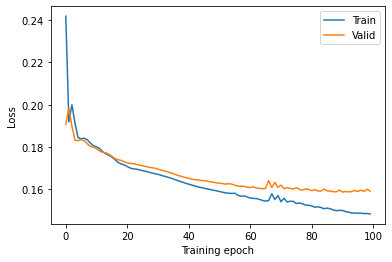

In [25]:
# Load Q_data_random
with open('./data/Q_data_random_RF_constrained.pkl', 'rb') as f:
    Q_c_data_random = pickle.load(f)

print('Number of episodes generated by random policy:',len(Q_c_data_random))

s_material_inputs, s_step_inputs, a_elem_inputs, a_comp_inputs, Q_targets, en_targets = generate_dqn_dcn_inputs_and_targets_from_Q_c_data(Q_c_data = Q_c_data_random)

# Standardizing s_material data
scaler = StandardScaler() # Fit scaler
print('before scaling:', s_material_inputs)
scaler.fit(s_material_inputs)
s_material_inputs_scaled = torch.tensor(scaler.transform(s_material_inputs)).float().to('cuda')
print('after scaling:', s_material_inputs_scaled)

# Train-validation split
s_material_inputs_train, s_step_inputs_train, a_elem_inputs_train, a_comp_inputs_train, Q_targets_train, en_targets_train, s_material_inputs_valid, s_step_inputs_valid, a_elem_inputs_valid, a_comp_inputs_valid, Q_targets_valid, en_targets_valid \
= train_validation_split(s_material_inputs_scaled = s_material_inputs_scaled.to('cuda'), 
                                    s_step_inputs = s_step_inputs.to('cuda'), 
                                    a_elem_inputs = a_elem_inputs.to('cuda'),
                                    a_comp_inputs = a_comp_inputs.to('cuda'),
                                    Q_targets  = Q_targets.to('cuda'),
                                    en_targets = en_targets.to('cuda'),
                                    valid_size = 0.2)

print('TRAIN SIZES:')
print('s_material_inputs_train:', s_material_inputs_train.shape)
print('s_step_inputs_train:', s_step_inputs_train.shape)
print('a_elem_inputs_train:', a_elem_inputs_train.shape)
print('a_comp_inputs_train:', a_comp_inputs_train.shape)
print('Q_targets_train:', Q_targets_train.shape)
print('en_targets_train:', en_targets_train.shape)
print('')
print('VALIDATION SIZES:')
print('s_material_inputs_valid:', s_material_inputs_valid.shape)
print('s_step_inputs_valid:', s_step_inputs_valid.shape)
print('a_elem_inputs_valid:', a_elem_inputs_valid.shape)
print('a_comp_inputs_valid:', a_comp_inputs_valid.shape)
print('Q_targets_valid:', Q_targets_valid.shape)
print('en_targets_valid:', en_targets_valid.shape)

# Initialize constraint network
dcn = DCN_pytorch().cuda()

# Train DCN on random data
dcn, train_loss_list, valid_loss_list = train_DCN(dcn =  dcn, num_epoch = 100, s_material_inputs_train = s_material_inputs_train, s_step_inputs_train = s_step_inputs_train,
 a_elem_inputs_train = a_elem_inputs_train, a_comp_inputs_train = a_comp_inputs_train, Q_targets_train = Q_targets_train, en_targets_train = en_targets_train,
 s_material_inputs_valid = s_material_inputs_valid, s_step_inputs_valid = s_step_inputs_valid, a_elem_inputs_valid = a_elem_inputs_valid,
 a_comp_inputs_valid = a_comp_inputs_valid, Q_targets_valid = Q_targets_valid, en_targets_valid = en_targets_valid)

# Plot train and valid losses
plt.figure()
plt.plot(range(0,len(train_loss_list)), train_loss_list, label = 'Train')
plt.plot(range(0,len(valid_loss_list)), valid_loss_list, label = 'Valid')
plt.legend()
# plt.ylim(130,170)
plt.xlabel('Training epoch')
plt.ylabel('Loss')
# plt.savefig('plots/train_valid_loss.png', dpi = 300)
plt.show()

In [26]:
# torch.save(dcn, './dcn_models/constrained_DQN_cuda/dcn_test_random_RF_constrained')

# Visualization of results

### Final reward of compounds generated from constrained model (DQN + DCN)

In [27]:
# # Earlier models
# dqn = torch.load('./dqn_models/dqn_test_500iter_RF_constrained') # Trained in constrained RL
# dqn = torch.load('./dqn_models/dqn_test_490iter_RF') # Trained in unconstrained RL
# dcn = torch.load('./dcn_models/dcn_test_random_RF_constrained') # Trained on random data

# Final constrained models
dqn = torch.load('./dqn_models/constrained_DQN_cuda/dqn_test_500iter_RF_constrained') # Trained in constrained RL
dcn = torch.load('./dcn_models/constrained_DQN_cuda/dcn_test_random_RF_constrained') # Trained on random data

# dqn.fc1.weight.mean(), dqn.fc2.weight.mean(), dqn.fc3.weight.mean(), dqn.fc4.weight.mean(),
dcn.fc1.weight.mean(), dcn.fc2.weight.mean(), dcn.fc3.weight.mean(), dcn.fc4.weight.mean(),

(tensor(-0.0090, device='cuda:0', grad_fn=<MeanBackward0>),
 tensor(-0.0389, device='cuda:0', grad_fn=<MeanBackward0>),
 tensor(0.0042, device='cuda:0', grad_fn=<MeanBackward0>),
 tensor(-0.0367, device='cuda:0', grad_fn=<MeanBackward0>))

In [31]:
# 1. Get final rewards from random policy
with open('./data/Q_data_random_RF_constrained.pkl', 'rb') as f:
    Q_data_random = pickle.load(f)
s_material_inputs, s_step_inputs, a_elem_inputs, a_comp_inputs, Q_targets, en_targets = generate_dqn_dcn_inputs_and_targets_from_Q_c_data(Q_c_data = Q_data_random)
final_rewards_random = Q_targets[0::5].reshape(-1) # find final rewards
en_random = en_targets[0::5].reshape(-1) # find final en

# 2. Get final rewards from trained policy
Q_c_data_trained, en_targets_trained, final_rewards_trained, final_compounds = \
generate_Q_c_datapoints_and_evaluate_policy(dqn = dqn, dcn = dcn, num_eps = 1000, epsilon = 0, 
                                            en_threshold = 0.4, stochastic_top_frac = 0.20)

# # Save compounds generated                                            
# with open('./training_data/constrained_DQN_cuda/final_compounds_RF_constrained.pkl', 'wb') as f:
#         pickle.dump(final_compounds, f, pickle.HIGHEST_PROTOCOL)

Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions


/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


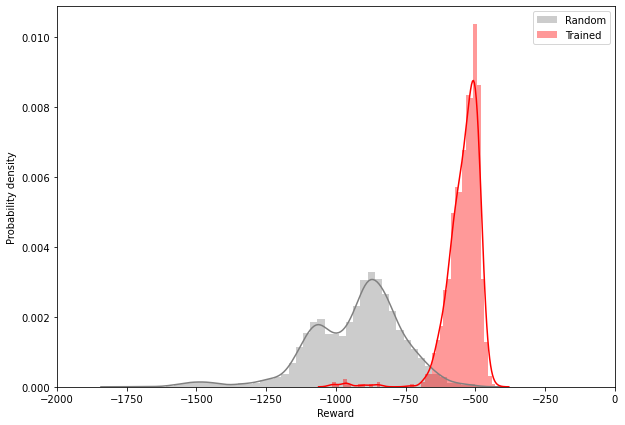

In [47]:
# Plot distribution of final rewards by random vs trained policy
plt.figure(figsize=(10,7))
sns.distplot(final_rewards_random, hist = True, norm_hist = True, label = 'Random', color = 'grey')
sns.distplot(final_rewards_trained, hist = True, norm_hist = True, label = 'Trained', color = 'red')
plt.ylabel('Probability density')
plt.xlabel('Reward')
# plt.ylim(0,0.0025)
plt.xlim(-2000,0)   
plt.legend()
# plt.savefig(fname = 'plots/constrained_DQN_cuda/reward_dist_500iter_RF_constrained.png', dpi = 300)
plt.show()

### Validity of compounds generated from constrained model (DQN + DCN)

In [33]:
# Validity of trained
count = 0
for target in en_targets_trained:
    if target.item() == 1.:
        count += 1
print('Trained policy: Fraction of en OK compounds = ' , count/len(en_targets_trained))

Trained policy: Fraction of en OK compounds =  0.518


In [34]:
# Validity of random
count = 0
for target in en_random:
    if target.item() == 1.:
        count += 1
print('Random policy: Fraction of en OK compounds = ' , count/len(en_random))

Random policy: Fraction of en OK compounds =  0.2576


### Experiment: Validity vs en_threshold

In [25]:
en_threshold_list  = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
en_good_ratio_vs_en_threshold = []

def evaluate_en_threshold(en_threshold):
    # 2. Get final rewards from trained policy
    Q_c_data_trained, en_targets_trained, final_rewards_trained, final_compounds = \
    generate_Q_c_datapoints_and_evaluate_policy(dqn = dqn, dcn = dcn, num_eps = 1000, epsilon = 0, 
                                            en_threshold = en_threshold, stochastic_top_frac = 0.20)
    # Validity of trained
    count = 0
    for target in en_targets_trained:
        if target.item() == 1.:
            count += 1
    ratio = count/len(en_targets_trained)
    return ratio

for en_threshold in en_threshold_list:
    en_good_ratio = evaluate_en_threshold(en_threshold = en_threshold)
    en_good_ratio_vs_en_threshold.append(en_good_ratio)

# with open('./training_data/en_threshold_list_RF_constrained.pkl', 'wb') as f:
#         pickle.dump(en_threshold_list, f, pickle.HIGHEST_PROTOCOL)

# with open('./training_data/en_good_ratio_vs_en_threshold_RF_constrained.pkl', 'wb') as f:
#         pickle.dump(en_good_ratio_vs_en_threshold, f, pickle.HIGHEST_PROTOCOL)

Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions
Could not satisfy en constraint after 100 actions


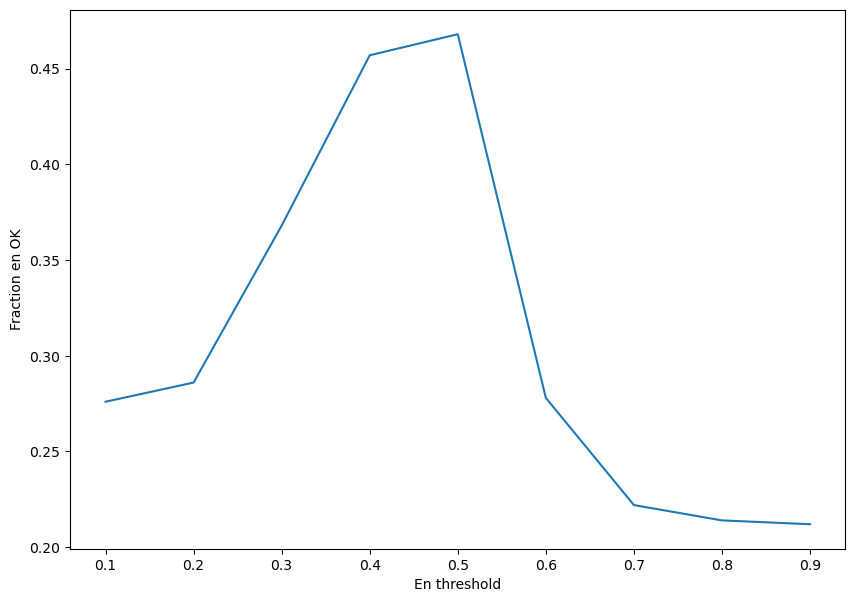

In [26]:
# with open('./training_data/en_threshold_list_RF_constrained.pkl', 'rb') as f:
#     en_threshold_list = pickle.load(f)

# with open('./training_data/en_good_ratio_vs_en_threshold_RF_constrained.pkl', 'rb') as f:
#     en_good_ratio_vs_en_threshold = pickle.load(f)

plt.figure(figsize=(10,7))
plt.plot(en_threshold_list, en_good_ratio_vs_en_threshold)
plt.ylabel('Fraction en OK')
plt.xlabel('En threshold')
# plt.savefig(fname = 'plots/en_good_ratio_vs_en_threshold_500iter_RF_constrained.png', dpi = 300)
plt.show()

### Look at compounds

In [35]:
rf_regr = RandomForestRegressor()
rf_regr = joblib.load("rf_models/rf_sinter_predict_no_imputation_no_precursors.joblib")

# Featurization for RF model
feature_calculators = MultipleFeaturizer([
    cf.element.Stoichiometry(),
    cf.composite.ElementProperty.from_preset("magpie"),
    cf.orbital.ValenceOrbital(props=["avg"]),
    cf.ion.IonProperty(fast=True)
])

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/sklearn/base.py:315: UserWarning: Trying to unpickle estimator DecisionTreeRegressor from version 0.23.2 when using version 0.24.2. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/sklearn/base.py:315: UserWarning: Trying to unpickle estimator RandomForestRegressor from version 0.23.2 when using version 0.24.2. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)


In [36]:
# Load compounds generated
with open('./training_data/constrained_DQN_cuda/final_compounds_RF_constrained.pkl', 'rb') as f: # For final compounds generated using constrained RL (DQN + DCN)
    final_compounds = pickle.load(f)

# For final compounds generated using constrained RL (DQN + DCN)
good, bad = check_both_multiple(final_compounds)

In [37]:
print('Fraction of en OK compounds:', len(good)/(len(good) + len(bad)))

Fraction of en OK compounds: 0.518


Compound: Sn9Ge8Se5              Sinter T: 502
Compound: In3Ge8BiAs9I5          Sinter T: 493
Compound: Ga3P2(Se4S5)2          Sinter T: 591
Compound: Sb2Te9(Se3S4)3         Sinter T: 550
Compound: Ge11AsP5I4             Sinter T: 555
Compound: Sn7Ge15P7I6            Sinter T: 524
Compound: In5(P3S7)2             Sinter T: 642
Compound: Sn2Bi7As8PbS5          Sinter T: 502
Compound: InSn2Ge4(PbI)7         Sinter T: 486
Compound: Sn7Ge3As7P7Se8         Sinter T: 500
Compound: In8(Sn2Ge3)3           Sinter T: 499
Compound: In3AsP3Au3S            Sinter T: 628
Compound: InGe4Te8P5Se9          Sinter T: 524
Compound: In2Ge8As3Se9Br7        Sinter T: 515
Compound: Ga6Ag5Ge11I            Sinter T: 512
Compound: InSn2Ge8(BiI)5         Sinter T: 494
Compound: In4Ge13Sb5S6           Sinter T: 585
Compound: Ga6Ag4Ge8S             Sinter T: 576
Compound: Ge8Bi4Sb5AsS5          Sinter T: 491
Compound: SnGe6Pb4S7             Sinter T: 568
Compound: Sn5Ge5Bi8(TeS)6        Sinter T: 508
Compound: Ge1

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


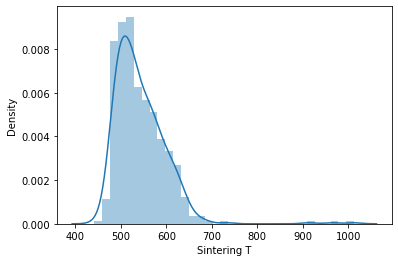

In [38]:
# Convert good ones to reduced formula
for idx in range(len(good)):
    good[idx] = Composition(good[idx]).reduced_formula

# Predict sintering T of valid compounds
max_len = 0
good_sinter_T = []
for compound in good:
    chemical = Composition(compound)
    features = feature_calculators.featurize(chemical) # No need to scale for RF model
    features = np.array(features).reshape(1, -1)
    # print(features)
    sinter_T_pred = rf_regr.predict(features)[0]
    good_sinter_T.append(sinter_T_pred)
    compound = Composition(compound).reduced_formula
    print('Compound:', compound, (18-len(compound)+3)*' ','Sinter T:', round(sinter_T_pred))

plt.figure()
sns.distplot(good_sinter_T)
plt.xlabel('Sintering T')
plt.show()

### Formation energy of generated compounds

In [57]:
predict_formation_energy('NaCl')

AssertionError: data/el-embeddings/matscholar-embedding.json does not exist!

In [39]:
# RANDOM POLICY
# Save predicted formation energies of random policy                                
# with open('./training_data/form_e_random.pkl', 'wb') as f:
#         pickle.dump(form_e_random, f, pickle.HIGHEST_PROTOCOL)

# Load predicted formation energies of random_policy
with open('./training_data/form_e_random.pkl', 'rb') as f: 
    form_e_random = pickle.load(f)

len([x for x in form_e_random if x <= 0])/len(form_e_random)

0.77

In [45]:
# UNCONSTRAINED DQN (sintering T only)
# # Save predicted formation energies of UNconstrained DQN                                  
# with open('./training_data/form_e_500iter_RF.pkl', 'wb') as f:
#         pickle.dump(form_e_unconstrained, f, pickle.HIGHEST_PROTOCOL)

# Load predicted formation energies of UNconstrained DQN
with open('./training_data/form_e_500iter_RF.pkl', 'rb') as f: 
    form_e_unconstrained = pickle.load(f)

len([x for x in form_e_unconstrained if x <= 0])/len(form_e_unconstrained)

0.9

In [42]:
# CONSTRAINED DQN (sintering T + en constraint)
# # Save predicted formation energies of constrained DQN                                  
# with open('./training_data/constrained_DQN_cuda/form_e_500iter_RF_constrained.pkl', 'wb') as f:
#         pickle.dump(form_e_constrained, f, pickle.HIGHEST_PROTOCOL)

# Load predicted formation energies of constrained DQN
with open('./training_data/constrained_DQN_cuda/form_e_500iter_RF_constrained.pkl', 'rb') as f: 
    form_e_constrained = pickle.load(f)

len([x for x in form_e_constrained if x <= 0])/len(form_e_constrained)

0.963

/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/synthesisproject/anaconda3/envs/dqn_roost/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


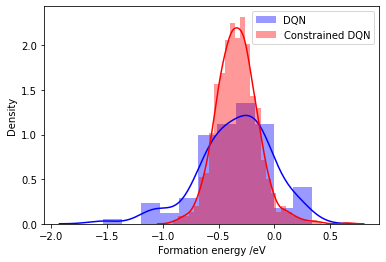

In [50]:
plt.figure()
# sns.distplot(form_e_random, bins = 30, hist = True, norm_hist = True, label = 'Random', color = 'grey')
sns.distplot(form_e_unconstrained, hist = True, norm_hist = True, label = 'DQN', color = 'blue')
sns.distplot(form_e_constrained, hist = True, norm_hist = True, label = 'Constrained DQN', color = 'red')
plt.xlabel('Formation energy /eV')
plt.legend()
# plt.savefig('plots/constrained_DQN_cuda/form_e_comparison.png', dpi = 300)
plt.show()

# Visualizing training data of unconstrained DQN

### Evolution of final rewards with iteration (unconstrained DQN only)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


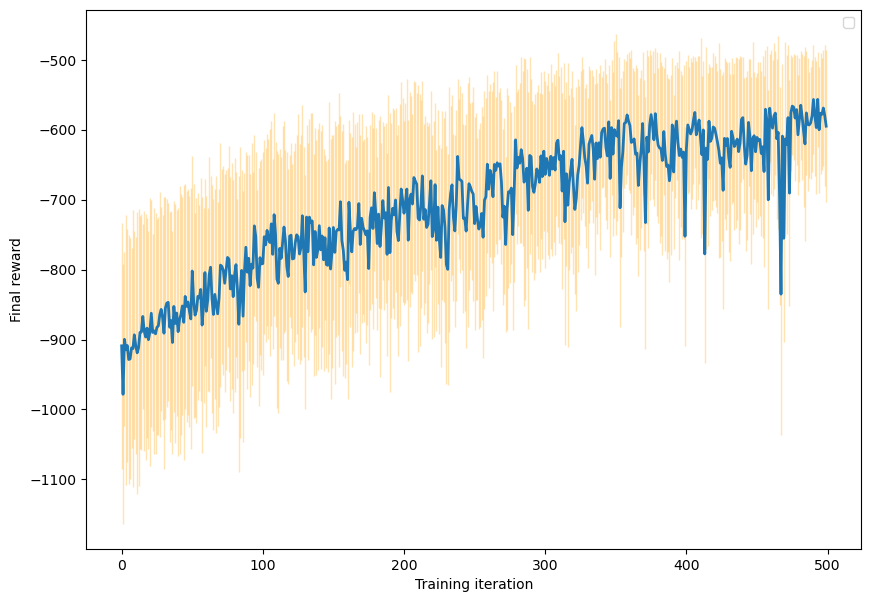

In [21]:
with open('./training_data/final_rewards_vs_iter_RF_constrained.pkl', 'rb') as f:
    final_rewards_vs_iter = pickle.load(f)
num_iter = 500
final_rewards_mean = [x.mean() for x in final_rewards_vs_iter]
final_rewards_std  = [x.std() for x in final_rewards_vs_iter]
plt.figure(figsize=(10,7))
markers, caps, bars = plt.errorbar(range(num_iter), final_rewards_mean, yerr = final_rewards_std, mfc= 'blue', linewidth = 2, elinewidth= 1)
[bar.set_alpha(0.3) for bar in bars]
[bar.set_color('orange') for bar in bars]
plt.ylabel('Final reward')
plt.xlabel('Training iteration')
plt.legend()
# plt.savefig(fname = 'plots/reward_vs_iter_500iter_RF_constrained.png', dpi = 300)
plt.show()

### Evolution of compounds with iteration (unconstrained DQN only)

In [2]:
# with open('./training_data/compounds_vs_iter_RF.pkl', 'rb') as f:
#     compounds_vs_iter = pickle.load(f)

# # FEATURIZE GENERATED COMPOUNDS
# for iteration in tqdm(range(len(compounds_vs_iter))): # For each iteration of compounds
#     for idx in range(len(compounds_vs_iter[iteration])): # For each compound
#         compounds_vs_iter[iteration][idx] = featurize_target(compounds_vs_iter[iteration][idx]) # Featurize using Magpie embeddings

# # Save featurized compounds
# with open('./training_data/compound_features_vs_iter_RF.pkl', 'wb') as f:
#         pickle.dump(compounds_vs_iter, f, pickle.HIGHEST_PROTOCOL)

In [28]:
# Load compound features
with open('./training_data/compound_features_vs_iter_RF.pkl', 'rb') as f:
    compound_features_vs_iter = pickle.load(f)

In [29]:
len(compound_features_vs_iter)

500

Standarizing data before PCA is important.

In [30]:
# Load scalar
scaler = StandardScaler() # Fit scaler
scaler.fit(s_material_inputs)

# Convert each compound features from list to np.array
for iteration in tqdm(range(len(compound_features_vs_iter))): # For each iteration of compounds
    for idx in range(len(compound_features_vs_iter[iteration])): # For each compound
        compound_features_vs_iter[iteration][idx] = scaler.transform(np.array([compound_features_vs_iter[iteration][idx]]))[0] # Featurize using Magpie embeddings

100%|██████████| 500/500 [00:02<00:00, 243.93it/s]


In [32]:
features = [] # 500 x np.array() of shape 100 x 145 (100 is no of compounds per iteration, 145 is the feature size)
for iteration in tqdm(range(len(compound_features_vs_iter))): # For each iteration of compounds
    iteration_stack = []
    for idx in range(len(compound_features_vs_iter[iteration])): # For each compound
        iteration_stack.append(compound_features_vs_iter[iteration][idx])
    iteration_stack = np.stack(iteration_stack)
    features.append(iteration_stack)

100%|██████████| 500/500 [00:00<00:00, 6695.70it/s]


In [33]:
# Stack features into one big matrix
full_stack = [] 
for iteration in features:
    full_stack.append(iteration)
full_stack = np.vstack(full_stack)

### Dimensionality reduction using t-SNE

In [69]:
# Perform t-SNE
tsne_embeddings = TSNE(n_components = 2, 
                       perplexity = 30,
                       learning_rate='auto',
                       init='random' # random/pca initialization
                       ).fit_transform(full_stack)

# with open('training_data/tsne_embeddings_500iter_RF.npy', 'wb') as f:
#     np.save(f, tsne_embeddings)

In [97]:
# Load t-SNE embeddings
with open('training_data/tsne_embeddings_500iter_RF.npy', 'rb') as f:
    tsne_embeddings = np.load(f)

with open('./training_data/final_rewards_vs_iter_RF.pkl', 'rb') as f:
    final_rewards_vs_iter = pickle.load(f)

final_rewards_vs_iter_stacked = torch.stack(final_rewards_vs_iter)
final_rewards = final_rewards_vs_iter_stacked.reshape(-1)
print('tsne_embeddings: ', tsne_embeddings.shape)
print('final_rewards:', final_rewards.shape)

tsne_embeddings:  (50000, 2)
final_rewards: torch.Size([50000])


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


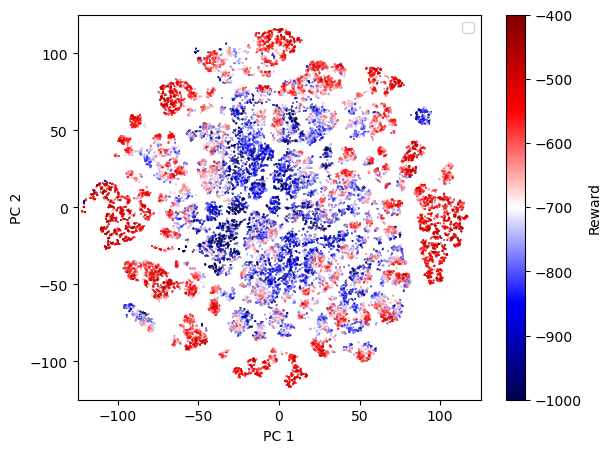

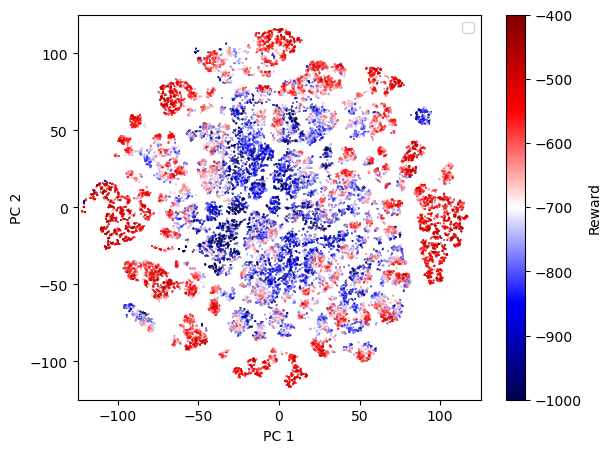

In [98]:
# Generate list of iterations for 50k compounds
iteration = []
for i in range(500):
    for j in range(100):
        iteration.append(i)
# Plot TSNE
def plot_TSNE(train_iter = None):
    fig = plt.figure(figsize=(6.5,5))
    if train_iter == None:
        plt.scatter(tsne_embeddings[:,0], tsne_embeddings[:,1], s = 0.05, alpha = 1, c = final_rewards, cmap = 'seismic') # For rewards
        # plt.scatter(tsne_embeddings[:,0], tsne_embeddings[:,1], s = 0.05, alpha = 1, c = iteration, cmap = 'seismic') # For iteration
    else:
        row_idx = range(100*train_iter,(100*train_iter)+100)
        rewards = final_rewards_vs_iter[train_iter]
        plt.scatter(tsne_embeddings[row_idx,0], tsne_embeddings[row_idx,1], c = rewards, s = 5, cmap = 'seismic')
    plt.ylabel('PC 2')
    plt.xlabel('PC 1')
    plt.ylim(-125, 125)
    plt.xlim(-125, 125)
    plt.legend()
    # plt.text(20,100,'Iteration %.0f' % train_iter, fontsize = 15)
    cbar = plt.colorbar()
    cbar.set_label('Reward')
    # cbar.set_label('Iteration')
    plt.clim(-1000,-400) 
    # plt.savefig(fname = 'plots/TSNE_vs_iter_500iter_RF.png', dpi = 300) 
    plt.show()
    return fig
plot_TSNE()

In [ ]:
images = []  # For saving into gif

for i in range(0, 600, 1): # For stalling the last frame
    j = i
    if i > 499: # For stalling the last frame
        j = 499
    fig = plot_TSNE(train_iter = j)
    # Used to return the plot as an image array 
    # (https://ndres.me/post/matplotlib-animated-gifs-easily/)
    fig.canvas.draw()       # draw the canvas, cache the renderer
    image = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
    image = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))
    images.append(image)
imageio.mimsave('plots/TSNE_reward_vs_iter_500iter_RF.gif', images, fps = 30)

### Dimensionality reduction using singular value decomposition (SVD)

In [66]:
# Perform SVD
u, s, vh = np.linalg.svd(full_stack, full_matrices=True)

# with open('training_data/SVD_embeddings_500iter_RF.npy', 'wb') as f:
#     np.save(f, u)

In [67]:
# Load SVD embeddings
with open('training_data/SVD_embeddings_500iter_RF.npy', 'rb') as f:
    u = np.load(f)

with open('training_data/final_rewards_vs_iter_RF.pkl', 'rb') as f:
    final_rewards_vs_iter = pickle.load(f)

final_rewards_vs_iter_stacked = torch.stack(final_rewards_vs_iter)
final_rewards = final_rewards_vs_iter_stacked.reshape(-1)
print('SVD_embeddings: ', u.shape)
print('final_rewards:', final_rewards.shape)

u_truncated = u[:, :2]
print('SVD_embeddings after truncation:', u_truncated.shape)

SVD_embeddings:  (50000, 50000)
final_rewards: torch.Size([50000])
SVD_embeddings after truncation: (50000, 2)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


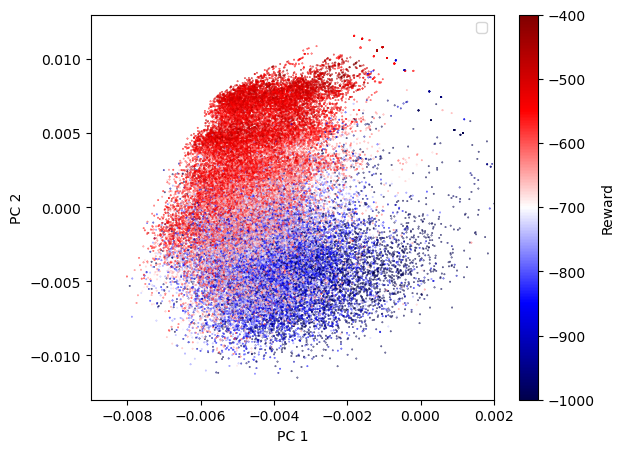

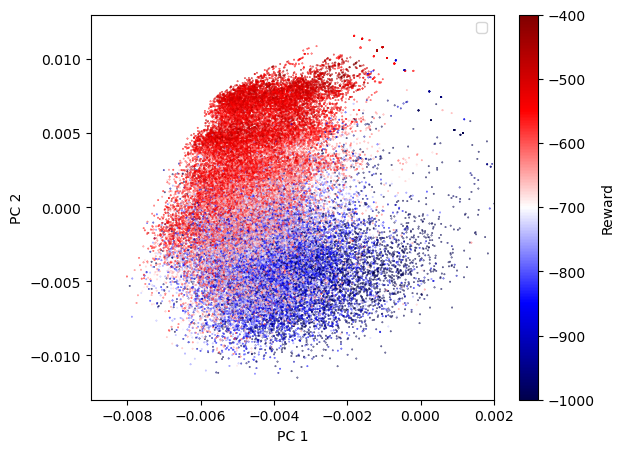

In [99]:
iteration = []
for i in range(500):
    for j in range(100):
        iteration.append(i)

# Plot SVD
def plot_SVD(train_iter = None):
    fig = plt.figure(figsize=(6.5,5))
    if train_iter == None:
        plt.scatter(u_truncated[:,0], u_truncated[:,1], c = final_rewards, s = 0.1, cmap = 'seismic') # For rewards
        # plt.scatter(u_truncated[:,0], u_truncated[:,1], c = iteration, s = 0.1, cmap = 'seismic') # For iterations
    else:
        row_idx = range(100*train_iter,(100*train_iter)+100)
        rewards = final_rewards_vs_iter[train_iter]
        plt.scatter(u_truncated[row_idx,0], u_truncated[row_idx,1], c = rewards, s = 5, cmap = 'seismic')
    plt.ylabel('PC 2')
    plt.xlabel('PC 1')
    plt.ylim(-0.013, 0.013)
    plt.xlim(-0.009, .002)
    plt.legend()
    # plt.text(-0.002,0.010,'Iteration %.0f' % train_iter, fontsize = 15)
    cbar = plt.colorbar()
    plt.clim(-1000,-400)  
    # cbar.set_label('Iteration')
    cbar.set_label('Reward')
    # plt.savefig(fname = 'plots/SVD_reward_vs_iter_500iter_RF.png', dpi = 300)
    plt.show()
    return fig
plot_SVD()

In [ ]:
images = []  # For saving into gif

for i in range(0, 600, 1): # For stalling the last frame
    j = i
    if i > 499: # For stalling the last frame
        j = 499
    fig = plot_SVD(train_iter = j)
    # Used to return the plot as an image array 
    # (https://ndres.me/post/matplotlib-animated-gifs-easily/)
    fig.canvas.draw()       # draw the canvas, cache the renderer
    image = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
    image = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))
    images.append(image)
imageio.mimsave('plots/SVD_reward_vs_iter_500iter_RF.gif', images, fps = 30)

### Charge neutrality of generated compounds (unconstrained DQN)
From this point onwards, we start using dqn2 environment

In [36]:
with open('./training_data/compounds_vs_iter_RF.pkl', 'rb') as f:
    compounds_vs_iter = pickle.load(f)
compounds = compounds_vs_iter[0]

good, bad = check_neutrality_multiple(compounds = compounds)
len(good), len(bad)

(45, 55)

In [37]:
# Check charge neutrality
good_vs_iter = []
bad_vs_iter  = []
for compounds in compounds_vs_iter:
    good, bad = check_neutrality_multiple(compounds = compounds)
    good_vs_iter.append(len(good))
    bad_vs_iter.append(len(bad))

cn_good_ratio = np.array(good_vs_iter)/(np.array(good_vs_iter)+np.array(bad_vs_iter))

# with open('training_data/cn_good_ratio_500iter_RF.npy', 'wb') as f:
#     np.save(f, cn_good_ratio)

Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid


In [41]:
# Load charge neutrality
with open('training_data/cn_good_ratio_500iter_RF.npy', 'rb') as f:
    cn_good_ratio = np.load(f)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


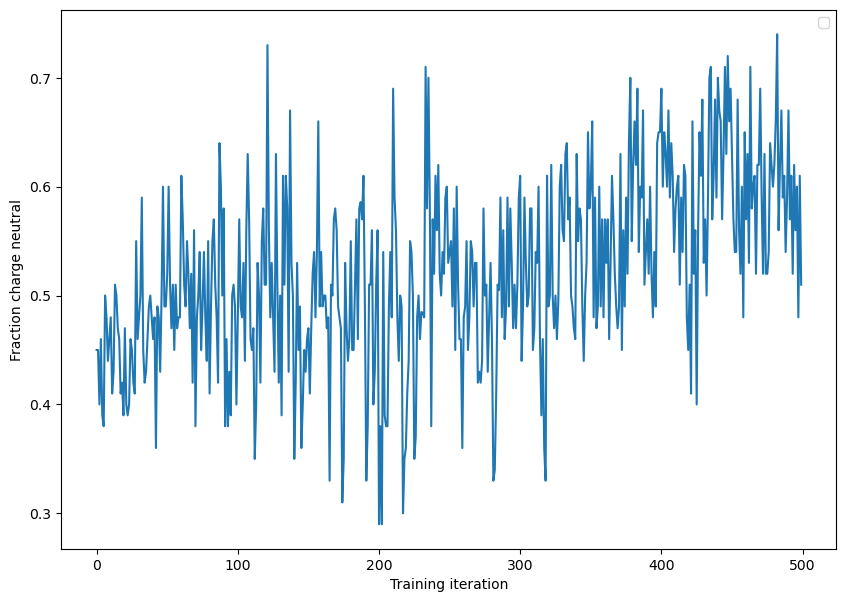

In [42]:
num_iter = len(compounds_vs_iter)
plt.figure(figsize=(10,7))
plt.plot(range(num_iter), cn_good_ratio)
plt.ylabel('Fraction charge neutral')
plt.xlabel('Training iteration')
plt.legend()
# plt.savefig(fname = 'plots/cn_vs_iter_500iter_RF.png', dpi = 300)
plt.show()

### Electronegativity of generated compounds (unconstrained DQN)

In [35]:
with open('./training_data/compounds_vs_iter_RF_constrained.pkl', 'rb') as f:
    compounds_vs_iter = pickle.load(f)
compounds = compounds_vs_iter[0]

good, bad = check_electronegativity_multiple(compounds = compounds)
len(good), len(bad)

(20, 80)

In [39]:
# Check electronegativity
good_vs_iter = []
bad_vs_iter  = []
for compounds in compounds_vs_iter:
    good, bad = check_electronegativity_multiple(compounds = compounds)
    good_vs_iter.append(len(good))
    bad_vs_iter.append(len(bad))

en_good_ratio = np.array(good_vs_iter)/(np.array(good_vs_iter)+np.array(bad_vs_iter))

with open('training_data/en_good_ratio_500iter_RF_constrained.npy', 'wb') as f:
    np.save(f, en_good_ratio)

Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid


In [31]:
# Load electronegativity
with open('training_data/en_good_ratio_500iter_RF_constrained.npy', 'rb') as f:
    en_good_ratio = np.load(f)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


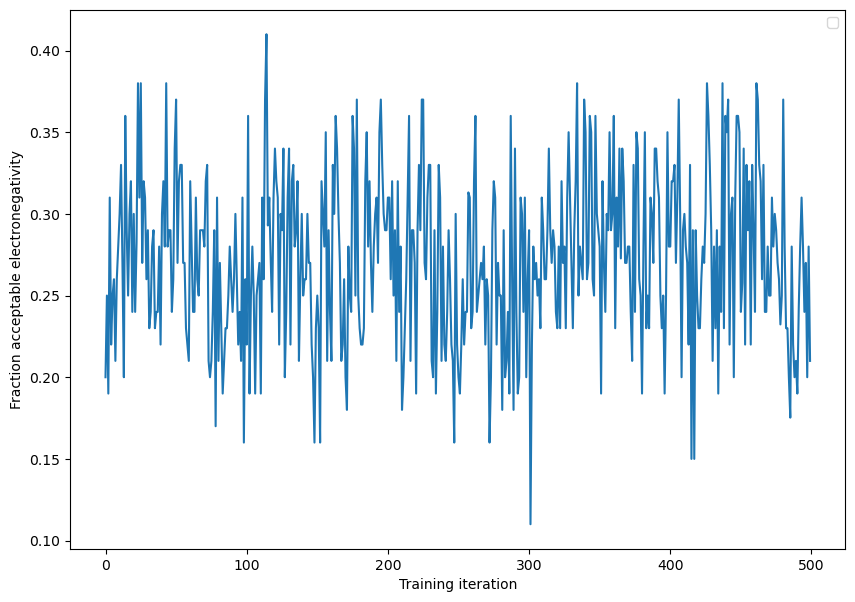

In [40]:
num_iter = len(compounds_vs_iter)
plt.figure(figsize=(10,7))
plt.plot(range(num_iter), en_good_ratio)
plt.ylabel('Fraction acceptable electronegativity')
plt.xlabel('Training iteration')
plt.legend()
# plt.savefig(fname = 'plots/en_vs_iter_500iter_RF.png', dpi = 300)
plt.show()

### Check both charge neutrality and electronegativity (unconstrained DQN)

In [2]:
with open('./training_data/compounds_vs_iter_RF.pkl', 'rb') as f:
    compounds_vs_iter = pickle.load(f)

In [49]:
# Efficient way
good_vs_iter = []
bad_vs_iter  = []
for compounds in compounds_vs_iter:
    cn_good, cn_bad = check_neutrality_multiple(compounds = compounds)
    both_good, bad = check_electronegativity_multiple(compounds = cn_good)

    good_vs_iter.append(len(both_good))
    bad_vs_iter.append(len(cn_bad)+len(bad))

both_good_ratio = np.array(good_vs_iter)/(np.array(good_vs_iter)+np.array(bad_vs_iter))

# with open('training_data/both_good_ratio_500iter_RF.npy', 'wb') as f:
#     np.save(f, both_good_ratio)

Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid
Compound not valid


In [38]:
# Inefficient way - To double check

# compounds = compounds_vs_iter[0]
# good, bad = check_both_multiple(compounds = compounds)

# Inefficient way - To double check
# good_vs_iter = []
# bad_vs_iter  = []
# for compounds in compounds_vs_iter:
#     good, bad = check_both_multiple(compounds = compounds)
#     good_vs_iter.append(len(good))
#     bad_vs_iter.append(len(bad))

# both_good_ratio = np.array(good_vs_iter)/(np.array(good_vs_iter)+np.array(bad_vs_iter))

# with open('training_data/both_good_ratio_500iter_RF.npy', 'wb') as f:
#     np.save(f, both_good_ratio)

In [9]:
# Load both
with open('training_data/both_good_ratio_500iter_RF.npy', 'rb') as f:
    both_good_ratio = np.load(f)

# Load electronegativity
with open('training_data/en_good_ratio_500iter_RF.npy', 'rb') as f:
    en_good_ratio = np.load(f)

# Load charge neutrality
with open('training_data/cn_good_ratio_500iter_RF.npy', 'rb') as f:
    cn_good_ratio = np.load(f)

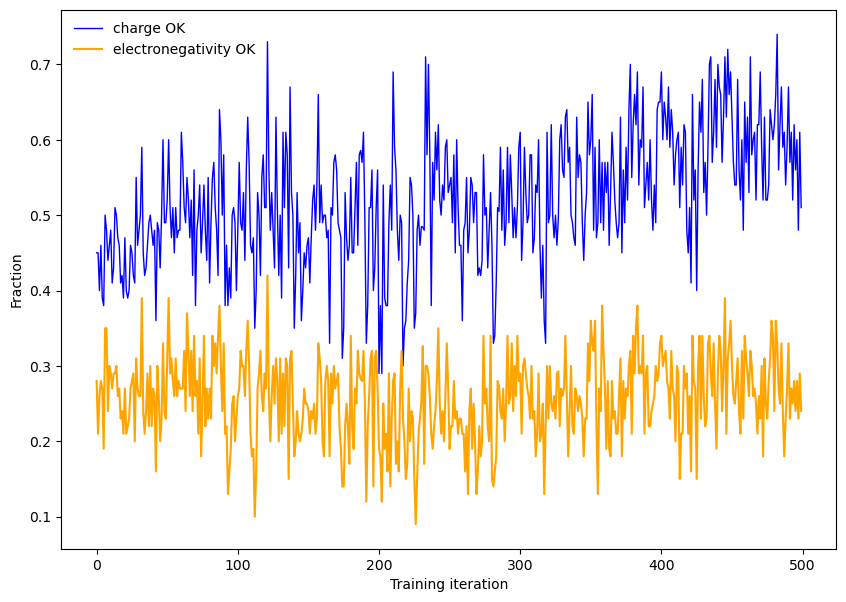

In [20]:
num_iter = len(compounds_vs_iter)
plt.figure(figsize=(10,7))
plt.plot(range(num_iter), cn_good_ratio, label = 'charge OK', color = 'blue', linewidth = 1)
plt.plot(range(num_iter), en_good_ratio, label = 'electronegativity OK', color = 'orange')
# plt.plot(range(num_iter), both_good_ratio, label = 'both OK')
plt.ylabel('Fraction')
plt.xlabel('Training iteration')
plt.legend(frameon= False)
# plt.savefig(fname = 'plots/both_vs_iter_500iter_RF.png', dpi = 300)
plt.show()